In [1]:
%pylab inline 


Populating the interactive namespace from numpy and matplotlib


In [2]:
import gym
from gym import error, spaces, utils
from gym.utils import seeding
from collections import Counter
import time
import progressbar as pb
from tqdm import tqdm
import os
import shutil
from empyrical import sortino_ratio, calmar_ratio, omega_ratio
from stable_baselines.common.policies import MlpPolicy, MlpLstmPolicy, ActorCriticPolicy, FeedForwardPolicy
from stable_baselines.common.vec_env import SubprocVecEnv, VecEnv, VecEnvWrapper
from stable_baselines import A2C, PPO2
from stable_baselines.common.vec_env import DummyVecEnv
import tensorflow as tf
from trading_env import TradingEnv

In [3]:
# load the market data
input_source = np.load(open('data_spy.npy','rb'))
to_predict = np.load(open('data_spy_targets.npy','rb'))

to_predict = to_predict[3,:].reshape(-1)

input_source = input_source.T

In [4]:
is_orig = np.copy(input_source)
cp = int(0.8*len(input_source))
test_input_source = input_source[cp:, :]
test_to_predict = to_predict[cp:]
input_source = input_source[0:cp, :]
to_predict = to_predict[0:cp]

In [5]:
bars_per_episode = 1000
winlen = 1
traded_amt = 1
initial_balance = 10000
commission = 0
slippage = 0.0

In [6]:
# multiprocess environment
#n_cpu = 16
#env = SubprocVecEnv([lambda: TradingEnv(input_source, to_predict,
#                                         winlen=winlen, bars_per_episode=bars_per_episode, traded_amt=traded_amt, initial_balance=initial_balance,
#                                         commission=commission, slippage=slippage) for i in range(n_cpu)])
env = TradingEnv(input_source, to_predict,
                 winlen=winlen, bars_per_episode=bars_per_episode, traded_amt=traded_amt, initial_balance=initial_balance,
                 commission=commission, slippage=slippage
                 )
env = DummyVecEnv([lambda: env])

t = 0
# Custom MLP policy of two layers of size 32 each with tanh activation function
policy_kwargs = dict(act_fun=tf.nn.relu, net_arch=[64, 64])

#[shutil.rmtree('/home/peter/tblog/'+x) for x in os.listdir('/home/peter/tblog/') if x]
model = PPO2(MlpPolicy, env, n_steps=64, verbose=1, nminibatches=1, policy_kwargs=policy_kwargs, 
             gamma=0.8,#0.99,
             ent_coef=0.05,#0.01,
             learning_rate=0.00025,
             vf_coef=0.5,
             max_grad_norm=0.5,
             lam=0.95,
             tensorboard_log='/home/peter/tblog')
try:
    model.learn(total_timesteps=10_000_000)
    model.save("ppo2_trading")
except KeyboardInterrupt:
    pass

W0706 10:47:15.983130 140136495011648 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/stable_baselines/common/tf_util.py:98: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

W0706 10:47:15.983772 140136495011648 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/stable_baselines/common/tf_util.py:107: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

W0706 10:47:15.990628 140136495011648 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/stable_baselines/common/policies.py:114: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.

W0706 10:47:15.991299 140136495011648 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/stable_baselines/common/input.py:25: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0706 10:47:15.992789 140136495011648 deprecation.py:323] From /u

--------------------------------------
| approxkl           | 3.499498e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.454        |
| fps                | 322           |
| n_updates          | 1             |
| policy_entropy     | 1.0985408     |
| policy_loss        | -0.0024472252 |
| serial_timesteps   | 64            |
| time_elapsed       | 2.62e-06      |
| total_timesteps    | 64            |
| value_loss         | 0.9356376     |
--------------------------------------
---------------------------------------
| approxkl           | 5.69487e-06    |
| clipfrac           | 0.0            |
| explained_variance | 0.0313         |
| fps                | 2170           |
| n_updates          | 2              |
| policy_entropy     | 1.0984588      |
| policy_loss        | -0.00052414415 |
| serial_timesteps   | 128            |
| time_elapsed       | 0.199          |
| total_timesteps    | 128            |
| value_loss         | 2.351785       |
-------------

--------------------------------------
| approxkl           | 6.9474936e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.0378        |
| fps                | 2401          |
| n_updates          | 18            |
| policy_entropy     | 1.0935953     |
| policy_loss        | -0.0007687155 |
| serial_timesteps   | 1152          |
| time_elapsed       | 0.689         |
| total_timesteps    | 1152          |
| value_loss         | 94.776245     |
--------------------------------------
--------------------------------------
| approxkl           | 1.7250111e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.044         |
| fps                | 2486          |
| n_updates          | 19            |
| policy_entropy     | 1.0911092     |
| policy_loss        | -0.0017725341 |
| serial_timesteps   | 1216          |
| time_elapsed       | 0.716         |
| total_timesteps    | 1216          |
| value_loss         | 172.14307     |
-------------------------

--------------------------------------
| approxkl           | 7.0453943e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.104         |
| fps                | 2369          |
| n_updates          | 34            |
| policy_entropy     | 1.0945756     |
| policy_loss        | -0.0011656838 |
| serial_timesteps   | 2176          |
| time_elapsed       | 1.24          |
| total_timesteps    | 2176          |
| value_loss         | 20.443039     |
--------------------------------------
--------------------------------------
| approxkl           | 1.0700058e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0679        |
| fps                | 2481          |
| n_updates          | 35            |
| policy_entropy     | 1.0967373     |
| policy_loss        | -0.0012257956 |
| serial_timesteps   | 2240          |
| time_elapsed       | 1.27          |
| total_timesteps    | 2240          |
| value_loss         | 12.371412     |
-------------------------

---------------------------------------
| approxkl           | 2.5649977e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.0604         |
| fps                | 2494           |
| n_updates          | 51             |
| policy_entropy     | 1.0943829      |
| policy_loss        | -0.00036990223 |
| serial_timesteps   | 3264           |
| time_elapsed       | 1.74           |
| total_timesteps    | 3264           |
| value_loss         | 2.3903625      |
---------------------------------------
--------------------------------------
| approxkl           | 8.221534e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.13          |
| fps                | 2341          |
| n_updates          | 52            |
| policy_entropy     | 1.095572      |
| policy_loss        | -0.0009631263 |
| serial_timesteps   | 3328          |
| time_elapsed       | 1.77          |
| total_timesteps    | 3328          |
| value_loss         | 1.8513074     |
------------

--------------------------------------
| approxkl           | 3.9259885e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.136         |
| fps                | 2379          |
| n_updates          | 68            |
| policy_entropy     | 1.07548       |
| policy_loss        | -0.0006930628 |
| serial_timesteps   | 4352          |
| time_elapsed       | 2.22          |
| total_timesteps    | 4352          |
| value_loss         | 89.07309      |
--------------------------------------
---------------------------------------
| approxkl           | 1.5511466e-06  |
| clipfrac           | 0.0            |
| explained_variance | -0.0211        |
| fps                | 2320           |
| n_updates          | 69             |
| policy_entropy     | 1.0931456      |
| policy_loss        | -0.00059277844 |
| serial_timesteps   | 4416           |
| time_elapsed       | 2.25           |
| total_timesteps    | 4416           |
| value_loss         | 4.47041        |
-------------

--------------------------------------
| approxkl           | 3.64797e-05   |
| clipfrac           | 0.0           |
| explained_variance | -0.229        |
| fps                | 2378          |
| n_updates          | 85            |
| policy_entropy     | 1.0941691     |
| policy_loss        | -0.0008949712 |
| serial_timesteps   | 5440          |
| time_elapsed       | 2.74          |
| total_timesteps    | 5440          |
| value_loss         | 1.2922522     |
--------------------------------------
--------------------------------------
| approxkl           | 1.7709284e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0108        |
| fps                | 2238          |
| n_updates          | 86            |
| policy_entropy     | 1.093226      |
| policy_loss        | -0.0002438128 |
| serial_timesteps   | 5504          |
| time_elapsed       | 2.77          |
| total_timesteps    | 5504          |
| value_loss         | 3.4424305     |
-------------------------

--------------------------------------
| approxkl           | 0.00012003781 |
| clipfrac           | 0.0           |
| explained_variance | 0.313         |
| fps                | 2494          |
| n_updates          | 102           |
| policy_entropy     | 0.84615445    |
| policy_loss        | -0.002274907  |
| serial_timesteps   | 6528          |
| time_elapsed       | 3.22          |
| total_timesteps    | 6528          |
| value_loss         | 674.25635     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0003327973 |
| clipfrac           | 0.0          |
| explained_variance | 0.0363       |
| fps                | 2493         |
| n_updates          | 103          |
| policy_entropy     | 0.46569902   |
| policy_loss        | -0.00519955  |
| serial_timesteps   | 6592         |
| time_elapsed       | 3.25         |
| total_timesteps    | 6592         |
| value_loss         | 1905.0049    |
-------------------------------------

--------------------------------------
| approxkl           | 1.7886048e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.416         |
| fps                | 2458          |
| n_updates          | 119           |
| policy_entropy     | 0.039349463   |
| policy_loss        | 4.388485e-05  |
| serial_timesteps   | 7616          |
| time_elapsed       | 3.7           |
| total_timesteps    | 7616          |
| value_loss         | 56200.75      |
--------------------------------------
--------------------------------------
| approxkl           | 6.2220606e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.337         |
| fps                | 2353          |
| n_updates          | 120           |
| policy_entropy     | 0.32833624    |
| policy_loss        | 0.00020591356 |
| serial_timesteps   | 7680          |
| time_elapsed       | 3.73          |
| total_timesteps    | 7680          |
| value_loss         | 6120.5845     |
-------------------------

--------------------------------------
| approxkl           | 1.3498905e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.594        |
| fps                | 2342          |
| n_updates          | 136           |
| policy_entropy     | 1.069804      |
| policy_loss        | -0.0010429914 |
| serial_timesteps   | 8704          |
| time_elapsed       | 4.18          |
| total_timesteps    | 8704          |
| value_loss         | 0.99987125    |
--------------------------------------
--------------------------------------
| approxkl           | 3.988367e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.107         |
| fps                | 2322          |
| n_updates          | 137           |
| policy_entropy     | 1.0693843     |
| policy_loss        | -0.0028811507 |
| serial_timesteps   | 8768          |
| time_elapsed       | 4.21          |
| total_timesteps    | 8768          |
| value_loss         | 2.0183513     |
-------------------------

---------------------------------------
| approxkl           | 3.0556102e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.121          |
| fps                | 2479           |
| n_updates          | 153            |
| policy_entropy     | 0.00436486     |
| policy_loss        | -1.6898848e-06 |
| serial_timesteps   | 9792           |
| time_elapsed       | 4.66           |
| total_timesteps    | 9792           |
| value_loss         | 13342.308      |
---------------------------------------
--------------------------------------
| approxkl           | 9.732042e-13  |
| clipfrac           | 0.0           |
| explained_variance | 0.0106        |
| fps                | 2421          |
| n_updates          | 154           |
| policy_entropy     | 9.807369e-05  |
| policy_loss        | -8.987263e-08 |
| serial_timesteps   | 9856          |
| time_elapsed       | 4.69          |
| total_timesteps    | 9856          |
| value_loss         | 28920.268     |
------------

--------------------------------------
| approxkl           | 8.014844e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.425         |
| fps                | 1517          |
| n_updates          | 170           |
| policy_entropy     | 0.68100107    |
| policy_loss        | -0.0003991509 |
| serial_timesteps   | 10880         |
| time_elapsed       | 5.14          |
| total_timesteps    | 10880         |
| value_loss         | 331.01245     |
--------------------------------------
--------------------------------------
| approxkl           | 5.1403673e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.176        |
| fps                | 1913          |
| n_updates          | 171           |
| policy_entropy     | 1.0694048     |
| policy_loss        | -0.0030298606 |
| serial_timesteps   | 10944         |
| time_elapsed       | 5.18          |
| total_timesteps    | 10944         |
| value_loss         | 2.5358887     |
-------------------------

--------------------------------------
| approxkl           | 2.0235322e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.506        |
| fps                | 2242          |
| n_updates          | 187           |
| policy_entropy     | 1.0262654     |
| policy_loss        | 2.1141022e-05 |
| serial_timesteps   | 11968         |
| time_elapsed       | 5.64          |
| total_timesteps    | 11968         |
| value_loss         | 3.7640648     |
--------------------------------------
--------------------------------------
| approxkl           | 1.2268108e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.465         |
| fps                | 2372          |
| n_updates          | 188           |
| policy_entropy     | 0.8466963     |
| policy_loss        | 0.00014322484 |
| serial_timesteps   | 12032         |
| time_elapsed       | 5.67          |
| total_timesteps    | 12032         |
| value_loss         | 104.311134    |
-------------------------

--------------------------------------
| approxkl           | 1.7425236e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.446         |
| fps                | 2155          |
| n_updates          | 204           |
| policy_entropy     | 0.19080237    |
| policy_loss        | 0.00012123119 |
| serial_timesteps   | 13056         |
| time_elapsed       | 6.14          |
| total_timesteps    | 13056         |
| value_loss         | 5311.7607     |
--------------------------------------
--------------------------------------
| approxkl           | 9.006817e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.646         |
| fps                | 1792          |
| n_updates          | 205           |
| policy_entropy     | 0.43676913    |
| policy_loss        | 0.00017505698 |
| serial_timesteps   | 13120         |
| time_elapsed       | 6.17          |
| total_timesteps    | 13120         |
| value_loss         | 8225.826      |
-------------------------

--------------------------------------
| approxkl           | 8.283509e-06  |
| clipfrac           | 0.0           |
| explained_variance | -0.788        |
| fps                | 2291          |
| n_updates          | 220           |
| policy_entropy     | 1.055239      |
| policy_loss        | -0.0009522622 |
| serial_timesteps   | 14080         |
| time_elapsed       | 6.63          |
| total_timesteps    | 14080         |
| value_loss         | 1.0174845     |
--------------------------------------
--------------------------------------
| approxkl           | 2.6217855e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.067        |
| fps                | 2469          |
| n_updates          | 221           |
| policy_entropy     | 1.0224917     |
| policy_loss        | 0.00034247432 |
| serial_timesteps   | 14144         |
| time_elapsed       | 6.66          |
| total_timesteps    | 14144         |
| value_loss         | 3.2391982     |
-------------------------

--------------------------------------
| approxkl           | 6.4270807e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.0743       |
| fps                | 2327          |
| n_updates          | 237           |
| policy_entropy     | 1.0297741     |
| policy_loss        | -0.0001920429 |
| serial_timesteps   | 15168         |
| time_elapsed       | 7.1           |
| total_timesteps    | 15168         |
| value_loss         | 6.270447      |
--------------------------------------
--------------------------------------
| approxkl           | 4.9797658e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.196        |
| fps                | 2492          |
| n_updates          | 238           |
| policy_entropy     | 1.0688937     |
| policy_loss        | -0.0029147605 |
| serial_timesteps   | 15232         |
| time_elapsed       | 7.13          |
| total_timesteps    | 15232         |
| value_loss         | 1.7754188     |
-------------------------

--------------------------------------
| approxkl           | 2.2867071e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.819         |
| fps                | 2418          |
| n_updates          | 254           |
| policy_entropy     | 0.062461436   |
| policy_loss        | 9.951182e-06  |
| serial_timesteps   | 16256         |
| time_elapsed       | 7.59          |
| total_timesteps    | 16256         |
| value_loss         | 861.04517     |
--------------------------------------
--------------------------------------
| approxkl           | 3.8071995e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.35          |
| fps                | 2394          |
| n_updates          | 255           |
| policy_entropy     | 0.015312008   |
| policy_loss        | 1.5673693e-05 |
| serial_timesteps   | 16320         |
| time_elapsed       | 7.62          |
| total_timesteps    | 16320         |
| value_loss         | 923.7048      |
-------------------------

--------------------------------------
| approxkl           | 6.4551975e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.612         |
| fps                | 2290          |
| n_updates          | 271           |
| policy_entropy     | 0.0019076038  |
| policy_loss        | 5.6251884e-07 |
| serial_timesteps   | 17344         |
| time_elapsed       | 8.1           |
| total_timesteps    | 17344         |
| value_loss         | 2737.406      |
--------------------------------------
---------------------------------------
| approxkl           | 3.5013876e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.742          |
| fps                | 2304           |
| n_updates          | 272            |
| policy_entropy     | 0.029151693    |
| policy_loss        | -4.2393804e-06 |
| serial_timesteps   | 17408          |
| time_elapsed       | 8.13           |
| total_timesteps    | 17408          |
| value_loss         | 1675.9092      |
-------------

--------------------------------------
| approxkl           | 3.8105597e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.551         |
| fps                | 2248          |
| n_updates          | 288           |
| policy_entropy     | 0.019991238   |
| policy_loss        | 3.123423e-05  |
| serial_timesteps   | 18432         |
| time_elapsed       | 8.6           |
| total_timesteps    | 18432         |
| value_loss         | 856.7916      |
--------------------------------------
---------------------------------------
| approxkl           | 3.6962444e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.888          |
| fps                | 2401           |
| n_updates          | 289            |
| policy_entropy     | 0.025607927    |
| policy_loss        | -0.00022231042 |
| serial_timesteps   | 18496          |
| time_elapsed       | 8.63           |
| total_timesteps    | 18496          |
| value_loss         | 643.2267       |
-------------

--------------------------------------
| approxkl           | 1.1152999e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.613         |
| fps                | 2457          |
| n_updates          | 305           |
| policy_entropy     | 0.77200794    |
| policy_loss        | -0.0005170703 |
| serial_timesteps   | 19520         |
| time_elapsed       | 9.08          |
| total_timesteps    | 19520         |
| value_loss         | 158.48608     |
--------------------------------------
--------------------------------------
| approxkl           | 7.1093855e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.698         |
| fps                | 2466          |
| n_updates          | 306           |
| policy_entropy     | 0.81901455    |
| policy_loss        | -0.0025493437 |
| serial_timesteps   | 19584         |
| time_elapsed       | 9.11          |
| total_timesteps    | 19584         |
| value_loss         | 477.43927     |
-------------------------

------------------------------------
| approxkl           | 0.042596444 |
| clipfrac           | 0.75        |
| explained_variance | 0.331       |
| fps                | 2231        |
| n_updates          | 322         |
| policy_entropy     | 0.67510337  |
| policy_loss        | 0.048663326 |
| serial_timesteps   | 20608       |
| time_elapsed       | 9.56        |
| total_timesteps    | 20608       |
| value_loss         | 1346.3864   |
------------------------------------
--------------------------------------
| approxkl           | 0.023903664   |
| clipfrac           | 0.4921875     |
| explained_variance | 0.371         |
| fps                | 2438          |
| n_updates          | 323           |
| policy_entropy     | 0.64698476    |
| policy_loss        | -0.0063628913 |
| serial_timesteps   | 20672         |
| time_elapsed       | 9.59          |
| total_timesteps    | 20672         |
| value_loss         | 1379.3014     |
--------------------------------------
------------

------------------------------------
| approxkl           | 0.049411885 |
| clipfrac           | 0.546875    |
| explained_variance | 0.898       |
| fps                | 2321        |
| n_updates          | 339         |
| policy_entropy     | 0.53418845  |
| policy_loss        | 0.030274607 |
| serial_timesteps   | 21696       |
| time_elapsed       | 10.1        |
| total_timesteps    | 21696       |
| value_loss         | 3491.6099   |
------------------------------------
------------------------------------
| approxkl           | 0.21584418  |
| clipfrac           | 0.75        |
| explained_variance | -0.13       |
| fps                | 2139        |
| n_updates          | 340         |
| policy_entropy     | 0.6152787   |
| policy_loss        | 0.054385584 |
| serial_timesteps   | 21760       |
| time_elapsed       | 10.1        |
| total_timesteps    | 21760       |
| value_loss         | 3069.5532   |
------------------------------------
--------------------------------------

--------------------------------------
| approxkl           | 7.5114376e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.849         |
| fps                | 1952          |
| n_updates          | 356           |
| policy_entropy     | 0.053285815   |
| policy_loss        | 0.0003074538  |
| serial_timesteps   | 22784         |
| time_elapsed       | 10.6          |
| total_timesteps    | 22784         |
| value_loss         | 9788.828      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00020231801 |
| clipfrac           | 0.0           |
| explained_variance | 0.269         |
| fps                | 2052          |
| n_updates          | 357           |
| policy_entropy     | 0.105361864   |
| policy_loss        | 0.0007175526  |
| serial_timesteps   | 22848         |
| time_elapsed       | 10.6          |
| total_timesteps    | 22848         |
| value_loss         | 8748.48       |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.675         |
| fps                | 1917          |
| n_updates          | 373           |
| policy_entropy     | 3.8344442e-10 |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 23872         |
| time_elapsed       | 11.2          |
| total_timesteps    | 23872         |
| value_loss         | 12639.658     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.779         |
| fps                | 2073          |
| n_updates          | 374           |
| policy_entropy     | 1.4719388e-09 |
| policy_loss        | 3.4924597e-08 |
| serial_timesteps   | 23936         |
| time_elapsed       | 11.2          |
| total_timesteps    | 23936         |
| value_loss         | 10545.369     |
-------------------------

-------------------------------------
| approxkl           | 0.0004229552 |
| clipfrac           | 0.0          |
| explained_variance | 0.784        |
| fps                | 1926         |
| n_updates          | 390          |
| policy_entropy     | 0.43292585   |
| policy_loss        | 0.0015235415 |
| serial_timesteps   | 24960        |
| time_elapsed       | 11.7         |
| total_timesteps    | 24960        |
| value_loss         | 225.44016    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00040659594 |
| clipfrac           | 0.0           |
| explained_variance | 0.195         |
| fps                | 2027          |
| n_updates          | 391           |
| policy_entropy     | 0.35990018    |
| policy_loss        | -0.0004946273 |
| serial_timesteps   | 25024         |
| time_elapsed       | 11.7          |
| total_timesteps    | 25024         |
| value_loss         | 103.79393     |
--------------------------------------

--------------------------------------
| approxkl           | 0.00010342451 |
| clipfrac           | 0.0           |
| explained_variance | -0.771        |
| fps                | 1966          |
| n_updates          | 407           |
| policy_entropy     | 1.0414182     |
| policy_loss        | -0.002885231  |
| serial_timesteps   | 26048         |
| time_elapsed       | 12.3          |
| total_timesteps    | 26048         |
| value_loss         | 2.8089855     |
--------------------------------------
-------------------------------------
| approxkl           | 8.359646e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.884        |
| fps                | 2092         |
| n_updates          | 408          |
| policy_entropy     | 0.89196897   |
| policy_loss        | 0.001372664  |
| serial_timesteps   | 26112        |
| time_elapsed       | 12.3         |
| total_timesteps    | 26112        |
| value_loss         | 31.941677    |
-------------------------------------

--------------------------------------
| approxkl           | 2.7740543e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.716         |
| fps                | 1954          |
| n_updates          | 424           |
| policy_entropy     | 0.9766124     |
| policy_loss        | -0.0010479735 |
| serial_timesteps   | 27136         |
| time_elapsed       | 12.9          |
| total_timesteps    | 27136         |
| value_loss         | 5.3225656     |
--------------------------------------
--------------------------------------
| approxkl           | 1.4843006e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.669         |
| fps                | 1943          |
| n_updates          | 425           |
| policy_entropy     | 0.8178648     |
| policy_loss        | -0.0004455652 |
| serial_timesteps   | 27200         |
| time_elapsed       | 12.9          |
| total_timesteps    | 27200         |
| value_loss         | 10.313171     |
-------------------------

---------------------------------------
| approxkl           | 9.617941e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.76           |
| fps                | 1868           |
| n_updates          | 440            |
| policy_entropy     | 0.7003254      |
| policy_loss        | -0.00041055912 |
| serial_timesteps   | 28160          |
| time_elapsed       | 13.4           |
| total_timesteps    | 28160          |
| value_loss         | 167.70813      |
---------------------------------------
--------------------------------------
| approxkl           | 2.9579303e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.637         |
| fps                | 1826          |
| n_updates          | 441           |
| policy_entropy     | 0.781592      |
| policy_loss        | 0.00011325418 |
| serial_timesteps   | 28224         |
| time_elapsed       | 13.4          |
| total_timesteps    | 28224         |
| value_loss         | 152.64044     |
------------

---------------------------------------
| approxkl           | 3.7186638e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.464          |
| fps                | 1723           |
| n_updates          | 457            |
| policy_entropy     | 0.061567202    |
| policy_loss        | -5.5741286e-05 |
| serial_timesteps   | 29248          |
| time_elapsed       | 14.1           |
| total_timesteps    | 29248          |
| value_loss         | 1960.876       |
---------------------------------------
--------------------------------------
| approxkl           | 3.948938e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.685         |
| fps                | 1899          |
| n_updates          | 458           |
| policy_entropy     | 0.09769584    |
| policy_loss        | -7.763924e-05 |
| serial_timesteps   | 29312         |
| time_elapsed       | 14.1          |
| total_timesteps    | 29312         |
| value_loss         | 3215.5513     |
------------

--------------------------------------
| approxkl           | 2.74451e-05   |
| clipfrac           | 0.0           |
| explained_variance | 0.305         |
| fps                | 2070          |
| n_updates          | 473           |
| policy_entropy     | 0.6044132     |
| policy_loss        | 0.00019909069 |
| serial_timesteps   | 30272         |
| time_elapsed       | 14.6          |
| total_timesteps    | 30272         |
| value_loss         | 1645.057      |
--------------------------------------
--------------------------------------
| approxkl           | 2.5033305e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.666         |
| fps                | 1775          |
| n_updates          | 474           |
| policy_entropy     | 0.68249774    |
| policy_loss        | 6.5498985e-05 |
| serial_timesteps   | 30336         |
| time_elapsed       | 14.6          |
| total_timesteps    | 30336         |
| value_loss         | 450.30548     |
-------------------------

---------------------------------------
| approxkl           | 4.646364e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.87           |
| fps                | 2094           |
| n_updates          | 490            |
| policy_entropy     | 0.8694215      |
| policy_loss        | -4.6828296e-05 |
| serial_timesteps   | 31360          |
| time_elapsed       | 15.2           |
| total_timesteps    | 31360          |
| value_loss         | 72.48232       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00019434451 |
| clipfrac           | 0.0           |
| explained_variance | -0.918        |
| fps                | 1997          |
| n_updates          | 491           |
| policy_entropy     | 0.6031737     |
| policy_loss        | -0.0014507035 |
| serial_timesteps   | 31424         |
| time_elapsed       | 15.2          |
| total_timesteps    | 31424         |
| value_loss         | 61.737343     |
------------

---------------------------------------
| approxkl           | 2.1980772e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.576          |
| fps                | 2145           |
| n_updates          | 507            |
| policy_entropy     | 0.0008419943   |
| policy_loss        | -5.8161095e-07 |
| serial_timesteps   | 32448          |
| time_elapsed       | 15.7           |
| total_timesteps    | 32448          |
| value_loss         | 1058.7665      |
---------------------------------------
---------------------------------------
| approxkl           | 6.993611e-14   |
| clipfrac           | 0.0            |
| explained_variance | 0.656          |
| fps                | 2196           |
| n_updates          | 508            |
| policy_entropy     | 0.0001901059   |
| policy_loss        | -1.3364479e-07 |
| serial_timesteps   | 32512          |
| time_elapsed       | 15.8           |
| total_timesteps    | 32512          |
| value_loss         | 1510.8208      |


--------------------------------------
| approxkl           | 0.00017194141 |
| clipfrac           | 0.0           |
| explained_variance | 0.475         |
| fps                | 1816          |
| n_updates          | 523           |
| policy_entropy     | 0.7215789     |
| policy_loss        | -0.0004166728 |
| serial_timesteps   | 33472         |
| time_elapsed       | 16.3          |
| total_timesteps    | 33472         |
| value_loss         | 9.533291      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0015908912 |
| clipfrac           | 0.0          |
| explained_variance | 0.901        |
| fps                | 2019         |
| n_updates          | 524          |
| policy_entropy     | 0.7776046    |
| policy_loss        | 0.0012333812 |
| serial_timesteps   | 33536        |
| time_elapsed       | 16.3         |
| total_timesteps    | 33536        |
| value_loss         | 263.6759     |
-------------------------------------

--------------------------------------
| approxkl           | 0.00020508775 |
| clipfrac           | 0.0           |
| explained_variance | 0.193         |
| fps                | 1969          |
| n_updates          | 540           |
| policy_entropy     | 0.65462077    |
| policy_loss        | -0.002295915  |
| serial_timesteps   | 34560         |
| time_elapsed       | 16.8          |
| total_timesteps    | 34560         |
| value_loss         | 1082.1195     |
--------------------------------------
-------------------------------------
| approxkl           | 9.981968e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.651        |
| fps                | 1910         |
| n_updates          | 541          |
| policy_entropy     | 0.7145283    |
| policy_loss        | 0.0008824002 |
| serial_timesteps   | 34624        |
| time_elapsed       | 16.9         |
| total_timesteps    | 34624        |
| value_loss         | 2299.1814    |
-------------------------------------

--------------------------------------
| approxkl           | 0.00019267674 |
| clipfrac           | 0.0           |
| explained_variance | -0.415        |
| fps                | 1483          |
| n_updates          | 557           |
| policy_entropy     | 1.039535      |
| policy_loss        | 0.0016933354  |
| serial_timesteps   | 35648         |
| time_elapsed       | 17.4          |
| total_timesteps    | 35648         |
| value_loss         | 1.9441397     |
--------------------------------------
---------------------------------------
| approxkl           | 5.541254e-05   |
| clipfrac           | 0.0            |
| explained_variance | -1.79          |
| fps                | 1902           |
| n_updates          | 558            |
| policy_entropy     | 1.0418148      |
| policy_loss        | -0.00045447936 |
| serial_timesteps   | 35712          |
| time_elapsed       | 17.5           |
| total_timesteps    | 35712          |
| value_loss         | 2.8442783      |
-------------

--------------------------------------
| approxkl           | 6.7709004e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.898         |
| fps                | 1934          |
| n_updates          | 574           |
| policy_entropy     | 0.023508195   |
| policy_loss        | 0.00032900413 |
| serial_timesteps   | 36736         |
| time_elapsed       | 18.1          |
| total_timesteps    | 36736         |
| value_loss         | 14308.393     |
--------------------------------------
--------------------------------------
| approxkl           | 1.3877773e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.829         |
| fps                | 1889          |
| n_updates          | 575           |
| policy_entropy     | 2.051112e-06  |
| policy_loss        | -2.8871e-08   |
| serial_timesteps   | 36800         |
| time_elapsed       | 18.1          |
| total_timesteps    | 36800         |
| value_loss         | 15703.336     |
-------------------------

-------------------------------------
| approxkl           | 0.006250647  |
| clipfrac           | 0.09375      |
| explained_variance | 0.734        |
| fps                | 1552         |
| n_updates          | 591          |
| policy_entropy     | 0.6850324    |
| policy_loss        | -0.012426343 |
| serial_timesteps   | 37824        |
| time_elapsed       | 18.7         |
| total_timesteps    | 37824        |
| value_loss         | 12.990942    |
-------------------------------------
-------------------------------------
| approxkl           | 0.005215117  |
| clipfrac           | 0.0          |
| explained_variance | 0.282        |
| fps                | 1905         |
| n_updates          | 592          |
| policy_entropy     | 0.6769851    |
| policy_loss        | -0.001047112 |
| serial_timesteps   | 37888        |
| time_elapsed       | 18.7         |
| total_timesteps    | 37888        |
| value_loss         | 9.409311     |
-------------------------------------
------------

--------------------------------------
| approxkl           | 2.4147632e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.186         |
| fps                | 1906          |
| n_updates          | 608           |
| policy_entropy     | 0.6737907     |
| policy_loss        | 0.0003536821  |
| serial_timesteps   | 38912         |
| time_elapsed       | 19.3          |
| total_timesteps    | 38912         |
| value_loss         | 8.666504      |
--------------------------------------
--------------------------------------
| approxkl           | 1.4011963e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.337         |
| fps                | 1879          |
| n_updates          | 609           |
| policy_entropy     | 0.6518286     |
| policy_loss        | 0.00043935562 |
| serial_timesteps   | 38976         |
| time_elapsed       | 19.3          |
| total_timesteps    | 38976         |
| value_loss         | 14.293304     |
-------------------------

-------------------------------------
| approxkl           | 9.914969e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.923        |
| fps                | 1767         |
| n_updates          | 625          |
| policy_entropy     | 0.39739728   |
| policy_loss        | 7.678429e-05 |
| serial_timesteps   | 40000        |
| time_elapsed       | 19.9         |
| total_timesteps    | 40000        |
| value_loss         | 54.263313    |
-------------------------------------
--------------------------------------
| approxkl           | 7.020092e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.805         |
| fps                | 1942          |
| n_updates          | 626           |
| policy_entropy     | 0.6701623     |
| policy_loss        | -0.0008330862 |
| serial_timesteps   | 40064         |
| time_elapsed       | 19.9          |
| total_timesteps    | 40064         |
| value_loss         | 91.17221      |
--------------------------------------

---------------------------------------
| approxkl           | 6.6773077e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.54           |
| fps                | 2104           |
| n_updates          | 642            |
| policy_entropy     | 0.6960825      |
| policy_loss        | -0.00037358142 |
| serial_timesteps   | 41088          |
| time_elapsed       | 20.5           |
| total_timesteps    | 41088          |
| value_loss         | 957.6727       |
---------------------------------------
---------------------------------------
| approxkl           | 2.6258679e-10  |
| clipfrac           | 0.0            |
| explained_variance | 0.91           |
| fps                | 2078           |
| n_updates          | 643            |
| policy_entropy     | 0.00080818095  |
| policy_loss        | -6.8498775e-06 |
| serial_timesteps   | 41152          |
| time_elapsed       | 20.5           |
| total_timesteps    | 41152          |
| value_loss         | 3383.4878      |


---------------------------------------
| approxkl           | 0.000105658015 |
| clipfrac           | 0.0            |
| explained_variance | 0.0895         |
| fps                | 1761           |
| n_updates          | 659            |
| policy_entropy     | 0.95357394     |
| policy_loss        | -0.0009287689  |
| serial_timesteps   | 42176          |
| time_elapsed       | 21.1           |
| total_timesteps    | 42176          |
| value_loss         | 5.2063885      |
---------------------------------------
--------------------------------------
| approxkl           | 7.928842e-05  |
| clipfrac           | 0.0           |
| explained_variance | -2.48         |
| fps                | 2097          |
| n_updates          | 660           |
| policy_entropy     | 1.0577679     |
| policy_loss        | 0.00012416393 |
| serial_timesteps   | 42240         |
| time_elapsed       | 21.1          |
| total_timesteps    | 42240         |
| value_loss         | 0.8641186     |
------------

--------------------------------------
| approxkl           | 2.723422e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.268         |
| fps                | 1928          |
| n_updates          | 676           |
| policy_entropy     | 0.3185024     |
| policy_loss        | 3.4150667e-05 |
| serial_timesteps   | 43264         |
| time_elapsed       | 21.6          |
| total_timesteps    | 43264         |
| value_loss         | 228.0486      |
--------------------------------------
---------------------------------------
| approxkl           | 1.03279035e-05 |
| clipfrac           | 0.0            |
| explained_variance | 0.338          |
| fps                | 2013           |
| n_updates          | 677            |
| policy_entropy     | 0.71026677     |
| policy_loss        | -0.0012264629  |
| serial_timesteps   | 43328          |
| time_elapsed       | 21.6           |
| total_timesteps    | 43328          |
| value_loss         | 522.46344      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.217          |
| fps                | 1591           |
| n_updates          | 692            |
| policy_entropy     | 1.13742775e-08 |
| policy_loss        | -4.0978193e-08 |
| serial_timesteps   | 44288          |
| time_elapsed       | 22.2           |
| total_timesteps    | 44288          |
| value_loss         | 705.824        |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.595          |
| fps                | 2023           |
| n_updates          | 693            |
| policy_entropy     | 2.4215778e-06  |
| policy_loss        | -2.2351742e-08 |
| serial_timesteps   | 44352          |
| time_elapsed       | 22.2           |
| total_timesteps    | 44352          |
| value_loss         | 318.82385      |


--------------------------------------
| approxkl           | 2.3306764e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.733         |
| fps                | 2112          |
| n_updates          | 708           |
| policy_entropy     | 0.23242295    |
| policy_loss        | -8.67222e-05  |
| serial_timesteps   | 45312         |
| time_elapsed       | 22.7          |
| total_timesteps    | 45312         |
| value_loss         | 7629.274      |
--------------------------------------
---------------------------------------
| approxkl           | 2.4366554e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.0949         |
| fps                | 1970           |
| n_updates          | 709            |
| policy_entropy     | 0.19465947     |
| policy_loss        | -0.00032146648 |
| serial_timesteps   | 45376          |
| time_elapsed       | 22.7           |
| total_timesteps    | 45376          |
| value_loss         | 4580.9043      |
-------------

----------------------------------------
| approxkl           | 3.4404989e-06   |
| clipfrac           | 0.0             |
| explained_variance | 0.0232          |
| fps                | 2052            |
| n_updates          | 725             |
| policy_entropy     | 0.83783245      |
| policy_loss        | -0.000112221576 |
| serial_timesteps   | 46400           |
| time_elapsed       | 23.3            |
| total_timesteps    | 46400           |
| value_loss         | 65.6809         |
----------------------------------------
--------------------------------------
| approxkl           | 1.0215361e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.42          |
| fps                | 2085          |
| n_updates          | 726           |
| policy_entropy     | 0.6391705     |
| policy_loss        | 0.0002465467  |
| serial_timesteps   | 46464         |
| time_elapsed       | 23.3          |
| total_timesteps    | 46464         |
| value_loss         | 118.92323     |

-------------------------------------
| approxkl           | 9.756971e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.773        |
| fps                | 2087         |
| n_updates          | 742          |
| policy_entropy     | 0.051051892  |
| policy_loss        | 0.0005118828 |
| serial_timesteps   | 47488        |
| time_elapsed       | 23.8         |
| total_timesteps    | 47488        |
| value_loss         | 54.817535    |
-------------------------------------
---------------------------------------
| approxkl           | 1.9921916e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.579          |
| fps                | 2068           |
| n_updates          | 743            |
| policy_entropy     | 0.06306004     |
| policy_loss        | 0.000116364565 |
| serial_timesteps   | 47552          |
| time_elapsed       | 23.8           |
| total_timesteps    | 47552          |
| value_loss         | 57.805042      |
--------------------------

----------------------------------------
| approxkl           | 5.3896576e-07   |
| clipfrac           | 0.0             |
| explained_variance | 0.234           |
| fps                | 1844            |
| n_updates          | 759             |
| policy_entropy     | 0.44163272      |
| policy_loss        | -0.000111330766 |
| serial_timesteps   | 48576           |
| time_elapsed       | 24.4            |
| total_timesteps    | 48576           |
| value_loss         | 517.62085       |
----------------------------------------
---------------------------------------
| approxkl           | 1.0156489e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.709          |
| fps                | 2025           |
| n_updates          | 760            |
| policy_entropy     | 0.41215867     |
| policy_loss        | 0.000113478396 |
| serial_timesteps   | 48640          |
| time_elapsed       | 24.4           |
| total_timesteps    | 48640          |
| value_loss         | 313.

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.054        |
| fps                | 1675          |
| n_updates          | 775           |
| policy_entropy     | 7.503309e-08  |
| policy_loss        | 3.7252903e-09 |
| serial_timesteps   | 49600         |
| time_elapsed       | 24.9          |
| total_timesteps    | 49600         |
| value_loss         | 503.76773     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.657        |
| fps                | 1697         |
| n_updates          | 776          |
| policy_entropy     | 5.644197e-08 |
| policy_loss        | -6.61239e-08 |
| serial_timesteps   | 49664        |
| time_elapsed       | 25           |
| total_timesteps    | 49664        |
| value_loss         | 516.1289     |
-------------------------------------

--------------------------------------
| approxkl           | 4.0652238e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.761         |
| fps                | 1860          |
| n_updates          | 792           |
| policy_entropy     | 0.04910229    |
| policy_loss        | 3.2925047e-05 |
| serial_timesteps   | 50688         |
| time_elapsed       | 25.6          |
| total_timesteps    | 50688         |
| value_loss         | 455.44757     |
--------------------------------------
--------------------------------------
| approxkl           | 2.7637022e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.802         |
| fps                | 1970          |
| n_updates          | 793           |
| policy_entropy     | 0.0002469023  |
| policy_loss        | 7.771887e-07  |
| serial_timesteps   | 50752         |
| time_elapsed       | 25.6          |
| total_timesteps    | 50752         |
| value_loss         | 512.0444      |
-------------------------

--------------------------------------
| approxkl           | 1.5250623e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.959         |
| fps                | 2106          |
| n_updates          | 809           |
| policy_entropy     | 0.029720519   |
| policy_loss        | 8.372869e-05  |
| serial_timesteps   | 51776         |
| time_elapsed       | 26.1          |
| total_timesteps    | 51776         |
| value_loss         | 3446.75       |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.624         |
| fps                | 2108          |
| n_updates          | 810           |
| policy_entropy     | 9.493361e-08  |
| policy_loss        | 2.2817403e-08 |
| serial_timesteps   | 51840         |
| time_elapsed       | 26.2          |
| total_timesteps    | 51840         |
| value_loss         | 1794.8231     |
-------------------------

---------------------------------------
| approxkl           | 0.00020313685  |
| clipfrac           | 0.00390625     |
| explained_variance | 0.494          |
| fps                | 2026           |
| n_updates          | 826            |
| policy_entropy     | 0.07628458     |
| policy_loss        | -5.3837663e-05 |
| serial_timesteps   | 52864          |
| time_elapsed       | 26.7           |
| total_timesteps    | 52864          |
| value_loss         | 269.55725      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0001562414  |
| clipfrac           | 0.0           |
| explained_variance | 0.604         |
| fps                | 2107          |
| n_updates          | 827           |
| policy_entropy     | 0.090671435   |
| policy_loss        | 0.00033086352 |
| serial_timesteps   | 52928         |
| time_elapsed       | 26.7          |
| total_timesteps    | 52928         |
| value_loss         | 279.536       |
------------

--------------------------------------
| approxkl           | 4.3759096e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.811         |
| fps                | 1876          |
| n_updates          | 843           |
| policy_entropy     | 0.59977937    |
| policy_loss        | 0.0005084453  |
| serial_timesteps   | 53952         |
| time_elapsed       | 27.3          |
| total_timesteps    | 53952         |
| value_loss         | 13726.357     |
--------------------------------------
--------------------------------------
| approxkl           | 1.7935812e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0556        |
| fps                | 2015          |
| n_updates          | 844           |
| policy_entropy     | 0.49083215    |
| policy_loss        | -0.0003252402 |
| serial_timesteps   | 54016         |
| time_elapsed       | 27.3          |
| total_timesteps    | 54016         |
| value_loss         | 16524.91      |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.754          |
| fps                | 1830           |
| n_updates          | 860            |
| policy_entropy     | 2.5544578e-15  |
| policy_loss        | -2.0489097e-07 |
| serial_timesteps   | 55040          |
| time_elapsed       | 27.8           |
| total_timesteps    | 55040          |
| value_loss         | 23245.639      |
---------------------------------------
---------------------------------------
| approxkl           | 1.1381124e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.855          |
| fps                | 1861           |
| n_updates          | 861            |
| policy_entropy     | 0.63572586     |
| policy_loss        | -3.2205135e-06 |
| serial_timesteps   | 55104          |
| time_elapsed       | 27.9           |
| total_timesteps    | 55104          |
| value_loss         | 201303.62      |


--------------------------------------
| approxkl           | 5.7403827e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.728         |
| fps                | 1920          |
| n_updates          | 877           |
| policy_entropy     | 0.90583146    |
| policy_loss        | -0.0006909566 |
| serial_timesteps   | 56128         |
| time_elapsed       | 28.4          |
| total_timesteps    | 56128         |
| value_loss         | 7.8227983     |
--------------------------------------
--------------------------------------
| approxkl           | 8.136999e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.753         |
| fps                | 1959          |
| n_updates          | 878           |
| policy_entropy     | 0.71238154    |
| policy_loss        | -0.0009864625 |
| serial_timesteps   | 56192         |
| time_elapsed       | 28.4          |
| total_timesteps    | 56192         |
| value_loss         | 30.268421     |
-------------------------

--------------------------------------
| approxkl           | 7.2098046e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.681         |
| fps                | 1593          |
| n_updates          | 894           |
| policy_entropy     | 0.09512369    |
| policy_loss        | -0.0010669506 |
| serial_timesteps   | 57216         |
| time_elapsed       | 29            |
| total_timesteps    | 57216         |
| value_loss         | 15781.22      |
--------------------------------------
--------------------------------------
| approxkl           | 2.0780215e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.738         |
| fps                | 1541          |
| n_updates          | 895           |
| policy_entropy     | 0.00021911578 |
| policy_loss        | 6.13695e-06   |
| serial_timesteps   | 57280         |
| time_elapsed       | 29            |
| total_timesteps    | 57280         |
| value_loss         | 7493.0156     |
-------------------------

---------------------------------------
| approxkl           | 4.6124576e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.738          |
| fps                | 1860           |
| n_updates          | 911            |
| policy_entropy     | 0.83000183     |
| policy_loss        | -0.00078657595 |
| serial_timesteps   | 58304          |
| time_elapsed       | 29.7           |
| total_timesteps    | 58304          |
| value_loss         | 32.308006      |
---------------------------------------
--------------------------------------
| approxkl           | 3.4156044e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.323         |
| fps                | 1663          |
| n_updates          | 912           |
| policy_entropy     | 0.83104897    |
| policy_loss        | 0.0009937491  |
| serial_timesteps   | 58368         |
| time_elapsed       | 29.7          |
| total_timesteps    | 58368         |
| value_loss         | 60.05919      |
------------

---------------------------------------
| approxkl           | 2.2048313e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.91           |
| fps                | 1967           |
| n_updates          | 928            |
| policy_entropy     | 0.8023653      |
| policy_loss        | -0.00030560396 |
| serial_timesteps   | 59392          |
| time_elapsed       | 30.3           |
| total_timesteps    | 59392          |
| value_loss         | 30.393799      |
---------------------------------------
---------------------------------------
| approxkl           | 2.033758e-06   |
| clipfrac           | 0.0            |
| explained_variance | -0.157         |
| fps                | 1898           |
| n_updates          | 929            |
| policy_entropy     | 0.84628356     |
| policy_loss        | -0.00035304436 |
| serial_timesteps   | 59456          |
| time_elapsed       | 30.3           |
| total_timesteps    | 59456          |
| value_loss         | 19.223824      |


--------------------------------------
| approxkl           | 0.0011364106  |
| clipfrac           | 0.0           |
| explained_variance | 0.0145        |
| fps                | 1721          |
| n_updates          | 945           |
| policy_entropy     | 0.66920686    |
| policy_loss        | 0.00053539965 |
| serial_timesteps   | 60480         |
| time_elapsed       | 30.9          |
| total_timesteps    | 60480         |
| value_loss         | 745.6391      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0027355219 |
| clipfrac           | 0.00390625   |
| explained_variance | 0.311        |
| fps                | 1737         |
| n_updates          | 946          |
| policy_entropy     | 0.6854443    |
| policy_loss        | -0.009391534 |
| serial_timesteps   | 60544        |
| time_elapsed       | 31           |
| total_timesteps    | 60544        |
| value_loss         | 1028.2246    |
-------------------------------------

-------------------------------------
| approxkl           | 0.0052739736 |
| clipfrac           | 0.05859375   |
| explained_variance | 0.864        |
| fps                | 2103         |
| n_updates          | 962          |
| policy_entropy     | 0.5511261    |
| policy_loss        | -0.010742778 |
| serial_timesteps   | 61568        |
| time_elapsed       | 31.6         |
| total_timesteps    | 61568        |
| value_loss         | 115.408844   |
-------------------------------------
-------------------------------------
| approxkl           | 0.005300909  |
| clipfrac           | 0.07421875   |
| explained_variance | 0.71         |
| fps                | 2080         |
| n_updates          | 963          |
| policy_entropy     | 0.39419663   |
| policy_loss        | 0.0073908074 |
| serial_timesteps   | 61632        |
| time_elapsed       | 31.6         |
| total_timesteps    | 61632        |
| value_loss         | 118.810005   |
-------------------------------------
------------

---------------------------------------
| approxkl           | 1.7853938e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.274          |
| fps                | 1946           |
| n_updates          | 979            |
| policy_entropy     | 0.9043708      |
| policy_loss        | -0.00075089326 |
| serial_timesteps   | 62656          |
| time_elapsed       | 32.1           |
| total_timesteps    | 62656          |
| value_loss         | 17.304306      |
---------------------------------------
--------------------------------------
| approxkl           | 6.2545114e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.881         |
| fps                | 1964          |
| n_updates          | 980           |
| policy_entropy     | 0.5778729     |
| policy_loss        | 0.00021469127 |
| serial_timesteps   | 62720         |
| time_elapsed       | 32.1          |
| total_timesteps    | 62720         |
| value_loss         | 71.30328      |
------------

---------------------------------------
| approxkl           | 1.3871372e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.944          |
| fps                | 2032           |
| n_updates          | 996            |
| policy_entropy     | 0.11026722     |
| policy_loss        | -0.00024624355 |
| serial_timesteps   | 63744          |
| time_elapsed       | 32.7           |
| total_timesteps    | 63744          |
| value_loss         | 1214.8379      |
---------------------------------------
---------------------------------------
| approxkl           | 1.02139925e-14 |
| clipfrac           | 0.0            |
| explained_variance | 0.451          |
| fps                | 2117           |
| n_updates          | 997            |
| policy_entropy     | 2.532186e-05   |
| policy_loss        | -1.44355e-08   |
| serial_timesteps   | 63808          |
| time_elapsed       | 32.7           |
| total_timesteps    | 63808          |
| value_loss         | 661.7057       |


---------------------------------------
| approxkl           | 1.78451e-14    |
| clipfrac           | 0.0            |
| explained_variance | 0.69           |
| fps                | 1661           |
| n_updates          | 1012           |
| policy_entropy     | 0.00010665583  |
| policy_loss        | -4.8195943e-08 |
| serial_timesteps   | 64768          |
| time_elapsed       | 33.2           |
| total_timesteps    | 64768          |
| value_loss         | 316.28546      |
---------------------------------------
---------------------------------------
| approxkl           | 1.3792609e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.266          |
| fps                | 2086           |
| n_updates          | 1013           |
| policy_entropy     | 0.00014403154  |
| policy_loss        | -1.9557774e-08 |
| serial_timesteps   | 64832          |
| time_elapsed       | 33.3           |
| total_timesteps    | 64832          |
| value_loss         | 489.04523      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.902         |
| fps                | 1585          |
| n_updates          | 1028          |
| policy_entropy     | 1.2206304e-10 |
| policy_loss        | -9.313226e-10 |
| serial_timesteps   | 65792         |
| time_elapsed       | 33.8          |
| total_timesteps    | 65792         |
| value_loss         | 927.3492      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.57          |
| fps                | 1574          |
| n_updates          | 1029          |
| policy_entropy     | 7.5224854e-08 |
| policy_loss        | -4.400499e-08 |
| serial_timesteps   | 65856         |
| time_elapsed       | 33.9          |
| total_timesteps    | 65856         |
| value_loss         | 1189.5134     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.878         |
| fps                | 1676          |
| n_updates          | 1045          |
| policy_entropy     | 1.3041973e-11 |
| policy_loss        | -4.726462e-08 |
| serial_timesteps   | 66880         |
| time_elapsed       | 34.5          |
| total_timesteps    | 66880         |
| value_loss         | 5274.669      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.535         |
| fps                | 1955          |
| n_updates          | 1046          |
| policy_entropy     | 1.3659972e-20 |
| policy_loss        | -3.678724e-08 |
| serial_timesteps   | 66944         |
| time_elapsed       | 34.5          |
| total_timesteps    | 66944         |
| value_loss         | 3870.7163     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.51          |
| fps                | 1996          |
| n_updates          | 1062          |
| policy_entropy     | 2.4496704e-14 |
| policy_loss        | 1.3737008e-08 |
| serial_timesteps   | 67968         |
| time_elapsed       | 35            |
| total_timesteps    | 67968         |
| value_loss         | 2510.2773     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.343          |
| fps                | 2034           |
| n_updates          | 1063           |
| policy_entropy     | 4.3527152e-20  |
| policy_loss        | -6.7055225e-08 |
| serial_timesteps   | 68032          |
| time_elapsed       | 35.1           |
| total_timesteps    | 68032          |
| value_loss         | 3334.954       |
-------------

---------------------------------------
| approxkl           | 1.14803125e-10 |
| clipfrac           | 0.0            |
| explained_variance | 0.56           |
| fps                | 1612           |
| n_updates          | 1079           |
| policy_entropy     | 0.002819233    |
| policy_loss        | -1.1790544e-06 |
| serial_timesteps   | 69056          |
| time_elapsed       | 35.6           |
| total_timesteps    | 69056          |
| value_loss         | 10126.217      |
---------------------------------------
--------------------------------------
| approxkl           | 5.8003457e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.615         |
| fps                | 1965          |
| n_updates          | 1080          |
| policy_entropy     | 0.79687977    |
| policy_loss        | -6.491132e-05 |
| serial_timesteps   | 69120         |
| time_elapsed       | 35.6          |
| total_timesteps    | 69120         |
| value_loss         | 6137.993      |
------------

---------------------------------------
| approxkl           | 4.8537067e-06  |
| clipfrac           | 0.0            |
| explained_variance | -0.155         |
| fps                | 1477           |
| n_updates          | 1096           |
| policy_entropy     | 0.5272983      |
| policy_loss        | -4.5689754e-05 |
| serial_timesteps   | 70144          |
| time_elapsed       | 36.3           |
| total_timesteps    | 70144          |
| value_loss         | 430.89386      |
---------------------------------------
--------------------------------------
| approxkl           | 2.8748236e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.323         |
| fps                | 1135          |
| n_updates          | 1097          |
| policy_entropy     | 0.48929262    |
| policy_loss        | 7.512607e-05  |
| serial_timesteps   | 70208         |
| time_elapsed       | 36.3          |
| total_timesteps    | 70208         |
| value_loss         | 761.10443     |
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.784          |
| fps                | 1426           |
| n_updates          | 1112           |
| policy_entropy     | 4.8308507e-08  |
| policy_loss        | -4.1909516e-08 |
| serial_timesteps   | 71168          |
| time_elapsed       | 37.1           |
| total_timesteps    | 71168          |
| value_loss         | 9815.888       |
---------------------------------------
---------------------------------------
| approxkl           | 5.551094e-17   |
| clipfrac           | 0.0            |
| explained_variance | 0.947          |
| fps                | 1505           |
| n_updates          | 1113           |
| policy_entropy     | 1.258218e-06   |
| policy_loss        | 1.21071935e-08 |
| serial_timesteps   | 71232          |
| time_elapsed       | 37.1           |
| total_timesteps    | 71232          |
| value_loss         | 2159.88        |


---------------------------------------
| approxkl           | 2.0630166e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.787          |
| fps                | 1773           |
| n_updates          | 1128           |
| policy_entropy     | 0.30838752     |
| policy_loss        | -0.00020602625 |
| serial_timesteps   | 72192          |
| time_elapsed       | 37.8           |
| total_timesteps    | 72192          |
| value_loss         | 170.62045      |
---------------------------------------
---------------------------------------
| approxkl           | 5.7701254e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.582          |
| fps                | 1624           |
| n_updates          | 1129           |
| policy_entropy     | 0.46570075     |
| policy_loss        | -0.00045064185 |
| serial_timesteps   | 72256          |
| time_elapsed       | 37.8           |
| total_timesteps    | 72256          |
| value_loss         | 127.50873      |


-------------------------------------
| approxkl           | 4.366599e-12 |
| clipfrac           | 0.0          |
| explained_variance | -0.222       |
| fps                | 1519         |
| n_updates          | 1144         |
| policy_entropy     | 0.0017248555 |
| policy_loss        | -8.08388e-07 |
| serial_timesteps   | 73216        |
| time_elapsed       | 38.4         |
| total_timesteps    | 73216        |
| value_loss         | 310.5605     |
-------------------------------------
--------------------------------------
| approxkl           | 2.878847e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.594         |
| fps                | 1511          |
| n_updates          | 1145          |
| policy_entropy     | 0.013675005   |
| policy_loss        | -3.061723e-06 |
| serial_timesteps   | 73280         |
| time_elapsed       | 38.5          |
| total_timesteps    | 73280         |
| value_loss         | 1489.2792     |
--------------------------------------

--------------------------------------
| approxkl           | 8.6036656e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0799        |
| fps                | 1867          |
| n_updates          | 1160          |
| policy_entropy     | 0.9496299     |
| policy_loss        | -0.0017505744 |
| serial_timesteps   | 74240         |
| time_elapsed       | 39            |
| total_timesteps    | 74240         |
| value_loss         | 4.506574      |
--------------------------------------
---------------------------------------
| approxkl           | 0.00031447306  |
| clipfrac           | 0.0            |
| explained_variance | -0.0884        |
| fps                | 1905           |
| n_updates          | 1161           |
| policy_entropy     | 0.9691834      |
| policy_loss        | -0.00067806756 |
| serial_timesteps   | 74304          |
| time_elapsed       | 39             |
| total_timesteps    | 74304          |
| value_loss         | 3.937456       |
-------------

--------------------------------------
| approxkl           | 4.269353e-12  |
| clipfrac           | 0.0           |
| explained_variance | 0.79          |
| fps                | 1893          |
| n_updates          | 1177          |
| policy_entropy     | 0.00030916504 |
| policy_loss        | 1.322478e-07  |
| serial_timesteps   | 75328         |
| time_elapsed       | 39.6          |
| total_timesteps    | 75328         |
| value_loss         | 2174.7139     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.492          |
| fps                | 2104           |
| n_updates          | 1178           |
| policy_entropy     | 9.039823e-11   |
| policy_loss        | -3.7951395e-08 |
| serial_timesteps   | 75392          |
| time_elapsed       | 39.6           |
| total_timesteps    | 75392          |
| value_loss         | 3149.9902      |
-------------

--------------------------------------
| approxkl           | 1.5713557e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.892         |
| fps                | 1972          |
| n_updates          | 1194          |
| policy_entropy     | 0.0028923047  |
| policy_loss        | -3.848551e-05 |
| serial_timesteps   | 76416         |
| time_elapsed       | 40.1          |
| total_timesteps    | 76416         |
| value_loss         | 1915.6029     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.518        |
| fps                | 1773         |
| n_updates          | 1195         |
| policy_entropy     | 3.236909e-09 |
| policy_loss        | 7.660128e-08 |
| serial_timesteps   | 76480        |
| time_elapsed       | 40.1         |
| total_timesteps    | 76480        |
| value_loss         | 1538.3406    |
-------------------------------------

--------------------------------------
| approxkl           | 1.7363236e-05 |
| clipfrac           | 0.0           |
| explained_variance | -1.25         |
| fps                | 1988          |
| n_updates          | 1211          |
| policy_entropy     | 0.18023291    |
| policy_loss        | 0.0007355632  |
| serial_timesteps   | 77504         |
| time_elapsed       | 40.7          |
| total_timesteps    | 77504         |
| value_loss         | 28.93667      |
--------------------------------------
-------------------------------------
| approxkl           | 8.526942e-07 |
| clipfrac           | 0.0          |
| explained_variance | 0.749        |
| fps                | 1908         |
| n_updates          | 1212         |
| policy_entropy     | 0.12460934   |
| policy_loss        | 3.925059e-05 |
| serial_timesteps   | 77568        |
| time_elapsed       | 40.7         |
| total_timesteps    | 77568        |
| value_loss         | 327.95355    |
-------------------------------------

---------------------------------------
| approxkl           | 1.05766035e-10 |
| clipfrac           | 0.0            |
| explained_variance | 0.724          |
| fps                | 1180           |
| n_updates          | 1228           |
| policy_entropy     | 0.008993911    |
| policy_loss        | 2.7636997e-07  |
| serial_timesteps   | 78592          |
| time_elapsed       | 41.4           |
| total_timesteps    | 78592          |
| value_loss         | 66.2995        |
---------------------------------------
--------------------------------------
| approxkl           | 6.6205295e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.11          |
| fps                | 1304          |
| n_updates          | 1229          |
| policy_entropy     | 0.012437819   |
| policy_loss        | 4.8782676e-06 |
| serial_timesteps   | 78656         |
| time_elapsed       | 41.5          |
| total_timesteps    | 78656         |
| value_loss         | 59.3244       |
------------

--------------------------------------
| approxkl           | 6.394915e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.18          |
| fps                | 1754          |
| n_updates          | 1245          |
| policy_entropy     | 1.0097119     |
| policy_loss        | -0.0013469625 |
| serial_timesteps   | 79680         |
| time_elapsed       | 42.1          |
| total_timesteps    | 79680         |
| value_loss         | 8.856069      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00011910277 |
| clipfrac           | 0.0           |
| explained_variance | -0.129        |
| fps                | 2166          |
| n_updates          | 1246          |
| policy_entropy     | 1.0074084     |
| policy_loss        | -0.0023708874 |
| serial_timesteps   | 79744         |
| time_elapsed       | 42.1          |
| total_timesteps    | 79744         |
| value_loss         | 2.8458152     |
-------------------------

---------------------------------------
| approxkl           | 5.846946e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.424          |
| fps                | 2034           |
| n_updates          | 1262           |
| policy_entropy     | 0.6950541      |
| policy_loss        | -6.0795574e-05 |
| serial_timesteps   | 80768          |
| time_elapsed       | 42.7           |
| total_timesteps    | 80768          |
| value_loss         | 464.82565      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00010136784 |
| clipfrac           | 0.0           |
| explained_variance | 0.797         |
| fps                | 1571          |
| n_updates          | 1263          |
| policy_entropy     | 0.47224292    |
| policy_loss        | -0.0016600969 |
| serial_timesteps   | 80832         |
| time_elapsed       | 42.7          |
| total_timesteps    | 80832         |
| value_loss         | 996.5111      |
------------

---------------------------------------
| approxkl           | 2.1815391e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.92           |
| fps                | 2101           |
| n_updates          | 1279           |
| policy_entropy     | 0.5890444      |
| policy_loss        | -0.00021978188 |
| serial_timesteps   | 81856          |
| time_elapsed       | 43.2           |
| total_timesteps    | 81856          |
| value_loss         | 56.417995      |
---------------------------------------
---------------------------------------
| approxkl           | 1.884723e-05   |
| clipfrac           | 0.0            |
| explained_variance | -2.71          |
| fps                | 2275           |
| n_updates          | 1280           |
| policy_entropy     | 0.6052669      |
| policy_loss        | -3.7632417e-05 |
| serial_timesteps   | 81920          |
| time_elapsed       | 43.3           |
| total_timesteps    | 81920          |
| value_loss         | 62.950127      |


--------------------------------------
| approxkl           | 0.00035566706 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.925         |
| fps                | 2235          |
| n_updates          | 1296          |
| policy_entropy     | 0.39623764    |
| policy_loss        | -0.0049106125 |
| serial_timesteps   | 82944         |
| time_elapsed       | 43.7          |
| total_timesteps    | 82944         |
| value_loss         | 287.04303     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0009321617 |
| clipfrac           | 0.01171875   |
| explained_variance | 0.821        |
| fps                | 2124         |
| n_updates          | 1297         |
| policy_entropy     | 0.337233     |
| policy_loss        | 0.0016070066 |
| serial_timesteps   | 83008        |
| time_elapsed       | 43.8         |
| total_timesteps    | 83008        |
| value_loss         | 221.3335     |
-------------------------------------

--------------------------------------
| approxkl           | 6.1252106e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.706         |
| fps                | 2155          |
| n_updates          | 1313          |
| policy_entropy     | 0.026923668   |
| policy_loss        | 2.3872126e-05 |
| serial_timesteps   | 84032         |
| time_elapsed       | 44.2          |
| total_timesteps    | 84032         |
| value_loss         | 1422.6631     |
--------------------------------------
---------------------------------------
| approxkl           | 2.387558e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.853          |
| fps                | 2276           |
| n_updates          | 1314           |
| policy_entropy     | 0.18591885     |
| policy_loss        | -3.9753504e-06 |
| serial_timesteps   | 84096          |
| time_elapsed       | 44.3           |
| total_timesteps    | 84096          |
| value_loss         | 8265.889       |
-------------

------------------------------------
| approxkl           | 0.023341078 |
| clipfrac           | 0.23046875  |
| explained_variance | 0.899       |
| fps                | 2148        |
| n_updates          | 1330        |
| policy_entropy     | 0.8288693   |
| policy_loss        | 0.029284934 |
| serial_timesteps   | 85120       |
| time_elapsed       | 44.8        |
| total_timesteps    | 85120       |
| value_loss         | 733.79193   |
------------------------------------
--------------------------------------
| approxkl           | 0.00064891163 |
| clipfrac           | 0.0           |
| explained_variance | 0.646         |
| fps                | 2101          |
| n_updates          | 1331          |
| policy_entropy     | 0.67595786    |
| policy_loss        | 0.0067322897  |
| serial_timesteps   | 85184         |
| time_elapsed       | 44.8          |
| total_timesteps    | 85184         |
| value_loss         | 63.84124      |
--------------------------------------
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.547          |
| fps                | 1579           |
| n_updates          | 1347           |
| policy_entropy     | 8.174137e-35   |
| policy_loss        | -2.3283064e-08 |
| serial_timesteps   | 86208          |
| time_elapsed       | 45.4           |
| total_timesteps    | 86208          |
| value_loss         | 9958.314       |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.405         |
| fps                | 1930          |
| n_updates          | 1348          |
| policy_entropy     | 2.2373496e-25 |
| policy_loss        | 1.3038516e-08 |
| serial_timesteps   | 86272         |
| time_elapsed       | 45.4          |
| total_timesteps    | 86272         |
| value_loss         | 13338.024     |
------------

---------------------------------------
| approxkl           | 0.0001201781   |
| clipfrac           | 0.00390625     |
| explained_variance | -0.496         |
| fps                | 1589           |
| n_updates          | 1364           |
| policy_entropy     | 0.804938       |
| policy_loss        | -0.00017605838 |
| serial_timesteps   | 87296          |
| time_elapsed       | 46             |
| total_timesteps    | 87296          |
| value_loss         | 73.97535       |
---------------------------------------
--------------------------------------
| approxkl           | 5.7283156e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.233        |
| fps                | 1903          |
| n_updates          | 1365          |
| policy_entropy     | 0.7100969     |
| policy_loss        | -0.0005803257 |
| serial_timesteps   | 87360         |
| time_elapsed       | 46            |
| total_timesteps    | 87360         |
| value_loss         | 122.202866    |
------------

---------------------------------------
| approxkl           | 0.000101576865 |
| clipfrac           | 0.0            |
| explained_variance | 0.837          |
| fps                | 1556           |
| n_updates          | 1381           |
| policy_entropy     | 0.83211505     |
| policy_loss        | 0.0012643358   |
| serial_timesteps   | 88384          |
| time_elapsed       | 46.6           |
| total_timesteps    | 88384          |
| value_loss         | 9.683755       |
---------------------------------------
-------------------------------------
| approxkl           | 6.713505e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.896        |
| fps                | 1529         |
| n_updates          | 1382         |
| policy_entropy     | 0.91061574   |
| policy_loss        | -0.001486307 |
| serial_timesteps   | 88448        |
| time_elapsed       | 46.6         |
| total_timesteps    | 88448        |
| value_loss         | 5.4669333    |
------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.917          |
| fps                | 1610           |
| n_updates          | 1398           |
| policy_entropy     | 2.1216546e-11  |
| policy_loss        | -2.2351742e-08 |
| serial_timesteps   | 89472          |
| time_elapsed       | 47.2           |
| total_timesteps    | 89472          |
| value_loss         | 3115.0557      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.252        |
| fps                | 2047          |
| n_updates          | 1399          |
| policy_entropy     | 2.3597944e-17 |
| policy_loss        | 8.754432e-08  |
| serial_timesteps   | 89536         |
| time_elapsed       | 47.2          |
| total_timesteps    | 89536         |
| value_loss         | 2021.5059     |
------------

--------------------------------------
| approxkl           | 1.2458753e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.943         |
| fps                | 2017          |
| n_updates          | 1415          |
| policy_entropy     | 0.2339538     |
| policy_loss        | 2.819486e-05  |
| serial_timesteps   | 90560         |
| time_elapsed       | 47.8          |
| total_timesteps    | 90560         |
| value_loss         | 787.7928      |
--------------------------------------
--------------------------------------
| approxkl           | 3.3350753e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.324         |
| fps                | 2006          |
| n_updates          | 1416          |
| policy_entropy     | 0.0013246427  |
| policy_loss        | 9.723008e-07  |
| serial_timesteps   | 90624         |
| time_elapsed       | 47.8          |
| total_timesteps    | 90624         |
| value_loss         | 154.54102     |
-------------------------

--------------------------------------
| approxkl           | 5.7332996e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.863         |
| fps                | 1497          |
| n_updates          | 1432          |
| policy_entropy     | 0.12805139    |
| policy_loss        | -0.0009379247 |
| serial_timesteps   | 91648         |
| time_elapsed       | 48.4          |
| total_timesteps    | 91648         |
| value_loss         | 266.55875     |
--------------------------------------
--------------------------------------
| approxkl           | 2.3252348e-08 |
| clipfrac           | 0.0           |
| explained_variance | -1.59         |
| fps                | 1117          |
| n_updates          | 1433          |
| policy_entropy     | 0.014121314   |
| policy_loss        | 2.8461684e-05 |
| serial_timesteps   | 91712         |
| time_elapsed       | 48.5          |
| total_timesteps    | 91712         |
| value_loss         | 92.75313      |
-------------------------

------------------------------------
| approxkl           | 0.044866066 |
| clipfrac           | 0.5703125   |
| explained_variance | 0.494       |
| fps                | 1820        |
| n_updates          | 1449        |
| policy_entropy     | 0.6747117   |
| policy_loss        | 0.005103467 |
| serial_timesteps   | 92736       |
| time_elapsed       | 49.2        |
| total_timesteps    | 92736       |
| value_loss         | 6.210387    |
------------------------------------
-------------------------------------
| approxkl           | 0.0039656446 |
| clipfrac           | 0.00390625   |
| explained_variance | 0.0173       |
| fps                | 1415         |
| n_updates          | 1450         |
| policy_entropy     | 0.69024575   |
| policy_loss        | -0.002146205 |
| serial_timesteps   | 92800        |
| time_elapsed       | 49.2         |
| total_timesteps    | 92800        |
| value_loss         | 29.435497    |
-------------------------------------
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.686          |
| fps                | 1828           |
| n_updates          | 1466           |
| policy_entropy     | 7.344888e-07   |
| policy_loss        | -1.4901161e-08 |
| serial_timesteps   | 93824          |
| time_elapsed       | 49.8           |
| total_timesteps    | 93824          |
| value_loss         | 1306.7854      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.511          |
| fps                | 1784           |
| n_updates          | 1467           |
| policy_entropy     | 2.8847458e-07  |
| policy_loss        | -6.9849193e-10 |
| serial_timesteps   | 93888          |
| time_elapsed       | 49.8           |
| total_timesteps    | 93888          |
| value_loss         | 1668.0796      |


--------------------------------------
| approxkl           | 0.00041795833 |
| clipfrac           | 0.0           |
| explained_variance | -0.0424       |
| fps                | 1855          |
| n_updates          | 1482          |
| policy_entropy     | 0.6382406     |
| policy_loss        | -0.0056513627 |
| serial_timesteps   | 94848         |
| time_elapsed       | 50.4          |
| total_timesteps    | 94848         |
| value_loss         | 743.56805     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0034654164 |
| clipfrac           | 0.0390625    |
| explained_variance | -0.604       |
| fps                | 1734         |
| n_updates          | 1483         |
| policy_entropy     | 0.66771084   |
| policy_loss        | 0.007874623  |
| serial_timesteps   | 94912        |
| time_elapsed       | 50.4         |
| total_timesteps    | 94912        |
| value_loss         | 1876.9572    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0012673726  |
| clipfrac           | 0.0           |
| explained_variance | 0.756         |
| fps                | 1879          |
| n_updates          | 1499          |
| policy_entropy     | 0.6568191     |
| policy_loss        | 0.00023581483 |
| serial_timesteps   | 95936         |
| time_elapsed       | 51            |
| total_timesteps    | 95936         |
| value_loss         | 29.779156     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0012329041  |
| clipfrac           | 0.0           |
| explained_variance | 0.512         |
| fps                | 2007          |
| n_updates          | 1500          |
| policy_entropy     | 0.65513515    |
| policy_loss        | -6.744638e-05 |
| serial_timesteps   | 96000         |
| time_elapsed       | 51            |
| total_timesteps    | 96000         |
| value_loss         | 36.182747     |
-------------------------

--------------------------------------
| approxkl           | 4.7382478e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.939         |
| fps                | 1876          |
| n_updates          | 1516          |
| policy_entropy     | 0.318636      |
| policy_loss        | 0.0007903883  |
| serial_timesteps   | 97024         |
| time_elapsed       | 51.6          |
| total_timesteps    | 97024         |
| value_loss         | 923.7098      |
--------------------------------------
--------------------------------------
| approxkl           | 2.3495153e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.88          |
| fps                | 1923          |
| n_updates          | 1517          |
| policy_entropy     | 0.013429243   |
| policy_loss        | -0.0009781783 |
| serial_timesteps   | 97088         |
| time_elapsed       | 51.6          |
| total_timesteps    | 97088         |
| value_loss         | 1335.9868     |
-------------------------

--------------------------------------
| approxkl           | 6.776429e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.809         |
| fps                | 1496          |
| n_updates          | 1533          |
| policy_entropy     | 0.22245793    |
| policy_loss        | 3.0128285e-06 |
| serial_timesteps   | 98112         |
| time_elapsed       | 52.2          |
| total_timesteps    | 98112         |
| value_loss         | 2536.8228     |
--------------------------------------
--------------------------------------
| approxkl           | 8.3133455e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.521        |
| fps                | 2035          |
| n_updates          | 1534          |
| policy_entropy     | 0.6914357     |
| policy_loss        | -0.0010815484 |
| serial_timesteps   | 98176         |
| time_elapsed       | 52.2          |
| total_timesteps    | 98176         |
| value_loss         | 9.881997      |
-------------------------

--------------------------------------
| approxkl           | 0.002895133   |
| clipfrac           | 0.03125       |
| explained_variance | 0.869         |
| fps                | 1722          |
| n_updates          | 1550          |
| policy_entropy     | 0.77677584    |
| policy_loss        | -0.0011443272 |
| serial_timesteps   | 99200         |
| time_elapsed       | 52.8          |
| total_timesteps    | 99200         |
| value_loss         | 144.68777     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0038450873 |
| clipfrac           | 0.015625     |
| explained_variance | 0.626        |
| fps                | 1974         |
| n_updates          | 1551         |
| policy_entropy     | 0.6900933    |
| policy_loss        | -0.013111551 |
| serial_timesteps   | 99264        |
| time_elapsed       | 52.8         |
| total_timesteps    | 99264        |
| value_loss         | 219.76733    |
-------------------------------------

---------------------------------------
| approxkl           | 8.5802895e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.835          |
| fps                | 1528           |
| n_updates          | 1567           |
| policy_entropy     | 0.7114463      |
| policy_loss        | -1.5511177e-06 |
| serial_timesteps   | 100288         |
| time_elapsed       | 53.3           |
| total_timesteps    | 100288         |
| value_loss         | 46.290005      |
---------------------------------------
---------------------------------------
| approxkl           | 0.000119533375 |
| clipfrac           | 0.0            |
| explained_variance | -0.131         |
| fps                | 1471           |
| n_updates          | 1568           |
| policy_entropy     | 0.88921916     |
| policy_loss        | -0.0001952229  |
| serial_timesteps   | 100352         |
| time_elapsed       | 53.4           |
| total_timesteps    | 100352         |
| value_loss         | 18.157896      |


--------------------------------------
| approxkl           | 9.055289e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.365        |
| fps                | 1391          |
| n_updates          | 1584          |
| policy_entropy     | 0.9628991     |
| policy_loss        | -0.0011279276 |
| serial_timesteps   | 101376        |
| time_elapsed       | 54            |
| total_timesteps    | 101376        |
| value_loss         | 3.3723688     |
--------------------------------------
--------------------------------------
| approxkl           | 5.916372e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.876         |
| fps                | 1234          |
| n_updates          | 1585          |
| policy_entropy     | 0.70337296    |
| policy_loss        | 0.00091644283 |
| serial_timesteps   | 101440        |
| time_elapsed       | 54.1          |
| total_timesteps    | 101440        |
| value_loss         | 135.12361     |
-------------------------

-------------------------------------
| approxkl           | 0.0003447035 |
| clipfrac           | 0.0          |
| explained_variance | -0.296       |
| fps                | 1906         |
| n_updates          | 1601         |
| policy_entropy     | 0.58282065   |
| policy_loss        | 0.0037430357 |
| serial_timesteps   | 102464       |
| time_elapsed       | 54.7         |
| total_timesteps    | 102464       |
| value_loss         | 8.7891445    |
-------------------------------------
--------------------------------------
| approxkl           | 5.179556e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.485         |
| fps                | 1780          |
| n_updates          | 1602          |
| policy_entropy     | 0.53797495    |
| policy_loss        | 0.00021595065 |
| serial_timesteps   | 102528        |
| time_elapsed       | 54.8          |
| total_timesteps    | 102528        |
| value_loss         | 14.164602     |
--------------------------------------

--------------------------------------
| approxkl           | 0.00016093653 |
| clipfrac           | 0.0           |
| explained_variance | 0.811         |
| fps                | 1306          |
| n_updates          | 1618          |
| policy_entropy     | 0.89572585    |
| policy_loss        | -0.0050982405 |
| serial_timesteps   | 103552        |
| time_elapsed       | 55.4          |
| total_timesteps    | 103552        |
| value_loss         | 4.49267       |
--------------------------------------
--------------------------------------
| approxkl           | 0.00015675764 |
| clipfrac           | 0.0           |
| explained_variance | 0.804         |
| fps                | 1480          |
| n_updates          | 1619          |
| policy_entropy     | 0.8806634     |
| policy_loss        | -0.000628829  |
| serial_timesteps   | 103616        |
| time_elapsed       | 55.4          |
| total_timesteps    | 103616        |
| value_loss         | 7.1198845     |
-------------------------

---------------------------------------
| approxkl           | 1.6149672e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.718          |
| fps                | 1703           |
| n_updates          | 1634           |
| policy_entropy     | 1.9839359e-05  |
| policy_loss        | -3.5157427e-08 |
| serial_timesteps   | 104576         |
| time_elapsed       | 56             |
| total_timesteps    | 104576         |
| value_loss         | 19892.496      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.894          |
| fps                | 1799           |
| n_updates          | 1635           |
| policy_entropy     | 9.323667e-26   |
| policy_loss        | -1.0244548e-07 |
| serial_timesteps   | 104640         |
| time_elapsed       | 56             |
| total_timesteps    | 104640         |
| value_loss         | 17080.277      |


---------------------------------------
| approxkl           | 6.333082e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.465          |
| fps                | 1775           |
| n_updates          | 1651           |
| policy_entropy     | 0.06483857     |
| policy_loss        | -0.00038274843 |
| serial_timesteps   | 105664         |
| time_elapsed       | 56.7           |
| total_timesteps    | 105664         |
| value_loss         | 34.8305        |
---------------------------------------
---------------------------------------
| approxkl           | 9.027287e-06   |
| clipfrac           | 0.0            |
| explained_variance | -1.73          |
| fps                | 1692           |
| n_updates          | 1652           |
| policy_entropy     | 0.038639084    |
| policy_loss        | -0.00010960363 |
| serial_timesteps   | 105728         |
| time_elapsed       | 56.7           |
| total_timesteps    | 105728         |
| value_loss         | 14.800074      |


--------------------------------------
| approxkl           | 1.1102222e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.745         |
| fps                | 1677          |
| n_updates          | 1668          |
| policy_entropy     | 1.8812888e-06 |
| policy_loss        | 4.656613e-10  |
| serial_timesteps   | 106752        |
| time_elapsed       | 57.3          |
| total_timesteps    | 106752        |
| value_loss         | 245.78517     |
--------------------------------------
---------------------------------------
| approxkl           | 8.772206e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.785          |
| fps                | 1895           |
| n_updates          | 1669           |
| policy_entropy     | 0.070201874    |
| policy_loss        | -1.0039774e-05 |
| serial_timesteps   | 106816         |
| time_elapsed       | 57.4           |
| total_timesteps    | 106816         |
| value_loss         | 723.85614      |
-------------

----------------------------------------
| approxkl           | 0.0             |
| clipfrac           | 0.0             |
| explained_variance | 0.589           |
| fps                | 2018            |
| n_updates          | 1684            |
| policy_entropy     | 4.526318e-17    |
| policy_loss        | -1.21071935e-08 |
| serial_timesteps   | 107776          |
| time_elapsed       | 57.9            |
| total_timesteps    | 107776          |
| value_loss         | 2933.8447       |
----------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.902         |
| fps                | 2010          |
| n_updates          | 1685          |
| policy_entropy     | 5.3716735e-07 |
| policy_loss        | 1.5366822e-08 |
| serial_timesteps   | 107840        |
| time_elapsed       | 57.9          |
| total_timesteps    | 107840        |
| value_loss         | 1560.4315     |

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.938         |
| fps                | 1877          |
| n_updates          | 1701          |
| policy_entropy     | 7.188273e-30  |
| policy_loss        | 5.5879354e-08 |
| serial_timesteps   | 108864        |
| time_elapsed       | 58.5          |
| total_timesteps    | 108864        |
| value_loss         | 8174.13       |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.617        |
| fps                | 2070         |
| n_updates          | 1702         |
| policy_entropy     | 0.0          |
| policy_loss        | 6.239861e-08 |
| serial_timesteps   | 108928       |
| time_elapsed       | 58.5         |
| total_timesteps    | 108928       |
| value_loss         | 5757.076     |
-------------------------------------

--------------------------------------
| approxkl           | 2.8264003e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.946         |
| fps                | 2046          |
| n_updates          | 1718          |
| policy_entropy     | 0.100930884   |
| policy_loss        | 2.2331718e-05 |
| serial_timesteps   | 109952        |
| time_elapsed       | 59            |
| total_timesteps    | 109952        |
| value_loss         | 6134.5723     |
--------------------------------------
--------------------------------------
| approxkl           | 1.314973e-06  |
| clipfrac           | 0.0           |
| explained_variance | -0.00781      |
| fps                | 1944          |
| n_updates          | 1719          |
| policy_entropy     | 0.20895787    |
| policy_loss        | 4.2598695e-05 |
| serial_timesteps   | 110016        |
| time_elapsed       | 59.1          |
| total_timesteps    | 110016        |
| value_loss         | 3788.6624     |
-------------------------

--------------------------------------
| approxkl           | 1.1448947e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.696         |
| fps                | 1472          |
| n_updates          | 1735          |
| policy_entropy     | 0.4724537     |
| policy_loss        | 3.798399e-05  |
| serial_timesteps   | 111040        |
| time_elapsed       | 59.6          |
| total_timesteps    | 111040        |
| value_loss         | 238.9566      |
--------------------------------------
--------------------------------------
| approxkl           | 4.4799154e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.82          |
| fps                | 1902          |
| n_updates          | 1736          |
| policy_entropy     | 0.2075253     |
| policy_loss        | 4.7923997e-05 |
| serial_timesteps   | 111104        |
| time_elapsed       | 59.7          |
| total_timesteps    | 111104        |
| value_loss         | 1455.3423     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.829         |
| fps                | 1928          |
| n_updates          | 1751          |
| policy_entropy     | 4.3577556e-16 |
| policy_loss        | 1.7043203e-07 |
| serial_timesteps   | 112064        |
| time_elapsed       | 60.2          |
| total_timesteps    | 112064        |
| value_loss         | 4291.843      |
--------------------------------------
--------------------------------------
| approxkl           | 1.9866931e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.891         |
| fps                | 1977          |
| n_updates          | 1752          |
| policy_entropy     | 0.24578999    |
| policy_loss        | 1.673121e-06  |
| serial_timesteps   | 112128        |
| time_elapsed       | 60.3          |
| total_timesteps    | 112128        |
| value_loss         | 6078.1465     |
-------------------------

--------------------------------------
| approxkl           | 5.5511125e-17 |
| clipfrac           | 0.0           |
| explained_variance | 0.94          |
| fps                | 2148          |
| n_updates          | 1767          |
| policy_entropy     | 6.781507e-06  |
| policy_loss        | 6.752089e-08  |
| serial_timesteps   | 113088        |
| time_elapsed       | 60.8          |
| total_timesteps    | 113088        |
| value_loss         | 67.31349      |
--------------------------------------
--------------------------------------
| approxkl           | 1.0567161e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.469         |
| fps                | 2076          |
| n_updates          | 1768          |
| policy_entropy     | 0.2370609     |
| policy_loss        | -0.0007672068 |
| serial_timesteps   | 113152        |
| time_elapsed       | 60.8          |
| total_timesteps    | 113152        |
| value_loss         | 2105.5007     |
-------------------------

--------------------------------------
| approxkl           | 4.5666706e-09 |
| clipfrac           | 0.0           |
| explained_variance | -3.82         |
| fps                | 2159          |
| n_updates          | 1784          |
| policy_entropy     | 0.17862642    |
| policy_loss        | -7.171184e-07 |
| serial_timesteps   | 114176        |
| time_elapsed       | 61.3          |
| total_timesteps    | 114176        |
| value_loss         | 42363.035     |
--------------------------------------
---------------------------------------
| approxkl           | 8.962051e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.557          |
| fps                | 2139           |
| n_updates          | 1785           |
| policy_entropy     | 0.15573354     |
| policy_loss        | -0.00036863238 |
| serial_timesteps   | 114240         |
| time_elapsed       | 61.3           |
| total_timesteps    | 114240         |
| value_loss         | 58.43877       |
-------------

---------------------------------------
| approxkl           | 3.9523586e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.547          |
| fps                | 2023           |
| n_updates          | 1801           |
| policy_entropy     | 0.0026055863   |
| policy_loss        | -1.7089769e-06 |
| serial_timesteps   | 115264         |
| time_elapsed       | 61.8           |
| total_timesteps    | 115264         |
| value_loss         | 46.33746       |
---------------------------------------
--------------------------------------
| approxkl           | 1.6637781e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.641         |
| fps                | 2212          |
| n_updates          | 1802          |
| policy_entropy     | 0.002688353   |
| policy_loss        | -4.679896e-07 |
| serial_timesteps   | 115328        |
| time_elapsed       | 61.9          |
| total_timesteps    | 115328        |
| value_loss         | 69.59695      |
------------

--------------------------------------
| approxkl           | 2.4831595e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.467         |
| fps                | 2024          |
| n_updates          | 1817          |
| policy_entropy     | 0.056555055   |
| policy_loss        | 0.0003768697  |
| serial_timesteps   | 116288        |
| time_elapsed       | 62.4          |
| total_timesteps    | 116288        |
| value_loss         | 272.76303     |
--------------------------------------
---------------------------------------
| approxkl           | 1.6462436e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.00511        |
| fps                | 1793           |
| n_updates          | 1818           |
| policy_entropy     | 0.08957433     |
| policy_loss        | -0.00016653724 |
| serial_timesteps   | 116352         |
| time_elapsed       | 62.4           |
| total_timesteps    | 116352         |
| value_loss         | 25.186052      |
-------------

--------------------------------------
| approxkl           | 0.00024654254 |
| clipfrac           | 0.0           |
| explained_variance | 0.368         |
| fps                | 1197          |
| n_updates          | 1833          |
| policy_entropy     | 0.8939227     |
| policy_loss        | -0.001150338  |
| serial_timesteps   | 117312        |
| time_elapsed       | 63            |
| total_timesteps    | 117312        |
| value_loss         | 2.886963      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00014094316 |
| clipfrac           | 0.0           |
| explained_variance | 0.62          |
| fps                | 1487          |
| n_updates          | 1834          |
| policy_entropy     | 0.64598036    |
| policy_loss        | -0.0004122476 |
| serial_timesteps   | 117376        |
| time_elapsed       | 63            |
| total_timesteps    | 117376        |
| value_loss         | 10.334959     |
-------------------------

-------------------------------------
| approxkl           | 0.0009335721 |
| clipfrac           | 0.0078125    |
| explained_variance | -6.15        |
| fps                | 2097         |
| n_updates          | 1850         |
| policy_entropy     | 0.8964627    |
| policy_loss        | -0.010667946 |
| serial_timesteps   | 118400       |
| time_elapsed       | 63.7         |
| total_timesteps    | 118400       |
| value_loss         | 0.15723449   |
-------------------------------------
--------------------------------------
| approxkl           | 0.00014794181 |
| clipfrac           | 0.0           |
| explained_variance | 0.577         |
| fps                | 2067          |
| n_updates          | 1851          |
| policy_entropy     | 0.89252824    |
| policy_loss        | -0.0029680603 |
| serial_timesteps   | 118464        |
| time_elapsed       | 63.7          |
| total_timesteps    | 118464        |
| value_loss         | 2.0764427     |
--------------------------------------

---------------------------------------
| approxkl           | 6.267258e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.812          |
| fps                | 2249           |
| n_updates          | 1867           |
| policy_entropy     | 0.5496149      |
| policy_loss        | -0.00064401515 |
| serial_timesteps   | 119488         |
| time_elapsed       | 64.2           |
| total_timesteps    | 119488         |
| value_loss         | 317.02863      |
---------------------------------------
---------------------------------------
| approxkl           | 2.2204373e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.818          |
| fps                | 2244           |
| n_updates          | 1868           |
| policy_entropy     | 1.3628719e-06  |
| policy_loss        | -4.4237822e-08 |
| serial_timesteps   | 119552         |
| time_elapsed       | 64.2           |
| total_timesteps    | 119552         |
| value_loss         | 1040.8381      |


---------------------------------------
| approxkl           | 5.8723735e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.851          |
| fps                | 2272           |
| n_updates          | 1883           |
| policy_entropy     | 0.59546244     |
| policy_loss        | -0.00011738995 |
| serial_timesteps   | 120512         |
| time_elapsed       | 64.6           |
| total_timesteps    | 120512         |
| value_loss         | 42.890747      |
---------------------------------------
---------------------------------------
| approxkl           | 0.000108511755 |
| clipfrac           | 0.0            |
| explained_variance | 0.649          |
| fps                | 2178           |
| n_updates          | 1884           |
| policy_entropy     | 0.53802836     |
| policy_loss        | -0.0008461019  |
| serial_timesteps   | 120576         |
| time_elapsed       | 64.7           |
| total_timesteps    | 120576         |
| value_loss         | 27.64294       |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.397         |
| fps                | 2259           |
| n_updates          | 1899           |
| policy_entropy     | 6.517308e-30   |
| policy_loss        | -1.7695129e-08 |
| serial_timesteps   | 121536         |
| time_elapsed       | 65.1           |
| total_timesteps    | 121536         |
| value_loss         | 8217.682       |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.555          |
| fps                | 2160           |
| n_updates          | 1900           |
| policy_entropy     | 1.650037e-35   |
| policy_loss        | -1.1175871e-08 |
| serial_timesteps   | 121600         |
| time_elapsed       | 65.1           |
| total_timesteps    | 121600         |
| value_loss         | 13878.612      |


---------------------------------------
| approxkl           | 2.1075493e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.573          |
| fps                | 1977           |
| n_updates          | 1916           |
| policy_entropy     | 0.03657745     |
| policy_loss        | -2.3135915e-05 |
| serial_timesteps   | 122624         |
| time_elapsed       | 65.7           |
| total_timesteps    | 122624         |
| value_loss         | 345.77567      |
---------------------------------------
--------------------------------------
| approxkl           | 7.315136e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.661         |
| fps                | 2006          |
| n_updates          | 1917          |
| policy_entropy     | 0.2845205     |
| policy_loss        | -0.0002053068 |
| serial_timesteps   | 122688        |
| time_elapsed       | 65.7          |
| total_timesteps    | 122688        |
| value_loss         | 452.39084     |
------------

----------------------------------
| approxkl           | 0.0       |
| clipfrac           | 0.0       |
| explained_variance | 0.822     |
| fps                | 1864      |
| n_updates          | 1933      |
| policy_entropy     | 0.0       |
| policy_loss        | 0.0       |
| serial_timesteps   | 123712    |
| time_elapsed       | 66.2      |
| total_timesteps    | 123712    |
| value_loss         | 5810.4434 |
----------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.753        |
| fps                | 1868          |
| n_updates          | 1934          |
| policy_entropy     | 0.0           |
| policy_loss        | -3.259629e-09 |
| serial_timesteps   | 123776        |
| time_elapsed       | 66.3          |
| total_timesteps    | 123776        |
| value_loss         | 5468.2        |
--------------------------------------
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.839         |
| fps                | 1869          |
| n_updates          | 1950          |
| policy_entropy     | 2.7022274e-19 |
| policy_loss        | -6.239861e-08 |
| serial_timesteps   | 124800        |
| time_elapsed       | 66.9          |
| total_timesteps    | 124800        |
| value_loss         | 1743.6473     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.869         |
| fps                | 2042          |
| n_updates          | 1951          |
| policy_entropy     | 2.3925469e-20 |
| policy_loss        | 8.381903e-09  |
| serial_timesteps   | 124864        |
| time_elapsed       | 67            |
| total_timesteps    | 124864        |
| value_loss         | 996.69446     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.894         |
| fps                | 2111          |
| n_updates          | 1967          |
| policy_entropy     | 2.4252466e-12 |
| policy_loss        | 5.9604645e-08 |
| serial_timesteps   | 125888        |
| time_elapsed       | 67.5          |
| total_timesteps    | 125888        |
| value_loss         | 186.68594     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.639         |
| fps                | 2196          |
| n_updates          | 1968          |
| policy_entropy     | 1.6346592e-12 |
| policy_loss        | 4.4703484e-08 |
| serial_timesteps   | 125952        |
| time_elapsed       | 67.6          |
| total_timesteps    | 125952        |
| value_loss         | 173.97029     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.788         |
| fps                | 2276          |
| n_updates          | 1984          |
| policy_entropy     | 5.0181844e-31 |
| policy_loss        | -5.122274e-08 |
| serial_timesteps   | 126976        |
| time_elapsed       | 68.1          |
| total_timesteps    | 126976        |
| value_loss         | 1650.825      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.0196        |
| fps                | 2281           |
| n_updates          | 1985           |
| policy_entropy     | 0.0            |
| policy_loss        | -8.1025064e-08 |
| serial_timesteps   | 127040         |
| time_elapsed       | 68.1           |
| total_timesteps    | 127040         |
| value_loss         | 1469.2369      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.766          |
| fps                | 2259           |
| n_updates          | 2001           |
| policy_entropy     | 1.6761973e-24  |
| policy_loss        | -2.2118911e-09 |
| serial_timesteps   | 128064         |
| time_elapsed       | 68.6           |
| total_timesteps    | 128064         |
| value_loss         | 2253.8105      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.0258        |
| fps                | 2279           |
| n_updates          | 2002           |
| policy_entropy     | 7.457944e-28   |
| policy_loss        | -3.7252903e-09 |
| serial_timesteps   | 128128         |
| time_elapsed       | 68.6           |
| total_timesteps    | 128128         |
| value_loss         | 4471.3247      |


---------------------------------------
| approxkl           | 5.018846e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.625          |
| fps                | 2291           |
| n_updates          | 2018           |
| policy_entropy     | 0.5206038      |
| policy_loss        | -0.00046756119 |
| serial_timesteps   | 129152         |
| time_elapsed       | 69.1           |
| total_timesteps    | 129152         |
| value_loss         | 117.74193      |
---------------------------------------
---------------------------------------
| approxkl           | 2.3507664e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.014          |
| fps                | 2286           |
| n_updates          | 2019           |
| policy_entropy     | 0.8437474      |
| policy_loss        | -0.00024265237 |
| serial_timesteps   | 129216         |
| time_elapsed       | 69.1           |
| total_timesteps    | 129216         |
| value_loss         | 12.72105       |


-------------------------------------
| approxkl           | 3.281044e-08 |
| clipfrac           | 0.0          |
| explained_variance | 0.9          |
| fps                | 2262         |
| n_updates          | 2034         |
| policy_entropy     | 0.68471754   |
| policy_loss        | 3.831461e-06 |
| serial_timesteps   | 130176       |
| time_elapsed       | 69.5         |
| total_timesteps    | 130176       |
| value_loss         | 1222.531     |
-------------------------------------
-------------------------------------
| approxkl           | 8.26873e-05  |
| clipfrac           | 0.0          |
| explained_variance | -0.24        |
| fps                | 2305         |
| n_updates          | 2035         |
| policy_entropy     | 0.991674     |
| policy_loss        | -0.003794269 |
| serial_timesteps   | 130240       |
| time_elapsed       | 69.6         |
| total_timesteps    | 130240       |
| value_loss         | 1.5893869    |
-------------------------------------
------------

---------------------------------------
| approxkl           | 2.283181e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.902          |
| fps                | 2265           |
| n_updates          | 2051           |
| policy_entropy     | 0.00047152792  |
| policy_loss        | -1.2582168e-06 |
| serial_timesteps   | 131264         |
| time_elapsed       | 70             |
| total_timesteps    | 131264         |
| value_loss         | 4452.0996      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.458          |
| fps                | 2122           |
| n_updates          | 2052           |
| policy_entropy     | 2.8349952e-13  |
| policy_loss        | -2.2817403e-08 |
| serial_timesteps   | 131328         |
| time_elapsed       | 70.1           |
| total_timesteps    | 131328         |
| value_loss         | 3887.8245      |


-------------------------------------
| approxkl           | 0.0006867158 |
| clipfrac           | 0.00390625   |
| explained_variance | -0.456       |
| fps                | 2251         |
| n_updates          | 2068         |
| policy_entropy     | 0.8941688    |
| policy_loss        | -0.00542872  |
| serial_timesteps   | 132352       |
| time_elapsed       | 70.5         |
| total_timesteps    | 132352       |
| value_loss         | 3.8846452    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00039307823 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.124        |
| fps                | 2029          |
| n_updates          | 2069          |
| policy_entropy     | 0.803529      |
| policy_loss        | 0.0009226678  |
| serial_timesteps   | 132416        |
| time_elapsed       | 70.5          |
| total_timesteps    | 132416        |
| value_loss         | 20.969883     |
--------------------------------------

--------------------------------------
| approxkl           | 8.24106e-09   |
| clipfrac           | 0.0           |
| explained_variance | 0.709         |
| fps                | 1910          |
| n_updates          | 2085          |
| policy_entropy     | 0.014575137   |
| policy_loss        | 2.4883077e-05 |
| serial_timesteps   | 133440        |
| time_elapsed       | 71            |
| total_timesteps    | 133440        |
| value_loss         | 398.615       |
--------------------------------------
---------------------------------------
| approxkl           | 2.4772098e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.593          |
| fps                | 1965           |
| n_updates          | 2086           |
| policy_entropy     | 0.03662645     |
| policy_loss        | -2.1548942e-05 |
| serial_timesteps   | 133504         |
| time_elapsed       | 71.1           |
| total_timesteps    | 133504         |
| value_loss         | 856.9413       |
-------------

--------------------------------------
| approxkl           | 4.0750592e-10 |
| clipfrac           | 0.0           |
| explained_variance | -0.53         |
| fps                | 2230          |
| n_updates          | 2102          |
| policy_entropy     | 0.00060762913 |
| policy_loss        | -9.078998e-06 |
| serial_timesteps   | 134528        |
| time_elapsed       | 71.6          |
| total_timesteps    | 134528        |
| value_loss         | 243.67047     |
--------------------------------------
--------------------------------------
| approxkl           | 1.4819796e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.567         |
| fps                | 2115          |
| n_updates          | 2103          |
| policy_entropy     | 1.7993703e-05 |
| policy_loss        | -9.760261e-07 |
| serial_timesteps   | 134592        |
| time_elapsed       | 71.7          |
| total_timesteps    | 134592        |
| value_loss         | 838.7269      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.282         |
| fps                | 2078          |
| n_updates          | 2119          |
| policy_entropy     | 0.0           |
| policy_loss        | -5.401671e-08 |
| serial_timesteps   | 135616        |
| time_elapsed       | 72.1          |
| total_timesteps    | 135616        |
| value_loss         | 14786.285     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.567        |
| fps                | 2170         |
| n_updates          | 2120         |
| policy_entropy     | 0.0          |
| policy_loss        | 8.987263e-08 |
| serial_timesteps   | 135680       |
| time_elapsed       | 72.2         |
| total_timesteps    | 135680       |
| value_loss         | 15130.532    |
-------------------------------------

---------------------------------------
| approxkl           | 5.134918e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.567          |
| fps                | 2610           |
| n_updates          | 2136           |
| policy_entropy     | 9.1672824e-05  |
| policy_loss        | -2.4680048e-07 |
| serial_timesteps   | 136704         |
| time_elapsed       | 72.6           |
| total_timesteps    | 136704         |
| value_loss         | 1116.3652      |
---------------------------------------
--------------------------------------
| approxkl           | 1.9150587e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.693         |
| fps                | 2271          |
| n_updates          | 2137          |
| policy_entropy     | 9.430415e-06  |
| policy_loss        | 9.313226e-09  |
| serial_timesteps   | 136768        |
| time_elapsed       | 72.7          |
| total_timesteps    | 136768        |
| value_loss         | 1316.6323     |
------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.945        |
| fps                | 2088         |
| n_updates          | 2152         |
| policy_entropy     | 7.782882e-06 |
| policy_loss        | 9.313226e-10 |
| serial_timesteps   | 137728       |
| time_elapsed       | 73.1         |
| total_timesteps    | 137728       |
| value_loss         | 1277.7277    |
-------------------------------------
---------------------------------------
| approxkl           | 2.986216e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.478          |
| fps                | 2204           |
| n_updates          | 2153           |
| policy_entropy     | 0.025915608    |
| policy_loss        | -0.00036883773 |
| serial_timesteps   | 137792         |
| time_elapsed       | 73.1           |
| total_timesteps    | 137792         |
| value_loss         | 924.22296      |
--------------------------

--------------------------------------
| approxkl           | 8.0050944e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.63         |
| fps                | 2328          |
| n_updates          | 2169          |
| policy_entropy     | 0.83332324    |
| policy_loss        | -0.0012677563 |
| serial_timesteps   | 138816        |
| time_elapsed       | 73.6          |
| total_timesteps    | 138816        |
| value_loss         | 40.011215     |
--------------------------------------
--------------------------------------
| approxkl           | 3.1050153e-08 |
| clipfrac           | 0.0           |
| explained_variance | -1.95         |
| fps                | 2141          |
| n_updates          | 2170          |
| policy_entropy     | 0.0074677393  |
| policy_loss        | 0.00014291063 |
| serial_timesteps   | 138880        |
| time_elapsed       | 73.6          |
| total_timesteps    | 138880        |
| value_loss         | 232.33118     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.347         |
| fps                | 2034          |
| n_updates          | 2185          |
| policy_entropy     | 0.0           |
| policy_loss        | -7.636845e-08 |
| serial_timesteps   | 139840        |
| time_elapsed       | 74.1          |
| total_timesteps    | 139840        |
| value_loss         | 10321.316     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.314          |
| fps                | 2355           |
| n_updates          | 2186           |
| policy_entropy     | 0.0            |
| policy_loss        | -1.2712553e-07 |
| serial_timesteps   | 139904         |
| time_elapsed       | 74.1           |
| total_timesteps    | 139904         |
| value_loss         | 11970.873      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.901         |
| fps                | 2069          |
| n_updates          | 2202          |
| policy_entropy     | 3.3841768e-19 |
| policy_loss        | -5.401671e-08 |
| serial_timesteps   | 140928        |
| time_elapsed       | 74.6          |
| total_timesteps    | 140928        |
| value_loss         | 3741.004      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.845         |
| fps                | 2041          |
| n_updates          | 2203          |
| policy_entropy     | 2.7487211e-24 |
| policy_loss        | 7.4505806e-08 |
| serial_timesteps   | 140992        |
| time_elapsed       | 74.6          |
| total_timesteps    | 140992        |
| value_loss         | 1201.8594     |
-------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.694        |
| fps                | 1418         |
| n_updates          | 2219         |
| policy_entropy     | 0.0          |
| policy_loss        | 6.752089e-08 |
| serial_timesteps   | 142016       |
| time_elapsed       | 75.2         |
| total_timesteps    | 142016       |
| value_loss         | 6472.6978    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.209        |
| fps                | 1698         |
| n_updates          | 2220         |
| policy_entropy     | 0.0          |
| policy_loss        | 4.656613e-10 |
| serial_timesteps   | 142080       |
| time_elapsed       | 75.2         |
| total_timesteps    | 142080       |
| value_loss         | 5773.0283    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 1.675585e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.662         |
| fps                | 1504          |
| n_updates          | 2236          |
| policy_entropy     | 0.48158073    |
| policy_loss        | -0.0006655464 |
| serial_timesteps   | 143104        |
| time_elapsed       | 75.9          |
| total_timesteps    | 143104        |
| value_loss         | 134.11281     |
--------------------------------------
--------------------------------------
| approxkl           | 3.9884017e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.747         |
| fps                | 1547          |
| n_updates          | 2237          |
| policy_entropy     | 0.5652598     |
| policy_loss        | 2.0433217e-06 |
| serial_timesteps   | 143168        |
| time_elapsed       | 75.9          |
| total_timesteps    | 143168        |
| value_loss         | 313.2265      |
-------------------------

---------------------------------------
| approxkl           | 1.1756557e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.827          |
| fps                | 1654           |
| n_updates          | 2253           |
| policy_entropy     | 0.6946322      |
| policy_loss        | -5.6835124e-05 |
| serial_timesteps   | 144192         |
| time_elapsed       | 76.5           |
| total_timesteps    | 144192         |
| value_loss         | 523.30786      |
---------------------------------------
--------------------------------------
| approxkl           | 4.010368e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.893         |
| fps                | 1277          |
| n_updates          | 2254          |
| policy_entropy     | 0.23433106    |
| policy_loss        | 0.00021759071 |
| serial_timesteps   | 144256        |
| time_elapsed       | 76.6          |
| total_timesteps    | 144256        |
| value_loss         | 171.96962     |
------------

-------------------------------------
| approxkl           | 6.794607e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.935        |
| fps                | 1809         |
| n_updates          | 2270         |
| policy_entropy     | 0.30274528   |
| policy_loss        | 0.0012249451 |
| serial_timesteps   | 145280       |
| time_elapsed       | 77.3         |
| total_timesteps    | 145280       |
| value_loss         | 369.33002    |
-------------------------------------
-------------------------------------
| approxkl           | 3.351058e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.755        |
| fps                | 1614         |
| n_updates          | 2271         |
| policy_entropy     | 0.35797337   |
| policy_loss        | 0.0008721575 |
| serial_timesteps   | 145344       |
| time_elapsed       | 77.3         |
| total_timesteps    | 145344       |
| value_loss         | 495.73657    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 2.4632121e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.251         |
| fps                | 1607          |
| n_updates          | 2287          |
| policy_entropy     | 0.17419395    |
| policy_loss        | 0.0003161186  |
| serial_timesteps   | 146368        |
| time_elapsed       | 77.9          |
| total_timesteps    | 146368        |
| value_loss         | 334.14874     |
--------------------------------------
---------------------------------------
| approxkl           | 1.4113115e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.443          |
| fps                | 1717           |
| n_updates          | 2288           |
| policy_entropy     | 0.012828689    |
| policy_loss        | -0.00069436245 |
| serial_timesteps   | 146432         |
| time_elapsed       | 78             |
| total_timesteps    | 146432         |
| value_loss         | 700.7973       |
-------------

---------------------------------------
| approxkl           | 4.187166e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.506          |
| fps                | 1801           |
| n_updates          | 2304           |
| policy_entropy     | 0.0006139026   |
| policy_loss        | -2.4968758e-06 |
| serial_timesteps   | 147456         |
| time_elapsed       | 78.6           |
| total_timesteps    | 147456         |
| value_loss         | 15757.954      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.751          |
| fps                | 1509           |
| n_updates          | 2305           |
| policy_entropy     | 1.25094256e-14 |
| policy_loss        | 3.0733645e-08  |
| serial_timesteps   | 147520         |
| time_elapsed       | 78.6           |
| total_timesteps    | 147520         |
| value_loss         | 23008.812      |


---------------------------------------
| approxkl           | 4.7751567e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.957          |
| fps                | 1919           |
| n_updates          | 2321           |
| policy_entropy     | 0.030540623    |
| policy_loss        | -5.2526593e-07 |
| serial_timesteps   | 148544         |
| time_elapsed       | 79.2           |
| total_timesteps    | 148544         |
| value_loss         | 9385.43        |
---------------------------------------
---------------------------------------
| approxkl           | 2.94994e-06    |
| clipfrac           | 0.0            |
| explained_variance | 0.0552         |
| fps                | 1877           |
| n_updates          | 2322           |
| policy_entropy     | 0.13515401     |
| policy_loss        | -0.00014123088 |
| serial_timesteps   | 148608         |
| time_elapsed       | 79.2           |
| total_timesteps    | 148608         |
| value_loss         | 12466.791      |


--------------------------------------
| approxkl           | 1.5626264e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.568         |
| fps                | 1880          |
| n_updates          | 2338          |
| policy_entropy     | 3.821576e-05  |
| policy_loss        | 1.8789433e-07 |
| serial_timesteps   | 149632        |
| time_elapsed       | 79.8          |
| total_timesteps    | 149632        |
| value_loss         | 388.07492     |
--------------------------------------
--------------------------------------
| approxkl           | 2.4702392e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.725         |
| fps                | 1817          |
| n_updates          | 2339          |
| policy_entropy     | 1.9833904e-05 |
| policy_loss        | 9.778887e-09  |
| serial_timesteps   | 149696        |
| time_elapsed       | 79.9          |
| total_timesteps    | 149696        |
| value_loss         | 430.98523     |
-------------------------

---------------------------------------
| approxkl           | 5.1261604e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.839          |
| fps                | 1819           |
| n_updates          | 2355           |
| policy_entropy     | 0.0024518853   |
| policy_loss        | -2.0749867e-06 |
| serial_timesteps   | 150720         |
| time_elapsed       | 80.4           |
| total_timesteps    | 150720         |
| value_loss         | 110.90299      |
---------------------------------------
--------------------------------------
| approxkl           | 7.4985465e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.829         |
| fps                | 1886          |
| n_updates          | 2356          |
| policy_entropy     | 0.014960457   |
| policy_loss        | 4.9332157e-05 |
| serial_timesteps   | 150784        |
| time_elapsed       | 80.5          |
| total_timesteps    | 150784        |
| value_loss         | 62.059002     |
------------

---------------------------------------
| approxkl           | 1.976976e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.793          |
| fps                | 1956           |
| n_updates          | 2372           |
| policy_entropy     | 0.14616361     |
| policy_loss        | -0.00022298004 |
| serial_timesteps   | 151808         |
| time_elapsed       | 81.1           |
| total_timesteps    | 151808         |
| value_loss         | 238.64047      |
---------------------------------------
--------------------------------------
| approxkl           | 3.3654537e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.837         |
| fps                | 1800          |
| n_updates          | 2373          |
| policy_entropy     | 0.55924475    |
| policy_loss        | 0.00014222506 |
| serial_timesteps   | 151872        |
| time_elapsed       | 81.1          |
| total_timesteps    | 151872        |
| value_loss         | 480.01773     |
------------

---------------------------------------
| approxkl           | 8.738582e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.0882         |
| fps                | 1491           |
| n_updates          | 2389           |
| policy_entropy     | 0.095210806    |
| policy_loss        | -0.00059169834 |
| serial_timesteps   | 152896         |
| time_elapsed       | 81.7           |
| total_timesteps    | 152896         |
| value_loss         | 959.13086      |
---------------------------------------
---------------------------------------
| approxkl           | 1.6962332e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.887          |
| fps                | 1692           |
| n_updates          | 2390           |
| policy_entropy     | 0.042441085    |
| policy_loss        | -5.8250036e-05 |
| serial_timesteps   | 152960         |
| time_elapsed       | 81.7           |
| total_timesteps    | 152960         |
| value_loss         | 3247.9592      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.615         |
| fps                | 1334          |
| n_updates          | 2406          |
| policy_entropy     | 0.0           |
| policy_loss        | 1.3969839e-09 |
| serial_timesteps   | 153984        |
| time_elapsed       | 82.3          |
| total_timesteps    | 153984        |
| value_loss         | 18706.07      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.176        |
| fps                | 1636          |
| n_updates          | 2407          |
| policy_entropy     | 0.0           |
| policy_loss        | -4.656613e-08 |
| serial_timesteps   | 154048        |
| time_elapsed       | 82.4          |
| total_timesteps    | 154048        |
| value_loss         | 11600.243     |
-------------------------

---------------------------------------
| approxkl           | 2.1745375e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.774          |
| fps                | 1664           |
| n_updates          | 2423           |
| policy_entropy     | 0.3793528      |
| policy_loss        | -2.0549633e-05 |
| serial_timesteps   | 155072         |
| time_elapsed       | 83.1           |
| total_timesteps    | 155072         |
| value_loss         | 575.8967       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00078265136 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.747         |
| fps                | 1603          |
| n_updates          | 2424          |
| policy_entropy     | 0.56793725    |
| policy_loss        | -0.0052606454 |
| serial_timesteps   | 155136        |
| time_elapsed       | 83.2          |
| total_timesteps    | 155136        |
| value_loss         | 416.85895     |
------------

--------------------------------------
| approxkl           | 2.0989319e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.463         |
| fps                | 1907          |
| n_updates          | 2440          |
| policy_entropy     | 0.4556618     |
| policy_loss        | 0.000809263   |
| serial_timesteps   | 156160        |
| time_elapsed       | 83.8          |
| total_timesteps    | 156160        |
| value_loss         | 200.68436     |
--------------------------------------
--------------------------------------
| approxkl           | 8.3361825e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.445         |
| fps                | 1735          |
| n_updates          | 2441          |
| policy_entropy     | 0.18156356    |
| policy_loss        | -0.0021524476 |
| serial_timesteps   | 156224        |
| time_elapsed       | 83.8          |
| total_timesteps    | 156224        |
| value_loss         | 1463.3188     |
-------------------------

---------------------------------------
| approxkl           | 1.5960145e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.952          |
| fps                | 1738           |
| n_updates          | 2457           |
| policy_entropy     | 0.039077464    |
| policy_loss        | -0.00021110661 |
| serial_timesteps   | 157248         |
| time_elapsed       | 84.4           |
| total_timesteps    | 157248         |
| value_loss         | 2550.8555      |
---------------------------------------
--------------------------------------
| approxkl           | 1.0588695e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.794         |
| fps                | 1839          |
| n_updates          | 2458          |
| policy_entropy     | 7.5344483e-06 |
| policy_loss        | 4.2142347e-08 |
| serial_timesteps   | 157312        |
| time_elapsed       | 84.4          |
| total_timesteps    | 157312        |
| value_loss         | 555.0796      |
------------

--------------------------------------
| approxkl           | 6.950589e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.0196        |
| fps                | 2024          |
| n_updates          | 2473          |
| policy_entropy     | 0.6801864     |
| policy_loss        | -0.0016032136 |
| serial_timesteps   | 158272        |
| time_elapsed       | 84.9          |
| total_timesteps    | 158272        |
| value_loss         | 68.46797      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0010232106  |
| clipfrac           | 0.01171875    |
| explained_variance | 0.162         |
| fps                | 2067          |
| n_updates          | 2474          |
| policy_entropy     | 0.5264642     |
| policy_loss        | -0.0075606178 |
| serial_timesteps   | 158336        |
| time_elapsed       | 84.9          |
| total_timesteps    | 158336        |
| value_loss         | 417.90356     |
-------------------------

--------------------------------------
| approxkl           | 0.00016507792 |
| clipfrac           | 0.0           |
| explained_variance | 0.533         |
| fps                | 1899          |
| n_updates          | 2490          |
| policy_entropy     | 0.35752785    |
| policy_loss        | -0.0011571907 |
| serial_timesteps   | 159360        |
| time_elapsed       | 85.5          |
| total_timesteps    | 159360        |
| value_loss         | 26.351732     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0009643821  |
| clipfrac           | 0.0078125     |
| explained_variance | 0.63          |
| fps                | 1877          |
| n_updates          | 2491          |
| policy_entropy     | 0.45265037    |
| policy_loss        | 2.9627234e-05 |
| serial_timesteps   | 159424        |
| time_elapsed       | 85.5          |
| total_timesteps    | 159424        |
| value_loss         | 35.942165     |
-------------------------

------------------------------------
| approxkl           | 0.01896131  |
| clipfrac           | 0.39453125  |
| explained_variance | -0.0276     |
| fps                | 1985        |
| n_updates          | 2507        |
| policy_entropy     | 0.67436594  |
| policy_loss        | 0.035754327 |
| serial_timesteps   | 160448      |
| time_elapsed       | 86          |
| total_timesteps    | 160448      |
| value_loss         | 1900.6362   |
------------------------------------
------------------------------------
| approxkl           | 0.094498925 |
| clipfrac           | 0.34765625  |
| explained_variance | 0.473       |
| fps                | 1881        |
| n_updates          | 2508        |
| policy_entropy     | 0.3244853   |
| policy_loss        | 0.049571548 |
| serial_timesteps   | 160512      |
| time_elapsed       | 86.1        |
| total_timesteps    | 160512      |
| value_loss         | 3088.5356   |
------------------------------------
-------------------------------------


-------------------------------------
| approxkl           | 0.0032743528 |
| clipfrac           | 0.01171875   |
| explained_variance | 0.762        |
| fps                | 2293         |
| n_updates          | 2524         |
| policy_entropy     | 0.076467894  |
| policy_loss        | 0.00658765   |
| serial_timesteps   | 161536       |
| time_elapsed       | 86.6         |
| total_timesteps    | 161536       |
| value_loss         | 136.32063    |
-------------------------------------
---------------------------------------
| approxkl           | 3.6429366e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.573          |
| fps                | 2040           |
| n_updates          | 2525           |
| policy_entropy     | 0.034983873    |
| policy_loss        | -5.7207886e-05 |
| serial_timesteps   | 161600         |
| time_elapsed       | 86.6           |
| total_timesteps    | 161600         |
| value_loss         | 343.65836      |
--------------------------

--------------------------------------
| approxkl           | 4.2997895e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.572         |
| fps                | 2263          |
| n_updates          | 2541          |
| policy_entropy     | 0.021336224   |
| policy_loss        | -0.0014193198 |
| serial_timesteps   | 162624        |
| time_elapsed       | 87.1          |
| total_timesteps    | 162624        |
| value_loss         | 1386.3494     |
--------------------------------------
---------------------------------------
| approxkl           | 4.3066507e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.871          |
| fps                | 2200           |
| n_updates          | 2542           |
| policy_entropy     | 0.016611565    |
| policy_loss        | -0.00017313682 |
| serial_timesteps   | 162688         |
| time_elapsed       | 87.1           |
| total_timesteps    | 162688         |
| value_loss         | 332.36963      |
-------------

---------------------------------------
| approxkl           | 2.1788118e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.525          |
| fps                | 2025           |
| n_updates          | 2558           |
| policy_entropy     | 1.7595445e-06  |
| policy_loss        | -7.7532604e-08 |
| serial_timesteps   | 163712         |
| time_elapsed       | 87.6           |
| total_timesteps    | 163712         |
| value_loss         | 223.15732      |
---------------------------------------
--------------------------------------
| approxkl           | 1.3877784e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.809         |
| fps                | 2149          |
| n_updates          | 2559          |
| policy_entropy     | 6.057199e-07  |
| policy_loss        | -4.656613e-08 |
| serial_timesteps   | 163776        |
| time_elapsed       | 87.7          |
| total_timesteps    | 163776        |
| value_loss         | 106.17055     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.678         |
| fps                | 1680          |
| n_updates          | 2575          |
| policy_entropy     | 5.655637e-09  |
| policy_loss        | 4.0978193e-08 |
| serial_timesteps   | 164800        |
| time_elapsed       | 88.2          |
| total_timesteps    | 164800        |
| value_loss         | 104.896255    |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.876          |
| fps                | 2006           |
| n_updates          | 2576           |
| policy_entropy     | 1.9047387e-07  |
| policy_loss        | -4.1909516e-09 |
| serial_timesteps   | 164864         |
| time_elapsed       | 88.2           |
| total_timesteps    | 164864         |
| value_loss         | 45.20127       |
-------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.848        |
| fps                | 2070         |
| n_updates          | 2592         |
| policy_entropy     | 9.15318e-28  |
| policy_loss        | -1.44355e-08 |
| serial_timesteps   | 165888       |
| time_elapsed       | 88.8         |
| total_timesteps    | 165888       |
| value_loss         | 1315.0662    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.561         |
| fps                | 2012          |
| n_updates          | 2593          |
| policy_entropy     | 5.3070504e-23 |
| policy_loss        | 6.9849193e-09 |
| serial_timesteps   | 165952        |
| time_elapsed       | 88.8          |
| total_timesteps    | 165952        |
| value_loss         | 3610.1335     |
--------------------------------------

---------------------------------------
| approxkl           | 3.5371932e-07  |
| clipfrac           | 0.0            |
| explained_variance | -0.873         |
| fps                | 1948           |
| n_updates          | 2609           |
| policy_entropy     | 0.052640304    |
| policy_loss        | -5.2191783e-05 |
| serial_timesteps   | 166976         |
| time_elapsed       | 89.3           |
| total_timesteps    | 166976         |
| value_loss         | 10.628548      |
---------------------------------------
---------------------------------------
| approxkl           | 2.4417216e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.491          |
| fps                | 2051           |
| n_updates          | 2610           |
| policy_entropy     | 0.13147193     |
| policy_loss        | -0.00015787268 |
| serial_timesteps   | 167040         |
| time_elapsed       | 89.3           |
| total_timesteps    | 167040         |
| value_loss         | 133.62703      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.906         |
| fps                | 2149          |
| n_updates          | 2625          |
| policy_entropy     | 2.1162476e-20 |
| policy_loss        | 3.3993274e-08 |
| serial_timesteps   | 168000        |
| time_elapsed       | 89.8          |
| total_timesteps    | 168000        |
| value_loss         | 639.14136     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.457         |
| fps                | 2121          |
| n_updates          | 2626          |
| policy_entropy     | 6.5663946e-18 |
| policy_loss        | 1.3969839e-09 |
| serial_timesteps   | 168064        |
| time_elapsed       | 89.8          |
| total_timesteps    | 168064        |
| value_loss         | 925.4408      |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.384          |
| fps                | 1958           |
| n_updates          | 2641           |
| policy_entropy     | 4.3258525e-21  |
| policy_loss        | -2.3515895e-08 |
| serial_timesteps   | 169024         |
| time_elapsed       | 90.3           |
| total_timesteps    | 169024         |
| value_loss         | 1881.342       |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.907         |
| fps                | 1940          |
| n_updates          | 2642          |
| policy_entropy     | 1.2925087e-19 |
| policy_loss        | 1.8626451e-09 |
| serial_timesteps   | 169088        |
| time_elapsed       | 90.3          |
| total_timesteps    | 169088        |
| value_loss         | 903.59393     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.833         |
| fps                | 2206          |
| n_updates          | 2658          |
| policy_entropy     | 7.6746964e-10 |
| policy_loss        | 1.2526289e-07 |
| serial_timesteps   | 170112        |
| time_elapsed       | 90.8          |
| total_timesteps    | 170112        |
| value_loss         | 69.38222      |
--------------------------------------
--------------------------------------
| approxkl           | 3.9801256e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.772         |
| fps                | 2183          |
| n_updates          | 2659          |
| policy_entropy     | 0.07364196    |
| policy_loss        | 2.4214387e-07 |
| serial_timesteps   | 170176        |
| time_elapsed       | 90.8          |
| total_timesteps    | 170176        |
| value_loss         | 1757.4696     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.613         |
| fps                | 2100          |
| n_updates          | 2674          |
| policy_entropy     | 0.0           |
| policy_loss        | 3.8184226e-08 |
| serial_timesteps   | 171136        |
| time_elapsed       | 91.3          |
| total_timesteps    | 171136        |
| value_loss         | 12813.633     |
--------------------------------------
---------------------------------------
| approxkl           | 1.469557e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.91           |
| fps                | 2156           |
| n_updates          | 2675           |
| policy_entropy     | 0.43022126     |
| policy_loss        | -1.0180287e-05 |
| serial_timesteps   | 171200         |
| time_elapsed       | 91.3           |
| total_timesteps    | 171200         |
| value_loss         | 71741.95       |
-------------

--------------------------------------
| approxkl           | 7.909201e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.511         |
| fps                | 1667          |
| n_updates          | 2691          |
| policy_entropy     | 0.7197309     |
| policy_loss        | 5.6950375e-05 |
| serial_timesteps   | 172224        |
| time_elapsed       | 91.8          |
| total_timesteps    | 172224        |
| value_loss         | 10.903075     |
--------------------------------------
---------------------------------------
| approxkl           | 5.247865e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.201         |
| fps                | 1692           |
| n_updates          | 2692           |
| policy_entropy     | 0.12999435     |
| policy_loss        | -0.00023829774 |
| serial_timesteps   | 172288         |
| time_elapsed       | 91.9           |
| total_timesteps    | 172288         |
| value_loss         | 136.16223      |
-------------

---------------------------------------
| approxkl           | 8.871962e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.771          |
| fps                | 1787           |
| n_updates          | 2708           |
| policy_entropy     | 0.33007526     |
| policy_loss        | -4.6311878e-05 |
| serial_timesteps   | 173312         |
| time_elapsed       | 92.6           |
| total_timesteps    | 173312         |
| value_loss         | 146.69456      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00011586892 |
| clipfrac           | 0.0           |
| explained_variance | -2.03         |
| fps                | 1761          |
| n_updates          | 2709          |
| policy_entropy     | 0.95090985    |
| policy_loss        | -0.0015937677 |
| serial_timesteps   | 173376        |
| time_elapsed       | 92.6          |
| total_timesteps    | 173376        |
| value_loss         | 3.1512268     |
------------

---------------------------------------
| approxkl           | 1.6288486e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.742          |
| fps                | 2179           |
| n_updates          | 2725           |
| policy_entropy     | 0.09421432     |
| policy_loss        | -0.00022336096 |
| serial_timesteps   | 174400         |
| time_elapsed       | 93.1           |
| total_timesteps    | 174400         |
| value_loss         | 2016.3442      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.209        |
| fps                | 2137         |
| n_updates          | 2726         |
| policy_entropy     | 7.382256e-23 |
| policy_loss        | 9.313226e-10 |
| serial_timesteps   | 174464       |
| time_elapsed       | 93.1         |
| total_timesteps    | 174464       |
| value_loss         | 1197.8835    |
------------------------

--------------------------------------
| approxkl           | 4.0507928e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.861         |
| fps                | 2284          |
| n_updates          | 2742          |
| policy_entropy     | 0.2633661     |
| policy_loss        | 4.265434e-05  |
| serial_timesteps   | 175488        |
| time_elapsed       | 93.7          |
| total_timesteps    | 175488        |
| value_loss         | 114.84926     |
--------------------------------------
---------------------------------------
| approxkl           | 1.0027082e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.129          |
| fps                | 1829           |
| n_updates          | 2743           |
| policy_entropy     | 0.00067325967  |
| policy_loss        | -1.1890661e-06 |
| serial_timesteps   | 175552         |
| time_elapsed       | 93.7           |
| total_timesteps    | 175552         |
| value_loss         | 102.73158      |
-------------

---------------------------------------
| approxkl           | 2.6233656e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.787          |
| fps                | 1940           |
| n_updates          | 2759           |
| policy_entropy     | 0.27256626     |
| policy_loss        | -0.00035524648 |
| serial_timesteps   | 176576         |
| time_elapsed       | 94.3           |
| total_timesteps    | 176576         |
| value_loss         | 7.9400415      |
---------------------------------------
--------------------------------------
| approxkl           | 1.6004396e-05 |
| clipfrac           | 0.0           |
| explained_variance | -1.07         |
| fps                | 1846          |
| n_updates          | 2760          |
| policy_entropy     | 0.098817125   |
| policy_loss        | -0.002999179  |
| serial_timesteps   | 176640        |
| time_elapsed       | 94.3          |
| total_timesteps    | 176640        |
| value_loss         | 20.26867      |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 1902          |
| n_updates          | 2775          |
| policy_entropy     | 2.7621106e-14 |
| policy_loss        | -3.259629e-09 |
| serial_timesteps   | 177600        |
| time_elapsed       | 95            |
| total_timesteps    | 177600        |
| value_loss         | 982.55176     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.627          |
| fps                | 1876           |
| n_updates          | 2776           |
| policy_entropy     | 1.0415349e-17  |
| policy_loss        | -3.8649887e-08 |
| serial_timesteps   | 177664         |
| time_elapsed       | 95             |
| total_timesteps    | 177664         |
| value_loss         | 1594.3215      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.764         |
| fps                | 2316          |
| n_updates          | 2792          |
| policy_entropy     | 0.0           |
| policy_loss        | 2.0954758e-08 |
| serial_timesteps   | 178688        |
| time_elapsed       | 95.6          |
| total_timesteps    | 178688        |
| value_loss         | 5720.463      |
--------------------------------------
----------------------------------------
| approxkl           | 0.0             |
| clipfrac           | 0.0             |
| explained_variance | 0.82            |
| fps                | 2195            |
| n_updates          | 2793            |
| policy_entropy     | 0.0             |
| policy_loss        | -1.14087015e-08 |
| serial_timesteps   | 178752          |
| time_elapsed       | 95.6            |
| total_timesteps    | 178752          |
| value_loss         | 18230.441       |
-

---------------------------------------
| approxkl           | 4.5067693e-11  |
| clipfrac           | 0.0            |
| explained_variance | -0.371         |
| fps                | 2299           |
| n_updates          | 2808           |
| policy_entropy     | 0.0064204903   |
| policy_loss        | -3.4811674e-06 |
| serial_timesteps   | 179712         |
| time_elapsed       | 96             |
| total_timesteps    | 179712         |
| value_loss         | 10.380354      |
---------------------------------------
---------------------------------------
| approxkl           | 2.9560903e-07  |
| clipfrac           | 0.0            |
| explained_variance | -0.584         |
| fps                | 2360           |
| n_updates          | 2809           |
| policy_entropy     | 0.0109757865   |
| policy_loss        | -0.00049832184 |
| serial_timesteps   | 179776         |
| time_elapsed       | 96             |
| total_timesteps    | 179776         |
| value_loss         | 126.87451      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.789          |
| fps                | 1853           |
| n_updates          | 2825           |
| policy_entropy     | 3.7089697e-33  |
| policy_loss        | -1.8626451e-08 |
| serial_timesteps   | 180800         |
| time_elapsed       | 96.7           |
| total_timesteps    | 180800         |
| value_loss         | 894.2661       |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.506          |
| fps                | 1821           |
| n_updates          | 2826           |
| policy_entropy     | 3.995503e-22   |
| policy_loss        | -1.8626451e-09 |
| serial_timesteps   | 180864         |
| time_elapsed       | 96.7           |
| total_timesteps    | 180864         |
| value_loss         | 390.68753      |


---------------------------------------
| approxkl           | 1.2454846e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.748          |
| fps                | 2159           |
| n_updates          | 2841           |
| policy_entropy     | 5.59553e-05    |
| policy_loss        | -1.0430813e-07 |
| serial_timesteps   | 181824         |
| time_elapsed       | 97.2           |
| total_timesteps    | 181824         |
| value_loss         | 84.69287       |
---------------------------------------
---------------------------------------
| approxkl           | 2.8306005e-15  |
| clipfrac           | 0.0            |
| explained_variance | 0.834          |
| fps                | 2172           |
| n_updates          | 2842           |
| policy_entropy     | 0.00011274054  |
| policy_loss        | -2.3283064e-09 |
| serial_timesteps   | 181888         |
| time_elapsed       | 97.2           |
| total_timesteps    | 181888         |
| value_loss         | 88.29408       |


----------------------------------
| approxkl           | 0.0       |
| clipfrac           | 0.0       |
| explained_variance | 0.588     |
| fps                | 2342      |
| n_updates          | 2858      |
| policy_entropy     | 0.0       |
| policy_loss        | 0.0       |
| serial_timesteps   | 182912    |
| time_elapsed       | 97.7      |
| total_timesteps    | 182912    |
| value_loss         | 5380.2236 |
----------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.882         |
| fps                | 2240          |
| n_updates          | 2859          |
| policy_entropy     | 0.0           |
| policy_loss        | 3.7252903e-08 |
| serial_timesteps   | 182976        |
| time_elapsed       | 97.7          |
| total_timesteps    | 182976        |
| value_loss         | 13884.241     |
--------------------------------------
--------------------------------------

--------------------------------------
| approxkl           | 0.0001085287  |
| clipfrac           | 0.0           |
| explained_variance | 0.075         |
| fps                | 2342          |
| n_updates          | 2875          |
| policy_entropy     | 0.7577694     |
| policy_loss        | -0.0011171075 |
| serial_timesteps   | 184000        |
| time_elapsed       | 98.2          |
| total_timesteps    | 184000        |
| value_loss         | 7.0960927     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00015610273 |
| clipfrac           | 0.0           |
| explained_variance | 0.804         |
| fps                | 2352          |
| n_updates          | 2876          |
| policy_entropy     | 0.6188006     |
| policy_loss        | -0.0006203223 |
| serial_timesteps   | 184064        |
| time_elapsed       | 98.2          |
| total_timesteps    | 184064        |
| value_loss         | 4.509364      |
-------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.731        |
| fps                | 2208         |
| n_updates          | 2892         |
| policy_entropy     | 0.0          |
| policy_loss        | 8.707866e-08 |
| serial_timesteps   | 185088       |
| time_elapsed       | 98.7         |
| total_timesteps    | 185088       |
| value_loss         | 23514.734    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.383        |
| fps                | 2336          |
| n_updates          | 2893          |
| policy_entropy     | 0.0           |
| policy_loss        | -9.755604e-08 |
| serial_timesteps   | 185152        |
| time_elapsed       | 98.7          |
| total_timesteps    | 185152        |
| value_loss         | 22539.56      |
--------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.148          |
| fps                | 2297           |
| n_updates          | 2909           |
| policy_entropy     | 1.0431052e-31  |
| policy_loss        | -2.3283064e-09 |
| serial_timesteps   | 186176         |
| time_elapsed       | 99.2           |
| total_timesteps    | 186176         |
| value_loss         | 1575.468       |
---------------------------------------
---------------------------------------
| approxkl           | 5.8601938e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.748          |
| fps                | 2254           |
| n_updates          | 2910           |
| policy_entropy     | 0.19703881     |
| policy_loss        | -1.0509044e-05 |
| serial_timesteps   | 186240         |
| time_elapsed       | 99.2           |
| total_timesteps    | 186240         |
| value_loss         | 7270.0625      |


--------------------------------------
| approxkl           | 2.5133068e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.458         |
| fps                | 2030          |
| n_updates          | 2925          |
| policy_entropy     | 0.56932867    |
| policy_loss        | -6.214529e-05 |
| serial_timesteps   | 187200        |
| time_elapsed       | 99.7          |
| total_timesteps    | 187200        |
| value_loss         | 105.40723     |
--------------------------------------
--------------------------------------
| approxkl           | 1.3904236e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.79          |
| fps                | 1944          |
| n_updates          | 2926          |
| policy_entropy     | 0.016491577   |
| policy_loss        | -4.059635e-05 |
| serial_timesteps   | 187264        |
| time_elapsed       | 99.7          |
| total_timesteps    | 187264        |
| value_loss         | 1489.9641     |
-------------------------

--------------------------------------
| approxkl           | 5.740665e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.467         |
| fps                | 2057          |
| n_updates          | 2942          |
| policy_entropy     | 0.75252616    |
| policy_loss        | -0.0028208792 |
| serial_timesteps   | 188288        |
| time_elapsed       | 100           |
| total_timesteps    | 188288        |
| value_loss         | 1.7860703     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00014818207 |
| clipfrac           | 0.0           |
| explained_variance | 0.304         |
| fps                | 2080          |
| n_updates          | 2943          |
| policy_entropy     | 0.79643047    |
| policy_loss        | -0.0025772485 |
| serial_timesteps   | 188352        |
| time_elapsed       | 100           |
| total_timesteps    | 188352        |
| value_loss         | 4.7870207     |
-------------------------

-------------------------------------
| approxkl           | 5.912258e-05 |
| clipfrac           | 0.0          |
| explained_variance | -1.56        |
| fps                | 2244         |
| n_updates          | 2959         |
| policy_entropy     | 0.6993568    |
| policy_loss        | 0.003049991  |
| serial_timesteps   | 189376       |
| time_elapsed       | 101          |
| total_timesteps    | 189376       |
| value_loss         | 38.998573    |
-------------------------------------
-------------------------------------
| approxkl           | 8.516142e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.811        |
| fps                | 2215         |
| n_updates          | 2960         |
| policy_entropy     | 0.6145798    |
| policy_loss        | -0.000613605 |
| serial_timesteps   | 189440       |
| time_elapsed       | 101          |
| total_timesteps    | 189440       |
| value_loss         | 165.43582    |
-------------------------------------
------------

---------------------------------------
| approxkl           | 5.46614e-11    |
| clipfrac           | 0.0            |
| explained_variance | 0.912          |
| fps                | 2134           |
| n_updates          | 2976           |
| policy_entropy     | 0.007566059    |
| policy_loss        | -6.4074993e-07 |
| serial_timesteps   | 190464         |
| time_elapsed       | 101            |
| total_timesteps    | 190464         |
| value_loss         | 1012.9         |
---------------------------------------
---------------------------------------
| approxkl           | 4.9959685e-15  |
| clipfrac           | 0.0            |
| explained_variance | -0.203         |
| fps                | 2276           |
| n_updates          | 2977           |
| policy_entropy     | 3.647033e-05   |
| policy_loss        | -1.6577542e-07 |
| serial_timesteps   | 190528         |
| time_elapsed       | 101            |
| total_timesteps    | 190528         |
| value_loss         | 696.16974      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.517         |
| fps                | 2271          |
| n_updates          | 2993          |
| policy_entropy     | 2.5246181e-17 |
| policy_loss        | 0.0           |
| serial_timesteps   | 191552        |
| time_elapsed       | 102           |
| total_timesteps    | 191552        |
| value_loss         | 21381.621     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.778          |
| fps                | 2300           |
| n_updates          | 2994           |
| policy_entropy     | 9.158311e-09   |
| policy_loss        | -2.7939677e-09 |
| serial_timesteps   | 191616         |
| time_elapsed       | 102            |
| total_timesteps    | 191616         |
| value_loss         | 10244.902      |
-------------

--------------------------------------
| approxkl           | 0.000272643   |
| clipfrac           | 0.00390625    |
| explained_variance | -0.635        |
| fps                | 2236          |
| n_updates          | 3010          |
| policy_entropy     | 0.88969755    |
| policy_loss        | -0.0030842414 |
| serial_timesteps   | 192640        |
| time_elapsed       | 102           |
| total_timesteps    | 192640        |
| value_loss         | 5.5073757     |
--------------------------------------
---------------------------------------
| approxkl           | 1.3110381e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.692          |
| fps                | 2265           |
| n_updates          | 3011           |
| policy_entropy     | 0.49845508     |
| policy_loss        | -0.00014520809 |
| serial_timesteps   | 192704         |
| time_elapsed       | 102            |
| total_timesteps    | 192704         |
| value_loss         | 77.829735      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.573         |
| fps                | 2338          |
| n_updates          | 3027          |
| policy_entropy     | 8.0555057e-16 |
| policy_loss        | 1.3969839e-09 |
| serial_timesteps   | 193728        |
| time_elapsed       | 103           |
| total_timesteps    | 193728        |
| value_loss         | 5809.105      |
--------------------------------------
--------------------------------------
| approxkl           | 1.8317342e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.964         |
| fps                | 2274          |
| n_updates          | 3028          |
| policy_entropy     | 6.947128e-05  |
| policy_loss        | 5.5879354e-09 |
| serial_timesteps   | 193792        |
| time_elapsed       | 103           |
| total_timesteps    | 193792        |
| value_loss         | 709.92584     |
-------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.605        |
| fps                | 2181         |
| n_updates          | 3044         |
| policy_entropy     | 0.0          |
| policy_loss        | 7.636845e-08 |
| serial_timesteps   | 194816       |
| time_elapsed       | 103          |
| total_timesteps    | 194816       |
| value_loss         | 23287.59     |
-------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.0261        |
| fps                | 2251           |
| n_updates          | 3045           |
| policy_entropy     | 0.0            |
| policy_loss        | -2.1699816e-07 |
| serial_timesteps   | 194880         |
| time_elapsed       | 103            |
| total_timesteps    | 194880         |
| value_loss         | 21497.373      |
--------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.0534       |
| fps                | 2346          |
| n_updates          | 3061          |
| policy_entropy     | 3.195573e-10  |
| policy_loss        | -9.010546e-08 |
| serial_timesteps   | 195904        |
| time_elapsed       | 104           |
| total_timesteps    | 195904        |
| value_loss         | 281.3547      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.518          |
| fps                | 2376           |
| n_updates          | 3062           |
| policy_entropy     | 1.7369445e-10  |
| policy_loss        | -2.3283064e-09 |
| serial_timesteps   | 195968         |
| time_elapsed       | 104            |
| total_timesteps    | 195968         |
| value_loss         | 249.88666      |
-------------

--------------------------------------
| approxkl           | 1.240357e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.76          |
| fps                | 2225          |
| n_updates          | 3078          |
| policy_entropy     | 0.56243885    |
| policy_loss        | -0.0008235001 |
| serial_timesteps   | 196992        |
| time_elapsed       | 104           |
| total_timesteps    | 196992        |
| value_loss         | 122.56612     |
--------------------------------------
--------------------------------------
| approxkl           | 1.8739098e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.931         |
| fps                | 2175          |
| n_updates          | 3079          |
| policy_entropy     | 0.2754606     |
| policy_loss        | 0.0005428684  |
| serial_timesteps   | 197056        |
| time_elapsed       | 104           |
| total_timesteps    | 197056        |
| value_loss         | 612.6356      |
-------------------------

--------------------------------------
| approxkl           | 0.00010179361 |
| clipfrac           | 0.0           |
| explained_variance | 0.221         |
| fps                | 2229          |
| n_updates          | 3095          |
| policy_entropy     | 0.7895762     |
| policy_loss        | -0.0011520828 |
| serial_timesteps   | 198080        |
| time_elapsed       | 105           |
| total_timesteps    | 198080        |
| value_loss         | 27.934303     |
--------------------------------------
-------------------------------------
| approxkl           | 5.098599e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.287        |
| fps                | 2342         |
| n_updates          | 3096         |
| policy_entropy     | 0.60875016   |
| policy_loss        | 0.001076107  |
| serial_timesteps   | 198144       |
| time_elapsed       | 105          |
| total_timesteps    | 198144       |
| value_loss         | 33.609177    |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.872          |
| fps                | 1924           |
| n_updates          | 3112           |
| policy_entropy     | 0.0            |
| policy_loss        | -2.7008355e-08 |
| serial_timesteps   | 199168         |
| time_elapsed       | 105            |
| total_timesteps    | 199168         |
| value_loss         | 36909.016      |
---------------------------------------
--------------------------------------
| approxkl           | 1.3155375e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.914         |
| fps                | 2019          |
| n_updates          | 3113          |
| policy_entropy     | 0.325993      |
| policy_loss        | 5.3085387e-07 |
| serial_timesteps   | 199232        |
| time_elapsed       | 105           |
| total_timesteps    | 199232        |
| value_loss         | 62360.848     |
------------

--------------------------------------
| approxkl           | 1.9215485e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.676         |
| fps                | 1917          |
| n_updates          | 3129          |
| policy_entropy     | 0.3288582     |
| policy_loss        | 2.5704503e-07 |
| serial_timesteps   | 200256        |
| time_elapsed       | 106           |
| total_timesteps    | 200256        |
| value_loss         | 50751.043     |
--------------------------------------
---------------------------------------
| approxkl           | 1.3716367e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.871          |
| fps                | 1945           |
| n_updates          | 3130           |
| policy_entropy     | 0.28103125     |
| policy_loss        | -5.3239055e-06 |
| serial_timesteps   | 200320         |
| time_elapsed       | 106            |
| total_timesteps    | 200320         |
| value_loss         | 1326.5228      |
-------------

---------------------------------------
| approxkl           | 1.01182405e-08 |
| clipfrac           | 0.0            |
| explained_variance | 0.84           |
| fps                | 2190           |
| n_updates          | 3146           |
| policy_entropy     | 0.08634621     |
| policy_loss        | -1.1143275e-06 |
| serial_timesteps   | 201344         |
| time_elapsed       | 106            |
| total_timesteps    | 201344         |
| value_loss         | 2749.9204      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.669          |
| fps                | 2274           |
| n_updates          | 3147           |
| policy_entropy     | 1.09987695e-07 |
| policy_loss        | 2.0489097e-08  |
| serial_timesteps   | 201408         |
| time_elapsed       | 107            |
| total_timesteps    | 201408         |
| value_loss         | 19040.113      |


--------------------------------------
| approxkl           | 1.4946863e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0532        |
| fps                | 2243          |
| n_updates          | 3162          |
| policy_entropy     | 0.4454117     |
| policy_loss        | 0.00019925088 |
| serial_timesteps   | 202368        |
| time_elapsed       | 107           |
| total_timesteps    | 202368        |
| value_loss         | 14.168302     |
--------------------------------------
---------------------------------------
| approxkl           | 2.1311992e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.662          |
| fps                | 2120           |
| n_updates          | 3163           |
| policy_entropy     | 0.06991676     |
| policy_loss        | -0.00069079595 |
| serial_timesteps   | 202432         |
| time_elapsed       | 107            |
| total_timesteps    | 202432         |
| value_loss         | 87.32517       |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.238        |
| fps                | 2155          |
| n_updates          | 3179          |
| policy_entropy     | 4.080318e-23  |
| policy_loss        | -5.029142e-08 |
| serial_timesteps   | 203456        |
| time_elapsed       | 107           |
| total_timesteps    | 203456        |
| value_loss         | 1277.6107     |
--------------------------------------
----------------------------------------
| approxkl           | 0.0             |
| clipfrac           | 0.0             |
| explained_variance | 0.697           |
| fps                | 2216            |
| n_updates          | 3180            |
| policy_entropy     | 1.692144e-20    |
| policy_loss        | -1.02911144e-07 |
| serial_timesteps   | 203520          |
| time_elapsed       | 107             |
| total_timesteps    | 203520          |
| value_loss         | 1736.6659       |
-

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.541         |
| fps                | 2150          |
| n_updates          | 3196          |
| policy_entropy     | 1.3680996e-11 |
| policy_loss        | 5.5879354e-09 |
| serial_timesteps   | 204544        |
| time_elapsed       | 108           |
| total_timesteps    | 204544        |
| value_loss         | 316.02094     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.383         |
| fps                | 2116          |
| n_updates          | 3197          |
| policy_entropy     | 4.3781362e-10 |
| policy_loss        | 1.15484e-07   |
| serial_timesteps   | 204608        |
| time_elapsed       | 108           |
| total_timesteps    | 204608        |
| value_loss         | 172.97055     |
-------------------------

-------------------------------------
| approxkl           | 5.296856e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.13         |
| fps                | 2359         |
| n_updates          | 3213         |
| policy_entropy     | 0.092403516  |
| policy_loss        | 0.0006334302 |
| serial_timesteps   | 205632       |
| time_elapsed       | 108          |
| total_timesteps    | 205632       |
| value_loss         | 8.211813     |
-------------------------------------
---------------------------------------
| approxkl           | 2.7639708e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.644          |
| fps                | 2172           |
| n_updates          | 3214           |
| policy_entropy     | 0.13578765     |
| policy_loss        | -0.00014895387 |
| serial_timesteps   | 205696         |
| time_elapsed       | 109            |
| total_timesteps    | 205696         |
| value_loss         | 90.1983        |
--------------------------

---------------------------------------
| approxkl           | 2.4979944e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.215          |
| fps                | 2291           |
| n_updates          | 3229           |
| policy_entropy     | 5.5607698e-06  |
| policy_loss        | -2.3283064e-08 |
| serial_timesteps   | 206656         |
| time_elapsed       | 109            |
| total_timesteps    | 206656         |
| value_loss         | 199.67352      |
---------------------------------------
---------------------------------------
| approxkl           | 4.551669e-15   |
| clipfrac           | 0.0            |
| explained_variance | 0.809          |
| fps                | 2074           |
| n_updates          | 3230           |
| policy_entropy     | 2.6314705e-05  |
| policy_loss        | -3.4458935e-08 |
| serial_timesteps   | 206720         |
| time_elapsed       | 109            |
| total_timesteps    | 206720         |
| value_loss         | 424.89413      |


-------------------------------------
| approxkl           | 0.0006348365 |
| clipfrac           | 0.015625     |
| explained_variance | 0.699        |
| fps                | 2190         |
| n_updates          | 3245         |
| policy_entropy     | 0.1929009    |
| policy_loss        | 0.0030767045 |
| serial_timesteps   | 207680       |
| time_elapsed       | 109          |
| total_timesteps    | 207680       |
| value_loss         | 37.085182    |
-------------------------------------
--------------------------------------
| approxkl           | 7.657971e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.513         |
| fps                | 2031          |
| n_updates          | 3246          |
| policy_entropy     | 0.27841413    |
| policy_loss        | 0.00087363645 |
| serial_timesteps   | 207744        |
| time_elapsed       | 109           |
| total_timesteps    | 207744        |
| value_loss         | 94.45451      |
--------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.423          |
| fps                | 2237           |
| n_updates          | 3262           |
| policy_entropy     | 6.7087606e-25  |
| policy_loss        | -3.0267984e-09 |
| serial_timesteps   | 208768         |
| time_elapsed       | 110            |
| total_timesteps    | 208768         |
| value_loss         | 5277.4653      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.892         |
| fps                | 2249          |
| n_updates          | 3263          |
| policy_entropy     | 1.6950192e-32 |
| policy_loss        | 7.450581e-09  |
| serial_timesteps   | 208832        |
| time_elapsed       | 110           |
| total_timesteps    | 208832        |
| value_loss         | 6005.2197     |
------------

--------------------------------------
| approxkl           | 5.7080426e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.473         |
| fps                | 2288          |
| n_updates          | 3279          |
| policy_entropy     | 0.51965594    |
| policy_loss        | -0.0010130494 |
| serial_timesteps   | 209856        |
| time_elapsed       | 110           |
| total_timesteps    | 209856        |
| value_loss         | 253.12094     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00012836602 |
| clipfrac           | 0.0           |
| explained_variance | -0.119        |
| fps                | 2233          |
| n_updates          | 3280          |
| policy_entropy     | 0.37074256    |
| policy_loss        | 0.0005040942  |
| serial_timesteps   | 209920        |
| time_elapsed       | 110           |
| total_timesteps    | 209920        |
| value_loss         | 887.53937     |
-------------------------

--------------------------------------
| approxkl           | 9.301359e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.455        |
| fps                | 2124          |
| n_updates          | 3296          |
| policy_entropy     | 0.8484454     |
| policy_loss        | -0.0003175442 |
| serial_timesteps   | 210944        |
| time_elapsed       | 111           |
| total_timesteps    | 210944        |
| value_loss         | 3.8743403     |
--------------------------------------
---------------------------------------
| approxkl           | 4.9447834e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.629          |
| fps                | 2165           |
| n_updates          | 3297           |
| policy_entropy     | 0.87526107     |
| policy_loss        | -0.00021389872 |
| serial_timesteps   | 211008         |
| time_elapsed       | 111            |
| total_timesteps    | 211008         |
| value_loss         | 59.03538       |
-------------

---------------------------------------
| approxkl           | 2.2581611e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.305          |
| fps                | 1974           |
| n_updates          | 3313           |
| policy_entropy     | 0.36802343     |
| policy_loss        | -0.00010200543 |
| serial_timesteps   | 212032         |
| time_elapsed       | 112            |
| total_timesteps    | 212032         |
| value_loss         | 59.272415      |
---------------------------------------
--------------------------------------
| approxkl           | 1.4583793e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.385         |
| fps                | 1880          |
| n_updates          | 3314          |
| policy_entropy     | 0.23637247    |
| policy_loss        | 0.00059081195 |
| serial_timesteps   | 212096        |
| time_elapsed       | 112           |
| total_timesteps    | 212096        |
| value_loss         | 56.398277     |
------------

------------------------------------
| approxkl           | 0.006344236 |
| clipfrac           | 0.07421875  |
| explained_variance | 0.905       |
| fps                | 2360        |
| n_updates          | 3330        |
| policy_entropy     | 0.40363485  |
| policy_loss        | 0.006645811 |
| serial_timesteps   | 213120      |
| time_elapsed       | 112         |
| total_timesteps    | 213120      |
| value_loss         | 23.445217   |
------------------------------------
------------------------------------
| approxkl           | 0.004797402 |
| clipfrac           | 0.078125    |
| explained_variance | -0.956      |
| fps                | 2298        |
| n_updates          | 3331        |
| policy_entropy     | 0.45681846  |
| policy_loss        | 0.003411863 |
| serial_timesteps   | 213184      |
| time_elapsed       | 112         |
| total_timesteps    | 213184      |
| value_loss         | 10.606806   |
------------------------------------
-------------------------------------


------------------------------------
| approxkl           | 12.435639   |
| clipfrac           | 0.2734375   |
| explained_variance | 0.519       |
| fps                | 2026        |
| n_updates          | 3347        |
| policy_entropy     | 0.099550016 |
| policy_loss        | 0.08376236  |
| serial_timesteps   | 214208      |
| time_elapsed       | 113         |
| total_timesteps    | 214208      |
| value_loss         | 3896.5496   |
------------------------------------
-------------------------------------
| approxkl           | 6.856023e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.367        |
| fps                | 1578         |
| n_updates          | 3348         |
| policy_entropy     | 0.71990395   |
| policy_loss        | 8.304371e-06 |
| serial_timesteps   | 214272       |
| time_elapsed       | 113          |
| total_timesteps    | 214272       |
| value_loss         | 75463.44     |
-------------------------------------
-------------------------

--------------------------------------
| approxkl           | 2.593614e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.643         |
| fps                | 1874          |
| n_updates          | 3364          |
| policy_entropy     | 0.50439835    |
| policy_loss        | -0.0003015038 |
| serial_timesteps   | 215296        |
| time_elapsed       | 113           |
| total_timesteps    | 215296        |
| value_loss         | 299.97522     |
--------------------------------------
--------------------------------------
| approxkl           | 4.183378e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.489         |
| fps                | 1857          |
| n_updates          | 3365          |
| policy_entropy     | 0.14951335    |
| policy_loss        | -7.878058e-06 |
| serial_timesteps   | 215360        |
| time_elapsed       | 113           |
| total_timesteps    | 215360        |
| value_loss         | 597.68005     |
-------------------------

--------------------------------------
| approxkl           | 7.357321e-06  |
| clipfrac           | 0.0           |
| explained_variance | -0.702        |
| fps                | 2056          |
| n_updates          | 3380          |
| policy_entropy     | 0.37643534    |
| policy_loss        | -0.0008526605 |
| serial_timesteps   | 216320        |
| time_elapsed       | 114           |
| total_timesteps    | 216320        |
| value_loss         | 379.89447     |
--------------------------------------
--------------------------------------
| approxkl           | 2.104993e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.211         |
| fps                | 1979          |
| n_updates          | 3381          |
| policy_entropy     | 0.053279713   |
| policy_loss        | 1.2884848e-05 |
| serial_timesteps   | 216384        |
| time_elapsed       | 114           |
| total_timesteps    | 216384        |
| value_loss         | 2044.1296     |
-------------------------

--------------------------------------
| approxkl           | 8.4258805e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.214        |
| fps                | 2064          |
| n_updates          | 3397          |
| policy_entropy     | 0.8749516     |
| policy_loss        | 0.0008583488  |
| serial_timesteps   | 217408        |
| time_elapsed       | 114           |
| total_timesteps    | 217408        |
| value_loss         | 1.3560269     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00014344687 |
| clipfrac           | 0.0           |
| explained_variance | 0.794         |
| fps                | 1897          |
| n_updates          | 3398          |
| policy_entropy     | 0.88714665    |
| policy_loss        | -0.0026593837 |
| serial_timesteps   | 217472        |
| time_elapsed       | 114           |
| total_timesteps    | 217472        |
| value_loss         | 3.560874      |
-------------------------

---------------------------------------
| approxkl           | 9.758822e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.847          |
| fps                | 2039           |
| n_updates          | 3413           |
| policy_entropy     | 0.09498873     |
| policy_loss        | -2.0460226e-05 |
| serial_timesteps   | 218432         |
| time_elapsed       | 115            |
| total_timesteps    | 218432         |
| value_loss         | 22.200695      |
---------------------------------------
---------------------------------------
| approxkl           | 1.2507157e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.368          |
| fps                | 1831           |
| n_updates          | 3414           |
| policy_entropy     | 0.031012597    |
| policy_loss        | -3.6603305e-05 |
| serial_timesteps   | 218496         |
| time_elapsed       | 115            |
| total_timesteps    | 218496         |
| value_loss         | 12.892379      |


--------------------------------------
| approxkl           | 3.4109435e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.7           |
| fps                | 2093          |
| n_updates          | 3429          |
| policy_entropy     | 0.2262875     |
| policy_loss        | 8.109491e-05  |
| serial_timesteps   | 219456        |
| time_elapsed       | 115           |
| total_timesteps    | 219456        |
| value_loss         | 119.27374     |
--------------------------------------
---------------------------------------
| approxkl           | 9.319423e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.683          |
| fps                | 1899           |
| n_updates          | 3430           |
| policy_entropy     | 0.0005031886   |
| policy_loss        | -2.6170164e-07 |
| serial_timesteps   | 219520         |
| time_elapsed       | 115            |
| total_timesteps    | 219520         |
| value_loss         | 74.34532       |
-------------

---------------------------------------
| approxkl           | 6.652933e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.527          |
| fps                | 1895           |
| n_updates          | 3446           |
| policy_entropy     | 0.5088739      |
| policy_loss        | -0.00044962112 |
| serial_timesteps   | 220544         |
| time_elapsed       | 116            |
| total_timesteps    | 220544         |
| value_loss         | 56.967445      |
---------------------------------------
--------------------------------------
| approxkl           | 1.549692e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.869         |
| fps                | 1857          |
| n_updates          | 3447          |
| policy_entropy     | 0.3127985     |
| policy_loss        | -0.0008110367 |
| serial_timesteps   | 220608        |
| time_elapsed       | 116           |
| total_timesteps    | 220608        |
| value_loss         | 78.25791      |
------------

--------------------------------------
| approxkl           | 3.0090035e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.575         |
| fps                | 2170          |
| n_updates          | 3463          |
| policy_entropy     | 0.0074674264  |
| policy_loss        | 3.1323638e-05 |
| serial_timesteps   | 221632        |
| time_elapsed       | 117           |
| total_timesteps    | 221632        |
| value_loss         | 59.07038      |
--------------------------------------
--------------------------------------
| approxkl           | 4.1050643e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.895         |
| fps                | 1914          |
| n_updates          | 3464          |
| policy_entropy     | 0.034057863   |
| policy_loss        | 0.00018863054 |
| serial_timesteps   | 221696        |
| time_elapsed       | 117           |
| total_timesteps    | 221696        |
| value_loss         | 48.431        |
-------------------------

--------------------------------------
| approxkl           | 0.00021176254 |
| clipfrac           | 0.0           |
| explained_variance | 0.758         |
| fps                | 1402          |
| n_updates          | 3480          |
| policy_entropy     | 0.83178586    |
| policy_loss        | -0.0011219224 |
| serial_timesteps   | 222720        |
| time_elapsed       | 117           |
| total_timesteps    | 222720        |
| value_loss         | 3.1773875     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00072844676 |
| clipfrac           | 0.00390625    |
| explained_variance | -3.36         |
| fps                | 1512          |
| n_updates          | 3481          |
| policy_entropy     | 0.92877394    |
| policy_loss        | -0.009375163  |
| serial_timesteps   | 222784        |
| time_elapsed       | 117           |
| total_timesteps    | 222784        |
| value_loss         | 0.3212176     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.857         |
| fps                | 2150          |
| n_updates          | 3497          |
| policy_entropy     | 0.0           |
| policy_loss        | -5.122274e-08 |
| serial_timesteps   | 223808        |
| time_elapsed       | 118           |
| total_timesteps    | 223808        |
| value_loss         | 30528.902     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.86         |
| fps                | 2023         |
| n_updates          | 3498         |
| policy_entropy     | 0.0          |
| policy_loss        | 8.428469e-08 |
| serial_timesteps   | 223872       |
| time_elapsed       | 118          |
| total_timesteps    | 223872       |
| value_loss         | 48924.65     |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.208          |
| fps                | 2245           |
| n_updates          | 3514           |
| policy_entropy     | 8.173504e-15   |
| policy_loss        | -1.4901161e-08 |
| serial_timesteps   | 224896         |
| time_elapsed       | 118            |
| total_timesteps    | 224896         |
| value_loss         | 243.52544      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.495         |
| fps                | 2351          |
| n_updates          | 3515          |
| policy_entropy     | 3.5906858e-14 |
| policy_loss        | -9.313226e-09 |
| serial_timesteps   | 224960        |
| time_elapsed       | 118           |
| total_timesteps    | 224960        |
| value_loss         | 703.4721      |
------------

--------------------------------------
| approxkl           | 0.00026657325 |
| clipfrac           | 0.0           |
| explained_variance | 0.348         |
| fps                | 2177          |
| n_updates          | 3531          |
| policy_entropy     | 0.571309      |
| policy_loss        | 0.0040574186  |
| serial_timesteps   | 225984        |
| time_elapsed       | 119           |
| total_timesteps    | 225984        |
| value_loss         | 38.389748     |
--------------------------------------
---------------------------------------
| approxkl           | 5.041881e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.646          |
| fps                | 2611           |
| n_updates          | 3532           |
| policy_entropy     | 0.48315147     |
| policy_loss        | -0.00016906252 |
| serial_timesteps   | 226048         |
| time_elapsed       | 119            |
| total_timesteps    | 226048         |
| value_loss         | 55.82899       |
-------------

--------------------------------------
| approxkl           | 6.2138206e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.456         |
| fps                | 2406          |
| n_updates          | 3548          |
| policy_entropy     | 0.0015881712  |
| policy_loss        | 1.7918646e-06 |
| serial_timesteps   | 227072        |
| time_elapsed       | 119           |
| total_timesteps    | 227072        |
| value_loss         | 177.42148     |
--------------------------------------
--------------------------------------
| approxkl           | 9.955278e-12  |
| clipfrac           | 0.0           |
| explained_variance | 0.306         |
| fps                | 2359          |
| n_updates          | 3549          |
| policy_entropy     | 0.00019945862 |
| policy_loss        | 2.5494955e-07 |
| serial_timesteps   | 227136        |
| time_elapsed       | 119           |
| total_timesteps    | 227136        |
| value_loss         | 115.33998     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.74          |
| fps                | 2121          |
| n_updates          | 3565          |
| policy_entropy     | 1.4803443e-11 |
| policy_loss        | 7.916242e-09  |
| serial_timesteps   | 228160        |
| time_elapsed       | 120           |
| total_timesteps    | 228160        |
| value_loss         | 3780.2856     |
--------------------------------------
--------------------------------------
| approxkl           | 1.1838244e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.917         |
| fps                | 1924          |
| n_updates          | 3566          |
| policy_entropy     | 0.042351924   |
| policy_loss        | 4.5448542e-07 |
| serial_timesteps   | 228224        |
| time_elapsed       | 120           |
| total_timesteps    | 228224        |
| value_loss         | 3250.8635     |
-------------------------

---------------------------------------
| approxkl           | 3.025976e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.845          |
| fps                | 2076           |
| n_updates          | 3582           |
| policy_entropy     | 0.28106397     |
| policy_loss        | -5.9619546e-05 |
| serial_timesteps   | 229248         |
| time_elapsed       | 121            |
| total_timesteps    | 229248         |
| value_loss         | 130.13577      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00022649426 |
| clipfrac           | 0.00390625    |
| explained_variance | -1.06         |
| fps                | 2213          |
| n_updates          | 3583          |
| policy_entropy     | 0.6085949     |
| policy_loss        | -0.0025204103 |
| serial_timesteps   | 229312        |
| time_elapsed       | 121           |
| total_timesteps    | 229312        |
| value_loss         | 41.303185     |
------------

--------------------------------------
| approxkl           | 2.3673714e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.249        |
| fps                | 2237          |
| n_updates          | 3599          |
| policy_entropy     | 0.852267      |
| policy_loss        | -0.0012354613 |
| serial_timesteps   | 230336        |
| time_elapsed       | 121           |
| total_timesteps    | 230336        |
| value_loss         | 4.4295955     |
--------------------------------------
--------------------------------------
| approxkl           | 2.454971e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.619         |
| fps                | 2010          |
| n_updates          | 3600          |
| policy_entropy     | 0.7680489     |
| policy_loss        | 2.7947128e-05 |
| serial_timesteps   | 230400        |
| time_elapsed       | 121           |
| total_timesteps    | 230400        |
| value_loss         | 10.356112     |
-------------------------

--------------------------------------
| approxkl           | 2.303098e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.601         |
| fps                | 2146          |
| n_updates          | 3616          |
| policy_entropy     | 0.00031340524 |
| policy_loss        | 3.8966537e-06 |
| serial_timesteps   | 231424        |
| time_elapsed       | 122           |
| total_timesteps    | 231424        |
| value_loss         | 3148.73       |
--------------------------------------
--------------------------------------
| approxkl           | 1.5192602e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.271         |
| fps                | 2201          |
| n_updates          | 3617          |
| policy_entropy     | 8.852864e-06  |
| policy_loss        | 5.9604645e-08 |
| serial_timesteps   | 231488        |
| time_elapsed       | 122           |
| total_timesteps    | 231488        |
| value_loss         | 7647.209      |
-------------------------

--------------------------------------
| approxkl           | 5.1715353e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0927        |
| fps                | 2199          |
| n_updates          | 3633          |
| policy_entropy     | 0.62774706    |
| policy_loss        | 0.00020426302 |
| serial_timesteps   | 232512        |
| time_elapsed       | 122           |
| total_timesteps    | 232512        |
| value_loss         | 40.873528     |
--------------------------------------
---------------------------------------
| approxkl           | 1.9286968e-05  |
| clipfrac           | 0.0            |
| explained_variance | -0.628         |
| fps                | 2229           |
| n_updates          | 3634           |
| policy_entropy     | 0.70858955     |
| policy_loss        | -0.00039153034 |
| serial_timesteps   | 232576         |
| time_elapsed       | 122            |
| total_timesteps    | 232576         |
| value_loss         | 23.955559      |
-------------

---------------------------------------
| approxkl           | 2.9779558e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.49           |
| fps                | 1259           |
| n_updates          | 3649           |
| policy_entropy     | 0.32664877     |
| policy_loss        | -0.00055254577 |
| serial_timesteps   | 233536         |
| time_elapsed       | 123            |
| total_timesteps    | 233536         |
| value_loss         | 28.123981      |
---------------------------------------
--------------------------------------
| approxkl           | 9.132573e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.784         |
| fps                | 1525          |
| n_updates          | 3650          |
| policy_entropy     | 0.48813748    |
| policy_loss        | -0.0023659812 |
| serial_timesteps   | 233600        |
| time_elapsed       | 123           |
| total_timesteps    | 233600        |
| value_loss         | 67.78612      |
------------

--------------------------------------
| approxkl           | 3.24729e-05   |
| clipfrac           | 0.0           |
| explained_variance | 0.847         |
| fps                | 1768          |
| n_updates          | 3666          |
| policy_entropy     | 0.7353716     |
| policy_loss        | 0.00025132438 |
| serial_timesteps   | 234624        |
| time_elapsed       | 123           |
| total_timesteps    | 234624        |
| value_loss         | 17.975931     |
--------------------------------------
--------------------------------------
| approxkl           | 4.8140746e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.205         |
| fps                | 1340          |
| n_updates          | 3667          |
| policy_entropy     | 0.49766862    |
| policy_loss        | 9.89344e-06   |
| serial_timesteps   | 234688        |
| time_elapsed       | 123           |
| total_timesteps    | 234688        |
| value_loss         | 6.1498785     |
-------------------------

-------------------------------------
| approxkl           | 0.0025936728 |
| clipfrac           | 0.0          |
| explained_variance | 0.57         |
| fps                | 1985         |
| n_updates          | 3683         |
| policy_entropy     | 0.68122005   |
| policy_loss        | 0.0023045102 |
| serial_timesteps   | 235712       |
| time_elapsed       | 124          |
| total_timesteps    | 235712       |
| value_loss         | 127.4325     |
-------------------------------------
-------------------------------------
| approxkl           | 0.0012133545 |
| clipfrac           | 0.0          |
| explained_variance | -0.0242      |
| fps                | 2008         |
| n_updates          | 3684         |
| policy_entropy     | 0.68785775   |
| policy_loss        | -0.002079036 |
| serial_timesteps   | 235776       |
| time_elapsed       | 124          |
| total_timesteps    | 235776       |
| value_loss         | 58.53722     |
-------------------------------------
------------

--------------------------------------
| approxkl           | 7.043024e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.661         |
| fps                | 2081          |
| n_updates          | 3700          |
| policy_entropy     | 0.42274857    |
| policy_loss        | -0.0007535154 |
| serial_timesteps   | 236800        |
| time_elapsed       | 125           |
| total_timesteps    | 236800        |
| value_loss         | 1516.1919     |
--------------------------------------
--------------------------------------
| approxkl           | 2.9752597e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.592         |
| fps                | 2111          |
| n_updates          | 3701          |
| policy_entropy     | 0.6478479     |
| policy_loss        | 1.228787e-05  |
| serial_timesteps   | 236864        |
| time_elapsed       | 125           |
| total_timesteps    | 236864        |
| value_loss         | 494.21475     |
-------------------------

--------------------------------------
| approxkl           | 0.00014670262 |
| clipfrac           | 0.0           |
| explained_variance | 0.738         |
| fps                | 1401          |
| n_updates          | 3717          |
| policy_entropy     | 0.22487527    |
| policy_loss        | -0.0012967684 |
| serial_timesteps   | 237888        |
| time_elapsed       | 125           |
| total_timesteps    | 237888        |
| value_loss         | 123.67812     |
--------------------------------------
--------------------------------------
| approxkl           | 6.082375e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.76          |
| fps                | 2048          |
| n_updates          | 3718          |
| policy_entropy     | 0.5395466     |
| policy_loss        | 0.00016956031 |
| serial_timesteps   | 237952        |
| time_elapsed       | 125           |
| total_timesteps    | 237952        |
| value_loss         | 85.53062      |
-------------------------

--------------------------------------
| approxkl           | 7.108382e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.808         |
| fps                | 1842          |
| n_updates          | 3734          |
| policy_entropy     | 0.013545853   |
| policy_loss        | 0.00014634785 |
| serial_timesteps   | 238976        |
| time_elapsed       | 126           |
| total_timesteps    | 238976        |
| value_loss         | 542.138       |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.571         |
| fps                | 1961          |
| n_updates          | 3735          |
| policy_entropy     | 3.5203124e-10 |
| policy_loss        | 2.4214387e-08 |
| serial_timesteps   | 239040        |
| time_elapsed       | 126           |
| total_timesteps    | 239040        |
| value_loss         | 477.31683     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.667         |
| fps                | 1820          |
| n_updates          | 3751          |
| policy_entropy     | 1.1330603e-21 |
| policy_loss        | -2.514571e-08 |
| serial_timesteps   | 240064        |
| time_elapsed       | 126           |
| total_timesteps    | 240064        |
| value_loss         | 1516.3887     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.258         |
| fps                | 1352          |
| n_updates          | 3752          |
| policy_entropy     | 2.2066e-20    |
| policy_loss        | -1.238659e-07 |
| serial_timesteps   | 240128        |
| time_elapsed       | 126           |
| total_timesteps    | 240128        |
| value_loss         | 955.28925     |
-------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.643        |
| fps                | 1928         |
| n_updates          | 3768         |
| policy_entropy     | 0.0          |
| policy_loss        | 2.561137e-08 |
| serial_timesteps   | 241152       |
| time_elapsed       | 127          |
| total_timesteps    | 241152       |
| value_loss         | 19983.684    |
-------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.908          |
| fps                | 2040           |
| n_updates          | 3769           |
| policy_entropy     | 0.0            |
| policy_loss        | -5.5879354e-09 |
| serial_timesteps   | 241216         |
| time_elapsed       | 127            |
| total_timesteps    | 241216         |
| value_loss         | 12221.834      |
--------------------------

--------------------------------------
| approxkl           | 1.3244429e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.202        |
| fps                | 2605          |
| n_updates          | 3785          |
| policy_entropy     | 0.78030133    |
| policy_loss        | -0.0009481041 |
| serial_timesteps   | 242240        |
| time_elapsed       | 127           |
| total_timesteps    | 242240        |
| value_loss         | 9.757662      |
--------------------------------------
--------------------------------------
| approxkl           | 2.3223052e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.883         |
| fps                | 2116          |
| n_updates          | 3786          |
| policy_entropy     | 0.24155526    |
| policy_loss        | 0.001205638   |
| serial_timesteps   | 242304        |
| time_elapsed       | 127           |
| total_timesteps    | 242304        |
| value_loss         | 41.198425     |
-------------------------

-------------------------------------
| approxkl           | 7.283779e-07 |
| clipfrac           | 0.0          |
| explained_variance | 0.29         |
| fps                | 2220         |
| n_updates          | 3802         |
| policy_entropy     | 0.32451892   |
| policy_loss        | 5.82058e-05  |
| serial_timesteps   | 243328       |
| time_elapsed       | 128          |
| total_timesteps    | 243328       |
| value_loss         | 363.36237    |
-------------------------------------
--------------------------------------
| approxkl           | 1.2462166e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.697         |
| fps                | 2134          |
| n_updates          | 3803          |
| policy_entropy     | 0.11778531    |
| policy_loss        | -3.690226e-05 |
| serial_timesteps   | 243392        |
| time_elapsed       | 128           |
| total_timesteps    | 243392        |
| value_loss         | 675.261       |
--------------------------------------

--------------------------------------
| approxkl           | 2.0281634e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.727         |
| fps                | 1748          |
| n_updates          | 3819          |
| policy_entropy     | 0.01934029    |
| policy_loss        | 1.1082739e-06 |
| serial_timesteps   | 244416        |
| time_elapsed       | 129           |
| total_timesteps    | 244416        |
| value_loss         | 318.61847     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.926         |
| fps                | 2166          |
| n_updates          | 3820          |
| policy_entropy     | 2.9561217e-08 |
| policy_loss        | -8.614734e-09 |
| serial_timesteps   | 244480        |
| time_elapsed       | 129           |
| total_timesteps    | 244480        |
| value_loss         | 1210.8647     |
-------------------------

--------------------------------------
| approxkl           | 3.6553167e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.539         |
| fps                | 1609          |
| n_updates          | 3836          |
| policy_entropy     | 0.6382692     |
| policy_loss        | -0.0019851173 |
| serial_timesteps   | 245504        |
| time_elapsed       | 129           |
| total_timesteps    | 245504        |
| value_loss         | 3.493455      |
--------------------------------------
--------------------------------------
| approxkl           | 8.4461426e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.169         |
| fps                | 1968          |
| n_updates          | 3837          |
| policy_entropy     | 0.5852635     |
| policy_loss        | -0.0045113545 |
| serial_timesteps   | 245568        |
| time_elapsed       | 129           |
| total_timesteps    | 245568        |
| value_loss         | 7.725862      |
-------------------------

--------------------------------------
| approxkl           | 0.00013113681 |
| clipfrac           | 0.0           |
| explained_variance | 0.229         |
| fps                | 1963          |
| n_updates          | 3853          |
| policy_entropy     | 0.81314266    |
| policy_loss        | -0.0052371193 |
| serial_timesteps   | 246592        |
| time_elapsed       | 130           |
| total_timesteps    | 246592        |
| value_loss         | 6.125555      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00018483034 |
| clipfrac           | 0.0           |
| explained_variance | 0.605         |
| fps                | 1636          |
| n_updates          | 3854          |
| policy_entropy     | 0.769941      |
| policy_loss        | -0.0005683722 |
| serial_timesteps   | 246656        |
| time_elapsed       | 130           |
| total_timesteps    | 246656        |
| value_loss         | 15.048989     |
-------------------------

--------------------------------------
| approxkl           | 0.00050271    |
| clipfrac           | 0.00390625    |
| explained_variance | -0.253        |
| fps                | 1873          |
| n_updates          | 3870          |
| policy_entropy     | 0.67288077    |
| policy_loss        | -0.0024523144 |
| serial_timesteps   | 247680        |
| time_elapsed       | 130           |
| total_timesteps    | 247680        |
| value_loss         | 141.96506     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0002224322 |
| clipfrac           | 0.0          |
| explained_variance | 0.805        |
| fps                | 1771         |
| n_updates          | 3871         |
| policy_entropy     | 0.57620585   |
| policy_loss        | 0.0016434132 |
| serial_timesteps   | 247744       |
| time_elapsed       | 130          |
| total_timesteps    | 247744       |
| value_loss         | 244.45688    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0001337709  |
| clipfrac           | 0.00390625    |
| explained_variance | -0.174        |
| fps                | 2197          |
| n_updates          | 3887          |
| policy_entropy     | 0.27374306    |
| policy_loss        | -0.0014342787 |
| serial_timesteps   | 248768        |
| time_elapsed       | 131           |
| total_timesteps    | 248768        |
| value_loss         | 1748.6182     |
--------------------------------------
---------------------------------------
| approxkl           | 1.4763168e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.633          |
| fps                | 2150           |
| n_updates          | 3888           |
| policy_entropy     | 0.16937274     |
| policy_loss        | -0.00025641825 |
| serial_timesteps   | 248832         |
| time_elapsed       | 131            |
| total_timesteps    | 248832         |
| value_loss         | 2642.7253      |
-------------

---------------------------------------
| approxkl           | 2.2044388e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.792          |
| fps                | 2239           |
| n_updates          | 3904           |
| policy_entropy     | 0.00011469542  |
| policy_loss        | -2.0023435e-08 |
| serial_timesteps   | 249856         |
| time_elapsed       | 131            |
| total_timesteps    | 249856         |
| value_loss         | 16303.589      |
---------------------------------------
---------------------------------------
| approxkl           | 5.550858e-16   |
| clipfrac           | 0.0            |
| explained_variance | 0.401          |
| fps                | 2354           |
| n_updates          | 3905           |
| policy_entropy     | 1.3616037e-05  |
| policy_loss        | -1.8859282e-08 |
| serial_timesteps   | 249920         |
| time_elapsed       | 131            |
| total_timesteps    | 249920         |
| value_loss         | 13449.386      |


--------------------------------------
| approxkl           | 1.0250156e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.846         |
| fps                | 2385          |
| n_updates          | 3921          |
| policy_entropy     | 0.0004011739  |
| policy_loss        | -9.49949e-08  |
| serial_timesteps   | 250944        |
| time_elapsed       | 132           |
| total_timesteps    | 250944        |
| value_loss         | 4289.0635     |
--------------------------------------
--------------------------------------
| approxkl           | 6.494774e-15  |
| clipfrac           | 0.0           |
| explained_variance | 0.895         |
| fps                | 2445          |
| n_updates          | 3922          |
| policy_entropy     | 4.5289494e-06 |
| policy_loss        | -9.080395e-08 |
| serial_timesteps   | 251008        |
| time_elapsed       | 132           |
| total_timesteps    | 251008        |
| value_loss         | 7697.5        |
-------------------------

-------------------------------------
| approxkl           | 0.0020249018 |
| clipfrac           | 0.02734375   |
| explained_variance | 0.844        |
| fps                | 2307         |
| n_updates          | 3938         |
| policy_entropy     | 0.64226127   |
| policy_loss        | 0.0027940902 |
| serial_timesteps   | 252032       |
| time_elapsed       | 132          |
| total_timesteps    | 252032       |
| value_loss         | 52.85192     |
-------------------------------------
--------------------------------------
| approxkl           | 0.00063968514 |
| clipfrac           | 0.0           |
| explained_variance | 0.64          |
| fps                | 2419          |
| n_updates          | 3939          |
| policy_entropy     | 0.73580843    |
| policy_loss        | -0.007466512  |
| serial_timesteps   | 252096        |
| time_elapsed       | 132           |
| total_timesteps    | 252096        |
| value_loss         | 98.306114     |
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.349         |
| fps                | 2276          |
| n_updates          | 3955          |
| policy_entropy     | 9.476563e-09  |
| policy_loss        | -3.585592e-08 |
| serial_timesteps   | 253120        |
| time_elapsed       | 133           |
| total_timesteps    | 253120        |
| value_loss         | 6520.8564     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.278         |
| fps                | 2277          |
| n_updates          | 3956          |
| policy_entropy     | 5.5097105e-10 |
| policy_loss        | 1.2060627e-07 |
| serial_timesteps   | 253184        |
| time_elapsed       | 133           |
| total_timesteps    | 253184        |
| value_loss         | 6801.415      |
-------------------------

--------------------------------------
| approxkl           | 0.00013529278 |
| clipfrac           | 0.0           |
| explained_variance | 0.64          |
| fps                | 2287          |
| n_updates          | 3972          |
| policy_entropy     | 0.6564664     |
| policy_loss        | 0.001283078   |
| serial_timesteps   | 254208        |
| time_elapsed       | 133           |
| total_timesteps    | 254208        |
| value_loss         | 81.433365     |
--------------------------------------
--------------------------------------
| approxkl           | 1.2221653e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.291         |
| fps                | 2270          |
| n_updates          | 3973          |
| policy_entropy     | 0.6864287     |
| policy_loss        | -0.0012292829 |
| serial_timesteps   | 254272        |
| time_elapsed       | 133           |
| total_timesteps    | 254272        |
| value_loss         | 33.31858      |
-------------------------

--------------------------------------
| approxkl           | 0.00033516868 |
| clipfrac           | 0.0           |
| explained_variance | 0.628         |
| fps                | 2283          |
| n_updates          | 3989          |
| policy_entropy     | 0.48007184    |
| policy_loss        | 0.0013221945  |
| serial_timesteps   | 255296        |
| time_elapsed       | 134           |
| total_timesteps    | 255296        |
| value_loss         | 3518.213      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0009651731 |
| clipfrac           | 0.01953125   |
| explained_variance | 0.527        |
| fps                | 2222         |
| n_updates          | 3990         |
| policy_entropy     | 0.31120628   |
| policy_loss        | -0.009185112 |
| serial_timesteps   | 255360       |
| time_elapsed       | 134          |
| total_timesteps    | 255360       |
| value_loss         | 18345.88     |
-------------------------------------

---------------------------------------
| approxkl           | 4.4317523e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.592          |
| fps                | 2154           |
| n_updates          | 4006           |
| policy_entropy     | 0.7582854      |
| policy_loss        | -0.00028585363 |
| serial_timesteps   | 256384         |
| time_elapsed       | 134            |
| total_timesteps    | 256384         |
| value_loss         | 10.117956      |
---------------------------------------
---------------------------------------
| approxkl           | 3.0573934e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.138          |
| fps                | 1806           |
| n_updates          | 4007           |
| policy_entropy     | 0.8238119      |
| policy_loss        | -0.00067915674 |
| serial_timesteps   | 256448         |
| time_elapsed       | 135            |
| total_timesteps    | 256448         |
| value_loss         | 4.8992524      |


--------------------------------------
| approxkl           | 0.00010649995 |
| clipfrac           | 0.0           |
| explained_variance | 0.226         |
| fps                | 2062          |
| n_updates          | 4023          |
| policy_entropy     | 0.5259395     |
| policy_loss        | -0.0028020255 |
| serial_timesteps   | 257472        |
| time_elapsed       | 135           |
| total_timesteps    | 257472        |
| value_loss         | 24.79078      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0021495936 |
| clipfrac           | 0.0234375    |
| explained_variance | 0.277        |
| fps                | 2101         |
| n_updates          | 4024         |
| policy_entropy     | 0.44478267   |
| policy_loss        | 0.0019396776 |
| serial_timesteps   | 257536       |
| time_elapsed       | 135          |
| total_timesteps    | 257536       |
| value_loss         | 33.720524    |
-------------------------------------

--------------------------------------
| approxkl           | 0.017791245   |
| clipfrac           | 0.3359375     |
| explained_variance | 0.691         |
| fps                | 2056          |
| n_updates          | 4040          |
| policy_entropy     | 0.6634629     |
| policy_loss        | -0.0047108023 |
| serial_timesteps   | 258560        |
| time_elapsed       | 136           |
| total_timesteps    | 258560        |
| value_loss         | 866.94214     |
--------------------------------------
-------------------------------------
| approxkl           | 0.019157127  |
| clipfrac           | 0.34765625   |
| explained_variance | 0.613        |
| fps                | 2166         |
| n_updates          | 4041         |
| policy_entropy     | 0.65731573   |
| policy_loss        | 0.0030045612 |
| serial_timesteps   | 258624       |
| time_elapsed       | 136          |
| total_timesteps    | 258624       |
| value_loss         | 444.55377    |
-------------------------------------

--------------------------------------
| approxkl           | 3.6576108e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.179         |
| fps                | 2236          |
| n_updates          | 4057          |
| policy_entropy     | 0.6194208     |
| policy_loss        | -1.989305e-06 |
| serial_timesteps   | 259648        |
| time_elapsed       | 136           |
| total_timesteps    | 259648        |
| value_loss         | 9.8238125     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00010707636 |
| clipfrac           | 0.0           |
| explained_variance | 0.641         |
| fps                | 2221          |
| n_updates          | 4058          |
| policy_entropy     | 0.6188589     |
| policy_loss        | -7.513072e-05 |
| serial_timesteps   | 259712        |
| time_elapsed       | 136           |
| total_timesteps    | 259712        |
| value_loss         | 9.802038      |
-------------------------

--------------------------------------
| approxkl           | 5.8286476e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.84          |
| fps                | 2037          |
| n_updates          | 4074          |
| policy_entropy     | 2.2826302e-06 |
| policy_loss        | 3.1199306e-08 |
| serial_timesteps   | 260736        |
| time_elapsed       | 137           |
| total_timesteps    | 260736        |
| value_loss         | 3361.6614     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.153          |
| fps                | 2184           |
| n_updates          | 4075           |
| policy_entropy     | 7.00973e-08    |
| policy_loss        | -3.3527613e-08 |
| serial_timesteps   | 260800         |
| time_elapsed       | 137            |
| total_timesteps    | 260800         |
| value_loss         | 2055.0178      |
-------------

--------------------------------------
| approxkl           | 0.0015438311  |
| clipfrac           | 0.00390625    |
| explained_variance | 0.0756        |
| fps                | 2180          |
| n_updates          | 4091          |
| policy_entropy     | 0.53092897    |
| policy_loss        | -0.0029374203 |
| serial_timesteps   | 261824        |
| time_elapsed       | 137           |
| total_timesteps    | 261824        |
| value_loss         | 130.0549      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00046166067 |
| clipfrac           | 0.0           |
| explained_variance | -0.00394      |
| fps                | 2036          |
| n_updates          | 4092          |
| policy_entropy     | 0.41884282    |
| policy_loss        | -0.0008576326 |
| serial_timesteps   | 261888        |
| time_elapsed       | 137           |
| total_timesteps    | 261888        |
| value_loss         | 30.879173     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.634          |
| fps                | 1764           |
| n_updates          | 4108           |
| policy_entropy     | 1.2089949e-15  |
| policy_loss        | -3.0733645e-08 |
| serial_timesteps   | 262912         |
| time_elapsed       | 138            |
| total_timesteps    | 262912         |
| value_loss         | 5858.7812      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.843         |
| fps                | 1575          |
| n_updates          | 4109          |
| policy_entropy     | 2.142126e-15  |
| policy_loss        | -7.450581e-09 |
| serial_timesteps   | 262976        |
| time_elapsed       | 138           |
| total_timesteps    | 262976        |
| value_loss         | 8389.926      |
------------

-------------------------------------
| approxkl           | 0.013231611  |
| clipfrac           | 0.1796875    |
| explained_variance | -0.157       |
| fps                | 1940         |
| n_updates          | 4125         |
| policy_entropy     | 0.568946     |
| policy_loss        | -0.011943173 |
| serial_timesteps   | 264000       |
| time_elapsed       | 138          |
| total_timesteps    | 264000       |
| value_loss         | 17.272697    |
-------------------------------------
-------------------------------------
| approxkl           | 0.032177523  |
| clipfrac           | 0.55078125   |
| explained_variance | 0.605        |
| fps                | 1691         |
| n_updates          | 4126         |
| policy_entropy     | 0.6692986    |
| policy_loss        | 0.0072572418 |
| serial_timesteps   | 264064       |
| time_elapsed       | 138          |
| total_timesteps    | 264064       |
| value_loss         | 15.5018015   |
-------------------------------------
------------

-------------------------------------
| approxkl           | 0.00853477   |
| clipfrac           | 0.12890625   |
| explained_variance | 0.341        |
| fps                | 1786         |
| n_updates          | 4142         |
| policy_entropy     | 0.6200589    |
| policy_loss        | -0.015594061 |
| serial_timesteps   | 265088       |
| time_elapsed       | 139          |
| total_timesteps    | 265088       |
| value_loss         | 3548.2212    |
-------------------------------------
--------------------------------------
| approxkl           | 0.004315042   |
| clipfrac           | 0.0625        |
| explained_variance | 0.895         |
| fps                | 1946          |
| n_updates          | 4143          |
| policy_entropy     | 0.5804431     |
| policy_loss        | -0.0034052972 |
| serial_timesteps   | 265152        |
| time_elapsed       | 139           |
| total_timesteps    | 265152        |
| value_loss         | 3966.0903     |
--------------------------------------

--------------------------------------
| approxkl           | 7.700336e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.689         |
| fps                | 1912          |
| n_updates          | 4159          |
| policy_entropy     | 0.6586599     |
| policy_loss        | 1.5204772e-05 |
| serial_timesteps   | 266176        |
| time_elapsed       | 140           |
| total_timesteps    | 266176        |
| value_loss         | 677.88043     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00035969572 |
| clipfrac           | 0.0           |
| explained_variance | 0.576         |
| fps                | 1687          |
| n_updates          | 4160          |
| policy_entropy     | 0.6386814     |
| policy_loss        | -0.0016472624 |
| serial_timesteps   | 266240        |
| time_elapsed       | 140           |
| total_timesteps    | 266240        |
| value_loss         | 1743.73       |
-------------------------

--------------------------------------
| approxkl           | 7.632891e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.644         |
| fps                | 1327          |
| n_updates          | 4176          |
| policy_entropy     | 0.64189255    |
| policy_loss        | -0.0013092263 |
| serial_timesteps   | 267264        |
| time_elapsed       | 140           |
| total_timesteps    | 267264        |
| value_loss         | 263.55212     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00070002733 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.302         |
| fps                | 1441          |
| n_updates          | 4177          |
| policy_entropy     | 0.3967948     |
| policy_loss        | -0.0027095182 |
| serial_timesteps   | 267328        |
| time_elapsed       | 140           |
| total_timesteps    | 267328        |
| value_loss         | 10673.01      |
-------------------------

--------------------------------------
| approxkl           | 9.1219525e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.794         |
| fps                | 1442          |
| n_updates          | 4193          |
| policy_entropy     | 0.65403974    |
| policy_loss        | 0.001467851   |
| serial_timesteps   | 268352        |
| time_elapsed       | 141           |
| total_timesteps    | 268352        |
| value_loss         | 854.17334     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00011496762 |
| clipfrac           | 0.0           |
| explained_variance | 0.956         |
| fps                | 1545          |
| n_updates          | 4194          |
| policy_entropy     | 0.6041311     |
| policy_loss        | 5.4150354e-05 |
| serial_timesteps   | 268416        |
| time_elapsed       | 141           |
| total_timesteps    | 268416        |
| value_loss         | 2343.332      |
-------------------------

--------------------------------------
| approxkl           | 6.7802785e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 1802          |
| n_updates          | 4210          |
| policy_entropy     | 0.02009124    |
| policy_loss        | 2.8007664e-05 |
| serial_timesteps   | 269440        |
| time_elapsed       | 142           |
| total_timesteps    | 269440        |
| value_loss         | 17925.893     |
--------------------------------------
---------------------------------------
| approxkl           | 3.857501e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.844          |
| fps                | 1954           |
| n_updates          | 4211           |
| policy_entropy     | 0.25009656     |
| policy_loss        | -0.00014733057 |
| serial_timesteps   | 269504         |
| time_elapsed       | 142            |
| total_timesteps    | 269504         |
| value_loss         | 5358.441       |
-------------

--------------------------------------
| approxkl           | 3.145025e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.559         |
| fps                | 1882          |
| n_updates          | 4227          |
| policy_entropy     | 0.6062806     |
| policy_loss        | 0.00048046373 |
| serial_timesteps   | 270528        |
| time_elapsed       | 142           |
| total_timesteps    | 270528        |
| value_loss         | 13.866424     |
--------------------------------------
--------------------------------------
| approxkl           | 2.6456068e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.87          |
| fps                | 1526          |
| n_updates          | 4228          |
| policy_entropy     | 0.66812694    |
| policy_loss        | 7.295748e-05  |
| serial_timesteps   | 270592        |
| time_elapsed       | 142           |
| total_timesteps    | 270592        |
| value_loss         | 34.74076      |
-------------------------

---------------------------------------
| approxkl           | 9.82949e-12    |
| clipfrac           | 0.0            |
| explained_variance | 0.722          |
| fps                | 1864           |
| n_updates          | 4244           |
| policy_entropy     | 6.265926e-05   |
| policy_loss        | -1.1138618e-06 |
| serial_timesteps   | 271616         |
| time_elapsed       | 143            |
| total_timesteps    | 271616         |
| value_loss         | 6060.6104      |
---------------------------------------
--------------------------------------
| approxkl           | 1.7388008e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.755         |
| fps                | 1726          |
| n_updates          | 4245          |
| policy_entropy     | 1.0532619e-05 |
| policy_loss        | -5.075708e-08 |
| serial_timesteps   | 271680        |
| time_elapsed       | 143           |
| total_timesteps    | 271680        |
| value_loss         | 15149.706     |
------------

--------------------------------------
| approxkl           | 0.00440309    |
| clipfrac           | 0.03515625    |
| explained_variance | 0.882         |
| fps                | 1767          |
| n_updates          | 4261          |
| policy_entropy     | 0.5576812     |
| policy_loss        | 0.00068319496 |
| serial_timesteps   | 272704        |
| time_elapsed       | 144           |
| total_timesteps    | 272704        |
| value_loss         | 60.71955      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0025666761 |
| clipfrac           | 0.015625     |
| explained_variance | 0.534        |
| fps                | 1680         |
| n_updates          | 4262         |
| policy_entropy     | 0.4338974    |
| policy_loss        | 0.0002934155 |
| serial_timesteps   | 272768       |
| time_elapsed       | 144          |
| total_timesteps    | 272768       |
| value_loss         | 27.761848    |
-------------------------------------

--------------------------------------
| approxkl           | 5.1877044e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.708         |
| fps                | 1840          |
| n_updates          | 4278          |
| policy_entropy     | 0.0005861328  |
| policy_loss        | 1.2649689e-06 |
| serial_timesteps   | 273792        |
| time_elapsed       | 144           |
| total_timesteps    | 273792        |
| value_loss         | 3185.8442     |
--------------------------------------
---------------------------------------
| approxkl           | 2.021646e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.627          |
| fps                | 1757           |
| n_updates          | 4279           |
| policy_entropy     | 0.0005632697   |
| policy_loss        | -6.0070306e-07 |
| serial_timesteps   | 273856         |
| time_elapsed       | 144            |
| total_timesteps    | 273856         |
| value_loss         | 2828.3318      |
-------------

--------------------------------------
| approxkl           | 0.00061685883 |
| clipfrac           | 0.0           |
| explained_variance | 0.549         |
| fps                | 2079          |
| n_updates          | 4295          |
| policy_entropy     | 0.68771195    |
| policy_loss        | 0.002501525   |
| serial_timesteps   | 274880        |
| time_elapsed       | 145           |
| total_timesteps    | 274880        |
| value_loss         | 169.89627     |
--------------------------------------
--------------------------------------
| approxkl           | 1.4088771e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.402        |
| fps                | 2052          |
| n_updates          | 4296          |
| policy_entropy     | 0.69969773    |
| policy_loss        | -5.136151e-05 |
| serial_timesteps   | 274944        |
| time_elapsed       | 145           |
| total_timesteps    | 274944        |
| value_loss         | 35.78498      |
-------------------------

--------------------------------------
| approxkl           | 3.6514975e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.317         |
| fps                | 1934          |
| n_updates          | 4312          |
| policy_entropy     | 0.19148949    |
| policy_loss        | 0.0003133975  |
| serial_timesteps   | 275968        |
| time_elapsed       | 146           |
| total_timesteps    | 275968        |
| value_loss         | 301.8962      |
--------------------------------------
--------------------------------------
| approxkl           | 2.8610073e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.46          |
| fps                | 1907          |
| n_updates          | 4313          |
| policy_entropy     | 0.05250742    |
| policy_loss        | -4.292978e-05 |
| serial_timesteps   | 276032        |
| time_elapsed       | 146           |
| total_timesteps    | 276032        |
| value_loss         | 568.71814     |
-------------------------

--------------------------------------
| approxkl           | 9.058407e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.869         |
| fps                | 1615          |
| n_updates          | 4329          |
| policy_entropy     | 0.42622918    |
| policy_loss        | -0.0016561958 |
| serial_timesteps   | 277056        |
| time_elapsed       | 146           |
| total_timesteps    | 277056        |
| value_loss         | 81.416245     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0013126777 |
| clipfrac           | 0.015625     |
| explained_variance | 0.746        |
| fps                | 1686         |
| n_updates          | 4330         |
| policy_entropy     | 0.48535532   |
| policy_loss        | -0.001243839 |
| serial_timesteps   | 277120       |
| time_elapsed       | 146          |
| total_timesteps    | 277120       |
| value_loss         | 105.96499    |
-------------------------------------

-------------------------------------
| approxkl           | 1.859722e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.576        |
| fps                | 2099         |
| n_updates          | 4346         |
| policy_entropy     | 0.09437908   |
| policy_loss        | 0.0005098721 |
| serial_timesteps   | 278144       |
| time_elapsed       | 147          |
| total_timesteps    | 278144       |
| value_loss         | 2308.0264    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00041537656 |
| clipfrac           | 0.01171875    |
| explained_variance | 0.917         |
| fps                | 1853          |
| n_updates          | 4347          |
| policy_entropy     | 0.18015459    |
| policy_loss        | -0.0002925936 |
| serial_timesteps   | 278208        |
| time_elapsed       | 147           |
| total_timesteps    | 278208        |
| value_loss         | 756.5726      |
--------------------------------------

---------------------------------------
| approxkl           | 0.000101460486 |
| clipfrac           | 0.0            |
| explained_variance | -0.825         |
| fps                | 1962           |
| n_updates          | 4363           |
| policy_entropy     | 0.46862802     |
| policy_loss        | 0.00036528893  |
| serial_timesteps   | 279232         |
| time_elapsed       | 147            |
| total_timesteps    | 279232         |
| value_loss         | 742.3776       |
---------------------------------------
-------------------------------------
| approxkl           | 5.971179e-05 |
| clipfrac           | 0.0          |
| explained_variance | -0.0996      |
| fps                | 1940         |
| n_updates          | 4364         |
| policy_entropy     | 0.6142218    |
| policy_loss        | -0.000586424 |
| serial_timesteps   | 279296       |
| time_elapsed       | 147          |
| total_timesteps    | 279296       |
| value_loss         | 40.381706    |
------------------------

-------------------------------------
| approxkl           | 0.0037290081 |
| clipfrac           | 0.01171875   |
| explained_variance | 0.9          |
| fps                | 2164         |
| n_updates          | 4380         |
| policy_entropy     | 0.6142994    |
| policy_loss        | 0.0014046258 |
| serial_timesteps   | 280320       |
| time_elapsed       | 148          |
| total_timesteps    | 280320       |
| value_loss         | 661.21954    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00033573018 |
| clipfrac           | 0.0           |
| explained_variance | 0.768         |
| fps                | 2187          |
| n_updates          | 4381          |
| policy_entropy     | 0.69780356    |
| policy_loss        | -0.0020769187 |
| serial_timesteps   | 280384        |
| time_elapsed       | 148           |
| total_timesteps    | 280384        |
| value_loss         | 41.08907      |
--------------------------------------

--------------------------------------
| approxkl           | 0.00029890062 |
| clipfrac           | 0.0           |
| explained_variance | -1.33         |
| fps                | 2154          |
| n_updates          | 4397          |
| policy_entropy     | 0.6647044     |
| policy_loss        | 0.0025461032  |
| serial_timesteps   | 281408        |
| time_elapsed       | 149           |
| total_timesteps    | 281408        |
| value_loss         | 9.885083      |
--------------------------------------
--------------------------------------
| approxkl           | 4.7113725e-05 |
| clipfrac           | 0.0           |
| explained_variance | -1.16         |
| fps                | 2120          |
| n_updates          | 4398          |
| policy_entropy     | 0.77889407    |
| policy_loss        | -0.0008116644 |
| serial_timesteps   | 281472        |
| time_elapsed       | 149           |
| total_timesteps    | 281472        |
| value_loss         | 9.164066      |
-------------------------

---------------------------------------
| approxkl           | 0.00012276552  |
| clipfrac           | 0.0            |
| explained_variance | 0.847          |
| fps                | 2050           |
| n_updates          | 4414           |
| policy_entropy     | 0.7062378      |
| policy_loss        | -0.00015332084 |
| serial_timesteps   | 282496         |
| time_elapsed       | 149            |
| total_timesteps    | 282496         |
| value_loss         | 11.336384      |
---------------------------------------
--------------------------------------
| approxkl           | 5.4881704e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.892         |
| fps                | 2267          |
| n_updates          | 4415          |
| policy_entropy     | 0.80308986    |
| policy_loss        | 0.0004300801  |
| serial_timesteps   | 282560        |
| time_elapsed       | 149           |
| total_timesteps    | 282560        |
| value_loss         | 11.226644     |
------------

--------------------------------------
| approxkl           | 0.00032252222 |
| clipfrac           | 0.0           |
| explained_variance | -0.0011       |
| fps                | 1993          |
| n_updates          | 4431          |
| policy_entropy     | 0.72414637    |
| policy_loss        | 0.0040320987  |
| serial_timesteps   | 283584        |
| time_elapsed       | 150           |
| total_timesteps    | 283584        |
| value_loss         | 41.621517     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00033318717 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.793         |
| fps                | 1862          |
| n_updates          | 4432          |
| policy_entropy     | 0.6405535     |
| policy_loss        | -0.0011040629 |
| serial_timesteps   | 283648        |
| time_elapsed       | 150           |
| total_timesteps    | 283648        |
| value_loss         | 8.469802      |
-------------------------

--------------------------------------
| approxkl           | 2.3116646e-14 |
| clipfrac           | 0.0           |
| explained_variance | -0.253        |
| fps                | 1800          |
| n_updates          | 4448          |
| policy_entropy     | 0.0006927268  |
| policy_loss        | 1.0244548e-08 |
| serial_timesteps   | 284672        |
| time_elapsed       | 150           |
| total_timesteps    | 284672        |
| value_loss         | 116.25499     |
--------------------------------------
---------------------------------------
| approxkl           | 8.4600783e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.661          |
| fps                | 1783           |
| n_updates          | 4449           |
| policy_entropy     | 0.00093294913  |
| policy_loss        | -1.6996637e-08 |
| serial_timesteps   | 284736         |
| time_elapsed       | 150            |
| total_timesteps    | 284736         |
| value_loss         | 91.54663       |
-------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.464        |
| fps                | 2069         |
| n_updates          | 4464         |
| policy_entropy     | 0.0          |
| policy_loss        | 6.845221e-08 |
| serial_timesteps   | 285696       |
| time_elapsed       | 151          |
| total_timesteps    | 285696       |
| value_loss         | 20115.299    |
-------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.656          |
| fps                | 2218           |
| n_updates          | 4465           |
| policy_entropy     | 0.0            |
| policy_loss        | -1.6298145e-09 |
| serial_timesteps   | 285760         |
| time_elapsed       | 151            |
| total_timesteps    | 285760         |
| value_loss         | 18438.896      |
--------------------------

--------------------------------------
| approxkl           | 0.00031031494 |
| clipfrac           | 0.0           |
| explained_variance | -0.0944       |
| fps                | 2141          |
| n_updates          | 4481          |
| policy_entropy     | 0.53790116    |
| policy_loss        | -0.002455726  |
| serial_timesteps   | 286784        |
| time_elapsed       | 151           |
| total_timesteps    | 286784        |
| value_loss         | 3.9898953     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0012575865  |
| clipfrac           | 0.0           |
| explained_variance | 0.312         |
| fps                | 1951          |
| n_updates          | 4482          |
| policy_entropy     | 0.61756724    |
| policy_loss        | -0.0052302442 |
| serial_timesteps   | 286848        |
| time_elapsed       | 151           |
| total_timesteps    | 286848        |
| value_loss         | 5.689079      |
-------------------------

-------------------------------------
| approxkl           | 0.03788721   |
| clipfrac           | 0.28125      |
| explained_variance | 0.644        |
| fps                | 1986         |
| n_updates          | 4498         |
| policy_entropy     | 0.43472743   |
| policy_loss        | -0.003526696 |
| serial_timesteps   | 287872       |
| time_elapsed       | 152          |
| total_timesteps    | 287872       |
| value_loss         | 340.81973    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0069490457 |
| clipfrac           | 0.078125     |
| explained_variance | 0.732        |
| fps                | 1838         |
| n_updates          | 4499         |
| policy_entropy     | 0.66664505   |
| policy_loss        | 0.0043386817 |
| serial_timesteps   | 287936       |
| time_elapsed       | 152          |
| total_timesteps    | 287936       |
| value_loss         | 174.97826    |
-------------------------------------
------------

---------------------------------------
| approxkl           | 1.0121543e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.843          |
| fps                | 2222           |
| n_updates          | 4515           |
| policy_entropy     | 0.043330967    |
| policy_loss        | -3.7773047e-05 |
| serial_timesteps   | 288960         |
| time_elapsed       | 153            |
| total_timesteps    | 288960         |
| value_loss         | 284.03632      |
---------------------------------------
--------------------------------------
| approxkl           | 4.6656666e-08 |
| clipfrac           | 0.0           |
| explained_variance | -0.116        |
| fps                | 2180          |
| n_updates          | 4516          |
| policy_entropy     | 0.07109741    |
| policy_loss        | -6.704591e-05 |
| serial_timesteps   | 289024        |
| time_elapsed       | 153           |
| total_timesteps    | 289024        |
| value_loss         | 898.40894     |
------------

---------------------------------------
| approxkl           | 9.121436e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.745          |
| fps                | 2220           |
| n_updates          | 4532           |
| policy_entropy     | 0.09590031     |
| policy_loss        | -0.00021920446 |
| serial_timesteps   | 290048         |
| time_elapsed       | 153            |
| total_timesteps    | 290048         |
| value_loss         | 400.79453      |
---------------------------------------
-------------------------------------
| approxkl           | 8.086587e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.761        |
| fps                | 2120         |
| n_updates          | 4533         |
| policy_entropy     | 0.4016113    |
| policy_loss        | 0.0006059436 |
| serial_timesteps   | 290112       |
| time_elapsed       | 153          |
| total_timesteps    | 290112       |
| value_loss         | 588.8091     |
------------------------

-------------------------------------
| approxkl           | 8.979277e-07 |
| clipfrac           | 0.0          |
| explained_variance | 0.549        |
| fps                | 2116         |
| n_updates          | 4549         |
| policy_entropy     | 0.6758877    |
| policy_loss        | 9.286031e-05 |
| serial_timesteps   | 291136       |
| time_elapsed       | 154          |
| total_timesteps    | 291136       |
| value_loss         | 36.8306      |
-------------------------------------
---------------------------------------
| approxkl           | 7.887789e-06   |
| clipfrac           | 0.0            |
| explained_variance | -0.74          |
| fps                | 2239           |
| n_updates          | 4550           |
| policy_entropy     | 0.66079533     |
| policy_loss        | -0.00012007309 |
| serial_timesteps   | 291200         |
| time_elapsed       | 154            |
| total_timesteps    | 291200         |
| value_loss         | 4.9340525      |
--------------------------

--------------------------------------
| approxkl           | 0.00011319501 |
| clipfrac           | 0.0           |
| explained_variance | 0.86          |
| fps                | 2286          |
| n_updates          | 4566          |
| policy_entropy     | 0.5226028     |
| policy_loss        | 0.0017324495  |
| serial_timesteps   | 292224        |
| time_elapsed       | 154           |
| total_timesteps    | 292224        |
| value_loss         | 107.80583     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00014218871 |
| clipfrac           | 0.0           |
| explained_variance | 0.565         |
| fps                | 2147          |
| n_updates          | 4567          |
| policy_entropy     | 0.5760326     |
| policy_loss        | -0.0011006854 |
| serial_timesteps   | 292288        |
| time_elapsed       | 154           |
| total_timesteps    | 292288        |
| value_loss         | 108.24702     |
-------------------------

--------------------------------------
| approxkl           | 9.2790986e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.881         |
| fps                | 2103          |
| n_updates          | 4583          |
| policy_entropy     | 0.64791584    |
| policy_loss        | 0.00095047196 |
| serial_timesteps   | 293312        |
| time_elapsed       | 155           |
| total_timesteps    | 293312        |
| value_loss         | 71.54035      |
--------------------------------------
--------------------------------------
| approxkl           | 8.050093e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.457         |
| fps                | 2174          |
| n_updates          | 4584          |
| policy_entropy     | 0.69966245    |
| policy_loss        | 0.00010540779 |
| serial_timesteps   | 293376        |
| time_elapsed       | 155           |
| total_timesteps    | 293376        |
| value_loss         | 158.98795     |
-------------------------

--------------------------------------
| approxkl           | 0.00023465233 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.0562        |
| fps                | 2084          |
| n_updates          | 4600          |
| policy_entropy     | 0.8056976     |
| policy_loss        | -0.0021721453 |
| serial_timesteps   | 294400        |
| time_elapsed       | 155           |
| total_timesteps    | 294400        |
| value_loss         | 2.2647986     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00026276903 |
| clipfrac           | 0.0           |
| explained_variance | -0.513        |
| fps                | 2041          |
| n_updates          | 4601          |
| policy_entropy     | 0.91214526    |
| policy_loss        | -0.0050585284 |
| serial_timesteps   | 294464        |
| time_elapsed       | 155           |
| total_timesteps    | 294464        |
| value_loss         | 3.043095      |
-------------------------

--------------------------------------
| approxkl           | 0.00017714367 |
| clipfrac           | 0.0           |
| explained_variance | 0.882         |
| fps                | 1794          |
| n_updates          | 4617          |
| policy_entropy     | 0.19766998    |
| policy_loss        | 0.0016794     |
| serial_timesteps   | 295488        |
| time_elapsed       | 156           |
| total_timesteps    | 295488        |
| value_loss         | 77.88406      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0006690401 |
| clipfrac           | 0.0          |
| explained_variance | 0.753        |
| fps                | 1818         |
| n_updates          | 4618         |
| policy_entropy     | 0.21687636   |
| policy_loss        | 0.0038388078 |
| serial_timesteps   | 295552       |
| time_elapsed       | 156          |
| total_timesteps    | 295552       |
| value_loss         | 49.350082    |
-------------------------------------

--------------------------------------
| approxkl           | 2.3297937e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.603         |
| fps                | 1763          |
| n_updates          | 4634          |
| policy_entropy     | 0.15092912    |
| policy_loss        | 3.984943e-05  |
| serial_timesteps   | 296576        |
| time_elapsed       | 156           |
| total_timesteps    | 296576        |
| value_loss         | 3341.4468     |
--------------------------------------
--------------------------------------
| approxkl           | 5.2806687e-10 |
| clipfrac           | 0.0           |
| explained_variance | -1.31         |
| fps                | 1481          |
| n_updates          | 4635          |
| policy_entropy     | 0.0079341065  |
| policy_loss        | 1.0052696e-05 |
| serial_timesteps   | 296640        |
| time_elapsed       | 156           |
| total_timesteps    | 296640        |
| value_loss         | 1194.2388     |
-------------------------

--------------------------------------
| approxkl           | 1.9400573e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.67          |
| fps                | 2018          |
| n_updates          | 4651          |
| policy_entropy     | 0.7252853     |
| policy_loss        | -0.000544494  |
| serial_timesteps   | 297664        |
| time_elapsed       | 157           |
| total_timesteps    | 297664        |
| value_loss         | 7.960796      |
--------------------------------------
--------------------------------------
| approxkl           | 6.721473e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.618         |
| fps                | 2107          |
| n_updates          | 4652          |
| policy_entropy     | 0.79012054    |
| policy_loss        | -0.0008383179 |
| serial_timesteps   | 297728        |
| time_elapsed       | 157           |
| total_timesteps    | 297728        |
| value_loss         | 12.360228     |
-------------------------

---------------------------------------
| approxkl           | 2.0832392e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.799          |
| fps                | 1901           |
| n_updates          | 4668           |
| policy_entropy     | 0.123073615    |
| policy_loss        | -0.00017674174 |
| serial_timesteps   | 298752         |
| time_elapsed       | 158            |
| total_timesteps    | 298752         |
| value_loss         | 11.543884      |
---------------------------------------
-------------------------------------
| approxkl           | 1.843394e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.81         |
| fps                | 2023         |
| n_updates          | 4669         |
| policy_entropy     | 0.14336704   |
| policy_loss        | 0.0003105048 |
| serial_timesteps   | 298816       |
| time_elapsed       | 158          |
| total_timesteps    | 298816       |
| value_loss         | 46.909096    |
------------------------

-------------------------------------
| approxkl           | 2.361794e-09 |
| clipfrac           | 0.0          |
| explained_variance | 0.649        |
| fps                | 1660         |
| n_updates          | 4684         |
| policy_entropy     | 0.0258439    |
| policy_loss        | -1.84495e-06 |
| serial_timesteps   | 299776       |
| time_elapsed       | 158          |
| total_timesteps    | 299776       |
| value_loss         | 20.585894    |
-------------------------------------
---------------------------------------
| approxkl           | 2.07909e-09    |
| clipfrac           | 0.0            |
| explained_variance | 0.555          |
| fps                | 2045           |
| n_updates          | 4685           |
| policy_entropy     | 0.0387687      |
| policy_loss        | -1.1391472e-05 |
| serial_timesteps   | 299840         |
| time_elapsed       | 158            |
| total_timesteps    | 299840         |
| value_loss         | 57.857777      |
--------------------------

--------------------------------------
| approxkl           | 0.00035931886 |
| clipfrac           | 0.0           |
| explained_variance | 0.876         |
| fps                | 2163          |
| n_updates          | 4701          |
| policy_entropy     | 0.5304142     |
| policy_loss        | 0.0017316043  |
| serial_timesteps   | 300864        |
| time_elapsed       | 159           |
| total_timesteps    | 300864        |
| value_loss         | 43.113964     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0001703583 |
| clipfrac           | 0.0          |
| explained_variance | 0.149        |
| fps                | 2087         |
| n_updates          | 4702         |
| policy_entropy     | 0.4185021    |
| policy_loss        | -0.001749265 |
| serial_timesteps   | 300928       |
| time_elapsed       | 159          |
| total_timesteps    | 300928       |
| value_loss         | 22.165852    |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.646          |
| fps                | 2041           |
| n_updates          | 4718           |
| policy_entropy     | 1.09201615e-07 |
| policy_loss        | 5.122274e-08   |
| serial_timesteps   | 301952         |
| time_elapsed       | 159            |
| total_timesteps    | 301952         |
| value_loss         | 242.53665      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.813        |
| fps                | 2232         |
| n_updates          | 4719         |
| policy_entropy     | 1.022936e-07 |
| policy_loss        | 7.683411e-08 |
| serial_timesteps   | 302016       |
| time_elapsed       | 159          |
| total_timesteps    | 302016       |
| value_loss         | 442.40842    |
------------------------

---------------------------------------
| approxkl           | 2.7446334e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.7            |
| fps                | 2196           |
| n_updates          | 4734           |
| policy_entropy     | 0.022280563    |
| policy_loss        | -1.2233853e-05 |
| serial_timesteps   | 302976         |
| time_elapsed       | 160            |
| total_timesteps    | 302976         |
| value_loss         | 2501.5002      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.756         |
| fps                | 2134          |
| n_updates          | 4735          |
| policy_entropy     | 3.5539995e-07 |
| policy_loss        | 3.1664968e-08 |
| serial_timesteps   | 303040        |
| time_elapsed       | 160           |
| total_timesteps    | 303040        |
| value_loss         | 1537.6262     |
------------

--------------------------------------
| approxkl           | 3.5614398e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.138         |
| fps                | 2087          |
| n_updates          | 4751          |
| policy_entropy     | 0.44853282    |
| policy_loss        | 2.3328466e-05 |
| serial_timesteps   | 304064        |
| time_elapsed       | 160           |
| total_timesteps    | 304064        |
| value_loss         | 769.54895     |
--------------------------------------
---------------------------------------
| approxkl           | 2.093361e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.481         |
| fps                | 2036           |
| n_updates          | 4752           |
| policy_entropy     | 0.36565578     |
| policy_loss        | -0.00047687348 |
| serial_timesteps   | 304128         |
| time_elapsed       | 160            |
| total_timesteps    | 304128         |
| value_loss         | 531.6636       |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.314        |
| fps                | 2305          |
| n_updates          | 4768          |
| policy_entropy     | 0.0           |
| policy_loss        | 3.7252903e-09 |
| serial_timesteps   | 305152        |
| time_elapsed       | 161           |
| total_timesteps    | 305152        |
| value_loss         | 7799.554      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.658         |
| fps                | 2192          |
| n_updates          | 4769          |
| policy_entropy     | 0.0           |
| policy_loss        | 5.4948032e-08 |
| serial_timesteps   | 305216        |
| time_elapsed       | 161           |
| total_timesteps    | 305216        |
| value_loss         | 7562.586      |
-------------------------

--------------------------------------
| approxkl           | 6.9855116e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.73          |
| fps                | 2127          |
| n_updates          | 4785          |
| policy_entropy     | 0.0003107399  |
| policy_loss        | 8.1630424e-07 |
| serial_timesteps   | 306240        |
| time_elapsed       | 161           |
| total_timesteps    | 306240        |
| value_loss         | 21039.785     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.867          |
| fps                | 2249           |
| n_updates          | 4786           |
| policy_entropy     | 4.272947e-23   |
| policy_loss        | -9.5926225e-08 |
| serial_timesteps   | 306304         |
| time_elapsed       | 161            |
| total_timesteps    | 306304         |
| value_loss         | 9672.418       |
-------------

---------------------------------------
| approxkl           | 5.54185e-05    |
| clipfrac           | 0.0            |
| explained_variance | 0.781          |
| fps                | 2239           |
| n_updates          | 4802           |
| policy_entropy     | 0.46461684     |
| policy_loss        | -1.1181459e-05 |
| serial_timesteps   | 307328         |
| time_elapsed       | 162            |
| total_timesteps    | 307328         |
| value_loss         | 182.70636      |
---------------------------------------
--------------------------------------
| approxkl           | 1.7569633e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.435         |
| fps                | 2182          |
| n_updates          | 4803          |
| policy_entropy     | 0.0033795238  |
| policy_loss        | 4.7683483e-05 |
| serial_timesteps   | 307392        |
| time_elapsed       | 162           |
| total_timesteps    | 307392        |
| value_loss         | 974.109       |
------------

--------------------------------------
| approxkl           | 4.499162e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.0277       |
| fps                | 2325          |
| n_updates          | 4819          |
| policy_entropy     | 0.7274946     |
| policy_loss        | -0.0014337706 |
| serial_timesteps   | 308416        |
| time_elapsed       | 162           |
| total_timesteps    | 308416        |
| value_loss         | 10.054957     |
--------------------------------------
--------------------------------------
| approxkl           | 2.9275812e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.125        |
| fps                | 2226          |
| n_updates          | 4820          |
| policy_entropy     | 0.61895007    |
| policy_loss        | 0.00019143382 |
| serial_timesteps   | 308480        |
| time_elapsed       | 162           |
| total_timesteps    | 308480        |
| value_loss         | 49.59221      |
-------------------------

--------------------------------------
| approxkl           | 2.731086e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.467         |
| fps                | 2082          |
| n_updates          | 4835          |
| policy_entropy     | 0.23113863    |
| policy_loss        | -0.0001309663 |
| serial_timesteps   | 309440        |
| time_elapsed       | 163           |
| total_timesteps    | 309440        |
| value_loss         | 24.932539     |
--------------------------------------
---------------------------------------
| approxkl           | 5.136548e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.747          |
| fps                | 2210           |
| n_updates          | 4836           |
| policy_entropy     | 0.3451812      |
| policy_loss        | -0.00023933034 |
| serial_timesteps   | 309504         |
| time_elapsed       | 163            |
| total_timesteps    | 309504         |
| value_loss         | 36.07804       |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.807         |
| fps                | 1996          |
| n_updates          | 4852          |
| policy_entropy     | 1.2608835e-09 |
| policy_loss        | 2.514571e-08  |
| serial_timesteps   | 310528        |
| time_elapsed       | 163           |
| total_timesteps    | 310528        |
| value_loss         | 17214.871     |
--------------------------------------
--------------------------------------
| approxkl           | 3.2294626e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.937         |
| fps                | 1968          |
| n_updates          | 4853          |
| policy_entropy     | 0.04088563    |
| policy_loss        | -2.843421e-05 |
| serial_timesteps   | 310592        |
| time_elapsed       | 163           |
| total_timesteps    | 310592        |
| value_loss         | 10734.738     |
-------------------------

--------------------------------------
| approxkl           | 2.9391071e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.319         |
| fps                | 1879          |
| n_updates          | 4869          |
| policy_entropy     | 0.044787444   |
| policy_loss        | -3.837049e-05 |
| serial_timesteps   | 311616        |
| time_elapsed       | 164           |
| total_timesteps    | 311616        |
| value_loss         | 35.44793      |
--------------------------------------
---------------------------------------
| approxkl           | 5.961302e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.79           |
| fps                | 2206           |
| n_updates          | 4870           |
| policy_entropy     | 0.096778005    |
| policy_loss        | -3.2995827e-05 |
| serial_timesteps   | 311680         |
| time_elapsed       | 164            |
| total_timesteps    | 311680         |
| value_loss         | 103.80679      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.641         |
| fps                | 2195          |
| n_updates          | 4886          |
| policy_entropy     | 5.041054e-08  |
| policy_loss        | 1.7229468e-08 |
| serial_timesteps   | 312704        |
| time_elapsed       | 164           |
| total_timesteps    | 312704        |
| value_loss         | 1222.1365     |
--------------------------------------
--------------------------------------
| approxkl           | 8.266209e-14  |
| clipfrac           | 0.0           |
| explained_variance | 0.822         |
| fps                | 2200          |
| n_updates          | 4887          |
| policy_entropy     | 0.00014047477 |
| policy_loss        | 1.0896474e-07 |
| serial_timesteps   | 312768        |
| time_elapsed       | 164           |
| total_timesteps    | 312768        |
| value_loss         | 4338.658      |
-------------------------

--------------------------------------
| approxkl           | 3.023862e-13  |
| clipfrac           | 0.0           |
| explained_variance | -0.0126       |
| fps                | 2197          |
| n_updates          | 4903          |
| policy_entropy     | 0.00011290005 |
| policy_loss        | 1.899898e-07  |
| serial_timesteps   | 313792        |
| time_elapsed       | 165           |
| total_timesteps    | 313792        |
| value_loss         | 607.2245      |
--------------------------------------
--------------------------------------
| approxkl           | 3.8302254e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.697         |
| fps                | 2189          |
| n_updates          | 4904          |
| policy_entropy     | 8.690103e-06  |
| policy_loss        | -3.259629e-09 |
| serial_timesteps   | 313856        |
| time_elapsed       | 165           |
| total_timesteps    | 313856        |
| value_loss         | 1967.6855     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.953          |
| fps                | 2248           |
| n_updates          | 4920           |
| policy_entropy     | 1.964311e-07   |
| policy_loss        | -2.3283064e-08 |
| serial_timesteps   | 314880         |
| time_elapsed       | 165            |
| total_timesteps    | 314880         |
| value_loss         | 12863.963      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.488         |
| fps                | 2245          |
| n_updates          | 4921          |
| policy_entropy     | 1.8461828e-20 |
| policy_loss        | 3.9115548e-08 |
| serial_timesteps   | 314944        |
| time_elapsed       | 165           |
| total_timesteps    | 314944        |
| value_loss         | 4797.7026     |
------------

--------------------------------------
| approxkl           | 0.00039358527 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.718         |
| fps                | 2295          |
| n_updates          | 4937          |
| policy_entropy     | 0.46614844    |
| policy_loss        | 0.0029144515  |
| serial_timesteps   | 315968        |
| time_elapsed       | 166           |
| total_timesteps    | 315968        |
| value_loss         | 638.5893      |
--------------------------------------
--------------------------------------
| approxkl           | 3.1515233e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.292         |
| fps                | 2105          |
| n_updates          | 4938          |
| policy_entropy     | 0.08363894    |
| policy_loss        | 0.00029767677 |
| serial_timesteps   | 316032        |
| time_elapsed       | 166           |
| total_timesteps    | 316032        |
| value_loss         | 1129.5283     |
-------------------------

--------------------------------------
| approxkl           | 3.0146512e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.75          |
| fps                | 2243          |
| n_updates          | 4954          |
| policy_entropy     | 0.1126959     |
| policy_loss        | 4.3455046e-05 |
| serial_timesteps   | 317056        |
| time_elapsed       | 166           |
| total_timesteps    | 317056        |
| value_loss         | 90.51406      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0001228433  |
| clipfrac           | 0.0           |
| explained_variance | 0.752         |
| fps                | 2239          |
| n_updates          | 4955          |
| policy_entropy     | 0.23564315    |
| policy_loss        | -0.0031669922 |
| serial_timesteps   | 317120        |
| time_elapsed       | 166           |
| total_timesteps    | 317120        |
| value_loss         | 107.01162     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.885          |
| fps                | 2364           |
| n_updates          | 4971           |
| policy_entropy     | 2.1790765e-09  |
| policy_loss        | -1.6763806e-08 |
| serial_timesteps   | 318144         |
| time_elapsed       | 167            |
| total_timesteps    | 318144         |
| value_loss         | 8115.9336      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.57           |
| fps                | 2220           |
| n_updates          | 4972           |
| policy_entropy     | 1.503524e-09   |
| policy_loss        | -1.3038516e-08 |
| serial_timesteps   | 318208         |
| time_elapsed       | 167            |
| total_timesteps    | 318208         |
| value_loss         | 19891.945      |


--------------------------------------
| approxkl           | 2.7747164e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.743         |
| fps                | 2076          |
| n_updates          | 4987          |
| policy_entropy     | 0.21154222    |
| policy_loss        | -0.0003084091 |
| serial_timesteps   | 319168        |
| time_elapsed       | 167           |
| total_timesteps    | 319168        |
| value_loss         | 986.46497     |
--------------------------------------
--------------------------------------
| approxkl           | 2.6109151e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.846         |
| fps                | 2226          |
| n_updates          | 4988          |
| policy_entropy     | 0.2668066     |
| policy_loss        | 3.2119453e-05 |
| serial_timesteps   | 319232        |
| time_elapsed       | 167           |
| total_timesteps    | 319232        |
| value_loss         | 2820.4165     |
-------------------------

-------------------------------------
| approxkl           | 0.01735421   |
| clipfrac           | 0.25         |
| explained_variance | 0.504        |
| fps                | 2242         |
| n_updates          | 5004         |
| policy_entropy     | 0.664029     |
| policy_loss        | 0.0072534233 |
| serial_timesteps   | 320256       |
| time_elapsed       | 168          |
| total_timesteps    | 320256       |
| value_loss         | 97.001465    |
-------------------------------------
---------------------------------------
| approxkl           | 0.00032827578  |
| clipfrac           | 0.0            |
| explained_variance | 0.259          |
| fps                | 2119           |
| n_updates          | 5005           |
| policy_entropy     | 0.68317556     |
| policy_loss        | -0.00079643447 |
| serial_timesteps   | 320320         |
| time_elapsed       | 168            |
| total_timesteps    | 320320         |
| value_loss         | 566.357        |
--------------------------

--------------------------------------
| approxkl           | 1.8431479e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.914         |
| fps                | 2314          |
| n_updates          | 5021          |
| policy_entropy     | 0.6915741     |
| policy_loss        | 4.921155e-05  |
| serial_timesteps   | 321344        |
| time_elapsed       | 168           |
| total_timesteps    | 321344        |
| value_loss         | 473.16583     |
--------------------------------------
--------------------------------------
| approxkl           | 1.7031394e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.74          |
| fps                | 2222          |
| n_updates          | 5022          |
| policy_entropy     | 0.6904001     |
| policy_loss        | -0.0010046139 |
| serial_timesteps   | 321408        |
| time_elapsed       | 168           |
| total_timesteps    | 321408        |
| value_loss         | 41.008713     |
-------------------------

--------------------------------------
| approxkl           | 0.00021632054 |
| clipfrac           | 0.0           |
| explained_variance | 0.893         |
| fps                | 2036          |
| n_updates          | 5038          |
| policy_entropy     | 0.35538122    |
| policy_loss        | -0.0004413682 |
| serial_timesteps   | 322432        |
| time_elapsed       | 169           |
| total_timesteps    | 322432        |
| value_loss         | 262.35876     |
--------------------------------------
---------------------------------------
| approxkl           | 0.00032460617  |
| clipfrac           | 0.00390625     |
| explained_variance | 0.0628         |
| fps                | 2068           |
| n_updates          | 5039           |
| policy_entropy     | 0.007610153    |
| policy_loss        | -0.00088510383 |
| serial_timesteps   | 322496         |
| time_elapsed       | 169            |
| total_timesteps    | 322496         |
| value_loss         | 32.218914      |
-------------

---------------------------------------
| approxkl           | 4.8449505e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.89           |
| fps                | 1953           |
| n_updates          | 5054           |
| policy_entropy     | 0.24941257     |
| policy_loss        | -0.00015822006 |
| serial_timesteps   | 323456         |
| time_elapsed       | 169            |
| total_timesteps    | 323456         |
| value_loss         | 702.26074      |
---------------------------------------
---------------------------------------
| approxkl           | 5.8231886e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.673          |
| fps                | 1883           |
| n_updates          | 5055           |
| policy_entropy     | 0.00026169955  |
| policy_loss        | -2.8125942e-07 |
| serial_timesteps   | 323520         |
| time_elapsed       | 169            |
| total_timesteps    | 323520         |
| value_loss         | 194.54037      |


---------------------------------------
| approxkl           | 4.9955864e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.673          |
| fps                | 2334           |
| n_updates          | 5071           |
| policy_entropy     | 8.6202206e-05  |
| policy_loss        | -2.4214387e-08 |
| serial_timesteps   | 324544         |
| time_elapsed       | 170            |
| total_timesteps    | 324544         |
| value_loss         | 914.8613       |
---------------------------------------
--------------------------------------
| approxkl           | 6.337583e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.663         |
| fps                | 2117          |
| n_updates          | 5072          |
| policy_entropy     | 0.007397504   |
| policy_loss        | -8.164439e-06 |
| serial_timesteps   | 324608        |
| time_elapsed       | 170           |
| total_timesteps    | 324608        |
| value_loss         | 1805.5565     |
------------

---------------------------------------
| approxkl           | 1.6943974e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.721          |
| fps                | 2310           |
| n_updates          | 5087           |
| policy_entropy     | 0.5146798      |
| policy_loss        | 1.14664435e-05 |
| serial_timesteps   | 325568         |
| time_elapsed       | 170            |
| total_timesteps    | 325568         |
| value_loss         | 15.702858      |
---------------------------------------
---------------------------------------
| approxkl           | 2.3220816e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.525          |
| fps                | 2249           |
| n_updates          | 5088           |
| policy_entropy     | 0.56133676     |
| policy_loss        | -0.00030160882 |
| serial_timesteps   | 325632         |
| time_elapsed       | 170            |
| total_timesteps    | 325632         |
| value_loss         | 30.987484      |


--------------------------------------
| approxkl           | 3.3787575e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.266         |
| fps                | 2251          |
| n_updates          | 5103          |
| policy_entropy     | 0.7554006     |
| policy_loss        | 0.0002799644  |
| serial_timesteps   | 326592        |
| time_elapsed       | 171           |
| total_timesteps    | 326592        |
| value_loss         | 4.698696      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0001094276 |
| clipfrac           | 0.0          |
| explained_variance | -0.392       |
| fps                | 2285         |
| n_updates          | 5104         |
| policy_entropy     | 0.7643229    |
| policy_loss        | -0.002045514 |
| serial_timesteps   | 326656       |
| time_elapsed       | 171          |
| total_timesteps    | 326656       |
| value_loss         | 8.81764      |
-------------------------------------

--------------------------------------
| approxkl           | 4.9618862e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.039        |
| fps                | 2152          |
| n_updates          | 5120          |
| policy_entropy     | 0.665609      |
| policy_loss        | 8.627819e-05  |
| serial_timesteps   | 327680        |
| time_elapsed       | 171           |
| total_timesteps    | 327680        |
| value_loss         | 32.92939      |
--------------------------------------
--------------------------------------
| approxkl           | 9.445389e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.714         |
| fps                | 2334          |
| n_updates          | 5121          |
| policy_entropy     | 0.63311845    |
| policy_loss        | -0.0010374403 |
| serial_timesteps   | 327744        |
| time_elapsed       | 171           |
| total_timesteps    | 327744        |
| value_loss         | 105.1505      |
-------------------------

---------------------------------------
| approxkl           | 4.831772e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.7            |
| fps                | 2301           |
| n_updates          | 5137           |
| policy_entropy     | 0.68268466     |
| policy_loss        | -0.00086898357 |
| serial_timesteps   | 328768         |
| time_elapsed       | 172            |
| total_timesteps    | 328768         |
| value_loss         | 38.81629       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00052061415 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.649         |
| fps                | 2217          |
| n_updates          | 5138          |
| policy_entropy     | 0.5470555     |
| policy_loss        | -0.003872782  |
| serial_timesteps   | 328832        |
| time_elapsed       | 172           |
| total_timesteps    | 328832        |
| value_loss         | 270.26962     |
------------

-------------------------------------
| approxkl           | 0.00400652   |
| clipfrac           | 0.0625       |
| explained_variance | 0.796        |
| fps                | 2156         |
| n_updates          | 5154         |
| policy_entropy     | 0.43253148   |
| policy_loss        | 0.0061310865 |
| serial_timesteps   | 329856       |
| time_elapsed       | 172          |
| total_timesteps    | 329856       |
| value_loss         | 308.84717    |
-------------------------------------
------------------------------------
| approxkl           | 0.02248359  |
| clipfrac           | 0.265625    |
| explained_variance | 0.807       |
| fps                | 2228        |
| n_updates          | 5155        |
| policy_entropy     | 0.6368475   |
| policy_loss        | 0.021461263 |
| serial_timesteps   | 329920      |
| time_elapsed       | 172         |
| total_timesteps    | 329920      |
| value_loss         | 189.35605   |
------------------------------------
-------------------------

---------------------------------------
| approxkl           | 4.9616014e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.264          |
| fps                | 2300           |
| n_updates          | 5171           |
| policy_entropy     | 0.06193895     |
| policy_loss        | -2.8824434e-07 |
| serial_timesteps   | 330944         |
| time_elapsed       | 173            |
| total_timesteps    | 330944         |
| value_loss         | 1852.521       |
---------------------------------------
---------------------------------------
| approxkl           | 1.3327688e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.812          |
| fps                | 2406           |
| n_updates          | 5172           |
| policy_entropy     | 0.09208073     |
| policy_loss        | -0.00080186315 |
| serial_timesteps   | 331008         |
| time_elapsed       | 173            |
| total_timesteps    | 331008         |
| value_loss         | 1391.05        |


--------------------------------------
| approxkl           | 0.00040034018 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.956         |
| fps                | 2239          |
| n_updates          | 5188          |
| policy_entropy     | 0.05349304    |
| policy_loss        | -0.0015017278 |
| serial_timesteps   | 332032        |
| time_elapsed       | 173           |
| total_timesteps    | 332032        |
| value_loss         | 4192.3105     |
--------------------------------------
--------------------------------------
| approxkl           | 4.5704068e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.79          |
| fps                | 2192          |
| n_updates          | 5189          |
| policy_entropy     | 8.811531e-05  |
| policy_loss        | 1.6405247e-06 |
| serial_timesteps   | 332096        |
| time_elapsed       | 173           |
| total_timesteps    | 332096        |
| value_loss         | 1416.3954     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.0841         |
| fps                | 2384           |
| n_updates          | 5205           |
| policy_entropy     | 8.8924916e-27  |
| policy_loss        | -1.1641532e-09 |
| serial_timesteps   | 333120         |
| time_elapsed       | 174            |
| total_timesteps    | 333120         |
| value_loss         | 6286.029       |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.357         |
| fps                | 2158          |
| n_updates          | 5206          |
| policy_entropy     | 5.1879183e-27 |
| policy_loss        | -5.727634e-08 |
| serial_timesteps   | 333184        |
| time_elapsed       | 174           |
| total_timesteps    | 333184        |
| value_loss         | 5863.5957     |
------------

---------------------------------------
| approxkl           | 1.14701464e-07 |
| clipfrac           | 0.0            |
| explained_variance | 0.503          |
| fps                | 1942           |
| n_updates          | 5221           |
| policy_entropy     | 0.21716455     |
| policy_loss        | -7.9441816e-07 |
| serial_timesteps   | 334144         |
| time_elapsed       | 174            |
| total_timesteps    | 334144         |
| value_loss         | 1932.7461      |
---------------------------------------
---------------------------------------
| approxkl           | 4.0291532e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.791          |
| fps                | 2295           |
| n_updates          | 5222           |
| policy_entropy     | 0.12381661     |
| policy_loss        | -4.6134926e-05 |
| serial_timesteps   | 334208         |
| time_elapsed       | 174            |
| total_timesteps    | 334208         |
| value_loss         | 3102.4937      |


--------------------------------------
| approxkl           | 7.7443096e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.36         |
| fps                | 1882          |
| n_updates          | 5238          |
| policy_entropy     | 0.53865343    |
| policy_loss        | 0.0005635142  |
| serial_timesteps   | 335232        |
| time_elapsed       | 175           |
| total_timesteps    | 335232        |
| value_loss         | 209.2023      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00064703415 |
| clipfrac           | 0.0           |
| explained_variance | 0.803         |
| fps                | 1875          |
| n_updates          | 5239          |
| policy_entropy     | 0.6588757     |
| policy_loss        | -0.005736403  |
| serial_timesteps   | 335296        |
| time_elapsed       | 175           |
| total_timesteps    | 335296        |
| value_loss         | 140.83885     |
-------------------------

------------------------------------
| approxkl           | 0.6593392   |
| clipfrac           | 0.5703125   |
| explained_variance | -0.284      |
| fps                | 2273        |
| n_updates          | 5255        |
| policy_entropy     | 0.17948256  |
| policy_loss        | 0.021302419 |
| serial_timesteps   | 336320      |
| time_elapsed       | 175         |
| total_timesteps    | 336320      |
| value_loss         | 1221.3557   |
------------------------------------
-------------------------------------
| approxkl           | 0.40534484   |
| clipfrac           | 0.2421875    |
| explained_variance | 0.844        |
| fps                | 2191         |
| n_updates          | 5256         |
| policy_entropy     | 0.47468147   |
| policy_loss        | -0.019771563 |
| serial_timesteps   | 336384       |
| time_elapsed       | 175          |
| total_timesteps    | 336384       |
| value_loss         | 15189.406    |
-------------------------------------
-------------------------

--------------------------------------
| approxkl           | 0.00020311242 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.503         |
| fps                | 2282          |
| n_updates          | 5272          |
| policy_entropy     | 0.7917876     |
| policy_loss        | -0.0032694265 |
| serial_timesteps   | 337408        |
| time_elapsed       | 176           |
| total_timesteps    | 337408        |
| value_loss         | 2.954472      |
--------------------------------------
--------------------------------------
| approxkl           | 2.3388471e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.576         |
| fps                | 2289          |
| n_updates          | 5273          |
| policy_entropy     | 0.6628467     |
| policy_loss        | 0.00028833933 |
| serial_timesteps   | 337472        |
| time_elapsed       | 176           |
| total_timesteps    | 337472        |
| value_loss         | 6.864083      |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.89           |
| fps                | 2324           |
| n_updates          | 5289           |
| policy_entropy     | 3.3020036e-08  |
| policy_loss        | -2.7241185e-08 |
| serial_timesteps   | 338496         |
| time_elapsed       | 176            |
| total_timesteps    | 338496         |
| value_loss         | 2076.7622      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.749         |
| fps                | 2162          |
| n_updates          | 5290          |
| policy_entropy     | 1.6444197e-09 |
| policy_loss        | 2.2351742e-08 |
| serial_timesteps   | 338560        |
| time_elapsed       | 176           |
| total_timesteps    | 338560        |
| value_loss         | 2756.656      |
------------

--------------------------------------
| approxkl           | 0.00024326722 |
| clipfrac           | 0.0           |
| explained_variance | -0.329        |
| fps                | 2302          |
| n_updates          | 5305          |
| policy_entropy     | 0.90945923    |
| policy_loss        | -0.0052147517 |
| serial_timesteps   | 339520        |
| time_elapsed       | 177           |
| total_timesteps    | 339520        |
| value_loss         | 1.6959764     |
--------------------------------------
--------------------------------------
| approxkl           | 6.92973e-05   |
| clipfrac           | 0.0           |
| explained_variance | -0.35         |
| fps                | 2193          |
| n_updates          | 5306          |
| policy_entropy     | 0.76890934    |
| policy_loss        | -0.0008684681 |
| serial_timesteps   | 339584        |
| time_elapsed       | 177           |
| total_timesteps    | 339584        |
| value_loss         | 3.2244222     |
-------------------------

---------------------------------------
| approxkl           | 5.0591087e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.815          |
| fps                | 2215           |
| n_updates          | 5322           |
| policy_entropy     | 0.32168123     |
| policy_loss        | -0.00092794746 |
| serial_timesteps   | 340608         |
| time_elapsed       | 177            |
| total_timesteps    | 340608         |
| value_loss         | 281.92938      |
---------------------------------------
-------------------------------------
| approxkl           | 8.462385e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.829        |
| fps                | 2167         |
| n_updates          | 5323         |
| policy_entropy     | 0.6357457    |
| policy_loss        | 0.0014205151 |
| serial_timesteps   | 340672       |
| time_elapsed       | 177          |
| total_timesteps    | 340672       |
| value_loss         | 114.931755   |
------------------------

-------------------------------------
| approxkl           | 0.0008821306 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.485        |
| fps                | 2236         |
| n_updates          | 5339         |
| policy_entropy     | 0.8332057    |
| policy_loss        | -0.003647212 |
| serial_timesteps   | 341696       |
| time_elapsed       | 178          |
| total_timesteps    | 341696       |
| value_loss         | 2.2133708    |
-------------------------------------
--------------------------------------
| approxkl           | 0.000610664   |
| clipfrac           | 0.0078125     |
| explained_variance | -0.298        |
| fps                | 2103          |
| n_updates          | 5340          |
| policy_entropy     | 0.8575139     |
| policy_loss        | -0.0049293274 |
| serial_timesteps   | 341760        |
| time_elapsed       | 178           |
| total_timesteps    | 341760        |
| value_loss         | 1.4962788     |
--------------------------------------

--------------------------------------
| approxkl           | 5.624057e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.337         |
| fps                | 2165          |
| n_updates          | 5356          |
| policy_entropy     | 0.07181664    |
| policy_loss        | 4.1629653e-05 |
| serial_timesteps   | 342784        |
| time_elapsed       | 178           |
| total_timesteps    | 342784        |
| value_loss         | 9437.932      |
--------------------------------------
---------------------------------------
| approxkl           | 3.1314712e-06  |
| clipfrac           | 0.0            |
| explained_variance | -0.332         |
| fps                | 2282           |
| n_updates          | 5357           |
| policy_entropy     | 0.1164113      |
| policy_loss        | -9.5292926e-05 |
| serial_timesteps   | 342848         |
| time_elapsed       | 178            |
| total_timesteps    | 342848         |
| value_loss         | 2404.0005      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.662         |
| fps                | 2084          |
| n_updates          | 5373          |
| policy_entropy     | 1.6298433e-12 |
| policy_loss        | 9.080395e-09  |
| serial_timesteps   | 343872        |
| time_elapsed       | 179           |
| total_timesteps    | 343872        |
| value_loss         | 2556.2737     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.938          |
| fps                | 2155           |
| n_updates          | 5374           |
| policy_entropy     | 8.8848475e-09  |
| policy_loss        | -3.9115548e-08 |
| serial_timesteps   | 343936         |
| time_elapsed       | 179            |
| total_timesteps    | 343936         |
| value_loss         | 676.58746      |
-------------

---------------------------------------
| approxkl           | 9.008275e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.401          |
| fps                | 2298           |
| n_updates          | 5389           |
| policy_entropy     | 0.28328806     |
| policy_loss        | -0.00027803658 |
| serial_timesteps   | 344896         |
| time_elapsed       | 179            |
| total_timesteps    | 344896         |
| value_loss         | 805.3739       |
---------------------------------------
--------------------------------------
| approxkl           | 1.2211587e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.783         |
| fps                | 2237          |
| n_updates          | 5390          |
| policy_entropy     | 3.019962e-05  |
| policy_loss        | 1.2572855e-08 |
| serial_timesteps   | 344960        |
| time_elapsed       | 179           |
| total_timesteps    | 344960        |
| value_loss         | 2122.1318     |
------------

--------------------------------------
| approxkl           | 1.0321367e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.579         |
| fps                | 2270          |
| n_updates          | 5406          |
| policy_entropy     | 0.14339294    |
| policy_loss        | 5.2659772e-05 |
| serial_timesteps   | 345984        |
| time_elapsed       | 180           |
| total_timesteps    | 345984        |
| value_loss         | 107.6732      |
--------------------------------------
--------------------------------------
| approxkl           | 4.5595538e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.552         |
| fps                | 2327          |
| n_updates          | 5407          |
| policy_entropy     | 0.0057375645  |
| policy_loss        | 1.8971041e-06 |
| serial_timesteps   | 346048        |
| time_elapsed       | 180           |
| total_timesteps    | 346048        |
| value_loss         | 68.84069      |
-------------------------

--------------------------------------
| approxkl           | 7.1288656e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.362         |
| fps                | 1875          |
| n_updates          | 5423          |
| policy_entropy     | 0.00927423    |
| policy_loss        | 2.142042e-08  |
| serial_timesteps   | 347072        |
| time_elapsed       | 180           |
| total_timesteps    | 347072        |
| value_loss         | 37.560284     |
--------------------------------------
---------------------------------------
| approxkl           | 7.868023e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.801          |
| fps                | 1807           |
| n_updates          | 5424           |
| policy_entropy     | 0.19020957     |
| policy_loss        | -2.5294721e-05 |
| serial_timesteps   | 347136         |
| time_elapsed       | 181            |
| total_timesteps    | 347136         |
| value_loss         | 179.22102      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.659         |
| fps                | 2176          |
| n_updates          | 5440          |
| policy_entropy     | 2.1682664e-13 |
| policy_loss        | 1.9650906e-07 |
| serial_timesteps   | 348160        |
| time_elapsed       | 181           |
| total_timesteps    | 348160        |
| value_loss         | 529.1634      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.749        |
| fps                | 2080          |
| n_updates          | 5441          |
| policy_entropy     | 6.281427e-13  |
| policy_loss        | -7.357448e-08 |
| serial_timesteps   | 348224        |
| time_elapsed       | 181           |
| total_timesteps    | 348224        |
| value_loss         | 553.43005     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.726         |
| fps                | 2032          |
| n_updates          | 5457          |
| policy_entropy     | 1.9354071e-17 |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 349248        |
| time_elapsed       | 182           |
| total_timesteps    | 349248        |
| value_loss         | 4008.8774     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.712          |
| fps                | 2266           |
| n_updates          | 5458           |
| policy_entropy     | 4.7889434e-27  |
| policy_loss        | -1.0244548e-08 |
| serial_timesteps   | 349312         |
| time_elapsed       | 182            |
| total_timesteps    | 349312         |
| value_loss         | 5772.6523      |
-------------

---------------------------------------
| approxkl           | 3.111053e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.564          |
| fps                | 2273           |
| n_updates          | 5474           |
| policy_entropy     | 0.6468482      |
| policy_loss        | -0.00026182388 |
| serial_timesteps   | 350336         |
| time_elapsed       | 182            |
| total_timesteps    | 350336         |
| value_loss         | 9.804133       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00026849756 |
| clipfrac           | 0.0           |
| explained_variance | -0.642        |
| fps                | 2252          |
| n_updates          | 5475          |
| policy_entropy     | 0.82459474    |
| policy_loss        | -0.0058498485 |
| serial_timesteps   | 350400        |
| time_elapsed       | 182           |
| total_timesteps    | 350400        |
| value_loss         | 2.8759234     |
------------

---------------------------------------
| approxkl           | 1.6493516e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.84           |
| fps                | 2262           |
| n_updates          | 5490           |
| policy_entropy     | 0.10240433     |
| policy_loss        | -6.5010274e-05 |
| serial_timesteps   | 351360         |
| time_elapsed       | 183            |
| total_timesteps    | 351360         |
| value_loss         | 94.05953       |
---------------------------------------
--------------------------------------
| approxkl           | 9.947559e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.587         |
| fps                | 2182          |
| n_updates          | 5491          |
| policy_entropy     | 0.38693213    |
| policy_loss        | -4.459638e-05 |
| serial_timesteps   | 351424        |
| time_elapsed       | 183           |
| total_timesteps    | 351424        |
| value_loss         | 173.86182     |
------------

--------------------------------------
| approxkl           | 2.8670893e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.917         |
| fps                | 2189          |
| n_updates          | 5506          |
| policy_entropy     | 0.29739907    |
| policy_loss        | 3.4540426e-06 |
| serial_timesteps   | 352384        |
| time_elapsed       | 183           |
| total_timesteps    | 352384        |
| value_loss         | 4695.5386     |
--------------------------------------
---------------------------------------
| approxkl           | 1.0908493e-06  |
| clipfrac           | 0.0            |
| explained_variance | -0.166         |
| fps                | 2274           |
| n_updates          | 5507           |
| policy_entropy     | 0.55240655     |
| policy_loss        | -0.00019489834 |
| serial_timesteps   | 352448         |
| time_elapsed       | 183            |
| total_timesteps    | 352448         |
| value_loss         | 70.26078       |
-------------

--------------------------------------
| approxkl           | 0.00018474375 |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 2200          |
| n_updates          | 5523          |
| policy_entropy     | 0.7994892     |
| policy_loss        | -0.0058675017 |
| serial_timesteps   | 353472        |
| time_elapsed       | 184           |
| total_timesteps    | 353472        |
| value_loss         | 1.8275622     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00026635404 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.161         |
| fps                | 2163          |
| n_updates          | 5524          |
| policy_entropy     | 0.78527987    |
| policy_loss        | 0.00014140713 |
| serial_timesteps   | 353536        |
| time_elapsed       | 184           |
| total_timesteps    | 353536        |
| value_loss         | 4.774505      |
-------------------------

---------------------------------------
| approxkl           | 2.1847873e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.688          |
| fps                | 2235           |
| n_updates          | 5540           |
| policy_entropy     | 0.27241915     |
| policy_loss        | -0.00013012486 |
| serial_timesteps   | 354560         |
| time_elapsed       | 184            |
| total_timesteps    | 354560         |
| value_loss         | 196.54703      |
---------------------------------------
---------------------------------------
| approxkl           | 1.1175032e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.783          |
| fps                | 2188           |
| n_updates          | 5541           |
| policy_entropy     | 0.4763018      |
| policy_loss        | -0.00025287177 |
| serial_timesteps   | 354624         |
| time_elapsed       | 184            |
| total_timesteps    | 354624         |
| value_loss         | 344.09143      |


--------------------------------------
| approxkl           | 7.789355e-06  |
| clipfrac           | 0.0           |
| explained_variance | -0.0337       |
| fps                | 2211          |
| n_updates          | 5556          |
| policy_entropy     | 0.51466525    |
| policy_loss        | 0.00019353535 |
| serial_timesteps   | 355584        |
| time_elapsed       | 185           |
| total_timesteps    | 355584        |
| value_loss         | 304.94913     |
--------------------------------------
---------------------------------------
| approxkl           | 6.0789607e-06  |
| clipfrac           | 0.0            |
| explained_variance | -0.0982        |
| fps                | 2304           |
| n_updates          | 5557           |
| policy_entropy     | 0.48577142     |
| policy_loss        | -0.00063128304 |
| serial_timesteps   | 355648         |
| time_elapsed       | 185            |
| total_timesteps    | 355648         |
| value_loss         | 155.76215      |
-------------

--------------------------------------
| approxkl           | 0.00014367042 |
| clipfrac           | 0.0           |
| explained_variance | 0.877         |
| fps                | 2099          |
| n_updates          | 5572          |
| policy_entropy     | 0.4669756     |
| policy_loss        | -0.0006855447 |
| serial_timesteps   | 356608        |
| time_elapsed       | 185           |
| total_timesteps    | 356608        |
| value_loss         | 28.731619     |
--------------------------------------
--------------------------------------
| approxkl           | 1.4851935e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.993        |
| fps                | 2101          |
| n_updates          | 5573          |
| policy_entropy     | 0.6920509     |
| policy_loss        | -0.0011124788 |
| serial_timesteps   | 356672        |
| time_elapsed       | 185           |
| total_timesteps    | 356672        |
| value_loss         | 21.85843      |
-------------------------

---------------------------------------
| approxkl           | 3.5209086e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.798          |
| fps                | 2168           |
| n_updates          | 5589           |
| policy_entropy     | 0.6562342      |
| policy_loss        | -0.00077393535 |
| serial_timesteps   | 357696         |
| time_elapsed       | 186            |
| total_timesteps    | 357696         |
| value_loss         | 73.84837       |
---------------------------------------
-------------------------------------
| approxkl           | 8.180719e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.445        |
| fps                | 2073         |
| n_updates          | 5590         |
| policy_entropy     | 0.64920306   |
| policy_loss        | 0.0014301927 |
| serial_timesteps   | 357760       |
| time_elapsed       | 186          |
| total_timesteps    | 357760       |
| value_loss         | 129.65536    |
------------------------

--------------------------------------
| approxkl           | 0.00049377186 |
| clipfrac           | 0.0           |
| explained_variance | -0.258        |
| fps                | 1732          |
| n_updates          | 5606          |
| policy_entropy     | 0.681617      |
| policy_loss        | 0.0002118079  |
| serial_timesteps   | 358784        |
| time_elapsed       | 186           |
| total_timesteps    | 358784        |
| value_loss         | 4.0390854     |
--------------------------------------
-------------------------------------
| approxkl           | 9.903291e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.335        |
| fps                | 1425         |
| n_updates          | 5607         |
| policy_entropy     | 0.6836916    |
| policy_loss        | 0.0012141578 |
| serial_timesteps   | 358848       |
| time_elapsed       | 186          |
| total_timesteps    | 358848       |
| value_loss         | 6.5288277    |
-------------------------------------

--------------------------------------
| approxkl           | 0.00028127228 |
| clipfrac           | 0.0           |
| explained_variance | 0.59          |
| fps                | 1619          |
| n_updates          | 5623          |
| policy_entropy     | 0.7384602     |
| policy_loss        | -0.0024612239 |
| serial_timesteps   | 359872        |
| time_elapsed       | 187           |
| total_timesteps    | 359872        |
| value_loss         | 20.288292     |
--------------------------------------
----------------------------------------
| approxkl           | 0.0001962097    |
| clipfrac           | 0.0             |
| explained_variance | 0.797           |
| fps                | 1373            |
| n_updates          | 5624            |
| policy_entropy     | 0.69060487      |
| policy_loss        | -0.000119600445 |
| serial_timesteps   | 359936          |
| time_elapsed       | 187             |
| total_timesteps    | 359936          |
| value_loss         | 4.911164        |
-

-------------------------------------
| approxkl           | 0.001298079  |
| clipfrac           | 0.01953125   |
| explained_variance | 0.779        |
| fps                | 2168         |
| n_updates          | 5640         |
| policy_entropy     | 0.37762812   |
| policy_loss        | -0.011753904 |
| serial_timesteps   | 360960       |
| time_elapsed       | 187          |
| total_timesteps    | 360960       |
| value_loss         | 100.31534    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0004790502  |
| clipfrac           | 0.0           |
| explained_variance | 0.445         |
| fps                | 2113          |
| n_updates          | 5641          |
| policy_entropy     | 0.6564482     |
| policy_loss        | 0.00072287815 |
| serial_timesteps   | 361024        |
| time_elapsed       | 188           |
| total_timesteps    | 361024        |
| value_loss         | 29.849556     |
--------------------------------------

--------------------------------------
| approxkl           | 1.4895604e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.68          |
| fps                | 2068          |
| n_updates          | 5657          |
| policy_entropy     | 0.6114346     |
| policy_loss        | 4.8591755e-05 |
| serial_timesteps   | 362048        |
| time_elapsed       | 188           |
| total_timesteps    | 362048        |
| value_loss         | 17.615639     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00027466385 |
| clipfrac           | 0.0           |
| explained_variance | 0.562         |
| fps                | 2163          |
| n_updates          | 5658          |
| policy_entropy     | 0.65942967    |
| policy_loss        | -0.0037117181 |
| serial_timesteps   | 362112        |
| time_elapsed       | 188           |
| total_timesteps    | 362112        |
| value_loss         | 12.0271       |
-------------------------

------------------------------------
| approxkl           | 0.0         |
| clipfrac           | 0.0         |
| explained_variance | -0.109      |
| fps                | 2299        |
| n_updates          | 5673        |
| policy_entropy     | 0.0         |
| policy_loss        | -5.7742e-08 |
| serial_timesteps   | 363072      |
| time_elapsed       | 188         |
| total_timesteps    | 363072      |
| value_loss         | 6721.247    |
------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.813          |
| fps                | 2148           |
| n_updates          | 5674           |
| policy_entropy     | 4.723094e-35   |
| policy_loss        | -6.2864274e-08 |
| serial_timesteps   | 363136         |
| time_elapsed       | 189            |
| total_timesteps    | 363136         |
| value_loss         | 4463.9697      |
---------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.943         |
| fps                | 2250          |
| n_updates          | 5690          |
| policy_entropy     | 1.1633796e-19 |
| policy_loss        | -6.938353e-08 |
| serial_timesteps   | 364160        |
| time_elapsed       | 189           |
| total_timesteps    | 364160        |
| value_loss         | 5631.866      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.485         |
| fps                | 2192          |
| n_updates          | 5691          |
| policy_entropy     | 9.579803e-25  |
| policy_loss        | 1.0244548e-08 |
| serial_timesteps   | 364224        |
| time_elapsed       | 189           |
| total_timesteps    | 364224        |
| value_loss         | 3907.008      |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.899          |
| fps                | 2133           |
| n_updates          | 5707           |
| policy_entropy     | 4.4831866e-17  |
| policy_loss        | -4.5634806e-08 |
| serial_timesteps   | 365248         |
| time_elapsed       | 189            |
| total_timesteps    | 365248         |
| value_loss         | 1177.0127      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.413         |
| fps                | 2302          |
| n_updates          | 5708          |
| policy_entropy     | 6.7598307e-15 |
| policy_loss        | -9.778887e-09 |
| serial_timesteps   | 365312        |
| time_elapsed       | 190           |
| total_timesteps    | 365312        |
| value_loss         | 1378.8722     |
------------

---------------------------------------
| approxkl           | 7.031462e-06   |
| clipfrac           | 0.0            |
| explained_variance | -0.568         |
| fps                | 2366           |
| n_updates          | 5724           |
| policy_entropy     | 0.33966166     |
| policy_loss        | -0.00072944304 |
| serial_timesteps   | 366336         |
| time_elapsed       | 190            |
| total_timesteps    | 366336         |
| value_loss         | 655.9385       |
---------------------------------------
--------------------------------------
| approxkl           | 1.6396384e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.765         |
| fps                | 2222          |
| n_updates          | 5725          |
| policy_entropy     | 0.4240514     |
| policy_loss        | 3.395416e-05  |
| serial_timesteps   | 366400        |
| time_elapsed       | 190           |
| total_timesteps    | 366400        |
| value_loss         | 1271.4597     |
------------

---------------------------------------
| approxkl           | 2.1200982e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.637          |
| fps                | 2200           |
| n_updates          | 5740           |
| policy_entropy     | 0.14842808     |
| policy_loss        | -0.00015083421 |
| serial_timesteps   | 367360         |
| time_elapsed       | 190            |
| total_timesteps    | 367360         |
| value_loss         | 50.80764       |
---------------------------------------
--------------------------------------
| approxkl           | 3.8677763e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.211         |
| fps                | 2142          |
| n_updates          | 5741          |
| policy_entropy     | 0.6347258     |
| policy_loss        | 0.00090873055 |
| serial_timesteps   | 367424        |
| time_elapsed       | 191           |
| total_timesteps    | 367424        |
| value_loss         | 151.33322     |
------------

-------------------------------------
| approxkl           | 0.00031104   |
| clipfrac           | 0.0          |
| explained_variance | 0.689        |
| fps                | 2239         |
| n_updates          | 5757         |
| policy_entropy     | 0.76206124   |
| policy_loss        | -0.006302497 |
| serial_timesteps   | 368448       |
| time_elapsed       | 191          |
| total_timesteps    | 368448       |
| value_loss         | 7.848992     |
-------------------------------------
--------------------------------------
| approxkl           | 0.00035807723 |
| clipfrac           | 0.0           |
| explained_variance | 0.722         |
| fps                | 2246          |
| n_updates          | 5758          |
| policy_entropy     | 0.7914845     |
| policy_loss        | -0.0026995672 |
| serial_timesteps   | 368512        |
| time_elapsed       | 191           |
| total_timesteps    | 368512        |
| value_loss         | 4.3708286     |
--------------------------------------

--------------------------------------
| approxkl           | 1.7148825e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.583         |
| fps                | 2279          |
| n_updates          | 5774          |
| policy_entropy     | 0.10641095    |
| policy_loss        | 4.243059e-05  |
| serial_timesteps   | 369536        |
| time_elapsed       | 191           |
| total_timesteps    | 369536        |
| value_loss         | 293.76154     |
--------------------------------------
--------------------------------------
| approxkl           | 3.4082104e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.28          |
| fps                | 2240          |
| n_updates          | 5775          |
| policy_entropy     | 0.5752372     |
| policy_loss        | 4.0997285e-05 |
| serial_timesteps   | 369600        |
| time_elapsed       | 192           |
| total_timesteps    | 369600        |
| value_loss         | 93.25205      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.628         |
| fps                | 1517          |
| n_updates          | 5791          |
| policy_entropy     | 6.8061645e-14 |
| policy_loss        | 5.820766e-09  |
| serial_timesteps   | 370624        |
| time_elapsed       | 192           |
| total_timesteps    | 370624        |
| value_loss         | 4479.707      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.75          |
| fps                | 2109          |
| n_updates          | 5792          |
| policy_entropy     | 1.5086117e-07 |
| policy_loss        | -5.122274e-09 |
| serial_timesteps   | 370688        |
| time_elapsed       | 192           |
| total_timesteps    | 370688        |
| value_loss         | 4889.067      |
-------------------------

--------------------------------------
| approxkl           | 0.00013397192 |
| clipfrac           | 0.0           |
| explained_variance | -0.155        |
| fps                | 1548          |
| n_updates          | 5808          |
| policy_entropy     | 0.65108275    |
| policy_loss        | -6.107986e-05 |
| serial_timesteps   | 371712        |
| time_elapsed       | 193           |
| total_timesteps    | 371712        |
| value_loss         | 52.99193      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00024288005 |
| clipfrac           | 0.0           |
| explained_variance | 0.26          |
| fps                | 1990          |
| n_updates          | 5809          |
| policy_entropy     | 0.47313058    |
| policy_loss        | -0.0014949283 |
| serial_timesteps   | 371776        |
| time_elapsed       | 193           |
| total_timesteps    | 371776        |
| value_loss         | 95.57307      |
-------------------------

--------------------------------------
| approxkl           | 1.6046979e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.907         |
| fps                | 2136          |
| n_updates          | 5825          |
| policy_entropy     | 0.0817001     |
| policy_loss        | 0.00056732167 |
| serial_timesteps   | 372800        |
| time_elapsed       | 193           |
| total_timesteps    | 372800        |
| value_loss         | 27158.78      |
--------------------------------------
--------------------------------------
| approxkl           | 1.4851225e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.885         |
| fps                | 2173          |
| n_updates          | 5826          |
| policy_entropy     | 0.018327668   |
| policy_loss        | 0.0002624998  |
| serial_timesteps   | 372864        |
| time_elapsed       | 193           |
| total_timesteps    | 372864        |
| value_loss         | 12345.592     |
-------------------------

---------------------------------------
| approxkl           | 0.014854176    |
| clipfrac           | 0.02734375     |
| explained_variance | -0.145         |
| fps                | 2134           |
| n_updates          | 5842           |
| policy_entropy     | 0.18874528     |
| policy_loss        | -0.00094970316 |
| serial_timesteps   | 373888         |
| time_elapsed       | 194            |
| total_timesteps    | 373888         |
| value_loss         | 2069.4531      |
---------------------------------------
-----------------------------------
| approxkl           | 1.0162671  |
| clipfrac           | 0.75       |
| explained_variance | 0.707      |
| fps                | 2066       |
| n_updates          | 5843       |
| policy_entropy     | 0.28712344 |
| policy_loss        | 0.13582586 |
| serial_timesteps   | 373952     |
| time_elapsed       | 194        |
| total_timesteps    | 373952     |
| value_loss         | 2350.357   |
-----------------------------------
------------

--------------------------------------
| approxkl           | 0.00057825894 |
| clipfrac           | 0.0           |
| explained_variance | 0.796         |
| fps                | 2083          |
| n_updates          | 5859          |
| policy_entropy     | 0.71627504    |
| policy_loss        | 0.0031299032  |
| serial_timesteps   | 374976        |
| time_elapsed       | 194           |
| total_timesteps    | 374976        |
| value_loss         | 213.70738     |
--------------------------------------
---------------------------------------
| approxkl           | 0.00050339435  |
| clipfrac           | 0.0            |
| explained_variance | 0.64           |
| fps                | 2027           |
| n_updates          | 5860           |
| policy_entropy     | 0.4942898      |
| policy_loss        | -0.00015926501 |
| serial_timesteps   | 375040         |
| time_elapsed       | 194            |
| total_timesteps    | 375040         |
| value_loss         | 73.74709       |
-------------

---------------------------------------
| approxkl           | 1.0054861e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.663          |
| fps                | 1962           |
| n_updates          | 5876           |
| policy_entropy     | 0.0764783      |
| policy_loss        | -0.00014347071 |
| serial_timesteps   | 376064         |
| time_elapsed       | 195            |
| total_timesteps    | 376064         |
| value_loss         | 146.74088      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0018994345 |
| clipfrac           | 0.0          |
| explained_variance | 0.363        |
| fps                | 1941         |
| n_updates          | 5877         |
| policy_entropy     | 0.23608285   |
| policy_loss        | 0.0014798711 |
| serial_timesteps   | 376128       |
| time_elapsed       | 195          |
| total_timesteps    | 376128       |
| value_loss         | 134.26727    |
------------------------

---------------------------------------
| approxkl           | 6.489923e-06   |
| clipfrac           | 0.0            |
| explained_variance | -0.966         |
| fps                | 2289           |
| n_updates          | 5893           |
| policy_entropy     | 0.55882424     |
| policy_loss        | -0.00040814793 |
| serial_timesteps   | 377152         |
| time_elapsed       | 195            |
| total_timesteps    | 377152         |
| value_loss         | 20.652945      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0004089699  |
| clipfrac           | 0.0           |
| explained_variance | 0.806         |
| fps                | 2427          |
| n_updates          | 5894          |
| policy_entropy     | 0.42702147    |
| policy_loss        | -0.0023425696 |
| serial_timesteps   | 377216        |
| time_elapsed       | 196           |
| total_timesteps    | 377216        |
| value_loss         | 304.4881      |
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.393          |
| fps                | 1966           |
| n_updates          | 5910           |
| policy_entropy     | 7.485988e-14   |
| policy_loss        | -1.9557774e-08 |
| serial_timesteps   | 378240         |
| time_elapsed       | 196            |
| total_timesteps    | 378240         |
| value_loss         | 5603.073       |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.753          |
| fps                | 2132           |
| n_updates          | 5911           |
| policy_entropy     | 1.4515976e-13  |
| policy_loss        | -2.2817403e-08 |
| serial_timesteps   | 378304         |
| time_elapsed       | 196            |
| total_timesteps    | 378304         |
| value_loss         | 5290.453       |


--------------------------------------
| approxkl           | 7.183892e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.308         |
| fps                | 2181          |
| n_updates          | 5927          |
| policy_entropy     | 0.69413036    |
| policy_loss        | -0.0022585122 |
| serial_timesteps   | 379328        |
| time_elapsed       | 197           |
| total_timesteps    | 379328        |
| value_loss         | 115.97966     |
--------------------------------------
--------------------------------------
| approxkl           | 8.8152476e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.544         |
| fps                | 2093          |
| n_updates          | 5928          |
| policy_entropy     | 0.73094314    |
| policy_loss        | -0.0007248316 |
| serial_timesteps   | 379392        |
| time_elapsed       | 197           |
| total_timesteps    | 379392        |
| value_loss         | 12.354085     |
-------------------------

--------------------------------------
| approxkl           | 0.00020382664 |
| clipfrac           | 0.0           |
| explained_variance | 0.887         |
| fps                | 2308          |
| n_updates          | 5944          |
| policy_entropy     | 0.72999316    |
| policy_loss        | -0.0019505769 |
| serial_timesteps   | 380416        |
| time_elapsed       | 197           |
| total_timesteps    | 380416        |
| value_loss         | 421.70032     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00059946364 |
| clipfrac           | 0.0           |
| explained_variance | -0.17         |
| fps                | 2359          |
| n_updates          | 5945          |
| policy_entropy     | 0.68431354    |
| policy_loss        | 0.0003076736  |
| serial_timesteps   | 380480        |
| time_elapsed       | 197           |
| total_timesteps    | 380480        |
| value_loss         | 36.635498     |
-------------------------

-------------------------------------
| approxkl           | 0.0002688876 |
| clipfrac           | 0.00390625   |
| explained_variance | 0.00796      |
| fps                | 2173         |
| n_updates          | 5961         |
| policy_entropy     | 0.79748696   |
| policy_loss        | -0.002747729 |
| serial_timesteps   | 381504       |
| time_elapsed       | 198          |
| total_timesteps    | 381504       |
| value_loss         | 4.7879863    |
-------------------------------------
---------------------------------------
| approxkl           | 6.261621e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.0456        |
| fps                | 2087           |
| n_updates          | 5962           |
| policy_entropy     | 0.7709822      |
| policy_loss        | -0.00062102545 |
| serial_timesteps   | 381568         |
| time_elapsed       | 198            |
| total_timesteps    | 381568         |
| value_loss         | 5.6989307      |
--------------------------

--------------------------------------
| approxkl           | 3.2366017e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.549         |
| fps                | 2049          |
| n_updates          | 5978          |
| policy_entropy     | 0.60733324    |
| policy_loss        | -0.0006842809 |
| serial_timesteps   | 382592        |
| time_elapsed       | 198           |
| total_timesteps    | 382592        |
| value_loss         | 59.623867     |
--------------------------------------
---------------------------------------
| approxkl           | 4.5349234e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.743          |
| fps                | 1932           |
| n_updates          | 5979           |
| policy_entropy     | 0.3583464      |
| policy_loss        | -0.00049627805 |
| serial_timesteps   | 382656         |
| time_elapsed       | 198            |
| total_timesteps    | 382656         |
| value_loss         | 75.60448       |
-------------

---------------------------------------
| approxkl           | 2.5555948e-07  |
| clipfrac           | 0.0            |
| explained_variance | -0.0976        |
| fps                | 1727           |
| n_updates          | 5995           |
| policy_entropy     | 0.08113356     |
| policy_loss        | -0.00020886026 |
| serial_timesteps   | 383680         |
| time_elapsed       | 199            |
| total_timesteps    | 383680         |
| value_loss         | 102.78645      |
---------------------------------------
--------------------------------------
| approxkl           | 2.1377717e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.804        |
| fps                | 1438          |
| n_updates          | 5996          |
| policy_entropy     | 0.5509451     |
| policy_loss        | -0.0005579626 |
| serial_timesteps   | 383744        |
| time_elapsed       | 199           |
| total_timesteps    | 383744        |
| value_loss         | 137.15814     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.563         |
| fps                | 2033          |
| n_updates          | 6012          |
| policy_entropy     | 1.9458517e-17 |
| policy_loss        | 1.2572855e-08 |
| serial_timesteps   | 384768        |
| time_elapsed       | 199           |
| total_timesteps    | 384768        |
| value_loss         | 7019.441      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.891          |
| fps                | 2153           |
| n_updates          | 6013           |
| policy_entropy     | 1.4923765e-24  |
| policy_loss        | -3.3993274e-08 |
| serial_timesteps   | 384832         |
| time_elapsed       | 199            |
| total_timesteps    | 384832         |
| value_loss         | 8854.8955      |
-------------

--------------------------------------
| approxkl           | 1.0103629e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.654         |
| fps                | 2267          |
| n_updates          | 6029          |
| policy_entropy     | 0.556635      |
| policy_loss        | -9.44573e-05  |
| serial_timesteps   | 385856        |
| time_elapsed       | 200           |
| total_timesteps    | 385856        |
| value_loss         | 13.879377     |
--------------------------------------
--------------------------------------
| approxkl           | 6.640652e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.584         |
| fps                | 2154          |
| n_updates          | 6030          |
| policy_entropy     | 0.6165824     |
| policy_loss        | -0.0014524208 |
| serial_timesteps   | 385920        |
| time_elapsed       | 200           |
| total_timesteps    | 385920        |
| value_loss         | 5.6719036     |
-------------------------

--------------------------------------
| approxkl           | 3.3694637e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.347         |
| fps                | 2357          |
| n_updates          | 6046          |
| policy_entropy     | 0.50150937    |
| policy_loss        | -0.0004222542 |
| serial_timesteps   | 386944        |
| time_elapsed       | 200           |
| total_timesteps    | 386944        |
| value_loss         | 34.15039      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00013562372 |
| clipfrac           | 0.0           |
| explained_variance | 0.24          |
| fps                | 2389          |
| n_updates          | 6047          |
| policy_entropy     | 0.7287448     |
| policy_loss        | -0.0024579428 |
| serial_timesteps   | 387008        |
| time_elapsed       | 201           |
| total_timesteps    | 387008        |
| value_loss         | 4.223118      |
-------------------------

--------------------------------------
| approxkl           | 5.5510728e-17 |
| clipfrac           | 0.0           |
| explained_variance | 0.922         |
| fps                | 2281          |
| n_updates          | 6063          |
| policy_entropy     | 1.4461564e-05 |
| policy_loss        | 3.3527613e-08 |
| serial_timesteps   | 388032        |
| time_elapsed       | 201           |
| total_timesteps    | 388032        |
| value_loss         | 2309.026      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.175         |
| fps                | 2237          |
| n_updates          | 6064          |
| policy_entropy     | 2.7450509e-11 |
| policy_loss        | 1.2107193e-07 |
| serial_timesteps   | 388096        |
| time_elapsed       | 201           |
| total_timesteps    | 388096        |
| value_loss         | 2316.801      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.195         |
| fps                | 2096          |
| n_updates          | 6080          |
| policy_entropy     | 4.7101554e-12 |
| policy_loss        | 3.585592e-08  |
| serial_timesteps   | 389120        |
| time_elapsed       | 202           |
| total_timesteps    | 389120        |
| value_loss         | 1871.0957     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.241         |
| fps                | 2051          |
| n_updates          | 6081          |
| policy_entropy     | 2.3738897e-12 |
| policy_loss        | 8.335337e-08  |
| serial_timesteps   | 389184        |
| time_elapsed       | 202           |
| total_timesteps    | 389184        |
| value_loss         | 2358.8608     |
-------------------------

--------------------------------------
| approxkl           | 8.706967e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.943         |
| fps                | 1959          |
| n_updates          | 6097          |
| policy_entropy     | 0.14234005    |
| policy_loss        | 0.00014572032 |
| serial_timesteps   | 390208        |
| time_elapsed       | 202           |
| total_timesteps    | 390208        |
| value_loss         | 141.98395     |
--------------------------------------
---------------------------------------
| approxkl           | 7.29845e-12    |
| clipfrac           | 0.0            |
| explained_variance | 0.786          |
| fps                | 1999           |
| n_updates          | 6098           |
| policy_entropy     | 0.0012382246   |
| policy_loss        | -3.4971163e-07 |
| serial_timesteps   | 390272         |
| time_elapsed       | 202            |
| total_timesteps    | 390272         |
| value_loss         | 172.38431      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.17          |
| fps                | 2055           |
| n_updates          | 6114           |
| policy_entropy     | 5.007641e-19   |
| policy_loss        | 1.10827386e-07 |
| serial_timesteps   | 391296         |
| time_elapsed       | 203            |
| total_timesteps    | 391296         |
| value_loss         | 1496.6399      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.284        |
| fps                | 2048          |
| n_updates          | 6115          |
| policy_entropy     | 2.371022e-19  |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 391360        |
| time_elapsed       | 203           |
| total_timesteps    | 391360        |
| value_loss         | 1446.4563     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.488         |
| fps                | 1887          |
| n_updates          | 6131          |
| policy_entropy     | 0.0           |
| policy_loss        | -3.562309e-08 |
| serial_timesteps   | 392384        |
| time_elapsed       | 203           |
| total_timesteps    | 392384        |
| value_loss         | 9120.491      |
--------------------------------------
---------------------------------------
| approxkl           | 2.1691669e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.622          |
| fps                | 1538           |
| n_updates          | 6132           |
| policy_entropy     | 0.0068339542   |
| policy_loss        | -7.2075985e-05 |
| serial_timesteps   | 392448         |
| time_elapsed       | 203            |
| total_timesteps    | 392448         |
| value_loss         | 46761.016      |
-------------

---------------------------------------
| approxkl           | 9.993393e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.678          |
| fps                | 1829           |
| n_updates          | 6148           |
| policy_entropy     | 0.0030365211   |
| policy_loss        | -3.1432137e-06 |
| serial_timesteps   | 393472         |
| time_elapsed       | 204            |
| total_timesteps    | 393472         |
| value_loss         | 1050.958       |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.711         |
| fps                | 1760          |
| n_updates          | 6149          |
| policy_entropy     | 1.2056312e-13 |
| policy_loss        | 4.400499e-08  |
| serial_timesteps   | 393536        |
| time_elapsed       | 204           |
| total_timesteps    | 393536        |
| value_loss         | 1483.3575     |
------------

--------------------------------------
| approxkl           | 4.1281237e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.632         |
| fps                | 2127          |
| n_updates          | 6165          |
| policy_entropy     | 0.13654831    |
| policy_loss        | 3.7098303e-05 |
| serial_timesteps   | 394560        |
| time_elapsed       | 204           |
| total_timesteps    | 394560        |
| value_loss         | 198.10284     |
--------------------------------------
--------------------------------------
| approxkl           | 8.279479e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.475         |
| fps                | 2066          |
| n_updates          | 6166          |
| policy_entropy     | 0.17865193    |
| policy_loss        | -0.0005335198 |
| serial_timesteps   | 394624        |
| time_elapsed       | 205           |
| total_timesteps    | 394624        |
| value_loss         | 167.46605     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.0349       |
| fps                | 2166          |
| n_updates          | 6182          |
| policy_entropy     | 9.5508576e-17 |
| policy_loss        | 2.8405339e-08 |
| serial_timesteps   | 395648        |
| time_elapsed       | 205           |
| total_timesteps    | 395648        |
| value_loss         | 644.356       |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.712         |
| fps                | 2325          |
| n_updates          | 6183          |
| policy_entropy     | 8.568575e-15  |
| policy_loss        | 2.3283064e-08 |
| serial_timesteps   | 395712        |
| time_elapsed       | 205           |
| total_timesteps    | 395712        |
| value_loss         | 1046.0651     |
-------------------------

-------------------------------------
| approxkl           | 1.751726e-08 |
| clipfrac           | 0.0          |
| explained_variance | 0.341        |
| fps                | 2104         |
| n_updates          | 6199         |
| policy_entropy     | 0.06582598   |
| policy_loss        | 9.945128e-06 |
| serial_timesteps   | 396736       |
| time_elapsed       | 206          |
| total_timesteps    | 396736       |
| value_loss         | 15.736444    |
-------------------------------------
--------------------------------------
| approxkl           | 3.5319708e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.797         |
| fps                | 2080          |
| n_updates          | 6200          |
| policy_entropy     | 0.42689988    |
| policy_loss        | 1.0615215e-05 |
| serial_timesteps   | 396800        |
| time_elapsed       | 206           |
| total_timesteps    | 396800        |
| value_loss         | 15.173149     |
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.547         |
| fps                | 2012          |
| n_updates          | 6215          |
| policy_entropy     | 8.8487394e-12 |
| policy_loss        | 2.6542693e-08 |
| serial_timesteps   | 397760        |
| time_elapsed       | 206           |
| total_timesteps    | 397760        |
| value_loss         | 349.72632     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.137          |
| fps                | 1865           |
| n_updates          | 6216           |
| policy_entropy     | 3.5972727e-15  |
| policy_loss        | -3.4924597e-08 |
| serial_timesteps   | 397824         |
| time_elapsed       | 206            |
| total_timesteps    | 397824         |
| value_loss         | 829.5868       |
-------------

---------------------------------------
| approxkl           | 3.706528e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.454          |
| fps                | 2103           |
| n_updates          | 6232           |
| policy_entropy     | 0.12751725     |
| policy_loss        | -0.00014731125 |
| serial_timesteps   | 398848         |
| time_elapsed       | 207            |
| total_timesteps    | 398848         |
| value_loss         | 850.6167       |
---------------------------------------
--------------------------------------
| approxkl           | 1.3669454e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.761         |
| fps                | 2285          |
| n_updates          | 6233          |
| policy_entropy     | 0.045171652   |
| policy_loss        | 1.465017e-05  |
| serial_timesteps   | 398912        |
| time_elapsed       | 207           |
| total_timesteps    | 398912        |
| value_loss         | 2712.4102     |
------------

---------------------------------------
| approxkl           | 3.2080516e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.812          |
| fps                | 2207           |
| n_updates          | 6249           |
| policy_entropy     | 0.25429553     |
| policy_loss        | -0.00021174923 |
| serial_timesteps   | 399936         |
| time_elapsed       | 207            |
| total_timesteps    | 399936         |
| value_loss         | 88.696175      |
---------------------------------------
---------------------------------------
| approxkl           | 4.068217e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.605          |
| fps                | 2280           |
| n_updates          | 6250           |
| policy_entropy     | 0.056456562    |
| policy_loss        | -3.4424476e-05 |
| serial_timesteps   | 400000         |
| time_elapsed       | 207            |
| total_timesteps    | 400000         |
| value_loss         | 287.0998       |


-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.403        |
| fps                | 2039         |
| n_updates          | 6266         |
| policy_entropy     | 0.0          |
| policy_loss        | 5.820766e-08 |
| serial_timesteps   | 401024       |
| time_elapsed       | 208          |
| total_timesteps    | 401024       |
| value_loss         | 4459.005     |
-------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.0895         |
| fps                | 2015           |
| n_updates          | 6267           |
| policy_entropy     | 3.073156e-37   |
| policy_loss        | -3.7252903e-08 |
| serial_timesteps   | 401088         |
| time_elapsed       | 208            |
| total_timesteps    | 401088         |
| value_loss         | 3832.133       |
--------------------------

---------------------------------------
| approxkl           | 7.090706e-14   |
| clipfrac           | 0.0            |
| explained_variance | 0.925          |
| fps                | 2094           |
| n_updates          | 6283           |
| policy_entropy     | 6.5301116e-05  |
| policy_loss        | -1.1501834e-07 |
| serial_timesteps   | 402112         |
| time_elapsed       | 208            |
| total_timesteps    | 402112         |
| value_loss         | 500.54333      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.136        |
| fps                | 2111          |
| n_updates          | 6284          |
| policy_entropy     | 2.6435956e-07 |
| policy_loss        | 0.0           |
| serial_timesteps   | 402176        |
| time_elapsed       | 208           |
| total_timesteps    | 402176        |
| value_loss         | 210.11523     |
------------

---------------------------------------
| approxkl           | 2.7884967e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.899          |
| fps                | 2059           |
| n_updates          | 6300           |
| policy_entropy     | 0.022779588    |
| policy_loss        | 0.000120057724 |
| serial_timesteps   | 403200         |
| time_elapsed       | 209            |
| total_timesteps    | 403200         |
| value_loss         | 6545.542       |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.621         |
| fps                | 1949          |
| n_updates          | 6301          |
| policy_entropy     | 4.1303204e-11 |
| policy_loss        | 3.259629e-09  |
| serial_timesteps   | 403264        |
| time_elapsed       | 209           |
| total_timesteps    | 403264        |
| value_loss         | 4299.553      |
------------

--------------------------------------
| approxkl           | 4.8848077e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.258         |
| fps                | 1964          |
| n_updates          | 6316          |
| policy_entropy     | 2.9385803e-05 |
| policy_loss        | -4.004687e-08 |
| serial_timesteps   | 404224        |
| time_elapsed       | 209           |
| total_timesteps    | 404224        |
| value_loss         | 451.41644     |
--------------------------------------
--------------------------------------
| approxkl           | 2.3415171e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.803         |
| fps                | 1906          |
| n_updates          | 6317          |
| policy_entropy     | 0.01733697    |
| policy_loss        | -6.987434e-05 |
| serial_timesteps   | 404288        |
| time_elapsed       | 209           |
| total_timesteps    | 404288        |
| value_loss         | 198.73138     |
-------------------------

---------------------------------------
| approxkl           | 2.0963421e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.0704         |
| fps                | 1965           |
| n_updates          | 6333           |
| policy_entropy     | 0.048544414    |
| policy_loss        | -4.0678773e-05 |
| serial_timesteps   | 405312         |
| time_elapsed       | 210            |
| total_timesteps    | 405312         |
| value_loss         | 4.255251       |
---------------------------------------
---------------------------------------
| approxkl           | 1.0839472e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.196          |
| fps                | 2050           |
| n_updates          | 6334           |
| policy_entropy     | 0.07384418     |
| policy_loss        | -0.00022505037 |
| serial_timesteps   | 405376         |
| time_elapsed       | 210            |
| total_timesteps    | 405376         |
| value_loss         | 6.7217064      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.907         |
| fps                | 2403          |
| n_updates          | 6350          |
| policy_entropy     | 0.0           |
| policy_loss        | -3.678724e-08 |
| serial_timesteps   | 406400        |
| time_elapsed       | 210           |
| total_timesteps    | 406400        |
| value_loss         | 4479.875      |
--------------------------------------
--------------------------------------
| approxkl           | 7.0878656e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.364         |
| fps                | 2301          |
| n_updates          | 6351          |
| policy_entropy     | 0.17924452    |
| policy_loss        | 2.2182241e-05 |
| serial_timesteps   | 406464        |
| time_elapsed       | 210           |
| total_timesteps    | 406464        |
| value_loss         | 37038.066     |
-------------------------

--------------------------------------
| approxkl           | 3.3334047e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.675         |
| fps                | 2152          |
| n_updates          | 6367          |
| policy_entropy     | 0.216908      |
| policy_loss        | 4.110555e-05  |
| serial_timesteps   | 407488        |
| time_elapsed       | 211           |
| total_timesteps    | 407488        |
| value_loss         | 230.17943     |
--------------------------------------
--------------------------------------
| approxkl           | 6.4663075e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.803         |
| fps                | 2145          |
| n_updates          | 6368          |
| policy_entropy     | 0.00025586158 |
| policy_loss        | 7.4040145e-08 |
| serial_timesteps   | 407552        |
| time_elapsed       | 211           |
| total_timesteps    | 407552        |
| value_loss         | 177.19684     |
-------------------------

-------------------------------------
| approxkl           | 0.0001666453 |
| clipfrac           | 0.00390625   |
| explained_variance | 0.86         |
| fps                | 1998         |
| n_updates          | 6384         |
| policy_entropy     | 0.32720238   |
| policy_loss        | -0.003022248 |
| serial_timesteps   | 408576       |
| time_elapsed       | 211          |
| total_timesteps    | 408576       |
| value_loss         | 8.810201     |
-------------------------------------
--------------------------------------
| approxkl           | 5.6438857e-05 |
| clipfrac           | 0.0           |
| explained_variance | -1.3          |
| fps                | 2165          |
| n_updates          | 6385          |
| policy_entropy     | 0.20016183    |
| policy_loss        | 0.0004648124  |
| serial_timesteps   | 408640        |
| time_elapsed       | 211           |
| total_timesteps    | 408640        |
| value_loss         | 64.13974      |
--------------------------------------

--------------------------------------
| approxkl           | 7.2170443e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.835         |
| fps                | 2095          |
| n_updates          | 6401          |
| policy_entropy     | 0.0003314777  |
| policy_loss        | 8.009374e-08  |
| serial_timesteps   | 409664        |
| time_elapsed       | 212           |
| total_timesteps    | 409664        |
| value_loss         | 51.35735      |
--------------------------------------
-------------------------------------
| approxkl           | 1.203664e-10 |
| clipfrac           | 0.0          |
| explained_variance | 0.842        |
| fps                | 2065         |
| n_updates          | 6402         |
| policy_entropy     | 0.014308834  |
| policy_loss        | 9.49949e-07  |
| serial_timesteps   | 409728       |
| time_elapsed       | 212          |
| total_timesteps    | 409728       |
| value_loss         | 34.852516    |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.909          |
| fps                | 1873           |
| n_updates          | 6418           |
| policy_entropy     | 5.2039484e-09  |
| policy_loss        | -1.1641532e-08 |
| serial_timesteps   | 410752         |
| time_elapsed       | 212            |
| total_timesteps    | 410752         |
| value_loss         | 1522.2834      |
---------------------------------------
---------------------------------------
| approxkl           | 5.6910937e-10  |
| clipfrac           | 0.0            |
| explained_variance | 0.384          |
| fps                | 1988           |
| n_updates          | 6419           |
| policy_entropy     | 0.0039013678   |
| policy_loss        | -5.0147064e-06 |
| serial_timesteps   | 410816         |
| time_elapsed       | 213            |
| total_timesteps    | 410816         |
| value_loss         | 1803.0493      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.86          |
| fps                | 2196          |
| n_updates          | 6435          |
| policy_entropy     | 5.34639e-14   |
| policy_loss        | -7.450581e-09 |
| serial_timesteps   | 411840        |
| time_elapsed       | 213           |
| total_timesteps    | 411840        |
| value_loss         | 402.1656      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | -0.539       |
| fps                | 2264         |
| n_updates          | 6436         |
| policy_entropy     | 3.489781e-13 |
| policy_loss        | 9.313226e-10 |
| serial_timesteps   | 411904       |
| time_elapsed       | 213          |
| total_timesteps    | 411904       |
| value_loss         | 338.62045    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0007537927  |
| clipfrac           | 0.00390625    |
| explained_variance | 0.297         |
| fps                | 2224          |
| n_updates          | 6452          |
| policy_entropy     | 0.82176054    |
| policy_loss        | -0.0023530908 |
| serial_timesteps   | 412928        |
| time_elapsed       | 214           |
| total_timesteps    | 412928        |
| value_loss         | 2.5394409     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00092861406 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.16         |
| fps                | 2242          |
| n_updates          | 6453          |
| policy_entropy     | 0.7832708     |
| policy_loss        | -0.0009144102 |
| serial_timesteps   | 412992        |
| time_elapsed       | 214           |
| total_timesteps    | 412992        |
| value_loss         | 7.3390164     |
-------------------------

---------------------------------------
| approxkl           | 5.287708e-12   |
| clipfrac           | 0.0            |
| explained_variance | 0.313          |
| fps                | 2350           |
| n_updates          | 6469           |
| policy_entropy     | 0.00014776707  |
| policy_loss        | -8.9779496e-07 |
| serial_timesteps   | 414016         |
| time_elapsed       | 214            |
| total_timesteps    | 414016         |
| value_loss         | 28.595316      |
---------------------------------------
--------------------------------------
| approxkl           | 3.947097e-12  |
| clipfrac           | 0.0           |
| explained_variance | 0.114         |
| fps                | 2395          |
| n_updates          | 6470          |
| policy_entropy     | 0.00018384762 |
| policy_loss        | -9.359792e-07 |
| serial_timesteps   | 414080        |
| time_elapsed       | 214           |
| total_timesteps    | 414080        |
| value_loss         | 21.225748     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.878         |
| fps                | 2271          |
| n_updates          | 6486          |
| policy_entropy     | 0.0           |
| policy_loss        | -1.527369e-07 |
| serial_timesteps   | 415104        |
| time_elapsed       | 215           |
| total_timesteps    | 415104        |
| value_loss         | 17184.457     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.352         |
| fps                | 2273          |
| n_updates          | 6487          |
| policy_entropy     | 0.0           |
| policy_loss        | -6.239861e-08 |
| serial_timesteps   | 415168        |
| time_elapsed       | 215           |
| total_timesteps    | 415168        |
| value_loss         | 14817.471     |
-------------------------

--------------------------------------
| approxkl           | 3.31708e-07   |
| clipfrac           | 0.0           |
| explained_variance | 0.761         |
| fps                | 1610          |
| n_updates          | 6503          |
| policy_entropy     | 0.050511334   |
| policy_loss        | -0.0002452829 |
| serial_timesteps   | 416192        |
| time_elapsed       | 215           |
| total_timesteps    | 416192        |
| value_loss         | 74.935295     |
--------------------------------------
---------------------------------------
| approxkl           | 1.1195305e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.157          |
| fps                | 2034           |
| n_updates          | 6504           |
| policy_entropy     | 0.00027413588  |
| policy_loss        | -1.4540274e-07 |
| serial_timesteps   | 416256         |
| time_elapsed       | 215            |
| total_timesteps    | 416256         |
| value_loss         | 11.50835       |
-------------

---------------------------------------
| approxkl           | 2.774587e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.769          |
| fps                | 2105           |
| n_updates          | 6520           |
| policy_entropy     | 0.0009776474   |
| policy_loss        | -1.7685816e-06 |
| serial_timesteps   | 417280         |
| time_elapsed       | 216            |
| total_timesteps    | 417280         |
| value_loss         | 54.596233      |
---------------------------------------
--------------------------------------
| approxkl           | 4.1243742e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.491         |
| fps                | 1971          |
| n_updates          | 6521          |
| policy_entropy     | 4.179615e-05  |
| policy_loss        | -2.561137e-08 |
| serial_timesteps   | 417344        |
| time_elapsed       | 216           |
| total_timesteps    | 417344        |
| value_loss         | 47.826496     |
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -1.22          |
| fps                | 1755           |
| n_updates          | 6537           |
| policy_entropy     | 1.7138118e-18  |
| policy_loss        | -1.0197982e-07 |
| serial_timesteps   | 418368         |
| time_elapsed       | 216            |
| total_timesteps    | 418368         |
| value_loss         | 346.72336      |
---------------------------------------
--------------------------------------
| approxkl           | 1.4511869e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.878         |
| fps                | 1655          |
| n_updates          | 6538          |
| policy_entropy     | 0.18032737    |
| policy_loss        | 8.670613e-06  |
| serial_timesteps   | 418432        |
| time_elapsed       | 216           |
| total_timesteps    | 418432        |
| value_loss         | 1033.1005     |
------------

--------------------------------------
| approxkl           | 4.4855487e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.682         |
| fps                | 1803          |
| n_updates          | 6554          |
| policy_entropy     | 0.13022462    |
| policy_loss        | 0.00030319532 |
| serial_timesteps   | 419456        |
| time_elapsed       | 217           |
| total_timesteps    | 419456        |
| value_loss         | 175.70094     |
--------------------------------------
---------------------------------------
| approxkl           | 2.3628166e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.742          |
| fps                | 1850           |
| n_updates          | 6555           |
| policy_entropy     | 0.055743396    |
| policy_loss        | -1.2803823e-05 |
| serial_timesteps   | 419520         |
| time_elapsed       | 217            |
| total_timesteps    | 419520         |
| value_loss         | 223.1229       |
-------------

--------------------------------------
| approxkl           | 0.00020352812 |
| clipfrac           | 0.0           |
| explained_variance | 0.858         |
| fps                | 1960          |
| n_updates          | 6571          |
| policy_entropy     | 0.47164053    |
| policy_loss        | -0.004959996  |
| serial_timesteps   | 420544        |
| time_elapsed       | 217           |
| total_timesteps    | 420544        |
| value_loss         | 4.5359926     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00040762563 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.433         |
| fps                | 2120          |
| n_updates          | 6572          |
| policy_entropy     | 0.116349645   |
| policy_loss        | -0.0046521933 |
| serial_timesteps   | 420608        |
| time_elapsed       | 217           |
| total_timesteps    | 420608        |
| value_loss         | 2.7700517     |
-------------------------

--------------------------------------
| approxkl           | 4.550435e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.462        |
| fps                | 1966          |
| n_updates          | 6588          |
| policy_entropy     | 0.37336951    |
| policy_loss        | -0.0011934745 |
| serial_timesteps   | 421632        |
| time_elapsed       | 218           |
| total_timesteps    | 421632        |
| value_loss         | 75.04122      |
--------------------------------------
--------------------------------------
| approxkl           | 1.1673112e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.683         |
| fps                | 2044          |
| n_updates          | 6589          |
| policy_entropy     | 0.124928825   |
| policy_loss        | 0.00020064227 |
| serial_timesteps   | 421696        |
| time_elapsed       | 218           |
| total_timesteps    | 421696        |
| value_loss         | 82.68689      |
-------------------------

--------------------------------------
| approxkl           | 2.7084663e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.887         |
| fps                | 2233          |
| n_updates          | 6605          |
| policy_entropy     | 0.03241884    |
| policy_loss        | 2.4390873e-05 |
| serial_timesteps   | 422720        |
| time_elapsed       | 219           |
| total_timesteps    | 422720        |
| value_loss         | 1069.2573     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.349          |
| fps                | 2058           |
| n_updates          | 6606           |
| policy_entropy     | 4.731158e-13   |
| policy_loss        | -3.4924597e-08 |
| serial_timesteps   | 422784         |
| time_elapsed       | 219            |
| total_timesteps    | 422784         |
| value_loss         | 1039.4045      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.117         |
| fps                | 2097           |
| n_updates          | 6622           |
| policy_entropy     | 6.298225e-26   |
| policy_loss        | -3.8184226e-08 |
| serial_timesteps   | 423808         |
| time_elapsed       | 219            |
| total_timesteps    | 423808         |
| value_loss         | 1780.1813      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.719          |
| fps                | 2013           |
| n_updates          | 6623           |
| policy_entropy     | 7.3779554e-23  |
| policy_loss        | -5.5879354e-09 |
| serial_timesteps   | 423872         |
| time_elapsed       | 219            |
| total_timesteps    | 423872         |
| value_loss         | 1969.659       |


--------------------------------------
| approxkl           | 4.6241047e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.067         |
| fps                | 2269          |
| n_updates          | 6638          |
| policy_entropy     | 0.0048919097  |
| policy_loss        | 2.051983e-05  |
| serial_timesteps   | 424832        |
| time_elapsed       | 220           |
| total_timesteps    | 424832        |
| value_loss         | 38.094        |
--------------------------------------
--------------------------------------
| approxkl           | 6.7176293e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.551         |
| fps                | 2354          |
| n_updates          | 6639          |
| policy_entropy     | 0.33339873    |
| policy_loss        | -2.737483e-05 |
| serial_timesteps   | 424896        |
| time_elapsed       | 220           |
| total_timesteps    | 424896        |
| value_loss         | 80.14053      |
-------------------------

--------------------------------------
| approxkl           | 5.1254734e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.339         |
| fps                | 2121          |
| n_updates          | 6655          |
| policy_entropy     | 0.19627744    |
| policy_loss        | 8.33096e-05   |
| serial_timesteps   | 425920        |
| time_elapsed       | 220           |
| total_timesteps    | 425920        |
| value_loss         | 366.6099      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00019803026 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.178         |
| fps                | 2143          |
| n_updates          | 6656          |
| policy_entropy     | 0.41278243    |
| policy_loss        | -0.0014753542 |
| serial_timesteps   | 425984        |
| time_elapsed       | 220           |
| total_timesteps    | 425984        |
| value_loss         | 102.51353     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.576         |
| fps                | 1943           |
| n_updates          | 6672           |
| policy_entropy     | 3.2787559e-34  |
| policy_loss        | -1.5110709e-07 |
| serial_timesteps   | 427008         |
| time_elapsed       | 221            |
| total_timesteps    | 427008         |
| value_loss         | 2827.1582      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.551         |
| fps                | 2053          |
| n_updates          | 6673          |
| policy_entropy     | 7.8668766e-35 |
| policy_loss        | 1.6624108e-07 |
| serial_timesteps   | 427072        |
| time_elapsed       | 221           |
| total_timesteps    | 427072        |
| value_loss         | 2687.0063     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.936         |
| fps                | 1919          |
| n_updates          | 6688          |
| policy_entropy     | 1.2618879e-27 |
| policy_loss        | 2.142042e-08  |
| serial_timesteps   | 428032        |
| time_elapsed       | 221           |
| total_timesteps    | 428032        |
| value_loss         | 1332.9563     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.404         |
| fps                | 1544          |
| n_updates          | 6689          |
| policy_entropy     | 1.7311338e-20 |
| policy_loss        | 1.5832484e-08 |
| serial_timesteps   | 428096        |
| time_elapsed       | 221           |
| total_timesteps    | 428096        |
| value_loss         | 2281.7185     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.494          |
| fps                | 1908           |
| n_updates          | 6705           |
| policy_entropy     | 3.8419204e-17  |
| policy_loss        | -2.2351742e-08 |
| serial_timesteps   | 429120         |
| time_elapsed       | 222            |
| total_timesteps    | 429120         |
| value_loss         | 5199.7627      |
---------------------------------------
--------------------------------------
| approxkl           | 2.9748906e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.413         |
| fps                | 1777          |
| n_updates          | 6706          |
| policy_entropy     | 0.12276588    |
| policy_loss        | -0.000757704  |
| serial_timesteps   | 429184        |
| time_elapsed       | 222           |
| total_timesteps    | 429184        |
| value_loss         | 2853.727      |
------------

--------------------------------------
| approxkl           | 0.00017848231 |
| clipfrac           | 0.0           |
| explained_variance | -0.513        |
| fps                | 2260          |
| n_updates          | 6722          |
| policy_entropy     | 0.7931055     |
| policy_loss        | -0.003402857  |
| serial_timesteps   | 430208        |
| time_elapsed       | 222           |
| total_timesteps    | 430208        |
| value_loss         | 3.9679265     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00019190132 |
| clipfrac           | 0.0           |
| explained_variance | 0.425         |
| fps                | 2266          |
| n_updates          | 6723          |
| policy_entropy     | 0.8581642     |
| policy_loss        | -0.005581893  |
| serial_timesteps   | 430272        |
| time_elapsed       | 222           |
| total_timesteps    | 430272        |
| value_loss         | 5.700521      |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.193          |
| fps                | 2075           |
| n_updates          | 6738           |
| policy_entropy     | 0.0            |
| policy_loss        | -8.4750354e-08 |
| serial_timesteps   | 431232         |
| time_elapsed       | 223            |
| total_timesteps    | 431232         |
| value_loss         | 2962.2258      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.48          |
| fps                | 2316          |
| n_updates          | 6739          |
| policy_entropy     | 0.0           |
| policy_loss        | -4.656613e-08 |
| serial_timesteps   | 431296        |
| time_elapsed       | 223           |
| total_timesteps    | 431296        |
| value_loss         | 3337.3862     |
------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.778        |
| fps                | 2218         |
| n_updates          | 6754         |
| policy_entropy     | 0.0          |
| policy_loss        | 4.284084e-08 |
| serial_timesteps   | 432256       |
| time_elapsed       | 223          |
| total_timesteps    | 432256       |
| value_loss         | 12827.729    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.674         |
| fps                | 2312          |
| n_updates          | 6755          |
| policy_entropy     | 0.0           |
| policy_loss        | 2.7939677e-09 |
| serial_timesteps   | 432320        |
| time_elapsed       | 223           |
| total_timesteps    | 432320        |
| value_loss         | 11068.987     |
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.592         |
| fps                | 2218          |
| n_updates          | 6771          |
| policy_entropy     | 6.8392446e-27 |
| policy_loss        | 9.313226e-08  |
| serial_timesteps   | 433344        |
| time_elapsed       | 224           |
| total_timesteps    | 433344        |
| value_loss         | 113.8152      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.773          |
| fps                | 2322           |
| n_updates          | 6772           |
| policy_entropy     | 1.7694187e-26  |
| policy_loss        | -9.9651515e-08 |
| serial_timesteps   | 433408         |
| time_elapsed       | 224            |
| total_timesteps    | 433408         |
| value_loss         | 122.36565      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.322         |
| fps                | 2292          |
| n_updates          | 6788          |
| policy_entropy     | 0.0           |
| policy_loss        | -3.259629e-09 |
| serial_timesteps   | 434432        |
| time_elapsed       | 224           |
| total_timesteps    | 434432        |
| value_loss         | 1552.804      |
--------------------------------------
--------------------------------------
| approxkl           | 2.4934005e-07 |
| clipfrac           | 0.0           |
| explained_variance | -1.43         |
| fps                | 2305          |
| n_updates          | 6789          |
| policy_entropy     | 0.12917462    |
| policy_loss        | 7.906929e-06  |
| serial_timesteps   | 434496        |
| time_elapsed       | 224           |
| total_timesteps    | 434496        |
| value_loss         | 22672.4       |
-------------------------

----------------------------------------
| approxkl           | 8.129179e-09    |
| clipfrac           | 0.0             |
| explained_variance | 0.912           |
| fps                | 2237            |
| n_updates          | 6804            |
| policy_entropy     | 0.026216617     |
| policy_loss        | -1.16149895e-05 |
| serial_timesteps   | 435456          |
| time_elapsed       | 225             |
| total_timesteps    | 435456          |
| value_loss         | 25038.49        |
----------------------------------------
---------------------------------------
| approxkl           | 3.6942156e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.327          |
| fps                | 2290           |
| n_updates          | 6805           |
| policy_entropy     | 0.19218372     |
| policy_loss        | -0.00011773594 |
| serial_timesteps   | 435520         |
| time_elapsed       | 225            |
| total_timesteps    | 435520         |
| value_loss         | 548.

---------------------------------------
| approxkl           | 2.560597e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.903          |
| fps                | 2265           |
| n_updates          | 6821           |
| policy_entropy     | 0.22460134     |
| policy_loss        | -0.00012462307 |
| serial_timesteps   | 436544         |
| time_elapsed       | 225            |
| total_timesteps    | 436544         |
| value_loss         | 50.963013      |
---------------------------------------
---------------------------------------
| approxkl           | 1.3729613e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.593          |
| fps                | 2205           |
| n_updates          | 6822           |
| policy_entropy     | 0.0006367887   |
| policy_loss        | -1.0803342e-07 |
| serial_timesteps   | 436608         |
| time_elapsed       | 225            |
| total_timesteps    | 436608         |
| value_loss         | 304.48474      |


---------------------------------------
| approxkl           | 8.44673e-07    |
| clipfrac           | 0.0            |
| explained_variance | 0.788          |
| fps                | 2287           |
| n_updates          | 6838           |
| policy_entropy     | 0.10990301     |
| policy_loss        | -7.0424285e-06 |
| serial_timesteps   | 437632         |
| time_elapsed       | 226            |
| total_timesteps    | 437632         |
| value_loss         | 1694.8575      |
---------------------------------------
-------------------------------------
| approxkl           | 5.116786e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.324        |
| fps                | 2298         |
| n_updates          | 6839         |
| policy_entropy     | 0.20837522   |
| policy_loss        | -0.000293158 |
| serial_timesteps   | 437696       |
| time_elapsed       | 226          |
| total_timesteps    | 437696       |
| value_loss         | 462.2182     |
------------------------

---------------------------------------
| approxkl           | 1.11022276e-16 |
| clipfrac           | 0.0            |
| explained_variance | 0.842          |
| fps                | 1998           |
| n_updates          | 6854           |
| policy_entropy     | 3.7162934e-07  |
| policy_loss        | -1.3038516e-08 |
| serial_timesteps   | 438656         |
| time_elapsed       | 226            |
| total_timesteps    | 438656         |
| value_loss         | 16.13353       |
---------------------------------------
--------------------------------------
| approxkl           | 3.0531123e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.569         |
| fps                | 1979          |
| n_updates          | 6855          |
| policy_entropy     | 1.4496266e-06 |
| policy_loss        | 2.561137e-08  |
| serial_timesteps   | 438720        |
| time_elapsed       | 226           |
| total_timesteps    | 438720        |
| value_loss         | 20.468239     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.904         |
| fps                | 2004          |
| n_updates          | 6871          |
| policy_entropy     | 6.763424e-22  |
| policy_loss        | 4.4703484e-08 |
| serial_timesteps   | 439744        |
| time_elapsed       | 227           |
| total_timesteps    | 439744        |
| value_loss         | 1834.4799     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.0509       |
| fps                | 1987          |
| n_updates          | 6872          |
| policy_entropy     | 3.4109596e-37 |
| policy_loss        | 3.259629e-09  |
| serial_timesteps   | 439808        |
| time_elapsed       | 227           |
| total_timesteps    | 439808        |
| value_loss         | 1321.1669     |
-------------------------

--------------------------------------
| approxkl           | 3.5024463e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.731         |
| fps                | 2155          |
| n_updates          | 6888          |
| policy_entropy     | 0.00027238793 |
| policy_loss        | 3.0454248e-07 |
| serial_timesteps   | 440832        |
| time_elapsed       | 227           |
| total_timesteps    | 440832        |
| value_loss         | 112.894066    |
--------------------------------------
---------------------------------------
| approxkl           | 4.3652498e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.902          |
| fps                | 2166           |
| n_updates          | 6889           |
| policy_entropy     | 0.00042455347  |
| policy_loss        | -1.8347055e-07 |
| serial_timesteps   | 440896         |
| time_elapsed       | 227            |
| total_timesteps    | 440896         |
| value_loss         | 203.43457      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.822         |
| fps                | 2213          |
| n_updates          | 6904          |
| policy_entropy     | 2.9029857e-25 |
| policy_loss        | 2.3283064e-10 |
| serial_timesteps   | 441856        |
| time_elapsed       | 228           |
| total_timesteps    | 441856        |
| value_loss         | 275.91534     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.921         |
| fps                | 2304          |
| n_updates          | 6905          |
| policy_entropy     | 6.99323e-24   |
| policy_loss        | 1.7229468e-08 |
| serial_timesteps   | 441920        |
| time_elapsed       | 228           |
| total_timesteps    | 441920        |
| value_loss         | 54.3763       |
-------------------------

--------------------------------------
| approxkl           | 3.99061e-06   |
| clipfrac           | 0.0           |
| explained_variance | -0.538        |
| fps                | 2356          |
| n_updates          | 6921          |
| policy_entropy     | 0.07252082    |
| policy_loss        | 0.00054641906 |
| serial_timesteps   | 442944        |
| time_elapsed       | 228           |
| total_timesteps    | 442944        |
| value_loss         | 20.556423     |
--------------------------------------
--------------------------------------
| approxkl           | 2.5766326e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.582         |
| fps                | 2377          |
| n_updates          | 6922          |
| policy_entropy     | 0.015092999   |
| policy_loss        | 0.00020575617 |
| serial_timesteps   | 443008        |
| time_elapsed       | 228           |
| total_timesteps    | 443008        |
| value_loss         | 292.57037     |
-------------------------

-------------------------------------
| approxkl           | 0.0027963333 |
| clipfrac           | 0.04296875   |
| explained_variance | 0.813        |
| fps                | 2225         |
| n_updates          | 6938         |
| policy_entropy     | 0.66176045   |
| policy_loss        | 0.008303243  |
| serial_timesteps   | 444032       |
| time_elapsed       | 229          |
| total_timesteps    | 444032       |
| value_loss         | 74.89317     |
-------------------------------------
--------------------------------------
| approxkl           | 0.0020652437  |
| clipfrac           | 0.0234375     |
| explained_variance | 0.571         |
| fps                | 2348          |
| n_updates          | 6939          |
| policy_entropy     | 0.679512      |
| policy_loss        | -0.0072166417 |
| serial_timesteps   | 444096        |
| time_elapsed       | 229           |
| total_timesteps    | 444096        |
| value_loss         | 100.98255     |
--------------------------------------

--------------------------------------
| approxkl           | 3.5332718e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.597         |
| fps                | 2125          |
| n_updates          | 6955          |
| policy_entropy     | 0.15841162    |
| policy_loss        | 0.00012698164 |
| serial_timesteps   | 445120        |
| time_elapsed       | 229           |
| total_timesteps    | 445120        |
| value_loss         | 1661.3538     |
--------------------------------------
---------------------------------------
| approxkl           | 2.4352273e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.928          |
| fps                | 2193           |
| n_updates          | 6956           |
| policy_entropy     | 0.08053154     |
| policy_loss        | -0.00039451104 |
| serial_timesteps   | 445184         |
| time_elapsed       | 229            |
| total_timesteps    | 445184         |
| value_loss         | 2942.9956      |
-------------

---------------------------------------
| approxkl           | 1.5616627e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.776          |
| fps                | 2397           |
| n_updates          | 6972           |
| policy_entropy     | 0.27308312     |
| policy_loss        | -5.3613447e-05 |
| serial_timesteps   | 446208         |
| time_elapsed       | 230            |
| total_timesteps    | 446208         |
| value_loss         | 1871.3497      |
---------------------------------------
--------------------------------------
| approxkl           | 2.4790434e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.733         |
| fps                | 2336          |
| n_updates          | 6973          |
| policy_entropy     | 0.05315524    |
| policy_loss        | 0.00020052213 |
| serial_timesteps   | 446272        |
| time_elapsed       | 230           |
| total_timesteps    | 446272        |
| value_loss         | 17591.254     |
------------

---------------------------------------
| approxkl           | 4.6736714e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.599          |
| fps                | 2355           |
| n_updates          | 6988           |
| policy_entropy     | 2.8777253e-05  |
| policy_loss        | -1.7229468e-08 |
| serial_timesteps   | 447232         |
| time_elapsed       | 230            |
| total_timesteps    | 447232         |
| value_loss         | 1185.587       |
---------------------------------------
---------------------------------------
| approxkl           | 7.854797e-15   |
| clipfrac           | 0.0            |
| explained_variance | 0.819          |
| fps                | 2227           |
| n_updates          | 6989           |
| policy_entropy     | 6.2097615e-06  |
| policy_loss        | -1.5832484e-08 |
| serial_timesteps   | 447296         |
| time_elapsed       | 230            |
| total_timesteps    | 447296         |
| value_loss         | 2069.6091      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.51           |
| fps                | 2095           |
| n_updates          | 7005           |
| policy_entropy     | 2.7074816e-17  |
| policy_loss        | -1.7229468e-08 |
| serial_timesteps   | 448320         |
| time_elapsed       | 231            |
| total_timesteps    | 448320         |
| value_loss         | 25136.123      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.725         |
| fps                | 2242          |
| n_updates          | 7006          |
| policy_entropy     | 2.1676047e-10 |
| policy_loss        | 2.8871e-08    |
| serial_timesteps   | 448384        |
| time_elapsed       | 231           |
| total_timesteps    | 448384        |
| value_loss         | 14010.146     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.91          |
| fps                | 2209          |
| n_updates          | 7022          |
| policy_entropy     | 1.7717813e-09 |
| policy_loss        | 8.428469e-08  |
| serial_timesteps   | 449408        |
| time_elapsed       | 231           |
| total_timesteps    | 449408        |
| value_loss         | 5386.5967     |
--------------------------------------
---------------------------------------
| approxkl           | 1.1291144e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.901          |
| fps                | 2181           |
| n_updates          | 7023           |
| policy_entropy     | 0.19992167     |
| policy_loss        | -1.6205013e-07 |
| serial_timesteps   | 449472         |
| time_elapsed       | 231            |
| total_timesteps    | 449472         |
| value_loss         | 22818.244      |
-------------

--------------------------------------
| approxkl           | 4.9935096e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.865         |
| fps                | 2002          |
| n_updates          | 7039          |
| policy_entropy     | 0.25999838    |
| policy_loss        | 6.449409e-07  |
| serial_timesteps   | 450496        |
| time_elapsed       | 232           |
| total_timesteps    | 450496        |
| value_loss         | 10245.434     |
--------------------------------------
---------------------------------------
| approxkl           | 2.1675389e-05  |
| clipfrac           | 0.0            |
| explained_variance | -1.31          |
| fps                | 1701           |
| n_updates          | 7040           |
| policy_entropy     | 0.23461121     |
| policy_loss        | -0.00061470293 |
| serial_timesteps   | 450560         |
| time_elapsed       | 232            |
| total_timesteps    | 450560         |
| value_loss         | 181.38611      |
-------------

--------------------------------------
| approxkl           | 0.00039465187 |
| clipfrac           | 0.0           |
| explained_variance | 0.885         |
| fps                | 1552          |
| n_updates          | 7056          |
| policy_entropy     | 0.39119196    |
| policy_loss        | -0.0016956143 |
| serial_timesteps   | 451584        |
| time_elapsed       | 232           |
| total_timesteps    | 451584        |
| value_loss         | 43.792603     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0005332027 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.873        |
| fps                | 1949         |
| n_updates          | 7057         |
| policy_entropy     | 0.21504126   |
| policy_loss        | 0.0008046706 |
| serial_timesteps   | 451648       |
| time_elapsed       | 232          |
| total_timesteps    | 451648       |
| value_loss         | 58.72788     |
-------------------------------------

--------------------------------------
| approxkl           | 0.0007625638  |
| clipfrac           | 0.0           |
| explained_variance | 0.704         |
| fps                | 1992          |
| n_updates          | 7073          |
| policy_entropy     | 0.28448936    |
| policy_loss        | 0.00017833943 |
| serial_timesteps   | 452672        |
| time_elapsed       | 233           |
| total_timesteps    | 452672        |
| value_loss         | 486.18362     |
--------------------------------------
-------------------------------------
| approxkl           | 5.445567e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.301        |
| fps                | 2118         |
| n_updates          | 7074         |
| policy_entropy     | 0.29379696   |
| policy_loss        | 0.0017364309 |
| serial_timesteps   | 452736       |
| time_elapsed       | 233          |
| total_timesteps    | 452736       |
| value_loss         | 1561.7554    |
-------------------------------------

--------------------------------------
| approxkl           | 0.00025801404 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.892         |
| fps                | 2339          |
| n_updates          | 7090          |
| policy_entropy     | 0.24316466    |
| policy_loss        | -0.0020434358 |
| serial_timesteps   | 453760        |
| time_elapsed       | 233           |
| total_timesteps    | 453760        |
| value_loss         | 335.32233     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0067905206 |
| clipfrac           | 0.06640625   |
| explained_variance | 0.81         |
| fps                | 2283         |
| n_updates          | 7091         |
| policy_entropy     | 0.38217157   |
| policy_loss        | -0.010274978 |
| serial_timesteps   | 453824       |
| time_elapsed       | 233          |
| total_timesteps    | 453824       |
| value_loss         | 405.86798    |
-------------------------------------

-------------------------------------
| approxkl           | 0.006962489  |
| clipfrac           | 0.08984375   |
| explained_variance | 0.426        |
| fps                | 2115         |
| n_updates          | 7107         |
| policy_entropy     | 0.6078964    |
| policy_loss        | -0.012229359 |
| serial_timesteps   | 454848       |
| time_elapsed       | 234          |
| total_timesteps    | 454848       |
| value_loss         | 37.517807    |
-------------------------------------
------------------------------------
| approxkl           | 0.007380109 |
| clipfrac           | 0.109375    |
| explained_variance | 0.0393      |
| fps                | 2094        |
| n_updates          | 7108        |
| policy_entropy     | 0.67336357  |
| policy_loss        | 0.012093425 |
| serial_timesteps   | 454912      |
| time_elapsed       | 234         |
| total_timesteps    | 454912      |
| value_loss         | 69.59429    |
------------------------------------
-------------------------

--------------------------------------
| approxkl           | 0.00041743545 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.57          |
| fps                | 2254          |
| n_updates          | 7124          |
| policy_entropy     | 0.0055251378  |
| policy_loss        | -4.870817e-07 |
| serial_timesteps   | 455936        |
| time_elapsed       | 234           |
| total_timesteps    | 455936        |
| value_loss         | 149.54579     |
--------------------------------------
---------------------------------------
| approxkl           | 3.855255e-09   |
| clipfrac           | 0.0            |
| explained_variance | -1.63          |
| fps                | 2361           |
| n_updates          | 7125           |
| policy_entropy     | 0.0009098551   |
| policy_loss        | -1.4380552e-05 |
| serial_timesteps   | 456000         |
| time_elapsed       | 235            |
| total_timesteps    | 456000         |
| value_loss         | 183.17737      |
-------------

---------------------------------------
| approxkl           | 0.00017975141  |
| clipfrac           | 0.0078125      |
| explained_variance | 0.298          |
| fps                | 1976           |
| n_updates          | 7140           |
| policy_entropy     | 0.17767973     |
| policy_loss        | -0.00036606193 |
| serial_timesteps   | 456960         |
| time_elapsed       | 235            |
| total_timesteps    | 456960         |
| value_loss         | 46.29145       |
---------------------------------------
------------------------------------
| approxkl           | 0.013222666 |
| clipfrac           | 0.03515625  |
| explained_variance | 0.793       |
| fps                | 2085        |
| n_updates          | 7141        |
| policy_entropy     | 0.31467754  |
| policy_loss        | 0.015158202 |
| serial_timesteps   | 457024      |
| time_elapsed       | 235         |
| total_timesteps    | 457024      |
| value_loss         | 62.605373   |
------------------------------------

---------------------------------------
| approxkl           | 0.00015671153  |
| clipfrac           | 0.0            |
| explained_variance | -0.898         |
| fps                | 2031           |
| n_updates          | 7157           |
| policy_entropy     | 0.3550233      |
| policy_loss        | -0.00034523243 |
| serial_timesteps   | 458048         |
| time_elapsed       | 235            |
| total_timesteps    | 458048         |
| value_loss         | 18.03582       |
---------------------------------------
---------------------------------------
| approxkl           | 4.715271e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.69           |
| fps                | 2023           |
| n_updates          | 7158           |
| policy_entropy     | 0.27194282     |
| policy_loss        | -0.00072661974 |
| serial_timesteps   | 458112         |
| time_elapsed       | 236            |
| total_timesteps    | 458112         |
| value_loss         | 256.41766      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.777          |
| fps                | 2289           |
| n_updates          | 7174           |
| policy_entropy     | 1.5469091e-10  |
| policy_loss        | -4.8894435e-08 |
| serial_timesteps   | 459136         |
| time_elapsed       | 236            |
| total_timesteps    | 459136         |
| value_loss         | 2069.0042      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.642         |
| fps                | 2352          |
| n_updates          | 7175          |
| policy_entropy     | 2.5667521e-13 |
| policy_loss        | 1.3783574e-07 |
| serial_timesteps   | 459200        |
| time_elapsed       | 236           |
| total_timesteps    | 459200        |
| value_loss         | 2441.6213     |
------------

---------------------------------------
| approxkl           | 1.6198783e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.759          |
| fps                | 2346           |
| n_updates          | 7191           |
| policy_entropy     | 0.1960688      |
| policy_loss        | 0.000109200366 |
| serial_timesteps   | 460224         |
| time_elapsed       | 236            |
| total_timesteps    | 460224         |
| value_loss         | 137.8819       |
---------------------------------------
-------------------------------------
| approxkl           | 8.119307e-07 |
| clipfrac           | 0.0          |
| explained_variance | 0.755        |
| fps                | 2228         |
| n_updates          | 7192         |
| policy_entropy     | 0.10222833   |
| policy_loss        | 5.146954e-06 |
| serial_timesteps   | 460288       |
| time_elapsed       | 237          |
| total_timesteps    | 460288       |
| value_loss         | 268.12695    |
------------------------

--------------------------------------
| approxkl           | 8.139178e-14  |
| clipfrac           | 0.0           |
| explained_variance | 0.719         |
| fps                | 2416          |
| n_updates          | 7208          |
| policy_entropy     | 0.0005206012  |
| policy_loss        | 1.5832484e-08 |
| serial_timesteps   | 461312        |
| time_elapsed       | 237           |
| total_timesteps    | 461312        |
| value_loss         | 107.827995    |
--------------------------------------
--------------------------------------
| approxkl           | 1.2535685e-13 |
| clipfrac           | 0.0           |
| explained_variance | -0.104        |
| fps                | 2344          |
| n_updates          | 7209          |
| policy_entropy     | 0.00045313995 |
| policy_loss        | 8.8475645e-08 |
| serial_timesteps   | 461376        |
| time_elapsed       | 237           |
| total_timesteps    | 461376        |
| value_loss         | 59.642143     |
-------------------------

--------------------------------------
| approxkl           | 3.208501e-14  |
| clipfrac           | 0.0           |
| explained_variance | 0.475         |
| fps                | 2286          |
| n_updates          | 7225          |
| policy_entropy     | 4.6363926e-05 |
| policy_loss        | 1.2014061e-07 |
| serial_timesteps   | 462400        |
| time_elapsed       | 237           |
| total_timesteps    | 462400        |
| value_loss         | 1059.3567     |
--------------------------------------
---------------------------------------
| approxkl           | 3.5888856e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.587          |
| fps                | 2302           |
| n_updates          | 7226           |
| policy_entropy     | 0.013808345    |
| policy_loss        | -2.2733584e-06 |
| serial_timesteps   | 462464         |
| time_elapsed       | 238            |
| total_timesteps    | 462464         |
| value_loss         | 2930.9084      |
-------------

---------------------------------------
| approxkl           | 5.8559186e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.913          |
| fps                | 1922           |
| n_updates          | 7242           |
| policy_entropy     | 0.18680294     |
| policy_loss        | -1.0919757e-05 |
| serial_timesteps   | 463488         |
| time_elapsed       | 238            |
| total_timesteps    | 463488         |
| value_loss         | 4159.652       |
---------------------------------------
--------------------------------------
| approxkl           | 3.878445e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.873         |
| fps                | 2004          |
| n_updates          | 7243          |
| policy_entropy     | 0.11045809    |
| policy_loss        | 0.00016516703 |
| serial_timesteps   | 463552        |
| time_elapsed       | 238           |
| total_timesteps    | 463552        |
| value_loss         | 1265.0361     |
------------

---------------------------------------
| approxkl           | 3.7287083e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.867          |
| fps                | 2082           |
| n_updates          | 7258           |
| policy_entropy     | 0.358078       |
| policy_loss        | -4.2100903e-05 |
| serial_timesteps   | 464512         |
| time_elapsed       | 239            |
| total_timesteps    | 464512         |
| value_loss         | 22021.37       |
---------------------------------------
--------------------------------------
| approxkl           | 1.4522221e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.656         |
| fps                | 2001          |
| n_updates          | 7259          |
| policy_entropy     | 0.3212911     |
| policy_loss        | 5.3336844e-06 |
| serial_timesteps   | 464576        |
| time_elapsed       | 239           |
| total_timesteps    | 464576        |
| value_loss         | 549.50366     |
------------

--------------------------------------
| approxkl           | 1.8559393e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.385        |
| fps                | 2083          |
| n_updates          | 7274          |
| policy_entropy     | 0.5237987     |
| policy_loss        | 0.0007678964  |
| serial_timesteps   | 465536        |
| time_elapsed       | 239           |
| total_timesteps    | 465536        |
| value_loss         | 318.09824     |
--------------------------------------
---------------------------------------
| approxkl           | 1.4367687e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.94           |
| fps                | 1870           |
| n_updates          | 7275           |
| policy_entropy     | 0.119282015    |
| policy_loss        | -0.00031509902 |
| serial_timesteps   | 465600         |
| time_elapsed       | 239            |
| total_timesteps    | 465600         |
| value_loss         | 1379.4287      |
-------------

---------------------------------------
| approxkl           | 5.577229e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.843          |
| fps                | 1926           |
| n_updates          | 7291           |
| policy_entropy     | 0.28730112     |
| policy_loss        | -0.00082277786 |
| serial_timesteps   | 466624         |
| time_elapsed       | 240            |
| total_timesteps    | 466624         |
| value_loss         | 407.46896      |
---------------------------------------
--------------------------------------
| approxkl           | 8.511096e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.781         |
| fps                | 1853          |
| n_updates          | 7292          |
| policy_entropy     | 0.16857833    |
| policy_loss        | 0.00048382615 |
| serial_timesteps   | 466688        |
| time_elapsed       | 240           |
| total_timesteps    | 466688        |
| value_loss         | 1612.532      |
------------

--------------------------------------
| approxkl           | 7.0775435e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.281         |
| fps                | 1875          |
| n_updates          | 7308          |
| policy_entropy     | 7.696407e-06  |
| policy_loss        | 8.707866e-08  |
| serial_timesteps   | 467712        |
| time_elapsed       | 240           |
| total_timesteps    | 467712        |
| value_loss         | 1960.8208     |
--------------------------------------
---------------------------------------
| approxkl           | 1.3877783e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.662          |
| fps                | 2006           |
| n_updates          | 7309           |
| policy_entropy     | 6.30128e-07    |
| policy_loss        | -1.1618249e-07 |
| serial_timesteps   | 467776         |
| time_elapsed       | 240            |
| total_timesteps    | 467776         |
| value_loss         | 2784.0828      |
-------------

--------------------------------------
| approxkl           | 0.00040687033 |
| clipfrac           | 0.0           |
| explained_variance | -0.178        |
| fps                | 2084          |
| n_updates          | 7324          |
| policy_entropy     | 0.652143      |
| policy_loss        | -0.0023249732 |
| serial_timesteps   | 468736        |
| time_elapsed       | 241           |
| total_timesteps    | 468736        |
| value_loss         | 50.44314      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00037572783 |
| clipfrac           | 0.0           |
| explained_variance | 0.839         |
| fps                | 2609          |
| n_updates          | 7325          |
| policy_entropy     | 0.61657846    |
| policy_loss        | 0.0038829306  |
| serial_timesteps   | 468800        |
| time_elapsed       | 241           |
| total_timesteps    | 468800        |
| value_loss         | 48.92548      |
-------------------------

--------------------------------------
| approxkl           | 0.00027034633 |
| clipfrac           | 0.0           |
| explained_variance | 0.795         |
| fps                | 2264          |
| n_updates          | 7341          |
| policy_entropy     | 0.66980386    |
| policy_loss        | -0.0012264075 |
| serial_timesteps   | 469824        |
| time_elapsed       | 241           |
| total_timesteps    | 469824        |
| value_loss         | 8.63973       |
--------------------------------------
-------------------------------------
| approxkl           | 0.0132854665 |
| clipfrac           | 0.22265625   |
| explained_variance | 0.822        |
| fps                | 2341         |
| n_updates          | 7342         |
| policy_entropy     | 0.6475674    |
| policy_loss        | -0.001276317 |
| serial_timesteps   | 469888       |
| time_elapsed       | 241          |
| total_timesteps    | 469888       |
| value_loss         | 46.211113    |
-------------------------------------

--------------------------------------
| approxkl           | 1.0160054e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.285         |
| fps                | 2277          |
| n_updates          | 7358          |
| policy_entropy     | 0.64673156    |
| policy_loss        | 0.00028219353 |
| serial_timesteps   | 470912        |
| time_elapsed       | 242           |
| total_timesteps    | 470912        |
| value_loss         | 81.39639      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00030799507 |
| clipfrac           | 0.0           |
| explained_variance | 0.83          |
| fps                | 2250          |
| n_updates          | 7359          |
| policy_entropy     | 0.6279515     |
| policy_loss        | -0.0015822984 |
| serial_timesteps   | 470976        |
| time_elapsed       | 242           |
| total_timesteps    | 470976        |
| value_loss         | 31.797684     |
-------------------------

--------------------------------------
| approxkl           | 3.5504458e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.434         |
| fps                | 2271          |
| n_updates          | 7375          |
| policy_entropy     | 0.11561978    |
| policy_loss        | -0.0007436755 |
| serial_timesteps   | 472000        |
| time_elapsed       | 242           |
| total_timesteps    | 472000        |
| value_loss         | 71.5817       |
--------------------------------------
--------------------------------------
| approxkl           | 7.809111e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.527         |
| fps                | 2353          |
| n_updates          | 7376          |
| policy_entropy     | 0.09456914    |
| policy_loss        | -0.0006362153 |
| serial_timesteps   | 472064        |
| time_elapsed       | 242           |
| total_timesteps    | 472064        |
| value_loss         | 75.27858      |
-------------------------

---------------------------------------
| approxkl           | 1.0061316e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.915          |
| fps                | 2277           |
| n_updates          | 7392           |
| policy_entropy     | 0.1988159      |
| policy_loss        | -0.00029613497 |
| serial_timesteps   | 473088         |
| time_elapsed       | 243            |
| total_timesteps    | 473088         |
| value_loss         | 220.53987      |
---------------------------------------
--------------------------------------
| approxkl           | 4.8592938e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.711         |
| fps                | 2225          |
| n_updates          | 7393          |
| policy_entropy     | 0.030756965   |
| policy_loss        | 7.036142e-07  |
| serial_timesteps   | 473152        |
| time_elapsed       | 243           |
| total_timesteps    | 473152        |
| value_loss         | 166.54529     |
------------

---------------------------------------
| approxkl           | 2.0128339e-06  |
| clipfrac           | 0.0            |
| explained_variance | -0.148         |
| fps                | 2290           |
| n_updates          | 7409           |
| policy_entropy     | 0.42322183     |
| policy_loss        | -4.2687636e-05 |
| serial_timesteps   | 474176         |
| time_elapsed       | 243            |
| total_timesteps    | 474176         |
| value_loss         | 387.3759       |
---------------------------------------
---------------------------------------
| approxkl           | 1.3402548e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.876          |
| fps                | 1995           |
| n_updates          | 7410           |
| policy_entropy     | 0.23757859     |
| policy_loss        | -8.3335675e-05 |
| serial_timesteps   | 474240         |
| time_elapsed       | 243            |
| total_timesteps    | 474240         |
| value_loss         | 960.18994      |


--------------------------------------
| approxkl           | 1.3637292e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.531         |
| fps                | 1412          |
| n_updates          | 7426          |
| policy_entropy     | 0.018017106   |
| policy_loss        | 9.456277e-05  |
| serial_timesteps   | 475264        |
| time_elapsed       | 244           |
| total_timesteps    | 475264        |
| value_loss         | 124.40353     |
--------------------------------------
---------------------------------------
| approxkl           | 5.8661435e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.869          |
| fps                | 2012           |
| n_updates          | 7427           |
| policy_entropy     | 0.04531209     |
| policy_loss        | -1.4027581e-05 |
| serial_timesteps   | 475328         |
| time_elapsed       | 244            |
| total_timesteps    | 475328         |
| value_loss         | 256.3496       |
-------------

--------------------------------------
| approxkl           | 1.0573804e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.819         |
| fps                | 1890          |
| n_updates          | 7443          |
| policy_entropy     | 0.2504603     |
| policy_loss        | 4.8629474e-05 |
| serial_timesteps   | 476352        |
| time_elapsed       | 244           |
| total_timesteps    | 476352        |
| value_loss         | 160.89232     |
--------------------------------------
---------------------------------------
| approxkl           | 0.00020474187  |
| clipfrac           | 0.00390625     |
| explained_variance | 0.71           |
| fps                | 1947           |
| n_updates          | 7444           |
| policy_entropy     | 0.7256788      |
| policy_loss        | 0.000102225225 |
| serial_timesteps   | 476416         |
| time_elapsed       | 245            |
| total_timesteps    | 476416         |
| value_loss         | 5.079636       |
-------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.94         |
| fps                | 2227         |
| n_updates          | 7459         |
| policy_entropy     | 0.0          |
| policy_loss        | 9.313226e-10 |
| serial_timesteps   | 477376       |
| time_elapsed       | 245          |
| total_timesteps    | 477376       |
| value_loss         | 30139.129    |
-------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.441          |
| fps                | 2230           |
| n_updates          | 7460           |
| policy_entropy     | 0.0            |
| policy_loss        | -1.2433156e-07 |
| serial_timesteps   | 477440         |
| time_elapsed       | 245            |
| total_timesteps    | 477440         |
| value_loss         | 24616.787      |
--------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 1953          |
| n_updates          | 7476          |
| policy_entropy     | 4.519414e-10  |
| policy_loss        | 2.7241185e-08 |
| serial_timesteps   | 478464        |
| time_elapsed       | 245           |
| total_timesteps    | 478464        |
| value_loss         | 3369.2034     |
--------------------------------------
--------------------------------------
| approxkl           | 5.500719e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.856         |
| fps                | 2240          |
| n_updates          | 7477          |
| policy_entropy     | 0.40411976    |
| policy_loss        | 2.2137538e-06 |
| serial_timesteps   | 478528        |
| time_elapsed       | 246           |
| total_timesteps    | 478528        |
| value_loss         | 3312.6116     |
-------------------------

--------------------------------------
| approxkl           | 0.00015116835 |
| clipfrac           | 0.0           |
| explained_variance | -2.95         |
| fps                | 1531          |
| n_updates          | 7493          |
| policy_entropy     | 0.85153425    |
| policy_loss        | -0.003488443  |
| serial_timesteps   | 479552        |
| time_elapsed       | 246           |
| total_timesteps    | 479552        |
| value_loss         | 2.2401876     |
--------------------------------------
--------------------------------------
| approxkl           | 4.5797737e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.845         |
| fps                | 1456          |
| n_updates          | 7494          |
| policy_entropy     | 0.5410443     |
| policy_loss        | -0.0005182    |
| serial_timesteps   | 479616        |
| time_elapsed       | 246           |
| total_timesteps    | 479616        |
| value_loss         | 24.800518     |
-------------------------

-------------------------------------
| approxkl           | 0.0013731552 |
| clipfrac           | 0.03125      |
| explained_variance | 0.81         |
| fps                | 1658         |
| n_updates          | 7510         |
| policy_entropy     | 0.47643334   |
| policy_loss        | -0.0074132   |
| serial_timesteps   | 480640       |
| time_elapsed       | 247          |
| total_timesteps    | 480640       |
| value_loss         | 398.58777    |
-------------------------------------
-------------------------------------
| approxkl           | 0.009328449  |
| clipfrac           | 0.0703125    |
| explained_variance | 0.662        |
| fps                | 1727         |
| n_updates          | 7511         |
| policy_entropy     | 0.35089642   |
| policy_loss        | 0.0036919396 |
| serial_timesteps   | 480704       |
| time_elapsed       | 247          |
| total_timesteps    | 480704       |
| value_loss         | 364.4182     |
-------------------------------------
------------

--------------------------------------
| approxkl           | 0.00021766877 |
| clipfrac           | 0.0           |
| explained_variance | 0.158         |
| fps                | 1802          |
| n_updates          | 7527          |
| policy_entropy     | 0.3846503     |
| policy_loss        | -0.0015514367 |
| serial_timesteps   | 481728        |
| time_elapsed       | 247           |
| total_timesteps    | 481728        |
| value_loss         | 5941.5137     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00016959997 |
| clipfrac           | 0.0           |
| explained_variance | -0.202        |
| fps                | 1834          |
| n_updates          | 7528          |
| policy_entropy     | 0.33409542    |
| policy_loss        | 0.0012793043  |
| serial_timesteps   | 481792        |
| time_elapsed       | 247           |
| total_timesteps    | 481792        |
| value_loss         | 19068.072     |
-------------------------

--------------------------------------
| approxkl           | 8.4849285e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.47          |
| fps                | 2075          |
| n_updates          | 7544          |
| policy_entropy     | 0.07560885    |
| policy_loss        | 7.4448064e-05 |
| serial_timesteps   | 482816        |
| time_elapsed       | 248           |
| total_timesteps    | 482816        |
| value_loss         | 731.0713      |
--------------------------------------
--------------------------------------
| approxkl           | 9.008521e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.662         |
| fps                | 1935          |
| n_updates          | 7545          |
| policy_entropy     | 0.1666325     |
| policy_loss        | 0.00087506324 |
| serial_timesteps   | 482880        |
| time_elapsed       | 248           |
| total_timesteps    | 482880        |
| value_loss         | 1377.2295     |
-------------------------

--------------------------------------
| approxkl           | 1.5353782e-05 |
| clipfrac           | 0.0           |
| explained_variance | -1.64         |
| fps                | 2041          |
| n_updates          | 7561          |
| policy_entropy     | 0.5682781     |
| policy_loss        | 0.00075293914 |
| serial_timesteps   | 483904        |
| time_elapsed       | 249           |
| total_timesteps    | 483904        |
| value_loss         | 197.0943      |
--------------------------------------
---------------------------------------
| approxkl           | 1.9194194e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.603          |
| fps                | 2119           |
| n_updates          | 7562           |
| policy_entropy     | 0.5861549      |
| policy_loss        | -0.00060508307 |
| serial_timesteps   | 483968         |
| time_elapsed       | 249            |
| total_timesteps    | 483968         |
| value_loss         | 694.1168       |
-------------

--------------------------------------
| approxkl           | 0.008997877   |
| clipfrac           | 0.16796875    |
| explained_variance | -0.225        |
| fps                | 2099          |
| n_updates          | 7578          |
| policy_entropy     | 0.67732805    |
| policy_loss        | 0.00017267303 |
| serial_timesteps   | 484992        |
| time_elapsed       | 249           |
| total_timesteps    | 484992        |
| value_loss         | 20.464987     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00037507166 |
| clipfrac           | 0.0           |
| explained_variance | 0.2           |
| fps                | 2064          |
| n_updates          | 7579          |
| policy_entropy     | 0.6728276     |
| policy_loss        | 0.0038533555  |
| serial_timesteps   | 485056        |
| time_elapsed       | 249           |
| total_timesteps    | 485056        |
| value_loss         | 19.959305     |
-------------------------

--------------------------------------
| approxkl           | 0.0006857135  |
| clipfrac           | 0.0           |
| explained_variance | 0.758         |
| fps                | 2012          |
| n_updates          | 7595          |
| policy_entropy     | 0.43428808    |
| policy_loss        | -0.0007614009 |
| serial_timesteps   | 486080        |
| time_elapsed       | 250           |
| total_timesteps    | 486080        |
| value_loss         | 551.7029      |
--------------------------------------
-------------------------------------
| approxkl           | 8.002154e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.887        |
| fps                | 1991         |
| n_updates          | 7596         |
| policy_entropy     | 0.112102784  |
| policy_loss        | 0.0002356777 |
| serial_timesteps   | 486144       |
| time_elapsed       | 250          |
| total_timesteps    | 486144       |
| value_loss         | 873.0249     |
-------------------------------------

---------------------------------------
| approxkl           | 8.2957786e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.79           |
| fps                | 2234           |
| n_updates          | 7612           |
| policy_entropy     | 0.08039156     |
| policy_loss        | -0.00013470557 |
| serial_timesteps   | 487168         |
| time_elapsed       | 250            |
| total_timesteps    | 487168         |
| value_loss         | 3425.3928      |
---------------------------------------
--------------------------------------
| approxkl           | 1.7770861e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.501         |
| fps                | 2149          |
| n_updates          | 7613          |
| policy_entropy     | 0.00038138716 |
| policy_loss        | 5.066395e-07  |
| serial_timesteps   | 487232        |
| time_elapsed       | 250           |
| total_timesteps    | 487232        |
| value_loss         | 2634.455      |
------------

--------------------------------------
| approxkl           | 6.852561e-12  |
| clipfrac           | 0.0           |
| explained_variance | 0.564         |
| fps                | 2248          |
| n_updates          | 7629          |
| policy_entropy     | 0.00023367716 |
| policy_loss        | 1.7173588e-06 |
| serial_timesteps   | 488256        |
| time_elapsed       | 251           |
| total_timesteps    | 488256        |
| value_loss         | 1211.5654     |
--------------------------------------
--------------------------------------
| approxkl           | 3.1780252e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.856         |
| fps                | 2238          |
| n_updates          | 7630          |
| policy_entropy     | 0.0010492117  |
| policy_loss        | 1.8388964e-06 |
| serial_timesteps   | 488320        |
| time_elapsed       | 251           |
| total_timesteps    | 488320        |
| value_loss         | 327.51984     |
-------------------------

-------------------------------------
| approxkl           | 0.0014720799 |
| clipfrac           | 0.03125      |
| explained_variance | 0.915        |
| fps                | 2113         |
| n_updates          | 7646         |
| policy_entropy     | 0.0406649    |
| policy_loss        | 0.0018526777 |
| serial_timesteps   | 489344       |
| time_elapsed       | 251          |
| total_timesteps    | 489344       |
| value_loss         | 585.0121     |
-------------------------------------
---------------------------------------
| approxkl           | 1.3038032e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.265          |
| fps                | 2292           |
| n_updates          | 7647           |
| policy_entropy     | 0.0023037274   |
| policy_loss        | -5.0175004e-06 |
| serial_timesteps   | 489408         |
| time_elapsed       | 251            |
| total_timesteps    | 489408         |
| value_loss         | 299.49396      |
--------------------------

--------------------------------------
| approxkl           | 2.8525252e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.45          |
| fps                | 2279          |
| n_updates          | 7663          |
| policy_entropy     | 0.65933377    |
| policy_loss        | 0.00011933886 |
| serial_timesteps   | 490432        |
| time_elapsed       | 252           |
| total_timesteps    | 490432        |
| value_loss         | 165.60693     |
--------------------------------------
--------------------------------------
| approxkl           | 3.5628735e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.781         |
| fps                | 2326          |
| n_updates          | 7664          |
| policy_entropy     | 0.6893842     |
| policy_loss        | -0.0003260742 |
| serial_timesteps   | 490496        |
| time_elapsed       | 252           |
| total_timesteps    | 490496        |
| value_loss         | 26.183676     |
-------------------------

------------------------------------
| approxkl           | 0.08752318  |
| clipfrac           | 0.35546875  |
| explained_variance | 0.909       |
| fps                | 2283        |
| n_updates          | 7680        |
| policy_entropy     | 0.6578627   |
| policy_loss        | 0.030031094 |
| serial_timesteps   | 491520      |
| time_elapsed       | 252         |
| total_timesteps    | 491520      |
| value_loss         | 13631.961   |
------------------------------------
--------------------------------------
| approxkl           | 5.0136667e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.816         |
| fps                | 2260          |
| n_updates          | 7681          |
| policy_entropy     | 0.7725607     |
| policy_loss        | -0.0014765118 |
| serial_timesteps   | 491584        |
| time_elapsed       | 252           |
| total_timesteps    | 491584        |
| value_loss         | 15.79407      |
--------------------------------------
------------

--------------------------------------
| approxkl           | 0.003072604   |
| clipfrac           | 0.01953125    |
| explained_variance | -0.845        |
| fps                | 2285          |
| n_updates          | 7697          |
| policy_entropy     | 0.20355973    |
| policy_loss        | -0.0011394629 |
| serial_timesteps   | 492608        |
| time_elapsed       | 253           |
| total_timesteps    | 492608        |
| value_loss         | 628.3128      |
--------------------------------------
--------------------------------------
| approxkl           | 2.6444895e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.85          |
| fps                | 2423          |
| n_updates          | 7698          |
| policy_entropy     | 0.14237717    |
| policy_loss        | 4.098192e-05  |
| serial_timesteps   | 492672        |
| time_elapsed       | 253           |
| total_timesteps    | 492672        |
| value_loss         | 231.57709     |
-------------------------

---------------------------------------
| approxkl           | 0.0002891699   |
| clipfrac           | 0.0            |
| explained_variance | 0.751          |
| fps                | 2417           |
| n_updates          | 7714           |
| policy_entropy     | 0.6816697      |
| policy_loss        | -0.00013109203 |
| serial_timesteps   | 493696         |
| time_elapsed       | 253            |
| total_timesteps    | 493696         |
| value_loss         | 30.189655      |
---------------------------------------
--------------------------------------
| approxkl           | 3.3023895e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.276         |
| fps                | 2235          |
| n_updates          | 7715          |
| policy_entropy     | 0.7551087     |
| policy_loss        | -0.0011445964 |
| serial_timesteps   | 493760        |
| time_elapsed       | 253           |
| total_timesteps    | 493760        |
| value_loss         | 5.854089      |
------------

--------------------------------------
| approxkl           | 0.00030477374 |
| clipfrac           | 0.0           |
| explained_variance | 0.852         |
| fps                | 2297          |
| n_updates          | 7731          |
| policy_entropy     | 0.4998447     |
| policy_loss        | 0.0029385565  |
| serial_timesteps   | 494784        |
| time_elapsed       | 254           |
| total_timesteps    | 494784        |
| value_loss         | 280.36792     |
--------------------------------------
--------------------------------------
| approxkl           | 4.422243e-05  |
| clipfrac           | 0.0           |
| explained_variance | -1.4          |
| fps                | 2227          |
| n_updates          | 7732          |
| policy_entropy     | 0.19712709    |
| policy_loss        | -0.0001244354 |
| serial_timesteps   | 494848        |
| time_elapsed       | 254           |
| total_timesteps    | 494848        |
| value_loss         | 297.62054     |
-------------------------

--------------------------------------
| approxkl           | 8.76239e-06   |
| clipfrac           | 0.0           |
| explained_variance | 0.818         |
| fps                | 2292          |
| n_updates          | 7748          |
| policy_entropy     | 0.5914774     |
| policy_loss        | -0.0006396789 |
| serial_timesteps   | 495872        |
| time_elapsed       | 254           |
| total_timesteps    | 495872        |
| value_loss         | 151.75667     |
--------------------------------------
--------------------------------------
| approxkl           | 2.7198268e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.687         |
| fps                | 2338          |
| n_updates          | 7749          |
| policy_entropy     | 0.64309585    |
| policy_loss        | -0.0012076413 |
| serial_timesteps   | 495936        |
| time_elapsed       | 254           |
| total_timesteps    | 495936        |
| value_loss         | 65.06865      |
-------------------------

---------------------------------------
| approxkl           | 5.2179323e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.888          |
| fps                | 2095           |
| n_updates          | 7765           |
| policy_entropy     | 0.33275634     |
| policy_loss        | -0.00053455215 |
| serial_timesteps   | 496960         |
| time_elapsed       | 255            |
| total_timesteps    | 496960         |
| value_loss         | 5405.1045      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0019718616 |
| clipfrac           | 0.0390625    |
| explained_variance | 0.543        |
| fps                | 1998         |
| n_updates          | 7766         |
| policy_entropy     | 0.266582     |
| policy_loss        | 0.008538546  |
| serial_timesteps   | 497024       |
| time_elapsed       | 255          |
| total_timesteps    | 497024       |
| value_loss         | 4245.2227    |
------------------------

--------------------------------------
| approxkl           | 2.6216943e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0945        |
| fps                | 1839          |
| n_updates          | 7782          |
| policy_entropy     | 0.634103      |
| policy_loss        | -0.0005467497 |
| serial_timesteps   | 498048        |
| time_elapsed       | 255           |
| total_timesteps    | 498048        |
| value_loss         | 81.77272      |
--------------------------------------
---------------------------------------
| approxkl           | 7.257719e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.758          |
| fps                | 1821           |
| n_updates          | 7783           |
| policy_entropy     | 0.5925303      |
| policy_loss        | -0.00050194655 |
| serial_timesteps   | 498112         |
| time_elapsed       | 255            |
| total_timesteps    | 498112         |
| value_loss         | 236.97873      |
-------------

--------------------------------------
| approxkl           | 4.0723826e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.762         |
| fps                | 2267          |
| n_updates          | 7799          |
| policy_entropy     | 0.089581266   |
| policy_loss        | 0.00026714522 |
| serial_timesteps   | 499136        |
| time_elapsed       | 256           |
| total_timesteps    | 499136        |
| value_loss         | 1142.9028     |
--------------------------------------
---------------------------------------
| approxkl           | 1.043443e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.943          |
| fps                | 2097           |
| n_updates          | 7800           |
| policy_entropy     | 0.009562003    |
| policy_loss        | -3.3248216e-07 |
| serial_timesteps   | 499200         |
| time_elapsed       | 256            |
| total_timesteps    | 499200         |
| value_loss         | 3162.1284      |
-------------

-------------------------------------
| approxkl           | 0.0003792215 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.526        |
| fps                | 2240         |
| n_updates          | 7816         |
| policy_entropy     | 0.15033731   |
| policy_loss        | 0.006602315  |
| serial_timesteps   | 500224       |
| time_elapsed       | 256          |
| total_timesteps    | 500224       |
| value_loss         | 1752.6523    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00044231996 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.709         |
| fps                | 2174          |
| n_updates          | 7817          |
| policy_entropy     | 0.27823293    |
| policy_loss        | -0.0018511917 |
| serial_timesteps   | 500288        |
| time_elapsed       | 257           |
| total_timesteps    | 500288        |
| value_loss         | 3585.8064     |
--------------------------------------

------------------------------------
| approxkl           | 0.100732684 |
| clipfrac           | 0.63671875  |
| explained_variance | 0.499       |
| fps                | 2668        |
| n_updates          | 7833        |
| policy_entropy     | 0.49678123  |
| policy_loss        | 0.037609905 |
| serial_timesteps   | 501312      |
| time_elapsed       | 257         |
| total_timesteps    | 501312      |
| value_loss         | 127.693535  |
------------------------------------
--------------------------------------
| approxkl           | 0.0009957589  |
| clipfrac           | 0.01953125    |
| explained_variance | 0.757         |
| fps                | 2282          |
| n_updates          | 7834          |
| policy_entropy     | 0.38178927    |
| policy_loss        | -0.0003875601 |
| serial_timesteps   | 501376        |
| time_elapsed       | 257           |
| total_timesteps    | 501376        |
| value_loss         | 122.7977      |
--------------------------------------
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.691         |
| fps                | 2264          |
| n_updates          | 7850          |
| policy_entropy     | 3.0619915e-15 |
| policy_loss        | -7.916242e-09 |
| serial_timesteps   | 502400        |
| time_elapsed       | 257           |
| total_timesteps    | 502400        |
| value_loss         | 7616.1045     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.656          |
| fps                | 2376           |
| n_updates          | 7851           |
| policy_entropy     | 6.0821713e-15  |
| policy_loss        | -6.3562766e-08 |
| serial_timesteps   | 502464         |
| time_elapsed       | 258            |
| total_timesteps    | 502464         |
| value_loss         | 5239.5874      |
-------------

--------------------------------------
| approxkl           | 7.9936435e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.738         |
| fps                | 2360          |
| n_updates          | 7867          |
| policy_entropy     | 0.14936054    |
| policy_loss        | 0.0018505498  |
| serial_timesteps   | 503488        |
| time_elapsed       | 258           |
| total_timesteps    | 503488        |
| value_loss         | 140.73204     |
--------------------------------------
--------------------------------------
| approxkl           | 4.510948e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.715         |
| fps                | 2311          |
| n_updates          | 7868          |
| policy_entropy     | 0.36951214    |
| policy_loss        | -0.0005774768 |
| serial_timesteps   | 503552        |
| time_elapsed       | 258           |
| total_timesteps    | 503552        |
| value_loss         | 972.8076      |
-------------------------

--------------------------------------
| approxkl           | 6.3512543e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.97         |
| fps                | 2330          |
| n_updates          | 7884          |
| policy_entropy     | 0.6774423     |
| policy_loss        | -0.0010258169 |
| serial_timesteps   | 504576        |
| time_elapsed       | 258           |
| total_timesteps    | 504576        |
| value_loss         | 23.042194     |
--------------------------------------
--------------------------------------
| approxkl           | 1.3564142e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.908         |
| fps                | 2342          |
| n_updates          | 7885          |
| policy_entropy     | 0.5091078     |
| policy_loss        | 0.0004763971  |
| serial_timesteps   | 504640        |
| time_elapsed       | 259           |
| total_timesteps    | 504640        |
| value_loss         | 58.79351      |
-------------------------

---------------------------------------
| approxkl           | 1.4121634e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.832          |
| fps                | 2302           |
| n_updates          | 7901           |
| policy_entropy     | 0.33356592     |
| policy_loss        | -0.00040235557 |
| serial_timesteps   | 505664         |
| time_elapsed       | 259            |
| total_timesteps    | 505664         |
| value_loss         | 375.8588       |
---------------------------------------
--------------------------------------
| approxkl           | 9.452404e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.452         |
| fps                | 2270          |
| n_updates          | 7902          |
| policy_entropy     | 0.23989794    |
| policy_loss        | -7.871073e-05 |
| serial_timesteps   | 505728        |
| time_elapsed       | 259           |
| total_timesteps    | 505728        |
| value_loss         | 507.73077     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.174         |
| fps                | 2238          |
| n_updates          | 7918          |
| policy_entropy     | 6.7055552e-09 |
| policy_loss        | -7.124618e-08 |
| serial_timesteps   | 506752        |
| time_elapsed       | 259           |
| total_timesteps    | 506752        |
| value_loss         | 705.5475      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.43          |
| fps                | 2360          |
| n_updates          | 7919          |
| policy_entropy     | 3.8438537e-09 |
| policy_loss        | -5.820766e-09 |
| serial_timesteps   | 506816        |
| time_elapsed       | 259           |
| total_timesteps    | 506816        |
| value_loss         | 1003.201      |
-------------------------

---------------------------------------
| approxkl           | 5.5511125e-17  |
| clipfrac           | 0.0            |
| explained_variance | 0.618          |
| fps                | 2154           |
| n_updates          | 7935           |
| policy_entropy     | 2.5018812e-07  |
| policy_loss        | -4.5401976e-09 |
| serial_timesteps   | 507840         |
| time_elapsed       | 260            |
| total_timesteps    | 507840         |
| value_loss         | 6662.8164      |
---------------------------------------
--------------------------------------
| approxkl           | 4.3458988e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.657         |
| fps                | 1999          |
| n_updates          | 7936          |
| policy_entropy     | 0.01374408    |
| policy_loss        | 8.177664e-05  |
| serial_timesteps   | 507904        |
| time_elapsed       | 260           |
| total_timesteps    | 507904        |
| value_loss         | 22001.246     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.49          |
| fps                | 1791          |
| n_updates          | 7952          |
| policy_entropy     | 7.2891915e-14 |
| policy_loss        | 3.0733645e-08 |
| serial_timesteps   | 508928        |
| time_elapsed       | 261           |
| total_timesteps    | 508928        |
| value_loss         | 3211.5715     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.539        |
| fps                | 1846         |
| n_updates          | 7953         |
| policy_entropy     | 8.163876e-21 |
| policy_loss        | -2.8871e-08  |
| serial_timesteps   | 508992       |
| time_elapsed       | 261          |
| total_timesteps    | 508992       |
| value_loss         | 3896.6167    |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.549          |
| fps                | 1599           |
| n_updates          | 7969           |
| policy_entropy     | 1.3412338e-13  |
| policy_loss        | -5.5879354e-08 |
| serial_timesteps   | 510016         |
| time_elapsed       | 261            |
| total_timesteps    | 510016         |
| value_loss         | 961.68005      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.641          |
| fps                | 1374           |
| n_updates          | 7970           |
| policy_entropy     | 8.379587e-12   |
| policy_loss        | -1.3038516e-08 |
| serial_timesteps   | 510080         |
| time_elapsed       | 261            |
| total_timesteps    | 510080         |
| value_loss         | 1007.9587      |


--------------------------------------
| approxkl           | 1.7672806e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.657         |
| fps                | 1609          |
| n_updates          | 7986          |
| policy_entropy     | 0.6199857     |
| policy_loss        | 0.0005102826  |
| serial_timesteps   | 511104        |
| time_elapsed       | 262           |
| total_timesteps    | 511104        |
| value_loss         | 59.4214       |
--------------------------------------
--------------------------------------
| approxkl           | 8.523221e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.776         |
| fps                | 1719          |
| n_updates          | 7987          |
| policy_entropy     | 0.42623538    |
| policy_loss        | -0.0012047789 |
| serial_timesteps   | 511168        |
| time_elapsed       | 262           |
| total_timesteps    | 511168        |
| value_loss         | 75.393745     |
-------------------------

--------------------------------------
| approxkl           | 1.9381855e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.38          |
| fps                | 1616          |
| n_updates          | 8003          |
| policy_entropy     | 0.023030715   |
| policy_loss        | -6.479677e-05 |
| serial_timesteps   | 512192        |
| time_elapsed       | 263           |
| total_timesteps    | 512192        |
| value_loss         | 29.448597     |
--------------------------------------
--------------------------------------
| approxkl           | 4.4954274e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.912         |
| fps                | 1569          |
| n_updates          | 8004          |
| policy_entropy     | 0.015488531   |
| policy_loss        | 0.00011083484 |
| serial_timesteps   | 512256        |
| time_elapsed       | 263           |
| total_timesteps    | 512256        |
| value_loss         | 17.94141      |
-------------------------

--------------------------------------
| approxkl           | 5.0378196e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.9           |
| fps                | 1815          |
| n_updates          | 8020          |
| policy_entropy     | 0.18299562    |
| policy_loss        | 1.7000362e-05 |
| serial_timesteps   | 513280        |
| time_elapsed       | 263           |
| total_timesteps    | 513280        |
| value_loss         | 211.18222     |
--------------------------------------
---------------------------------------
| approxkl           | 0.000118301155 |
| clipfrac           | 0.0            |
| explained_variance | -0.138         |
| fps                | 1630           |
| n_updates          | 8021           |
| policy_entropy     | 0.5451523      |
| policy_loss        | 8.213613e-05   |
| serial_timesteps   | 513344         |
| time_elapsed       | 263            |
| total_timesteps    | 513344         |
| value_loss         | 41.283443      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.558          |
| fps                | 1660           |
| n_updates          | 8037           |
| policy_entropy     | 1.3178663e-29  |
| policy_loss        | -1.0151416e-07 |
| serial_timesteps   | 514368         |
| time_elapsed       | 264            |
| total_timesteps    | 514368         |
| value_loss         | 5052.8853      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.717          |
| fps                | 1018           |
| n_updates          | 8038           |
| policy_entropy     | 2.9006046e-32  |
| policy_loss        | -1.3969839e-09 |
| serial_timesteps   | 514432         |
| time_elapsed       | 264            |
| total_timesteps    | 514432         |
| value_loss         | 6722.9927      |


---------------------------------------
| approxkl           | 1.5626546e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.523          |
| fps                | 1650           |
| n_updates          | 8054           |
| policy_entropy     | 0.0003325677   |
| policy_loss        | -1.9138679e-07 |
| serial_timesteps   | 515456         |
| time_elapsed       | 265            |
| total_timesteps    | 515456         |
| value_loss         | 285.2218       |
---------------------------------------
---------------------------------------
| approxkl           | 2.2424123e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.399          |
| fps                | 1665           |
| n_updates          | 8055           |
| policy_entropy     | 0.022553798    |
| policy_loss        | 1.15600415e-05 |
| serial_timesteps   | 515520         |
| time_elapsed       | 265            |
| total_timesteps    | 515520         |
| value_loss         | 1711.6201      |


--------------------------------------
| approxkl           | 2.6924201e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.809         |
| fps                | 1825          |
| n_updates          | 8070          |
| policy_entropy     | 0.07834658    |
| policy_loss        | -8.164812e-05 |
| serial_timesteps   | 516480        |
| time_elapsed       | 265           |
| total_timesteps    | 516480        |
| value_loss         | 1316.3801     |
--------------------------------------
--------------------------------------
| approxkl           | 9.4696856e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.793         |
| fps                | 1895          |
| n_updates          | 8071          |
| policy_entropy     | 0.3861275     |
| policy_loss        | 1.1766329e-05 |
| serial_timesteps   | 516544        |
| time_elapsed       | 265           |
| total_timesteps    | 516544        |
| value_loss         | 880.8877      |
-------------------------

--------------------------------------
| approxkl           | 1.5317369e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.808         |
| fps                | 1933          |
| n_updates          | 8087          |
| policy_entropy     | 0.5314437     |
| policy_loss        | -6.215554e-05 |
| serial_timesteps   | 517568        |
| time_elapsed       | 266           |
| total_timesteps    | 517568        |
| value_loss         | 384.53503     |
--------------------------------------
---------------------------------------
| approxkl           | 2.6348469e-05  |
| clipfrac           | 0.0            |
| explained_variance | -0.897         |
| fps                | 2004           |
| n_updates          | 8088           |
| policy_entropy     | 0.6363635      |
| policy_loss        | -0.00037484383 |
| serial_timesteps   | 517632         |
| time_elapsed       | 266            |
| total_timesteps    | 517632         |
| value_loss         | 39.79156       |
-------------

---------------------------------------
| approxkl           | 6.428457e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.491          |
| fps                | 1821           |
| n_updates          | 8104           |
| policy_entropy     | 0.20345744     |
| policy_loss        | -2.9635616e-05 |
| serial_timesteps   | 518656         |
| time_elapsed       | 266            |
| total_timesteps    | 518656         |
| value_loss         | 6433.9316      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.416          |
| fps                | 1799           |
| n_updates          | 8105           |
| policy_entropy     | 1.3428797e-10  |
| policy_loss        | -2.4447218e-08 |
| serial_timesteps   | 518720         |
| time_elapsed       | 266            |
| total_timesteps    | 518720         |
| value_loss         | 2909.524       |


--------------------------------------
| approxkl           | 0.00012714231 |
| clipfrac           | 0.0           |
| explained_variance | -0.0397       |
| fps                | 1937          |
| n_updates          | 8121          |
| policy_entropy     | 0.6386559     |
| policy_loss        | 0.0008042194  |
| serial_timesteps   | 519744        |
| time_elapsed       | 267           |
| total_timesteps    | 519744        |
| value_loss         | 47.277256     |
--------------------------------------
--------------------------------------
| approxkl           | 1.0232421e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.243         |
| fps                | 1896          |
| n_updates          | 8122          |
| policy_entropy     | 0.117091596   |
| policy_loss        | 2.187118e-05  |
| serial_timesteps   | 519808        |
| time_elapsed       | 267           |
| total_timesteps    | 519808        |
| value_loss         | 69.9436       |
-------------------------

---------------------------------------
| approxkl           | 9.938044e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.793          |
| fps                | 1981           |
| n_updates          | 8137           |
| policy_entropy     | 0.07235952     |
| policy_loss        | -0.00026761694 |
| serial_timesteps   | 520768         |
| time_elapsed       | 268            |
| total_timesteps    | 520768         |
| value_loss         | 79.69408       |
---------------------------------------
---------------------------------------
| approxkl           | 6.972047e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.508          |
| fps                | 2101           |
| n_updates          | 8138           |
| policy_entropy     | 0.006938701    |
| policy_loss        | -0.00036833948 |
| serial_timesteps   | 520832         |
| time_elapsed       | 268            |
| total_timesteps    | 520832         |
| value_loss         | 35.530563      |


--------------------------------------
| approxkl           | 0.00018457258 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.651         |
| fps                | 2154          |
| n_updates          | 8154          |
| policy_entropy     | 0.4716871     |
| policy_loss        | 0.00048846705 |
| serial_timesteps   | 521856        |
| time_elapsed       | 268           |
| total_timesteps    | 521856        |
| value_loss         | 83.05733      |
--------------------------------------
---------------------------------------
| approxkl           | 2.3119502e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.653          |
| fps                | 2248           |
| n_updates          | 8155           |
| policy_entropy     | 0.14977583     |
| policy_loss        | -1.4662277e-05 |
| serial_timesteps   | 521920         |
| time_elapsed       | 268            |
| total_timesteps    | 521920         |
| value_loss         | 129.60873      |
-------------

--------------------------------------
| approxkl           | 3.4034936e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.902         |
| fps                | 2121          |
| n_updates          | 8171          |
| policy_entropy     | 0.06526074    |
| policy_loss        | 0.0002825032  |
| serial_timesteps   | 522944        |
| time_elapsed       | 269           |
| total_timesteps    | 522944        |
| value_loss         | 111.88656     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0032494343 |
| clipfrac           | 0.01171875   |
| explained_variance | 0.77         |
| fps                | 2305         |
| n_updates          | 8172         |
| policy_entropy     | 0.005591101  |
| policy_loss        | 0.0004434688 |
| serial_timesteps   | 523008       |
| time_elapsed       | 269          |
| total_timesteps    | 523008       |
| value_loss         | 43.74177     |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.727          |
| fps                | 1653           |
| n_updates          | 8188           |
| policy_entropy     | 2.840219e-11   |
| policy_loss        | -1.2433156e-07 |
| serial_timesteps   | 524032         |
| time_elapsed       | 269            |
| total_timesteps    | 524032         |
| value_loss         | 318.03137      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.765         |
| fps                | 1681          |
| n_updates          | 8189          |
| policy_entropy     | 2.5652336e-10 |
| policy_loss        | 9.313226e-10  |
| serial_timesteps   | 524096        |
| time_elapsed       | 269           |
| total_timesteps    | 524096        |
| value_loss         | 130.09885     |
------------

--------------------------------------
| approxkl           | 9.688323e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.66          |
| fps                | 1603          |
| n_updates          | 8205          |
| policy_entropy     | 0.39927924    |
| policy_loss        | -9.441003e-05 |
| serial_timesteps   | 525120        |
| time_elapsed       | 270           |
| total_timesteps    | 525120        |
| value_loss         | 116.09009     |
--------------------------------------
--------------------------------------
| approxkl           | 1.5751706e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.334         |
| fps                | 1609          |
| n_updates          | 8206          |
| policy_entropy     | 0.57555616    |
| policy_loss        | 0.00042603165 |
| serial_timesteps   | 525184        |
| time_elapsed       | 270           |
| total_timesteps    | 525184        |
| value_loss         | 39.917564     |
-------------------------

--------------------------------------
| approxkl           | 8.4269595e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.832         |
| fps                | 1983          |
| n_updates          | 8222          |
| policy_entropy     | 0.23513295    |
| policy_loss        | -3.708899e-05 |
| serial_timesteps   | 526208        |
| time_elapsed       | 270           |
| total_timesteps    | 526208        |
| value_loss         | 91.52608      |
--------------------------------------
---------------------------------------
| approxkl           | 1.4514351e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.869          |
| fps                | 2019           |
| n_updates          | 8223           |
| policy_entropy     | 0.00018610008  |
| policy_loss        | -1.4319085e-07 |
| serial_timesteps   | 526272         |
| time_elapsed       | 270            |
| total_timesteps    | 526272         |
| value_loss         | 46.06795       |
-------------

---------------------------------------
| approxkl           | 5.3408636e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.683          |
| fps                | 2071           |
| n_updates          | 8239           |
| policy_entropy     | 0.0024702088   |
| policy_loss        | -6.2584877e-07 |
| serial_timesteps   | 527296         |
| time_elapsed       | 271            |
| total_timesteps    | 527296         |
| value_loss         | 101.59324      |
---------------------------------------
---------------------------------------
| approxkl           | 5.090639e-10   |
| clipfrac           | 0.0            |
| explained_variance | 0.914          |
| fps                | 2130           |
| n_updates          | 8240           |
| policy_entropy     | 0.010664641    |
| policy_loss        | -1.8822029e-06 |
| serial_timesteps   | 527360         |
| time_elapsed       | 271            |
| total_timesteps    | 527360         |
| value_loss         | 240.03949      |


--------------------------------------
| approxkl           | 1.2489666e-15 |
| clipfrac           | 0.0           |
| explained_variance | -0.319        |
| fps                | 2255          |
| n_updates          | 8255          |
| policy_entropy     | 0.00015441002 |
| policy_loss        | 8.381903e-08  |
| serial_timesteps   | 528320        |
| time_elapsed       | 271           |
| total_timesteps    | 528320        |
| value_loss         | 29.754436     |
--------------------------------------
---------------------------------------
| approxkl           | 3.996542e-15   |
| clipfrac           | 0.0            |
| explained_variance | 0.383          |
| fps                | 2076           |
| n_updates          | 8256           |
| policy_entropy     | 0.0002493823   |
| policy_loss        | -3.7718564e-08 |
| serial_timesteps   | 528384         |
| time_elapsed       | 271            |
| total_timesteps    | 528384         |
| value_loss         | 29.456951      |
-------------

--------------------------------------
| approxkl           | 5.2811474e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.107         |
| fps                | 1633          |
| n_updates          | 8272          |
| policy_entropy     | 0.00028114143 |
| policy_loss        | -6.239861e-08 |
| serial_timesteps   | 529408        |
| time_elapsed       | 272           |
| total_timesteps    | 529408        |
| value_loss         | 57.499954     |
--------------------------------------
---------------------------------------
| approxkl           | 1.4801263e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.805          |
| fps                | 1711           |
| n_updates          | 8273           |
| policy_entropy     | 0.044483252    |
| policy_loss        | -2.4555717e-05 |
| serial_timesteps   | 529472         |
| time_elapsed       | 272            |
| total_timesteps    | 529472         |
| value_loss         | 170.85907      |
-------------

--------------------------------------
| approxkl           | 0.00013064424 |
| clipfrac           | 0.0           |
| explained_variance | 0.498         |
| fps                | 1972          |
| n_updates          | 8289          |
| policy_entropy     | 0.6919112     |
| policy_loss        | -0.0005773427 |
| serial_timesteps   | 530496        |
| time_elapsed       | 273           |
| total_timesteps    | 530496        |
| value_loss         | 9.098187      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00024373544 |
| clipfrac           | 0.0           |
| explained_variance | 0.708         |
| fps                | 2083          |
| n_updates          | 8290          |
| policy_entropy     | 0.79408973    |
| policy_loss        | -2.857321e-05 |
| serial_timesteps   | 530560        |
| time_elapsed       | 273           |
| total_timesteps    | 530560        |
| value_loss         | 2.9058127     |
-------------------------

--------------------------------------
| approxkl           | 3.5421663e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.81          |
| fps                | 2017          |
| n_updates          | 8306          |
| policy_entropy     | 0.49331558    |
| policy_loss        | 6.293319e-05  |
| serial_timesteps   | 531584        |
| time_elapsed       | 273           |
| total_timesteps    | 531584        |
| value_loss         | 260.4357      |
--------------------------------------
---------------------------------------
| approxkl           | 5.9641884e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.498          |
| fps                | 2060           |
| n_updates          | 8307           |
| policy_entropy     | 0.22390786     |
| policy_loss        | -0.00032364437 |
| serial_timesteps   | 531648         |
| time_elapsed       | 273            |
| total_timesteps    | 531648         |
| value_loss         | 228.44276      |
-------------

--------------------------------------
| approxkl           | 3.9718373e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.49          |
| fps                | 2205          |
| n_updates          | 8323          |
| policy_entropy     | 0.02240776    |
| policy_loss        | 1.8328428e-06 |
| serial_timesteps   | 532672        |
| time_elapsed       | 274           |
| total_timesteps    | 532672        |
| value_loss         | 51.617596     |
--------------------------------------
---------------------------------------
| approxkl           | 1.5503823e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.649          |
| fps                | 2237           |
| n_updates          | 8324           |
| policy_entropy     | 0.0011135032   |
| policy_loss        | -1.8440187e-07 |
| serial_timesteps   | 532736         |
| time_elapsed       | 274            |
| total_timesteps    | 532736         |
| value_loss         | 37.770874      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.0084       |
| fps                | 2200          |
| n_updates          | 8340          |
| policy_entropy     | 0.0           |
| policy_loss        | -9.313226e-09 |
| serial_timesteps   | 533760        |
| time_elapsed       | 274           |
| total_timesteps    | 533760        |
| value_loss         | 8896.363      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.3          |
| fps                | 2001         |
| n_updates          | 8341         |
| policy_entropy     | 0.0          |
| policy_loss        | 4.656613e-10 |
| serial_timesteps   | 533824       |
| time_elapsed       | 274          |
| total_timesteps    | 533824       |
| value_loss         | 6779.758     |
-------------------------------------

--------------------------------------
| approxkl           | 2.6861924e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.191         |
| fps                | 2032          |
| n_updates          | 8357          |
| policy_entropy     | 0.6261696     |
| policy_loss        | -0.0023179837 |
| serial_timesteps   | 534848        |
| time_elapsed       | 275           |
| total_timesteps    | 534848        |
| value_loss         | 11.638287     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00011763015 |
| clipfrac           | 0.0           |
| explained_variance | 0.608         |
| fps                | 2019          |
| n_updates          | 8358          |
| policy_entropy     | 0.67252123    |
| policy_loss        | -0.0011285734 |
| serial_timesteps   | 534912        |
| time_elapsed       | 275           |
| total_timesteps    | 534912        |
| value_loss         | 10.410715     |
-------------------------

--------------------------------------
| approxkl           | 1.823528e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.931         |
| fps                | 2147          |
| n_updates          | 8374          |
| policy_entropy     | 0.1643166     |
| policy_loss        | 7.6431315e-05 |
| serial_timesteps   | 535936        |
| time_elapsed       | 275           |
| total_timesteps    | 535936        |
| value_loss         | 19.4167       |
--------------------------------------
--------------------------------------
| approxkl           | 6.3889897e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.725        |
| fps                | 2226          |
| n_updates          | 8375          |
| policy_entropy     | 0.57799566    |
| policy_loss        | -0.0005449373 |
| serial_timesteps   | 536000        |
| time_elapsed       | 275           |
| total_timesteps    | 536000        |
| value_loss         | 4.117757      |
-------------------------

--------------------------------------
| approxkl           | 2.60953e-06   |
| clipfrac           | 0.0           |
| explained_variance | 0.561         |
| fps                | 2249          |
| n_updates          | 8391          |
| policy_entropy     | 0.1962425     |
| policy_loss        | 4.4527464e-05 |
| serial_timesteps   | 537024        |
| time_elapsed       | 276           |
| total_timesteps    | 537024        |
| value_loss         | 695.0359      |
--------------------------------------
-------------------------------------
| approxkl           | 4.535438e-11 |
| clipfrac           | 0.0          |
| explained_variance | 0.69         |
| fps                | 2242         |
| n_updates          | 8392         |
| policy_entropy     | 0.0075408537 |
| policy_loss        | 1.274515e-06 |
| serial_timesteps   | 537088       |
| time_elapsed       | 276          |
| total_timesteps    | 537088       |
| value_loss         | 248.54823    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.568         |
| fps                | 1788          |
| n_updates          | 8408          |
| policy_entropy     | 8.1101944e-13 |
| policy_loss        | 5.355105e-09  |
| serial_timesteps   | 538112        |
| time_elapsed       | 277           |
| total_timesteps    | 538112        |
| value_loss         | 2378.9473     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.7           |
| fps                | 1823          |
| n_updates          | 8409          |
| policy_entropy     | 2.1679757e-14 |
| policy_loss        | 4.9360096e-08 |
| serial_timesteps   | 538176        |
| time_elapsed       | 277           |
| total_timesteps    | 538176        |
| value_loss         | 2023.2833     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.329         |
| fps                | 2151          |
| n_updates          | 8425          |
| policy_entropy     | 4.570177e-11  |
| policy_loss        | 1.0244548e-08 |
| serial_timesteps   | 539200        |
| time_elapsed       | 277           |
| total_timesteps    | 539200        |
| value_loss         | 2175.511      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.728         |
| fps                | 2188          |
| n_updates          | 8426          |
| policy_entropy     | 1.9882357e-10 |
| policy_loss        | 3.608875e-08  |
| serial_timesteps   | 539264        |
| time_elapsed       | 277           |
| total_timesteps    | 539264        |
| value_loss         | 4611.0283     |
-------------------------

--------------------------------------
| approxkl           | 7.8456655e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.944         |
| fps                | 1846          |
| n_updates          | 8442          |
| policy_entropy     | 0.004762058   |
| policy_loss        | 1.1347234e-05 |
| serial_timesteps   | 540288        |
| time_elapsed       | 278           |
| total_timesteps    | 540288        |
| value_loss         | 1200.3782     |
--------------------------------------
--------------------------------------
| approxkl           | 3.830211e-15  |
| clipfrac           | 0.0           |
| explained_variance | 0.85          |
| fps                | 1614          |
| n_updates          | 8443          |
| policy_entropy     | 5.0326666e-06 |
| policy_loss        | 2.0954758e-08 |
| serial_timesteps   | 540352        |
| time_elapsed       | 278           |
| total_timesteps    | 540352        |
| value_loss         | 459.30197     |
-------------------------

-------------------------------------
| approxkl           | 3.716628e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.476        |
| fps                | 1637         |
| n_updates          | 8459         |
| policy_entropy     | 0.7147982    |
| policy_loss        | 0.0013714852 |
| serial_timesteps   | 541376       |
| time_elapsed       | 278          |
| total_timesteps    | 541376       |
| value_loss         | 10.54854     |
-------------------------------------
---------------------------------------
| approxkl           | 7.18691e-05    |
| clipfrac           | 0.0            |
| explained_variance | 0.364          |
| fps                | 1976           |
| n_updates          | 8460           |
| policy_entropy     | 0.68686324     |
| policy_loss        | -0.00058183353 |
| serial_timesteps   | 541440         |
| time_elapsed       | 278            |
| total_timesteps    | 541440         |
| value_loss         | 28.247196      |
--------------------------

-----------------------------------
| approxkl           | 0.07267086 |
| clipfrac           | 0.6328125  |
| explained_variance | -2.58      |
| fps                | 1997       |
| n_updates          | 8476       |
| policy_entropy     | 0.6391822  |
| policy_loss        | 0.02493857 |
| serial_timesteps   | 542464     |
| time_elapsed       | 279        |
| total_timesteps    | 542464     |
| value_loss         | 98.2765    |
-----------------------------------
------------------------------------
| approxkl           | 0.016205208 |
| clipfrac           | 0.171875    |
| explained_variance | 0.887       |
| fps                | 2076        |
| n_updates          | 8477        |
| policy_entropy     | 0.45602083  |
| policy_loss        | 0.014040774 |
| serial_timesteps   | 542528      |
| time_elapsed       | 279         |
| total_timesteps    | 542528      |
| value_loss         | 340.52106   |
------------------------------------
-------------------------------------
| approxkl   

------------------------------------
| approxkl           | 0.030123005 |
| clipfrac           | 0.2265625   |
| explained_variance | 0.839       |
| fps                | 1895        |
| n_updates          | 8493        |
| policy_entropy     | 0.33267638  |
| policy_loss        | 0.008542703 |
| serial_timesteps   | 543552      |
| time_elapsed       | 280         |
| total_timesteps    | 543552      |
| value_loss         | 14679.52    |
------------------------------------
--------------------------------------
| approxkl           | 0.00044415914 |
| clipfrac           | 0.0           |
| explained_variance | 0.731         |
| fps                | 1945          |
| n_updates          | 8494          |
| policy_entropy     | 0.6335739     |
| policy_loss        | 0.0065671257  |
| serial_timesteps   | 543616        |
| time_elapsed       | 280           |
| total_timesteps    | 543616        |
| value_loss         | 91.45475      |
--------------------------------------
------------

--------------------------------------
| approxkl           | 0.0001853283  |
| clipfrac           | 0.0           |
| explained_variance | 0.914         |
| fps                | 2118          |
| n_updates          | 8510          |
| policy_entropy     | 0.64362407    |
| policy_loss        | -0.0022527184 |
| serial_timesteps   | 544640        |
| time_elapsed       | 280           |
| total_timesteps    | 544640        |
| value_loss         | 381.56805     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0011964382 |
| clipfrac           | 0.0          |
| explained_variance | 0.719        |
| fps                | 2095         |
| n_updates          | 8511         |
| policy_entropy     | 0.65357375   |
| policy_loss        | 0.0007856912 |
| serial_timesteps   | 544704       |
| time_elapsed       | 280          |
| total_timesteps    | 544704       |
| value_loss         | 89.16769     |
-------------------------------------

--------------------------------------
| approxkl           | 0.0006508734  |
| clipfrac           | 0.0078125     |
| explained_variance | -0.909        |
| fps                | 2194          |
| n_updates          | 8527          |
| policy_entropy     | 0.86207783    |
| policy_loss        | -0.0016673882 |
| serial_timesteps   | 545728        |
| time_elapsed       | 281           |
| total_timesteps    | 545728        |
| value_loss         | 1.4276829     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0005111086  |
| clipfrac           | 0.00390625    |
| explained_variance | -1.04         |
| fps                | 2238          |
| n_updates          | 8528          |
| policy_entropy     | 0.85345757    |
| policy_loss        | -0.0032423283 |
| serial_timesteps   | 545792        |
| time_elapsed       | 281           |
| total_timesteps    | 545792        |
| value_loss         | 1.372726      |
-------------------------

--------------------------------------
| approxkl           | 5.8737405e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.827         |
| fps                | 1249          |
| n_updates          | 8544          |
| policy_entropy     | 0.47486627    |
| policy_loss        | -0.0019731019 |
| serial_timesteps   | 546816        |
| time_elapsed       | 281           |
| total_timesteps    | 546816        |
| value_loss         | 102.438576    |
--------------------------------------
---------------------------------------
| approxkl           | 3.4305183e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.583          |
| fps                | 1704           |
| n_updates          | 8545           |
| policy_entropy     | 0.6258294      |
| policy_loss        | -0.00030460767 |
| serial_timesteps   | 546880         |
| time_elapsed       | 281            |
| total_timesteps    | 546880         |
| value_loss         | 80.27652       |
-------------

---------------------------------------
| approxkl           | 2.2655084e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.568          |
| fps                | 2155           |
| n_updates          | 8561           |
| policy_entropy     | 0.28837314     |
| policy_loss        | -0.00057493895 |
| serial_timesteps   | 547904         |
| time_elapsed       | 282            |
| total_timesteps    | 547904         |
| value_loss         | 3943.0576      |
---------------------------------------
-------------------------------------
| approxkl           | 8.639162e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.948        |
| fps                | 1922         |
| n_updates          | 8562         |
| policy_entropy     | 0.07984198   |
| policy_loss        | 0.0011992226 |
| serial_timesteps   | 547968       |
| time_elapsed       | 282          |
| total_timesteps    | 547968       |
| value_loss         | 17864.75     |
------------------------

--------------------------------------
| approxkl           | 7.4935544e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.601         |
| fps                | 1763          |
| n_updates          | 8577          |
| policy_entropy     | 1.0174445e-05 |
| policy_loss        | -2.514571e-08 |
| serial_timesteps   | 548928        |
| time_elapsed       | 282           |
| total_timesteps    | 548928        |
| value_loss         | 12907.677     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.627         |
| fps                | 1866          |
| n_updates          | 8578          |
| policy_entropy     | 9.592776e-12  |
| policy_loss        | -2.514571e-08 |
| serial_timesteps   | 548992        |
| time_elapsed       | 282           |
| total_timesteps    | 548992        |
| value_loss         | 7295.1816     |
-------------------------

--------------------------------------
| approxkl           | 1.0469427e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.64          |
| fps                | 1934          |
| n_updates          | 8594          |
| policy_entropy     | 0.04396211    |
| policy_loss        | 3.0655414e-05 |
| serial_timesteps   | 550016        |
| time_elapsed       | 283           |
| total_timesteps    | 550016        |
| value_loss         | 1690.9526     |
--------------------------------------
---------------------------------------
| approxkl           | 1.1055954e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.681          |
| fps                | 2060           |
| n_updates          | 8595           |
| policy_entropy     | 0.07213673     |
| policy_loss        | -2.2790395e-05 |
| serial_timesteps   | 550080         |
| time_elapsed       | 283            |
| total_timesteps    | 550080         |
| value_loss         | 2605.3262      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.168         |
| fps                | 1975          |
| n_updates          | 8611          |
| policy_entropy     | 1.6423979e-12 |
| policy_loss        | 2.7474016e-08 |
| serial_timesteps   | 551104        |
| time_elapsed       | 283           |
| total_timesteps    | 551104        |
| value_loss         | 6134.3433     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.886         |
| fps                | 1834          |
| n_updates          | 8612          |
| policy_entropy     | 4.2042034e-12 |
| policy_loss        | 3.5390258e-08 |
| serial_timesteps   | 551168        |
| time_elapsed       | 283           |
| total_timesteps    | 551168        |
| value_loss         | 11892.012     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.943          |
| fps                | 1425           |
| n_updates          | 8628           |
| policy_entropy     | 7.702568e-08   |
| policy_loss        | -5.5879354e-09 |
| serial_timesteps   | 552192         |
| time_elapsed       | 284            |
| total_timesteps    | 552192         |
| value_loss         | 1341.7836      |
---------------------------------------
---------------------------------------
| approxkl           | 1.3877759e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.525          |
| fps                | 1643           |
| n_updates          | 8629           |
| policy_entropy     | 4.195561e-06   |
| policy_loss        | -1.1175871e-08 |
| serial_timesteps   | 552256         |
| time_elapsed       | 284            |
| total_timesteps    | 552256         |
| value_loss         | 1370.7495      |


--------------------------------------
| approxkl           | 0.0016693469  |
| clipfrac           | 0.0390625     |
| explained_variance | 0.179         |
| fps                | 2209          |
| n_updates          | 8645          |
| policy_entropy     | 0.4393033     |
| policy_loss        | -0.0077309534 |
| serial_timesteps   | 553280        |
| time_elapsed       | 285           |
| total_timesteps    | 553280        |
| value_loss         | 39.365005     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0049873698 |
| clipfrac           | 0.09375      |
| explained_variance | 0.278        |
| fps                | 2134         |
| n_updates          | 8646         |
| policy_entropy     | 0.5533465    |
| policy_loss        | 0.007991645  |
| serial_timesteps   | 553344       |
| time_elapsed       | 285          |
| total_timesteps    | 553344       |
| value_loss         | 50.204353    |
-------------------------------------

-------------------------------------
| approxkl           | 4.657373e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.915        |
| fps                | 2253         |
| n_updates          | 8662         |
| policy_entropy     | 0.6792935    |
| policy_loss        | 0.0024698116 |
| serial_timesteps   | 554368       |
| time_elapsed       | 285          |
| total_timesteps    | 554368       |
| value_loss         | 61.97087     |
-------------------------------------
---------------------------------------
| approxkl           | 2.1173233e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.873          |
| fps                | 2182           |
| n_updates          | 8663           |
| policy_entropy     | 0.7218791      |
| policy_loss        | -0.00087793404 |
| serial_timesteps   | 554432         |
| time_elapsed       | 285            |
| total_timesteps    | 554432         |
| value_loss         | 11.730611      |
--------------------------

--------------------------------------
| approxkl           | 4.1194423e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.663         |
| fps                | 2311          |
| n_updates          | 8679          |
| policy_entropy     | 0.005103142   |
| policy_loss        | 9.578653e-07  |
| serial_timesteps   | 555456        |
| time_elapsed       | 286           |
| total_timesteps    | 555456        |
| value_loss         | 1252.7195     |
--------------------------------------
--------------------------------------
| approxkl           | 1.1823404e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.877         |
| fps                | 2260          |
| n_updates          | 8680          |
| policy_entropy     | 0.0022893604  |
| policy_loss        | 2.2538006e-07 |
| serial_timesteps   | 555520        |
| time_elapsed       | 286           |
| total_timesteps    | 555520        |
| value_loss         | 3842.2358     |
-------------------------

--------------------------------------
| approxkl           | 2.703029e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.753         |
| fps                | 2251          |
| n_updates          | 8696          |
| policy_entropy     | 0.008106539   |
| policy_loss        | 3.7322752e-06 |
| serial_timesteps   | 556544        |
| time_elapsed       | 286           |
| total_timesteps    | 556544        |
| value_loss         | 2695.8105     |
--------------------------------------
--------------------------------------
| approxkl           | 6.791873e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.653         |
| fps                | 2266          |
| n_updates          | 8697          |
| policy_entropy     | 0.22060898    |
| policy_loss        | 4.7913752e-05 |
| serial_timesteps   | 556608        |
| time_elapsed       | 286           |
| total_timesteps    | 556608        |
| value_loss         | 8046.173      |
-------------------------

--------------------------------------
| approxkl           | 0.00015913595 |
| clipfrac           | 0.0           |
| explained_variance | 0.719         |
| fps                | 2129          |
| n_updates          | 8713          |
| policy_entropy     | 0.48245257    |
| policy_loss        | -0.0018334594 |
| serial_timesteps   | 557632        |
| time_elapsed       | 287           |
| total_timesteps    | 557632        |
| value_loss         | 115.988754    |
--------------------------------------
--------------------------------------
| approxkl           | 0.00019186623 |
| clipfrac           | 0.0           |
| explained_variance | 0.775         |
| fps                | 2248          |
| n_updates          | 8714          |
| policy_entropy     | 0.25874028    |
| policy_loss        | 0.00034606783 |
| serial_timesteps   | 557696        |
| time_elapsed       | 287           |
| total_timesteps    | 557696        |
| value_loss         | 111.260025    |
-------------------------

--------------------------------------
| approxkl           | 6.465628e-06  |
| clipfrac           | 0.0           |
| explained_variance | -0.314        |
| fps                | 2144          |
| n_updates          | 8730          |
| policy_entropy     | 0.24439418    |
| policy_loss        | 0.00022274861 |
| serial_timesteps   | 558720        |
| time_elapsed       | 287           |
| total_timesteps    | 558720        |
| value_loss         | 2158.3862     |
--------------------------------------
---------------------------------------
| approxkl           | 5.6461094e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.282          |
| fps                | 2271           |
| n_updates          | 8731           |
| policy_entropy     | 0.03656713     |
| policy_loss        | -5.3161755e-05 |
| serial_timesteps   | 558784         |
| time_elapsed       | 287            |
| total_timesteps    | 558784         |
| value_loss         | 6625.092       |
-------------

-------------------------------------
| approxkl           | 8.221405e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.91         |
| fps                | 2392         |
| n_updates          | 8746         |
| policy_entropy     | 0.64466286   |
| policy_loss        | 0.0005411948 |
| serial_timesteps   | 559744       |
| time_elapsed       | 288          |
| total_timesteps    | 559744       |
| value_loss         | 58.420708    |
-------------------------------------
---------------------------------------
| approxkl           | 0.00073612004  |
| clipfrac           | 0.0            |
| explained_variance | 0.774          |
| fps                | 2103           |
| n_updates          | 8747           |
| policy_entropy     | 0.47214323     |
| policy_loss        | -0.00053785276 |
| serial_timesteps   | 559808         |
| time_elapsed       | 288            |
| total_timesteps    | 559808         |
| value_loss         | 8.157426       |
--------------------------

--------------------------------------
| approxkl           | 0.0005781995  |
| clipfrac           | 0.0           |
| explained_variance | 0.918         |
| fps                | 2198          |
| n_updates          | 8763          |
| policy_entropy     | 0.69724154    |
| policy_loss        | -0.0014923692 |
| serial_timesteps   | 560832        |
| time_elapsed       | 288           |
| total_timesteps    | 560832        |
| value_loss         | 18.60323      |
--------------------------------------
---------------------------------------
| approxkl           | 0.00081086555  |
| clipfrac           | 0.0            |
| explained_variance | -0.213         |
| fps                | 2278           |
| n_updates          | 8764           |
| policy_entropy     | 0.6392486      |
| policy_loss        | -0.00018169079 |
| serial_timesteps   | 560896         |
| time_elapsed       | 288            |
| total_timesteps    | 560896         |
| value_loss         | 6.950239       |
-------------

---------------------------------------
| approxkl           | 3.337108e-08   |
| clipfrac           | 0.0            |
| explained_variance | -0.45          |
| fps                | 2155           |
| n_updates          | 8780           |
| policy_entropy     | 0.0034464202   |
| policy_loss        | -8.9606736e-05 |
| serial_timesteps   | 561920         |
| time_elapsed       | 289            |
| total_timesteps    | 561920         |
| value_loss         | 1232.5668      |
---------------------------------------
---------------------------------------
| approxkl           | 6.218297e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.584          |
| fps                | 2258           |
| n_updates          | 8781           |
| policy_entropy     | 0.0008258465   |
| policy_loss        | -2.2044405e-05 |
| serial_timesteps   | 561984         |
| time_elapsed       | 289            |
| total_timesteps    | 561984         |
| value_loss         | 774.6007       |


--------------------------------------
| approxkl           | 2.8822433e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.311         |
| fps                | 2085          |
| n_updates          | 8796          |
| policy_entropy     | 0.04636643    |
| policy_loss        | -0.0002318141 |
| serial_timesteps   | 562944        |
| time_elapsed       | 289           |
| total_timesteps    | 562944        |
| value_loss         | 173.94348     |
--------------------------------------
---------------------------------------
| approxkl           | 2.4098466e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.41           |
| fps                | 1965           |
| n_updates          | 8797           |
| policy_entropy     | 0.0400754      |
| policy_loss        | -3.6354177e-05 |
| serial_timesteps   | 563008         |
| time_elapsed       | 289            |
| total_timesteps    | 563008         |
| value_loss         | 218.43553      |
-------------

---------------------------------------
| approxkl           | 2.8918996e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.437          |
| fps                | 1898           |
| n_updates          | 8813           |
| policy_entropy     | 0.6075665      |
| policy_loss        | -0.00013441779 |
| serial_timesteps   | 564032         |
| time_elapsed       | 290            |
| total_timesteps    | 564032         |
| value_loss         | 175.24274      |
---------------------------------------
---------------------------------------
| approxkl           | 2.3658678e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.345          |
| fps                | 1838           |
| n_updates          | 8814           |
| policy_entropy     | 0.6357528      |
| policy_loss        | -0.00033071963 |
| serial_timesteps   | 564096         |
| time_elapsed       | 290            |
| total_timesteps    | 564096         |
| value_loss         | 72.0262        |


--------------------------------------
| approxkl           | 2.0453189e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.0257        |
| fps                | 2180          |
| n_updates          | 8830          |
| policy_entropy     | 0.072009675   |
| policy_loss        | 0.00014371332 |
| serial_timesteps   | 565120        |
| time_elapsed       | 290           |
| total_timesteps    | 565120        |
| value_loss         | 274.03357     |
--------------------------------------
--------------------------------------
| approxkl           | 2.0129808e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.851         |
| fps                | 2171          |
| n_updates          | 8831          |
| policy_entropy     | 0.106911756   |
| policy_loss        | 0.00016206456 |
| serial_timesteps   | 565184        |
| time_elapsed       | 290           |
| total_timesteps    | 565184        |
| value_loss         | 175.74725     |
-------------------------

--------------------------------------
| approxkl           | 0.00039637866 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.84          |
| fps                | 2228          |
| n_updates          | 8847          |
| policy_entropy     | 0.44047588    |
| policy_loss        | -0.0017371047 |
| serial_timesteps   | 566208        |
| time_elapsed       | 291           |
| total_timesteps    | 566208        |
| value_loss         | 276.07922     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00031262898 |
| clipfrac           | 0.0           |
| explained_variance | 0.754         |
| fps                | 2190          |
| n_updates          | 8848          |
| policy_entropy     | 0.2197378     |
| policy_loss        | -0.0024612783 |
| serial_timesteps   | 566272        |
| time_elapsed       | 291           |
| total_timesteps    | 566272        |
| value_loss         | 804.2942      |
-------------------------

---------------------------------------
| approxkl           | 2.2107673e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.853          |
| fps                | 2037           |
| n_updates          | 8864           |
| policy_entropy     | 0.56769323     |
| policy_loss        | -0.00030733924 |
| serial_timesteps   | 567296         |
| time_elapsed       | 291            |
| total_timesteps    | 567296         |
| value_loss         | 243.36711      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00014390769 |
| clipfrac           | 0.0           |
| explained_variance | 0.941         |
| fps                | 2100          |
| n_updates          | 8865          |
| policy_entropy     | 0.48697424    |
| policy_loss        | -0.0022817552 |
| serial_timesteps   | 567360        |
| time_elapsed       | 291           |
| total_timesteps    | 567360        |
| value_loss         | 831.61523     |
------------

------------------------------------
| approxkl           | 3.2519057   |
| clipfrac           | 0.25        |
| explained_variance | 0.74        |
| fps                | 2227        |
| n_updates          | 8881        |
| policy_entropy     | 0.050243378 |
| policy_loss        | 0.0666401   |
| serial_timesteps   | 568384      |
| time_elapsed       | 292         |
| total_timesteps    | 568384      |
| value_loss         | 32829.39    |
------------------------------------
---------------------------------------
| approxkl           | 1.1477203e-07  |
| clipfrac           | 0.0            |
| explained_variance | -0.378         |
| fps                | 2272           |
| n_updates          | 8882           |
| policy_entropy     | 0.0013271915   |
| policy_loss        | -1.2040604e-05 |
| serial_timesteps   | 568448         |
| time_elapsed       | 292            |
| total_timesteps    | 568448         |
| value_loss         | 31303.72       |
---------------------------------------

-------------------------------------
| approxkl           | 0.0006875739 |
| clipfrac           | 0.0          |
| explained_variance | 0.589        |
| fps                | 2060         |
| n_updates          | 8898         |
| policy_entropy     | 0.4048359    |
| policy_loss        | 0.004477272  |
| serial_timesteps   | 569472       |
| time_elapsed       | 292          |
| total_timesteps    | 569472       |
| value_loss         | 36.975563    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0014136797 |
| clipfrac           | 0.015625     |
| explained_variance | 0.625        |
| fps                | 2217         |
| n_updates          | 8899         |
| policy_entropy     | 0.4748184    |
| policy_loss        | -0.000813575 |
| serial_timesteps   | 569536       |
| time_elapsed       | 292          |
| total_timesteps    | 569536       |
| value_loss         | 37.803127    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 5.7633304e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.816         |
| fps                | 2171          |
| n_updates          | 8915          |
| policy_entropy     | 0.035110373   |
| policy_loss        | 5.6328252e-05 |
| serial_timesteps   | 570560        |
| time_elapsed       | 293           |
| total_timesteps    | 570560        |
| value_loss         | 12522.604     |
--------------------------------------
---------------------------------------
| approxkl           | 3.5350833e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.78           |
| fps                | 1888           |
| n_updates          | 8916           |
| policy_entropy     | 0.5990827      |
| policy_loss        | -1.8631108e-05 |
| serial_timesteps   | 570624         |
| time_elapsed       | 293            |
| total_timesteps    | 570624         |
| value_loss         | 31158.484      |
-------------

--------------------------------------
| approxkl           | 3.669372e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.165         |
| fps                | 2307          |
| n_updates          | 8932          |
| policy_entropy     | 0.7705736     |
| policy_loss        | -0.0010929592 |
| serial_timesteps   | 571648        |
| time_elapsed       | 293           |
| total_timesteps    | 571648        |
| value_loss         | 127.28375     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00025635245 |
| clipfrac           | 0.0           |
| explained_variance | 0.893         |
| fps                | 2110          |
| n_updates          | 8933          |
| policy_entropy     | 0.59383404    |
| policy_loss        | 0.0007931506  |
| serial_timesteps   | 571712        |
| time_elapsed       | 293           |
| total_timesteps    | 571712        |
| value_loss         | 68.04263      |
-------------------------

--------------------------------------
| approxkl           | 5.8058868e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.943         |
| fps                | 2268          |
| n_updates          | 8949          |
| policy_entropy     | 0.015469487   |
| policy_loss        | 0.0022813217  |
| serial_timesteps   | 572736        |
| time_elapsed       | 294           |
| total_timesteps    | 572736        |
| value_loss         | 1345.0455     |
--------------------------------------
--------------------------------------
| approxkl           | 5.3817895e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.253         |
| fps                | 2168          |
| n_updates          | 8950          |
| policy_entropy     | 1.4491782e-05 |
| policy_loss        | 8.335337e-08  |
| serial_timesteps   | 572800        |
| time_elapsed       | 294           |
| total_timesteps    | 572800        |
| value_loss         | 1138.8047     |
-------------------------

--------------------------------------
| approxkl           | 1.2472113e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.222         |
| fps                | 2211          |
| n_updates          | 8966          |
| policy_entropy     | 0.57011855    |
| policy_loss        | -0.0007700403 |
| serial_timesteps   | 573824        |
| time_elapsed       | 294           |
| total_timesteps    | 573824        |
| value_loss         | 37.48517      |
--------------------------------------
---------------------------------------
| approxkl           | 4.671557e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.894          |
| fps                | 2356           |
| n_updates          | 8967           |
| policy_entropy     | 0.5219074      |
| policy_loss        | -0.00060022017 |
| serial_timesteps   | 573888         |
| time_elapsed       | 295            |
| total_timesteps    | 573888         |
| value_loss         | 88.03357       |
-------------

---------------------------------------
| approxkl           | 8.283046e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.616          |
| fps                | 2050           |
| n_updates          | 8983           |
| policy_entropy     | 0.21205258     |
| policy_loss        | -0.00011119712 |
| serial_timesteps   | 574912         |
| time_elapsed       | 295            |
| total_timesteps    | 574912         |
| value_loss         | 21.860075      |
---------------------------------------
--------------------------------------
| approxkl           | 1.1570696e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.113        |
| fps                | 2006          |
| n_updates          | 8984          |
| policy_entropy     | 0.19327937    |
| policy_loss        | 0.00031771045 |
| serial_timesteps   | 574976        |
| time_elapsed       | 295           |
| total_timesteps    | 574976        |
| value_loss         | 29.662928     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.0853       |
| fps                | 1969          |
| n_updates          | 9000          |
| policy_entropy     | 7.0329184e-29 |
| policy_loss        | -2.142042e-08 |
| serial_timesteps   | 576000        |
| time_elapsed       | 296           |
| total_timesteps    | 576000        |
| value_loss         | 6424.287      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.658         |
| fps                | 1914          |
| n_updates          | 9001          |
| policy_entropy     | 4.6177405e-24 |
| policy_loss        | -9.313226e-09 |
| serial_timesteps   | 576064        |
| time_elapsed       | 296           |
| total_timesteps    | 576064        |
| value_loss         | 4396.4297     |
-------------------------

--------------------------------------
| approxkl           | 8.907012e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.654         |
| fps                | 2115          |
| n_updates          | 9017          |
| policy_entropy     | 0.6471656     |
| policy_loss        | -0.0032648696 |
| serial_timesteps   | 577088        |
| time_elapsed       | 296           |
| total_timesteps    | 577088        |
| value_loss         | 23.092762     |
--------------------------------------
--------------------------------------
| approxkl           | 2.3834287e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.187         |
| fps                | 2261          |
| n_updates          | 9018          |
| policy_entropy     | 0.49658006    |
| policy_loss        | 9.854976e-05  |
| serial_timesteps   | 577152        |
| time_elapsed       | 296           |
| total_timesteps    | 577152        |
| value_loss         | 25.818817     |
-------------------------

--------------------------------------
| approxkl           | 0.00016690863 |
| clipfrac           | 0.0           |
| explained_variance | 0.722         |
| fps                | 2206          |
| n_updates          | 9034          |
| policy_entropy     | 0.6178633     |
| policy_loss        | 0.0003228383  |
| serial_timesteps   | 578176        |
| time_elapsed       | 297           |
| total_timesteps    | 578176        |
| value_loss         | 44.85581      |
--------------------------------------
--------------------------------------
| approxkl           | 3.6938538e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.729         |
| fps                | 2231          |
| n_updates          | 9035          |
| policy_entropy     | 0.6425749     |
| policy_loss        | -0.000271603  |
| serial_timesteps   | 578240        |
| time_elapsed       | 297           |
| total_timesteps    | 578240        |
| value_loss         | 7.906573      |
-------------------------

---------------------------------------
| approxkl           | 4.9960026e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.657          |
| fps                | 2219           |
| n_updates          | 9051           |
| policy_entropy     | 5.755892e-07   |
| policy_loss        | -3.0267984e-08 |
| serial_timesteps   | 579264         |
| time_elapsed       | 297            |
| total_timesteps    | 579264         |
| value_loss         | 1115.8647      |
---------------------------------------
---------------------------------------
| approxkl           | 5.5511145e-17  |
| clipfrac           | 0.0            |
| explained_variance | 0.789          |
| fps                | 2097           |
| n_updates          | 9052           |
| policy_entropy     | 4.7272835e-07  |
| policy_loss        | -2.2351742e-08 |
| serial_timesteps   | 579328         |
| time_elapsed       | 297            |
| total_timesteps    | 579328         |
| value_loss         | 1408.8303      |


--------------------------------------
| approxkl           | 1.1102229e-16 |
| clipfrac           | 0.0           |
| explained_variance | -0.0122       |
| fps                | 2234          |
| n_updates          | 9068          |
| policy_entropy     | 1.4272982e-06 |
| policy_loss        | -6.472692e-08 |
| serial_timesteps   | 580352        |
| time_elapsed       | 298           |
| total_timesteps    | 580352        |
| value_loss         | 632.4748      |
--------------------------------------
--------------------------------------
| approxkl           | 2.7755572e-17 |
| clipfrac           | 0.0           |
| explained_variance | 0.384         |
| fps                | 2135          |
| n_updates          | 9069          |
| policy_entropy     | 1.0472296e-06 |
| policy_loss        | 6.193295e-08  |
| serial_timesteps   | 580416        |
| time_elapsed       | 298           |
| total_timesteps    | 580416        |
| value_loss         | 866.5064      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.478         |
| fps                | 2243          |
| n_updates          | 9084          |
| policy_entropy     | 3.3156105e-09 |
| policy_loss        | 3.7252903e-09 |
| serial_timesteps   | 581376        |
| time_elapsed       | 298           |
| total_timesteps    | 581376        |
| value_loss         | 1682.7505     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.86           |
| fps                | 2273           |
| n_updates          | 9085           |
| policy_entropy     | 6.333326e-08   |
| policy_loss        | -1.3737008e-08 |
| serial_timesteps   | 581440         |
| time_elapsed       | 298            |
| total_timesteps    | 581440         |
| value_loss         | 2932.3977      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.807         |
| fps                | 2260          |
| n_updates          | 9100          |
| policy_entropy     | 3.3352357e-10 |
| policy_loss        | 1.1175871e-08 |
| serial_timesteps   | 582400        |
| time_elapsed       | 299           |
| total_timesteps    | 582400        |
| value_loss         | 3908.9734     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.94           |
| fps                | 1965           |
| n_updates          | 9101           |
| policy_entropy     | 3.6822643e-09  |
| policy_loss        | -1.0244548e-08 |
| serial_timesteps   | 582464         |
| time_elapsed       | 299            |
| total_timesteps    | 582464         |
| value_loss         | 1213.5612      |
-------------

--------------------------------------
| approxkl           | 1.6614918e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.917         |
| fps                | 2103          |
| n_updates          | 9117          |
| policy_entropy     | 0.0030451685  |
| policy_loss        | -2.56137e-06  |
| serial_timesteps   | 583488        |
| time_elapsed       | 299           |
| total_timesteps    | 583488        |
| value_loss         | 260.1101      |
--------------------------------------
--------------------------------------
| approxkl           | 6.452043e-13  |
| clipfrac           | 0.0           |
| explained_variance | 0.868         |
| fps                | 2133          |
| n_updates          | 9118          |
| policy_entropy     | 0.001113554   |
| policy_loss        | -3.632158e-08 |
| serial_timesteps   | 583552        |
| time_elapsed       | 299           |
| total_timesteps    | 583552        |
| value_loss         | 220.58044     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.834         |
| fps                | 2229          |
| n_updates          | 9134          |
| policy_entropy     | 1.5556545e-10 |
| policy_loss        | 3.678724e-08  |
| serial_timesteps   | 584576        |
| time_elapsed       | 300           |
| total_timesteps    | 584576        |
| value_loss         | 1170.3954     |
--------------------------------------
-------------------------------------
| approxkl           | 9.133561e-07 |
| clipfrac           | 0.0          |
| explained_variance | 0.608        |
| fps                | 2151         |
| n_updates          | 9135         |
| policy_entropy     | 0.3462262    |
| policy_loss        | 3.835885e-05 |
| serial_timesteps   | 584640       |
| time_elapsed       | 300          |
| total_timesteps    | 584640       |
| value_loss         | 4689.7954    |
-------------------------------------

---------------------------------------
| approxkl           | 3.9631964e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.732          |
| fps                | 2330           |
| n_updates          | 9151           |
| policy_entropy     | 0.12107227     |
| policy_loss        | -0.00014168769 |
| serial_timesteps   | 585664         |
| time_elapsed       | 300            |
| total_timesteps    | 585664         |
| value_loss         | 163.02599      |
---------------------------------------
---------------------------------------
| approxkl           | 6.4413563e-10  |
| clipfrac           | 0.0            |
| explained_variance | 0.39           |
| fps                | 2212           |
| n_updates          | 9152           |
| policy_entropy     | 0.0062942975   |
| policy_loss        | -6.5257773e-06 |
| serial_timesteps   | 585728         |
| time_elapsed       | 300            |
| total_timesteps    | 585728         |
| value_loss         | 46.47773       |


--------------------------------------
| approxkl           | 0.00034168802 |
| clipfrac           | 0.0           |
| explained_variance | 0.867         |
| fps                | 2135          |
| n_updates          | 9168          |
| policy_entropy     | 0.38952026    |
| policy_loss        | 0.0021641064  |
| serial_timesteps   | 586752        |
| time_elapsed       | 301           |
| total_timesteps    | 586752        |
| value_loss         | 75.16621      |
--------------------------------------
-------------------------------------
| approxkl           | 3.741935e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.613        |
| fps                | 2099         |
| n_updates          | 9169         |
| policy_entropy     | 0.28886485   |
| policy_loss        | 0.0005716686 |
| serial_timesteps   | 586816       |
| time_elapsed       | 301          |
| total_timesteps    | 586816       |
| value_loss         | 32.176743    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.165        |
| fps                | 1724          |
| n_updates          | 9185          |
| policy_entropy     | 8.251071e-09  |
| policy_loss        | -5.401671e-08 |
| serial_timesteps   | 587840        |
| time_elapsed       | 301           |
| total_timesteps    | 587840        |
| value_loss         | 1419.639      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.73           |
| fps                | 2001           |
| n_updates          | 9186           |
| policy_entropy     | 2.246249e-08   |
| policy_loss        | -2.7939677e-09 |
| serial_timesteps   | 587904         |
| time_elapsed       | 301            |
| total_timesteps    | 587904         |
| value_loss         | 1565.6711      |
-------------

--------------------------------------
| approxkl           | 0.0002114845  |
| clipfrac           | 0.0           |
| explained_variance | 0.00988       |
| fps                | 1842          |
| n_updates          | 9201          |
| policy_entropy     | 0.80210364    |
| policy_loss        | -0.0021867715 |
| serial_timesteps   | 588864        |
| time_elapsed       | 302           |
| total_timesteps    | 588864        |
| value_loss         | 5.608614      |
--------------------------------------
--------------------------------------
| approxkl           | 9.566285e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.0428       |
| fps                | 1895          |
| n_updates          | 9202          |
| policy_entropy     | 0.68908924    |
| policy_loss        | -0.0007951979 |
| serial_timesteps   | 588928        |
| time_elapsed       | 302           |
| total_timesteps    | 588928        |
| value_loss         | 7.8986616     |
-------------------------

---------------------------------------
| approxkl           | 1.7970566e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.682          |
| fps                | 1920           |
| n_updates          | 9218           |
| policy_entropy     | 0.6092918      |
| policy_loss        | -0.00037801964 |
| serial_timesteps   | 589952         |
| time_elapsed       | 302            |
| total_timesteps    | 589952         |
| value_loss         | 107.65775      |
---------------------------------------
-------------------------------------
| approxkl           | 5.254095e-05 |
| clipfrac           | 0.0          |
| explained_variance | -0.126       |
| fps                | 2116         |
| n_updates          | 9219         |
| policy_entropy     | 0.6618051    |
| policy_loss        | 0.0005460642 |
| serial_timesteps   | 590016       |
| time_elapsed       | 302          |
| total_timesteps    | 590016       |
| value_loss         | 98.788025    |
------------------------

--------------------------------------
| approxkl           | 0.019217342   |
| clipfrac           | 0.08203125    |
| explained_variance | 0.803         |
| fps                | 1975          |
| n_updates          | 9235          |
| policy_entropy     | 0.3894745     |
| policy_loss        | 0.00070296926 |
| serial_timesteps   | 591040        |
| time_elapsed       | 303           |
| total_timesteps    | 591040        |
| value_loss         | 965.3738      |
--------------------------------------
-------------------------------------
| approxkl           | 0.013739931  |
| clipfrac           | 0.1171875    |
| explained_variance | 0.803        |
| fps                | 1605         |
| n_updates          | 9236         |
| policy_entropy     | 0.47104952   |
| policy_loss        | 0.0038646967 |
| serial_timesteps   | 591104       |
| time_elapsed       | 303          |
| total_timesteps    | 591104       |
| value_loss         | 623.4214     |
-------------------------------------

---------------------------------------
| approxkl           | 7.112675e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.591          |
| fps                | 2197           |
| n_updates          | 9252           |
| policy_entropy     | 0.00016784506  |
| policy_loss        | -2.0349398e-07 |
| serial_timesteps   | 592128         |
| time_elapsed       | 304            |
| total_timesteps    | 592128         |
| value_loss         | 875.7904       |
---------------------------------------
--------------------------------------
| approxkl           | 5.752312e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.679         |
| fps                | 2078          |
| n_updates          | 9253          |
| policy_entropy     | 0.0066575957  |
| policy_loss        | -3.525056e-06 |
| serial_timesteps   | 592192        |
| time_elapsed       | 304           |
| total_timesteps    | 592192        |
| value_loss         | 1471.6581     |
------------

---------------------------------------
| approxkl           | 5.003028e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.926          |
| fps                | 1818           |
| n_updates          | 9268           |
| policy_entropy     | 8.576894e-05   |
| policy_loss        | -4.4703484e-08 |
| serial_timesteps   | 593152         |
| time_elapsed       | 304            |
| total_timesteps    | 593152         |
| value_loss         | 259.41302      |
---------------------------------------
-------------------------------------
| approxkl           | 1.379417e-13 |
| clipfrac           | 0.0          |
| explained_variance | 0.429        |
| fps                | 2065         |
| n_updates          | 9269         |
| policy_entropy     | 8.095264e-05 |
| policy_loss        | 8.777715e-08 |
| serial_timesteps   | 593216       |
| time_elapsed       | 304          |
| total_timesteps    | 593216       |
| value_loss         | 450.2202     |
------------------------

-------------------------------------
| approxkl           | 0.0026779773 |
| clipfrac           | 0.05859375   |
| explained_variance | 0.774        |
| fps                | 2065         |
| n_updates          | 9285         |
| policy_entropy     | 0.25188273   |
| policy_loss        | 0.0060721175 |
| serial_timesteps   | 594240       |
| time_elapsed       | 305          |
| total_timesteps    | 594240       |
| value_loss         | 5.5513954    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00065342226 |
| clipfrac           | 0.0           |
| explained_variance | 0.569         |
| fps                | 2026          |
| n_updates          | 9286          |
| policy_entropy     | 0.35694632    |
| policy_loss        | -0.0037652254 |
| serial_timesteps   | 594304        |
| time_elapsed       | 305           |
| total_timesteps    | 594304        |
| value_loss         | 12.542676     |
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.365         |
| fps                | 2165          |
| n_updates          | 9302          |
| policy_entropy     | 1.2820678e-13 |
| policy_loss        | -9.313226e-10 |
| serial_timesteps   | 595328        |
| time_elapsed       | 305           |
| total_timesteps    | 595328        |
| value_loss         | 2731.424      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.444          |
| fps                | 2210           |
| n_updates          | 9303           |
| policy_entropy     | 7.152948e-13   |
| policy_loss        | -1.8626451e-09 |
| serial_timesteps   | 595392         |
| time_elapsed       | 305            |
| total_timesteps    | 595392         |
| value_loss         | 4999.8037      |
-------------

---------------------------------------
| approxkl           | 3.7935837e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.816          |
| fps                | 2319           |
| n_updates          | 9319           |
| policy_entropy     | 0.004907502    |
| policy_loss        | -1.8184073e-06 |
| serial_timesteps   | 596416         |
| time_elapsed       | 306            |
| total_timesteps    | 596416         |
| value_loss         | 177.6367       |
---------------------------------------
--------------------------------------
| approxkl           | 8.610594e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.25          |
| fps                | 2328          |
| n_updates          | 9320          |
| policy_entropy     | 0.008118896   |
| policy_loss        | 0.00016285526 |
| serial_timesteps   | 596480        |
| time_elapsed       | 306           |
| total_timesteps    | 596480        |
| value_loss         | 223.10774     |
------------

---------------------------------------
| approxkl           | 8.920421e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.92           |
| fps                | 1229           |
| n_updates          | 9336           |
| policy_entropy     | 0.030223215    |
| policy_loss        | -0.00015967013 |
| serial_timesteps   | 597504         |
| time_elapsed       | 306            |
| total_timesteps    | 597504         |
| value_loss         | 1145.9744      |
---------------------------------------
--------------------------------------
| approxkl           | 6.4550586e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.567         |
| fps                | 1158          |
| n_updates          | 9337          |
| policy_entropy     | 0.030909553   |
| policy_loss        | 0.00022731442 |
| serial_timesteps   | 597568        |
| time_elapsed       | 306           |
| total_timesteps    | 597568        |
| value_loss         | 582.63513     |
------------

--------------------------------------
| approxkl           | 4.1392138e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.908         |
| fps                | 1727          |
| n_updates          | 9353          |
| policy_entropy     | 0.3484307     |
| policy_loss        | 1.0224525e-05 |
| serial_timesteps   | 598592        |
| time_elapsed       | 307           |
| total_timesteps    | 598592        |
| value_loss         | 104.614746    |
--------------------------------------
---------------------------------------
| approxkl           | 4.508427e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.654          |
| fps                | 1587           |
| n_updates          | 9354           |
| policy_entropy     | 0.6255655      |
| policy_loss        | -0.00064873043 |
| serial_timesteps   | 598656         |
| time_elapsed       | 307            |
| total_timesteps    | 598656         |
| value_loss         | 28.190685      |
-------------

---------------------------------------
| approxkl           | 2.479963e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.866          |
| fps                | 2299           |
| n_updates          | 9369           |
| policy_entropy     | 0.21761142     |
| policy_loss        | -1.9905623e-05 |
| serial_timesteps   | 599616         |
| time_elapsed       | 308            |
| total_timesteps    | 599616         |
| value_loss         | 2890.087       |
---------------------------------------
---------------------------------------
| approxkl           | 1.41331675e-05 |
| clipfrac           | 0.0            |
| explained_variance | 0.552          |
| fps                | 2147           |
| n_updates          | 9370           |
| policy_entropy     | 0.5748514      |
| policy_loss        | -0.00073427614 |
| serial_timesteps   | 599680         |
| time_elapsed       | 308            |
| total_timesteps    | 599680         |
| value_loss         | 11.967134      |


--------------------------------------
| approxkl           | 5.7055317e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.299         |
| fps                | 2318          |
| n_updates          | 9386          |
| policy_entropy     | 0.763513      |
| policy_loss        | -0.0019273954 |
| serial_timesteps   | 600704        |
| time_elapsed       | 308           |
| total_timesteps    | 600704        |
| value_loss         | 5.4043746     |
--------------------------------------
---------------------------------------
| approxkl           | 0.000113006754 |
| clipfrac           | 0.0            |
| explained_variance | 0.771          |
| fps                | 2188           |
| n_updates          | 9387           |
| policy_entropy     | 0.6720217      |
| policy_loss        | 0.0014511012   |
| serial_timesteps   | 600768         |
| time_elapsed       | 308            |
| total_timesteps    | 600768         |
| value_loss         | 74.46515       |
-------------

---------------------------------------
| approxkl           | 3.719449e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.883          |
| fps                | 2223           |
| n_updates          | 9403           |
| policy_entropy     | 0.27419627     |
| policy_loss        | -0.00016892562 |
| serial_timesteps   | 601792         |
| time_elapsed       | 309            |
| total_timesteps    | 601792         |
| value_loss         | 54.95431       |
---------------------------------------
--------------------------------------
| approxkl           | 8.637046e-06  |
| clipfrac           | 0.0           |
| explained_variance | -3.66         |
| fps                | 2235          |
| n_updates          | 9404          |
| policy_entropy     | 0.19345331    |
| policy_loss        | -0.0005685976 |
| serial_timesteps   | 601856        |
| time_elapsed       | 309           |
| total_timesteps    | 601856        |
| value_loss         | 53.84799      |
------------

--------------------------------------
| approxkl           | 5.1975285e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.879         |
| fps                | 2140          |
| n_updates          | 9420          |
| policy_entropy     | 0.3805783     |
| policy_loss        | 0.00035682507 |
| serial_timesteps   | 602880        |
| time_elapsed       | 309           |
| total_timesteps    | 602880        |
| value_loss         | 203.60912     |
--------------------------------------
---------------------------------------
| approxkl           | 7.3779524e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.764          |
| fps                | 2150           |
| n_updates          | 9421           |
| policy_entropy     | 0.0025971546   |
| policy_loss        | -2.9343646e-06 |
| serial_timesteps   | 602944         |
| time_elapsed       | 309            |
| total_timesteps    | 602944         |
| value_loss         | 320.61328      |
-------------

--------------------------------------
| approxkl           | 5.693239e-05  |
| clipfrac           | 0.0           |
| explained_variance | -3.15         |
| fps                | 1368          |
| n_updates          | 9436          |
| policy_entropy     | 0.4416939     |
| policy_loss        | -0.0003010002 |
| serial_timesteps   | 603904        |
| time_elapsed       | 310           |
| total_timesteps    | 603904        |
| value_loss         | 150.45253     |
--------------------------------------
--------------------------------------
| approxkl           | 2.7462343e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.881         |
| fps                | 1944          |
| n_updates          | 9437          |
| policy_entropy     | 0.049846925   |
| policy_loss        | 0.00014926773 |
| serial_timesteps   | 603968        |
| time_elapsed       | 310           |
| total_timesteps    | 603968        |
| value_loss         | 1225.5602     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.652         |
| fps                | 1966          |
| n_updates          | 9453          |
| policy_entropy     | 2.4358863e-08 |
| policy_loss        | 5.5879354e-09 |
| serial_timesteps   | 604992        |
| time_elapsed       | 310           |
| total_timesteps    | 604992        |
| value_loss         | 1026.4178     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.897         |
| fps                | 1871          |
| n_updates          | 9454          |
| policy_entropy     | 1.6572443e-10 |
| policy_loss        | 5.5413693e-08 |
| serial_timesteps   | 605056        |
| time_elapsed       | 310           |
| total_timesteps    | 605056        |
| value_loss         | 1668.8218     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.41           |
| fps                | 2061           |
| n_updates          | 9470           |
| policy_entropy     | 3.014108e-19   |
| policy_loss        | -2.3748726e-08 |
| serial_timesteps   | 606080         |
| time_elapsed       | 311            |
| total_timesteps    | 606080         |
| value_loss         | 3118.3428      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.876          |
| fps                | 2196           |
| n_updates          | 9471           |
| policy_entropy     | 9.029266e-19   |
| policy_loss        | -1.2805685e-08 |
| serial_timesteps   | 606144         |
| time_elapsed       | 311            |
| total_timesteps    | 606144         |
| value_loss         | 7988.653       |


--------------------------------------
| approxkl           | 0.0008780666  |
| clipfrac           | 0.01953125    |
| explained_variance | 0.443         |
| fps                | 1748          |
| n_updates          | 9487          |
| policy_entropy     | 0.3334887     |
| policy_loss        | -0.0052711703 |
| serial_timesteps   | 607168        |
| time_elapsed       | 311           |
| total_timesteps    | 607168        |
| value_loss         | 12.562254     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0009383897 |
| clipfrac           | 0.015625     |
| explained_variance | 0.911        |
| fps                | 2024         |
| n_updates          | 9488         |
| policy_entropy     | 0.50761354   |
| policy_loss        | 0.009670749  |
| serial_timesteps   | 607232       |
| time_elapsed       | 311          |
| total_timesteps    | 607232       |
| value_loss         | 50.182785    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.297         |
| fps                | 2238          |
| n_updates          | 9504          |
| policy_entropy     | 1.839042e-27  |
| policy_loss        | 3.3993274e-08 |
| serial_timesteps   | 608256        |
| time_elapsed       | 312           |
| total_timesteps    | 608256        |
| value_loss         | 17196.473     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.666         |
| fps                | 2107          |
| n_updates          | 9505          |
| policy_entropy     | 3.875718e-33  |
| policy_loss        | 4.9360096e-08 |
| serial_timesteps   | 608320        |
| time_elapsed       | 312           |
| total_timesteps    | 608320        |
| value_loss         | 21558.607     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.739          |
| fps                | 2048           |
| n_updates          | 9521           |
| policy_entropy     | 1.0050569e-27  |
| policy_loss        | -1.9557774e-08 |
| serial_timesteps   | 609344         |
| time_elapsed       | 313            |
| total_timesteps    | 609344         |
| value_loss         | 9726.479       |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.494          |
| fps                | 1427           |
| n_updates          | 9522           |
| policy_entropy     | 6.6709436e-30  |
| policy_loss        | -3.7252903e-08 |
| serial_timesteps   | 609408         |
| time_elapsed       | 313            |
| total_timesteps    | 609408         |
| value_loss         | 26456.562      |


--------------------------------------
| approxkl           | 4.9809645e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.558         |
| fps                | 2260          |
| n_updates          | 9538          |
| policy_entropy     | 0.12278509    |
| policy_loss        | -0.0001689624 |
| serial_timesteps   | 610432        |
| time_elapsed       | 313           |
| total_timesteps    | 610432        |
| value_loss         | 3131.3188     |
--------------------------------------
--------------------------------------
| approxkl           | 1.856248e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.89          |
| fps                | 2161          |
| n_updates          | 9539          |
| policy_entropy     | 0.043110758   |
| policy_loss        | 0.00014024135 |
| serial_timesteps   | 610496        |
| time_elapsed       | 313           |
| total_timesteps    | 610496        |
| value_loss         | 6440.2656     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.933         |
| fps                | 2232          |
| n_updates          | 9555          |
| policy_entropy     | 5.5841106e-28 |
| policy_loss        | 5.5879354e-09 |
| serial_timesteps   | 611520        |
| time_elapsed       | 314           |
| total_timesteps    | 611520        |
| value_loss         | 7552.517      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.331         |
| fps                | 2191          |
| n_updates          | 9556          |
| policy_entropy     | 9.5083975e-26 |
| policy_loss        | 5.6810677e-08 |
| serial_timesteps   | 611584        |
| time_elapsed       | 314           |
| total_timesteps    | 611584        |
| value_loss         | 10456.0625    |
-------------------------

---------------------------------------
| approxkl           | 1.602104e-10   |
| clipfrac           | 0.0            |
| explained_variance | 0.412          |
| fps                | 2281           |
| n_updates          | 9572           |
| policy_entropy     | 0.0073021473   |
| policy_loss        | -2.1588057e-06 |
| serial_timesteps   | 612608         |
| time_elapsed       | 314            |
| total_timesteps    | 612608         |
| value_loss         | 15.84669       |
---------------------------------------
--------------------------------------
| approxkl           | 1.4557566e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.271         |
| fps                | 2284          |
| n_updates          | 9573          |
| policy_entropy     | 0.576525      |
| policy_loss        | 5.7003926e-05 |
| serial_timesteps   | 612672        |
| time_elapsed       | 314           |
| total_timesteps    | 612672        |
| value_loss         | 95.23393      |
------------

---------------------------------------
| approxkl           | 7.571312e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.292         |
| fps                | 2320           |
| n_updates          | 9588           |
| policy_entropy     | 0.43190312     |
| policy_loss        | -0.00015374413 |
| serial_timesteps   | 613632         |
| time_elapsed       | 315            |
| total_timesteps    | 613632         |
| value_loss         | 67.12546       |
---------------------------------------
---------------------------------------
| approxkl           | 8.329259e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.822         |
| fps                | 2197           |
| n_updates          | 9589           |
| policy_entropy     | 0.2973235      |
| policy_loss        | -1.5834812e-05 |
| serial_timesteps   | 613696         |
| time_elapsed       | 315            |
| total_timesteps    | 613696         |
| value_loss         | 294.82816      |


--------------------------------------
| approxkl           | 1.6266257e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.905         |
| fps                | 2308          |
| n_updates          | 9604          |
| policy_entropy     | 0.2798409     |
| policy_loss        | -5.955808e-07 |
| serial_timesteps   | 614656        |
| time_elapsed       | 315           |
| total_timesteps    | 614656        |
| value_loss         | 51033.4       |
--------------------------------------
--------------------------------------
| approxkl           | 1.3566587e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.728         |
| fps                | 2213          |
| n_updates          | 9605          |
| policy_entropy     | 0.34218413    |
| policy_loss        | -0.0014801282 |
| serial_timesteps   | 614720        |
| time_elapsed       | 315           |
| total_timesteps    | 614720        |
| value_loss         | 251.89679     |
-------------------------

--------------------------------------
| approxkl           | 0.00019988546 |
| clipfrac           | 0.0           |
| explained_variance | -0.462        |
| fps                | 2329          |
| n_updates          | 9621          |
| policy_entropy     | 0.72227204    |
| policy_loss        | -0.0025169067 |
| serial_timesteps   | 615744        |
| time_elapsed       | 316           |
| total_timesteps    | 615744        |
| value_loss         | 4.08047       |
--------------------------------------
--------------------------------------
| approxkl           | 7.786288e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.826         |
| fps                | 2283          |
| n_updates          | 9622          |
| policy_entropy     | 0.560648      |
| policy_loss        | -0.0013270364 |
| serial_timesteps   | 615808        |
| time_elapsed       | 316           |
| total_timesteps    | 615808        |
| value_loss         | 28.44459      |
-------------------------

---------------------------------------
| approxkl           | 5.772818e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.687          |
| fps                | 2361           |
| n_updates          | 9638           |
| policy_entropy     | 0.025474112    |
| policy_loss        | -3.8550235e-05 |
| serial_timesteps   | 616832         |
| time_elapsed       | 316            |
| total_timesteps    | 616832         |
| value_loss         | 83.830246      |
---------------------------------------
---------------------------------------
| approxkl           | 1.6857076e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.54           |
| fps                | 2077           |
| n_updates          | 9639           |
| policy_entropy     | 0.006711126    |
| policy_loss        | -6.2054023e-06 |
| serial_timesteps   | 616896         |
| time_elapsed       | 316            |
| total_timesteps    | 616896         |
| value_loss         | 89.14751       |


-------------------------------------
| approxkl           | 0.002248522  |
| clipfrac           | 0.04296875   |
| explained_variance | 0.806        |
| fps                | 2166         |
| n_updates          | 9654         |
| policy_entropy     | 0.34001726   |
| policy_loss        | 0.0043469258 |
| serial_timesteps   | 617856       |
| time_elapsed       | 317          |
| total_timesteps    | 617856       |
| value_loss         | 4.9412575    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0002316625 |
| clipfrac           | 0.0          |
| explained_variance | 0.685        |
| fps                | 2184         |
| n_updates          | 9655         |
| policy_entropy     | 0.43522978   |
| policy_loss        | 0.0021941601 |
| serial_timesteps   | 617920       |
| time_elapsed       | 317          |
| total_timesteps    | 617920       |
| value_loss         | 11.282192    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.744        |
| fps                | 2369          |
| n_updates          | 9671          |
| policy_entropy     | 3.9960783e-24 |
| policy_loss        | 5.029142e-08  |
| serial_timesteps   | 618944        |
| time_elapsed       | 317           |
| total_timesteps    | 618944        |
| value_loss         | 6884.1406     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.318         |
| fps                | 2273          |
| n_updates          | 9672          |
| policy_entropy     | 1.6158314e-20 |
| policy_loss        | 2.6077032e-08 |
| serial_timesteps   | 619008        |
| time_elapsed       | 317           |
| total_timesteps    | 619008        |
| value_loss         | 10325.592     |
-------------------------

--------------------------------------
| approxkl           | 4.1844226e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.492         |
| fps                | 2230          |
| n_updates          | 9687          |
| policy_entropy     | 0.0023808917  |
| policy_loss        | 1.6833656e-06 |
| serial_timesteps   | 619968        |
| time_elapsed       | 317           |
| total_timesteps    | 619968        |
| value_loss         | 123.96474     |
--------------------------------------
--------------------------------------
| approxkl           | 1.3171724e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.577         |
| fps                | 2399          |
| n_updates          | 9688          |
| policy_entropy     | 0.0015296882  |
| policy_loss        | 5.5879354e-07 |
| serial_timesteps   | 620032        |
| time_elapsed       | 318           |
| total_timesteps    | 620032        |
| value_loss         | 128.72615     |
-------------------------

--------------------------------------
| approxkl           | 0.0015358594  |
| clipfrac           | 0.0234375     |
| explained_variance | -0.362        |
| fps                | 2014          |
| n_updates          | 9704          |
| policy_entropy     | 0.11256868    |
| policy_loss        | -8.758344e-05 |
| serial_timesteps   | 621056        |
| time_elapsed       | 318           |
| total_timesteps    | 621056        |
| value_loss         | 153.80397     |
--------------------------------------
---------------------------------------
| approxkl           | 7.7509856e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.376          |
| fps                | 1486           |
| n_updates          | 9705           |
| policy_entropy     | 0.04789796     |
| policy_loss        | -2.6001595e-05 |
| serial_timesteps   | 621120         |
| time_elapsed       | 318            |
| total_timesteps    | 621120         |
| value_loss         | 52.77173       |
-------------

--------------------------------------
| approxkl           | 1.719566e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.823         |
| fps                | 1873          |
| n_updates          | 9721          |
| policy_entropy     | 0.0034836335  |
| policy_loss        | 1.2787292e-05 |
| serial_timesteps   | 622144        |
| time_elapsed       | 319           |
| total_timesteps    | 622144        |
| value_loss         | 5146.338      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.73          |
| fps                | 2145          |
| n_updates          | 9722          |
| policy_entropy     | 1.5411987e-07 |
| policy_loss        | 3.0267984e-09 |
| serial_timesteps   | 622208        |
| time_elapsed       | 319           |
| total_timesteps    | 622208        |
| value_loss         | 3955.57       |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.412         |
| fps                | 1778          |
| n_updates          | 9737          |
| policy_entropy     | 9.283028e-13  |
| policy_loss        | -7.450581e-09 |
| serial_timesteps   | 623168        |
| time_elapsed       | 319           |
| total_timesteps    | 623168        |
| value_loss         | 15006.609     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.493        |
| fps                | 2153          |
| n_updates          | 9738          |
| policy_entropy     | 3.661234e-09  |
| policy_loss        | 1.8626451e-08 |
| serial_timesteps   | 623232        |
| time_elapsed       | 319           |
| total_timesteps    | 623232        |
| value_loss         | 5636.829      |
-------------------------

---------------------------------------
| approxkl           | 4.074038e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.531          |
| fps                | 2321           |
| n_updates          | 9754           |
| policy_entropy     | 0.005384302    |
| policy_loss        | -3.4126453e-05 |
| serial_timesteps   | 624256         |
| time_elapsed       | 320            |
| total_timesteps    | 624256         |
| value_loss         | 622.74963      |
---------------------------------------
---------------------------------------
| approxkl           | 9.158578e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.948          |
| fps                | 2330           |
| n_updates          | 9755           |
| policy_entropy     | 0.00012037695  |
| policy_loss        | -1.4388934e-07 |
| serial_timesteps   | 624320         |
| time_elapsed       | 320            |
| total_timesteps    | 624320         |
| value_loss         | 1365.6414      |


---------------------------------------
| approxkl           | 4.1859534e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.729          |
| fps                | 2174           |
| n_updates          | 9771           |
| policy_entropy     | 0.058945954    |
| policy_loss        | -7.4862037e-06 |
| serial_timesteps   | 625344         |
| time_elapsed       | 320            |
| total_timesteps    | 625344         |
| value_loss         | 40.307194      |
---------------------------------------
---------------------------------------
| approxkl           | 6.014665e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.563          |
| fps                | 2068           |
| n_updates          | 9772           |
| policy_entropy     | 0.070697784    |
| policy_loss        | -2.0673499e-05 |
| serial_timesteps   | 625408         |
| time_elapsed       | 320            |
| total_timesteps    | 625408         |
| value_loss         | 79.12963       |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.504         |
| fps                | 2056          |
| n_updates          | 9787          |
| policy_entropy     | 2.7357999e-08 |
| policy_loss        | -6.61239e-08  |
| serial_timesteps   | 626368        |
| time_elapsed       | 321           |
| total_timesteps    | 626368        |
| value_loss         | 136.67459     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.466         |
| fps                | 2317          |
| n_updates          | 9788          |
| policy_entropy     | 2.3723858e-08 |
| policy_loss        | 3.259629e-08  |
| serial_timesteps   | 626432        |
| time_elapsed       | 321           |
| total_timesteps    | 626432        |
| value_loss         | 129.77206     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.783         |
| fps                | 2218          |
| n_updates          | 9803          |
| policy_entropy     | 8.0765836e-17 |
| policy_loss        | 3.8649887e-08 |
| serial_timesteps   | 627392        |
| time_elapsed       | 321           |
| total_timesteps    | 627392        |
| value_loss         | 2294.5403     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.331         |
| fps                | 2170          |
| n_updates          | 9804          |
| policy_entropy     | 3.7562175e-21 |
| policy_loss        | 5.5879354e-09 |
| serial_timesteps   | 627456        |
| time_elapsed       | 321           |
| total_timesteps    | 627456        |
| value_loss         | 2980.0835     |
-------------------------

--------------------------------------
| approxkl           | 3.3258468e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.405         |
| fps                | 2201          |
| n_updates          | 9820          |
| policy_entropy     | 0.40779147    |
| policy_loss        | 0.00075790985 |
| serial_timesteps   | 628480        |
| time_elapsed       | 322           |
| total_timesteps    | 628480        |
| value_loss         | 192.90927     |
--------------------------------------
-------------------------------------
| approxkl           | 6.298182e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.715        |
| fps                | 2389         |
| n_updates          | 9821         |
| policy_entropy     | 0.43559518   |
| policy_loss        | 0.0007416643 |
| serial_timesteps   | 628544       |
| time_elapsed       | 322          |
| total_timesteps    | 628544       |
| value_loss         | 175.97107    |
-------------------------------------

-------------------------------------
| approxkl           | 0.008084911  |
| clipfrac           | 0.07421875   |
| explained_variance | -0.324       |
| fps                | 2190         |
| n_updates          | 9837         |
| policy_entropy     | 0.48660535   |
| policy_loss        | 0.0003881459 |
| serial_timesteps   | 629568       |
| time_elapsed       | 322          |
| total_timesteps    | 629568       |
| value_loss         | 47.20743     |
-------------------------------------
--------------------------------------
| approxkl           | 0.000655605   |
| clipfrac           | 0.0           |
| explained_variance | 0.108         |
| fps                | 2221          |
| n_updates          | 9838          |
| policy_entropy     | 0.4833477     |
| policy_loss        | -0.0050054714 |
| serial_timesteps   | 629632        |
| time_elapsed       | 322           |
| total_timesteps    | 629632        |
| value_loss         | 286.21503     |
--------------------------------------

------------------------------------
| approxkl           | 0.080275916 |
| clipfrac           | 0.32421875  |
| explained_variance | 0.902       |
| fps                | 2357        |
| n_updates          | 9854        |
| policy_entropy     | 0.6110994   |
| policy_loss        | 0.046398588 |
| serial_timesteps   | 630656      |
| time_elapsed       | 323         |
| total_timesteps    | 630656      |
| value_loss         | 371.48755   |
------------------------------------
-------------------------------------
| approxkl           | 0.0009100969 |
| clipfrac           | 0.01171875   |
| explained_variance | 0.383        |
| fps                | 2170         |
| n_updates          | 9855         |
| policy_entropy     | 0.6180224    |
| policy_loss        | 0.0017091101 |
| serial_timesteps   | 630720       |
| time_elapsed       | 323          |
| total_timesteps    | 630720       |
| value_loss         | 84.05622     |
-------------------------------------
-------------------------

-------------------------------------
| approxkl           | 8.994962e-08 |
| clipfrac           | 0.0          |
| explained_variance | 0.799        |
| fps                | 2335         |
| n_updates          | 9871         |
| policy_entropy     | 0.17686273   |
| policy_loss        | 5.898066e-06 |
| serial_timesteps   | 631744       |
| time_elapsed       | 323          |
| total_timesteps    | 631744       |
| value_loss         | 3246.686     |
-------------------------------------
---------------------------------------
| approxkl           | 6.952293e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.666          |
| fps                | 2280           |
| n_updates          | 9872           |
| policy_entropy     | 0.16338588     |
| policy_loss        | -2.0959647e-05 |
| serial_timesteps   | 631808         |
| time_elapsed       | 323            |
| total_timesteps    | 631808         |
| value_loss         | 2977.3389      |
--------------------------

--------------------------------------
| approxkl           | 2.6114244e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.923         |
| fps                | 2257          |
| n_updates          | 9888          |
| policy_entropy     | 0.023331385   |
| policy_loss        | 1.3215467e-06 |
| serial_timesteps   | 632832        |
| time_elapsed       | 324           |
| total_timesteps    | 632832        |
| value_loss         | 1945.0521     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.0695        |
| fps                | 2042          |
| n_updates          | 9889          |
| policy_entropy     | 3.2738018e-10 |
| policy_loss        | 1.4901161e-08 |
| serial_timesteps   | 632896        |
| time_elapsed       | 324           |
| total_timesteps    | 632896        |
| value_loss         | 1015.7644     |
-------------------------

--------------------------------------
| approxkl           | 1.2244467e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.231         |
| fps                | 1829          |
| n_updates          | 9904          |
| policy_entropy     | 0.273166      |
| policy_loss        | 0.00037274696 |
| serial_timesteps   | 633856        |
| time_elapsed       | 324           |
| total_timesteps    | 633856        |
| value_loss         | 540.18005     |
--------------------------------------
---------------------------------------
| approxkl           | 8.069376e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.574          |
| fps                | 2077           |
| n_updates          | 9905           |
| policy_entropy     | 0.11658997     |
| policy_loss        | -2.5540125e-05 |
| serial_timesteps   | 633920         |
| time_elapsed       | 324            |
| total_timesteps    | 633920         |
| value_loss         | 1977.2758      |
-------------

--------------------------------------
| approxkl           | 1.5294047e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.568         |
| fps                | 2153          |
| n_updates          | 9920          |
| policy_entropy     | 0.38964045    |
| policy_loss        | 8.263625e-05  |
| serial_timesteps   | 634880        |
| time_elapsed       | 325           |
| total_timesteps    | 634880        |
| value_loss         | 30.176344     |
--------------------------------------
--------------------------------------
| approxkl           | 3.8138376e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.712         |
| fps                | 2226          |
| n_updates          | 9921          |
| policy_entropy     | 0.32540923    |
| policy_loss        | -3.211666e-06 |
| serial_timesteps   | 634944        |
| time_elapsed       | 325           |
| total_timesteps    | 634944        |
| value_loss         | 13.879258     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.85           |
| fps                | 1959           |
| n_updates          | 9936           |
| policy_entropy     | 4.4507743e-18  |
| policy_loss        | 1.09896064e-07 |
| serial_timesteps   | 635904         |
| time_elapsed       | 325            |
| total_timesteps    | 635904         |
| value_loss         | 4095.8945      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.424         |
| fps                | 2166          |
| n_updates          | 9937          |
| policy_entropy     | 2.4614933e-25 |
| policy_loss        | 8.754432e-08  |
| serial_timesteps   | 635968        |
| time_elapsed       | 325           |
| total_timesteps    | 635968        |
| value_loss         | 3183.0332     |
------------

--------------------------------------
| approxkl           | 1.054342e-14  |
| clipfrac           | 0.0           |
| explained_variance | 0.786         |
| fps                | 2427          |
| n_updates          | 9953          |
| policy_entropy     | 5.9077793e-05 |
| policy_loss        | 1.3038516e-08 |
| serial_timesteps   | 636992        |
| time_elapsed       | 326           |
| total_timesteps    | 636992        |
| value_loss         | 581.6769      |
--------------------------------------
--------------------------------------
| approxkl           | 6.9155476e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.483         |
| fps                | 2212          |
| n_updates          | 9954          |
| policy_entropy     | 0.10638818    |
| policy_loss        | 3.8294587e-05 |
| serial_timesteps   | 637056        |
| time_elapsed       | 326           |
| total_timesteps    | 637056        |
| value_loss         | 998.64984     |
-------------------------

--------------------------------------
| approxkl           | 9.357502e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.944         |
| fps                | 2177          |
| n_updates          | 9970          |
| policy_entropy     | 0.0019908384  |
| policy_loss        | 0.00038561597 |
| serial_timesteps   | 638080        |
| time_elapsed       | 326           |
| total_timesteps    | 638080        |
| value_loss         | 3440.249      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.823         |
| fps                | 2256          |
| n_updates          | 9971          |
| policy_entropy     | 1.4716564e-14 |
| policy_loss        | 1.8626451e-09 |
| serial_timesteps   | 638144        |
| time_elapsed       | 326           |
| total_timesteps    | 638144        |
| value_loss         | 1316.4885     |
-------------------------

--------------------------------------
| approxkl           | 2.678887e-05  |
| clipfrac           | 0.0           |
| explained_variance | -1.24         |
| fps                | 2292          |
| n_updates          | 9987          |
| policy_entropy     | 0.6734588     |
| policy_loss        | -0.0014532702 |
| serial_timesteps   | 639168        |
| time_elapsed       | 327           |
| total_timesteps    | 639168        |
| value_loss         | 20.625343     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0001136863  |
| clipfrac           | 0.0           |
| explained_variance | 0.636         |
| fps                | 2327          |
| n_updates          | 9988          |
| policy_entropy     | 0.68906474    |
| policy_loss        | -0.0020849137 |
| serial_timesteps   | 639232        |
| time_elapsed       | 327           |
| total_timesteps    | 639232        |
| value_loss         | 8.737539      |
-------------------------

--------------------------------------
| approxkl           | 0.00018158545 |
| clipfrac           | 0.0           |
| explained_variance | 0.675         |
| fps                | 2119          |
| n_updates          | 10004         |
| policy_entropy     | 0.6378021     |
| policy_loss        | -8.387538e-05 |
| serial_timesteps   | 640256        |
| time_elapsed       | 327           |
| total_timesteps    | 640256        |
| value_loss         | 107.73055     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0014276218  |
| clipfrac           | 0.01953125    |
| explained_variance | 0.911         |
| fps                | 2227          |
| n_updates          | 10005         |
| policy_entropy     | 0.3515747     |
| policy_loss        | -0.0034949617 |
| serial_timesteps   | 640320        |
| time_elapsed       | 327           |
| total_timesteps    | 640320        |
| value_loss         | 1090.0989     |
-------------------------

--------------------------------------
| approxkl           | 4.901716e-11  |
| clipfrac           | 0.0           |
| explained_variance | 0.291         |
| fps                | 2287          |
| n_updates          | 10021         |
| policy_entropy     | 0.00090366777 |
| policy_loss        | 1.3820827e-06 |
| serial_timesteps   | 641344        |
| time_elapsed       | 328           |
| total_timesteps    | 641344        |
| value_loss         | 2381.2095     |
--------------------------------------
--------------------------------------
| approxkl           | 2.5947255e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.773         |
| fps                | 2220          |
| n_updates          | 10022         |
| policy_entropy     | 0.004100647   |
| policy_loss        | 4.0549785e-06 |
| serial_timesteps   | 641408        |
| time_elapsed       | 328           |
| total_timesteps    | 641408        |
| value_loss         | 1334.8364     |
-------------------------

-----------------------------------
| approxkl           | 0.23392789 |
| clipfrac           | 0.69921875 |
| explained_variance | 0.792      |
| fps                | 2289       |
| n_updates          | 10038      |
| policy_entropy     | 0.39102405 |
| policy_loss        | 0.0940204  |
| serial_timesteps   | 642432     |
| time_elapsed       | 328        |
| total_timesteps    | 642432     |
| value_loss         | 411.07904  |
-----------------------------------
------------------------------------
| approxkl           | 0.009334916 |
| clipfrac           | 0.12890625  |
| explained_variance | 0.609       |
| fps                | 2383        |
| n_updates          | 10039       |
| policy_entropy     | 0.4329663   |
| policy_loss        | 0.007451616 |
| serial_timesteps   | 642496      |
| time_elapsed       | 328         |
| total_timesteps    | 642496      |
| value_loss         | 403.84607   |
------------------------------------
-------------------------------------
| approxkl   

--------------------------------------
| approxkl           | 2.507012e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.521         |
| fps                | 2337          |
| n_updates          | 10055         |
| policy_entropy     | 0.00063383416 |
| policy_loss        | -3.229361e-07 |
| serial_timesteps   | 643520        |
| time_elapsed       | 329           |
| total_timesteps    | 643520        |
| value_loss         | 7990.9033     |
--------------------------------------
--------------------------------------
| approxkl           | 8.919311e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.0334        |
| fps                | 2267          |
| n_updates          | 10056         |
| policy_entropy     | 0.030001506   |
| policy_loss        | 0.00010321243 |
| serial_timesteps   | 643584        |
| time_elapsed       | 329           |
| total_timesteps    | 643584        |
| value_loss         | 7413.9688     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.812          |
| fps                | 2413           |
| n_updates          | 10072          |
| policy_entropy     | 1.5543023e-07  |
| policy_loss        | -1.8626451e-08 |
| serial_timesteps   | 644608         |
| time_elapsed       | 329            |
| total_timesteps    | 644608         |
| value_loss         | 11367.866      |
---------------------------------------
--------------------------------------
| approxkl           | 5.3408517e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.814         |
| fps                | 2283          |
| n_updates          | 10073         |
| policy_entropy     | 0.1566159     |
| policy_loss        | -3.060326e-06 |
| serial_timesteps   | 644672        |
| time_elapsed       | 329           |
| total_timesteps    | 644672        |
| value_loss         | 34352.453     |
------------

--------------------------------------
| approxkl           | 7.7300335e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.839         |
| fps                | 2054          |
| n_updates          | 10089         |
| policy_entropy     | 0.5959372     |
| policy_loss        | 1.7744489e-05 |
| serial_timesteps   | 645696        |
| time_elapsed       | 330           |
| total_timesteps    | 645696        |
| value_loss         | 28204.645     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00014020994 |
| clipfrac           | 0.0           |
| explained_variance | 0.306         |
| fps                | 2027          |
| n_updates          | 10090         |
| policy_entropy     | 0.6650639     |
| policy_loss        | -0.006194176  |
| serial_timesteps   | 645760        |
| time_elapsed       | 330           |
| total_timesteps    | 645760        |
| value_loss         | 5.7277007     |
-------------------------

---------------------------------------
| approxkl           | 3.754345e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.504          |
| fps                | 2055           |
| n_updates          | 10106          |
| policy_entropy     | 0.0004888633   |
| policy_loss        | -1.3504177e-08 |
| serial_timesteps   | 646784         |
| time_elapsed       | 330            |
| total_timesteps    | 646784         |
| value_loss         | 1200.5583      |
---------------------------------------
--------------------------------------
| approxkl           | 1.0070502e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.439         |
| fps                | 2087          |
| n_updates          | 10107         |
| policy_entropy     | 0.17391637    |
| policy_loss        | -0.0003147847 |
| serial_timesteps   | 646848        |
| time_elapsed       | 330           |
| total_timesteps    | 646848        |
| value_loss         | 690.55225     |
------------

---------------------------------------
| approxkl           | 5.4488385e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.313          |
| fps                | 2274           |
| n_updates          | 10122          |
| policy_entropy     | 0.142201       |
| policy_loss        | -5.7239085e-05 |
| serial_timesteps   | 647808         |
| time_elapsed       | 331            |
| total_timesteps    | 647808         |
| value_loss         | 272.43607      |
---------------------------------------
--------------------------------------
| approxkl           | 7.5327066e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.886         |
| fps                | 2228          |
| n_updates          | 10123         |
| policy_entropy     | 0.28441444    |
| policy_loss        | -2.507586e-05 |
| serial_timesteps   | 647872        |
| time_elapsed       | 331           |
| total_timesteps    | 647872        |
| value_loss         | 305.93323     |
------------

---------------------------------------
| approxkl           | 3.4291883e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.876          |
| fps                | 2380           |
| n_updates          | 10139          |
| policy_entropy     | 0.27729392     |
| policy_loss        | -0.00039409287 |
| serial_timesteps   | 648896         |
| time_elapsed       | 331            |
| total_timesteps    | 648896         |
| value_loss         | 148.18448      |
---------------------------------------
---------------------------------------
| approxkl           | 1.0457418e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.441          |
| fps                | 2324           |
| n_updates          | 10140          |
| policy_entropy     | 0.18498462     |
| policy_loss        | -9.2225615e-05 |
| serial_timesteps   | 648960         |
| time_elapsed       | 331            |
| total_timesteps    | 648960         |
| value_loss         | 287.0136       |


--------------------------------------
| approxkl           | 9.3385376e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.905         |
| fps                | 2273          |
| n_updates          | 10155         |
| policy_entropy     | 0.2736901     |
| policy_loss        | 0.0001762067  |
| serial_timesteps   | 649920        |
| time_elapsed       | 332           |
| total_timesteps    | 649920        |
| value_loss         | 209.63635     |
--------------------------------------
---------------------------------------
| approxkl           | 3.252669e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.794          |
| fps                | 2403           |
| n_updates          | 10156          |
| policy_entropy     | 0.4207151      |
| policy_loss        | -0.00011791475 |
| serial_timesteps   | 649984         |
| time_elapsed       | 332            |
| total_timesteps    | 649984         |
| value_loss         | 52.04107       |
-------------

--------------------------------------
| approxkl           | 1.0198666e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.51          |
| fps                | 2275          |
| n_updates          | 10172         |
| policy_entropy     | 0.0069532874  |
| policy_loss        | -3.958121e-07 |
| serial_timesteps   | 651008        |
| time_elapsed       | 332           |
| total_timesteps    | 651008        |
| value_loss         | 31.362185     |
--------------------------------------
---------------------------------------
| approxkl           | 5.265848e-10   |
| clipfrac           | 0.0            |
| explained_variance | 0.399          |
| fps                | 2232           |
| n_updates          | 10173          |
| policy_entropy     | 0.018737648    |
| policy_loss        | -5.3634867e-06 |
| serial_timesteps   | 651072         |
| time_elapsed       | 332            |
| total_timesteps    | 651072         |
| value_loss         | 25.370935      |
-------------

---------------------------------------
| approxkl           | 4.1454973e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.378          |
| fps                | 2335           |
| n_updates          | 10189          |
| policy_entropy     | 0.00022951108  |
| policy_loss        | -8.4377825e-07 |
| serial_timesteps   | 652096         |
| time_elapsed       | 333            |
| total_timesteps    | 652096         |
| value_loss         | 94.14526       |
---------------------------------------
---------------------------------------
| approxkl           | 7.7221474e-10  |
| clipfrac           | 0.0            |
| explained_variance | 0.858          |
| fps                | 2445           |
| n_updates          | 10190          |
| policy_entropy     | 0.012202219    |
| policy_loss        | -1.4514662e-05 |
| serial_timesteps   | 652160         |
| time_elapsed       | 333            |
| total_timesteps    | 652160         |
| value_loss         | 35.34532       |


---------------------------------------
| approxkl           | 2.7552699e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.874          |
| fps                | 2270           |
| n_updates          | 10206          |
| policy_entropy     | 0.07715742     |
| policy_loss        | -0.00023366511 |
| serial_timesteps   | 653184         |
| time_elapsed       | 333            |
| total_timesteps    | 653184         |
| value_loss         | 992.7785       |
---------------------------------------
---------------------------------------
| approxkl           | 1.1102225e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.896          |
| fps                | 2246           |
| n_updates          | 10207          |
| policy_entropy     | 2.40617e-07    |
| policy_loss        | -2.3283064e-09 |
| serial_timesteps   | 653248         |
| time_elapsed       | 333            |
| total_timesteps    | 653248         |
| value_loss         | 2470.1204      |


--------------------------------------
| approxkl           | 0.00091041543 |
| clipfrac           | 0.015625      |
| explained_variance | -0.805        |
| fps                | 2435          |
| n_updates          | 10223         |
| policy_entropy     | 0.7988482     |
| policy_loss        | -0.0055459123 |
| serial_timesteps   | 654272        |
| time_elapsed       | 334           |
| total_timesteps    | 654272        |
| value_loss         | 1.7951043     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0005028069  |
| clipfrac           | 0.00390625    |
| explained_variance | 0.328         |
| fps                | 2251          |
| n_updates          | 10224         |
| policy_entropy     | 0.712129      |
| policy_loss        | -0.0046879044 |
| serial_timesteps   | 654336        |
| time_elapsed       | 334           |
| total_timesteps    | 654336        |
| value_loss         | 2.3144426     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.913         |
| fps                | 2421          |
| n_updates          | 10240         |
| policy_entropy     | 4.528235e-09  |
| policy_loss        | 3.4924597e-08 |
| serial_timesteps   | 655360        |
| time_elapsed       | 334           |
| total_timesteps    | 655360        |
| value_loss         | 339.02463     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.54           |
| fps                | 2302           |
| n_updates          | 10241          |
| policy_entropy     | 4.6602633e-09  |
| policy_loss        | -1.3457611e-07 |
| serial_timesteps   | 655424         |
| time_elapsed       | 334            |
| total_timesteps    | 655424         |
| value_loss         | 458.90952      |
-------------

--------------------------------------
| approxkl           | 1.798002e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.927         |
| fps                | 2149          |
| n_updates          | 10256         |
| policy_entropy     | 0.23717967    |
| policy_loss        | 0.00028128456 |
| serial_timesteps   | 656384        |
| time_elapsed       | 334           |
| total_timesteps    | 656384        |
| value_loss         | 68.44359      |
--------------------------------------
---------------------------------------
| approxkl           | 1.5668717e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.81           |
| fps                | 2252           |
| n_updates          | 10257          |
| policy_entropy     | 0.0960233      |
| policy_loss        | -3.0732714e-05 |
| serial_timesteps   | 656448         |
| time_elapsed       | 334            |
| total_timesteps    | 656448         |
| value_loss         | 80.074104      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.698         |
| fps                | 2326          |
| n_updates          | 10272         |
| policy_entropy     | 6.326432e-29  |
| policy_loss        | 1.4901161e-08 |
| serial_timesteps   | 657408        |
| time_elapsed       | 335           |
| total_timesteps    | 657408        |
| value_loss         | 3242.5151     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.886          |
| fps                | 2367           |
| n_updates          | 10273          |
| policy_entropy     | 3.8777838e-26  |
| policy_loss        | -2.7008355e-08 |
| serial_timesteps   | 657472         |
| time_elapsed       | 335            |
| total_timesteps    | 657472         |
| value_loss         | 6304.3438      |
-------------

---------------------------------------
| approxkl           | 9.399346e-12   |
| clipfrac           | 0.0            |
| explained_variance | 0.513          |
| fps                | 1929           |
| n_updates          | 10289          |
| policy_entropy     | 0.0008119688   |
| policy_loss        | -2.0284206e-06 |
| serial_timesteps   | 658496         |
| time_elapsed       | 335            |
| total_timesteps    | 658496         |
| value_loss         | 79.48372       |
---------------------------------------
---------------------------------------
| approxkl           | 1.7763458e-15  |
| clipfrac           | 0.0            |
| explained_variance | 0.89           |
| fps                | 2020           |
| n_updates          | 10290          |
| policy_entropy     | 7.5675944e-06  |
| policy_loss        | -1.1641532e-08 |
| serial_timesteps   | 658560         |
| time_elapsed       | 336            |
| total_timesteps    | 658560         |
| value_loss         | 340.9253       |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.899         |
| fps                | 2163          |
| n_updates          | 10305         |
| policy_entropy     | 3.3105926e-32 |
| policy_loss        | -8.009374e-08 |
| serial_timesteps   | 659520        |
| time_elapsed       | 336           |
| total_timesteps    | 659520        |
| value_loss         | 5501.997      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.2          |
| fps                | 2158          |
| n_updates          | 10306         |
| policy_entropy     | 0.0           |
| policy_loss        | 1.5832484e-08 |
| serial_timesteps   | 659584        |
| time_elapsed       | 336           |
| total_timesteps    | 659584        |
| value_loss         | 4694.6694     |
-------------------------

---------------------------------------
| approxkl           | 1.4422078e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.806          |
| fps                | 1798           |
| n_updates          | 10322          |
| policy_entropy     | 0.0006689273   |
| policy_loss        | -1.8067658e-07 |
| serial_timesteps   | 660608         |
| time_elapsed       | 337            |
| total_timesteps    | 660608         |
| value_loss         | 535.8413       |
---------------------------------------
--------------------------------------
| approxkl           | 1.2075338e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.73          |
| fps                | 1755          |
| n_updates          | 10323         |
| policy_entropy     | 0.09057447    |
| policy_loss        | 2.2538006e-07 |
| serial_timesteps   | 660672        |
| time_elapsed       | 337           |
| total_timesteps    | 660672        |
| value_loss         | 482.2428      |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.485         |
| fps                | 2246          |
| n_updates          | 10338         |
| policy_entropy     | 1.4906345e-26 |
| policy_loss        | 0.0           |
| serial_timesteps   | 661632        |
| time_elapsed       | 337           |
| total_timesteps    | 661632        |
| value_loss         | 755.2833      |
--------------------------------------
--------------------------------------
| approxkl           | 1.4690795e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.908         |
| fps                | 2260          |
| n_updates          | 10339         |
| policy_entropy     | 0.1627537     |
| policy_loss        | 3.9042905e-05 |
| serial_timesteps   | 661696        |
| time_elapsed       | 337           |
| total_timesteps    | 661696        |
| value_loss         | 2795.598      |
-------------------------

---------------------------------------
| approxkl           | 1.6355236e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.361          |
| fps                | 2246           |
| n_updates          | 10355          |
| policy_entropy     | 0.30054122     |
| policy_loss        | -0.00023153936 |
| serial_timesteps   | 662720         |
| time_elapsed       | 338            |
| total_timesteps    | 662720         |
| value_loss         | 9309.707       |
---------------------------------------
-------------------------------------
| approxkl           | 5.404793e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.561        |
| fps                | 2169         |
| n_updates          | 10356        |
| policy_entropy     | 0.5522413    |
| policy_loss        | 0.0008352245 |
| serial_timesteps   | 662784       |
| time_elapsed       | 338          |
| total_timesteps    | 662784       |
| value_loss         | 21.06112     |
------------------------

--------------------------------------
| approxkl           | 5.2363043e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.491         |
| fps                | 2193          |
| n_updates          | 10372         |
| policy_entropy     | 0.14973795    |
| policy_loss        | -5.064532e-06 |
| serial_timesteps   | 663808        |
| time_elapsed       | 338           |
| total_timesteps    | 663808        |
| value_loss         | 354.59216     |
--------------------------------------
--------------------------------------
| approxkl           | 3.9274906e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.505         |
| fps                | 2350          |
| n_updates          | 10373         |
| policy_entropy     | 0.22357592    |
| policy_loss        | -0.0001020534 |
| serial_timesteps   | 663872        |
| time_elapsed       | 338           |
| total_timesteps    | 663872        |
| value_loss         | 783.1067      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.76          |
| fps                | 1993          |
| n_updates          | 10388         |
| policy_entropy     | 1.751025e-11  |
| policy_loss        | -9.313226e-09 |
| serial_timesteps   | 664832        |
| time_elapsed       | 339           |
| total_timesteps    | 664832        |
| value_loss         | 2209.0078     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -1.36          |
| fps                | 1981           |
| n_updates          | 10389          |
| policy_entropy     | 8.665671e-25   |
| policy_loss        | -7.0780516e-08 |
| serial_timesteps   | 664896         |
| time_elapsed       | 339            |
| total_timesteps    | 664896         |
| value_loss         | 4371.369       |
-------------

-------------------------------------
| approxkl           | 3.532917e-05 |
| clipfrac           | 0.0          |
| explained_variance | -0.328       |
| fps                | 2126         |
| n_updates          | 10405        |
| policy_entropy     | 0.19850627   |
| policy_loss        | -0.002011134 |
| serial_timesteps   | 665920       |
| time_elapsed       | 339          |
| total_timesteps    | 665920       |
| value_loss         | 16.22157     |
-------------------------------------
--------------------------------------
| approxkl           | 8.595264e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.752         |
| fps                | 1836          |
| n_updates          | 10406         |
| policy_entropy     | 0.05438069    |
| policy_loss        | -4.080776e-05 |
| serial_timesteps   | 665984        |
| time_elapsed       | 339           |
| total_timesteps    | 665984        |
| value_loss         | 289.47662     |
--------------------------------------

---------------------------------------
| approxkl           | 6.6612916e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.939          |
| fps                | 2025           |
| n_updates          | 10422          |
| policy_entropy     | 3.2530447e-06  |
| policy_loss        | -2.3283064e-09 |
| serial_timesteps   | 667008         |
| time_elapsed       | 340            |
| total_timesteps    | 667008         |
| value_loss         | 1303.5513      |
---------------------------------------
---------------------------------------
| approxkl           | 5.684217e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.424          |
| fps                | 1763           |
| n_updates          | 10423          |
| policy_entropy     | 0.059027996    |
| policy_loss        | -5.7572266e-05 |
| serial_timesteps   | 667072         |
| time_elapsed       | 340            |
| total_timesteps    | 667072         |
| value_loss         | 392.3131       |


---------------------------------------
| approxkl           | 7.285718e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.777          |
| fps                | 2132           |
| n_updates          | 10438          |
| policy_entropy     | 0.1957576      |
| policy_loss        | -0.00048482325 |
| serial_timesteps   | 668032         |
| time_elapsed       | 340            |
| total_timesteps    | 668032         |
| value_loss         | 339.20526      |
---------------------------------------
--------------------------------------
| approxkl           | 1.9150682e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.747         |
| fps                | 2094          |
| n_updates          | 10439         |
| policy_entropy     | 6.0140333e-06 |
| policy_loss        | -2.142042e-08 |
| serial_timesteps   | 668096        |
| time_elapsed       | 340           |
| total_timesteps    | 668096        |
| value_loss         | 358.7448      |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.751         |
| fps                | 1936          |
| n_updates          | 10455         |
| policy_entropy     | 1.5631608e-08 |
| policy_loss        | 3.259629e-09  |
| serial_timesteps   | 669120        |
| time_elapsed       | 341           |
| total_timesteps    | 669120        |
| value_loss         | 81.40826      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.33          |
| fps                | 2039          |
| n_updates          | 10456         |
| policy_entropy     | 5.3004875e-08 |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 669184        |
| time_elapsed       | 341           |
| total_timesteps    | 669184        |
| value_loss         | 65.71321      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.895         |
| fps                | 1542          |
| n_updates          | 10472         |
| policy_entropy     | 1.6619288e-33 |
| policy_loss        | 1.8626451e-08 |
| serial_timesteps   | 670208        |
| time_elapsed       | 342           |
| total_timesteps    | 670208        |
| value_loss         | 5650.4365     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.41          |
| fps                | 1378          |
| n_updates          | 10473         |
| policy_entropy     | 0.0           |
| policy_loss        | 3.7252903e-09 |
| serial_timesteps   | 670272        |
| time_elapsed       | 342           |
| total_timesteps    | 670272        |
| value_loss         | 4201.477      |
-------------------------

--------------------------------------
| approxkl           | 1.5762992e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.855         |
| fps                | 2027          |
| n_updates          | 10488         |
| policy_entropy     | 0.00027666087 |
| policy_loss        | -3.259629e-08 |
| serial_timesteps   | 671232        |
| time_elapsed       | 342           |
| total_timesteps    | 671232        |
| value_loss         | 177.74374     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.426         |
| fps                | 1985          |
| n_updates          | 10489         |
| policy_entropy     | 2.4707289e-08 |
| policy_loss        | 3.7020072e-08 |
| serial_timesteps   | 671296        |
| time_elapsed       | 342           |
| total_timesteps    | 671296        |
| value_loss         | 50.5171       |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.684          |
| fps                | 1730           |
| n_updates          | 10505          |
| policy_entropy     | 5.7710205e-33  |
| policy_loss        | -4.0745363e-09 |
| serial_timesteps   | 672320         |
| time_elapsed       | 343            |
| total_timesteps    | 672320         |
| value_loss         | 626.75085      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.692          |
| fps                | 1675           |
| n_updates          | 10506          |
| policy_entropy     | 2.0664574e-37  |
| policy_loss        | -1.0244548e-08 |
| serial_timesteps   | 672384         |
| time_elapsed       | 343            |
| total_timesteps    | 672384         |
| value_loss         | 807.75867      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.822         |
| fps                | 1700          |
| n_updates          | 10521         |
| policy_entropy     | 5.030283e-16  |
| policy_loss        | 1.9092113e-08 |
| serial_timesteps   | 673344        |
| time_elapsed       | 343           |
| total_timesteps    | 673344        |
| value_loss         | 821.2019      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.159         |
| fps                | 1517           |
| n_updates          | 10522          |
| policy_entropy     | 2.174817e-24   |
| policy_loss        | -7.0780516e-08 |
| serial_timesteps   | 673408         |
| time_elapsed       | 343            |
| total_timesteps    | 673408         |
| value_loss         | 335.00522      |
-------------

--------------------------------------
| approxkl           | 3.2484088e-10 |
| clipfrac           | 0.0           |
| explained_variance | -0.713        |
| fps                | 1736          |
| n_updates          | 10538         |
| policy_entropy     | 0.0033934629  |
| policy_loss        | 4.2035244e-06 |
| serial_timesteps   | 674432        |
| time_elapsed       | 344           |
| total_timesteps    | 674432        |
| value_loss         | 48.244686     |
--------------------------------------
--------------------------------------
| approxkl           | 1.9038406e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.89          |
| fps                | 1597          |
| n_updates          | 10539         |
| policy_entropy     | 0.03325968    |
| policy_loss        | 3.0030496e-06 |
| serial_timesteps   | 674496        |
| time_elapsed       | 344           |
| total_timesteps    | 674496        |
| value_loss         | 14.79599      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.642         |
| fps                | 1643          |
| n_updates          | 10555         |
| policy_entropy     | 0.0           |
| policy_loss        | 1.6298145e-08 |
| serial_timesteps   | 675520        |
| time_elapsed       | 345           |
| total_timesteps    | 675520        |
| value_loss         | 23865.084     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.746         |
| fps                | 1334          |
| n_updates          | 10556         |
| policy_entropy     | 0.0           |
| policy_loss        | -5.401671e-08 |
| serial_timesteps   | 675584        |
| time_elapsed       | 345           |
| total_timesteps    | 675584        |
| value_loss         | 20273.504     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.308          |
| fps                | 2021           |
| n_updates          | 10572          |
| policy_entropy     | 0.0            |
| policy_loss        | -7.4505806e-08 |
| serial_timesteps   | 676608         |
| time_elapsed       | 345            |
| total_timesteps    | 676608         |
| value_loss         | 20508.268      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.641          |
| fps                | 2067           |
| n_updates          | 10573          |
| policy_entropy     | 0.0            |
| policy_loss        | -2.7939677e-09 |
| serial_timesteps   | 676672         |
| time_elapsed       | 345            |
| total_timesteps    | 676672         |
| value_loss         | 28563.492      |


--------------------------------------
| approxkl           | 1.5472529e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.896         |
| fps                | 1844          |
| n_updates          | 10589         |
| policy_entropy     | 0.16221157    |
| policy_loss        | -3.720261e-05 |
| serial_timesteps   | 677696        |
| time_elapsed       | 346           |
| total_timesteps    | 677696        |
| value_loss         | 266.2348      |
--------------------------------------
-------------------------------------
| approxkl           | 1.667665e-06 |
| clipfrac           | 0.0          |
| explained_variance | -0.0584      |
| fps                | 2020         |
| n_updates          | 10590        |
| policy_entropy     | 0.32232547   |
| policy_loss        | 8.196337e-05 |
| serial_timesteps   | 677760       |
| time_elapsed       | 346          |
| total_timesteps    | 677760       |
| value_loss         | 16.091373    |
-------------------------------------

---------------------------------------
| approxkl           | 3.8987577e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.943          |
| fps                | 1719           |
| n_updates          | 10606          |
| policy_entropy     | 0.05472105     |
| policy_loss        | -1.8402934e-05 |
| serial_timesteps   | 678784         |
| time_elapsed       | 347            |
| total_timesteps    | 678784         |
| value_loss         | 431.42712      |
---------------------------------------
--------------------------------------
| approxkl           | 9.991579e-16  |
| clipfrac           | 0.0           |
| explained_variance | 0.851         |
| fps                | 1764          |
| n_updates          | 10607         |
| policy_entropy     | 8.350849e-06  |
| policy_loss        | -2.188608e-08 |
| serial_timesteps   | 678848        |
| time_elapsed       | 347           |
| total_timesteps    | 678848        |
| value_loss         | 147.1166      |
------------

--------------------------------------
| approxkl           | 2.3724293e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.806         |
| fps                | 1835          |
| n_updates          | 10623         |
| policy_entropy     | 0.20194845    |
| policy_loss        | 0.00026937714 |
| serial_timesteps   | 679872        |
| time_elapsed       | 347           |
| total_timesteps    | 679872        |
| value_loss         | 66.104454     |
--------------------------------------
--------------------------------------
| approxkl           | 1.7232018e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.824         |
| fps                | 1836          |
| n_updates          | 10624         |
| policy_entropy     | 0.0268201     |
| policy_loss        | 3.9685518e-05 |
| serial_timesteps   | 679936        |
| time_elapsed       | 347           |
| total_timesteps    | 679936        |
| value_loss         | 117.89398     |
-------------------------

---------------------------------------
| approxkl           | 9.254542e-06   |
| clipfrac           | 0.0            |
| explained_variance | -0.0296        |
| fps                | 1817           |
| n_updates          | 10640          |
| policy_entropy     | 0.22236873     |
| policy_loss        | -3.8796104e-05 |
| serial_timesteps   | 680960         |
| time_elapsed       | 348            |
| total_timesteps    | 680960         |
| value_loss         | 585.12274      |
---------------------------------------
---------------------------------------
| approxkl           | 9.319362e-15   |
| clipfrac           | 0.0            |
| explained_variance | 0.627          |
| fps                | 1733           |
| n_updates          | 10641          |
| policy_entropy     | 0.000103603714 |
| policy_loss        | 2.9802322e-08  |
| serial_timesteps   | 681024         |
| time_elapsed       | 348            |
| total_timesteps    | 681024         |
| value_loss         | 1146.3173      |


--------------------------------------
| approxkl           | 1.1763796e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.809         |
| fps                | 1854          |
| n_updates          | 10657         |
| policy_entropy     | 0.030392885   |
| policy_loss        | 2.153311e-05  |
| serial_timesteps   | 682048        |
| time_elapsed       | 349           |
| total_timesteps    | 682048        |
| value_loss         | 20.778633     |
--------------------------------------
--------------------------------------
| approxkl           | 1.2908793e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.535         |
| fps                | 1803          |
| n_updates          | 10658         |
| policy_entropy     | 0.09822825    |
| policy_loss        | 0.00015309034 |
| serial_timesteps   | 682112        |
| time_elapsed       | 349           |
| total_timesteps    | 682112        |
| value_loss         | 28.711973     |
-------------------------

--------------------------------------
| approxkl           | 3.5097066e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.517         |
| fps                | 1740          |
| n_updates          | 10674         |
| policy_entropy     | 0.2309038     |
| policy_loss        | 0.00013068318 |
| serial_timesteps   | 683136        |
| time_elapsed       | 349           |
| total_timesteps    | 683136        |
| value_loss         | 62.735302     |
--------------------------------------
--------------------------------------
| approxkl           | 8.118697e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.836         |
| fps                | 1918          |
| n_updates          | 10675         |
| policy_entropy     | 0.11395347    |
| policy_loss        | -0.0015073656 |
| serial_timesteps   | 683200        |
| time_elapsed       | 349           |
| total_timesteps    | 683200        |
| value_loss         | 127.63004     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.825         |
| fps                | 1781          |
| n_updates          | 10691         |
| policy_entropy     | 1.9765353e-27 |
| policy_loss        | 6.519258e-09  |
| serial_timesteps   | 684224        |
| time_elapsed       | 350           |
| total_timesteps    | 684224        |
| value_loss         | 9852.666      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.24          |
| fps                | 1715          |
| n_updates          | 10692         |
| policy_entropy     | 6.685099e-32  |
| policy_loss        | -7.916242e-08 |
| serial_timesteps   | 684288        |
| time_elapsed       | 350           |
| total_timesteps    | 684288        |
| value_loss         | 8132.828      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.663         |
| fps                | 1322          |
| n_updates          | 10708         |
| policy_entropy     | 2.2019196e-14 |
| policy_loss        | 1.9557774e-08 |
| serial_timesteps   | 685312        |
| time_elapsed       | 350           |
| total_timesteps    | 685312        |
| value_loss         | 736.3967      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.265         |
| fps                | 1720          |
| n_updates          | 10709         |
| policy_entropy     | 1.3385663e-13 |
| policy_loss        | -6.519258e-09 |
| serial_timesteps   | 685376        |
| time_elapsed       | 351           |
| total_timesteps    | 685376        |
| value_loss         | 826.6754      |
-------------------------

--------------------------------------
| approxkl           | 3.6857004e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.783         |
| fps                | 1910          |
| n_updates          | 10725         |
| policy_entropy     | 0.0004084409  |
| policy_loss        | -7.21775e-07  |
| serial_timesteps   | 686400        |
| time_elapsed       | 351           |
| total_timesteps    | 686400        |
| value_loss         | 50.910362     |
--------------------------------------
---------------------------------------
| approxkl           | 3.4052253e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.43           |
| fps                | 1836           |
| n_updates          | 10726          |
| policy_entropy     | 0.00019183227  |
| policy_loss        | -4.1397288e-07 |
| serial_timesteps   | 686464         |
| time_elapsed       | 351            |
| total_timesteps    | 686464         |
| value_loss         | 60.489147      |
-------------

---------------------------------------
| approxkl           | 8.3266714e-17  |
| clipfrac           | 0.0            |
| explained_variance | 0.811          |
| fps                | 1859           |
| n_updates          | 10742          |
| policy_entropy     | 9.645753e-07   |
| policy_loss        | -1.6391277e-07 |
| serial_timesteps   | 687488         |
| time_elapsed       | 352            |
| total_timesteps    | 687488         |
| value_loss         | 36.95263       |
---------------------------------------
--------------------------------------
| approxkl           | 8.3266714e-17 |
| clipfrac           | 0.0           |
| explained_variance | 0.521         |
| fps                | 1640          |
| n_updates          | 10743         |
| policy_entropy     | 1.0946732e-06 |
| policy_loss        | 2.7939677e-09 |
| serial_timesteps   | 687552        |
| time_elapsed       | 352           |
| total_timesteps    | 687552        |
| value_loss         | 26.328152     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.783         |
| fps                | 1684          |
| n_updates          | 10758         |
| policy_entropy     | 4.1418807e-14 |
| policy_loss        | -9.313226e-09 |
| serial_timesteps   | 688512        |
| time_elapsed       | 352           |
| total_timesteps    | 688512        |
| value_loss         | 907.10864     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.79           |
| fps                | 1446           |
| n_updates          | 10759          |
| policy_entropy     | 2.360261e-18   |
| policy_loss        | -5.6345016e-08 |
| serial_timesteps   | 688576         |
| time_elapsed       | 352            |
| total_timesteps    | 688576         |
| value_loss         | 426.48346      |
-------------

--------------------------------------
| approxkl           | 4.4693115e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.219         |
| fps                | 1444          |
| n_updates          | 10775         |
| policy_entropy     | 0.14202347    |
| policy_loss        | 0.0025488753  |
| serial_timesteps   | 689600        |
| time_elapsed       | 353           |
| total_timesteps    | 689600        |
| value_loss         | 1163.849      |
--------------------------------------
--------------------------------------
| approxkl           | 1.9988797e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.155         |
| fps                | 1793          |
| n_updates          | 10776         |
| policy_entropy     | 0.14563394    |
| policy_loss        | -7.77524e-05  |
| serial_timesteps   | 689664        |
| time_elapsed       | 353           |
| total_timesteps    | 689664        |
| value_loss         | 908.27374     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.769         |
| fps                | 1991          |
| n_updates          | 10792         |
| policy_entropy     | 1.7673948e-36 |
| policy_loss        | 7.683411e-08  |
| serial_timesteps   | 690688        |
| time_elapsed       | 354           |
| total_timesteps    | 690688        |
| value_loss         | 6851.24       |
--------------------------------------
---------------------------------------
| approxkl           | 8.614266e-08   |
| clipfrac           | 0.0            |
| explained_variance | -3.3           |
| fps                | 1782           |
| n_updates          | 10793          |
| policy_entropy     | 0.4588703      |
| policy_loss        | -4.3082982e-06 |
| serial_timesteps   | 690752         |
| time_elapsed       | 354            |
| total_timesteps    | 690752         |
| value_loss         | 25676.568      |
-------------

---------------------------------------
| approxkl           | 1.7239913e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.883          |
| fps                | 1848           |
| n_updates          | 10809          |
| policy_entropy     | 0.3554864      |
| policy_loss        | -7.3267147e-06 |
| serial_timesteps   | 691776         |
| time_elapsed       | 354            |
| total_timesteps    | 691776         |
| value_loss         | 76.09593       |
---------------------------------------
---------------------------------------
| approxkl           | 2.0505413e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.145          |
| fps                | 1887           |
| n_updates          | 10810          |
| policy_entropy     | 0.49616703     |
| policy_loss        | -0.00017837668 |
| serial_timesteps   | 691840         |
| time_elapsed       | 354            |
| total_timesteps    | 691840         |
| value_loss         | 16.162518      |


--------------------------------------
| approxkl           | 4.4158836e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.807         |
| fps                | 1829          |
| n_updates          | 10826         |
| policy_entropy     | 9.954105e-06  |
| policy_loss        | -2.8871e-08   |
| serial_timesteps   | 692864        |
| time_elapsed       | 355           |
| total_timesteps    | 692864        |
| value_loss         | 188.66183     |
--------------------------------------
--------------------------------------
| approxkl           | 1.1859236e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.451         |
| fps                | 1899          |
| n_updates          | 10827         |
| policy_entropy     | 6.4881446e-05 |
| policy_loss        | -4.149042e-07 |
| serial_timesteps   | 692928        |
| time_elapsed       | 355           |
| total_timesteps    | 692928        |
| value_loss         | 164.74104     |
-------------------------

--------------------------------------
| approxkl           | 2.5235196e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.568         |
| fps                | 1835          |
| n_updates          | 10843         |
| policy_entropy     | 0.0016106941  |
| policy_loss        | 4.8894435e-08 |
| serial_timesteps   | 693952        |
| time_elapsed       | 356           |
| total_timesteps    | 693952        |
| value_loss         | 64.93123      |
--------------------------------------
--------------------------------------
| approxkl           | 1.1403112e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.424         |
| fps                | 1775          |
| n_updates          | 10844         |
| policy_entropy     | 0.07537978    |
| policy_loss        | 3.5837293e-06 |
| serial_timesteps   | 694016        |
| time_elapsed       | 356           |
| total_timesteps    | 694016        |
| value_loss         | 32.735767     |
-------------------------

---------------------------------------
| approxkl           | 4.4313104e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.107          |
| fps                | 1272           |
| n_updates          | 10860          |
| policy_entropy     | 0.000118875425 |
| policy_loss        | -6.603077e-07  |
| serial_timesteps   | 695040         |
| time_elapsed       | 356            |
| total_timesteps    | 695040         |
| value_loss         | 23.226343      |
---------------------------------------
---------------------------------------
| approxkl           | 3.118032e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.462          |
| fps                | 1794           |
| n_updates          | 10861          |
| policy_entropy     | 0.0116426125   |
| policy_loss        | -0.00011717086 |
| serial_timesteps   | 695104         |
| time_elapsed       | 356            |
| total_timesteps    | 695104         |
| value_loss         | 31.756275      |


---------------------------------------
| approxkl           | 1.2324433e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.795          |
| fps                | 1583           |
| n_updates          | 10877          |
| policy_entropy     | 0.0011660906   |
| policy_loss        | -3.1013042e-07 |
| serial_timesteps   | 696128         |
| time_elapsed       | 357            |
| total_timesteps    | 696128         |
| value_loss         | 85.53741       |
---------------------------------------
---------------------------------------
| approxkl           | 5.979941e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.926          |
| fps                | 1911           |
| n_updates          | 10878          |
| policy_entropy     | 0.0039765555   |
| policy_loss        | -8.8475645e-07 |
| serial_timesteps   | 696192         |
| time_elapsed       | 357            |
| total_timesteps    | 696192         |
| value_loss         | 303.22256      |


--------------------------------------
| approxkl           | 9.344801e-14  |
| clipfrac           | 0.0           |
| explained_variance | 0.745         |
| fps                | 1918          |
| n_updates          | 10894         |
| policy_entropy     | 0.00020791253 |
| policy_loss        | 7.334165e-08  |
| serial_timesteps   | 697216        |
| time_elapsed       | 357           |
| total_timesteps    | 697216        |
| value_loss         | 60.96855      |
--------------------------------------
--------------------------------------
| approxkl           | 6.705034e-14  |
| clipfrac           | 0.0           |
| explained_variance | 0.0574        |
| fps                | 1583          |
| n_updates          | 10895         |
| policy_entropy     | 0.0004046186  |
| policy_loss        | 9.5926225e-08 |
| serial_timesteps   | 697280        |
| time_elapsed       | 357           |
| total_timesteps    | 697280        |
| value_loss         | 57.502785     |
-------------------------

-------------------------------------
| approxkl           | 0.0009628034 |
| clipfrac           | 0.0          |
| explained_variance | 0.921        |
| fps                | 1656         |
| n_updates          | 10911        |
| policy_entropy     | 0.64016086   |
| policy_loss        | 0.0067190817 |
| serial_timesteps   | 698304       |
| time_elapsed       | 358          |
| total_timesteps    | 698304       |
| value_loss         | 17.704655    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0030635595 |
| clipfrac           | 0.00390625   |
| explained_variance | -0.21        |
| fps                | 1443         |
| n_updates          | 10912        |
| policy_entropy     | 0.66154575   |
| policy_loss        | 0.01835958   |
| serial_timesteps   | 698368       |
| time_elapsed       | 358          |
| total_timesteps    | 698368       |
| value_loss         | 8.214995     |
-------------------------------------
------------

--------------------------------------
| approxkl           | 3.5661557e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.528         |
| fps                | 1584          |
| n_updates          | 10928         |
| policy_entropy     | 0.0014527447  |
| policy_loss        | 1.127366e-06  |
| serial_timesteps   | 699392        |
| time_elapsed       | 359           |
| total_timesteps    | 699392        |
| value_loss         | 8560.733      |
--------------------------------------
--------------------------------------
| approxkl           | 6.932097e-09  |
| clipfrac           | 0.0           |
| explained_variance | 0.554         |
| fps                | 1584          |
| n_updates          | 10929         |
| policy_entropy     | 0.00094885426 |
| policy_loss        | 1.3024546e-06 |
| serial_timesteps   | 699456        |
| time_elapsed       | 359           |
| total_timesteps    | 699456        |
| value_loss         | 10084.33      |
-------------------------

--------------------------------------
| approxkl           | 1.6653295e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.644         |
| fps                | 1518          |
| n_updates          | 10945         |
| policy_entropy     | 1.5112804e-05 |
| policy_loss        | 1.1175871e-08 |
| serial_timesteps   | 700480        |
| time_elapsed       | 359           |
| total_timesteps    | 700480        |
| value_loss         | 310.2033      |
--------------------------------------
--------------------------------------
| approxkl           | 2.2204434e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.682         |
| fps                | 1824          |
| n_updates          | 10946         |
| policy_entropy     | 6.3549046e-06 |
| policy_loss        | 8.381903e-09  |
| serial_timesteps   | 700544        |
| time_elapsed       | 359           |
| total_timesteps    | 700544        |
| value_loss         | 336.01227     |
-------------------------

--------------------------------------
| approxkl           | 0.0016064116  |
| clipfrac           | 0.0           |
| explained_variance | -0.799        |
| fps                | 1826          |
| n_updates          | 10962         |
| policy_entropy     | 0.52334535    |
| policy_loss        | -0.0024360437 |
| serial_timesteps   | 701568        |
| time_elapsed       | 360           |
| total_timesteps    | 701568        |
| value_loss         | 18.43296      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0010068419  |
| clipfrac           | 0.0           |
| explained_variance | 0.848         |
| fps                | 1753          |
| n_updates          | 10963         |
| policy_entropy     | 0.4869579     |
| policy_loss        | 0.00011722557 |
| serial_timesteps   | 701632        |
| time_elapsed       | 360           |
| total_timesteps    | 701632        |
| value_loss         | 6.937894      |
-------------------------

--------------------------------------
| approxkl           | 0.00018751147 |
| clipfrac           | 0.0           |
| explained_variance | 0.569         |
| fps                | 1612          |
| n_updates          | 10979         |
| policy_entropy     | 0.51317734    |
| policy_loss        | -8.842349e-05 |
| serial_timesteps   | 702656        |
| time_elapsed       | 361           |
| total_timesteps    | 702656        |
| value_loss         | 150.44762     |
--------------------------------------
--------------------------------------
| approxkl           | 8.751432e-06  |
| clipfrac           | 0.0           |
| explained_variance | -3.63         |
| fps                | 1827          |
| n_updates          | 10980         |
| policy_entropy     | 0.6923285     |
| policy_loss        | -0.0010224292 |
| serial_timesteps   | 702720        |
| time_elapsed       | 361           |
| total_timesteps    | 702720        |
| value_loss         | 22.336254     |
-------------------------

---------------------------------------
| approxkl           | 2.188785e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.887          |
| fps                | 1828           |
| n_updates          | 10996          |
| policy_entropy     | 0.36700237     |
| policy_loss        | -2.0117499e-05 |
| serial_timesteps   | 703744         |
| time_elapsed       | 361            |
| total_timesteps    | 703744         |
| value_loss         | 317.98557      |
---------------------------------------
--------------------------------------
| approxkl           | 7.759266e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.734         |
| fps                | 1872          |
| n_updates          | 10997         |
| policy_entropy     | 0.5084252     |
| policy_loss        | -0.0001070071 |
| serial_timesteps   | 703808        |
| time_elapsed       | 361           |
| total_timesteps    | 703808        |
| value_loss         | 14.714998     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.655         |
| fps                | 1759          |
| n_updates          | 11013         |
| policy_entropy     | 4.5921535e-12 |
| policy_loss        | 1.44355e-08   |
| serial_timesteps   | 704832        |
| time_elapsed       | 362           |
| total_timesteps    | 704832        |
| value_loss         | 779.733       |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.637          |
| fps                | 1629           |
| n_updates          | 11014          |
| policy_entropy     | 1.5296835e-09  |
| policy_loss        | -2.0489097e-08 |
| serial_timesteps   | 704896         |
| time_elapsed       | 362            |
| total_timesteps    | 704896         |
| value_loss         | 907.1193       |
-------------

---------------------------------------
| approxkl           | 6.86779e-12    |
| clipfrac           | 0.0            |
| explained_variance | 0.893          |
| fps                | 1322           |
| n_updates          | 11029          |
| policy_entropy     | 0.0009189587   |
| policy_loss        | -5.5413693e-07 |
| serial_timesteps   | 705856         |
| time_elapsed       | 363            |
| total_timesteps    | 705856         |
| value_loss         | 2176.4377      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.158         |
| fps                | 1473          |
| n_updates          | 11030         |
| policy_entropy     | 9.860396e-16  |
| policy_loss        | -8.381903e-09 |
| serial_timesteps   | 705920        |
| time_elapsed       | 363           |
| total_timesteps    | 705920        |
| value_loss         | 1558.3071     |
------------

--------------------------------------
| approxkl           | 2.2148217e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.933         |
| fps                | 1866          |
| n_updates          | 11046         |
| policy_entropy     | 0.008834331   |
| policy_loss        | 7.283874e-06  |
| serial_timesteps   | 706944        |
| time_elapsed       | 363           |
| total_timesteps    | 706944        |
| value_loss         | 1889.3383     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.91          |
| fps                | 1884          |
| n_updates          | 11047         |
| policy_entropy     | 1.2619207e-11 |
| policy_loss        | 7.8231096e-08 |
| serial_timesteps   | 707008        |
| time_elapsed       | 363           |
| total_timesteps    | 707008        |
| value_loss         | 4294.4443     |
-------------------------

--------------------------------------
| approxkl           | 0.00020368281 |
| clipfrac           | 0.0           |
| explained_variance | 0.799         |
| fps                | 1367          |
| n_updates          | 11063         |
| policy_entropy     | 0.25385082    |
| policy_loss        | -0.0011530081 |
| serial_timesteps   | 708032        |
| time_elapsed       | 364           |
| total_timesteps    | 708032        |
| value_loss         | 18.286575     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00023076564 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.202        |
| fps                | 1512          |
| n_updates          | 11064         |
| policy_entropy     | 0.22041823    |
| policy_loss        | -0.0026806043 |
| serial_timesteps   | 708096        |
| time_elapsed       | 364           |
| total_timesteps    | 708096        |
| value_loss         | 6.9678707     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.179         |
| fps                | 1592          |
| n_updates          | 11080         |
| policy_entropy     | 3.9710116e-08 |
| policy_loss        | 5.5879354e-09 |
| serial_timesteps   | 709120        |
| time_elapsed       | 365           |
| total_timesteps    | 709120        |
| value_loss         | 1238.3796     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.461         |
| fps                | 1670          |
| n_updates          | 11081         |
| policy_entropy     | 1.2184351e-08 |
| policy_loss        | -4.377216e-08 |
| serial_timesteps   | 709184        |
| time_elapsed       | 365           |
| total_timesteps    | 709184        |
| value_loss         | 1035.3679     |
-------------------------

---------------------------------------
| approxkl           | 1.5518423e-05  |
| clipfrac           | 0.0            |
| explained_variance | -0.762         |
| fps                | 1875           |
| n_updates          | 11097          |
| policy_entropy     | 0.55210555     |
| policy_loss        | -0.00092181424 |
| serial_timesteps   | 710208         |
| time_elapsed       | 365            |
| total_timesteps    | 710208         |
| value_loss         | 49.95604       |
---------------------------------------
--------------------------------------
| approxkl           | 4.2115216e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.915         |
| fps                | 1386          |
| n_updates          | 11098         |
| policy_entropy     | 0.1564696     |
| policy_loss        | 0.00025886716 |
| serial_timesteps   | 710272        |
| time_elapsed       | 365           |
| total_timesteps    | 710272        |
| value_loss         | 270.10284     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.722         |
| fps                | 1736          |
| n_updates          | 11113         |
| policy_entropy     | 6.7712796e-07 |
| policy_loss        | 1.44355e-08   |
| serial_timesteps   | 711232        |
| time_elapsed       | 366           |
| total_timesteps    | 711232        |
| value_loss         | 3822.5356     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.0681         |
| fps                | 1829           |
| n_updates          | 11114          |
| policy_entropy     | 1.1214547e-16  |
| policy_loss        | -2.9802322e-08 |
| serial_timesteps   | 711296         |
| time_elapsed       | 366            |
| total_timesteps    | 711296         |
| value_loss         | 2727.6558      |
-------------

-------------------------------------
| approxkl           | 0.0012166003 |
| clipfrac           | 0.0          |
| explained_variance | 0.578        |
| fps                | 1594         |
| n_updates          | 11130        |
| policy_entropy     | 0.64573157   |
| policy_loss        | -0.006304824 |
| serial_timesteps   | 712320       |
| time_elapsed       | 367          |
| total_timesteps    | 712320       |
| value_loss         | 13.440183    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00014095347 |
| clipfrac           | 0.0           |
| explained_variance | -0.516        |
| fps                | 1828          |
| n_updates          | 11131         |
| policy_entropy     | 0.67818797    |
| policy_loss        | 0.0023399144  |
| serial_timesteps   | 712384        |
| time_elapsed       | 367           |
| total_timesteps    | 712384        |
| value_loss         | 11.350832     |
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.679         |
| fps                | 1551          |
| n_updates          | 11147         |
| policy_entropy     | 6.834059e-11  |
| policy_loss        | 2.1187589e-07 |
| serial_timesteps   | 713408        |
| time_elapsed       | 367           |
| total_timesteps    | 713408        |
| value_loss         | 11713.709     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.818         |
| fps                | 1511          |
| n_updates          | 11148         |
| policy_entropy     | 8.9535816e-11 |
| policy_loss        | -6.519258e-09 |
| serial_timesteps   | 713472        |
| time_elapsed       | 367           |
| total_timesteps    | 713472        |
| value_loss         | 7489.6826     |
-------------------------

--------------------------------------
| approxkl           | 0.00036672392 |
| clipfrac           | 0.0           |
| explained_variance | 0.791         |
| fps                | 1736          |
| n_updates          | 11164         |
| policy_entropy     | 0.5419414     |
| policy_loss        | -0.0014098226 |
| serial_timesteps   | 714496        |
| time_elapsed       | 368           |
| total_timesteps    | 714496        |
| value_loss         | 165.233       |
--------------------------------------
--------------------------------------
| approxkl           | 0.00033374416 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.508        |
| fps                | 1690          |
| n_updates          | 11165         |
| policy_entropy     | 0.810823      |
| policy_loss        | -0.0025185198 |
| serial_timesteps   | 714560        |
| time_elapsed       | 368           |
| total_timesteps    | 714560        |
| value_loss         | 2.3975189     |
-------------------------

--------------------------------------
| approxkl           | 7.4899595e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.473         |
| fps                | 1605          |
| n_updates          | 11181         |
| policy_entropy     | 0.6802572     |
| policy_loss        | 0.0028949566  |
| serial_timesteps   | 715584        |
| time_elapsed       | 369           |
| total_timesteps    | 715584        |
| value_loss         | 62.08937      |
--------------------------------------
-------------------------------------
| approxkl           | 6.456801e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.917        |
| fps                | 1736         |
| n_updates          | 11182        |
| policy_entropy     | 0.6291796    |
| policy_loss        | 0.0032623953 |
| serial_timesteps   | 715648       |
| time_elapsed       | 369          |
| total_timesteps    | 715648       |
| value_loss         | 87.00694     |
-------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.321         |
| fps                | 1448          |
| n_updates          | 11198         |
| policy_entropy     | 1.2365062e-32 |
| policy_loss        | -8.288771e-08 |
| serial_timesteps   | 716672        |
| time_elapsed       | 369           |
| total_timesteps    | 716672        |
| value_loss         | 12768.373     |
--------------------------------------
---------------------------------------
| approxkl           | 3.0830726e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.927          |
| fps                | 1458           |
| n_updates          | 11199          |
| policy_entropy     | 0.2299606      |
| policy_loss        | -2.9196963e-07 |
| serial_timesteps   | 716736         |
| time_elapsed       | 369            |
| total_timesteps    | 716736         |
| value_loss         | 20164.072      |
-------------

-------------------------------------
| approxkl           | 0.014084179  |
| clipfrac           | 0.11328125   |
| explained_variance | 0.897        |
| fps                | 1601         |
| n_updates          | 11215        |
| policy_entropy     | 0.722386     |
| policy_loss        | 0.0040397504 |
| serial_timesteps   | 717760       |
| time_elapsed       | 370          |
| total_timesteps    | 717760       |
| value_loss         | 557.46594    |
-------------------------------------
--------------------------------------
| approxkl           | 1.6454866e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.537         |
| fps                | 1507          |
| n_updates          | 11216         |
| policy_entropy     | 0.77240384    |
| policy_loss        | -0.0007642328 |
| serial_timesteps   | 717824        |
| time_elapsed       | 370           |
| total_timesteps    | 717824        |
| value_loss         | 2.8008044     |
--------------------------------------

-------------------------------------
| approxkl           | 0.009327756  |
| clipfrac           | 0.12109375   |
| explained_variance | 0.912        |
| fps                | 2004         |
| n_updates          | 11232        |
| policy_entropy     | 0.6492565    |
| policy_loss        | -0.014492463 |
| serial_timesteps   | 718848       |
| time_elapsed       | 371          |
| total_timesteps    | 718848       |
| value_loss         | 222.75616    |
-------------------------------------
-------------------------------------
| approxkl           | 0.024343079  |
| clipfrac           | 0.25390625   |
| explained_variance | -0.346       |
| fps                | 2076         |
| n_updates          | 11233        |
| policy_entropy     | 0.5357155    |
| policy_loss        | -0.016553935 |
| serial_timesteps   | 718912       |
| time_elapsed       | 371          |
| total_timesteps    | 718912       |
| value_loss         | 143.8094     |
-------------------------------------
------------

---------------------------------------
| approxkl           | 1.3414785e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.445          |
| fps                | 2200           |
| n_updates          | 11249          |
| policy_entropy     | 0.6410264      |
| policy_loss        | -0.00049200933 |
| serial_timesteps   | 719936         |
| time_elapsed       | 371            |
| total_timesteps    | 719936         |
| value_loss         | 33.100784      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00041214118 |
| clipfrac           | 0.0           |
| explained_variance | -1.06         |
| fps                | 1995          |
| n_updates          | 11250         |
| policy_entropy     | 0.6271533     |
| policy_loss        | -0.002551923  |
| serial_timesteps   | 720000        |
| time_elapsed       | 371           |
| total_timesteps    | 720000        |
| value_loss         | 10.976431     |
------------

---------------------------------------
| approxkl           | 1.8454494e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.61           |
| fps                | 1912           |
| n_updates          | 11266          |
| policy_entropy     | 0.65941894     |
| policy_loss        | 0.000116015086 |
| serial_timesteps   | 721024         |
| time_elapsed       | 372            |
| total_timesteps    | 721024         |
| value_loss         | 165.04277      |
---------------------------------------
---------------------------------------
| approxkl           | 3.849056e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.606          |
| fps                | 1820           |
| n_updates          | 11267          |
| policy_entropy     | 0.64914227     |
| policy_loss        | -0.00027203467 |
| serial_timesteps   | 721088         |
| time_elapsed       | 372            |
| total_timesteps    | 721088         |
| value_loss         | 44.115723      |


--------------------------------------
| approxkl           | 1.8005983e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.885         |
| fps                | 1987          |
| n_updates          | 11283         |
| policy_entropy     | 0.5799197     |
| policy_loss        | -0.0009886073 |
| serial_timesteps   | 722112        |
| time_elapsed       | 372           |
| total_timesteps    | 722112        |
| value_loss         | 14.467982     |
--------------------------------------
--------------------------------------
| approxkl           | 4.1291405e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.594         |
| fps                | 2023          |
| n_updates          | 11284         |
| policy_entropy     | 0.67207205    |
| policy_loss        | 0.00053394004 |
| serial_timesteps   | 722176        |
| time_elapsed       | 372           |
| total_timesteps    | 722176        |
| value_loss         | 5.791752      |
-------------------------

---------------------------------------
| approxkl           | 5.1777274e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.784          |
| fps                | 1542           |
| n_updates          | 11300          |
| policy_entropy     | 0.014960625    |
| policy_loss        | -4.0780287e-05 |
| serial_timesteps   | 723200         |
| time_elapsed       | 373            |
| total_timesteps    | 723200         |
| value_loss         | 1238.5535      |
---------------------------------------
---------------------------------------
| approxkl           | 2.1377444e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.905          |
| fps                | 1551           |
| n_updates          | 11301          |
| policy_entropy     | 0.029720604    |
| policy_loss        | -4.8440415e-05 |
| serial_timesteps   | 723264         |
| time_elapsed       | 373            |
| total_timesteps    | 723264         |
| value_loss         | 2619.1384      |


-------------------------------------
| approxkl           | 5.042121e-14 |
| clipfrac           | 0.0          |
| explained_variance | 0.0392       |
| fps                | 1651         |
| n_updates          | 11316        |
| policy_entropy     | 0.0003634579 |
| policy_loss        | 4.377216e-08 |
| serial_timesteps   | 724224       |
| time_elapsed       | 374          |
| total_timesteps    | 724224       |
| value_loss         | 1406.0232    |
-------------------------------------
--------------------------------------
| approxkl           | 6.1505374e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.906         |
| fps                | 1723          |
| n_updates          | 11317         |
| policy_entropy     | 0.00049900473 |
| policy_loss        | 3.259629e-08  |
| serial_timesteps   | 724288        |
| time_elapsed       | 374           |
| total_timesteps    | 724288        |
| value_loss         | 4166.4355     |
--------------------------------------

--------------------------------------
| approxkl           | 1.0530999e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.0573        |
| fps                | 1655          |
| n_updates          | 11333         |
| policy_entropy     | 0.04116664    |
| policy_loss        | 2.7080998e-05 |
| serial_timesteps   | 725312        |
| time_elapsed       | 375           |
| total_timesteps    | 725312        |
| value_loss         | 290.3417      |
--------------------------------------
--------------------------------------
| approxkl           | 2.2109335e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.839         |
| fps                | 1465          |
| n_updates          | 11334         |
| policy_entropy     | 0.046663232   |
| policy_loss        | -5.988404e-07 |
| serial_timesteps   | 725376        |
| time_elapsed       | 375           |
| total_timesteps    | 725376        |
| value_loss         | 211.79233     |
-------------------------

--------------------------------------
| approxkl           | 2.1472704e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.727         |
| fps                | 1866          |
| n_updates          | 11350         |
| policy_entropy     | 0.46274835    |
| policy_loss        | 0.00062854425 |
| serial_timesteps   | 726400        |
| time_elapsed       | 375           |
| total_timesteps    | 726400        |
| value_loss         | 23.924845     |
--------------------------------------
--------------------------------------
| approxkl           | 2.5228332e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.267         |
| fps                | 1556          |
| n_updates          | 11351         |
| policy_entropy     | 0.45555937    |
| policy_loss        | 7.0189126e-05 |
| serial_timesteps   | 726464        |
| time_elapsed       | 375           |
| total_timesteps    | 726464        |
| value_loss         | 11.691194     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.822          |
| fps                | 1966           |
| n_updates          | 11367          |
| policy_entropy     | 4.914702e-18   |
| policy_loss        | -3.7252903e-09 |
| serial_timesteps   | 727488         |
| time_elapsed       | 376            |
| total_timesteps    | 727488         |
| value_loss         | 14992.108      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.917          |
| fps                | 2143           |
| n_updates          | 11368          |
| policy_entropy     | 1.7140689e-15  |
| policy_loss        | -8.8475645e-09 |
| serial_timesteps   | 727552         |
| time_elapsed       | 376            |
| total_timesteps    | 727552         |
| value_loss         | 4548.2256      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.622          |
| fps                | 2027           |
| n_updates          | 11383          |
| policy_entropy     | 1.6740621e-08  |
| policy_loss        | 1.21071935e-08 |
| serial_timesteps   | 728512         |
| time_elapsed       | 376            |
| total_timesteps    | 728512         |
| value_loss         | 1722.8755      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.651         |
| fps                | 2154          |
| n_updates          | 11384         |
| policy_entropy     | 1.7298413e-07 |
| policy_loss        | 1.1175871e-08 |
| serial_timesteps   | 728576        |
| time_elapsed       | 376           |
| total_timesteps    | 728576        |
| value_loss         | 763.4543      |
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.545          |
| fps                | 758            |
| n_updates          | 11400          |
| policy_entropy     | 0.0            |
| policy_loss        | 1.06636435e-07 |
| serial_timesteps   | 729600         |
| time_elapsed       | 377            |
| total_timesteps    | 729600         |
| value_loss         | 24862.496      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.642          |
| fps                | 1007           |
| n_updates          | 11401          |
| policy_entropy     | 0.0            |
| policy_loss        | -9.2666596e-08 |
| serial_timesteps   | 729664         |
| time_elapsed       | 377            |
| total_timesteps    | 729664         |
| value_loss         | 27110.3        |


---------------------------------------
| approxkl           | 3.9379037e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.571          |
| fps                | 973            |
| n_updates          | 11416          |
| policy_entropy     | 0.067728266    |
| policy_loss        | -1.8850435e-05 |
| serial_timesteps   | 730624         |
| time_elapsed       | 378            |
| total_timesteps    | 730624         |
| value_loss         | 24.947128      |
---------------------------------------
---------------------------------------
| approxkl           | 1.4393606e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.917          |
| fps                | 1038           |
| n_updates          | 11417          |
| policy_entropy     | 0.03477165     |
| policy_loss        | -2.4288893e-06 |
| serial_timesteps   | 730688         |
| time_elapsed       | 378            |
| total_timesteps    | 730688         |
| value_loss         | 284.07422      |


--------------------------------------
| approxkl           | 0.00014225542 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.594         |
| fps                | 1840          |
| n_updates          | 11432         |
| policy_entropy     | 0.2114291     |
| policy_loss        | -0.0015884624 |
| serial_timesteps   | 731648        |
| time_elapsed       | 379           |
| total_timesteps    | 731648        |
| value_loss         | 1169.2548     |
--------------------------------------
--------------------------------------
| approxkl           | 7.466174e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.808         |
| fps                | 1416          |
| n_updates          | 11433         |
| policy_entropy     | 0.17068873    |
| policy_loss        | 0.00013976544 |
| serial_timesteps   | 731712        |
| time_elapsed       | 379           |
| total_timesteps    | 731712        |
| value_loss         | 1078.1266     |
-------------------------

---------------------------------------
| approxkl           | 6.3363528e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.601          |
| fps                | 1877           |
| n_updates          | 11449          |
| policy_entropy     | 0.029170556    |
| policy_loss        | -5.5134296e-07 |
| serial_timesteps   | 732736         |
| time_elapsed       | 380            |
| total_timesteps    | 732736         |
| value_loss         | 6525.7407      |
---------------------------------------
-------------------------------------
| approxkl           | 6.633635e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.737        |
| fps                | 1912         |
| n_updates          | 11450        |
| policy_entropy     | 0.5855529    |
| policy_loss        | -0.000979593 |
| serial_timesteps   | 732800       |
| time_elapsed       | 380          |
| total_timesteps    | 732800       |
| value_loss         | 129.03156    |
------------------------

--------------------------------------
| approxkl           | 6.83622e-05   |
| clipfrac           | 0.0           |
| explained_variance | 0.827         |
| fps                | 2141          |
| n_updates          | 11466         |
| policy_entropy     | 0.41040465    |
| policy_loss        | -0.0013545016 |
| serial_timesteps   | 733824        |
| time_elapsed       | 380           |
| total_timesteps    | 733824        |
| value_loss         | 32.77935      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0004890974 |
| clipfrac           | 0.0          |
| explained_variance | -0.398       |
| fps                | 2168         |
| n_updates          | 11467        |
| policy_entropy     | 0.3667674    |
| policy_loss        | 0.0014725139 |
| serial_timesteps   | 733888       |
| time_elapsed       | 380          |
| total_timesteps    | 733888       |
| value_loss         | 31.082287    |
-------------------------------------

--------------------------------------
| approxkl           | 0.00016038539 |
| clipfrac           | 0.0           |
| explained_variance | 0.773         |
| fps                | 1810          |
| n_updates          | 11483         |
| policy_entropy     | 0.73532695    |
| policy_loss        | 0.0013028844  |
| serial_timesteps   | 734912        |
| time_elapsed       | 381           |
| total_timesteps    | 734912        |
| value_loss         | 13.937925     |
--------------------------------------
-------------------------------------
| approxkl           | 0.002526891  |
| clipfrac           | 0.015625     |
| explained_variance | 0.753        |
| fps                | 1989         |
| n_updates          | 11484        |
| policy_entropy     | 0.72864974   |
| policy_loss        | -0.015214753 |
| serial_timesteps   | 734976       |
| time_elapsed       | 381          |
| total_timesteps    | 734976       |
| value_loss         | 2.1900702    |
-------------------------------------

--------------------------------------
| approxkl           | 0.00018390996 |
| clipfrac           | 0.0           |
| explained_variance | -1.06         |
| fps                | 1863          |
| n_updates          | 11500         |
| policy_entropy     | 0.645102      |
| policy_loss        | -0.0007778774 |
| serial_timesteps   | 736000        |
| time_elapsed       | 381           |
| total_timesteps    | 736000        |
| value_loss         | 8.616446      |
--------------------------------------
--------------------------------------
| approxkl           | 4.5399192e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.716         |
| fps                | 2002          |
| n_updates          | 11501         |
| policy_entropy     | 0.38487092    |
| policy_loss        | -0.0006853072 |
| serial_timesteps   | 736064        |
| time_elapsed       | 381           |
| total_timesteps    | 736064        |
| value_loss         | 95.18216      |
-------------------------

--------------------------------------
| approxkl           | 3.1580987e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.728         |
| fps                | 2119          |
| n_updates          | 11517         |
| policy_entropy     | 0.07866077    |
| policy_loss        | -7.875264e-05 |
| serial_timesteps   | 737088        |
| time_elapsed       | 382           |
| total_timesteps    | 737088        |
| value_loss         | 1105.7313     |
--------------------------------------
---------------------------------------
| approxkl           | 2.675665e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.72           |
| fps                | 1987           |
| n_updates          | 11518          |
| policy_entropy     | 0.05107254     |
| policy_loss        | -2.0515174e-05 |
| serial_timesteps   | 737152         |
| time_elapsed       | 382            |
| total_timesteps    | 737152         |
| value_loss         | 805.65735      |
-------------

---------------------------------------
| approxkl           | 1.06977103e-13 |
| clipfrac           | 0.0            |
| explained_variance | 0.579          |
| fps                | 2041           |
| n_updates          | 11534          |
| policy_entropy     | 0.0001657503   |
| policy_loss        | 9.313226e-09   |
| serial_timesteps   | 738176         |
| time_elapsed       | 382            |
| total_timesteps    | 738176         |
| value_loss         | 1463.987       |
---------------------------------------
--------------------------------------
| approxkl           | 1.2812229e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.0183       |
| fps                | 2256          |
| n_updates          | 11535         |
| policy_entropy     | 0.010113707   |
| policy_loss        | 0.000237918   |
| serial_timesteps   | 738240        |
| time_elapsed       | 382           |
| total_timesteps    | 738240        |
| value_loss         | 916.39465     |
------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.767        |
| fps                | 2233         |
| n_updates          | 11551        |
| policy_entropy     | 2.334177e-15 |
| policy_loss        | 4.33065e-08  |
| serial_timesteps   | 739264       |
| time_elapsed       | 383          |
| total_timesteps    | 739264       |
| value_loss         | 4660.3984    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.727         |
| fps                | 2279          |
| n_updates          | 11552         |
| policy_entropy     | 3.6647137e-24 |
| policy_loss        | -1.458684e-07 |
| serial_timesteps   | 739328        |
| time_elapsed       | 383           |
| total_timesteps    | 739328        |
| value_loss         | 6109.6016     |
--------------------------------------

---------------------------------------
| approxkl           | 3.0219825e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.833          |
| fps                | 2166           |
| n_updates          | 11568          |
| policy_entropy     | 0.0003275678   |
| policy_loss        | -6.0535967e-09 |
| serial_timesteps   | 740352         |
| time_elapsed       | 383            |
| total_timesteps    | 740352         |
| value_loss         | 252.03926      |
---------------------------------------
--------------------------------------
| approxkl           | 3.473379e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.794         |
| fps                | 2234          |
| n_updates          | 11569         |
| policy_entropy     | 0.089843795   |
| policy_loss        | 4.9774535e-06 |
| serial_timesteps   | 740416        |
| time_elapsed       | 383           |
| total_timesteps    | 740416        |
| value_loss         | 231.6255      |
------------

---------------------------------------
| approxkl           | 6.653245e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.532          |
| fps                | 2393           |
| n_updates          | 11585          |
| policy_entropy     | 0.00023794941  |
| policy_loss        | -1.9464642e-06 |
| serial_timesteps   | 741440         |
| time_elapsed       | 384            |
| total_timesteps    | 741440         |
| value_loss         | 191.30838      |
---------------------------------------
---------------------------------------
| approxkl           | 5.4561504e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.717          |
| fps                | 2232           |
| n_updates          | 11586          |
| policy_entropy     | 3.534701e-05   |
| policy_loss        | -1.3457611e-07 |
| serial_timesteps   | 741504         |
| time_elapsed       | 384            |
| total_timesteps    | 741504         |
| value_loss         | 213.9993       |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.697         |
| fps                | 1513          |
| n_updates          | 11601         |
| policy_entropy     | 3.8813508e-10 |
| policy_loss        | 0.0           |
| serial_timesteps   | 742464        |
| time_elapsed       | 384           |
| total_timesteps    | 742464        |
| value_loss         | 465.80487     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.173         |
| fps                | 1328          |
| n_updates          | 11602         |
| policy_entropy     | 4.9895643e-09 |
| policy_loss        | -9.406358e-08 |
| serial_timesteps   | 742528        |
| time_elapsed       | 384           |
| total_timesteps    | 742528        |
| value_loss         | 371.97015     |
-------------------------

--------------------------------------
| approxkl           | 2.6644882e-15 |
| clipfrac           | 0.0           |
| explained_variance | -0.191        |
| fps                | 1438          |
| n_updates          | 11618         |
| policy_entropy     | 9.348961e-05  |
| policy_loss        | 2.0721927e-08 |
| serial_timesteps   | 743552        |
| time_elapsed       | 385           |
| total_timesteps    | 743552        |
| value_loss         | 73.754944     |
--------------------------------------
--------------------------------------
| approxkl           | 2.9419186e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.226         |
| fps                | 1276          |
| n_updates          | 11619         |
| policy_entropy     | 0.00021819887 |
| policy_loss        | -3.213063e-08 |
| serial_timesteps   | 743616        |
| time_elapsed       | 385           |
| total_timesteps    | 743616        |
| value_loss         | 88.62677      |
-------------------------

---------------------------------------
| approxkl           | 5.2546848e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.649          |
| fps                | 1715           |
| n_updates          | 11635          |
| policy_entropy     | 0.027303591    |
| policy_loss        | -4.3887645e-05 |
| serial_timesteps   | 744640         |
| time_elapsed       | 386            |
| total_timesteps    | 744640         |
| value_loss         | 125.139336     |
---------------------------------------
--------------------------------------
| approxkl           | 3.1162992e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.0596       |
| fps                | 1623          |
| n_updates          | 11636         |
| policy_entropy     | 0.05326774    |
| policy_loss        | 0.0003254097  |
| serial_timesteps   | 744704        |
| time_elapsed       | 386           |
| total_timesteps    | 744704        |
| value_loss         | 108.471344    |
------------

--------------------------------------
| approxkl           | 0.00019814383 |
| clipfrac           | 0.0           |
| explained_variance | 0.71          |
| fps                | 1127          |
| n_updates          | 11652         |
| policy_entropy     | 0.6122644     |
| policy_loss        | 0.00089405756 |
| serial_timesteps   | 745728        |
| time_elapsed       | 387           |
| total_timesteps    | 745728        |
| value_loss         | 17.889675     |
--------------------------------------
--------------------------------------
| approxkl           | 2.2550916e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.678         |
| fps                | 1107          |
| n_updates          | 11653         |
| policy_entropy     | 0.5608398     |
| policy_loss        | -0.001009373  |
| serial_timesteps   | 745792        |
| time_elapsed       | 387           |
| total_timesteps    | 745792        |
| value_loss         | 798.1675      |
-------------------------

--------------------------------------
| approxkl           | 4.1727595e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.598         |
| fps                | 1179          |
| n_updates          | 11669         |
| policy_entropy     | 0.67741       |
| policy_loss        | -0.0010995762 |
| serial_timesteps   | 746816        |
| time_elapsed       | 388           |
| total_timesteps    | 746816        |
| value_loss         | 4.215721      |
--------------------------------------
-------------------------------------
| approxkl           | 4.769907e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.79         |
| fps                | 1105         |
| n_updates          | 11670        |
| policy_entropy     | 0.7209079    |
| policy_loss        | -0.001304402 |
| serial_timesteps   | 746880       |
| time_elapsed       | 388          |
| total_timesteps    | 746880       |
| value_loss         | 3.3806157    |
-------------------------------------

--------------------------------------
| approxkl           | 2.8472643e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.403         |
| fps                | 1513          |
| n_updates          | 11686         |
| policy_entropy     | 0.6741551     |
| policy_loss        | 0.0003436664  |
| serial_timesteps   | 747904        |
| time_elapsed       | 389           |
| total_timesteps    | 747904        |
| value_loss         | 5.649529      |
--------------------------------------
---------------------------------------
| approxkl           | 4.9836293e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.679          |
| fps                | 1220           |
| n_updates          | 11687          |
| policy_entropy     | 0.51928246     |
| policy_loss        | -0.00043155625 |
| serial_timesteps   | 747968         |
| time_elapsed       | 389            |
| total_timesteps    | 747968         |
| value_loss         | 34.43493       |
-------------

---------------------------------------
| approxkl           | 2.2647906e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.634          |
| fps                | 1338           |
| n_updates          | 11703          |
| policy_entropy     | 3.4152786e-06  |
| policy_loss        | -2.0489097e-08 |
| serial_timesteps   | 748992         |
| time_elapsed       | 389            |
| total_timesteps    | 748992         |
| value_loss         | 6414.95        |
---------------------------------------
--------------------------------------
| approxkl           | 3.0394238e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.409         |
| fps                | 1271          |
| n_updates          | 11704         |
| policy_entropy     | 0.0267662     |
| policy_loss        | 0.0012891502  |
| serial_timesteps   | 749056        |
| time_elapsed       | 389           |
| total_timesteps    | 749056        |
| value_loss         | 15544.329     |
------------

--------------------------------------
| approxkl           | 5.0037283e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.751         |
| fps                | 1506          |
| n_updates          | 11720         |
| policy_entropy     | 0.5863728     |
| policy_loss        | 0.00027306215 |
| serial_timesteps   | 750080        |
| time_elapsed       | 390           |
| total_timesteps    | 750080        |
| value_loss         | 80.4044       |
--------------------------------------
--------------------------------------
| approxkl           | 3.2490007e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.663         |
| fps                | 1360          |
| n_updates          | 11721         |
| policy_entropy     | 0.5788213     |
| policy_loss        | -0.00130763   |
| serial_timesteps   | 750144        |
| time_elapsed       | 390           |
| total_timesteps    | 750144        |
| value_loss         | 88.35722      |
-------------------------

--------------------------------------
| approxkl           | 3.0416902e-07 |
| clipfrac           | 0.0           |
| explained_variance | -0.245        |
| fps                | 1872          |
| n_updates          | 11737         |
| policy_entropy     | 0.04881591    |
| policy_loss        | 4.143361e-05  |
| serial_timesteps   | 751168        |
| time_elapsed       | 391           |
| total_timesteps    | 751168        |
| value_loss         | 6.3410664     |
--------------------------------------
--------------------------------------
| approxkl           | 8.039563e-09  |
| clipfrac           | 0.0           |
| explained_variance | 0.731         |
| fps                | 2084          |
| n_updates          | 11738         |
| policy_entropy     | 0.057965904   |
| policy_loss        | 2.1252781e-06 |
| serial_timesteps   | 751232        |
| time_elapsed       | 391           |
| total_timesteps    | 751232        |
| value_loss         | 25.157396     |
-------------------------

--------------------------------------
| approxkl           | 2.7755572e-17 |
| clipfrac           | 0.0           |
| explained_variance | 0.813         |
| fps                | 1570          |
| n_updates          | 11754         |
| policy_entropy     | 2.071826e-06  |
| policy_loss        | 7.450581e-09  |
| serial_timesteps   | 752256        |
| time_elapsed       | 391           |
| total_timesteps    | 752256        |
| value_loss         | 149.44519     |
--------------------------------------
--------------------------------------
| approxkl           | 1.9428892e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.706         |
| fps                | 2057          |
| n_updates          | 11755         |
| policy_entropy     | 1.945842e-06  |
| policy_loss        | -7.450581e-09 |
| serial_timesteps   | 752320        |
| time_elapsed       | 391           |
| total_timesteps    | 752320        |
| value_loss         | 253.75763     |
-------------------------

------------------------------------
| approxkl           | 0.001788978 |
| clipfrac           | 0.0         |
| explained_variance | 0.757       |
| fps                | 1765        |
| n_updates          | 11771       |
| policy_entropy     | 0.659371    |
| policy_loss        | -0.00446564 |
| serial_timesteps   | 753344      |
| time_elapsed       | 392         |
| total_timesteps    | 753344      |
| value_loss         | 12.788809   |
------------------------------------
--------------------------------------
| approxkl           | 0.005010284   |
| clipfrac           | 0.03515625    |
| explained_variance | 0.507         |
| fps                | 1667          |
| n_updates          | 11772         |
| policy_entropy     | 0.66925037    |
| policy_loss        | -0.0060273944 |
| serial_timesteps   | 753408        |
| time_elapsed       | 392           |
| total_timesteps    | 753408        |
| value_loss         | 20.39384      |
--------------------------------------
------------

---------------------------------------
| approxkl           | 5.6706725e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.15           |
| fps                | 1828           |
| n_updates          | 11788          |
| policy_entropy     | 0.6838402      |
| policy_loss        | -0.00053971075 |
| serial_timesteps   | 754432         |
| time_elapsed       | 393            |
| total_timesteps    | 754432         |
| value_loss         | 10.198595      |
---------------------------------------
---------------------------------------
| approxkl           | 0.000100878875 |
| clipfrac           | 0.0            |
| explained_variance | -0.789         |
| fps                | 1868           |
| n_updates          | 11789          |
| policy_entropy     | 0.68168193     |
| policy_loss        | -0.0004507592  |
| serial_timesteps   | 754496         |
| time_elapsed       | 393            |
| total_timesteps    | 754496         |
| value_loss         | 7.9551144      |


---------------------------------------
| approxkl           | 2.4531318e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.801          |
| fps                | 1927           |
| n_updates          | 11805          |
| policy_entropy     | 3.834057e-05   |
| policy_loss        | -2.0023435e-08 |
| serial_timesteps   | 755520         |
| time_elapsed       | 393            |
| total_timesteps    | 755520         |
| value_loss         | 3893.2212      |
---------------------------------------
---------------------------------------
| approxkl           | 1.3877671e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.807          |
| fps                | 1915           |
| n_updates          | 11806          |
| policy_entropy     | 4.0783625e-06  |
| policy_loss        | -5.5879354e-09 |
| serial_timesteps   | 755584         |
| time_elapsed       | 393            |
| total_timesteps    | 755584         |
| value_loss         | 9419.872       |


------------------------------------
| approxkl           | 0.011969147 |
| clipfrac           | 0.19921875  |
| explained_variance | 0.442       |
| fps                | 2187        |
| n_updates          | 11822       |
| policy_entropy     | 0.5962646   |
| policy_loss        | 0.009940466 |
| serial_timesteps   | 756608      |
| time_elapsed       | 394         |
| total_timesteps    | 756608      |
| value_loss         | 44.479057   |
------------------------------------
-------------------------------------
| approxkl           | 0.0010396236 |
| clipfrac           | 0.0          |
| explained_variance | 0.392        |
| fps                | 2083         |
| n_updates          | 11823        |
| policy_entropy     | 0.59458125   |
| policy_loss        | 0.0012733564 |
| serial_timesteps   | 756672       |
| time_elapsed       | 394          |
| total_timesteps    | 756672       |
| value_loss         | 28.523252    |
-------------------------------------
-------------------------

--------------------------------------
| approxkl           | 0.003444898   |
| clipfrac           | 0.0           |
| explained_variance | 0.717         |
| fps                | 1150          |
| n_updates          | 11839         |
| policy_entropy     | 0.65999043    |
| policy_loss        | -0.0003686417 |
| serial_timesteps   | 757696        |
| time_elapsed       | 395           |
| total_timesteps    | 757696        |
| value_loss         | 94.26462      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00023325293 |
| clipfrac           | 0.0           |
| explained_variance | -0.578        |
| fps                | 1473          |
| n_updates          | 11840         |
| policy_entropy     | 0.6704703     |
| policy_loss        | 0.0040708175  |
| serial_timesteps   | 757760        |
| time_elapsed       | 395           |
| total_timesteps    | 757760        |
| value_loss         | 225.15565     |
-------------------------

---------------------------------------
| approxkl           | 2.5130834e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.911          |
| fps                | 1829           |
| n_updates          | 11856          |
| policy_entropy     | 0.37447256     |
| policy_loss        | -1.7110258e-05 |
| serial_timesteps   | 758784         |
| time_elapsed       | 395            |
| total_timesteps    | 758784         |
| value_loss         | 55301.848      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00018975184 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.779         |
| fps                | 1907          |
| n_updates          | 11857         |
| policy_entropy     | 0.80286616    |
| policy_loss        | -0.0024048905 |
| serial_timesteps   | 758848        |
| time_elapsed       | 395           |
| total_timesteps    | 758848        |
| value_loss         | 2.8478122     |
------------

---------------------------------------
| approxkl           | 0.0001576087   |
| clipfrac           | 0.0            |
| explained_variance | 0.339          |
| fps                | 1820           |
| n_updates          | 11873          |
| policy_entropy     | 0.5379207      |
| policy_loss        | -0.00016685622 |
| serial_timesteps   | 759872         |
| time_elapsed       | 396            |
| total_timesteps    | 759872         |
| value_loss         | 148.99727      |
---------------------------------------
--------------------------------------
| approxkl           | 5.5770663e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.598         |
| fps                | 1735          |
| n_updates          | 11874         |
| policy_entropy     | 0.55323946    |
| policy_loss        | -0.0010991832 |
| serial_timesteps   | 759936        |
| time_elapsed       | 396           |
| total_timesteps    | 759936        |
| value_loss         | 103.294174    |
------------

-------------------------------------
| approxkl           | 1.716473e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.731        |
| fps                | 1611         |
| n_updates          | 11890        |
| policy_entropy     | 0.37286365   |
| policy_loss        | 3.995374e-05 |
| serial_timesteps   | 760960       |
| time_elapsed       | 396          |
| total_timesteps    | 760960       |
| value_loss         | 55.122257    |
-------------------------------------
--------------------------------------
| approxkl           | 5.737754e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.791         |
| fps                | 1788          |
| n_updates          | 11891         |
| policy_entropy     | 0.34482306    |
| policy_loss        | 0.00023124367 |
| serial_timesteps   | 761024        |
| time_elapsed       | 397           |
| total_timesteps    | 761024        |
| value_loss         | 55.712387     |
--------------------------------------

---------------------------------------
| approxkl           | 2.1853854e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.79           |
| fps                | 1975           |
| n_updates          | 11907          |
| policy_entropy     | 0.0012148244   |
| policy_loss        | -1.7820392e-05 |
| serial_timesteps   | 762048         |
| time_elapsed       | 397            |
| total_timesteps    | 762048         |
| value_loss         | 910.9147       |
---------------------------------------
---------------------------------------
| approxkl           | 2.0233686e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.635          |
| fps                | 1913           |
| n_updates          | 11908          |
| policy_entropy     | 0.00026798988  |
| policy_loss        | -7.7532604e-08 |
| serial_timesteps   | 762112         |
| time_elapsed       | 397            |
| total_timesteps    | 762112         |
| value_loss         | 507.06134      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.402          |
| fps                | 1772           |
| n_updates          | 11924          |
| policy_entropy     | 7.9043923e-07  |
| policy_loss        | -1.6763806e-08 |
| serial_timesteps   | 763136         |
| time_elapsed       | 398            |
| total_timesteps    | 763136         |
| value_loss         | 2110.496       |
---------------------------------------
--------------------------------------
| approxkl           | 2.7755562e-17 |
| clipfrac           | 0.0           |
| explained_variance | 0.903         |
| fps                | 1834          |
| n_updates          | 11925         |
| policy_entropy     | 6.33554e-07   |
| policy_loss        | 3.4458935e-08 |
| serial_timesteps   | 763200        |
| time_elapsed       | 398           |
| total_timesteps    | 763200        |
| value_loss         | 4691.7246     |
------------

--------------------------------------
| approxkl           | 7.897826e-12  |
| clipfrac           | 0.0           |
| explained_variance | 0.909         |
| fps                | 1861          |
| n_updates          | 11941         |
| policy_entropy     | 0.00072644965 |
| policy_loss        | 6.0815364e-07 |
| serial_timesteps   | 764224        |
| time_elapsed       | 398           |
| total_timesteps    | 764224        |
| value_loss         | 3589.0698     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.371          |
| fps                | 1821           |
| n_updates          | 11942          |
| policy_entropy     | 5.636545e-09   |
| policy_loss        | -1.5832484e-08 |
| serial_timesteps   | 764288         |
| time_elapsed       | 398            |
| total_timesteps    | 764288         |
| value_loss         | 3100.8064      |
-------------

---------------------------------------
| approxkl           | 6.9290826e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.783          |
| fps                | 2235           |
| n_updates          | 11958          |
| policy_entropy     | 0.6031942      |
| policy_loss        | -0.00016484642 |
| serial_timesteps   | 765312         |
| time_elapsed       | 399            |
| total_timesteps    | 765312         |
| value_loss         | 12.157878      |
---------------------------------------
--------------------------------------
| approxkl           | 4.866162e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.324         |
| fps                | 2182          |
| n_updates          | 11959         |
| policy_entropy     | 0.70888376    |
| policy_loss        | -0.0026753293 |
| serial_timesteps   | 765376        |
| time_elapsed       | 399           |
| total_timesteps    | 765376        |
| value_loss         | 17.108677     |
------------

---------------------------------------
| approxkl           | 5.1454816e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.158          |
| fps                | 2196           |
| n_updates          | 11975          |
| policy_entropy     | 0.68020713     |
| policy_loss        | -0.00019864878 |
| serial_timesteps   | 766400         |
| time_elapsed       | 399            |
| total_timesteps    | 766400         |
| value_loss         | 13.325737      |
---------------------------------------
-------------------------------------
| approxkl           | 9.477848e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.811        |
| fps                | 2175         |
| n_updates          | 11976        |
| policy_entropy     | 0.6739102    |
| policy_loss        | 0.0033146972 |
| serial_timesteps   | 766464       |
| time_elapsed       | 399          |
| total_timesteps    | 766464       |
| value_loss         | 71.17723     |
------------------------

--------------------------------------
| approxkl           | 0.0003620354  |
| clipfrac           | 0.0           |
| explained_variance | 0.851         |
| fps                | 2308          |
| n_updates          | 11992         |
| policy_entropy     | 0.62315977    |
| policy_loss        | -0.0008849832 |
| serial_timesteps   | 767488        |
| time_elapsed       | 400           |
| total_timesteps    | 767488        |
| value_loss         | 1047.7548     |
--------------------------------------
-------------------------------------
| approxkl           | 0.021157274  |
| clipfrac           | 0.18359375   |
| explained_variance | 0.917        |
| fps                | 2273         |
| n_updates          | 11993        |
| policy_entropy     | 0.4605531    |
| policy_loss        | -0.010974368 |
| serial_timesteps   | 767552       |
| time_elapsed       | 400          |
| total_timesteps    | 767552       |
| value_loss         | 2377.9521    |
-------------------------------------

--------------------------------------
| approxkl           | 3.6119513e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.541         |
| fps                | 2343          |
| n_updates          | 12009         |
| policy_entropy     | 0.107219584   |
| policy_loss        | 0.0010155295  |
| serial_timesteps   | 768576        |
| time_elapsed       | 400           |
| total_timesteps    | 768576        |
| value_loss         | 2565.5342     |
--------------------------------------
---------------------------------------
| approxkl           | 7.723864e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.812          |
| fps                | 2336           |
| n_updates          | 12010          |
| policy_entropy     | 0.059986062    |
| policy_loss        | -0.00016426947 |
| serial_timesteps   | 768640         |
| time_elapsed       | 400            |
| total_timesteps    | 768640         |
| value_loss         | 1147.3171      |
-------------

--------------------------------------
| approxkl           | 0.00067355327 |
| clipfrac           | 0.0           |
| explained_variance | 0.584         |
| fps                | 2379          |
| n_updates          | 12026         |
| policy_entropy     | 0.6511851     |
| policy_loss        | -0.0033736606 |
| serial_timesteps   | 769664        |
| time_elapsed       | 401           |
| total_timesteps    | 769664        |
| value_loss         | 8.77178       |
--------------------------------------
--------------------------------------
| approxkl           | 0.002183936   |
| clipfrac           | 0.0           |
| explained_variance | 0.126         |
| fps                | 2202          |
| n_updates          | 12027         |
| policy_entropy     | 0.62688       |
| policy_loss        | -0.0030681193 |
| serial_timesteps   | 769728        |
| time_elapsed       | 401           |
| total_timesteps    | 769728        |
| value_loss         | 4.68389       |
-------------------------

--------------------------------------
| approxkl           | 0.003524947   |
| clipfrac           | 0.0078125     |
| explained_variance | 0.524         |
| fps                | 2178          |
| n_updates          | 12043         |
| policy_entropy     | 0.26118273    |
| policy_loss        | -0.0014595827 |
| serial_timesteps   | 770752        |
| time_elapsed       | 401           |
| total_timesteps    | 770752        |
| value_loss         | 1390.4502     |
--------------------------------------
------------------------------------
| approxkl           | 0.32630777  |
| clipfrac           | 0.48828125  |
| explained_variance | 0.818       |
| fps                | 2239        |
| n_updates          | 12044       |
| policy_entropy     | 0.5877991   |
| policy_loss        | 0.025708195 |
| serial_timesteps   | 770816      |
| time_elapsed       | 401         |
| total_timesteps    | 770816      |
| value_loss         | 5842.211    |
------------------------------------
------------

---------------------------------------
| approxkl           | 4.4877303e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.605          |
| fps                | 2192           |
| n_updates          | 12060          |
| policy_entropy     | 0.69793415     |
| policy_loss        | -0.00069430843 |
| serial_timesteps   | 771840         |
| time_elapsed       | 402            |
| total_timesteps    | 771840         |
| value_loss         | 43.94117       |
---------------------------------------
-------------------------------------
| approxkl           | 0.0002145206 |
| clipfrac           | 0.0          |
| explained_variance | 0.906        |
| fps                | 2232         |
| n_updates          | 12061        |
| policy_entropy     | 0.66562617   |
| policy_loss        | 0.001937388  |
| serial_timesteps   | 771904       |
| time_elapsed       | 402          |
| total_timesteps    | 771904       |
| value_loss         | 132.24571    |
------------------------

---------------------------------------
| approxkl           | 0.00014270804  |
| clipfrac           | 0.0            |
| explained_variance | 0.453          |
| fps                | 2309           |
| n_updates          | 12077          |
| policy_entropy     | 0.6845404      |
| policy_loss        | -0.00011705235 |
| serial_timesteps   | 772928         |
| time_elapsed       | 402            |
| total_timesteps    | 772928         |
| value_loss         | 32.872124      |
---------------------------------------
--------------------------------------
| approxkl           | 5.5580113e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.792        |
| fps                | 2231          |
| n_updates          | 12078         |
| policy_entropy     | 0.68680453    |
| policy_loss        | 0.00021964684 |
| serial_timesteps   | 772992        |
| time_elapsed       | 402           |
| total_timesteps    | 772992        |
| value_loss         | 10.189573     |
------------

--------------------------------------
| approxkl           | 5.256909e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.882         |
| fps                | 2255          |
| n_updates          | 12094         |
| policy_entropy     | 0.4846556     |
| policy_loss        | 0.00014100969 |
| serial_timesteps   | 774016        |
| time_elapsed       | 403           |
| total_timesteps    | 774016        |
| value_loss         | 296.83057     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0001934089  |
| clipfrac           | 0.0           |
| explained_variance | 0.827         |
| fps                | 2109          |
| n_updates          | 12095         |
| policy_entropy     | 0.33898082    |
| policy_loss        | 0.00051843654 |
| serial_timesteps   | 774080        |
| time_elapsed       | 403           |
| total_timesteps    | 774080        |
| value_loss         | 1337.2753     |
-------------------------

-------------------------------------
| approxkl           | 0.0022845082 |
| clipfrac           | 0.02734375   |
| explained_variance | 0.228        |
| fps                | 2085         |
| n_updates          | 12111        |
| policy_entropy     | 0.79441804   |
| policy_loss        | 0.0024545784 |
| serial_timesteps   | 775104       |
| time_elapsed       | 403          |
| total_timesteps    | 775104       |
| value_loss         | 1.5662296    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00036425624 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.153        |
| fps                | 2103          |
| n_updates          | 12112         |
| policy_entropy     | 0.8064547     |
| policy_loss        | -0.003749533  |
| serial_timesteps   | 775168        |
| time_elapsed       | 404           |
| total_timesteps    | 775168        |
| value_loss         | 1.3456068     |
--------------------------------------

---------------------------------------
| approxkl           | 2.5708866e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.0373         |
| fps                | 1867           |
| n_updates          | 12128          |
| policy_entropy     | 0.6684204      |
| policy_loss        | -0.00066200085 |
| serial_timesteps   | 776192         |
| time_elapsed       | 404            |
| total_timesteps    | 776192         |
| value_loss         | 6.403831       |
---------------------------------------
---------------------------------------
| approxkl           | 2.869685e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.543          |
| fps                | 1757           |
| n_updates          | 12129          |
| policy_entropy     | 0.68049884     |
| policy_loss        | -0.00045892177 |
| serial_timesteps   | 776256         |
| time_elapsed       | 404            |
| total_timesteps    | 776256         |
| value_loss         | 5.9107447      |


---------------------------------------
| approxkl           | 1.1310836e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.905          |
| fps                | 2259           |
| n_updates          | 12145          |
| policy_entropy     | 0.00055037206  |
| policy_loss        | -1.2293458e-06 |
| serial_timesteps   | 777280         |
| time_elapsed       | 405            |
| total_timesteps    | 777280         |
| value_loss         | 2878.6272      |
---------------------------------------
---------------------------------------
| approxkl           | 8.326663e-16   |
| clipfrac           | 0.0            |
| explained_variance | -0.319         |
| fps                | 2247           |
| n_updates          | 12146          |
| policy_entropy     | 6.6695425e-06  |
| policy_loss        | -4.0978193e-08 |
| serial_timesteps   | 777344         |
| time_elapsed       | 405            |
| total_timesteps    | 777344         |
| value_loss         | 1978.7737      |


--------------------------------------
| approxkl           | 1.1101094e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.535         |
| fps                | 2083          |
| n_updates          | 12161         |
| policy_entropy     | 0.12608013    |
| policy_loss        | 0.00066903676 |
| serial_timesteps   | 778304        |
| time_elapsed       | 405           |
| total_timesteps    | 778304        |
| value_loss         | 838.4452      |
--------------------------------------
---------------------------------------
| approxkl           | 9.1250904e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.601          |
| fps                | 2211           |
| n_updates          | 12162          |
| policy_entropy     | 0.23486868     |
| policy_loss        | -6.7107845e-05 |
| serial_timesteps   | 778368         |
| time_elapsed       | 405            |
| total_timesteps    | 778368         |
| value_loss         | 550.0396       |
-------------

-------------------------------------
| approxkl           | 7.106652e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.529        |
| fps                | 2257         |
| n_updates          | 12178        |
| policy_entropy     | 0.46891177   |
| policy_loss        | 0.0008695782 |
| serial_timesteps   | 779392       |
| time_elapsed       | 406          |
| total_timesteps    | 779392       |
| value_loss         | 659.4109     |
-------------------------------------
--------------------------------------
| approxkl           | 3.8107673e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.922         |
| fps                | 2209          |
| n_updates          | 12179         |
| policy_entropy     | 0.22359051    |
| policy_loss        | 0.00046114717 |
| serial_timesteps   | 779456        |
| time_elapsed       | 406           |
| total_timesteps    | 779456        |
| value_loss         | 867.5172      |
--------------------------------------

--------------------------------------
| approxkl           | 7.85736e-06   |
| clipfrac           | 0.0           |
| explained_variance | 0.0662        |
| fps                | 2243          |
| n_updates          | 12195         |
| policy_entropy     | 0.39239526    |
| policy_loss        | 0.00034547737 |
| serial_timesteps   | 780480        |
| time_elapsed       | 406           |
| total_timesteps    | 780480        |
| value_loss         | 577.41345     |
--------------------------------------
---------------------------------------
| approxkl           | 0.00031925505  |
| clipfrac           | 0.0            |
| explained_variance | 0.383          |
| fps                | 2044           |
| n_updates          | 12196          |
| policy_entropy     | 0.35111403     |
| policy_loss        | -0.00076214585 |
| serial_timesteps   | 780544         |
| time_elapsed       | 406            |
| total_timesteps    | 780544         |
| value_loss         | 751.2586       |
-------------

--------------------------------------
| approxkl           | 6.159678e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.923         |
| fps                | 2319          |
| n_updates          | 12212         |
| policy_entropy     | 0.025911078   |
| policy_loss        | 2.4179928e-05 |
| serial_timesteps   | 781568        |
| time_elapsed       | 407           |
| total_timesteps    | 781568        |
| value_loss         | 21882.908     |
--------------------------------------
---------------------------------------
| approxkl           | 1.7484533e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.884          |
| fps                | 2103           |
| n_updates          | 12213          |
| policy_entropy     | 0.0010590721   |
| policy_loss        | -2.1839514e-07 |
| serial_timesteps   | 781632         |
| time_elapsed       | 407            |
| total_timesteps    | 781632         |
| value_loss         | 11450.988      |
-------------

--------------------------------------
| approxkl           | 1.9814073e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.719         |
| fps                | 2291          |
| n_updates          | 12229         |
| policy_entropy     | 0.106616706   |
| policy_loss        | 0.00024882704 |
| serial_timesteps   | 782656        |
| time_elapsed       | 407           |
| total_timesteps    | 782656        |
| value_loss         | 35.22343      |
--------------------------------------
---------------------------------------
| approxkl           | 5.4162098e-05  |
| clipfrac           | 0.0            |
| explained_variance | -0.635         |
| fps                | 2308           |
| n_updates          | 12230          |
| policy_entropy     | 0.12142089     |
| policy_loss        | -0.00034056883 |
| serial_timesteps   | 782720         |
| time_elapsed       | 407            |
| total_timesteps    | 782720         |
| value_loss         | 44.07728       |
-------------

--------------------------------------
| approxkl           | 1.4440039e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.349         |
| fps                | 2291          |
| n_updates          | 12245         |
| policy_entropy     | 0.01821833    |
| policy_loss        | 1.9903295e-05 |
| serial_timesteps   | 783680        |
| time_elapsed       | 408           |
| total_timesteps    | 783680        |
| value_loss         | 125.99315     |
--------------------------------------
--------------------------------------
| approxkl           | 3.5864353e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.156         |
| fps                | 2214          |
| n_updates          | 12246         |
| policy_entropy     | 0.005864177   |
| policy_loss        | 1.1774246e-05 |
| serial_timesteps   | 783744        |
| time_elapsed       | 408           |
| total_timesteps    | 783744        |
| value_loss         | 72.864426     |
-------------------------

---------------------------------------
| approxkl           | 4.1935705e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.702          |
| fps                | 2178           |
| n_updates          | 12262          |
| policy_entropy     | 0.43355596     |
| policy_loss        | -0.00029806164 |
| serial_timesteps   | 784768         |
| time_elapsed       | 408            |
| total_timesteps    | 784768         |
| value_loss         | 71.2852        |
---------------------------------------
--------------------------------------
| approxkl           | 1.1845193e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.786         |
| fps                | 2221          |
| n_updates          | 12263         |
| policy_entropy     | 0.59990644    |
| policy_loss        | 4.091696e-05  |
| serial_timesteps   | 784832        |
| time_elapsed       | 408           |
| total_timesteps    | 784832        |
| value_loss         | 105.59286     |
------------

---------------------------------------
| approxkl           | 4.5248208e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.953          |
| fps                | 2238           |
| n_updates          | 12279          |
| policy_entropy     | 0.18556017     |
| policy_loss        | -4.6157744e-05 |
| serial_timesteps   | 785856         |
| time_elapsed       | 409            |
| total_timesteps    | 785856         |
| value_loss         | 299.67773      |
---------------------------------------
---------------------------------------
| approxkl           | 1.7537573e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.011          |
| fps                | 2155           |
| n_updates          | 12280          |
| policy_entropy     | 0.036883235    |
| policy_loss        | -2.3701228e-05 |
| serial_timesteps   | 785920         |
| time_elapsed       | 409            |
| total_timesteps    | 785920         |
| value_loss         | 211.77356      |


--------------------------------------
| approxkl           | 1.685956e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.54          |
| fps                | 2334          |
| n_updates          | 12295         |
| policy_entropy     | 0.3192986     |
| policy_loss        | -0.0008021705 |
| serial_timesteps   | 786880        |
| time_elapsed       | 409           |
| total_timesteps    | 786880        |
| value_loss         | 6.0523877     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00010384508 |
| clipfrac           | 0.0           |
| explained_variance | 0.319         |
| fps                | 2327          |
| n_updates          | 12296         |
| policy_entropy     | 0.29465613    |
| policy_loss        | 1.5306287e-05 |
| serial_timesteps   | 786944        |
| time_elapsed       | 409           |
| total_timesteps    | 786944        |
| value_loss         | 9.792107      |
-------------------------

--------------------------------------
| approxkl           | 0.00015009867 |
| clipfrac           | 0.0           |
| explained_variance | -1.09         |
| fps                | 1555          |
| n_updates          | 12312         |
| policy_entropy     | 0.5126419     |
| policy_loss        | 0.0012845211  |
| serial_timesteps   | 787968        |
| time_elapsed       | 410           |
| total_timesteps    | 787968        |
| value_loss         | 260.4615      |
--------------------------------------
--------------------------------------
| approxkl           | 2.4472272e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.732         |
| fps                | 1946          |
| n_updates          | 12313         |
| policy_entropy     | 0.4452325     |
| policy_loss        | 2.7121045e-05 |
| serial_timesteps   | 788032        |
| time_elapsed       | 410           |
| total_timesteps    | 788032        |
| value_loss         | 980.339       |
-------------------------

---------------------------------------
| approxkl           | 3.2980228e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.834          |
| fps                | 2020           |
| n_updates          | 12329          |
| policy_entropy     | 0.43360823     |
| policy_loss        | -0.00021601003 |
| serial_timesteps   | 789056         |
| time_elapsed       | 410            |
| total_timesteps    | 789056         |
| value_loss         | 90.59952       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00073577056 |
| clipfrac           | 0.0           |
| explained_variance | 0.789         |
| fps                | 2146          |
| n_updates          | 12330         |
| policy_entropy     | 0.42507306    |
| policy_loss        | -0.0012971277 |
| serial_timesteps   | 789120        |
| time_elapsed       | 410           |
| total_timesteps    | 789120        |
| value_loss         | 51.191547     |
------------

--------------------------------------
| approxkl           | 0.00019575049 |
| clipfrac           | 0.0           |
| explained_variance | 0.783         |
| fps                | 2269          |
| n_updates          | 12346         |
| policy_entropy     | 0.68145794    |
| policy_loss        | -0.0004881341 |
| serial_timesteps   | 790144        |
| time_elapsed       | 411           |
| total_timesteps    | 790144        |
| value_loss         | 69.26247      |
--------------------------------------
--------------------------------------
| approxkl           | 7.156833e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.879         |
| fps                | 2196          |
| n_updates          | 12347         |
| policy_entropy     | 0.679565      |
| policy_loss        | -0.0002824203 |
| serial_timesteps   | 790208        |
| time_elapsed       | 411           |
| total_timesteps    | 790208        |
| value_loss         | 22.589249     |
-------------------------

--------------------------------------
| approxkl           | 5.311556e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.617         |
| fps                | 2360          |
| n_updates          | 12363         |
| policy_entropy     | 0.36985838    |
| policy_loss        | -0.0004348671 |
| serial_timesteps   | 791232        |
| time_elapsed       | 411           |
| total_timesteps    | 791232        |
| value_loss         | 704.78125     |
--------------------------------------
--------------------------------------
| approxkl           | 9.133576e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.704         |
| fps                | 2227          |
| n_updates          | 12364         |
| policy_entropy     | 0.32366478    |
| policy_loss        | -0.0007280754 |
| serial_timesteps   | 791296        |
| time_elapsed       | 411           |
| total_timesteps    | 791296        |
| value_loss         | 1093.5774     |
-------------------------

--------------------------------------
| approxkl           | 0.0003298007  |
| clipfrac           | 0.0           |
| explained_variance | -0.533        |
| fps                | 2297          |
| n_updates          | 12380         |
| policy_entropy     | 0.5428206     |
| policy_loss        | -0.0036609983 |
| serial_timesteps   | 792320        |
| time_elapsed       | 412           |
| total_timesteps    | 792320        |
| value_loss         | 8.297054      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0011993687  |
| clipfrac           | 0.0           |
| explained_variance | 0.606         |
| fps                | 2287          |
| n_updates          | 12381         |
| policy_entropy     | 0.5477101     |
| policy_loss        | -0.0017694463 |
| serial_timesteps   | 792384        |
| time_elapsed       | 412           |
| total_timesteps    | 792384        |
| value_loss         | 7.2842693     |
-------------------------

--------------------------------------
| approxkl           | 0.0005371681  |
| clipfrac           | 0.0           |
| explained_variance | 0.73          |
| fps                | 2356          |
| n_updates          | 12397         |
| policy_entropy     | 0.37225658    |
| policy_loss        | -0.0037482241 |
| serial_timesteps   | 793408        |
| time_elapsed       | 412           |
| total_timesteps    | 793408        |
| value_loss         | 23.859455     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00010279631 |
| clipfrac           | 0.0           |
| explained_variance | 0.723         |
| fps                | 2240          |
| n_updates          | 12398         |
| policy_entropy     | 0.5127934     |
| policy_loss        | -0.0011051726 |
| serial_timesteps   | 793472        |
| time_elapsed       | 412           |
| total_timesteps    | 793472        |
| value_loss         | 148.49515     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.305         |
| fps                | 2195          |
| n_updates          | 12414         |
| policy_entropy     | 1.0104314e-07 |
| policy_loss        | 0.0           |
| serial_timesteps   | 794496        |
| time_elapsed       | 413           |
| total_timesteps    | 794496        |
| value_loss         | 3572.5852     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.532         |
| fps                | 2400          |
| n_updates          | 12415         |
| policy_entropy     | 3.3121915e-11 |
| policy_loss        | -8.288771e-08 |
| serial_timesteps   | 794560        |
| time_elapsed       | 413           |
| total_timesteps    | 794560        |
| value_loss         | 3515.9565     |
-------------------------

--------------------------------------
| approxkl           | 1.8224339e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.707         |
| fps                | 2207          |
| n_updates          | 12431         |
| policy_entropy     | 0.08008911    |
| policy_loss        | 0.00020540971 |
| serial_timesteps   | 795584        |
| time_elapsed       | 413           |
| total_timesteps    | 795584        |
| value_loss         | 302.77753     |
--------------------------------------
--------------------------------------
| approxkl           | 1.5849957e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.195         |
| fps                | 2248          |
| n_updates          | 12432         |
| policy_entropy     | 0.5683621     |
| policy_loss        | 0.00019165408 |
| serial_timesteps   | 795648        |
| time_elapsed       | 413           |
| total_timesteps    | 795648        |
| value_loss         | 110.47118     |
-------------------------

-------------------------------------
| approxkl           | 9.398864e-12 |
| clipfrac           | 0.0          |
| explained_variance | -0.879       |
| fps                | 2242         |
| n_updates          | 12448        |
| policy_entropy     | 0.0010009585 |
| policy_loss        | 6.298069e-07 |
| serial_timesteps   | 796672       |
| time_elapsed       | 414          |
| total_timesteps    | 796672       |
| value_loss         | 514.9238     |
-------------------------------------
--------------------------------------
| approxkl           | 4.6239228e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.644         |
| fps                | 2361          |
| n_updates          | 12449         |
| policy_entropy     | 0.00047863805 |
| policy_loss        | 2.4633482e-07 |
| serial_timesteps   | 796736        |
| time_elapsed       | 414           |
| total_timesteps    | 796736        |
| value_loss         | 717.39136     |
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.572         |
| fps                | 2386          |
| n_updates          | 12465         |
| policy_entropy     | 3.29945e-14   |
| policy_loss        | 4.8428774e-08 |
| serial_timesteps   | 797760        |
| time_elapsed       | 414           |
| total_timesteps    | 797760        |
| value_loss         | 7045.627      |
--------------------------------------
--------------------------------------
| approxkl           | 1.4028094e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.915         |
| fps                | 2200          |
| n_updates          | 12466         |
| policy_entropy     | 0.18115509    |
| policy_loss        | 6.4913183e-07 |
| serial_timesteps   | 797824        |
| time_elapsed       | 414           |
| total_timesteps    | 797824        |
| value_loss         | 14857.863     |
-------------------------

---------------------------------------
| approxkl           | 2.7398727e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.834          |
| fps                | 2194           |
| n_updates          | 12482          |
| policy_entropy     | 0.14637853     |
| policy_loss        | -4.0330924e-06 |
| serial_timesteps   | 798848         |
| time_elapsed       | 415            |
| total_timesteps    | 798848         |
| value_loss         | 38519.945      |
---------------------------------------
---------------------------------------
| approxkl           | 8.522949e-05   |
| clipfrac           | 0.00390625     |
| explained_variance | -0.58          |
| fps                | 2302           |
| n_updates          | 12483          |
| policy_entropy     | 0.26184332     |
| policy_loss        | -0.00016135629 |
| serial_timesteps   | 798912         |
| time_elapsed       | 415            |
| total_timesteps    | 798912         |
| value_loss         | 1591.4069      |


--------------------------------------
| approxkl           | 0.00013786997 |
| clipfrac           | 0.0           |
| explained_variance | 0.758         |
| fps                | 2082          |
| n_updates          | 12499         |
| policy_entropy     | 0.60323143    |
| policy_loss        | -0.0021372829 |
| serial_timesteps   | 799936        |
| time_elapsed       | 415           |
| total_timesteps    | 799936        |
| value_loss         | 83.58659      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00030946976 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.559         |
| fps                | 2024          |
| n_updates          | 12500         |
| policy_entropy     | 0.5944583     |
| policy_loss        | -0.0027243653 |
| serial_timesteps   | 800000        |
| time_elapsed       | 415           |
| total_timesteps    | 800000        |
| value_loss         | 85.99298      |
-------------------------

---------------------------------------
| approxkl           | 1.5833819e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.445          |
| fps                | 1938           |
| n_updates          | 12516          |
| policy_entropy     | 0.0008226839   |
| policy_loss        | -7.3313713e-06 |
| serial_timesteps   | 801024         |
| time_elapsed       | 416            |
| total_timesteps    | 801024         |
| value_loss         | 2811.6274      |
---------------------------------------
---------------------------------------
| approxkl           | 6.550295e-15   |
| clipfrac           | 0.0            |
| explained_variance | 0.879          |
| fps                | 1994           |
| n_updates          | 12517          |
| policy_entropy     | 1.1861266e-06  |
| policy_loss        | -5.5879354e-08 |
| serial_timesteps   | 801088         |
| time_elapsed       | 416            |
| total_timesteps    | 801088         |
| value_loss         | 7961.898       |


--------------------------------------
| approxkl           | 1.0830081e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.877         |
| fps                | 2279          |
| n_updates          | 12532         |
| policy_entropy     | 0.3028885     |
| policy_loss        | 0.00031785015 |
| serial_timesteps   | 802048        |
| time_elapsed       | 416           |
| total_timesteps    | 802048        |
| value_loss         | 25.910767     |
--------------------------------------
--------------------------------------
| approxkl           | 1.4929356e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0714        |
| fps                | 2496          |
| n_updates          | 12533         |
| policy_entropy     | 0.5102765     |
| policy_loss        | -0.0003760762 |
| serial_timesteps   | 802112        |
| time_elapsed       | 416           |
| total_timesteps    | 802112        |
| value_loss         | 39.833313     |
-------------------------

--------------------------------------
| approxkl           | 0.00017574597 |
| clipfrac           | 0.0           |
| explained_variance | 0.619         |
| fps                | 2239          |
| n_updates          | 12549         |
| policy_entropy     | 0.61988664    |
| policy_loss        | 0.00091049075 |
| serial_timesteps   | 803136        |
| time_elapsed       | 417           |
| total_timesteps    | 803136        |
| value_loss         | 7.6330614     |
--------------------------------------
---------------------------------------
| approxkl           | 4.2007705e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.854          |
| fps                | 2242           |
| n_updates          | 12550          |
| policy_entropy     | 0.51198334     |
| policy_loss        | -0.00034317188 |
| serial_timesteps   | 803200         |
| time_elapsed       | 417            |
| total_timesteps    | 803200         |
| value_loss         | 19.023693      |
-------------

--------------------------------------
| approxkl           | 2.035057e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.123         |
| fps                | 2257          |
| n_updates          | 12566         |
| policy_entropy     | 0.50778985    |
| policy_loss        | 0.00015757233 |
| serial_timesteps   | 804224        |
| time_elapsed       | 417           |
| total_timesteps    | 804224        |
| value_loss         | 55.664738     |
--------------------------------------
--------------------------------------
| approxkl           | 1.406325e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.941         |
| fps                | 2300          |
| n_updates          | 12567         |
| policy_entropy     | 0.23084122    |
| policy_loss        | 4.5381486e-05 |
| serial_timesteps   | 804288        |
| time_elapsed       | 417           |
| total_timesteps    | 804288        |
| value_loss         | 285.56482     |
-------------------------

---------------------------------------
| approxkl           | 3.6908946e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.635          |
| fps                | 2361           |
| n_updates          | 12583          |
| policy_entropy     | 0.0002501272   |
| policy_loss        | -1.5832484e-08 |
| serial_timesteps   | 805312         |
| time_elapsed       | 418            |
| total_timesteps    | 805312         |
| value_loss         | 936.4879       |
---------------------------------------
---------------------------------------
| approxkl           | 4.2657365e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.946          |
| fps                | 2109           |
| n_updates          | 12584          |
| policy_entropy     | 0.05037448     |
| policy_loss        | -2.6549445e-05 |
| serial_timesteps   | 805376         |
| time_elapsed       | 418            |
| total_timesteps    | 805376         |
| value_loss         | 136.23055      |


--------------------------------------
| approxkl           | 5.8419508e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.067         |
| fps                | 2276          |
| n_updates          | 12600         |
| policy_entropy     | 0.47853467    |
| policy_loss        | -0.0014695411 |
| serial_timesteps   | 806400        |
| time_elapsed       | 418           |
| total_timesteps    | 806400        |
| value_loss         | 133.53033     |
--------------------------------------
---------------------------------------
| approxkl           | 0.00019819777  |
| clipfrac           | 0.0            |
| explained_variance | 0.0226         |
| fps                | 2164           |
| n_updates          | 12601          |
| policy_entropy     | 0.40985268     |
| policy_loss        | -0.00011014845 |
| serial_timesteps   | 806464         |
| time_elapsed       | 418            |
| total_timesteps    | 806464         |
| value_loss         | 32.26267       |
-------------

--------------------------------------
| approxkl           | 0.00054928154 |
| clipfrac           | 0.01171875    |
| explained_variance | 0.526         |
| fps                | 2295          |
| n_updates          | 12617         |
| policy_entropy     | 0.41483772    |
| policy_loss        | -0.0025100885 |
| serial_timesteps   | 807488        |
| time_elapsed       | 419           |
| total_timesteps    | 807488        |
| value_loss         | 2392.2456     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0008973882 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.635        |
| fps                | 2348         |
| n_updates          | 12618        |
| policy_entropy     | 0.371847     |
| policy_loss        | 0.009656724  |
| serial_timesteps   | 807552       |
| time_elapsed       | 419          |
| total_timesteps    | 807552       |
| value_loss         | 3979.8777    |
-------------------------------------

--------------------------------------
| approxkl           | 6.7277394e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.4           |
| fps                | 2314          |
| n_updates          | 12634         |
| policy_entropy     | 7.468431e-05  |
| policy_loss        | 3.632158e-08  |
| serial_timesteps   | 808576        |
| time_elapsed       | 419           |
| total_timesteps    | 808576        |
| value_loss         | 381.7776      |
--------------------------------------
--------------------------------------
| approxkl           | 6.8833074e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.614         |
| fps                | 2371          |
| n_updates          | 12635         |
| policy_entropy     | 3.8820537e-05 |
| policy_loss        | -7.52043e-08  |
| serial_timesteps   | 808640        |
| time_elapsed       | 419           |
| total_timesteps    | 808640        |
| value_loss         | 491.31064     |
-------------------------

--------------------------------------
| approxkl           | 8.7844365e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.864         |
| fps                | 2371          |
| n_updates          | 12651         |
| policy_entropy     | 0.0039002472  |
| policy_loss        | -3.086403e-06 |
| serial_timesteps   | 809664        |
| time_elapsed       | 420           |
| total_timesteps    | 809664        |
| value_loss         | 254.71124     |
--------------------------------------
---------------------------------------
| approxkl           | 5.6112697e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.643          |
| fps                | 2573           |
| n_updates          | 12652          |
| policy_entropy     | 0.008734316    |
| policy_loss        | -1.7713755e-05 |
| serial_timesteps   | 809728         |
| time_elapsed       | 420            |
| total_timesteps    | 809728         |
| value_loss         | 1334.5896      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.485          |
| fps                | 2241           |
| n_updates          | 12668          |
| policy_entropy     | 8.7086245e-18  |
| policy_loss        | -1.6298145e-08 |
| serial_timesteps   | 810752         |
| time_elapsed       | 420            |
| total_timesteps    | 810752         |
| value_loss         | 7554.9863      |
---------------------------------------
--------------------------------------
| approxkl           | 3.6936842e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.839         |
| fps                | 2280          |
| n_updates          | 12669         |
| policy_entropy     | 0.023862708   |
| policy_loss        | -4.582107e-07 |
| serial_timesteps   | 810816        |
| time_elapsed       | 420           |
| total_timesteps    | 810816        |
| value_loss         | 12497.086     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.689         |
| fps                | 2159          |
| n_updates          | 12684         |
| policy_entropy     | 6.0864787e-22 |
| policy_loss        | 4.656613e-09  |
| serial_timesteps   | 811776        |
| time_elapsed       | 421           |
| total_timesteps    | 811776        |
| value_loss         | 7507.045      |
--------------------------------------
---------------------------------------
| approxkl           | 6.968357e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.925          |
| fps                | 2132           |
| n_updates          | 12685          |
| policy_entropy     | 0.31779563     |
| policy_loss        | -5.4547563e-06 |
| serial_timesteps   | 811840         |
| time_elapsed       | 421            |
| total_timesteps    | 811840         |
| value_loss         | 18572.154      |
-------------

---------------------------------------
| approxkl           | 8.951927e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.768          |
| fps                | 1958           |
| n_updates          | 12701          |
| policy_entropy     | 0.47560257     |
| policy_loss        | -3.0337833e-07 |
| serial_timesteps   | 812864         |
| time_elapsed       | 421            |
| total_timesteps    | 812864         |
| value_loss         | 2746.018       |
---------------------------------------
--------------------------------------
| approxkl           | 1.4017316e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.866         |
| fps                | 1954          |
| n_updates          | 12702         |
| policy_entropy     | 0.44579285    |
| policy_loss        | -0.0005577393 |
| serial_timesteps   | 812928        |
| time_elapsed       | 421           |
| total_timesteps    | 812928        |
| value_loss         | 15.888512     |
------------

---------------------------------------
| approxkl           | 0.00012455886  |
| clipfrac           | 0.0            |
| explained_variance | 0.577          |
| fps                | 2278           |
| n_updates          | 12718          |
| policy_entropy     | 0.56195796     |
| policy_loss        | -0.00023799343 |
| serial_timesteps   | 813952         |
| time_elapsed       | 422            |
| total_timesteps    | 813952         |
| value_loss         | 122.72425      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00013422825 |
| clipfrac           | 0.0           |
| explained_variance | 0.533         |
| fps                | 2075          |
| n_updates          | 12719         |
| policy_entropy     | 0.57546663    |
| policy_loss        | -0.0014970237 |
| serial_timesteps   | 814016        |
| time_elapsed       | 422           |
| total_timesteps    | 814016        |
| value_loss         | 58.73308      |
------------

--------------------------------------
| approxkl           | 6.798932e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.889         |
| fps                | 2309          |
| n_updates          | 12734         |
| policy_entropy     | 0.07530691    |
| policy_loss        | 0.00012884755 |
| serial_timesteps   | 814976        |
| time_elapsed       | 422           |
| total_timesteps    | 814976        |
| value_loss         | 1755.6227     |
--------------------------------------
--------------------------------------
| approxkl           | 2.4525482e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.52          |
| fps                | 2250          |
| n_updates          | 12735         |
| policy_entropy     | 0.00076750916 |
| policy_loss        | 4.5727938e-07 |
| serial_timesteps   | 815040        |
| time_elapsed       | 422           |
| total_timesteps    | 815040        |
| value_loss         | 2929.997      |
-------------------------

--------------------------------------
| approxkl           | 2.2847431e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.852         |
| fps                | 2392          |
| n_updates          | 12751         |
| policy_entropy     | 0.4243948     |
| policy_loss        | 0.0005329903  |
| serial_timesteps   | 816064        |
| time_elapsed       | 423           |
| total_timesteps    | 816064        |
| value_loss         | 491.72098     |
--------------------------------------
--------------------------------------
| approxkl           | 1.3020491e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.81          |
| fps                | 2220          |
| n_updates          | 12752         |
| policy_entropy     | 0.42612943    |
| policy_loss        | 0.00056668697 |
| serial_timesteps   | 816128        |
| time_elapsed       | 423           |
| total_timesteps    | 816128        |
| value_loss         | 432.50098     |
-------------------------

--------------------------------------
| approxkl           | 1.2884756e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.908         |
| fps                | 2302          |
| n_updates          | 12768         |
| policy_entropy     | 0.039599605   |
| policy_loss        | 4.870724e-05  |
| serial_timesteps   | 817152        |
| time_elapsed       | 423           |
| total_timesteps    | 817152        |
| value_loss         | 1603.1411     |
--------------------------------------
---------------------------------------
| approxkl           | 5.6064886e-15  |
| clipfrac           | 0.0            |
| explained_variance | -0.144         |
| fps                | 2215           |
| n_updates          | 12769          |
| policy_entropy     | 5.1542484e-05  |
| policy_loss        | -4.5634806e-08 |
| serial_timesteps   | 817216         |
| time_elapsed       | 423            |
| total_timesteps    | 817216         |
| value_loss         | 900.0222       |
-------------

--------------------------------------
| approxkl           | 3.837792e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.906         |
| fps                | 2077          |
| n_updates          | 12785         |
| policy_entropy     | 0.020506658   |
| policy_loss        | -0.0003418331 |
| serial_timesteps   | 818240        |
| time_elapsed       | 424           |
| total_timesteps    | 818240        |
| value_loss         | 2266.0261     |
--------------------------------------
--------------------------------------
| approxkl           | 1.9575867e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.191         |
| fps                | 2162          |
| n_updates          | 12786         |
| policy_entropy     | 4.089428e-05  |
| policy_loss        | 8.8475645e-08 |
| serial_timesteps   | 818304        |
| time_elapsed       | 424           |
| total_timesteps    | 818304        |
| value_loss         | 1392.3254     |
-------------------------

--------------------------------------
| approxkl           | 1.3877703e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.868         |
| fps                | 2273          |
| n_updates          | 12802         |
| policy_entropy     | 2.3509583e-06 |
| policy_loss        | 6.3795596e-08 |
| serial_timesteps   | 819328        |
| time_elapsed       | 424           |
| total_timesteps    | 819328        |
| value_loss         | 4509.296      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.468         |
| fps                | 2345          |
| n_updates          | 12803         |
| policy_entropy     | 9.6399375e-11 |
| policy_loss        | 3.9115548e-08 |
| serial_timesteps   | 819392        |
| time_elapsed       | 424           |
| total_timesteps    | 819392        |
| value_loss         | 3831.1965     |
-------------------------

--------------------------------------
| approxkl           | 2.233978e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.947         |
| fps                | 2352          |
| n_updates          | 12819         |
| policy_entropy     | 0.005009376   |
| policy_loss        | 3.0347146e-06 |
| serial_timesteps   | 820416        |
| time_elapsed       | 425           |
| total_timesteps    | 820416        |
| value_loss         | 1439.0905     |
--------------------------------------
--------------------------------------
| approxkl           | 4.4408609e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.425         |
| fps                | 2266          |
| n_updates          | 12820         |
| policy_entropy     | 1.2571118e-05 |
| policy_loss        | 6.146729e-08  |
| serial_timesteps   | 820480        |
| time_elapsed       | 425           |
| total_timesteps    | 820480        |
| value_loss         | 834.3613      |
-------------------------

--------------------------------------
| approxkl           | 0.0044218847  |
| clipfrac           | 0.01953125    |
| explained_variance | 0.55          |
| fps                | 2258          |
| n_updates          | 12836         |
| policy_entropy     | 0.63055706    |
| policy_loss        | -0.0059089996 |
| serial_timesteps   | 821504        |
| time_elapsed       | 425           |
| total_timesteps    | 821504        |
| value_loss         | 65.4817       |
--------------------------------------
-------------------------------------
| approxkl           | 0.0016104355 |
| clipfrac           | 0.0          |
| explained_variance | 0.537        |
| fps                | 2257         |
| n_updates          | 12837        |
| policy_entropy     | 0.5645304    |
| policy_loss        | 0.0024960553 |
| serial_timesteps   | 821568       |
| time_elapsed       | 425          |
| total_timesteps    | 821568       |
| value_loss         | 28.649162    |
-------------------------------------

--------------------------------------
| approxkl           | 2.13823e-05   |
| clipfrac           | 0.0           |
| explained_variance | 0.539         |
| fps                | 2269          |
| n_updates          | 12853         |
| policy_entropy     | 0.07857412    |
| policy_loss        | -0.0007433533 |
| serial_timesteps   | 822592        |
| time_elapsed       | 426           |
| total_timesteps    | 822592        |
| value_loss         | 2147.9482     |
--------------------------------------
---------------------------------------
| approxkl           | 3.18985e-05    |
| clipfrac           | 0.0            |
| explained_variance | 0.162          |
| fps                | 2176           |
| n_updates          | 12854          |
| policy_entropy     | 0.13280809     |
| policy_loss        | -0.00086185196 |
| serial_timesteps   | 822656         |
| time_elapsed       | 426            |
| total_timesteps    | 822656         |
| value_loss         | 1929.3104      |
-------------

--------------------------------------
| approxkl           | 6.6445693e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.956         |
| fps                | 2351          |
| n_updates          | 12870         |
| policy_entropy     | 0.025170853   |
| policy_loss        | -5.000271e-06 |
| serial_timesteps   | 823680        |
| time_elapsed       | 426           |
| total_timesteps    | 823680        |
| value_loss         | 16429.396     |
--------------------------------------
---------------------------------------
| approxkl           | 2.8988496e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.539          |
| fps                | 2228           |
| n_updates          | 12871          |
| policy_entropy     | 0.03816631     |
| policy_loss        | -0.00028528553 |
| serial_timesteps   | 823744         |
| time_elapsed       | 426            |
| total_timesteps    | 823744         |
| value_loss         | 9300.967       |
-------------

--------------------------------------
| approxkl           | 0.0039607617  |
| clipfrac           | 0.0625        |
| explained_variance | 0.707         |
| fps                | 2013          |
| n_updates          | 12887         |
| policy_entropy     | 0.47781014    |
| policy_loss        | -0.0054942872 |
| serial_timesteps   | 824768        |
| time_elapsed       | 427           |
| total_timesteps    | 824768        |
| value_loss         | 598.3994      |
--------------------------------------
--------------------------------------
| approxkl           | 6.9074784e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.799         |
| fps                | 1981          |
| n_updates          | 12888         |
| policy_entropy     | 0.49998152    |
| policy_loss        | 0.0007829387  |
| serial_timesteps   | 824832        |
| time_elapsed       | 427           |
| total_timesteps    | 824832        |
| value_loss         | 7806.022      |
-------------------------

--------------------------------------
| approxkl           | 8.50252e-06   |
| clipfrac           | 0.0           |
| explained_variance | 0.913         |
| fps                | 1662          |
| n_updates          | 12904         |
| policy_entropy     | 0.5864805     |
| policy_loss        | 0.00034287386 |
| serial_timesteps   | 825856        |
| time_elapsed       | 427           |
| total_timesteps    | 825856        |
| value_loss         | 646.2453      |
--------------------------------------
---------------------------------------
| approxkl           | 2.2567216e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.762          |
| fps                | 1759           |
| n_updates          | 12905          |
| policy_entropy     | 0.70570743     |
| policy_loss        | -5.1371753e-05 |
| serial_timesteps   | 825920         |
| time_elapsed       | 427            |
| total_timesteps    | 825920         |
| value_loss         | 10.8439        |
-------------

--------------------------------------
| approxkl           | 0.00010233251 |
| clipfrac           | 0.0           |
| explained_variance | -0.606        |
| fps                | 1901          |
| n_updates          | 12921         |
| policy_entropy     | 0.4438895     |
| policy_loss        | 0.0002888916  |
| serial_timesteps   | 826944        |
| time_elapsed       | 428           |
| total_timesteps    | 826944        |
| value_loss         | 418.44153     |
--------------------------------------
---------------------------------------
| approxkl           | 2.732449e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.925          |
| fps                | 2078           |
| n_updates          | 12922          |
| policy_entropy     | 0.14171146     |
| policy_loss        | -0.00041743787 |
| serial_timesteps   | 827008         |
| time_elapsed       | 428            |
| total_timesteps    | 827008         |
| value_loss         | 409.57196      |
-------------

--------------------------------------
| approxkl           | 0.00013981338 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.648         |
| fps                | 2298          |
| n_updates          | 12937         |
| policy_entropy     | 0.60088074    |
| policy_loss        | -0.0058629536 |
| serial_timesteps   | 827968        |
| time_elapsed       | 429           |
| total_timesteps    | 827968        |
| value_loss         | 30.48376      |
--------------------------------------
--------------------------------------
| approxkl           | 4.9842547e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.307         |
| fps                | 2035          |
| n_updates          | 12938         |
| policy_entropy     | 0.34240443    |
| policy_loss        | 0.00018400513 |
| serial_timesteps   | 828032        |
| time_elapsed       | 429           |
| total_timesteps    | 828032        |
| value_loss         | 163.14662     |
-------------------------

--------------------------------------
| approxkl           | 0.00012047768 |
| clipfrac           | 0.0           |
| explained_variance | 0.393         |
| fps                | 2139          |
| n_updates          | 12954         |
| policy_entropy     | 0.48537228    |
| policy_loss        | -0.0030308599 |
| serial_timesteps   | 829056        |
| time_elapsed       | 429           |
| total_timesteps    | 829056        |
| value_loss         | 122.15892     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00017923563 |
| clipfrac           | 0.0           |
| explained_variance | 0.389         |
| fps                | 2206          |
| n_updates          | 12955         |
| policy_entropy     | 0.17671591    |
| policy_loss        | 0.0017096873  |
| serial_timesteps   | 829120        |
| time_elapsed       | 429           |
| total_timesteps    | 829120        |
| value_loss         | 119.79465     |
-------------------------

--------------------------------------
| approxkl           | 0.004504303   |
| clipfrac           | 0.0234375     |
| explained_variance | 0.517         |
| fps                | 2294          |
| n_updates          | 12971         |
| policy_entropy     | 0.113396294   |
| policy_loss        | -0.0075166426 |
| serial_timesteps   | 830144        |
| time_elapsed       | 430           |
| total_timesteps    | 830144        |
| value_loss         | 94.81115      |
--------------------------------------
------------------------------------
| approxkl           | 0.010973843 |
| clipfrac           | 0.09375     |
| explained_variance | -0.535      |
| fps                | 2203        |
| n_updates          | 12972       |
| policy_entropy     | 0.31638643  |
| policy_loss        | 0.016632058 |
| serial_timesteps   | 830208      |
| time_elapsed       | 430         |
| total_timesteps    | 830208      |
| value_loss         | 74.854996   |
------------------------------------
------------

--------------------------------------
| approxkl           | 0.00040157873 |
| clipfrac           | 0.0           |
| explained_variance | 0.638         |
| fps                | 2362          |
| n_updates          | 12988         |
| policy_entropy     | 0.66846305    |
| policy_loss        | -0.0019827448 |
| serial_timesteps   | 831232        |
| time_elapsed       | 430           |
| total_timesteps    | 831232        |
| value_loss         | 278.82635     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0032716973 |
| clipfrac           | 0.01171875   |
| explained_variance | 0.634        |
| fps                | 1850         |
| n_updates          | 12989        |
| policy_entropy     | 0.6699976    |
| policy_loss        | -0.008196807 |
| serial_timesteps   | 831296       |
| time_elapsed       | 430          |
| total_timesteps    | 831296       |
| value_loss         | 572.4624     |
-------------------------------------

---------------------------------------
| approxkl           | 0.000111427165 |
| clipfrac           | 0.0            |
| explained_variance | 0.333          |
| fps                | 2418           |
| n_updates          | 13005          |
| policy_entropy     | 0.6165731      |
| policy_loss        | 0.00073550874  |
| serial_timesteps   | 832320         |
| time_elapsed       | 431            |
| total_timesteps    | 832320         |
| value_loss         | 84.72626       |
---------------------------------------
--------------------------------------
| approxkl           | 2.7316963e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.566         |
| fps                | 2316          |
| n_updates          | 13006         |
| policy_entropy     | 0.56525123    |
| policy_loss        | -0.0002295496 |
| serial_timesteps   | 832384        |
| time_elapsed       | 431           |
| total_timesteps    | 832384        |
| value_loss         | 187.35507     |
------------

--------------------------------------
| approxkl           | 0.00033777504 |
| clipfrac           | 0.0           |
| explained_variance | 0.761         |
| fps                | 2406          |
| n_updates          | 13022         |
| policy_entropy     | 0.4658209     |
| policy_loss        | -0.0013802424 |
| serial_timesteps   | 833408        |
| time_elapsed       | 431           |
| total_timesteps    | 833408        |
| value_loss         | 938.1926      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00010613233 |
| clipfrac           | 0.0           |
| explained_variance | 0.906         |
| fps                | 2087          |
| n_updates          | 13023         |
| policy_entropy     | 0.40987796    |
| policy_loss        | -0.0013565379 |
| serial_timesteps   | 833472        |
| time_elapsed       | 431           |
| total_timesteps    | 833472        |
| value_loss         | 2348.0037     |
-------------------------

--------------------------------------
| approxkl           | 0.00028547575 |
| clipfrac           | 0.0           |
| explained_variance | 0.678         |
| fps                | 2195          |
| n_updates          | 13039         |
| policy_entropy     | 0.36209416    |
| policy_loss        | -0.0013074446 |
| serial_timesteps   | 834496        |
| time_elapsed       | 432           |
| total_timesteps    | 834496        |
| value_loss         | 23.405628     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0013462749  |
| clipfrac           | 0.0078125     |
| explained_variance | 0.884         |
| fps                | 1830          |
| n_updates          | 13040         |
| policy_entropy     | 0.48503512    |
| policy_loss        | -0.0035993175 |
| serial_timesteps   | 834560        |
| time_elapsed       | 432           |
| total_timesteps    | 834560        |
| value_loss         | 13.2335615    |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.604          |
| fps                | 2092           |
| n_updates          | 13056          |
| policy_entropy     | 7.7053343e-22  |
| policy_loss        | -2.2118911e-08 |
| serial_timesteps   | 835584         |
| time_elapsed       | 432            |
| total_timesteps    | 835584         |
| value_loss         | 4344.2847      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.758         |
| fps                | 2004          |
| n_updates          | 13057         |
| policy_entropy     | 6.831005e-14  |
| policy_loss        | 1.3387762e-08 |
| serial_timesteps   | 835648        |
| time_elapsed       | 432           |
| total_timesteps    | 835648        |
| value_loss         | 4486.476      |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.147        |
| fps                | 1825          |
| n_updates          | 13072         |
| policy_entropy     | 0.0           |
| policy_loss        | -6.053597e-08 |
| serial_timesteps   | 836608        |
| time_elapsed       | 433           |
| total_timesteps    | 836608        |
| value_loss         | 17339.137     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.194          |
| fps                | 2092           |
| n_updates          | 13073          |
| policy_entropy     | 0.0            |
| policy_loss        | -1.8789433e-07 |
| serial_timesteps   | 836672         |
| time_elapsed       | 433            |
| total_timesteps    | 836672         |
| value_loss         | 15985.965      |
-------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.694        |
| fps                | 2182         |
| n_updates          | 13088        |
| policy_entropy     | 0.0          |
| policy_loss        | 6.053597e-08 |
| serial_timesteps   | 837632       |
| time_elapsed       | 433          |
| total_timesteps    | 837632       |
| value_loss         | 15504.5625   |
-------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.76           |
| fps                | 2325           |
| n_updates          | 13089          |
| policy_entropy     | 0.0            |
| policy_loss        | -6.6589564e-08 |
| serial_timesteps   | 837696         |
| time_elapsed       | 433            |
| total_timesteps    | 837696         |
| value_loss         | 18622.094      |
--------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.817          |
| fps                | 1837           |
| n_updates          | 13105          |
| policy_entropy     | 3.0037056e-10  |
| policy_loss        | -3.0267984e-09 |
| serial_timesteps   | 838720         |
| time_elapsed       | 434            |
| total_timesteps    | 838720         |
| value_loss         | 982.64075      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.606          |
| fps                | 1899           |
| n_updates          | 13106          |
| policy_entropy     | 5.0594706e-10  |
| policy_loss        | -1.4901161e-08 |
| serial_timesteps   | 838784         |
| time_elapsed       | 434            |
| total_timesteps    | 838784         |
| value_loss         | 3580.6118      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.81         |
| fps                | 2220          |
| n_updates          | 13121         |
| policy_entropy     | 4.233562e-28  |
| policy_loss        | 1.1641532e-08 |
| serial_timesteps   | 839744        |
| time_elapsed       | 434           |
| total_timesteps    | 839744        |
| value_loss         | 6325.5137     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.379        |
| fps                | 2174         |
| n_updates          | 13122        |
| policy_entropy     | 6.366609e-20 |
| policy_loss        | 9.778887e-09 |
| serial_timesteps   | 839808       |
| time_elapsed       | 434          |
| total_timesteps    | 839808       |
| value_loss         | 8781.475     |
-------------------------------------

---------------------------------------
| approxkl           | 6.3837e-16     |
| clipfrac           | 0.0            |
| explained_variance | 0.896          |
| fps                | 2208           |
| n_updates          | 13138          |
| policy_entropy     | 6.483705e-05   |
| policy_loss        | -1.1641532e-08 |
| serial_timesteps   | 840832         |
| time_elapsed       | 435            |
| total_timesteps    | 840832         |
| value_loss         | 13.737934      |
---------------------------------------
--------------------------------------
| approxkl           | 2.0400253e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.625         |
| fps                | 2331          |
| n_updates          | 13139         |
| policy_entropy     | 0.6420162     |
| policy_loss        | 2.4088658e-05 |
| serial_timesteps   | 840896        |
| time_elapsed       | 435           |
| total_timesteps    | 840896        |
| value_loss         | 473.19467     |
------------

--------------------------------------
| approxkl           | 1.4073374e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.252         |
| fps                | 1948          |
| n_updates          | 13155         |
| policy_entropy     | 0.62482905    |
| policy_loss        | -0.0007043169 |
| serial_timesteps   | 841920        |
| time_elapsed       | 435           |
| total_timesteps    | 841920        |
| value_loss         | 28.076553     |
--------------------------------------
--------------------------------------
| approxkl           | 5.9541235e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.919         |
| fps                | 1855          |
| n_updates          | 13156         |
| policy_entropy     | 0.06852392    |
| policy_loss        | -0.000526452  |
| serial_timesteps   | 841984        |
| time_elapsed       | 435           |
| total_timesteps    | 841984        |
| value_loss         | 37.622856     |
-------------------------

--------------------------------------
| approxkl           | 3.0284162e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.878         |
| fps                | 2261          |
| n_updates          | 13171         |
| policy_entropy     | 0.015937181   |
| policy_loss        | 2.581533e-05  |
| serial_timesteps   | 842944        |
| time_elapsed       | 436           |
| total_timesteps    | 842944        |
| value_loss         | 73.65983      |
--------------------------------------
--------------------------------------
| approxkl           | 6.3820986e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.769         |
| fps                | 2330          |
| n_updates          | 13172         |
| policy_entropy     | 0.0007311297  |
| policy_loss        | 7.497147e-08  |
| serial_timesteps   | 843008        |
| time_elapsed       | 436           |
| total_timesteps    | 843008        |
| value_loss         | 17.958153     |
-------------------------

--------------------------------------
| approxkl           | 0.00034702732 |
| clipfrac           | 0.0078125     |
| explained_variance | -0.0192       |
| fps                | 2273          |
| n_updates          | 13188         |
| policy_entropy     | 0.69068956    |
| policy_loss        | -0.0038583786 |
| serial_timesteps   | 844032        |
| time_elapsed       | 436           |
| total_timesteps    | 844032        |
| value_loss         | 6.7349854     |
--------------------------------------
--------------------------------------
| approxkl           | 5.396693e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.0374        |
| fps                | 2259          |
| n_updates          | 13189         |
| policy_entropy     | 0.59448963    |
| policy_loss        | -0.0004212414 |
| serial_timesteps   | 844096        |
| time_elapsed       | 436           |
| total_timesteps    | 844096        |
| value_loss         | 8.112478      |
-------------------------

---------------------------------------
| approxkl           | 0.000108545195 |
| clipfrac           | 0.0            |
| explained_variance | 0.454          |
| fps                | 2101           |
| n_updates          | 13205          |
| policy_entropy     | 0.6914642      |
| policy_loss        | -0.00216876    |
| serial_timesteps   | 845120         |
| time_elapsed       | 437            |
| total_timesteps    | 845120         |
| value_loss         | 4.409107       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00030966126 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.483         |
| fps                | 2140          |
| n_updates          | 13206         |
| policy_entropy     | 0.58953893    |
| policy_loss        | 0.0006898497  |
| serial_timesteps   | 845184        |
| time_elapsed       | 437           |
| total_timesteps    | 845184        |
| value_loss         | 32.651817     |
------------

--------------------------------------
| approxkl           | 1.4562604e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.639         |
| fps                | 1932          |
| n_updates          | 13222         |
| policy_entropy     | 0.00026619033 |
| policy_loss        | 5.19678e-07   |
| serial_timesteps   | 846208        |
| time_elapsed       | 438           |
| total_timesteps    | 846208        |
| value_loss         | 507.826       |
--------------------------------------
--------------------------------------
| approxkl           | 2.371589e-13  |
| clipfrac           | 0.0           |
| explained_variance | 0.718         |
| fps                | 1396          |
| n_updates          | 13223         |
| policy_entropy     | 0.00016251247 |
| policy_loss        | 1.6996637e-07 |
| serial_timesteps   | 846272        |
| time_elapsed       | 438           |
| total_timesteps    | 846272        |
| value_loss         | 390.6242      |
-------------------------

---------------------------------------
| approxkl           | 1.6653236e-15  |
| clipfrac           | 0.0            |
| explained_variance | 0.143          |
| fps                | 1681           |
| n_updates          | 13239          |
| policy_entropy     | 1.20760615e-05 |
| policy_loss        | -1.0244548e-08 |
| serial_timesteps   | 847296         |
| time_elapsed       | 438            |
| total_timesteps    | 847296         |
| value_loss         | 1360.0413      |
---------------------------------------
--------------------------------------
| approxkl           | 4.0963907e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.686         |
| fps                | 1715          |
| n_updates          | 13240         |
| policy_entropy     | 0.0003205304  |
| policy_loss        | 1.9557774e-08 |
| serial_timesteps   | 847360        |
| time_elapsed       | 438           |
| total_timesteps    | 847360        |
| value_loss         | 3468.6714     |
------------

--------------------------------------
| approxkl           | 2.2603626e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.829         |
| fps                | 1848          |
| n_updates          | 13256         |
| policy_entropy     | 0.07225769    |
| policy_loss        | 4.065316e-05  |
| serial_timesteps   | 848384        |
| time_elapsed       | 439           |
| total_timesteps    | 848384        |
| value_loss         | 15983.411     |
--------------------------------------
--------------------------------------
| approxkl           | 1.9965778e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.863         |
| fps                | 2035          |
| n_updates          | 13257         |
| policy_entropy     | 0.06258348    |
| policy_loss        | 0.00036523398 |
| serial_timesteps   | 848448        |
| time_elapsed       | 439           |
| total_timesteps    | 848448        |
| value_loss         | 9958.93       |
-------------------------

---------------------------------------
| approxkl           | 7.5584246e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.884          |
| fps                | 2065           |
| n_updates          | 13273          |
| policy_entropy     | 0.2846675      |
| policy_loss        | -1.0947697e-05 |
| serial_timesteps   | 849472         |
| time_elapsed       | 440            |
| total_timesteps    | 849472         |
| value_loss         | 871.71844      |
---------------------------------------
---------------------------------------
| approxkl           | 0.00016006034  |
| clipfrac           | 0.00390625     |
| explained_variance | -0.359         |
| fps                | 1945           |
| n_updates          | 13274          |
| policy_entropy     | 0.47743654     |
| policy_loss        | -0.00073422166 |
| serial_timesteps   | 849536         |
| time_elapsed       | 440            |
| total_timesteps    | 849536         |
| value_loss         | 206.93456      |


--------------------------------------
| approxkl           | 4.530649e-09  |
| clipfrac           | 0.0           |
| explained_variance | 0.511         |
| fps                | 1370          |
| n_updates          | 13290         |
| policy_entropy     | 0.0047397874  |
| policy_loss        | 6.0796738e-06 |
| serial_timesteps   | 850560        |
| time_elapsed       | 440           |
| total_timesteps    | 850560        |
| value_loss         | 549.0204      |
--------------------------------------
--------------------------------------
| approxkl           | 1.0217015e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.696         |
| fps                | 1406          |
| n_updates          | 13291         |
| policy_entropy     | 0.01111993    |
| policy_loss        | 3.2168347e-05 |
| serial_timesteps   | 850624        |
| time_elapsed       | 440           |
| total_timesteps    | 850624        |
| value_loss         | 839.255       |
-------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.791        |
| fps                | 2030         |
| n_updates          | 13307        |
| policy_entropy     | 2.206398e-09 |
| policy_loss        | 3.958121e-08 |
| serial_timesteps   | 851648       |
| time_elapsed       | 441          |
| total_timesteps    | 851648       |
| value_loss         | 2275.8357    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.863         |
| fps                | 2085          |
| n_updates          | 13308         |
| policy_entropy     | 8.378228e-10  |
| policy_loss        | 3.0966476e-08 |
| serial_timesteps   | 851712        |
| time_elapsed       | 441           |
| total_timesteps    | 851712        |
| value_loss         | 1340.8158     |
--------------------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.927        |
| fps                | 2051         |
| n_updates          | 13324        |
| policy_entropy     | 1.541804e-10 |
| policy_loss        | 7.450581e-09 |
| serial_timesteps   | 852736       |
| time_elapsed       | 441          |
| total_timesteps    | 852736       |
| value_loss         | 1688.2021    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.47          |
| fps                | 2069          |
| n_updates          | 13325         |
| policy_entropy     | 7.830217e-12  |
| policy_loss        | -4.377216e-08 |
| serial_timesteps   | 852800        |
| time_elapsed       | 441           |
| total_timesteps    | 852800        |
| value_loss         | 815.96045     |
--------------------------------------

-------------------------------------
| approxkl           | 0.0002284648 |
| clipfrac           | 0.0          |
| explained_variance | 0.521        |
| fps                | 2092         |
| n_updates          | 13341        |
| policy_entropy     | 0.45659316   |
| policy_loss        | 0.0001320946 |
| serial_timesteps   | 853824       |
| time_elapsed       | 442          |
| total_timesteps    | 853824       |
| value_loss         | 26.517056    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00017697195 |
| clipfrac           | 0.0           |
| explained_variance | 0.357         |
| fps                | 2056          |
| n_updates          | 13342         |
| policy_entropy     | 0.4993231     |
| policy_loss        | 0.0014296006  |
| serial_timesteps   | 853888        |
| time_elapsed       | 442           |
| total_timesteps    | 853888        |
| value_loss         | 332.48187     |
--------------------------------------

---------------------------------------
| approxkl           | 1.0790574e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.134          |
| fps                | 1844           |
| n_updates          | 13358          |
| policy_entropy     | 0.16677564     |
| policy_loss        | -0.00062417146 |
| serial_timesteps   | 854912         |
| time_elapsed       | 442            |
| total_timesteps    | 854912         |
| value_loss         | 30587.629      |
---------------------------------------
--------------------------------------
| approxkl           | 2.2150766e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.896         |
| fps                | 1966          |
| n_updates          | 13359         |
| policy_entropy     | 0.018311093   |
| policy_loss        | 0.00033594714 |
| serial_timesteps   | 854976        |
| time_elapsed       | 442           |
| total_timesteps    | 854976        |
| value_loss         | 22337.43      |
------------

---------------------------------------
| approxkl           | 8.355141e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.79          |
| fps                | 2064           |
| n_updates          | 13375          |
| policy_entropy     | 0.5247146      |
| policy_loss        | -0.00019663293 |
| serial_timesteps   | 856000         |
| time_elapsed       | 443            |
| total_timesteps    | 856000         |
| value_loss         | 248.49161      |
---------------------------------------
--------------------------------------
| approxkl           | 6.9897156e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.862         |
| fps                | 1878          |
| n_updates          | 13376         |
| policy_entropy     | 0.2662859     |
| policy_loss        | -0.0012283069 |
| serial_timesteps   | 856064        |
| time_elapsed       | 443           |
| total_timesteps    | 856064        |
| value_loss         | 331.01495     |
------------

---------------------------------------
| approxkl           | 7.190866e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.248          |
| fps                | 1515           |
| n_updates          | 13392          |
| policy_entropy     | 0.24355507     |
| policy_loss        | -0.00017903373 |
| serial_timesteps   | 857088         |
| time_elapsed       | 444            |
| total_timesteps    | 857088         |
| value_loss         | 650.6189       |
---------------------------------------
---------------------------------------
| approxkl           | 4.7041895e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.923          |
| fps                | 1898           |
| n_updates          | 13393          |
| policy_entropy     | 0.07450585     |
| policy_loss        | -0.00017023413 |
| serial_timesteps   | 857152         |
| time_elapsed       | 444            |
| total_timesteps    | 857152         |
| value_loss         | 863.45         |


--------------------------------------
| approxkl           | 3.4415483e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.809         |
| fps                | 1818          |
| n_updates          | 13409         |
| policy_entropy     | 0.29140687    |
| policy_loss        | 0.00045473082 |
| serial_timesteps   | 858176        |
| time_elapsed       | 444           |
| total_timesteps    | 858176        |
| value_loss         | 26.005165     |
--------------------------------------
--------------------------------------
| approxkl           | 2.3246225e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.414         |
| fps                | 1864          |
| n_updates          | 13410         |
| policy_entropy     | 0.2272177     |
| policy_loss        | 8.266745e-05  |
| serial_timesteps   | 858240        |
| time_elapsed       | 444           |
| total_timesteps    | 858240        |
| value_loss         | 13.193695     |
-------------------------

--------------------------------------
| approxkl           | 6.0812745e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.603         |
| fps                | 1942          |
| n_updates          | 13426         |
| policy_entropy     | 0.045731712   |
| policy_loss        | 0.00038822694 |
| serial_timesteps   | 859264        |
| time_elapsed       | 445           |
| total_timesteps    | 859264        |
| value_loss         | 131.94043     |
--------------------------------------
---------------------------------------
| approxkl           | 4.1417807e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.703          |
| fps                | 2061           |
| n_updates          | 13427          |
| policy_entropy     | 0.23634607     |
| policy_loss        | -0.00012528198 |
| serial_timesteps   | 859328         |
| time_elapsed       | 445            |
| total_timesteps    | 859328         |
| value_loss         | 151.5614       |
-------------

--------------------------------------
| approxkl           | 5.8467865e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.573         |
| fps                | 1905          |
| n_updates          | 13443         |
| policy_entropy     | 0.00041735877 |
| policy_loss        | 9.033829e-08  |
| serial_timesteps   | 860352        |
| time_elapsed       | 445           |
| total_timesteps    | 860352        |
| value_loss         | 218.51268     |
--------------------------------------
--------------------------------------
| approxkl           | 5.550876e-16  |
| clipfrac           | 0.0           |
| explained_variance | 0.933         |
| fps                | 1846          |
| n_updates          | 13444         |
| policy_entropy     | 3.0954376e-05 |
| policy_loss        | 3.4458935e-08 |
| serial_timesteps   | 860416        |
| time_elapsed       | 446           |
| total_timesteps    | 860416        |
| value_loss         | 654.43286     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.564         |
| fps                | 1972          |
| n_updates          | 13460         |
| policy_entropy     | 2.2946142e-06 |
| policy_loss        | -7.264316e-08 |
| serial_timesteps   | 861440        |
| time_elapsed       | 446           |
| total_timesteps    | 861440        |
| value_loss         | 61.781593     |
--------------------------------------
----------------------------------------
| approxkl           | 1.6653341e-16   |
| clipfrac           | 0.0             |
| explained_variance | 0.633           |
| fps                | 2004            |
| n_updates          | 13461           |
| policy_entropy     | 2.990929e-06    |
| policy_loss        | -1.02911144e-07 |
| serial_timesteps   | 861504          |
| time_elapsed       | 446             |
| total_timesteps    | 861504          |
| value_loss         | 45.26969        |
-

-------------------------------------
| approxkl           | 3.418488e-08 |
| clipfrac           | 0.0          |
| explained_variance | 0.0703       |
| fps                | 1964         |
| n_updates          | 13477        |
| policy_entropy     | 0.01079483   |
| policy_loss        | 3.782753e-05 |
| serial_timesteps   | 862528       |
| time_elapsed       | 447          |
| total_timesteps    | 862528       |
| value_loss         | 143.2756     |
-------------------------------------
--------------------------------------
| approxkl           | 1.2530188e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.526         |
| fps                | 1880          |
| n_updates          | 13478         |
| policy_entropy     | 0.07911809    |
| policy_loss        | 0.000332037   |
| serial_timesteps   | 862592        |
| time_elapsed       | 447           |
| total_timesteps    | 862592        |
| value_loss         | 503.30865     |
--------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.0159       |
| fps                | 2040          |
| n_updates          | 13494         |
| policy_entropy     | 2.956846e-28  |
| policy_loss        | -3.632158e-08 |
| serial_timesteps   | 863616        |
| time_elapsed       | 447           |
| total_timesteps    | 863616        |
| value_loss         | 6342.9663     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.498         |
| fps                | 1586          |
| n_updates          | 13495         |
| policy_entropy     | 1.5689778e-26 |
| policy_loss        | 6.9849193e-10 |
| serial_timesteps   | 863680        |
| time_elapsed       | 447           |
| total_timesteps    | 863680        |
| value_loss         | 8774.255      |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.817          |
| fps                | 2004           |
| n_updates          | 13511          |
| policy_entropy     | 6.999134e-11   |
| policy_loss        | -3.3993274e-08 |
| serial_timesteps   | 864704         |
| time_elapsed       | 448            |
| total_timesteps    | 864704         |
| value_loss         | 157.19554      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.677          |
| fps                | 2046           |
| n_updates          | 13512          |
| policy_entropy     | 1.8675418e-10  |
| policy_loss        | 1.18045136e-07 |
| serial_timesteps   | 864768         |
| time_elapsed       | 448            |
| total_timesteps    | 864768         |
| value_loss         | 144.3013       |


----------------------------------------
| approxkl           | 0.0             |
| clipfrac           | 0.0             |
| explained_variance | 0.867           |
| fps                | 1792            |
| n_updates          | 13527           |
| policy_entropy     | 4.9903975e-17   |
| policy_loss        | -1.09896064e-07 |
| serial_timesteps   | 865728          |
| time_elapsed       | 448             |
| total_timesteps    | 865728          |
| value_loss         | 1048.0405       |
----------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.522        |
| fps                | 1970         |
| n_updates          | 13528        |
| policy_entropy     | 5.496112e-21 |
| policy_loss        | 6.100163e-08 |
| serial_timesteps   | 865792       |
| time_elapsed       | 448          |
| total_timesteps    | 865792       |
| value_loss         | 434.98767    |
-----------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.506         |
| fps                | 1936           |
| n_updates          | 13544          |
| policy_entropy     | 3.0586627e-06  |
| policy_loss        | -4.1909516e-09 |
| serial_timesteps   | 866816         |
| time_elapsed       | 449            |
| total_timesteps    | 866816         |
| value_loss         | 28.313488      |
---------------------------------------
---------------------------------------
| approxkl           | 7.496663e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.727          |
| fps                | 1867           |
| n_updates          | 13545          |
| policy_entropy     | 0.06207384     |
| policy_loss        | -7.0785172e-06 |
| serial_timesteps   | 866880         |
| time_elapsed       | 449            |
| total_timesteps    | 866880         |
| value_loss         | 1796.4531      |


--------------------------------------
| approxkl           | 3.7688358e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.71          |
| fps                | 1260          |
| n_updates          | 13561         |
| policy_entropy     | 0.34526342    |
| policy_loss        | -2.303999e-05 |
| serial_timesteps   | 867904        |
| time_elapsed       | 450           |
| total_timesteps    | 867904        |
| value_loss         | 1450.4144     |
--------------------------------------
---------------------------------------
| approxkl           | 4.0080837e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.782          |
| fps                | 1625           |
| n_updates          | 13562          |
| policy_entropy     | 0.16929708     |
| policy_loss        | -2.2404827e-05 |
| serial_timesteps   | 867968         |
| time_elapsed       | 450            |
| total_timesteps    | 867968         |
| value_loss         | 102.57228      |
-------------

---------------------------------------
| approxkl           | 1.3877769e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.888          |
| fps                | 1916           |
| n_updates          | 13578          |
| policy_entropy     | 1.361904e-06   |
| policy_loss        | -1.2572855e-08 |
| serial_timesteps   | 868992         |
| time_elapsed       | 450            |
| total_timesteps    | 868992         |
| value_loss         | 1248.8027      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.676          |
| fps                | 1869           |
| n_updates          | 13579          |
| policy_entropy     | 2.0390853e-13  |
| policy_loss        | -5.2154064e-08 |
| serial_timesteps   | 869056         |
| time_elapsed       | 450            |
| total_timesteps    | 869056         |
| value_loss         | 723.00323      |


-------------------------------------
| approxkl           | 7.876716e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.905        |
| fps                | 1968         |
| n_updates          | 13595        |
| policy_entropy     | 0.26011026   |
| policy_loss        | -0.000998456 |
| serial_timesteps   | 870080       |
| time_elapsed       | 451          |
| total_timesteps    | 870080       |
| value_loss         | 54.035442    |
-------------------------------------
-------------------------------------
| approxkl           | 6.99159e-05  |
| clipfrac           | 0.0          |
| explained_variance | 0.768        |
| fps                | 2057         |
| n_updates          | 13596        |
| policy_entropy     | 0.12669638   |
| policy_loss        | 0.0008623828 |
| serial_timesteps   | 870144       |
| time_elapsed       | 451          |
| total_timesteps    | 870144       |
| value_loss         | 12.747665    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 2.9588773e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.877         |
| fps                | 2329          |
| n_updates          | 13612         |
| policy_entropy     | 0.05966629    |
| policy_loss        | 4.3893233e-05 |
| serial_timesteps   | 871168        |
| time_elapsed       | 451           |
| total_timesteps    | 871168        |
| value_loss         | 8.612421      |
--------------------------------------
--------------------------------------
| approxkl           | 4.4012104e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.742         |
| fps                | 2386          |
| n_updates          | 13613         |
| policy_entropy     | 0.09218179    |
| policy_loss        | 0.00018898025 |
| serial_timesteps   | 871232        |
| time_elapsed       | 451           |
| total_timesteps    | 871232        |
| value_loss         | 9.879063      |
-------------------------

--------------------------------------
| approxkl           | 2.6468179e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.734         |
| fps                | 2217          |
| n_updates          | 13629         |
| policy_entropy     | 0.008052174   |
| policy_loss        | 1.0170043e-06 |
| serial_timesteps   | 872256        |
| time_elapsed       | 452           |
| total_timesteps    | 872256        |
| value_loss         | 152.70268     |
--------------------------------------
--------------------------------------
| approxkl           | 6.2025934e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.348         |
| fps                | 2240          |
| n_updates          | 13630         |
| policy_entropy     | 0.00431849    |
| policy_loss        | 8.974224e-06  |
| serial_timesteps   | 872320        |
| time_elapsed       | 452           |
| total_timesteps    | 872320        |
| value_loss         | 281.05157     |
-------------------------

---------------------------------------
| approxkl           | 4.827821e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.835          |
| fps                | 2310           |
| n_updates          | 13646          |
| policy_entropy     | 0.019024735    |
| policy_loss        | 0.000111495145 |
| serial_timesteps   | 873344         |
| time_elapsed       | 452            |
| total_timesteps    | 873344         |
| value_loss         | 130.94106      |
---------------------------------------
--------------------------------------
| approxkl           | 2.2465397e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.62          |
| fps                | 2180          |
| n_updates          | 13647         |
| policy_entropy     | 0.02066603    |
| policy_loss        | 3.397325e-05  |
| serial_timesteps   | 873408        |
| time_elapsed       | 452           |
| total_timesteps    | 873408        |
| value_loss         | 252.04941     |
------------

--------------------------------------
| approxkl           | 7.081053e-09  |
| clipfrac           | 0.0           |
| explained_variance | 0.72          |
| fps                | 2339          |
| n_updates          | 13663         |
| policy_entropy     | 0.0033774558  |
| policy_loss        | 1.5073456e-06 |
| serial_timesteps   | 874432        |
| time_elapsed       | 453           |
| total_timesteps    | 874432        |
| value_loss         | 223.64001     |
--------------------------------------
--------------------------------------
| approxkl           | 2.242096e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.258         |
| fps                | 2216          |
| n_updates          | 13664         |
| policy_entropy     | 0.013331106   |
| policy_loss        | 2.9809307e-05 |
| serial_timesteps   | 874496        |
| time_elapsed       | 453           |
| total_timesteps    | 874496        |
| value_loss         | 162.89102     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.356         |
| fps                | 2319          |
| n_updates          | 13680         |
| policy_entropy     | 6.11851e-13   |
| policy_loss        | 1.3969839e-09 |
| serial_timesteps   | 875520        |
| time_elapsed       | 453           |
| total_timesteps    | 875520        |
| value_loss         | 3270.94       |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.751          |
| fps                | 2287           |
| n_updates          | 13681          |
| policy_entropy     | 1.4894341e-11  |
| policy_loss        | -2.3283064e-10 |
| serial_timesteps   | 875584         |
| time_elapsed       | 453            |
| total_timesteps    | 875584         |
| value_loss         | 5437.5723      |
-------------

---------------------------------------
| approxkl           | 1.828061e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.807          |
| fps                | 2314           |
| n_updates          | 13697          |
| policy_entropy     | 0.12860383     |
| policy_loss        | -0.00016509928 |
| serial_timesteps   | 876608         |
| time_elapsed       | 454            |
| total_timesteps    | 876608         |
| value_loss         | 7247.1494      |
---------------------------------------
--------------------------------------
| approxkl           | 5.385012e-11  |
| clipfrac           | 0.0           |
| explained_variance | 0.688         |
| fps                | 2203          |
| n_updates          | 13698         |
| policy_entropy     | 0.0026620291  |
| policy_loss        | 3.1618401e-06 |
| serial_timesteps   | 876672        |
| time_elapsed       | 454           |
| total_timesteps    | 876672        |
| value_loss         | 6935.4995     |
------------

--------------------------------------
| approxkl           | 0.0008370067  |
| clipfrac           | 0.0078125     |
| explained_variance | 0.883         |
| fps                | 2133          |
| n_updates          | 13714         |
| policy_entropy     | 0.12248021    |
| policy_loss        | -0.0016037142 |
| serial_timesteps   | 877696        |
| time_elapsed       | 454           |
| total_timesteps    | 877696        |
| value_loss         | 37.797543     |
--------------------------------------
---------------------------------------
| approxkl           | 0.000111893045 |
| clipfrac           | 0.0            |
| explained_variance | 0.923          |
| fps                | 2273           |
| n_updates          | 13715          |
| policy_entropy     | 0.05674597     |
| policy_loss        | 0.0039499663   |
| serial_timesteps   | 877760         |
| time_elapsed       | 454            |
| total_timesteps    | 877760         |
| value_loss         | 8.846106       |
-------------

--------------------------------------
| approxkl           | 2.3586701e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.748         |
| fps                | 2107          |
| n_updates          | 13731         |
| policy_entropy     | 0.074618414   |
| policy_loss        | -0.0002826061 |
| serial_timesteps   | 878784        |
| time_elapsed       | 455           |
| total_timesteps    | 878784        |
| value_loss         | 222.69617     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00012261476 |
| clipfrac           | 0.0           |
| explained_variance | 0.221         |
| fps                | 2342          |
| n_updates          | 13732         |
| policy_entropy     | 0.66554856    |
| policy_loss        | -0.0025048708 |
| serial_timesteps   | 878848        |
| time_elapsed       | 455           |
| total_timesteps    | 878848        |
| value_loss         | 19.579042     |
-------------------------

---------------------------------------
| approxkl           | 2.7754893e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.0877         |
| fps                | 1829           |
| n_updates          | 13748          |
| policy_entropy     | 8.207821e-06   |
| policy_loss        | -3.7252903e-09 |
| serial_timesteps   | 879872         |
| time_elapsed       | 455            |
| total_timesteps    | 879872         |
| value_loss         | 103.3436       |
---------------------------------------
--------------------------------------
| approxkl           | 1.226221e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.511         |
| fps                | 1983          |
| n_updates          | 13749         |
| policy_entropy     | 0.29727963    |
| policy_loss        | -5.056709e-05 |
| serial_timesteps   | 879936        |
| time_elapsed       | 455           |
| total_timesteps    | 879936        |
| value_loss         | 2068.0889     |
------------

--------------------------------------
| approxkl           | 7.82584e-06   |
| clipfrac           | 0.0           |
| explained_variance | 0.879         |
| fps                | 2170          |
| n_updates          | 13765         |
| policy_entropy     | 0.6494084     |
| policy_loss        | -0.0001148805 |
| serial_timesteps   | 880960        |
| time_elapsed       | 456           |
| total_timesteps    | 880960        |
| value_loss         | 26.977211     |
--------------------------------------
--------------------------------------
| approxkl           | 5.8032634e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.929         |
| fps                | 2070          |
| n_updates          | 13766         |
| policy_entropy     | 0.42279342    |
| policy_loss        | -0.000536751  |
| serial_timesteps   | 881024        |
| time_elapsed       | 456           |
| total_timesteps    | 881024        |
| value_loss         | 14.456944     |
-------------------------

---------------------------------------
| approxkl           | 2.0093562e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.77           |
| fps                | 2307           |
| n_updates          | 13782          |
| policy_entropy     | 0.19404367     |
| policy_loss        | -0.00011506677 |
| serial_timesteps   | 882048         |
| time_elapsed       | 457            |
| total_timesteps    | 882048         |
| value_loss         | 636.53174      |
---------------------------------------
---------------------------------------
| approxkl           | 7.4297346e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.953          |
| fps                | 2284           |
| n_updates          | 13783          |
| policy_entropy     | 0.0011617171   |
| policy_loss        | -2.8025825e-06 |
| serial_timesteps   | 882112         |
| time_elapsed       | 457            |
| total_timesteps    | 882112         |
| value_loss         | 1100.8739      |


---------------------------------------
| approxkl           | 7.084856e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.339          |
| fps                | 2259           |
| n_updates          | 13798          |
| policy_entropy     | 0.11766649     |
| policy_loss        | -0.00012169592 |
| serial_timesteps   | 883072         |
| time_elapsed       | 457            |
| total_timesteps    | 883072         |
| value_loss         | 914.3358       |
---------------------------------------
---------------------------------------
| approxkl           | 1.0756521e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.772          |
| fps                | 2380           |
| n_updates          | 13799          |
| policy_entropy     | 0.26112512     |
| policy_loss        | -0.00011857948 |
| serial_timesteps   | 883136         |
| time_elapsed       | 457            |
| total_timesteps    | 883136         |
| value_loss         | 530.42163      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.17         |
| fps                | 1824          |
| n_updates          | 13814         |
| policy_entropy     | 3.6764355e-12 |
| policy_loss        | 5.029142e-08  |
| serial_timesteps   | 884096        |
| time_elapsed       | 458           |
| total_timesteps    | 884096        |
| value_loss         | 654.286       |
--------------------------------------
----------------------------------------
| approxkl           | 0.0             |
| clipfrac           | 0.0             |
| explained_variance | 0.754           |
| fps                | 1343            |
| n_updates          | 13815           |
| policy_entropy     | 1.3508164e-10   |
| policy_loss        | -1.21071935e-08 |
| serial_timesteps   | 884160          |
| time_elapsed       | 458             |
| total_timesteps    | 884160          |
| value_loss         | 927.0166        |
-

--------------------------------------
| approxkl           | 3.834457e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.78          |
| fps                | 2018          |
| n_updates          | 13831         |
| policy_entropy     | 0.105148114   |
| policy_loss        | 4.2924657e-06 |
| serial_timesteps   | 885184        |
| time_elapsed       | 458           |
| total_timesteps    | 885184        |
| value_loss         | 168.25403     |
--------------------------------------
--------------------------------------
| approxkl           | 3.647882e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.854         |
| fps                | 2048          |
| n_updates          | 13832         |
| policy_entropy     | 0.060383864   |
| policy_loss        | 0.00028380565 |
| serial_timesteps   | 885248        |
| time_elapsed       | 458           |
| total_timesteps    | 885248        |
| value_loss         | 274.75208     |
-------------------------

--------------------------------------
| approxkl           | 0.00060305034 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.414         |
| fps                | 2227          |
| n_updates          | 13848         |
| policy_entropy     | 0.47674638    |
| policy_loss        | 0.0009257975  |
| serial_timesteps   | 886272        |
| time_elapsed       | 459           |
| total_timesteps    | 886272        |
| value_loss         | 124.435425    |
--------------------------------------
--------------------------------------
| approxkl           | 3.2007298e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.736         |
| fps                | 2305          |
| n_updates          | 13849         |
| policy_entropy     | 0.23090702    |
| policy_loss        | 1.8376391e-05 |
| serial_timesteps   | 886336        |
| time_elapsed       | 459           |
| total_timesteps    | 886336        |
| value_loss         | 584.3855      |
-------------------------

--------------------------------------
| approxkl           | 1.2682458e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.793         |
| fps                | 2359          |
| n_updates          | 13864         |
| policy_entropy     | 0.005982059   |
| policy_loss        | 2.0810403e-06 |
| serial_timesteps   | 887296        |
| time_elapsed       | 459           |
| total_timesteps    | 887296        |
| value_loss         | 389.90018     |
--------------------------------------
--------------------------------------
| approxkl           | 9.991867e-16  |
| clipfrac           | 0.0           |
| explained_variance | 0.746         |
| fps                | 2338          |
| n_updates          | 13865         |
| policy_entropy     | 2.2714838e-05 |
| policy_loss        | 2.2351742e-08 |
| serial_timesteps   | 887360        |
| time_elapsed       | 459           |
| total_timesteps    | 887360        |
| value_loss         | 814.6386      |
-------------------------

--------------------------------------
| approxkl           | 0.0001579229  |
| clipfrac           | 0.0           |
| explained_variance | 0.841         |
| fps                | 2390          |
| n_updates          | 13881         |
| policy_entropy     | 0.47283024    |
| policy_loss        | 0.00081804907 |
| serial_timesteps   | 888384        |
| time_elapsed       | 460           |
| total_timesteps    | 888384        |
| value_loss         | 30.649084     |
--------------------------------------
--------------------------------------
| approxkl           | 8.698451e-05  |
| clipfrac           | 0.0           |
| explained_variance | -1.01         |
| fps                | 2377          |
| n_updates          | 13882         |
| policy_entropy     | 0.37759495    |
| policy_loss        | -0.0018773736 |
| serial_timesteps   | 888448        |
| time_elapsed       | 460           |
| total_timesteps    | 888448        |
| value_loss         | 8.257902      |
-------------------------

---------------------------------------
| approxkl           | 1.719577e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.632          |
| fps                | 2318           |
| n_updates          | 13898          |
| policy_entropy     | 0.031175818    |
| policy_loss        | -7.5455755e-06 |
| serial_timesteps   | 889472         |
| time_elapsed       | 460            |
| total_timesteps    | 889472         |
| value_loss         | 2484.4185      |
---------------------------------------
---------------------------------------
| approxkl           | 2.8944251e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.929          |
| fps                | 2308           |
| n_updates          | 13899          |
| policy_entropy     | 0.049287416    |
| policy_loss        | -3.4046825e-06 |
| serial_timesteps   | 889536         |
| time_elapsed       | 460            |
| total_timesteps    | 889536         |
| value_loss         | 1408.5408      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.685          |
| fps                | 2264           |
| n_updates          | 13915          |
| policy_entropy     | 8.414376e-09   |
| policy_loss        | 1.21071935e-08 |
| serial_timesteps   | 890560         |
| time_elapsed       | 461            |
| total_timesteps    | 890560         |
| value_loss         | 3739.7458      |
---------------------------------------
--------------------------------------
| approxkl           | 5.7472704e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.76          |
| fps                | 2252          |
| n_updates          | 13916         |
| policy_entropy     | 0.0038604713  |
| policy_loss        | 4.8745424e-06 |
| serial_timesteps   | 890624        |
| time_elapsed       | 461           |
| total_timesteps    | 890624        |
| value_loss         | 6640.3403     |
------------

---------------------------------------
| approxkl           | 9.564681e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.173          |
| fps                | 1891           |
| n_updates          | 13932          |
| policy_entropy     | 0.35553312     |
| policy_loss        | -0.00028354954 |
| serial_timesteps   | 891648         |
| time_elapsed       | 461            |
| total_timesteps    | 891648         |
| value_loss         | 1235.0562      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00023552525 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.0384        |
| fps                | 1915          |
| n_updates          | 13933         |
| policy_entropy     | 0.3511397     |
| policy_loss        | 0.00036013033 |
| serial_timesteps   | 891712        |
| time_elapsed       | 461           |
| total_timesteps    | 891712        |
| value_loss         | 500.71796     |
------------

---------------------------------------
| approxkl           | 2.3809826e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.906          |
| fps                | 2044           |
| n_updates          | 13949          |
| policy_entropy     | 0.6139849      |
| policy_loss        | -0.00031015347 |
| serial_timesteps   | 892736         |
| time_elapsed       | 462            |
| total_timesteps    | 892736         |
| value_loss         | 187.59756      |
---------------------------------------
--------------------------------------
| approxkl           | 8.3613e-06    |
| clipfrac           | 0.0           |
| explained_variance | 0.721         |
| fps                | 2082          |
| n_updates          | 13950         |
| policy_entropy     | 0.3907364     |
| policy_loss        | -7.209368e-06 |
| serial_timesteps   | 892800        |
| time_elapsed       | 462           |
| total_timesteps    | 892800        |
| value_loss         | 122.07456     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.445         |
| fps                | 2302          |
| n_updates          | 13966         |
| policy_entropy     | 4.81616e-07   |
| policy_loss        | -9.313226e-10 |
| serial_timesteps   | 893824        |
| time_elapsed       | 462           |
| total_timesteps    | 893824        |
| value_loss         | 1626.5164     |
--------------------------------------
---------------------------------------
| approxkl           | 1.2488586e-15  |
| clipfrac           | 0.0            |
| explained_variance | 0.681          |
| fps                | 2268           |
| n_updates          | 13967          |
| policy_entropy     | 2.5417845e-05  |
| policy_loss        | -1.3038516e-08 |
| serial_timesteps   | 893888         |
| time_elapsed       | 462            |
| total_timesteps    | 893888         |
| value_loss         | 4121.349       |
-------------

--------------------------------------
| approxkl           | 0.00046979036 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.771         |
| fps                | 2139          |
| n_updates          | 13983         |
| policy_entropy     | 0.14148383    |
| policy_loss        | -0.001384859  |
| serial_timesteps   | 894912        |
| time_elapsed       | 463           |
| total_timesteps    | 894912        |
| value_loss         | 675.6772      |
--------------------------------------
---------------------------------------
| approxkl           | 2.7105425e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.817          |
| fps                | 2295           |
| n_updates          | 13984          |
| policy_entropy     | 0.018805154    |
| policy_loss        | -0.00040360447 |
| serial_timesteps   | 894976         |
| time_elapsed       | 463            |
| total_timesteps    | 894976         |
| value_loss         | 349.8211       |
-------------

--------------------------------------
| approxkl           | 3.3012736e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.882         |
| fps                | 2336          |
| n_updates          | 13999         |
| policy_entropy     | 0.42847788    |
| policy_loss        | 1.1715107e-05 |
| serial_timesteps   | 895936        |
| time_elapsed       | 463           |
| total_timesteps    | 895936        |
| value_loss         | 14033.9795    |
--------------------------------------
--------------------------------------
| approxkl           | 0.00010418678 |
| clipfrac           | 0.0           |
| explained_variance | 0.706         |
| fps                | 2286          |
| n_updates          | 14000         |
| policy_entropy     | 0.6729676     |
| policy_loss        | -0.0037882351 |
| serial_timesteps   | 896000        |
| time_elapsed       | 463           |
| total_timesteps    | 896000        |
| value_loss         | 9.087515      |
-------------------------

---------------------------------------
| approxkl           | 0.000101181235 |
| clipfrac           | 0.0            |
| explained_variance | 0.756          |
| fps                | 2649           |
| n_updates          | 14016          |
| policy_entropy     | 0.7325039      |
| policy_loss        | 0.0004991484   |
| serial_timesteps   | 897024         |
| time_elapsed       | 464            |
| total_timesteps    | 897024         |
| value_loss         | 10.612667      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0020858333  |
| clipfrac           | 0.0234375     |
| explained_variance | -1.15         |
| fps                | 2241          |
| n_updates          | 14017         |
| policy_entropy     | 0.65005904    |
| policy_loss        | -0.0037554353 |
| serial_timesteps   | 897088        |
| time_elapsed       | 464           |
| total_timesteps    | 897088        |
| value_loss         | 20.695778     |
------------

--------------------------------------
| approxkl           | 1.7576331e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.559         |
| fps                | 2222          |
| n_updates          | 14033         |
| policy_entropy     | 0.38350153    |
| policy_loss        | 8.790195e-05  |
| serial_timesteps   | 898112        |
| time_elapsed       | 464           |
| total_timesteps    | 898112        |
| value_loss         | 2635.3455     |
--------------------------------------
---------------------------------------
| approxkl           | 4.0912048e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.629          |
| fps                | 2171           |
| n_updates          | 14034          |
| policy_entropy     | 0.3612935      |
| policy_loss        | -0.00096805394 |
| serial_timesteps   | 898176         |
| time_elapsed       | 464            |
| total_timesteps    | 898176         |
| value_loss         | 842.6633       |
-------------

------------------------------------
| approxkl           | 0.002824713 |
| clipfrac           | 0.015625    |
| explained_variance | 0.673       |
| fps                | 2163        |
| n_updates          | 14050       |
| policy_entropy     | 0.59214294  |
| policy_loss        | 0.005462516 |
| serial_timesteps   | 899200      |
| time_elapsed       | 465         |
| total_timesteps    | 899200      |
| value_loss         | 34.528275   |
------------------------------------
--------------------------------------
| approxkl           | 0.00018769663 |
| clipfrac           | 0.0           |
| explained_variance | 0.162         |
| fps                | 2279          |
| n_updates          | 14051         |
| policy_entropy     | 0.61698276    |
| policy_loss        | 0.00025596283 |
| serial_timesteps   | 899264        |
| time_elapsed       | 465           |
| total_timesteps    | 899264        |
| value_loss         | 15.000139     |
--------------------------------------
------------

---------------------------------------
| approxkl           | 0.00077761756  |
| clipfrac           | 0.0            |
| explained_variance | 0.828          |
| fps                | 2270           |
| n_updates          | 14067          |
| policy_entropy     | 0.4346488      |
| policy_loss        | -0.00031087967 |
| serial_timesteps   | 900288         |
| time_elapsed       | 465            |
| total_timesteps    | 900288         |
| value_loss         | 66.75856       |
---------------------------------------
---------------------------------------
| approxkl           | 3.6736223e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.506          |
| fps                | 2279           |
| n_updates          | 14068          |
| policy_entropy     | 0.7040628      |
| policy_loss        | -0.00043204566 |
| serial_timesteps   | 900352         |
| time_elapsed       | 465            |
| total_timesteps    | 900352         |
| value_loss         | 15.732495      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.133        |
| fps                | 2324          |
| n_updates          | 14084         |
| policy_entropy     | 1.5726511e-12 |
| policy_loss        | 1.6298145e-08 |
| serial_timesteps   | 901376        |
| time_elapsed       | 466           |
| total_timesteps    | 901376        |
| value_loss         | 4952.6426     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.861         |
| fps                | 2415          |
| n_updates          | 14085         |
| policy_entropy     | 1.2849945e-15 |
| policy_loss        | -6.938353e-08 |
| serial_timesteps   | 901440        |
| time_elapsed       | 466           |
| total_timesteps    | 901440        |
| value_loss         | 9967.095      |
-------------------------

------------------------------------
| approxkl           | 0.06472204  |
| clipfrac           | 0.52734375  |
| explained_variance | 0.56        |
| fps                | 2235        |
| n_updates          | 14101       |
| policy_entropy     | 0.5175053   |
| policy_loss        | 0.011141073 |
| serial_timesteps   | 902464      |
| time_elapsed       | 466         |
| total_timesteps    | 902464      |
| value_loss         | 42.344566   |
------------------------------------
-------------------------------------
| approxkl           | 0.0075880717 |
| clipfrac           | 0.13671875   |
| explained_variance | 0.569        |
| fps                | 2273         |
| n_updates          | 14102        |
| policy_entropy     | 0.569514     |
| policy_loss        | 0.0010489998 |
| serial_timesteps   | 902528       |
| time_elapsed       | 466          |
| total_timesteps    | 902528       |
| value_loss         | 39.3262      |
-------------------------------------
-------------------------

--------------------------------------
| approxkl           | 0.000274688   |
| clipfrac           | 0.0           |
| explained_variance | 0.186         |
| fps                | 2105          |
| n_updates          | 14118         |
| policy_entropy     | 0.48392594    |
| policy_loss        | -0.0013463041 |
| serial_timesteps   | 903552        |
| time_elapsed       | 467           |
| total_timesteps    | 903552        |
| value_loss         | 4.726537      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00020275035 |
| clipfrac           | 0.0           |
| explained_variance | 0.883         |
| fps                | 2108          |
| n_updates          | 14119         |
| policy_entropy     | 0.443869      |
| policy_loss        | 0.0008469499  |
| serial_timesteps   | 903616        |
| time_elapsed       | 467           |
| total_timesteps    | 903616        |
| value_loss         | 22.482079     |
-------------------------

--------------------------------------
| approxkl           | 0.00049949693 |
| clipfrac           | 0.0           |
| explained_variance | 0.651         |
| fps                | 2033          |
| n_updates          | 14135         |
| policy_entropy     | 0.6060127     |
| policy_loss        | 0.00022248598 |
| serial_timesteps   | 904640        |
| time_elapsed       | 467           |
| total_timesteps    | 904640        |
| value_loss         | 162.97137     |
--------------------------------------
---------------------------------------
| approxkl           | 7.634118e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.213          |
| fps                | 1993           |
| n_updates          | 14136          |
| policy_entropy     | 0.6014655      |
| policy_loss        | -0.00017840369 |
| serial_timesteps   | 904704         |
| time_elapsed       | 467            |
| total_timesteps    | 904704         |
| value_loss         | 149.60089      |
-------------

-------------------------------------
| approxkl           | 0.027842812  |
| clipfrac           | 0.41796875   |
| explained_variance | -0.394       |
| fps                | 2503         |
| n_updates          | 14152        |
| policy_entropy     | 0.6360898    |
| policy_loss        | -0.033055305 |
| serial_timesteps   | 905728       |
| time_elapsed       | 468          |
| total_timesteps    | 905728       |
| value_loss         | 25.219685    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0020802652 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.598        |
| fps                | 2187         |
| n_updates          | 14153        |
| policy_entropy     | 0.55771095   |
| policy_loss        | 0.0067434097 |
| serial_timesteps   | 905792       |
| time_elapsed       | 468          |
| total_timesteps    | 905792       |
| value_loss         | 101.40323    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 1.0766015e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.00967       |
| fps                | 2280          |
| n_updates          | 14169         |
| policy_entropy     | 0.015544206   |
| policy_loss        | 7.2084367e-06 |
| serial_timesteps   | 906816        |
| time_elapsed       | 468           |
| total_timesteps    | 906816        |
| value_loss         | 69.33812      |
--------------------------------------
--------------------------------------
| approxkl           | 1.7786049e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.887         |
| fps                | 2320          |
| n_updates          | 14170         |
| policy_entropy     | 0.0067327544  |
| policy_loss        | 5.3796917e-05 |
| serial_timesteps   | 906880        |
| time_elapsed       | 468           |
| total_timesteps    | 906880        |
| value_loss         | 391.88123     |
-------------------------

--------------------------------------
| approxkl           | 2.4403036e-07 |
| clipfrac           | 0.0           |
| explained_variance | -0.237        |
| fps                | 2372          |
| n_updates          | 14186         |
| policy_entropy     | 0.07997231    |
| policy_loss        | 7.2213355e-05 |
| serial_timesteps   | 907904        |
| time_elapsed       | 469           |
| total_timesteps    | 907904        |
| value_loss         | 1673.446      |
--------------------------------------
--------------------------------------
| approxkl           | 3.4835654e-07 |
| clipfrac           | 0.0           |
| explained_variance | -0.87         |
| fps                | 2298          |
| n_updates          | 14187         |
| policy_entropy     | 0.4929471     |
| policy_loss        | 4.3668784e-05 |
| serial_timesteps   | 907968        |
| time_elapsed       | 469           |
| total_timesteps    | 907968        |
| value_loss         | 527.44415     |
-------------------------

--------------------------------------
| approxkl           | 3.6695276e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.723         |
| fps                | 2380          |
| n_updates          | 14203         |
| policy_entropy     | 0.15094006    |
| policy_loss        | 1.736288e-05  |
| serial_timesteps   | 908992        |
| time_elapsed       | 469           |
| total_timesteps    | 908992        |
| value_loss         | 118.04653     |
--------------------------------------
---------------------------------------
| approxkl           | 4.5312452e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.802          |
| fps                | 2230           |
| n_updates          | 14204          |
| policy_entropy     | 0.050415903    |
| policy_loss        | -0.00020133657 |
| serial_timesteps   | 909056         |
| time_elapsed       | 469            |
| total_timesteps    | 909056         |
| value_loss         | 324.34955      |
-------------

--------------------------------------
| approxkl           | 5.011539e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.024        |
| fps                | 2225          |
| n_updates          | 14220         |
| policy_entropy     | 0.70152926    |
| policy_loss        | -0.0012563048 |
| serial_timesteps   | 910080        |
| time_elapsed       | 470           |
| total_timesteps    | 910080        |
| value_loss         | 7.288787      |
--------------------------------------
-------------------------------------
| approxkl           | 6.426514e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.415        |
| fps                | 2179         |
| n_updates          | 14221        |
| policy_entropy     | 0.7726846    |
| policy_loss        | 0.001352069  |
| serial_timesteps   | 910144       |
| time_elapsed       | 470          |
| total_timesteps    | 910144       |
| value_loss         | 7.2185535    |
-------------------------------------

--------------------------------------
| approxkl           | 5.702616e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.585        |
| fps                | 2205          |
| n_updates          | 14237         |
| policy_entropy     | 0.6496093     |
| policy_loss        | 0.00013296981 |
| serial_timesteps   | 911168        |
| time_elapsed       | 470           |
| total_timesteps    | 911168        |
| value_loss         | 13.33652      |
--------------------------------------
--------------------------------------
| approxkl           | 5.462807e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.881         |
| fps                | 2282          |
| n_updates          | 14238         |
| policy_entropy     | 0.5526823     |
| policy_loss        | -0.0004986003 |
| serial_timesteps   | 911232        |
| time_elapsed       | 470           |
| total_timesteps    | 911232        |
| value_loss         | 176.5643      |
-------------------------

---------------------------------------
| approxkl           | 2.0818554e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.907          |
| fps                | 2061           |
| n_updates          | 14253          |
| policy_entropy     | 0.06812744     |
| policy_loss        | -0.00023270724 |
| serial_timesteps   | 912192         |
| time_elapsed       | 471            |
| total_timesteps    | 912192         |
| value_loss         | 21167.264      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.83           |
| fps                | 2266           |
| n_updates          | 14254          |
| policy_entropy     | 2.6296292e-15  |
| policy_loss        | -2.4214387e-08 |
| serial_timesteps   | 912256         |
| time_elapsed       | 471            |
| total_timesteps    | 912256         |
| value_loss         | 8294.914       |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.628          |
| fps                | 2414           |
| n_updates          | 14269          |
| policy_entropy     | 3.9409767e-07  |
| policy_loss        | -4.4237822e-09 |
| serial_timesteps   | 913216         |
| time_elapsed       | 471            |
| total_timesteps    | 913216         |
| value_loss         | 745.5662       |
---------------------------------------
--------------------------------------
| approxkl           | 3.2264984e-13 |
| clipfrac           | 0.0           |
| explained_variance | 0.741         |
| fps                | 2154          |
| n_updates          | 14270         |
| policy_entropy     | 0.0004838439  |
| policy_loss        | -1.44355e-08  |
| serial_timesteps   | 913280        |
| time_elapsed       | 471           |
| total_timesteps    | 913280        |
| value_loss         | 1325.7166     |
------------

--------------------------------------
| approxkl           | 2.043929e-11  |
| clipfrac           | 0.0           |
| explained_variance | 0.319         |
| fps                | 2219          |
| n_updates          | 14286         |
| policy_entropy     | 0.003819089   |
| policy_loss        | 1.4528632e-07 |
| serial_timesteps   | 914304        |
| time_elapsed       | 472           |
| total_timesteps    | 914304        |
| value_loss         | 1832.3513     |
--------------------------------------
--------------------------------------
| approxkl           | 3.9787776e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.909         |
| fps                | 2442          |
| n_updates          | 14287         |
| policy_entropy     | 0.02415136    |
| policy_loss        | -6.100163e-08 |
| serial_timesteps   | 914368        |
| time_elapsed       | 472           |
| total_timesteps    | 914368        |
| value_loss         | 3597.6963     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.678         |
| fps                | 2172          |
| n_updates          | 14303         |
| policy_entropy     | 1.5452552e-10 |
| policy_loss        | 8.5216016e-08 |
| serial_timesteps   | 915392        |
| time_elapsed       | 472           |
| total_timesteps    | 915392        |
| value_loss         | 1552.7019     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.492         |
| fps                | 2155          |
| n_updates          | 14304         |
| policy_entropy     | 3.5914757e-11 |
| policy_loss        | 1.1641532e-09 |
| serial_timesteps   | 915456        |
| time_elapsed       | 472           |
| total_timesteps    | 915456        |
| value_loss         | 1510.145      |
-------------------------

--------------------------------------
| approxkl           | 0.00015743032 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.81          |
| fps                | 1967          |
| n_updates          | 14320         |
| policy_entropy     | 0.10033897    |
| policy_loss        | 0.0011912556  |
| serial_timesteps   | 916480        |
| time_elapsed       | 473           |
| total_timesteps    | 916480        |
| value_loss         | 86.402954     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0007882798  |
| clipfrac           | 0.0078125     |
| explained_variance | 0.586         |
| fps                | 1805          |
| n_updates          | 14321         |
| policy_entropy     | 0.0663604     |
| policy_loss        | -0.0004319821 |
| serial_timesteps   | 916544        |
| time_elapsed       | 473           |
| total_timesteps    | 916544        |
| value_loss         | 11.853448     |
-------------------------

------------------------------------
| approxkl           | 0.057077415 |
| clipfrac           | 0.39453125  |
| explained_variance | 0.342       |
| fps                | 2165        |
| n_updates          | 14337       |
| policy_entropy     | 0.5068459   |
| policy_loss        | 0.050915565 |
| serial_timesteps   | 917568      |
| time_elapsed       | 473         |
| total_timesteps    | 917568      |
| value_loss         | 36.180187   |
------------------------------------
---------------------------------------
| approxkl           | 0.004869752    |
| clipfrac           | 0.0703125      |
| explained_variance | 0.39           |
| fps                | 2115           |
| n_updates          | 14338          |
| policy_entropy     | 0.5558668      |
| policy_loss        | -0.00052554486 |
| serial_timesteps   | 917632         |
| time_elapsed       | 473            |
| total_timesteps    | 917632         |
| value_loss         | 108.62341      |
---------------------------------------

--------------------------------------
| approxkl           | 0.0006490798  |
| clipfrac           | 0.0           |
| explained_variance | -0.168        |
| fps                | 2254          |
| n_updates          | 14354         |
| policy_entropy     | 0.39770064    |
| policy_loss        | 0.00048067793 |
| serial_timesteps   | 918656        |
| time_elapsed       | 474           |
| total_timesteps    | 918656        |
| value_loss         | 2.173867      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0004241193  |
| clipfrac           | 0.0           |
| explained_variance | 0.408         |
| fps                | 2283          |
| n_updates          | 14355         |
| policy_entropy     | 0.45668912    |
| policy_loss        | 0.00024762377 |
| serial_timesteps   | 918720        |
| time_elapsed       | 474           |
| total_timesteps    | 918720        |
| value_loss         | 6.3205175     |
-------------------------

--------------------------------------
| approxkl           | 3.8467482e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.936         |
| fps                | 2367          |
| n_updates          | 14371         |
| policy_entropy     | 0.6531813     |
| policy_loss        | 0.0003340682  |
| serial_timesteps   | 919744        |
| time_elapsed       | 474           |
| total_timesteps    | 919744        |
| value_loss         | 38.521202     |
--------------------------------------
--------------------------------------
| approxkl           | 1.9033631e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.295         |
| fps                | 2042          |
| n_updates          | 14372         |
| policy_entropy     | 0.6554446     |
| policy_loss        | -5.959533e-06 |
| serial_timesteps   | 919808        |
| time_elapsed       | 474           |
| total_timesteps    | 919808        |
| value_loss         | 13.988691     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.572         |
| fps                | 2392          |
| n_updates          | 14388         |
| policy_entropy     | 2.370837e-08  |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 920832        |
| time_elapsed       | 475           |
| total_timesteps    | 920832        |
| value_loss         | 19332.648     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | -0.143       |
| fps                | 2401         |
| n_updates          | 14389        |
| policy_entropy     | 7.939088e-09 |
| policy_loss        | -1.15484e-07 |
| serial_timesteps   | 920896       |
| time_elapsed       | 475          |
| total_timesteps    | 920896       |
| value_loss         | 18673.574    |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.629         |
| fps                | 2273           |
| n_updates          | 14404          |
| policy_entropy     | 3.3893544e-10  |
| policy_loss        | -2.2910535e-07 |
| serial_timesteps   | 921856         |
| time_elapsed       | 475            |
| total_timesteps    | 921856         |
| value_loss         | 10596.667      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.393        |
| fps                | 2255         |
| n_updates          | 14405        |
| policy_entropy     | 4.497812e-11 |
| policy_loss        | 5.122274e-08 |
| serial_timesteps   | 921920       |
| time_elapsed       | 475          |
| total_timesteps    | 921920       |
| value_loss         | 10035.771    |
------------------------

--------------------------------------
| approxkl           | 0.00042905065 |
| clipfrac           | 0.0           |
| explained_variance | 0.834         |
| fps                | 2266          |
| n_updates          | 14421         |
| policy_entropy     | 0.6342062     |
| policy_loss        | -0.0012608827 |
| serial_timesteps   | 922944        |
| time_elapsed       | 476           |
| total_timesteps    | 922944        |
| value_loss         | 115.75869     |
--------------------------------------
--------------------------------------
| approxkl           | 5.232104e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.0289       |
| fps                | 2268          |
| n_updates          | 14422         |
| policy_entropy     | 0.67182624    |
| policy_loss        | -0.0023724558 |
| serial_timesteps   | 923008        |
| time_elapsed       | 476           |
| total_timesteps    | 923008        |
| value_loss         | 40.39101      |
-------------------------

---------------------------------------
| approxkl           | 1.2152554e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.737          |
| fps                | 2323           |
| n_updates          | 14438          |
| policy_entropy     | 0.70010185     |
| policy_loss        | -0.00062795356 |
| serial_timesteps   | 924032         |
| time_elapsed       | 476            |
| total_timesteps    | 924032         |
| value_loss         | 30.993841      |
---------------------------------------
--------------------------------------
| approxkl           | 3.9054692e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.378         |
| fps                | 2156          |
| n_updates          | 14439         |
| policy_entropy     | 0.63534945    |
| policy_loss        | 0.00060608983 |
| serial_timesteps   | 924096        |
| time_elapsed       | 476           |
| total_timesteps    | 924096        |
| value_loss         | 114.730576    |
------------

---------------------------------------
| approxkl           | 1.09740695e-05 |
| clipfrac           | 0.0            |
| explained_variance | 0.232          |
| fps                | 2279           |
| n_updates          | 14455          |
| policy_entropy     | 0.5448916      |
| policy_loss        | 0.0013788994   |
| serial_timesteps   | 925120         |
| time_elapsed       | 477            |
| total_timesteps    | 925120         |
| value_loss         | 113.62857      |
---------------------------------------
--------------------------------------
| approxkl           | 6.506628e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.917         |
| fps                | 2365          |
| n_updates          | 14456         |
| policy_entropy     | 0.33535656    |
| policy_loss        | -8.745864e-05 |
| serial_timesteps   | 925184        |
| time_elapsed       | 477           |
| total_timesteps    | 925184        |
| value_loss         | 424.5225      |
------------

--------------------------------------
| approxkl           | 0.00020960596 |
| clipfrac           | 0.0           |
| explained_variance | 0.744         |
| fps                | 2263          |
| n_updates          | 14472         |
| policy_entropy     | 0.68029314    |
| policy_loss        | -0.0023517602 |
| serial_timesteps   | 926208        |
| time_elapsed       | 477           |
| total_timesteps    | 926208        |
| value_loss         | 7.837312      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00018691036 |
| clipfrac           | 0.0           |
| explained_variance | 0.254         |
| fps                | 2399          |
| n_updates          | 14473         |
| policy_entropy     | 0.6626593     |
| policy_loss        | 0.0014013126  |
| serial_timesteps   | 926272        |
| time_elapsed       | 477           |
| total_timesteps    | 926272        |
| value_loss         | 10.427525     |
-------------------------

--------------------------------------
| approxkl           | 3.6195415e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.204        |
| fps                | 2172          |
| n_updates          | 14489         |
| policy_entropy     | 0.6203316     |
| policy_loss        | 0.002215826   |
| serial_timesteps   | 927296        |
| time_elapsed       | 478           |
| total_timesteps    | 927296        |
| value_loss         | 196.86493     |
--------------------------------------
--------------------------------------
| approxkl           | 2.1759039e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.706         |
| fps                | 2306          |
| n_updates          | 14490         |
| policy_entropy     | 0.5669178     |
| policy_loss        | -0.0002610553 |
| serial_timesteps   | 927360        |
| time_elapsed       | 478           |
| total_timesteps    | 927360        |
| value_loss         | 124.52382     |
-------------------------

--------------------------------------
| approxkl           | 8.454679e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.86          |
| fps                | 1417          |
| n_updates          | 14506         |
| policy_entropy     | 0.41724676    |
| policy_loss        | -0.0017804923 |
| serial_timesteps   | 928384        |
| time_elapsed       | 478           |
| total_timesteps    | 928384        |
| value_loss         | 224.5388      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00025968166 |
| clipfrac           | 0.0           |
| explained_variance | 0.147         |
| fps                | 1995          |
| n_updates          | 14507         |
| policy_entropy     | 0.25028908    |
| policy_loss        | 0.0010102331  |
| serial_timesteps   | 928448        |
| time_elapsed       | 478           |
| total_timesteps    | 928448        |
| value_loss         | 58.202496     |
-------------------------

--------------------------------------
| approxkl           | 5.797591e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.886         |
| fps                | 2219          |
| n_updates          | 14523         |
| policy_entropy     | 0.20254175    |
| policy_loss        | 1.6898848e-05 |
| serial_timesteps   | 929472        |
| time_elapsed       | 479           |
| total_timesteps    | 929472        |
| value_loss         | 462.48538     |
--------------------------------------
---------------------------------------
| approxkl           | 4.198071e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.0413         |
| fps                | 2235           |
| n_updates          | 14524          |
| policy_entropy     | 0.6428617      |
| policy_loss        | -0.00010085432 |
| serial_timesteps   | 929536         |
| time_elapsed       | 479            |
| total_timesteps    | 929536         |
| value_loss         | 96.39096       |
-------------

--------------------------------------
| approxkl           | 0.0005282556  |
| clipfrac           | 0.0           |
| explained_variance | 0.89          |
| fps                | 2332          |
| n_updates          | 14540         |
| policy_entropy     | 0.48425797    |
| policy_loss        | -0.0015887492 |
| serial_timesteps   | 930560        |
| time_elapsed       | 479           |
| total_timesteps    | 930560        |
| value_loss         | 213.05399     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0019944012 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.478        |
| fps                | 2303         |
| n_updates          | 14541        |
| policy_entropy     | 0.5764804    |
| policy_loss        | 0.0055011306 |
| serial_timesteps   | 930624       |
| time_elapsed       | 479          |
| total_timesteps    | 930624       |
| value_loss         | 241.81848    |
-------------------------------------

--------------------------------------
| approxkl           | 0.012559153   |
| clipfrac           | 0.078125      |
| explained_variance | 0.387         |
| fps                | 2355          |
| n_updates          | 14557         |
| policy_entropy     | 0.36234933    |
| policy_loss        | -0.0069210734 |
| serial_timesteps   | 931648        |
| time_elapsed       | 480           |
| total_timesteps    | 931648        |
| value_loss         | 167.1123      |
--------------------------------------
-------------------------------------
| approxkl           | 0.008527483  |
| clipfrac           | 0.1328125    |
| explained_variance | 0.832        |
| fps                | 2480         |
| n_updates          | 14558        |
| policy_entropy     | 0.56102425   |
| policy_loss        | -0.008382916 |
| serial_timesteps   | 931712       |
| time_elapsed       | 480          |
| total_timesteps    | 931712       |
| value_loss         | 79.43672     |
-------------------------------------

--------------------------------------
| approxkl           | 1.686902e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.653         |
| fps                | 2193          |
| n_updates          | 14574         |
| policy_entropy     | 0.5353973     |
| policy_loss        | -0.0008884566 |
| serial_timesteps   | 932736        |
| time_elapsed       | 480           |
| total_timesteps    | 932736        |
| value_loss         | 22.531376     |
--------------------------------------
--------------------------------------
| approxkl           | 8.6199405e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.878         |
| fps                | 2328          |
| n_updates          | 14575         |
| policy_entropy     | 0.41307676    |
| policy_loss        | -0.0006552944 |
| serial_timesteps   | 932800        |
| time_elapsed       | 480           |
| total_timesteps    | 932800        |
| value_loss         | 37.02382      |
-------------------------

--------------------------------------
| approxkl           | 2.2427215e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.787         |
| fps                | 2362          |
| n_updates          | 14591         |
| policy_entropy     | 0.02116688    |
| policy_loss        | 0.0013174196  |
| serial_timesteps   | 933824        |
| time_elapsed       | 481           |
| total_timesteps    | 933824        |
| value_loss         | 2676.4407     |
--------------------------------------
---------------------------------------
| approxkl           | 1.5181946e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.572          |
| fps                | 2395           |
| n_updates          | 14592          |
| policy_entropy     | 0.014686879    |
| policy_loss        | -0.00022280402 |
| serial_timesteps   | 933888         |
| time_elapsed       | 481            |
| total_timesteps    | 933888         |
| value_loss         | 1556.6294      |
-------------

--------------------------------------
| approxkl           | 0.00046129146 |
| clipfrac           | 0.0078125     |
| explained_variance | -0.013        |
| fps                | 2365          |
| n_updates          | 14608         |
| policy_entropy     | 0.096323974   |
| policy_loss        | -0.0013288474 |
| serial_timesteps   | 934912        |
| time_elapsed       | 481           |
| total_timesteps    | 934912        |
| value_loss         | 2005.0839     |
--------------------------------------
--------------------------------------
| approxkl           | 1.2022834e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.859         |
| fps                | 2441          |
| n_updates          | 14609         |
| policy_entropy     | 0.45099562    |
| policy_loss        | 7.795356e-05  |
| serial_timesteps   | 934976        |
| time_elapsed       | 481           |
| total_timesteps    | 934976        |
| value_loss         | 9725.526      |
-------------------------

--------------------------------------
| approxkl           | 0.00062586006 |
| clipfrac           | 0.0           |
| explained_variance | 0.491         |
| fps                | 2286          |
| n_updates          | 14625         |
| policy_entropy     | 0.6599721     |
| policy_loss        | 0.0010122417  |
| serial_timesteps   | 936000        |
| time_elapsed       | 482           |
| total_timesteps    | 936000        |
| value_loss         | 37.742325     |
--------------------------------------
---------------------------------------
| approxkl           | 1.6345866e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.77           |
| fps                | 2302           |
| n_updates          | 14626          |
| policy_entropy     | 0.65341574     |
| policy_loss        | -0.00037054485 |
| serial_timesteps   | 936064         |
| time_elapsed       | 482            |
| total_timesteps    | 936064         |
| value_loss         | 93.78179       |
-------------

---------------------------------------
| approxkl           | 0.02443925     |
| clipfrac           | 0.14453125     |
| explained_variance | 0.161          |
| fps                | 2192           |
| n_updates          | 14642          |
| policy_entropy     | 0.4566161      |
| policy_loss        | -0.00061865244 |
| serial_timesteps   | 937088         |
| time_elapsed       | 482            |
| total_timesteps    | 937088         |
| value_loss         | 355.4076       |
---------------------------------------
-------------------------------------
| approxkl           | 0.0027875341 |
| clipfrac           | 0.04296875   |
| explained_variance | 0.828        |
| fps                | 2377         |
| n_updates          | 14643        |
| policy_entropy     | 0.19314814   |
| policy_loss        | 0.009812801  |
| serial_timesteps   | 937152       |
| time_elapsed       | 482          |
| total_timesteps    | 937152       |
| value_loss         | 254.9637     |
------------------------

--------------------------------------
| approxkl           | 4.9366768e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.916         |
| fps                | 2388          |
| n_updates          | 14659         |
| policy_entropy     | 0.53406477    |
| policy_loss        | 0.00021595322 |
| serial_timesteps   | 938176        |
| time_elapsed       | 483           |
| total_timesteps    | 938176        |
| value_loss         | 82.89483      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00016576663 |
| clipfrac           | 0.0           |
| explained_variance | -0.873        |
| fps                | 2293          |
| n_updates          | 14660         |
| policy_entropy     | 0.61274004    |
| policy_loss        | -0.004464966  |
| serial_timesteps   | 938240        |
| time_elapsed       | 483           |
| total_timesteps    | 938240        |
| value_loss         | 50.935608     |
-------------------------

--------------------------------------
| approxkl           | 0.00032199727 |
| clipfrac           | 0.0           |
| explained_variance | 0.79          |
| fps                | 2307          |
| n_updates          | 14676         |
| policy_entropy     | 0.29741246    |
| policy_loss        | 0.00039878488 |
| serial_timesteps   | 939264        |
| time_elapsed       | 483           |
| total_timesteps    | 939264        |
| value_loss         | 23.012444     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00032309495 |
| clipfrac           | 0.0           |
| explained_variance | 0.599         |
| fps                | 2148          |
| n_updates          | 14677         |
| policy_entropy     | 0.3622656     |
| policy_loss        | -0.0005095396 |
| serial_timesteps   | 939328        |
| time_elapsed       | 483           |
| total_timesteps    | 939328        |
| value_loss         | 26.223696     |
-------------------------

---------------------------------------
| approxkl           | 5.682689e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.766          |
| fps                | 2045           |
| n_updates          | 14693          |
| policy_entropy     | 0.565482       |
| policy_loss        | -0.00078857923 |
| serial_timesteps   | 940352         |
| time_elapsed       | 484            |
| total_timesteps    | 940352         |
| value_loss         | 234.95232      |
---------------------------------------
-------------------------------------
| approxkl           | 0.010840378  |
| clipfrac           | 0.08203125   |
| explained_variance | 0.738        |
| fps                | 1988         |
| n_updates          | 14694        |
| policy_entropy     | 0.37507305   |
| policy_loss        | 0.0013565139 |
| serial_timesteps   | 940416       |
| time_elapsed       | 484          |
| total_timesteps    | 940416       |
| value_loss         | 361.77246    |
------------------------

---------------------------------------
| approxkl           | 2.9395804e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.838          |
| fps                | 2057           |
| n_updates          | 14710          |
| policy_entropy     | 0.02688428     |
| policy_loss        | -0.00016427925 |
| serial_timesteps   | 941440         |
| time_elapsed       | 484            |
| total_timesteps    | 941440         |
| value_loss         | 1333.5452      |
---------------------------------------
---------------------------------------
| approxkl           | 5.8537367e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.58           |
| fps                | 2121           |
| n_updates          | 14711          |
| policy_entropy     | 0.01361865     |
| policy_loss        | -2.6528258e-05 |
| serial_timesteps   | 941504         |
| time_elapsed       | 484            |
| total_timesteps    | 941504         |
| value_loss         | 1283.9702      |


--------------------------------------
| approxkl           | 8.8042856e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 2322          |
| n_updates          | 14727         |
| policy_entropy     | 0.6370249     |
| policy_loss        | -0.001850538  |
| serial_timesteps   | 942528        |
| time_elapsed       | 485           |
| total_timesteps    | 942528        |
| value_loss         | 63.779724     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00041529018 |
| clipfrac           | 0.0           |
| explained_variance | 0.666         |
| fps                | 2380          |
| n_updates          | 14728         |
| policy_entropy     | 0.60884833    |
| policy_loss        | 0.0033527692  |
| serial_timesteps   | 942592        |
| time_elapsed       | 485           |
| total_timesteps    | 942592        |
| value_loss         | 343.57388     |
-------------------------

-------------------------------------
| approxkl           | 7.626169e-05 |
| clipfrac           | 0.0          |
| explained_variance | -1.36        |
| fps                | 2351         |
| n_updates          | 14744        |
| policy_entropy     | 0.6829943    |
| policy_loss        | 0.0020330022 |
| serial_timesteps   | 943616       |
| time_elapsed       | 485          |
| total_timesteps    | 943616       |
| value_loss         | 55.53887     |
-------------------------------------
--------------------------------------
| approxkl           | 0.000102843   |
| clipfrac           | 0.0           |
| explained_variance | -0.0437       |
| fps                | 2215          |
| n_updates          | 14745         |
| policy_entropy     | 0.6553257     |
| policy_loss        | -0.0006682216 |
| serial_timesteps   | 943680        |
| time_elapsed       | 485           |
| total_timesteps    | 943680        |
| value_loss         | 29.196537     |
--------------------------------------

---------------------------------------
| approxkl           | 1.9544514e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.00193        |
| fps                | 2346           |
| n_updates          | 14761          |
| policy_entropy     | 0.24516569     |
| policy_loss        | -8.9032575e-05 |
| serial_timesteps   | 944704         |
| time_elapsed       | 486            |
| total_timesteps    | 944704         |
| value_loss         | 822.72345      |
---------------------------------------
--------------------------------------
| approxkl           | 3.0096435e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.548         |
| fps                | 2373          |
| n_updates          | 14762         |
| policy_entropy     | 0.24994536    |
| policy_loss        | 2.1669548e-05 |
| serial_timesteps   | 944768        |
| time_elapsed       | 486           |
| total_timesteps    | 944768        |
| value_loss         | 797.73376     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.645         |
| fps                | 2227          |
| n_updates          | 14778         |
| policy_entropy     | 3.4788083e-17 |
| policy_loss        | 2.3283064e-08 |
| serial_timesteps   | 945792        |
| time_elapsed       | 486           |
| total_timesteps    | 945792        |
| value_loss         | 11937.307     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.34         |
| fps                | 2239         |
| n_updates          | 14779        |
| policy_entropy     | 5.094086e-13 |
| policy_loss        | 9.313226e-09 |
| serial_timesteps   | 945856       |
| time_elapsed       | 486          |
| total_timesteps    | 945856       |
| value_loss         | 3090.971     |
-------------------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.847        |
| fps                | 2185         |
| n_updates          | 14795        |
| policy_entropy     | 9.055843e-26 |
| policy_loss        | 6.891787e-08 |
| serial_timesteps   | 946880       |
| time_elapsed       | 487          |
| total_timesteps    | 946880       |
| value_loss         | 5979.9688    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.901         |
| fps                | 2317          |
| n_updates          | 14796         |
| policy_entropy     | 4.9937637e-21 |
| policy_loss        | -4.377216e-08 |
| serial_timesteps   | 946944        |
| time_elapsed       | 487           |
| total_timesteps    | 946944        |
| value_loss         | 3393.7046     |
--------------------------------------

-------------------------------------
| approxkl           | 3.077675e-07 |
| clipfrac           | 0.0          |
| explained_variance | 0.835        |
| fps                | 1541         |
| n_updates          | 14812        |
| policy_entropy     | 0.14472751   |
| policy_loss        | 5.268026e-05 |
| serial_timesteps   | 947968       |
| time_elapsed       | 487          |
| total_timesteps    | 947968       |
| value_loss         | 1942.3689    |
-------------------------------------
--------------------------------------
| approxkl           | 1.3059402e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.775         |
| fps                | 1694          |
| n_updates          | 14813         |
| policy_entropy     | 0.012389726   |
| policy_loss        | -7.743947e-06 |
| serial_timesteps   | 948032        |
| time_elapsed       | 488           |
| total_timesteps    | 948032        |
| value_loss         | 981.23914     |
--------------------------------------

---------------------------------------
| approxkl           | 5.7061293e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.458          |
| fps                | 2104           |
| n_updates          | 14829          |
| policy_entropy     | 0.5466497      |
| policy_loss        | -0.00038662693 |
| serial_timesteps   | 949056         |
| time_elapsed       | 488            |
| total_timesteps    | 949056         |
| value_loss         | 8.235018       |
---------------------------------------
--------------------------------------
| approxkl           | 2.7167778e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.52          |
| fps                | 2307          |
| n_updates          | 14830         |
| policy_entropy     | 0.66766727    |
| policy_loss        | -0.0004686932 |
| serial_timesteps   | 949120        |
| time_elapsed       | 488           |
| total_timesteps    | 949120        |
| value_loss         | 10.332615     |
------------

--------------------------------------
| approxkl           | 2.1826447e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.48          |
| fps                | 2398          |
| n_updates          | 14846         |
| policy_entropy     | 0.1978074     |
| policy_loss        | 0.00035696616 |
| serial_timesteps   | 950144        |
| time_elapsed       | 489           |
| total_timesteps    | 950144        |
| value_loss         | 1601.071      |
--------------------------------------
--------------------------------------
| approxkl           | 4.8834033e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.693         |
| fps                | 2425          |
| n_updates          | 14847         |
| policy_entropy     | 0.1612191     |
| policy_loss        | 0.00011258526 |
| serial_timesteps   | 950208        |
| time_elapsed       | 489           |
| total_timesteps    | 950208        |
| value_loss         | 754.5669      |
-------------------------

--------------------------------------
| approxkl           | 5.3468156e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.749         |
| fps                | 2233          |
| n_updates          | 14863         |
| policy_entropy     | 0.015960133   |
| policy_loss        | -6.851368e-05 |
| serial_timesteps   | 951232        |
| time_elapsed       | 489           |
| total_timesteps    | 951232        |
| value_loss         | 1063.0895     |
--------------------------------------
---------------------------------------
| approxkl           | 2.6499345e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.792          |
| fps                | 2040           |
| n_updates          | 14864          |
| policy_entropy     | 0.2303353      |
| policy_loss        | -2.4437206e-05 |
| serial_timesteps   | 951296         |
| time_elapsed       | 489            |
| total_timesteps    | 951296         |
| value_loss         | 811.3375       |
-------------

-------------------------------------
| approxkl           | 0.0018065175 |
| clipfrac           | 0.0          |
| explained_variance | 0.395        |
| fps                | 2079         |
| n_updates          | 14880        |
| policy_entropy     | 0.5897366    |
| policy_loss        | 0.003003582  |
| serial_timesteps   | 952320       |
| time_elapsed       | 490          |
| total_timesteps    | 952320       |
| value_loss         | 8.654951     |
-------------------------------------
--------------------------------------
| approxkl           | 0.00059991394 |
| clipfrac           | 0.0           |
| explained_variance | 0.619         |
| fps                | 1980          |
| n_updates          | 14881         |
| policy_entropy     | 0.566589      |
| policy_loss        | -0.0020364332 |
| serial_timesteps   | 952384        |
| time_elapsed       | 490           |
| total_timesteps    | 952384        |
| value_loss         | 27.820566     |
--------------------------------------

-------------------------------------
| approxkl           | 0.0011269643 |
| clipfrac           | 0.0234375    |
| explained_variance | -2.92        |
| fps                | 2052         |
| n_updates          | 14897        |
| policy_entropy     | 0.1247136    |
| policy_loss        | -0.002943139 |
| serial_timesteps   | 953408       |
| time_elapsed       | 490          |
| total_timesteps    | 953408       |
| value_loss         | 23.582747    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0002559162  |
| clipfrac           | 0.0           |
| explained_variance | 0.502         |
| fps                | 2003          |
| n_updates          | 14898         |
| policy_entropy     | 0.11598656    |
| policy_loss        | -0.0023785848 |
| serial_timesteps   | 953472        |
| time_elapsed       | 490           |
| total_timesteps    | 953472        |
| value_loss         | 36.086815     |
--------------------------------------

--------------------------------------
| approxkl           | 4.6512406e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.0882        |
| fps                | 2219          |
| n_updates          | 14914         |
| policy_entropy     | 0.024058439   |
| policy_loss        | -3.561098e-05 |
| serial_timesteps   | 954496        |
| time_elapsed       | 491           |
| total_timesteps    | 954496        |
| value_loss         | 151.67258     |
--------------------------------------
-------------------------------------
| approxkl           | 0.008743715  |
| clipfrac           | 0.0234375    |
| explained_variance | 0.858        |
| fps                | 2461         |
| n_updates          | 14915        |
| policy_entropy     | 0.10437161   |
| policy_loss        | 0.0047990535 |
| serial_timesteps   | 954560       |
| time_elapsed       | 491          |
| total_timesteps    | 954560       |
| value_loss         | 187.58385    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0017912332  |
| clipfrac           | 0.01953125    |
| explained_variance | 0.426         |
| fps                | 2247          |
| n_updates          | 14931         |
| policy_entropy     | 0.52089286    |
| policy_loss        | -0.0038694348 |
| serial_timesteps   | 955584        |
| time_elapsed       | 491           |
| total_timesteps    | 955584        |
| value_loss         | 25.489532     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0013839127  |
| clipfrac           | 0.01953125    |
| explained_variance | 0.79          |
| fps                | 2225          |
| n_updates          | 14932         |
| policy_entropy     | 0.5647445     |
| policy_loss        | 0.00013259565 |
| serial_timesteps   | 955648        |
| time_elapsed       | 491           |
| total_timesteps    | 955648        |
| value_loss         | 115.51521     |
-------------------------

--------------------------------------
| approxkl           | 2.5070292e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.577         |
| fps                | 2252          |
| n_updates          | 14948         |
| policy_entropy     | 0.102037095   |
| policy_loss        | -0.0005652243 |
| serial_timesteps   | 956672        |
| time_elapsed       | 492           |
| total_timesteps    | 956672        |
| value_loss         | 551.568       |
--------------------------------------
--------------------------------------
| approxkl           | 7.9530786e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.602         |
| fps                | 2319          |
| n_updates          | 14949         |
| policy_entropy     | 0.1890492     |
| policy_loss        | -0.0028735474 |
| serial_timesteps   | 956736        |
| time_elapsed       | 492           |
| total_timesteps    | 956736        |
| value_loss         | 674.41797     |
-------------------------

------------------------------------
| approxkl           | 0.020159218 |
| clipfrac           | 0.08984375  |
| explained_variance | 0.829       |
| fps                | 2226        |
| n_updates          | 14965       |
| policy_entropy     | 0.33330286  |
| policy_loss        | 0.030993842 |
| serial_timesteps   | 957760      |
| time_elapsed       | 492         |
| total_timesteps    | 957760      |
| value_loss         | 76.61956    |
------------------------------------
-------------------------------------
| approxkl           | 0.04460839   |
| clipfrac           | 0.09375      |
| explained_variance | 0.461        |
| fps                | 2120         |
| n_updates          | 14966        |
| policy_entropy     | 0.15221432   |
| policy_loss        | -0.018492434 |
| serial_timesteps   | 957824       |
| time_elapsed       | 492          |
| total_timesteps    | 957824       |
| value_loss         | 110.42639    |
-------------------------------------
-------------------------

-------------------------------------
| approxkl           | 0.0010920335 |
| clipfrac           | 0.015625     |
| explained_variance | 0.104        |
| fps                | 2362         |
| n_updates          | 14982        |
| policy_entropy     | 0.2486974    |
| policy_loss        | -0.005025535 |
| serial_timesteps   | 958848       |
| time_elapsed       | 493          |
| total_timesteps    | 958848       |
| value_loss         | 29.693348    |
-------------------------------------
--------------------------------------
| approxkl           | 5.6933345e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.499         |
| fps                | 2337          |
| n_updates          | 14983         |
| policy_entropy     | 0.040286705   |
| policy_loss        | -0.0008685859 |
| serial_timesteps   | 958912        |
| time_elapsed       | 493           |
| total_timesteps    | 958912        |
| value_loss         | 242.15372     |
--------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.663          |
| fps                | 2241           |
| n_updates          | 14999          |
| policy_entropy     | 6.939834e-17   |
| policy_loss        | -5.5879354e-09 |
| serial_timesteps   | 959936         |
| time_elapsed       | 493            |
| total_timesteps    | 959936         |
| value_loss         | 1271.9967      |
---------------------------------------
--------------------------------------
| approxkl           | 4.1020748e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.887         |
| fps                | 2162          |
| n_updates          | 15000         |
| policy_entropy     | 0.2957        |
| policy_loss        | 7.92183e-06   |
| serial_timesteps   | 960000        |
| time_elapsed       | 493           |
| total_timesteps    | 960000        |
| value_loss         | 24468.072     |
------------

--------------------------------------
| approxkl           | 7.967982e-13  |
| clipfrac           | 0.0           |
| explained_variance | 0.19          |
| fps                | 2173          |
| n_updates          | 15015         |
| policy_entropy     | 0.0005636264  |
| policy_loss        | -2.924353e-07 |
| serial_timesteps   | 960960        |
| time_elapsed       | 494           |
| total_timesteps    | 960960        |
| value_loss         | 5928.58       |
--------------------------------------
--------------------------------------
| approxkl           | 4.5275347e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.718         |
| fps                | 2227          |
| n_updates          | 15016         |
| policy_entropy     | 0.17616943    |
| policy_loss        | -0.0004697959 |
| serial_timesteps   | 961024        |
| time_elapsed       | 494           |
| total_timesteps    | 961024        |
| value_loss         | 1062.1774     |
-------------------------

--------------------------------------
| approxkl           | 9.996472e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.0479        |
| fps                | 2324          |
| n_updates          | 15032         |
| policy_entropy     | 0.56682736    |
| policy_loss        | -5.727331e-05 |
| serial_timesteps   | 962048        |
| time_elapsed       | 494           |
| total_timesteps    | 962048        |
| value_loss         | 54.61419      |
--------------------------------------
--------------------------------------
| approxkl           | 4.1847993e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.808        |
| fps                | 2152          |
| n_updates          | 15033         |
| policy_entropy     | 0.3724603     |
| policy_loss        | 0.00019541197 |
| serial_timesteps   | 962112        |
| time_elapsed       | 494           |
| total_timesteps    | 962112        |
| value_loss         | 469.90704     |
-------------------------

--------------------------------------
| approxkl           | 2.6580086e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.132         |
| fps                | 2326          |
| n_updates          | 15049         |
| policy_entropy     | 0.6393011     |
| policy_loss        | -0.0016132919 |
| serial_timesteps   | 963136        |
| time_elapsed       | 495           |
| total_timesteps    | 963136        |
| value_loss         | 13.918161     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0003955424 |
| clipfrac           | 0.0          |
| explained_variance | -0.394       |
| fps                | 2322         |
| n_updates          | 15050        |
| policy_entropy     | 0.25590417   |
| policy_loss        | 0.0012237001 |
| serial_timesteps   | 963200       |
| time_elapsed       | 495          |
| total_timesteps    | 963200       |
| value_loss         | 124.69998    |
-------------------------------------

--------------------------------------
| approxkl           | 0.00026369712 |
| clipfrac           | 0.0           |
| explained_variance | -0.00876      |
| fps                | 2029          |
| n_updates          | 15066         |
| policy_entropy     | 0.6763199     |
| policy_loss        | 0.0024779509  |
| serial_timesteps   | 964224        |
| time_elapsed       | 495           |
| total_timesteps    | 964224        |
| value_loss         | 8.332163      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00020195518 |
| clipfrac           | 0.0           |
| explained_variance | 0.928         |
| fps                | 2079          |
| n_updates          | 15067         |
| policy_entropy     | 0.6733728     |
| policy_loss        | -0.0009206943 |
| serial_timesteps   | 964288        |
| time_elapsed       | 495           |
| total_timesteps    | 964288        |
| value_loss         | 31.964619     |
-------------------------

-------------------------------------
| approxkl           | 0.0037883655 |
| clipfrac           | 0.00390625   |
| explained_variance | 0.112        |
| fps                | 2101         |
| n_updates          | 15083        |
| policy_entropy     | 0.6373123    |
| policy_loss        | 0.017034853  |
| serial_timesteps   | 965312       |
| time_elapsed       | 496          |
| total_timesteps    | 965312       |
| value_loss         | 217.39226    |
-------------------------------------
------------------------------------
| approxkl           | 0.061920714 |
| clipfrac           | 0.5703125   |
| explained_variance | 0.357       |
| fps                | 2170        |
| n_updates          | 15084       |
| policy_entropy     | 0.5902958   |
| policy_loss        | 0.035114773 |
| serial_timesteps   | 965376      |
| time_elapsed       | 496         |
| total_timesteps    | 965376      |
| value_loss         | 404.14343   |
------------------------------------
-------------------------

---------------------------------------
| approxkl           | 0.00017663247  |
| clipfrac           | 0.00390625     |
| explained_variance | 0.704          |
| fps                | 2290           |
| n_updates          | 15100          |
| policy_entropy     | 0.6316507      |
| policy_loss        | -0.00016814098 |
| serial_timesteps   | 966400         |
| time_elapsed       | 496            |
| total_timesteps    | 966400         |
| value_loss         | 77.04955       |
---------------------------------------
--------------------------------------
| approxkl           | 2.4262437e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.476         |
| fps                | 2246          |
| n_updates          | 15101         |
| policy_entropy     | 0.67778474    |
| policy_loss        | -0.0014026258 |
| serial_timesteps   | 966464        |
| time_elapsed       | 496           |
| total_timesteps    | 966464        |
| value_loss         | 35.626335     |
------------

--------------------------------------
| approxkl           | 2.8235061e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.929         |
| fps                | 2292          |
| n_updates          | 15117         |
| policy_entropy     | 0.14604704    |
| policy_loss        | -0.0013803099 |
| serial_timesteps   | 967488        |
| time_elapsed       | 497           |
| total_timesteps    | 967488        |
| value_loss         | 2142.5056     |
--------------------------------------
--------------------------------------
| approxkl           | 2.819367e-11  |
| clipfrac           | 0.0           |
| explained_variance | 0.419         |
| fps                | 2413          |
| n_updates          | 15118         |
| policy_entropy     | 0.00022751575 |
| policy_loss        | -5.578622e-07 |
| serial_timesteps   | 967552        |
| time_elapsed       | 497           |
| total_timesteps    | 967552        |
| value_loss         | 1151.7971     |
-------------------------

--------------------------------------
| approxkl           | 1.1102226e-16 |
| clipfrac           | 0.0           |
| explained_variance | -0.0799       |
| fps                | 2376          |
| n_updates          | 15133         |
| policy_entropy     | 1.122623e-06  |
| policy_loss        | 6.239861e-08  |
| serial_timesteps   | 968512        |
| time_elapsed       | 497           |
| total_timesteps    | 968512        |
| value_loss         | 2175.086      |
--------------------------------------
---------------------------------------
| approxkl           | 4.4408805e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.858          |
| fps                | 2311           |
| n_updates          | 15134          |
| policy_entropy     | 5.1823677e-06  |
| policy_loss        | -6.9849193e-09 |
| serial_timesteps   | 968576         |
| time_elapsed       | 497            |
| total_timesteps    | 968576         |
| value_loss         | 1256.6798      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.818         |
| fps                | 2275          |
| n_updates          | 15150         |
| policy_entropy     | 1.865808e-09  |
| policy_loss        | 1.4482066e-07 |
| serial_timesteps   | 969600        |
| time_elapsed       | 498           |
| total_timesteps    | 969600        |
| value_loss         | 3144.4233     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.587         |
| fps                | 2402          |
| n_updates          | 15151         |
| policy_entropy     | 1.5044186e-09 |
| policy_loss        | 1.8626451e-09 |
| serial_timesteps   | 969664        |
| time_elapsed       | 498           |
| total_timesteps    | 969664        |
| value_loss         | 3429.8618     |
-------------------------

---------------------------------------
| approxkl           | 0.0024591458   |
| clipfrac           | 0.01171875     |
| explained_variance | 0.812          |
| fps                | 2325           |
| n_updates          | 15167          |
| policy_entropy     | 0.5933873      |
| policy_loss        | -0.00048861746 |
| serial_timesteps   | 970688         |
| time_elapsed       | 498            |
| total_timesteps    | 970688         |
| value_loss         | 254.47333      |
---------------------------------------
--------------------------------------
| approxkl           | 0.002682099   |
| clipfrac           | 0.0546875     |
| explained_variance | 0.813         |
| fps                | 2158          |
| n_updates          | 15168         |
| policy_entropy     | 0.5567488     |
| policy_loss        | -0.0030408436 |
| serial_timesteps   | 970752        |
| time_elapsed       | 498           |
| total_timesteps    | 970752        |
| value_loss         | 252.6601      |
------------

---------------------------------------
| approxkl           | 0.00010584602  |
| clipfrac           | 0.0            |
| explained_variance | 0.494          |
| fps                | 2211           |
| n_updates          | 15184          |
| policy_entropy     | 0.42929077     |
| policy_loss        | -0.00071521755 |
| serial_timesteps   | 971776         |
| time_elapsed       | 499            |
| total_timesteps    | 971776         |
| value_loss         | 11.774022      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0029205522  |
| clipfrac           | 0.0546875     |
| explained_variance | 0.484         |
| fps                | 2222          |
| n_updates          | 15185         |
| policy_entropy     | 0.35543704    |
| policy_loss        | -0.0065271324 |
| serial_timesteps   | 971840        |
| time_elapsed       | 499           |
| total_timesteps    | 971840        |
| value_loss         | 22.549435     |
------------

--------------------------------------
| approxkl           | 1.5459062e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.921         |
| fps                | 2098          |
| n_updates          | 15201         |
| policy_entropy     | 0.032668084   |
| policy_loss        | 2.6915222e-06 |
| serial_timesteps   | 972864        |
| time_elapsed       | 499           |
| total_timesteps    | 972864        |
| value_loss         | 1443.81       |
--------------------------------------
----------------------------------------
| approxkl           | 1.371562e-05    |
| clipfrac           | 0.0             |
| explained_variance | 0.333           |
| fps                | 1709            |
| n_updates          | 15202           |
| policy_entropy     | 0.04831342      |
| policy_loss        | -0.000101831276 |
| serial_timesteps   | 972928          |
| time_elapsed       | 499             |
| total_timesteps    | 972928          |
| value_loss         | 2984.025        |
-

---------------------------------------
| approxkl           | 3.1855722e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.152          |
| fps                | 2033           |
| n_updates          | 15218          |
| policy_entropy     | 4.740726e-05   |
| policy_loss        | -1.3131648e-07 |
| serial_timesteps   | 973952         |
| time_elapsed       | 500            |
| total_timesteps    | 973952         |
| value_loss         | 12659.26       |
---------------------------------------
---------------------------------------
| approxkl           | 3.3315936e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.895          |
| fps                | 2059           |
| n_updates          | 15219          |
| policy_entropy     | 0.32388476     |
| policy_loss        | -1.7350074e-05 |
| serial_timesteps   | 974016         |
| time_elapsed       | 500            |
| total_timesteps    | 974016         |
| value_loss         | 19884.277      |


--------------------------------------
| approxkl           | 9.8203265e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.919         |
| fps                | 2283          |
| n_updates          | 15235         |
| policy_entropy     | 0.52179974    |
| policy_loss        | -0.0017531407 |
| serial_timesteps   | 975040        |
| time_elapsed       | 500           |
| total_timesteps    | 975040        |
| value_loss         | 238.5073      |
--------------------------------------
------------------------------------
| approxkl           | 0.006619555 |
| clipfrac           | 0.1015625   |
| explained_variance | 0.187       |
| fps                | 2215        |
| n_updates          | 15236       |
| policy_entropy     | 0.45024937  |
| policy_loss        | 0.005289619 |
| serial_timesteps   | 975104      |
| time_elapsed       | 500         |
| total_timesteps    | 975104      |
| value_loss         | 220.58014   |
------------------------------------
------------

-------------------------------------
| approxkl           | 0.0001649084 |
| clipfrac           | 0.00390625   |
| explained_variance | -0.189       |
| fps                | 1144         |
| n_updates          | 15252        |
| policy_entropy     | 0.43496472   |
| policy_loss        | 0.0003256339 |
| serial_timesteps   | 976128       |
| time_elapsed       | 501          |
| total_timesteps    | 976128       |
| value_loss         | 1206.9307    |
-------------------------------------
--------------------------------------
| approxkl           | 6.8021063e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.897         |
| fps                | 1594          |
| n_updates          | 15253         |
| policy_entropy     | 0.36448914    |
| policy_loss        | 0.00029015634 |
| serial_timesteps   | 976192        |
| time_elapsed       | 501           |
| total_timesteps    | 976192        |
| value_loss         | 1401.7644     |
--------------------------------------

--------------------------------------
| approxkl           | 1.899189e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.236         |
| fps                | 1649          |
| n_updates          | 15269         |
| policy_entropy     | 0.36340284    |
| policy_loss        | 0.00077945367 |
| serial_timesteps   | 977216        |
| time_elapsed       | 502           |
| total_timesteps    | 977216        |
| value_loss         | 1090.3488     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0008050408 |
| clipfrac           | 0.0          |
| explained_variance | 0.0481       |
| fps                | 1760         |
| n_updates          | 15270        |
| policy_entropy     | 0.5307895    |
| policy_loss        | -0.006020041 |
| serial_timesteps   | 977280       |
| time_elapsed       | 502          |
| total_timesteps    | 977280       |
| value_loss         | 4278.532     |
-------------------------------------

--------------------------------------
| approxkl           | 0.00040334443 |
| clipfrac           | 0.0           |
| explained_variance | 0.489         |
| fps                | 1644          |
| n_updates          | 15286         |
| policy_entropy     | 0.59197056    |
| policy_loss        | -0.002260108  |
| serial_timesteps   | 978304        |
| time_elapsed       | 503           |
| total_timesteps    | 978304        |
| value_loss         | 696.672       |
--------------------------------------
-------------------------------------
| approxkl           | 0.0005288773 |
| clipfrac           | 0.0          |
| explained_variance | 0.887        |
| fps                | 1693         |
| n_updates          | 15287        |
| policy_entropy     | 0.56736946   |
| policy_loss        | 0.0009218707 |
| serial_timesteps   | 978368       |
| time_elapsed       | 503          |
| total_timesteps    | 978368       |
| value_loss         | 443.21567    |
-------------------------------------

--------------------------------------
| approxkl           | 8.0067124e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.329         |
| fps                | 1719          |
| n_updates          | 15303         |
| policy_entropy     | 0.00014111272 |
| policy_loss        | -8.6613e-08   |
| serial_timesteps   | 979392        |
| time_elapsed       | 503           |
| total_timesteps    | 979392        |
| value_loss         | 2256.0815     |
--------------------------------------
---------------------------------------
| approxkl           | 1.5537872e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.905          |
| fps                | 1830           |
| n_updates          | 15304          |
| policy_entropy     | 0.00029553194  |
| policy_loss        | -1.9324943e-07 |
| serial_timesteps   | 979456         |
| time_elapsed       | 503            |
| total_timesteps    | 979456         |
| value_loss         | 4871.257       |
-------------

--------------------------------------
| approxkl           | 4.9061487e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.654         |
| fps                | 1725          |
| n_updates          | 15320         |
| policy_entropy     | 0.02655306    |
| policy_loss        | 0.00017337222 |
| serial_timesteps   | 980480        |
| time_elapsed       | 504           |
| total_timesteps    | 980480        |
| value_loss         | 565.8086      |
--------------------------------------
--------------------------------------
| approxkl           | 5.1750027e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.816         |
| fps                | 1850          |
| n_updates          | 15321         |
| policy_entropy     | 0.03117964    |
| policy_loss        | -4.615914e-05 |
| serial_timesteps   | 980544        |
| time_elapsed       | 504           |
| total_timesteps    | 980544        |
| value_loss         | 708.1496      |
-------------------------

---------------------------------------
| approxkl           | 0.000107704946 |
| clipfrac           | 0.0            |
| explained_variance | 0.682          |
| fps                | 1818           |
| n_updates          | 15337          |
| policy_entropy     | 0.46710366     |
| policy_loss        | 0.00031539612  |
| serial_timesteps   | 981568         |
| time_elapsed       | 504            |
| total_timesteps    | 981568         |
| value_loss         | 2340.9949      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00033661118 |
| clipfrac           | 0.0           |
| explained_variance | 0.782         |
| fps                | 1646          |
| n_updates          | 15338         |
| policy_entropy     | 0.5267284     |
| policy_loss        | 0.003192802   |
| serial_timesteps   | 981632        |
| time_elapsed       | 505           |
| total_timesteps    | 981632        |
| value_loss         | 14455.047     |
------------

--------------------------------------
| approxkl           | 2.5992499e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.497         |
| fps                | 1836          |
| n_updates          | 15354         |
| policy_entropy     | 0.009614851   |
| policy_loss        | -1.893565e-05 |
| serial_timesteps   | 982656        |
| time_elapsed       | 505           |
| total_timesteps    | 982656        |
| value_loss         | 75.30429      |
--------------------------------------
--------------------------------------
| approxkl           | 2.7658427e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.889         |
| fps                | 1875          |
| n_updates          | 15355         |
| policy_entropy     | 0.045739986   |
| policy_loss        | 7.910747e-05  |
| serial_timesteps   | 982720        |
| time_elapsed       | 505           |
| total_timesteps    | 982720        |
| value_loss         | 44.88424      |
-------------------------

---------------------------------------
| approxkl           | 4.0149687e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.224          |
| fps                | 1945           |
| n_updates          | 15371          |
| policy_entropy     | 0.3378129      |
| policy_loss        | -0.00014145626 |
| serial_timesteps   | 983744         |
| time_elapsed       | 506            |
| total_timesteps    | 983744         |
| value_loss         | 18.01592       |
---------------------------------------
--------------------------------------
| approxkl           | 8.315327e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.807         |
| fps                | 2068          |
| n_updates          | 15372         |
| policy_entropy     | 0.2400335     |
| policy_loss        | -6.104773e-05 |
| serial_timesteps   | 983808        |
| time_elapsed       | 506           |
| total_timesteps    | 983808        |
| value_loss         | 80.47531      |
------------

-------------------------------------
| approxkl           | 9.965916e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.563        |
| fps                | 1812         |
| n_updates          | 15388        |
| policy_entropy     | 0.61739933   |
| policy_loss        | -0.001294638 |
| serial_timesteps   | 984832       |
| time_elapsed       | 506          |
| total_timesteps    | 984832       |
| value_loss         | 85.005066    |
-------------------------------------
--------------------------------------
| approxkl           | 0.00014296793 |
| clipfrac           | 0.0           |
| explained_variance | 0.9           |
| fps                | 1755          |
| n_updates          | 15389         |
| policy_entropy     | 0.6274687     |
| policy_loss        | -0.0018455721 |
| serial_timesteps   | 984896        |
| time_elapsed       | 506           |
| total_timesteps    | 984896        |
| value_loss         | 66.01163      |
--------------------------------------

---------------------------------------
| approxkl           | 3.1653155e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.75           |
| fps                | 1563           |
| n_updates          | 15405          |
| policy_entropy     | 0.07846446     |
| policy_loss        | -5.4769218e-05 |
| serial_timesteps   | 985920         |
| time_elapsed       | 507            |
| total_timesteps    | 985920         |
| value_loss         | 963.9216       |
---------------------------------------
--------------------------------------
| approxkl           | 9.1526726e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.617         |
| fps                | 1410          |
| n_updates          | 15406         |
| policy_entropy     | 0.18458395    |
| policy_loss        | -6.41346e-05  |
| serial_timesteps   | 985984        |
| time_elapsed       | 507           |
| total_timesteps    | 985984        |
| value_loss         | 973.6793      |
------------

---------------------------------------
| approxkl           | 4.204968e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.901          |
| fps                | 1852           |
| n_updates          | 15422          |
| policy_entropy     | 0.10065797     |
| policy_loss        | -7.5483695e-07 |
| serial_timesteps   | 987008         |
| time_elapsed       | 508            |
| total_timesteps    | 987008         |
| value_loss         | 96452.76       |
---------------------------------------
---------------------------------------
| approxkl           | 3.0605068e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.482          |
| fps                | 1913           |
| n_updates          | 15423          |
| policy_entropy     | 0.6197537      |
| policy_loss        | -0.00050250045 |
| serial_timesteps   | 987072         |
| time_elapsed       | 508            |
| total_timesteps    | 987072         |
| value_loss         | 64.40223       |


-------------------------------------
| approxkl           | 4.935645e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.892        |
| fps                | 2024         |
| n_updates          | 15439        |
| policy_entropy     | 0.670715     |
| policy_loss        | 8.952804e-06 |
| serial_timesteps   | 988096       |
| time_elapsed       | 508          |
| total_timesteps    | 988096       |
| value_loss         | 31.638191    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0001868855  |
| clipfrac           | 0.00390625    |
| explained_variance | 0.788         |
| fps                | 1924          |
| n_updates          | 15440         |
| policy_entropy     | 0.65521204    |
| policy_loss        | -0.0056515355 |
| serial_timesteps   | 988160        |
| time_elapsed       | 508           |
| total_timesteps    | 988160        |
| value_loss         | 8.873306      |
--------------------------------------

---------------------------------------
| approxkl           | 2.3478677e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.45           |
| fps                | 2004           |
| n_updates          | 15456          |
| policy_entropy     | 0.5576222      |
| policy_loss        | -0.00037747016 |
| serial_timesteps   | 989184         |
| time_elapsed       | 509            |
| total_timesteps    | 989184         |
| value_loss         | 262.7425       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00018067542 |
| clipfrac           | 0.0           |
| explained_variance | 0.12          |
| fps                | 2053          |
| n_updates          | 15457         |
| policy_entropy     | 0.6233357     |
| policy_loss        | -0.0013693352 |
| serial_timesteps   | 989248        |
| time_elapsed       | 509           |
| total_timesteps    | 989248        |
| value_loss         | 78.849396     |
------------

--------------------------------------
| approxkl           | 0.00013734534 |
| clipfrac           | 0.0           |
| explained_variance | 0.82          |
| fps                | 1536          |
| n_updates          | 15473         |
| policy_entropy     | 0.6775795     |
| policy_loss        | -0.0027588701 |
| serial_timesteps   | 990272        |
| time_elapsed       | 509           |
| total_timesteps    | 990272        |
| value_loss         | 4.4902277     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0004223585  |
| clipfrac           | 0.0           |
| explained_variance | 0.673         |
| fps                | 1294          |
| n_updates          | 15474         |
| policy_entropy     | 0.678295      |
| policy_loss        | -0.0018454073 |
| serial_timesteps   | 990336        |
| time_elapsed       | 509           |
| total_timesteps    | 990336        |
| value_loss         | 11.050028     |
-------------------------

-------------------------------------
| approxkl           | 6.37356e-05  |
| clipfrac           | 0.0          |
| explained_variance | 0.936        |
| fps                | 1308         |
| n_updates          | 15490        |
| policy_entropy     | 0.29210997   |
| policy_loss        | 0.0008702148 |
| serial_timesteps   | 991360       |
| time_elapsed       | 510          |
| total_timesteps    | 991360       |
| value_loss         | 424.68237    |
-------------------------------------
--------------------------------------
| approxkl           | 8.951924e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.377         |
| fps                | 1260          |
| n_updates          | 15491         |
| policy_entropy     | 0.052659497   |
| policy_loss        | 4.8918417e-05 |
| serial_timesteps   | 991424        |
| time_elapsed       | 510           |
| total_timesteps    | 991424        |
| value_loss         | 390.5067      |
--------------------------------------

------------------------------------
| approxkl           | 0.1057595   |
| clipfrac           | 0.61328125  |
| explained_variance | 0.253       |
| fps                | 1212        |
| n_updates          | 15507       |
| policy_entropy     | 0.5632303   |
| policy_loss        | 0.058782373 |
| serial_timesteps   | 992448      |
| time_elapsed       | 511         |
| total_timesteps    | 992448      |
| value_loss         | 5462.579    |
------------------------------------
------------------------------------
| approxkl           | 0.12514858  |
| clipfrac           | 0.421875    |
| explained_variance | 0.513       |
| fps                | 1341        |
| n_updates          | 15508       |
| policy_entropy     | 0.48029846  |
| policy_loss        | 0.010855326 |
| serial_timesteps   | 992512      |
| time_elapsed       | 511         |
| total_timesteps    | 992512      |
| value_loss         | 4892.819    |
------------------------------------
------------------------------------
|

--------------------------------------
| approxkl           | 0.0015670843  |
| clipfrac           | 0.02734375    |
| explained_variance | 0.659         |
| fps                | 2093          |
| n_updates          | 15524         |
| policy_entropy     | 0.2649449     |
| policy_loss        | -0.0064551085 |
| serial_timesteps   | 993536        |
| time_elapsed       | 512           |
| total_timesteps    | 993536        |
| value_loss         | 7966.453      |
--------------------------------------
--------------------------------------
| approxkl           | 0.001190282   |
| clipfrac           | 0.015625      |
| explained_variance | 0.539         |
| fps                | 2071          |
| n_updates          | 15525         |
| policy_entropy     | 0.27133557    |
| policy_loss        | -0.0063126865 |
| serial_timesteps   | 993600        |
| time_elapsed       | 512           |
| total_timesteps    | 993600        |
| value_loss         | 5148.7485     |
-------------------------

---------------------------------------
| approxkl           | 0.00024662414  |
| clipfrac           | 0.0            |
| explained_variance | 0.717          |
| fps                | 2288           |
| n_updates          | 15541          |
| policy_entropy     | 0.618839       |
| policy_loss        | -0.00034987926 |
| serial_timesteps   | 994624         |
| time_elapsed       | 512            |
| total_timesteps    | 994624         |
| value_loss         | 197.49344      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0001200566 |
| clipfrac           | 0.0          |
| explained_variance | 0.65         |
| fps                | 2251         |
| n_updates          | 15542        |
| policy_entropy     | 0.56359196   |
| policy_loss        | 0.0008024592 |
| serial_timesteps   | 994688       |
| time_elapsed       | 512          |
| total_timesteps    | 994688       |
| value_loss         | 556.3935     |
------------------------

-------------------------------------
| approxkl           | 0.071720175  |
| clipfrac           | 0.609375     |
| explained_variance | -0.439       |
| fps                | 1854         |
| n_updates          | 15558        |
| policy_entropy     | 0.6221121    |
| policy_loss        | 0.0049064043 |
| serial_timesteps   | 995712       |
| time_elapsed       | 513          |
| total_timesteps    | 995712       |
| value_loss         | 627.106      |
-------------------------------------
------------------------------------
| approxkl           | 0.04571239  |
| clipfrac           | 0.2578125   |
| explained_variance | 0.747       |
| fps                | 1884        |
| n_updates          | 15559       |
| policy_entropy     | 0.3603207   |
| policy_loss        | 0.003972531 |
| serial_timesteps   | 995776      |
| time_elapsed       | 513         |
| total_timesteps    | 995776      |
| value_loss         | 551.73694   |
------------------------------------
-------------------------

-------------------------------------
| approxkl           | 0.012769941  |
| clipfrac           | 0.15625      |
| explained_variance | 0.649        |
| fps                | 2033         |
| n_updates          | 15575        |
| policy_entropy     | 0.5858915    |
| policy_loss        | 0.0008585956 |
| serial_timesteps   | 996800       |
| time_elapsed       | 513          |
| total_timesteps    | 996800       |
| value_loss         | 21.454514    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0021755677 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.778        |
| fps                | 2240         |
| n_updates          | 15576        |
| policy_entropy     | 0.62244165   |
| policy_loss        | -0.011407953 |
| serial_timesteps   | 996864       |
| time_elapsed       | 513          |
| total_timesteps    | 996864       |
| value_loss         | 25.652061    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 0.00023736726 |
| clipfrac           | 0.0           |
| explained_variance | 0.687         |
| fps                | 2281          |
| n_updates          | 15592         |
| policy_entropy     | 0.5798727     |
| policy_loss        | -0.0011694245 |
| serial_timesteps   | 997888        |
| time_elapsed       | 514           |
| total_timesteps    | 997888        |
| value_loss         | 270.55646     |
--------------------------------------
--------------------------------------
| approxkl           | 1.7674976e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.943        |
| fps                | 2421          |
| n_updates          | 15593         |
| policy_entropy     | 0.62600166    |
| policy_loss        | 0.001393361   |
| serial_timesteps   | 997952        |
| time_elapsed       | 514           |
| total_timesteps    | 997952        |
| value_loss         | 165.17656     |
-------------------------

-----------------------------------
| approxkl           | 0.17270502 |
| clipfrac           | 0.4296875  |
| explained_variance | 0.349      |
| fps                | 2218       |
| n_updates          | 15609      |
| policy_entropy     | 0.45228222 |
| policy_loss        | 0.15717997 |
| serial_timesteps   | 998976     |
| time_elapsed       | 514        |
| total_timesteps    | 998976     |
| value_loss         | 17099.242  |
-----------------------------------
------------------------------------
| approxkl           | 0.34516624  |
| clipfrac           | 0.01171875  |
| explained_variance | 0.891       |
| fps                | 2203        |
| n_updates          | 15610       |
| policy_entropy     | 0.35621694  |
| policy_loss        | 0.008680006 |
| serial_timesteps   | 999040      |
| time_elapsed       | 514         |
| total_timesteps    | 999040      |
| value_loss         | 65072.223   |
------------------------------------
--------------------------------------
| approxkl  

--------------------------------------
| approxkl           | 3.152621e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.618         |
| fps                | 2349          |
| n_updates          | 15626         |
| policy_entropy     | 0.6784124     |
| policy_loss        | -0.0013258401 |
| serial_timesteps   | 1000064       |
| time_elapsed       | 515           |
| total_timesteps    | 1000064       |
| value_loss         | 4.213732      |
--------------------------------------
--------------------------------------
| approxkl           | 6.425578e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.359        |
| fps                | 2377          |
| n_updates          | 15627         |
| policy_entropy     | 0.63151157    |
| policy_loss        | -0.0010129036 |
| serial_timesteps   | 1000128       |
| time_elapsed       | 515           |
| total_timesteps    | 1000128       |
| value_loss         | 3.6417637     |
-------------------------

--------------------------------------
| approxkl           | 1.2144529e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.607         |
| fps                | 2127          |
| n_updates          | 15643         |
| policy_entropy     | 0.43125165    |
| policy_loss        | 0.0005324874  |
| serial_timesteps   | 1001152       |
| time_elapsed       | 515           |
| total_timesteps    | 1001152       |
| value_loss         | 1331.2406     |
--------------------------------------
-------------------------------------
| approxkl           | 8.182061e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.643        |
| fps                | 2086         |
| n_updates          | 15644        |
| policy_entropy     | 0.39508462   |
| policy_loss        | -0.000564971 |
| serial_timesteps   | 1001216      |
| time_elapsed       | 515          |
| total_timesteps    | 1001216      |
| value_loss         | 735.2929     |
-------------------------------------

--------------------------------------
| approxkl           | 5.3611133e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.128         |
| fps                | 1918          |
| n_updates          | 15660         |
| policy_entropy     | 0.62510055    |
| policy_loss        | -0.001080717  |
| serial_timesteps   | 1002240       |
| time_elapsed       | 516           |
| total_timesteps    | 1002240       |
| value_loss         | 53.874435     |
--------------------------------------
---------------------------------------
| approxkl           | 1.5043326e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.79           |
| fps                | 2147           |
| n_updates          | 15661          |
| policy_entropy     | 0.65214306     |
| policy_loss        | -0.00043234136 |
| serial_timesteps   | 1002304        |
| time_elapsed       | 516            |
| total_timesteps    | 1002304        |
| value_loss         | 86.918945      |
-------------

--------------------------------------
| approxkl           | 0.029182084   |
| clipfrac           | 0.0390625     |
| explained_variance | 0.309         |
| fps                | 2013          |
| n_updates          | 15677         |
| policy_entropy     | 0.13179709    |
| policy_loss        | -0.0020152195 |
| serial_timesteps   | 1003328       |
| time_elapsed       | 517           |
| total_timesteps    | 1003328       |
| value_loss         | 1265.6687     |
--------------------------------------
------------------------------------
| approxkl           | 0.07383878  |
| clipfrac           | 0.58203125  |
| explained_variance | 0.169       |
| fps                | 2038        |
| n_updates          | 15678       |
| policy_entropy     | 0.5948615   |
| policy_loss        | 0.041315444 |
| serial_timesteps   | 1003392     |
| time_elapsed       | 517         |
| total_timesteps    | 1003392     |
| value_loss         | 1564.908    |
------------------------------------
------------

--------------------------------------
| approxkl           | 2.3121036e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0199        |
| fps                | 1659          |
| n_updates          | 15694         |
| policy_entropy     | 0.5826148     |
| policy_loss        | -0.0007439072 |
| serial_timesteps   | 1004416       |
| time_elapsed       | 517           |
| total_timesteps    | 1004416       |
| value_loss         | 48.0352       |
--------------------------------------
--------------------------------------
| approxkl           | 4.9834278e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.0176       |
| fps                | 2203          |
| n_updates          | 15695         |
| policy_entropy     | 0.61253935    |
| policy_loss        | 0.00031523965 |
| serial_timesteps   | 1004480       |
| time_elapsed       | 517           |
| total_timesteps    | 1004480       |
| value_loss         | 120.61796     |
-------------------------

-------------------------------------
| approxkl           | 0.0127926655 |
| clipfrac           | 0.1328125    |
| explained_variance | 0.731        |
| fps                | 1982         |
| n_updates          | 15711        |
| policy_entropy     | 0.37617844   |
| policy_loss        | 0.028028654  |
| serial_timesteps   | 1005504      |
| time_elapsed       | 518          |
| total_timesteps    | 1005504      |
| value_loss         | 603.3707     |
-------------------------------------
------------------------------------
| approxkl           | 0.06858706  |
| clipfrac           | 0.51171875  |
| explained_variance | 0.219       |
| fps                | 1857        |
| n_updates          | 15712       |
| policy_entropy     | 0.591836    |
| policy_loss        | 0.027590685 |
| serial_timesteps   | 1005568     |
| time_elapsed       | 518         |
| total_timesteps    | 1005568     |
| value_loss         | 923.38513   |
------------------------------------
-------------------------

---------------------------------------
| approxkl           | 4.119795e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.704          |
| fps                | 1902           |
| n_updates          | 15728          |
| policy_entropy     | 0.671706       |
| policy_loss        | -9.6295495e-05 |
| serial_timesteps   | 1006592        |
| time_elapsed       | 518            |
| total_timesteps    | 1006592        |
| value_loss         | 9.310775       |
---------------------------------------
--------------------------------------
| approxkl           | 0.000150448   |
| clipfrac           | 0.0           |
| explained_variance | 0.667         |
| fps                | 1883          |
| n_updates          | 15729         |
| policy_entropy     | 0.6459036     |
| policy_loss        | -0.0022535995 |
| serial_timesteps   | 1006656       |
| time_elapsed       | 518           |
| total_timesteps    | 1006656       |
| value_loss         | 43.507805     |
------------

--------------------------------------
| approxkl           | 2.8155864e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.667         |
| fps                | 2152          |
| n_updates          | 15745         |
| policy_entropy     | 0.51394427    |
| policy_loss        | -0.001639843  |
| serial_timesteps   | 1007680       |
| time_elapsed       | 519           |
| total_timesteps    | 1007680       |
| value_loss         | 308.13705     |
--------------------------------------
--------------------------------------
| approxkl           | 1.4636208e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.00216       |
| fps                | 2025          |
| n_updates          | 15746         |
| policy_entropy     | 0.44055587    |
| policy_loss        | -0.0007960778 |
| serial_timesteps   | 1007744       |
| time_elapsed       | 519           |
| total_timesteps    | 1007744       |
| value_loss         | 377.29538     |
-------------------------

--------------------------------------
| approxkl           | 0.0014812708  |
| clipfrac           | 0.01953125    |
| explained_variance | 0.0984        |
| fps                | 2127          |
| n_updates          | 15762         |
| policy_entropy     | 0.32550514    |
| policy_loss        | -0.0006994549 |
| serial_timesteps   | 1008768       |
| time_elapsed       | 519           |
| total_timesteps    | 1008768       |
| value_loss         | 192.13467     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0031088856 |
| clipfrac           | 0.046875     |
| explained_variance | 0.76         |
| fps                | 2197         |
| n_updates          | 15763        |
| policy_entropy     | 0.4370945    |
| policy_loss        | -0.002378828 |
| serial_timesteps   | 1008832      |
| time_elapsed       | 519          |
| total_timesteps    | 1008832      |
| value_loss         | 278.84714    |
-------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.51          |
| fps                | 2019          |
| n_updates          | 15779         |
| policy_entropy     | 8.124695e-17  |
| policy_loss        | 1.3969839e-08 |
| serial_timesteps   | 1009856       |
| time_elapsed       | 520           |
| total_timesteps    | 1009856       |
| value_loss         | 30115.4       |
--------------------------------------
----------------------------------------
| approxkl           | 0.0             |
| clipfrac           | 0.0             |
| explained_variance | 0.638           |
| fps                | 2082            |
| n_updates          | 15780           |
| policy_entropy     | 1.2164542e-11   |
| policy_loss        | -1.21071935e-08 |
| serial_timesteps   | 1009920         |
| time_elapsed       | 520             |
| total_timesteps    | 1009920         |
| value_loss         | 12795.445       |
-

--------------------------------------
| approxkl           | 4.1076685e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.941         |
| fps                | 1945          |
| n_updates          | 15795         |
| policy_entropy     | 5.7359015e-05 |
| policy_loss        | 2.2351742e-08 |
| serial_timesteps   | 1010880       |
| time_elapsed       | 520           |
| total_timesteps    | 1010880       |
| value_loss         | 619.95056     |
--------------------------------------
---------------------------------------
| approxkl           | 1.0842943e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.32           |
| fps                | 2156           |
| n_updates          | 15796          |
| policy_entropy     | 0.000121976715 |
| policy_loss        | -4.773028e-07  |
| serial_timesteps   | 1010944        |
| time_elapsed       | 520            |
| total_timesteps    | 1010944        |
| value_loss         | 1652.4333      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.915         |
| fps                | 2165          |
| n_updates          | 15811         |
| policy_entropy     | 2.9569281e-07 |
| policy_loss        | 5.5879354e-09 |
| serial_timesteps   | 1011904       |
| time_elapsed       | 521           |
| total_timesteps    | 1011904       |
| value_loss         | 12786.02      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.685         |
| fps                | 2095          |
| n_updates          | 15812         |
| policy_entropy     | 2.1244054e-18 |
| policy_loss        | 7.4505806e-08 |
| serial_timesteps   | 1011968       |
| time_elapsed       | 521           |
| total_timesteps    | 1011968       |
| value_loss         | 10508.384     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.91          |
| fps                | 2014          |
| n_updates          | 15828         |
| policy_entropy     | 3.7889587e-12 |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 1012992       |
| time_elapsed       | 522           |
| total_timesteps    | 1012992       |
| value_loss         | 3318.774      |
--------------------------------------
--------------------------------------
| approxkl           | 5.015352e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.868         |
| fps                | 1968          |
| n_updates          | 15829         |
| policy_entropy     | 0.22796102    |
| policy_loss        | 2.1006912e-05 |
| serial_timesteps   | 1013056       |
| time_elapsed       | 522           |
| total_timesteps    | 1013056       |
| value_loss         | 17816.818     |
-------------------------

--------------------------------------
| approxkl           | 1.5787359e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.593         |
| fps                | 2153          |
| n_updates          | 15844         |
| policy_entropy     | 0.04346834    |
| policy_loss        | 4.9003866e-06 |
| serial_timesteps   | 1014016       |
| time_elapsed       | 522           |
| total_timesteps    | 1014016       |
| value_loss         | 2272.7454     |
--------------------------------------
--------------------------------------
| approxkl           | 7.617291e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.412         |
| fps                | 2310          |
| n_updates          | 15845         |
| policy_entropy     | 0.7054621     |
| policy_loss        | -0.0023591188 |
| serial_timesteps   | 1014080       |
| time_elapsed       | 522           |
| total_timesteps    | 1014080       |
| value_loss         | 2.9046798     |
-------------------------

--------------------------------------
| approxkl           | 0.00011911747 |
| clipfrac           | 0.0           |
| explained_variance | 0.529         |
| fps                | 2220          |
| n_updates          | 15861         |
| policy_entropy     | 0.28297275    |
| policy_loss        | -0.0018159202 |
| serial_timesteps   | 1015104       |
| time_elapsed       | 523           |
| total_timesteps    | 1015104       |
| value_loss         | 1962.8934     |
--------------------------------------
--------------------------------------
| approxkl           | 6.9798966e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.763         |
| fps                | 2286          |
| n_updates          | 15862         |
| policy_entropy     | 0.43326533    |
| policy_loss        | 6.864034e-05  |
| serial_timesteps   | 1015168       |
| time_elapsed       | 523           |
| total_timesteps    | 1015168       |
| value_loss         | 417.86743     |
-------------------------

--------------------------------------
| approxkl           | 0.00072710187 |
| clipfrac           | 0.0           |
| explained_variance | 0.122         |
| fps                | 2235          |
| n_updates          | 15878         |
| policy_entropy     | 0.6389695     |
| policy_loss        | -0.0011153142 |
| serial_timesteps   | 1016192       |
| time_elapsed       | 523           |
| total_timesteps    | 1016192       |
| value_loss         | 139.68947     |
--------------------------------------
------------------------------------
| approxkl           | 0.013906388 |
| clipfrac           | 0.2421875   |
| explained_variance | 0.668       |
| fps                | 2184        |
| n_updates          | 15879       |
| policy_entropy     | 0.6439527   |
| policy_loss        | 0.02055731  |
| serial_timesteps   | 1016256     |
| time_elapsed       | 523         |
| total_timesteps    | 1016256     |
| value_loss         | 167.28725   |
------------------------------------
------------

--------------------------------------
| approxkl           | 0.00011765858 |
| clipfrac           | 0.0           |
| explained_variance | 0.794         |
| fps                | 2143          |
| n_updates          | 15895         |
| policy_entropy     | 0.5517439     |
| policy_loss        | 0.0011768388  |
| serial_timesteps   | 1017280       |
| time_elapsed       | 524           |
| total_timesteps    | 1017280       |
| value_loss         | 192.06546     |
--------------------------------------
-------------------------------------
| approxkl           | 1.092076e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.646        |
| fps                | 2047         |
| n_updates          | 15896        |
| policy_entropy     | 0.59742403   |
| policy_loss        | 0.0002085967 |
| serial_timesteps   | 1017344      |
| time_elapsed       | 524          |
| total_timesteps    | 1017344      |
| value_loss         | 76.47035     |
-------------------------------------

---------------------------------------
| approxkl           | 6.1743965e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.633          |
| fps                | 1625           |
| n_updates          | 15912          |
| policy_entropy     | 0.6009953      |
| policy_loss        | -0.00065417914 |
| serial_timesteps   | 1018368        |
| time_elapsed       | 524            |
| total_timesteps    | 1018368        |
| value_loss         | 135.87227      |
---------------------------------------
---------------------------------------
| approxkl           | 1.5100298e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.385          |
| fps                | 1921           |
| n_updates          | 15913          |
| policy_entropy     | 0.31753346     |
| policy_loss        | -0.00018263701 |
| serial_timesteps   | 1018432        |
| time_elapsed       | 524            |
| total_timesteps    | 1018432        |
| value_loss         | 587.64233      |


--------------------------------------
| approxkl           | 0.00396463    |
| clipfrac           | 0.0390625     |
| explained_variance | 0.884         |
| fps                | 2022          |
| n_updates          | 15929         |
| policy_entropy     | 0.5766966     |
| policy_loss        | -0.0023855781 |
| serial_timesteps   | 1019456       |
| time_elapsed       | 525           |
| total_timesteps    | 1019456       |
| value_loss         | 106.433235    |
--------------------------------------
-------------------------------------
| approxkl           | 0.008501149  |
| clipfrac           | 0.11328125   |
| explained_variance | 0.676        |
| fps                | 2097         |
| n_updates          | 15930        |
| policy_entropy     | 0.63103      |
| policy_loss        | -0.015087453 |
| serial_timesteps   | 1019520      |
| time_elapsed       | 525          |
| total_timesteps    | 1019520      |
| value_loss         | 42.926975    |
-------------------------------------

--------------------------------------
| approxkl           | 1.4432087e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 2025          |
| n_updates          | 15946         |
| policy_entropy     | 0.04563056    |
| policy_loss        | 0.0006128163  |
| serial_timesteps   | 1020544       |
| time_elapsed       | 525           |
| total_timesteps    | 1020544       |
| value_loss         | 1686.7979     |
--------------------------------------
--------------------------------------
| approxkl           | 2.9001995e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.445         |
| fps                | 2182          |
| n_updates          | 15947         |
| policy_entropy     | 0.034375157   |
| policy_loss        | 0.00019947113 |
| serial_timesteps   | 1020608       |
| time_elapsed       | 525           |
| total_timesteps    | 1020608       |
| value_loss         | 2192.5264     |
-------------------------

--------------------------------------
| approxkl           | 1.3966363e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.31          |
| fps                | 1812          |
| n_updates          | 15962         |
| policy_entropy     | 0.08753003    |
| policy_loss        | 4.3382403e-05 |
| serial_timesteps   | 1021568       |
| time_elapsed       | 526           |
| total_timesteps    | 1021568       |
| value_loss         | 2821.5784     |
--------------------------------------
---------------------------------------
| approxkl           | 1.7635622e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.844          |
| fps                | 1988           |
| n_updates          | 15963          |
| policy_entropy     | 0.0078078983   |
| policy_loss        | -1.2949109e-05 |
| serial_timesteps   | 1021632        |
| time_elapsed       | 526            |
| total_timesteps    | 1021632        |
| value_loss         | 8574.193       |
-------------

--------------------------------------
| approxkl           | 2.141018e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.298         |
| fps                | 2190          |
| n_updates          | 15978         |
| policy_entropy     | 0.645203      |
| policy_loss        | -0.0006760587 |
| serial_timesteps   | 1022592       |
| time_elapsed       | 526           |
| total_timesteps    | 1022592       |
| value_loss         | 25.807684     |
--------------------------------------
--------------------------------------
| approxkl           | 7.932541e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.595         |
| fps                | 2229          |
| n_updates          | 15979         |
| policy_entropy     | 0.62549245    |
| policy_loss        | 0.00045807753 |
| serial_timesteps   | 1022656       |
| time_elapsed       | 526           |
| total_timesteps    | 1022656       |
| value_loss         | 104.51401     |
-------------------------

---------------------------------------
| approxkl           | 0.00012102546  |
| clipfrac           | 0.0            |
| explained_variance | 0.839          |
| fps                | 2040           |
| n_updates          | 15995          |
| policy_entropy     | 0.43644688     |
| policy_loss        | -0.00054892804 |
| serial_timesteps   | 1023680        |
| time_elapsed       | 527            |
| total_timesteps    | 1023680        |
| value_loss         | 23.273651      |
---------------------------------------
-------------------------------------
| approxkl           | 0.005551503  |
| clipfrac           | 0.078125     |
| explained_variance | 0.804        |
| fps                | 2156         |
| n_updates          | 15996        |
| policy_entropy     | 0.49994123   |
| policy_loss        | -0.008575564 |
| serial_timesteps   | 1023744      |
| time_elapsed       | 527          |
| total_timesteps    | 1023744      |
| value_loss         | 8.229418     |
------------------------

--------------------------------------
| approxkl           | 1.3273712e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.747         |
| fps                | 2090          |
| n_updates          | 16012         |
| policy_entropy     | 0.08846231    |
| policy_loss        | -9.519886e-05 |
| serial_timesteps   | 1024768       |
| time_elapsed       | 527           |
| total_timesteps    | 1024768       |
| value_loss         | 158.20445     |
--------------------------------------
---------------------------------------
| approxkl           | 1.3959561e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.846          |
| fps                | 2010           |
| n_updates          | 16013          |
| policy_entropy     | 0.12677751     |
| policy_loss        | -2.5771093e-05 |
| serial_timesteps   | 1024832        |
| time_elapsed       | 527            |
| total_timesteps    | 1024832        |
| value_loss         | 204.67441      |
-------------

--------------------------------------
| approxkl           | 8.0491063e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.896         |
| fps                | 2250          |
| n_updates          | 16029         |
| policy_entropy     | 3.626627e-06  |
| policy_loss        | 1.6065314e-08 |
| serial_timesteps   | 1025856       |
| time_elapsed       | 528           |
| total_timesteps    | 1025856       |
| value_loss         | 2509.0786     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.724        |
| fps                | 1989          |
| n_updates          | 16030         |
| policy_entropy     | 1.404776e-07  |
| policy_loss        | 1.8626451e-09 |
| serial_timesteps   | 1025920       |
| time_elapsed       | 528           |
| total_timesteps    | 1025920       |
| value_loss         | 2252.508      |
-------------------------

----------------------------------------
| approxkl           | 1.1486705e-05   |
| clipfrac           | 0.0             |
| explained_variance | 0.614           |
| fps                | 2299            |
| n_updates          | 16046           |
| policy_entropy     | 0.3541875       |
| policy_loss        | -0.000106122345 |
| serial_timesteps   | 1026944         |
| time_elapsed       | 528             |
| total_timesteps    | 1026944         |
| value_loss         | 56.86629        |
----------------------------------------
--------------------------------------
| approxkl           | 1.9538671e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.714         |
| fps                | 2014          |
| n_updates          | 16047         |
| policy_entropy     | 0.5455448     |
| policy_loss        | -0.0015419321 |
| serial_timesteps   | 1027008       |
| time_elapsed       | 528           |
| total_timesteps    | 1027008       |
| value_loss         | 111.700905    |

-----------------------------------
| approxkl           | 0.01033604 |
| clipfrac           | 0.07421875 |
| explained_variance | 0.827      |
| fps                | 2306       |
| n_updates          | 16063      |
| policy_entropy     | 0.20798175 |
| policy_loss        | 0.01228877 |
| serial_timesteps   | 1028032    |
| time_elapsed       | 529        |
| total_timesteps    | 1028032    |
| value_loss         | 5363.5293  |
-----------------------------------
---------------------------------------
| approxkl           | 0.00015822492  |
| clipfrac           | 0.0            |
| explained_variance | 0.527          |
| fps                | 2279           |
| n_updates          | 16064          |
| policy_entropy     | 0.4966345      |
| policy_loss        | -0.00075738644 |
| serial_timesteps   | 1028096        |
| time_elapsed       | 529            |
| total_timesteps    | 1028096        |
| value_loss         | 279.15887      |
---------------------------------------
------------

---------------------------------------
| approxkl           | 4.7484962e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.776          |
| fps                | 1510           |
| n_updates          | 16080          |
| policy_entropy     | 0.54917395     |
| policy_loss        | -0.00043234788 |
| serial_timesteps   | 1029120        |
| time_elapsed       | 529            |
| total_timesteps    | 1029120        |
| value_loss         | 784.8534       |
---------------------------------------
--------------------------------------
| approxkl           | 1.986569e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.65          |
| fps                | 1920          |
| n_updates          | 16081         |
| policy_entropy     | 0.52372116    |
| policy_loss        | -0.0003879104 |
| serial_timesteps   | 1029184       |
| time_elapsed       | 530           |
| total_timesteps    | 1029184       |
| value_loss         | 809.6781      |
------------

--------------------------------------
| approxkl           | 0.0001588526  |
| clipfrac           | 0.0           |
| explained_variance | 0.575         |
| fps                | 1861          |
| n_updates          | 16097         |
| policy_entropy     | 0.63648736    |
| policy_loss        | -0.0011120252 |
| serial_timesteps   | 1030208       |
| time_elapsed       | 530           |
| total_timesteps    | 1030208       |
| value_loss         | 29.65512      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00071088335 |
| clipfrac           | 0.0           |
| explained_variance | 0.922         |
| fps                | 1962          |
| n_updates          | 16098         |
| policy_entropy     | 0.46498653    |
| policy_loss        | -0.0048187454 |
| serial_timesteps   | 1030272       |
| time_elapsed       | 530           |
| total_timesteps    | 1030272       |
| value_loss         | 297.50775     |
-------------------------

-------------------------------------
| approxkl           | 0.0057001365 |
| clipfrac           | 0.0546875    |
| explained_variance | 0.842        |
| fps                | 2066         |
| n_updates          | 16114        |
| policy_entropy     | 0.19792533   |
| policy_loss        | -0.010947049 |
| serial_timesteps   | 1031296      |
| time_elapsed       | 531          |
| total_timesteps    | 1031296      |
| value_loss         | 10465.983    |
-------------------------------------
-------------------------------------
| approxkl           | 0.03656166   |
| clipfrac           | 0.16015625   |
| explained_variance | 0.574        |
| fps                | 2269         |
| n_updates          | 16115        |
| policy_entropy     | 0.27588814   |
| policy_loss        | -0.008445114 |
| serial_timesteps   | 1031360      |
| time_elapsed       | 531          |
| total_timesteps    | 1031360      |
| value_loss         | 5415.952     |
-------------------------------------
------------

--------------------------------------
| approxkl           | 0.00016139922 |
| clipfrac           | 0.0           |
| explained_variance | -0.437        |
| fps                | 2313          |
| n_updates          | 16131         |
| policy_entropy     | 0.34035048    |
| policy_loss        | -0.004864107  |
| serial_timesteps   | 1032384       |
| time_elapsed       | 531           |
| total_timesteps    | 1032384       |
| value_loss         | 220.06262     |
--------------------------------------
---------------------------------------
| approxkl           | 8.277992e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.759         |
| fps                | 1902           |
| n_updates          | 16132          |
| policy_entropy     | 0.06343619     |
| policy_loss        | -0.00051154126 |
| serial_timesteps   | 1032448        |
| time_elapsed       | 531            |
| total_timesteps    | 1032448        |
| value_loss         | 482.13165      |
-------------

---------------------------------------
| approxkl           | 8.215517e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.801          |
| fps                | 2314           |
| n_updates          | 16147          |
| policy_entropy     | 0.00023631273  |
| policy_loss        | -1.5180558e-07 |
| serial_timesteps   | 1033408        |
| time_elapsed       | 532            |
| total_timesteps    | 1033408        |
| value_loss         | 536.629        |
---------------------------------------
--------------------------------------
| approxkl           | 4.859503e-14  |
| clipfrac           | 0.0           |
| explained_variance | 0.518         |
| fps                | 2300          |
| n_updates          | 16148         |
| policy_entropy     | 0.00019806469 |
| policy_loss        | 2.4680048e-08 |
| serial_timesteps   | 1033472       |
| time_elapsed       | 532           |
| total_timesteps    | 1033472       |
| value_loss         | 652.6572      |
------------

---------------------------------------
| approxkl           | 5.8219503e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.481          |
| fps                | 2352           |
| n_updates          | 16164          |
| policy_entropy     | 0.2970556      |
| policy_loss        | -0.00033079227 |
| serial_timesteps   | 1034496        |
| time_elapsed       | 532            |
| total_timesteps    | 1034496        |
| value_loss         | 281.01807      |
---------------------------------------
--------------------------------------
| approxkl           | 2.8797436e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.693         |
| fps                | 2262          |
| n_updates          | 16165         |
| policy_entropy     | 0.50281256    |
| policy_loss        | -0.0011298959 |
| serial_timesteps   | 1034560       |
| time_elapsed       | 532           |
| total_timesteps    | 1034560       |
| value_loss         | 795.79224     |
------------

--------------------------------------
| approxkl           | 0.00018493098 |
| clipfrac           | 0.0           |
| explained_variance | 0.529         |
| fps                | 2214          |
| n_updates          | 16181         |
| policy_entropy     | 0.63842297    |
| policy_loss        | 0.0009817234  |
| serial_timesteps   | 1035584       |
| time_elapsed       | 533           |
| total_timesteps    | 1035584       |
| value_loss         | 19.190294     |
--------------------------------------
--------------------------------------
| approxkl           | 9.00154e-06   |
| clipfrac           | 0.0           |
| explained_variance | 0.11          |
| fps                | 2204          |
| n_updates          | 16182         |
| policy_entropy     | 0.63266313    |
| policy_loss        | 0.00011636736 |
| serial_timesteps   | 1035648       |
| time_elapsed       | 533           |
| total_timesteps    | 1035648       |
| value_loss         | 4.99651       |
-------------------------

--------------------------------------
| approxkl           | 0.00040363017 |
| clipfrac           | 0.0           |
| explained_variance | 0.681         |
| fps                | 2236          |
| n_updates          | 16198         |
| policy_entropy     | 0.3464026     |
| policy_loss        | 0.00028603524 |
| serial_timesteps   | 1036672       |
| time_elapsed       | 533           |
| total_timesteps    | 1036672       |
| value_loss         | 81.76359      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00021589773 |
| clipfrac           | 0.0           |
| explained_variance | 0.565         |
| fps                | 2276          |
| n_updates          | 16199         |
| policy_entropy     | 0.27970576    |
| policy_loss        | -0.0034030173 |
| serial_timesteps   | 1036736       |
| time_elapsed       | 533           |
| total_timesteps    | 1036736       |
| value_loss         | 27.784689     |
-------------------------

-----------------------------------
| approxkl           | 0.06093853 |
| clipfrac           | 0.66015625 |
| explained_variance | 0.523      |
| fps                | 2208       |
| n_updates          | 16215      |
| policy_entropy     | 0.61697423 |
| policy_loss        | 0.01613613 |
| serial_timesteps   | 1037760    |
| time_elapsed       | 534        |
| total_timesteps    | 1037760    |
| value_loss         | 269.5904   |
-----------------------------------
-----------------------------------
| approxkl           | 0.1925486  |
| clipfrac           | 0.58203125 |
| explained_variance | 0.803      |
| fps                | 2389       |
| n_updates          | 16216      |
| policy_entropy     | 0.39825222 |
| policy_loss        | 0.05687207 |
| serial_timesteps   | 1037824    |
| time_elapsed       | 534        |
| total_timesteps    | 1037824    |
| value_loss         | 211.58257  |
-----------------------------------
--------------------------------------
| approxkl           | 0.

--------------------------------------
| approxkl           | 5.5110657e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.73          |
| fps                | 2298          |
| n_updates          | 16232         |
| policy_entropy     | 0.6024411     |
| policy_loss        | -0.0014456187 |
| serial_timesteps   | 1038848       |
| time_elapsed       | 534           |
| total_timesteps    | 1038848       |
| value_loss         | 83.6649       |
--------------------------------------
-------------------------------------
| approxkl           | 0.0006556149 |
| clipfrac           | 0.0          |
| explained_variance | 0.787        |
| fps                | 1971         |
| n_updates          | 16233        |
| policy_entropy     | 0.56655097   |
| policy_loss        | 0.0018894672 |
| serial_timesteps   | 1038912      |
| time_elapsed       | 534          |
| total_timesteps    | 1038912      |
| value_loss         | 98.81101     |
-------------------------------------

--------------------------------------
| approxkl           | 0.0033963842  |
| clipfrac           | 0.0625        |
| explained_variance | 0.558         |
| fps                | 2264          |
| n_updates          | 16249         |
| policy_entropy     | 0.55587137    |
| policy_loss        | -0.0045100222 |
| serial_timesteps   | 1039936       |
| time_elapsed       | 535           |
| total_timesteps    | 1039936       |
| value_loss         | 2792.0413     |
--------------------------------------
--------------------------------------
| approxkl           | 0.012195453   |
| clipfrac           | 0.19140625    |
| explained_variance | 0.889         |
| fps                | 2310          |
| n_updates          | 16250         |
| policy_entropy     | 0.55807686    |
| policy_loss        | -0.0013422663 |
| serial_timesteps   | 1040000       |
| time_elapsed       | 535           |
| total_timesteps    | 1040000       |
| value_loss         | 1708.7354     |
-------------------------

---------------------------------------
| approxkl           | 5.269173e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.575          |
| fps                | 1555           |
| n_updates          | 16266          |
| policy_entropy     | 0.49280488     |
| policy_loss        | -0.00011092285 |
| serial_timesteps   | 1041024        |
| time_elapsed       | 535            |
| total_timesteps    | 1041024        |
| value_loss         | 4234.4214      |
---------------------------------------
---------------------------------------
| approxkl           | 6.15478e-05    |
| clipfrac           | 0.0            |
| explained_variance | 0.828          |
| fps                | 1872           |
| n_updates          | 16267          |
| policy_entropy     | 0.53961897     |
| policy_loss        | -0.00095777214 |
| serial_timesteps   | 1041088        |
| time_elapsed       | 535            |
| total_timesteps    | 1041088        |
| value_loss         | 25177.36       |


--------------------------------------
| approxkl           | 1.8940782e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.361         |
| fps                | 2014          |
| n_updates          | 16283         |
| policy_entropy     | 0.6621608     |
| policy_loss        | -0.0005630106 |
| serial_timesteps   | 1042112       |
| time_elapsed       | 536           |
| total_timesteps    | 1042112       |
| value_loss         | 27.84808      |
--------------------------------------
--------------------------------------
| approxkl           | 3.4911209e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.743         |
| fps                | 1815          |
| n_updates          | 16284         |
| policy_entropy     | 0.6669059     |
| policy_loss        | 0.00028455537 |
| serial_timesteps   | 1042176       |
| time_elapsed       | 536           |
| total_timesteps    | 1042176       |
| value_loss         | 37.94449      |
-------------------------

--------------------------------------
| approxkl           | 0.00025060127 |
| clipfrac           | 0.0           |
| explained_variance | 0.458         |
| fps                | 2231          |
| n_updates          | 16300         |
| policy_entropy     | 0.6726925     |
| policy_loss        | -0.0023938932 |
| serial_timesteps   | 1043200       |
| time_elapsed       | 536           |
| total_timesteps    | 1043200       |
| value_loss         | 8.523529      |
--------------------------------------
--------------------------------------
| approxkl           | 5.2418083e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0677        |
| fps                | 2277          |
| n_updates          | 16301         |
| policy_entropy     | 0.66180146    |
| policy_loss        | -0.0011405677 |
| serial_timesteps   | 1043264       |
| time_elapsed       | 536           |
| total_timesteps    | 1043264       |
| value_loss         | 2.284947      |
-------------------------

--------------------------------------
| approxkl           | 1.8546114e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.874         |
| fps                | 2301          |
| n_updates          | 16317         |
| policy_entropy     | 0.5462915     |
| policy_loss        | 0.00056682015 |
| serial_timesteps   | 1044288       |
| time_elapsed       | 537           |
| total_timesteps    | 1044288       |
| value_loss         | 33.250416     |
--------------------------------------
---------------------------------------
| approxkl           | 1.6889806e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.665          |
| fps                | 2060           |
| n_updates          | 16318          |
| policy_entropy     | 0.45495984     |
| policy_loss        | -0.00047848793 |
| serial_timesteps   | 1044352        |
| time_elapsed       | 537            |
| total_timesteps    | 1044352        |
| value_loss         | 80.75197       |
-------------

--------------------------------------
| approxkl           | 0.003455345   |
| clipfrac           | 0.046875      |
| explained_variance | 0.805         |
| fps                | 2121          |
| n_updates          | 16334         |
| policy_entropy     | 0.46965456    |
| policy_loss        | -0.0012929472 |
| serial_timesteps   | 1045376       |
| time_elapsed       | 537           |
| total_timesteps    | 1045376       |
| value_loss         | 13387.754     |
--------------------------------------
------------------------------------
| approxkl           | 0.060806688 |
| clipfrac           | 0.26953125  |
| explained_variance | 0.806       |
| fps                | 2112        |
| n_updates          | 16335       |
| policy_entropy     | 0.4086452   |
| policy_loss        | 0.019792302 |
| serial_timesteps   | 1045440     |
| time_elapsed       | 537         |
| total_timesteps    | 1045440     |
| value_loss         | 30892.68    |
------------------------------------
------------

--------------------------------------
| approxkl           | 2.2349523e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.798         |
| fps                | 2142          |
| n_updates          | 16351         |
| policy_entropy     | 0.5350127     |
| policy_loss        | -7.823482e-05 |
| serial_timesteps   | 1046464       |
| time_elapsed       | 538           |
| total_timesteps    | 1046464       |
| value_loss         | 28.312866     |
--------------------------------------
--------------------------------------
| approxkl           | 4.9080998e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.162        |
| fps                | 2192          |
| n_updates          | 16352         |
| policy_entropy     | 0.5232846     |
| policy_loss        | 0.0006358251  |
| serial_timesteps   | 1046528       |
| time_elapsed       | 538           |
| total_timesteps    | 1046528       |
| value_loss         | 16.628752     |
-------------------------

--------------------------------------
| approxkl           | 0.0004577425  |
| clipfrac           | 0.00390625    |
| explained_variance | 0.26          |
| fps                | 1825          |
| n_updates          | 16368         |
| policy_entropy     | 0.083570376   |
| policy_loss        | -0.0009280825 |
| serial_timesteps   | 1047552       |
| time_elapsed       | 539           |
| total_timesteps    | 1047552       |
| value_loss         | 261.6539      |
--------------------------------------
--------------------------------------
| approxkl           | 3.4403351e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.835         |
| fps                | 2065          |
| n_updates          | 16369         |
| policy_entropy     | 0.020399028   |
| policy_loss        | 0.0002988889  |
| serial_timesteps   | 1047616       |
| time_elapsed       | 539           |
| total_timesteps    | 1047616       |
| value_loss         | 590.4059      |
-------------------------

--------------------------------------
| approxkl           | 8.305925e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.819         |
| fps                | 2266          |
| n_updates          | 16385         |
| policy_entropy     | 0.6526935     |
| policy_loss        | -0.0005582073 |
| serial_timesteps   | 1048640       |
| time_elapsed       | 539           |
| total_timesteps    | 1048640       |
| value_loss         | 62.911255     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0015600446 |
| clipfrac           | 0.0          |
| explained_variance | 0.549        |
| fps                | 2407         |
| n_updates          | 16386        |
| policy_entropy     | 0.65661085   |
| policy_loss        | -0.002465187 |
| serial_timesteps   | 1048704      |
| time_elapsed       | 539          |
| total_timesteps    | 1048704      |
| value_loss         | 10.462883    |
-------------------------------------

--------------------------------------
| approxkl           | 5.0382077e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.921         |
| fps                | 1839          |
| n_updates          | 16402         |
| policy_entropy     | 0.5186702     |
| policy_loss        | 0.0013765832  |
| serial_timesteps   | 1049728       |
| time_elapsed       | 540           |
| total_timesteps    | 1049728       |
| value_loss         | 241.47226     |
--------------------------------------
--------------------------------------
| approxkl           | 1.8667982e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.26          |
| fps                | 1981          |
| n_updates          | 16403         |
| policy_entropy     | 0.5275012     |
| policy_loss        | 0.00023288932 |
| serial_timesteps   | 1049792       |
| time_elapsed       | 540           |
| total_timesteps    | 1049792       |
| value_loss         | 128.45392     |
-------------------------

---------------------------------------
| approxkl           | 8.197565e-13   |
| clipfrac           | 0.0            |
| explained_variance | 0.618          |
| fps                | 2169           |
| n_updates          | 16419          |
| policy_entropy     | 0.000114984236 |
| policy_loss        | -2.4400651e-07 |
| serial_timesteps   | 1050816        |
| time_elapsed       | 540            |
| total_timesteps    | 1050816        |
| value_loss         | 3253.8828      |
---------------------------------------
---------------------------------------
| approxkl           | 6.1615914e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.622          |
| fps                | 2003           |
| n_updates          | 16420          |
| policy_entropy     | 4.343879e-05   |
| policy_loss        | -6.3795596e-08 |
| serial_timesteps   | 1050880        |
| time_elapsed       | 540            |
| total_timesteps    | 1050880        |
| value_loss         | 4857.2437      |


---------------------------------------
| approxkl           | 1.4390614e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.67           |
| fps                | 2157           |
| n_updates          | 16436          |
| policy_entropy     | 0.5096061      |
| policy_loss        | -2.7711038e-05 |
| serial_timesteps   | 1051904        |
| time_elapsed       | 541            |
| total_timesteps    | 1051904        |
| value_loss         | 570.47473      |
---------------------------------------
-------------------------------------
| approxkl           | 3.237888e-06 |
| clipfrac           | 0.0          |
| explained_variance | 0.678        |
| fps                | 2033         |
| n_updates          | 16437        |
| policy_entropy     | 0.45650464   |
| policy_loss        | -0.000277217 |
| serial_timesteps   | 1051968      |
| time_elapsed       | 541          |
| total_timesteps    | 1051968      |
| value_loss         | 720.84314    |
------------------------

--------------------------------------
| approxkl           | 1.5915687e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.387         |
| fps                | 1431          |
| n_updates          | 16453         |
| policy_entropy     | 0.00014731029 |
| policy_loss        | 1.9650906e-07 |
| serial_timesteps   | 1052992       |
| time_elapsed       | 541           |
| total_timesteps    | 1052992       |
| value_loss         | 6064.214      |
--------------------------------------
---------------------------------------
| approxkl           | 1.641969e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.59           |
| fps                | 1788           |
| n_updates          | 16454          |
| policy_entropy     | 0.029893013    |
| policy_loss        | -3.3927383e-05 |
| serial_timesteps   | 1053056        |
| time_elapsed       | 541            |
| total_timesteps    | 1053056        |
| value_loss         | 24450.45       |
-------------

---------------------------------------
| approxkl           | 3.8957876e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.918          |
| fps                | 1613           |
| n_updates          | 16470          |
| policy_entropy     | 0.2390952      |
| policy_loss        | -1.0140706e-05 |
| serial_timesteps   | 1054080        |
| time_elapsed       | 542            |
| total_timesteps    | 1054080        |
| value_loss         | 28702.523      |
---------------------------------------
--------------------------------------
| approxkl           | 5.859033e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.755         |
| fps                | 1927          |
| n_updates          | 16471         |
| policy_entropy     | 0.43607974    |
| policy_loss        | -9.888038e-05 |
| serial_timesteps   | 1054144       |
| time_elapsed       | 542           |
| total_timesteps    | 1054144       |
| value_loss         | 405.16013     |
------------

---------------------------------------
| approxkl           | 1.1768934e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.359          |
| fps                | 2242           |
| n_updates          | 16487          |
| policy_entropy     | 0.48348328     |
| policy_loss        | -0.00017657364 |
| serial_timesteps   | 1055168        |
| time_elapsed       | 543            |
| total_timesteps    | 1055168        |
| value_loss         | 365.40143      |
---------------------------------------
----------------------------------------
| approxkl           | 1.4127007e-05   |
| clipfrac           | 0.0             |
| explained_variance | -0.0591         |
| fps                | 2176            |
| n_updates          | 16488           |
| policy_entropy     | 0.47867557      |
| policy_loss        | -0.000115231145 |
| serial_timesteps   | 1055232         |
| time_elapsed       | 543             |
| total_timesteps    | 1055232         |
| value_loss         | 642.81

--------------------------------------
| approxkl           | 0.00012196221 |
| clipfrac           | 0.0           |
| explained_variance | 0.858         |
| fps                | 2464          |
| n_updates          | 16503         |
| policy_entropy     | 0.5985724     |
| policy_loss        | -0.0021969583 |
| serial_timesteps   | 1056192       |
| time_elapsed       | 543           |
| total_timesteps    | 1056192       |
| value_loss         | 38.835915     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0003110037 |
| clipfrac           | 0.0          |
| explained_variance | 0.941        |
| fps                | 2290         |
| n_updates          | 16504        |
| policy_entropy     | 0.30902952   |
| policy_loss        | -0.001265096 |
| serial_timesteps   | 1056256      |
| time_elapsed       | 543          |
| total_timesteps    | 1056256      |
| value_loss         | 311.7547     |
-------------------------------------

---------------------------------------
| approxkl           | 2.7100714e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.789          |
| fps                | 2288           |
| n_updates          | 16519          |
| policy_entropy     | 0.44069552     |
| policy_loss        | -0.00014714804 |
| serial_timesteps   | 1057216        |
| time_elapsed       | 543            |
| total_timesteps    | 1057216        |
| value_loss         | 11.4167595     |
---------------------------------------
---------------------------------------
| approxkl           | 5.9764454e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.483          |
| fps                | 2151           |
| n_updates          | 16520          |
| policy_entropy     | 0.41751873     |
| policy_loss        | -0.00024524052 |
| serial_timesteps   | 1057280        |
| time_elapsed       | 544            |
| total_timesteps    | 1057280        |
| value_loss         | 10.15212       |


---------------------------------------
| approxkl           | 1.4824369e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.697          |
| fps                | 2301           |
| n_updates          | 16536          |
| policy_entropy     | 0.043904085    |
| policy_loss        | -0.00021819607 |
| serial_timesteps   | 1058304        |
| time_elapsed       | 544            |
| total_timesteps    | 1058304        |
| value_loss         | 470.22137      |
---------------------------------------
--------------------------------------
| approxkl           | 8.9788155e-10 |
| clipfrac           | 0.0           |
| explained_variance | -0.339        |
| fps                | 2302          |
| n_updates          | 16537         |
| policy_entropy     | 0.003780107   |
| policy_loss        | -9.811949e-06 |
| serial_timesteps   | 1058368       |
| time_elapsed       | 544           |
| total_timesteps    | 1058368       |
| value_loss         | 140.5376      |
------------

---------------------------------------
| approxkl           | 9.897108e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.531          |
| fps                | 2243           |
| n_updates          | 16553          |
| policy_entropy     | 0.14664978     |
| policy_loss        | -0.00021255715 |
| serial_timesteps   | 1059392        |
| time_elapsed       | 545            |
| total_timesteps    | 1059392        |
| value_loss         | 28.944452      |
---------------------------------------
---------------------------------------
| approxkl           | 0.00014681928  |
| clipfrac           | 0.0            |
| explained_variance | 0.899          |
| fps                | 2274           |
| n_updates          | 16554          |
| policy_entropy     | 0.23522174     |
| policy_loss        | -0.00089909113 |
| serial_timesteps   | 1059456        |
| time_elapsed       | 545            |
| total_timesteps    | 1059456        |
| value_loss         | 51.32772       |


--------------------------------------
| approxkl           | 3.3779515e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.597         |
| fps                | 1874          |
| n_updates          | 16570         |
| policy_entropy     | 0.29201862    |
| policy_loss        | 3.0185096e-05 |
| serial_timesteps   | 1060480       |
| time_elapsed       | 545           |
| total_timesteps    | 1060480       |
| value_loss         | 390.0886      |
--------------------------------------
---------------------------------------
| approxkl           | 4.5075922e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.82           |
| fps                | 1934           |
| n_updates          | 16571          |
| policy_entropy     | 0.107896864    |
| policy_loss        | -0.00013284944 |
| serial_timesteps   | 1060544        |
| time_elapsed       | 545            |
| total_timesteps    | 1060544        |
| value_loss         | 251.68216      |
-------------

---------------------------------------
| approxkl           | 2.286062e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.394         |
| fps                | 2009           |
| n_updates          | 16587          |
| policy_entropy     | 0.5830784      |
| policy_loss        | -7.7409204e-05 |
| serial_timesteps   | 1061568        |
| time_elapsed       | 546            |
| total_timesteps    | 1061568        |
| value_loss         | 49.650112      |
---------------------------------------
---------------------------------------
| approxkl           | 1.06594725e-05 |
| clipfrac           | 0.0            |
| explained_variance | 0.179          |
| fps                | 2204           |
| n_updates          | 16588          |
| policy_entropy     | 0.29397985     |
| policy_loss        | -3.8335565e-05 |
| serial_timesteps   | 1061632        |
| time_elapsed       | 546            |
| total_timesteps    | 1061632        |
| value_loss         | 87.71695       |


---------------------------------------
| approxkl           | 7.9364995e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.809          |
| fps                | 1960           |
| n_updates          | 16603          |
| policy_entropy     | 0.0007713862   |
| policy_loss        | -3.6135316e-07 |
| serial_timesteps   | 1062592        |
| time_elapsed       | 546            |
| total_timesteps    | 1062592        |
| value_loss         | 1176.854       |
---------------------------------------
---------------------------------------
| approxkl           | 1.0062542e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.907          |
| fps                | 1532           |
| n_updates          | 16604          |
| policy_entropy     | 0.026803836    |
| policy_loss        | -7.5441785e-05 |
| serial_timesteps   | 1062656        |
| time_elapsed       | 546            |
| total_timesteps    | 1062656        |
| value_loss         | 1933.3181      |


-------------------------------------
| approxkl           | 0.0002522474 |
| clipfrac           | 0.00390625   |
| explained_variance | 0.315        |
| fps                | 1307         |
| n_updates          | 16619        |
| policy_entropy     | 0.585029     |
| policy_loss        | 0.0004706541 |
| serial_timesteps   | 1063616      |
| time_elapsed       | 547          |
| total_timesteps    | 1063616      |
| value_loss         | 82.55048     |
-------------------------------------
----------------------------------------
| approxkl           | 9.72496e-07     |
| clipfrac           | 0.0             |
| explained_variance | 0.701           |
| fps                | 1043            |
| n_updates          | 16620           |
| policy_entropy     | 0.15170996      |
| policy_loss        | -0.000116551295 |
| serial_timesteps   | 1063680         |
| time_elapsed       | 547             |
| total_timesteps    | 1063680         |
| value_loss         | 572.7145        |
--------------

---------------------------------------
| approxkl           | 8.784746e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.587          |
| fps                | 1105           |
| n_updates          | 16636          |
| policy_entropy     | 0.029792553    |
| policy_loss        | -0.00016543735 |
| serial_timesteps   | 1064704        |
| time_elapsed       | 548            |
| total_timesteps    | 1064704        |
| value_loss         | 2646.85        |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.662         |
| fps                | 1653           |
| n_updates          | 16637          |
| policy_entropy     | 4.4270778e-11  |
| policy_loss        | -6.4028427e-09 |
| serial_timesteps   | 1064768        |
| time_elapsed       | 548            |
| total_timesteps    | 1064768        |
| value_loss         | 1851.742       |


--------------------------------------
| approxkl           | 1.8873525e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.353         |
| fps                | 1925          |
| n_updates          | 16653         |
| policy_entropy     | 9.7272305e-06 |
| policy_loss        | 5.8091246e-08 |
| serial_timesteps   | 1065792       |
| time_elapsed       | 548           |
| total_timesteps    | 1065792       |
| value_loss         | 843.7887      |
--------------------------------------
--------------------------------------
| approxkl           | 2.775556e-16  |
| clipfrac           | 0.0           |
| explained_variance | 0.468         |
| fps                | 1864          |
| n_updates          | 16654         |
| policy_entropy     | 3.11138e-06   |
| policy_loss        | 1.3643876e-07 |
| serial_timesteps   | 1065856       |
| time_elapsed       | 548           |
| total_timesteps    | 1065856       |
| value_loss         | 838.4019      |
-------------------------

---------------------------------------
| approxkl           | 5.28133e-11    |
| clipfrac           | 0.0            |
| explained_variance | 0.86           |
| fps                | 2093           |
| n_updates          | 16670          |
| policy_entropy     | 0.0001601082   |
| policy_loss        | -3.4221448e-06 |
| serial_timesteps   | 1066880        |
| time_elapsed       | 549            |
| total_timesteps    | 1066880        |
| value_loss         | 199.87305      |
---------------------------------------
--------------------------------------
| approxkl           | 3.164134e-15  |
| clipfrac           | 0.0           |
| explained_variance | 0.671         |
| fps                | 1975          |
| n_updates          | 16671         |
| policy_entropy     | 2.2965173e-06 |
| policy_loss        | 1.5366822e-07 |
| serial_timesteps   | 1066944       |
| time_elapsed       | 549           |
| total_timesteps    | 1066944       |
| value_loss         | 120.9038      |
------------

--------------------------------------
| approxkl           | 2.7393746e-05 |
| clipfrac           | 0.0           |
| explained_variance | -2.71         |
| fps                | 1129          |
| n_updates          | 16687         |
| policy_entropy     | 0.021262683   |
| policy_loss        | 0.0029021874  |
| serial_timesteps   | 1067968       |
| time_elapsed       | 549           |
| total_timesteps    | 1067968       |
| value_loss         | 156.11267     |
--------------------------------------
---------------------------------------
| approxkl           | 1.9596963e-10  |
| clipfrac           | 0.0            |
| explained_variance | 0.484          |
| fps                | 1406           |
| n_updates          | 16688          |
| policy_entropy     | 0.00096917816  |
| policy_loss        | -4.8521906e-06 |
| serial_timesteps   | 1068032        |
| time_elapsed       | 550            |
| total_timesteps    | 1068032        |
| value_loss         | 99.996826      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.65           |
| fps                | 1815           |
| n_updates          | 16704          |
| policy_entropy     | 2.9034447e-37  |
| policy_loss        | -1.3969839e-09 |
| serial_timesteps   | 1069056        |
| time_elapsed       | 550            |
| total_timesteps    | 1069056        |
| value_loss         | 9065.23        |
---------------------------------------
---------------------------------------
| approxkl           | 3.456409e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.825          |
| fps                | 1682           |
| n_updates          | 16705          |
| policy_entropy     | 0.30818853     |
| policy_loss        | -1.9024126e-05 |
| serial_timesteps   | 1069120        |
| time_elapsed       | 550            |
| total_timesteps    | 1069120        |
| value_loss         | 22424.428      |


--------------------------------------
| approxkl           | 3.3746296e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.846         |
| fps                | 1838          |
| n_updates          | 16720         |
| policy_entropy     | 0.13936186    |
| policy_loss        | 1.299195e-07  |
| serial_timesteps   | 1070080       |
| time_elapsed       | 551           |
| total_timesteps    | 1070080       |
| value_loss         | 49685.055     |
--------------------------------------
--------------------------------------
| approxkl           | 9.843406e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.376         |
| fps                | 1763          |
| n_updates          | 16721         |
| policy_entropy     | 0.60793686    |
| policy_loss        | -0.0028467663 |
| serial_timesteps   | 1070144       |
| time_elapsed       | 551           |
| total_timesteps    | 1070144       |
| value_loss         | 3.9668021     |
-------------------------

--------------------------------------
| approxkl           | 0.00022375584 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.59          |
| fps                | 1882          |
| n_updates          | 16737         |
| policy_entropy     | 0.7016082     |
| policy_loss        | -0.0032373462 |
| serial_timesteps   | 1071168       |
| time_elapsed       | 551           |
| total_timesteps    | 1071168       |
| value_loss         | 14.516424     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0001340895  |
| clipfrac           | 0.0           |
| explained_variance | 0.84          |
| fps                | 1786          |
| n_updates          | 16738         |
| policy_entropy     | 0.6529449     |
| policy_loss        | -0.0011737542 |
| serial_timesteps   | 1071232       |
| time_elapsed       | 551           |
| total_timesteps    | 1071232       |
| value_loss         | 13.765293     |
-------------------------

---------------------------------------
| approxkl           | 2.0004268e-06  |
| clipfrac           | 0.0            |
| explained_variance | -0.0891        |
| fps                | 1716           |
| n_updates          | 16754          |
| policy_entropy     | 0.081721544    |
| policy_loss        | -0.00039131753 |
| serial_timesteps   | 1072256        |
| time_elapsed       | 552            |
| total_timesteps    | 1072256        |
| value_loss         | 204.68407      |
---------------------------------------
--------------------------------------
| approxkl           | 5.0863808e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.843         |
| fps                | 1737          |
| n_updates          | 16755         |
| policy_entropy     | 0.09626168    |
| policy_loss        | 0.0005031689  |
| serial_timesteps   | 1072320       |
| time_elapsed       | 552           |
| total_timesteps    | 1072320       |
| value_loss         | 189.31917     |
------------

--------------------------------------
| approxkl           | 0.00041355522 |
| clipfrac           | 0.0           |
| explained_variance | 0.581         |
| fps                | 1688          |
| n_updates          | 16771         |
| policy_entropy     | 0.6070092     |
| policy_loss        | -0.004441352  |
| serial_timesteps   | 1073344       |
| time_elapsed       | 553           |
| total_timesteps    | 1073344       |
| value_loss         | 107.63093     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00023927106 |
| clipfrac           | 0.0           |
| explained_variance | 0.937         |
| fps                | 1416          |
| n_updates          | 16772         |
| policy_entropy     | 0.17404549    |
| policy_loss        | -0.0017121565 |
| serial_timesteps   | 1073408       |
| time_elapsed       | 553           |
| total_timesteps    | 1073408       |
| value_loss         | 293.02008     |
-------------------------

-------------------------------------
| approxkl           | 4.646153e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.784        |
| fps                | 1534         |
| n_updates          | 16787        |
| policy_entropy     | 0.48168778   |
| policy_loss        | -0.001276121 |
| serial_timesteps   | 1074368      |
| time_elapsed       | 553          |
| total_timesteps    | 1074368      |
| value_loss         | 95.05159     |
-------------------------------------
--------------------------------------
| approxkl           | 7.351808e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.485         |
| fps                | 1447          |
| n_updates          | 16788         |
| policy_entropy     | 0.30428696    |
| policy_loss        | -0.0015445184 |
| serial_timesteps   | 1074432       |
| time_elapsed       | 554           |
| total_timesteps    | 1074432       |
| value_loss         | 353.90494     |
--------------------------------------

--------------------------------------
| approxkl           | 6.974487e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.891         |
| fps                | 1825          |
| n_updates          | 16804         |
| policy_entropy     | 0.42416546    |
| policy_loss        | -0.0008166721 |
| serial_timesteps   | 1075456       |
| time_elapsed       | 554           |
| total_timesteps    | 1075456       |
| value_loss         | 28.993532     |
--------------------------------------
--------------------------------------
| approxkl           | 2.0100873e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.208         |
| fps                | 1756          |
| n_updates          | 16805         |
| policy_entropy     | 0.24569392    |
| policy_loss        | -9.171292e-05 |
| serial_timesteps   | 1075520       |
| time_elapsed       | 554           |
| total_timesteps    | 1075520       |
| value_loss         | 4.181892      |
-------------------------

--------------------------------------
| approxkl           | 0.00010585254 |
| clipfrac           | 0.0           |
| explained_variance | 0.507         |
| fps                | 1630          |
| n_updates          | 16821         |
| policy_entropy     | 0.6855275     |
| policy_loss        | -0.002635396  |
| serial_timesteps   | 1076544       |
| time_elapsed       | 555           |
| total_timesteps    | 1076544       |
| value_loss         | 3.5565934     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00013495957 |
| clipfrac           | 0.0           |
| explained_variance | 0.476         |
| fps                | 1884          |
| n_updates          | 16822         |
| policy_entropy     | 0.515931      |
| policy_loss        | -0.0038663233 |
| serial_timesteps   | 1076608       |
| time_elapsed       | 555           |
| total_timesteps    | 1076608       |
| value_loss         | 20.570377     |
-------------------------

--------------------------------------
| approxkl           | 3.2668228e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.719         |
| fps                | 1330          |
| n_updates          | 16838         |
| policy_entropy     | 0.6556643     |
| policy_loss        | -0.0006923643 |
| serial_timesteps   | 1077632       |
| time_elapsed       | 555           |
| total_timesteps    | 1077632       |
| value_loss         | 7.1941843     |
--------------------------------------
---------------------------------------
| approxkl           | 1.4096128e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.891          |
| fps                | 1751           |
| n_updates          | 16839          |
| policy_entropy     | 0.67200875     |
| policy_loss        | -0.00094426004 |
| serial_timesteps   | 1077696        |
| time_elapsed       | 556            |
| total_timesteps    | 1077696        |
| value_loss         | 5.974926       |
-------------

--------------------------------------
| approxkl           | 5.226581e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.355         |
| fps                | 1620          |
| n_updates          | 16855         |
| policy_entropy     | 0.11229266    |
| policy_loss        | -0.0001221979 |
| serial_timesteps   | 1078720       |
| time_elapsed       | 556           |
| total_timesteps    | 1078720       |
| value_loss         | 20292.586     |
--------------------------------------
--------------------------------------
| approxkl           | 1.1873461e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.668         |
| fps                | 1619          |
| n_updates          | 16856         |
| policy_entropy     | 0.030099578   |
| policy_loss        | -8.156989e-05 |
| serial_timesteps   | 1078784       |
| time_elapsed       | 556           |
| total_timesteps    | 1078784       |
| value_loss         | 27580.441     |
-------------------------

--------------------------------------
| approxkl           | 0.001857853   |
| clipfrac           | 0.0234375     |
| explained_variance | -1.3          |
| fps                | 1821          |
| n_updates          | 16872         |
| policy_entropy     | 0.17828792    |
| policy_loss        | 0.00044163177 |
| serial_timesteps   | 1079808       |
| time_elapsed       | 557           |
| total_timesteps    | 1079808       |
| value_loss         | 236.5373      |
--------------------------------------
------------------------------------
| approxkl           | 0.013901216 |
| clipfrac           | 0.046875    |
| explained_variance | 0.366       |
| fps                | 1846        |
| n_updates          | 16873       |
| policy_entropy     | 0.29544342  |
| policy_loss        | 0.0116411   |
| serial_timesteps   | 1079872     |
| time_elapsed       | 557         |
| total_timesteps    | 1079872     |
| value_loss         | 144.48856   |
------------------------------------
------------

---------------------------------------
| approxkl           | 4.1540283e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.52           |
| fps                | 2047           |
| n_updates          | 16889          |
| policy_entropy     | 0.59089416     |
| policy_loss        | -0.00037698913 |
| serial_timesteps   | 1080896        |
| time_elapsed       | 557            |
| total_timesteps    | 1080896        |
| value_loss         | 48.862053      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00013573031 |
| clipfrac           | 0.0           |
| explained_variance | 0.776         |
| fps                | 2187          |
| n_updates          | 16890         |
| policy_entropy     | 0.44981867    |
| policy_loss        | -0.0014422247 |
| serial_timesteps   | 1080960       |
| time_elapsed       | 557           |
| total_timesteps    | 1080960       |
| value_loss         | 55.15693      |
------------

------------------------------------
| approxkl           | 0.021174923 |
| clipfrac           | 0.3984375   |
| explained_variance | 0.743       |
| fps                | 1784        |
| n_updates          | 16906       |
| policy_entropy     | 0.64770126  |
| policy_loss        | 0.022850823 |
| serial_timesteps   | 1081984     |
| time_elapsed       | 558         |
| total_timesteps    | 1081984     |
| value_loss         | 63.322487   |
------------------------------------
--------------------------------------
| approxkl           | 0.01959211    |
| clipfrac           | 0.3046875     |
| explained_variance | 0.737         |
| fps                | 2025          |
| n_updates          | 16907         |
| policy_entropy     | 0.5770283     |
| policy_loss        | -0.0011922009 |
| serial_timesteps   | 1082048       |
| time_elapsed       | 558           |
| total_timesteps    | 1082048       |
| value_loss         | 86.59845      |
--------------------------------------
------------

---------------------------------------
| approxkl           | 2.6547925e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.365          |
| fps                | 2077           |
| n_updates          | 16923          |
| policy_entropy     | 0.52747524     |
| policy_loss        | -0.00024828594 |
| serial_timesteps   | 1083072        |
| time_elapsed       | 559            |
| total_timesteps    | 1083072        |
| value_loss         | 390.37354      |
---------------------------------------
---------------------------------------
| approxkl           | 3.6422136e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.739          |
| fps                | 1976           |
| n_updates          | 16924          |
| policy_entropy     | 0.62132657     |
| policy_loss        | -0.00022440031 |
| serial_timesteps   | 1083136        |
| time_elapsed       | 559            |
| total_timesteps    | 1083136        |
| value_loss         | 110.12977      |


--------------------------------------
| approxkl           | 8.990347e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.877         |
| fps                | 1644          |
| n_updates          | 16939         |
| policy_entropy     | 0.16122176    |
| policy_loss        | 1.5553087e-07 |
| serial_timesteps   | 1084096       |
| time_elapsed       | 559           |
| total_timesteps    | 1084096       |
| value_loss         | 2300.562      |
--------------------------------------
--------------------------------------
| approxkl           | 5.9016158e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.116         |
| fps                | 1985          |
| n_updates          | 16940         |
| policy_entropy     | 0.72425294    |
| policy_loss        | -0.0023363268 |
| serial_timesteps   | 1084160       |
| time_elapsed       | 559           |
| total_timesteps    | 1084160       |
| value_loss         | 3.5064116     |
-------------------------

--------------------------------------
| approxkl           | 1.075237e-11  |
| clipfrac           | 0.0           |
| explained_variance | 0.909         |
| fps                | 2133          |
| n_updates          | 16956         |
| policy_entropy     | 0.00011737015 |
| policy_loss        | -8.96398e-07  |
| serial_timesteps   | 1085184       |
| time_elapsed       | 560           |
| total_timesteps    | 1085184       |
| value_loss         | 1716.6354     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.392         |
| fps                | 2059          |
| n_updates          | 16957         |
| policy_entropy     | 3.158862e-12  |
| policy_loss        | 1.3969839e-08 |
| serial_timesteps   | 1085248       |
| time_elapsed       | 560           |
| total_timesteps    | 1085248       |
| value_loss         | 737.6578      |
-------------------------

--------------------------------------
| approxkl           | 2.1836597e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.418        |
| fps                | 2020          |
| n_updates          | 16973         |
| policy_entropy     | 0.3906006     |
| policy_loss        | -8.308329e-06 |
| serial_timesteps   | 1086272       |
| time_elapsed       | 560           |
| total_timesteps    | 1086272       |
| value_loss         | 210.79306     |
--------------------------------------
--------------------------------------
| approxkl           | 1.6958986e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.507         |
| fps                | 2240          |
| n_updates          | 16974         |
| policy_entropy     | 0.16358861    |
| policy_loss        | 1.3690442e-05 |
| serial_timesteps   | 1086336       |
| time_elapsed       | 560           |
| total_timesteps    | 1086336       |
| value_loss         | 411.39386     |
-------------------------

-------------------------------------
| approxkl           | 4.34713e-06  |
| clipfrac           | 0.0          |
| explained_variance | 0.558        |
| fps                | 2198         |
| n_updates          | 16990        |
| policy_entropy     | 0.12893285   |
| policy_loss        | 0.0002477127 |
| serial_timesteps   | 1087360      |
| time_elapsed       | 561          |
| total_timesteps    | 1087360      |
| value_loss         | 79.938965    |
-------------------------------------
---------------------------------------
| approxkl           | 5.3920337e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.325          |
| fps                | 1896           |
| n_updates          | 16991          |
| policy_entropy     | 0.09690423     |
| policy_loss        | -1.1542812e-05 |
| serial_timesteps   | 1087424        |
| time_elapsed       | 561            |
| total_timesteps    | 1087424        |
| value_loss         | 155.06683      |
--------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.842         |
| fps                | 2043          |
| n_updates          | 17006         |
| policy_entropy     | 4.071815e-10  |
| policy_loss        | 1.3038516e-08 |
| serial_timesteps   | 1088384       |
| time_elapsed       | 561           |
| total_timesteps    | 1088384       |
| value_loss         | 8412.256      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.761         |
| fps                | 1988          |
| n_updates          | 17007         |
| policy_entropy     | 1.637537e-25  |
| policy_loss        | 1.0523945e-07 |
| serial_timesteps   | 1088448       |
| time_elapsed       | 561           |
| total_timesteps    | 1088448       |
| value_loss         | 12332.622     |
-------------------------

---------------------------------------
| approxkl           | 2.5532909e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.442          |
| fps                | 2214           |
| n_updates          | 17023          |
| policy_entropy     | 0.4236951      |
| policy_loss        | -0.00060193427 |
| serial_timesteps   | 1089472        |
| time_elapsed       | 562            |
| total_timesteps    | 1089472        |
| value_loss         | 88.44902       |
---------------------------------------
--------------------------------------
| approxkl           | 1.7863822e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.866         |
| fps                | 2121          |
| n_updates          | 17024         |
| policy_entropy     | 0.4161558     |
| policy_loss        | 0.00095926784 |
| serial_timesteps   | 1089536       |
| time_elapsed       | 562           |
| total_timesteps    | 1089536       |
| value_loss         | 58.856567     |
------------

---------------------------------------
| approxkl           | 1.5569774e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.559          |
| fps                | 2019           |
| n_updates          | 17040          |
| policy_entropy     | 0.10096719     |
| policy_loss        | -0.00027726684 |
| serial_timesteps   | 1090560        |
| time_elapsed       | 562            |
| total_timesteps    | 1090560        |
| value_loss         | 132.74036      |
---------------------------------------
---------------------------------------
| approxkl           | 9.112577e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.826          |
| fps                | 2037           |
| n_updates          | 17041          |
| policy_entropy     | 0.2619347      |
| policy_loss        | -0.00042885495 |
| serial_timesteps   | 1090624        |
| time_elapsed       | 562            |
| total_timesteps    | 1090624        |
| value_loss         | 18.737795      |


--------------------------------------
| approxkl           | 3.0677634e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.63          |
| fps                | 2186          |
| n_updates          | 17057         |
| policy_entropy     | 0.0063006026  |
| policy_loss        | -0.0014228504 |
| serial_timesteps   | 1091648       |
| time_elapsed       | 563           |
| total_timesteps    | 1091648       |
| value_loss         | 257.45248     |
--------------------------------------
--------------------------------------
| approxkl           | 1.2607402e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.283         |
| fps                | 1974          |
| n_updates          | 17058         |
| policy_entropy     | 0.00026026787 |
| policy_loss        | -7.639639e-06 |
| serial_timesteps   | 1091712       |
| time_elapsed       | 563           |
| total_timesteps    | 1091712       |
| value_loss         | 111.94976     |
-------------------------

--------------------------------------
| approxkl           | 7.44352e-06   |
| clipfrac           | 0.0           |
| explained_variance | 0.912         |
| fps                | 2130          |
| n_updates          | 17073         |
| policy_entropy     | 0.12799299    |
| policy_loss        | 0.00025388505 |
| serial_timesteps   | 1092672       |
| time_elapsed       | 563           |
| total_timesteps    | 1092672       |
| value_loss         | 67.46567      |
--------------------------------------
---------------------------------------
| approxkl           | 4.2825665e-10  |
| clipfrac           | 0.0            |
| explained_variance | 0.71           |
| fps                | 2243           |
| n_updates          | 17074          |
| policy_entropy     | 0.010701388    |
| policy_loss        | -2.4014153e-06 |
| serial_timesteps   | 1092736        |
| time_elapsed       | 563            |
| total_timesteps    | 1092736        |
| value_loss         | 18.154514      |
-------------

--------------------------------------
| approxkl           | 0.00029834989 |
| clipfrac           | 0.0           |
| explained_variance | 0.692         |
| fps                | 2080          |
| n_updates          | 17090         |
| policy_entropy     | 0.64782643    |
| policy_loss        | 0.001954548   |
| serial_timesteps   | 1093760       |
| time_elapsed       | 564           |
| total_timesteps    | 1093760       |
| value_loss         | 13.044483     |
--------------------------------------
--------------------------------------
| approxkl           | 8.530811e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.282         |
| fps                | 2266          |
| n_updates          | 17091         |
| policy_entropy     | 0.6691019     |
| policy_loss        | -0.0001589777 |
| serial_timesteps   | 1093824       |
| time_elapsed       | 564           |
| total_timesteps    | 1093824       |
| value_loss         | 3.105496      |
-------------------------

-------------------------------------
| approxkl           | 0.0021002907 |
| clipfrac           | 0.03515625   |
| explained_variance | 0.325        |
| fps                | 1657         |
| n_updates          | 17107        |
| policy_entropy     | 0.15599504   |
| policy_loss        | 0.0070705675 |
| serial_timesteps   | 1094848      |
| time_elapsed       | 565          |
| total_timesteps    | 1094848      |
| value_loss         | 110.43822    |
-------------------------------------
------------------------------------
| approxkl           | 0.026008453 |
| clipfrac           | 0.0234375   |
| explained_variance | 0.894       |
| fps                | 1958        |
| n_updates          | 17108       |
| policy_entropy     | 0.040452972 |
| policy_loss        | -0.00612733 |
| serial_timesteps   | 1094912     |
| time_elapsed       | 565         |
| total_timesteps    | 1094912     |
| value_loss         | 251.13101   |
------------------------------------
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.624          |
| fps                | 2090           |
| n_updates          | 17124          |
| policy_entropy     | 8.2835044e-08  |
| policy_loss        | -1.8626451e-09 |
| serial_timesteps   | 1095936        |
| time_elapsed       | 565            |
| total_timesteps    | 1095936        |
| value_loss         | 491.41077      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.718          |
| fps                | 2035           |
| n_updates          | 17125          |
| policy_entropy     | 1.0246927e-06  |
| policy_loss        | -1.5832484e-08 |
| serial_timesteps   | 1096000        |
| time_elapsed       | 565            |
| total_timesteps    | 1096000        |
| value_loss         | 465.9075       |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.122         |
| fps                | 1936          |
| n_updates          | 17141         |
| policy_entropy     | 3.5130765e-10 |
| policy_loss        | 1.9045547e-07 |
| serial_timesteps   | 1097024       |
| time_elapsed       | 566           |
| total_timesteps    | 1097024       |
| value_loss         | 288.74542     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.35          |
| fps                | 2319          |
| n_updates          | 17142         |
| policy_entropy     | 4.9610255e-10 |
| policy_loss        | 4.0745363e-09 |
| serial_timesteps   | 1097088       |
| time_elapsed       | 566           |
| total_timesteps    | 1097088       |
| value_loss         | 233.62735     |
-------------------------

---------------------------------------
| approxkl           | 3.422186e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.862          |
| fps                | 2115           |
| n_updates          | 17158          |
| policy_entropy     | 0.019013964    |
| policy_loss        | -3.5325065e-06 |
| serial_timesteps   | 1098112        |
| time_elapsed       | 566            |
| total_timesteps    | 1098112        |
| value_loss         | 19784.934      |
---------------------------------------
--------------------------------------
| approxkl           | 1.5293695e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.401         |
| fps                | 2152          |
| n_updates          | 17159         |
| policy_entropy     | 0.10473113    |
| policy_loss        | 1.9317493e-05 |
| serial_timesteps   | 1098176       |
| time_elapsed       | 566           |
| total_timesteps    | 1098176       |
| value_loss         | 2530.8591     |
------------

---------------------------------------
| approxkl           | 3.097031e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.909          |
| fps                | 2246           |
| n_updates          | 17175          |
| policy_entropy     | 0.009883916    |
| policy_loss        | -1.1087395e-05 |
| serial_timesteps   | 1099200        |
| time_elapsed       | 567            |
| total_timesteps    | 1099200        |
| value_loss         | 3006.4126      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.513          |
| fps                | 2146           |
| n_updates          | 17176          |
| policy_entropy     | 8.284119e-18   |
| policy_loss        | -2.2351742e-08 |
| serial_timesteps   | 1099264        |
| time_elapsed       | 567            |
| total_timesteps    | 1099264        |
| value_loss         | 1975.0441      |


--------------------------------------
| approxkl           | 4.6338973e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.825        |
| fps                | 1997          |
| n_updates          | 17192         |
| policy_entropy     | 0.60970473    |
| policy_loss        | 0.0006110156  |
| serial_timesteps   | 1100288       |
| time_elapsed       | 567           |
| total_timesteps    | 1100288       |
| value_loss         | 17.381147     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00022683939 |
| clipfrac           | 0.0           |
| explained_variance | 0.238         |
| fps                | 2126          |
| n_updates          | 17193         |
| policy_entropy     | 0.73247814    |
| policy_loss        | -0.0040922184 |
| serial_timesteps   | 1100352       |
| time_elapsed       | 567           |
| total_timesteps    | 1100352       |
| value_loss         | 1.5203362     |
-------------------------

---------------------------------------
| approxkl           | 9.110185e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.698          |
| fps                | 1873           |
| n_updates          | 17209          |
| policy_entropy     | 0.48424727     |
| policy_loss        | -0.00046056043 |
| serial_timesteps   | 1101376        |
| time_elapsed       | 568            |
| total_timesteps    | 1101376        |
| value_loss         | 130.0922       |
---------------------------------------
--------------------------------------
| approxkl           | 7.9519685e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.652         |
| fps                | 2051          |
| n_updates          | 17210         |
| policy_entropy     | 0.12804201    |
| policy_loss        | 0.00020130258 |
| serial_timesteps   | 1101440       |
| time_elapsed       | 568           |
| total_timesteps    | 1101440       |
| value_loss         | 578.6045      |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.0952       |
| fps                | 2097          |
| n_updates          | 17225         |
| policy_entropy     | 7.61587e-10   |
| policy_loss        | -9.313226e-08 |
| serial_timesteps   | 1102400       |
| time_elapsed       | 568           |
| total_timesteps    | 1102400       |
| value_loss         | 736.8606      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.711         |
| fps                | 1993          |
| n_updates          | 17226         |
| policy_entropy     | 4.3264298e-10 |
| policy_loss        | 1.3504177e-08 |
| serial_timesteps   | 1102464       |
| time_elapsed       | 568           |
| total_timesteps    | 1102464       |
| value_loss         | 508.94876     |
-------------------------

--------------------------------------
| approxkl           | 1.8345378e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.765         |
| fps                | 2279          |
| n_updates          | 17242         |
| policy_entropy     | 0.00015340486 |
| policy_loss        | 3.1897798e-08 |
| serial_timesteps   | 1103488       |
| time_elapsed       | 569           |
| total_timesteps    | 1103488       |
| value_loss         | 24.857388     |
--------------------------------------
---------------------------------------
| approxkl           | 1.6347172e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.476          |
| fps                | 2094           |
| n_updates          | 17243          |
| policy_entropy     | 0.00020568937  |
| policy_loss        | -2.6077032e-08 |
| serial_timesteps   | 1103552        |
| time_elapsed       | 569            |
| total_timesteps    | 1103552        |
| value_loss         | 35.783375      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.448         |
| fps                | 2136          |
| n_updates          | 17258         |
| policy_entropy     | 0.0           |
| policy_loss        | 3.1432137e-08 |
| serial_timesteps   | 1104512       |
| time_elapsed       | 569           |
| total_timesteps    | 1104512       |
| value_loss         | 11189.358     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.363          |
| fps                | 2117           |
| n_updates          | 17259          |
| policy_entropy     | 0.0            |
| policy_loss        | -2.9802322e-08 |
| serial_timesteps   | 1104576        |
| time_elapsed       | 569            |
| total_timesteps    | 1104576        |
| value_loss         | 4454.1206      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.906          |
| fps                | 1937           |
| n_updates          | 17275          |
| policy_entropy     | 2.4354073e-08  |
| policy_loss        | -2.3748726e-08 |
| serial_timesteps   | 1105600        |
| time_elapsed       | 570            |
| total_timesteps    | 1105600        |
| value_loss         | 1078.5233      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.185         |
| fps                | 2203           |
| n_updates          | 17276          |
| policy_entropy     | 1.1846947e-13  |
| policy_loss        | -1.3969839e-09 |
| serial_timesteps   | 1105664        |
| time_elapsed       | 570            |
| total_timesteps    | 1105664        |
| value_loss         | 903.86926      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.798         |
| fps                | 1773          |
| n_updates          | 17292         |
| policy_entropy     | 5.3027282e-08 |
| policy_loss        | 6.0535967e-09 |
| serial_timesteps   | 1106688       |
| time_elapsed       | 571           |
| total_timesteps    | 1106688       |
| value_loss         | 89.05961      |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.204        |
| fps                | 1841         |
| n_updates          | 17293        |
| policy_entropy     | 8.118126e-08 |
| policy_loss        | 7.450581e-09 |
| serial_timesteps   | 1106752      |
| time_elapsed       | 571          |
| total_timesteps    | 1106752      |
| value_loss         | 181.4271     |
-------------------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.411         |
| fps                | 2138          |
| n_updates          | 17308         |
| policy_entropy     | 2.9782667e-25 |
| policy_loss        | 3.1664968e-08 |
| serial_timesteps   | 1107712       |
| time_elapsed       | 571           |
| total_timesteps    | 1107712       |
| value_loss         | 1208.4336     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.648         |
| fps                | 2193          |
| n_updates          | 17309         |
| policy_entropy     | 3.0521914e-22 |
| policy_loss        | 1.6298145e-09 |
| serial_timesteps   | 1107776       |
| time_elapsed       | 571           |
| total_timesteps    | 1107776       |
| value_loss         | 1124.5745     |
-------------------------

---------------------------------------
| approxkl           | 1.9779654e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.829          |
| fps                | 2182           |
| n_updates          | 17325          |
| policy_entropy     | 0.5055855      |
| policy_loss        | -0.00023948494 |
| serial_timesteps   | 1108800        |
| time_elapsed       | 572            |
| total_timesteps    | 1108800        |
| value_loss         | 57.609417      |
---------------------------------------
---------------------------------------
| approxkl           | 4.7507525e-05  |
| clipfrac           | 0.0            |
| explained_variance | -0.791         |
| fps                | 2093           |
| n_updates          | 17326          |
| policy_entropy     | 0.65144145     |
| policy_loss        | -0.00095382286 |
| serial_timesteps   | 1108864        |
| time_elapsed       | 572            |
| total_timesteps    | 1108864        |
| value_loss         | 13.919113      |


---------------------------------------
| approxkl           | 1.1060614e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.853          |
| fps                | 2062           |
| n_updates          | 17342          |
| policy_entropy     | 0.10679528     |
| policy_loss        | -0.00032981113 |
| serial_timesteps   | 1109888        |
| time_elapsed       | 572            |
| total_timesteps    | 1109888        |
| value_loss         | 2176.0579      |
---------------------------------------
--------------------------------------
| approxkl           | 9.778978e-06  |
| clipfrac           | 0.0           |
| explained_variance | -1.35         |
| fps                | 2138          |
| n_updates          | 17343         |
| policy_entropy     | 0.3871757     |
| policy_loss        | 0.00040989462 |
| serial_timesteps   | 1109952       |
| time_elapsed       | 572           |
| total_timesteps    | 1109952       |
| value_loss         | 619.35803     |
------------

--------------------------------------
| approxkl           | 0.00043799306 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.82          |
| fps                | 2220          |
| n_updates          | 17359         |
| policy_entropy     | 0.4634414     |
| policy_loss        | -0.0012313579 |
| serial_timesteps   | 1110976       |
| time_elapsed       | 573           |
| total_timesteps    | 1110976       |
| value_loss         | 44.29509      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00026820242 |
| clipfrac           | 0.0           |
| explained_variance | 0.756         |
| fps                | 2212          |
| n_updates          | 17360         |
| policy_entropy     | 0.62140167    |
| policy_loss        | -0.0015249578 |
| serial_timesteps   | 1111040       |
| time_elapsed       | 573           |
| total_timesteps    | 1111040       |
| value_loss         | 102.96091     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.841         |
| fps                | 1954          |
| n_updates          | 17376         |
| policy_entropy     | 1.1098434e-08 |
| policy_loss        | 6.519258e-09  |
| serial_timesteps   | 1112064       |
| time_elapsed       | 573           |
| total_timesteps    | 1112064       |
| value_loss         | 8781.926      |
--------------------------------------
---------------------------------------
| approxkl           | 8.8872625e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.895          |
| fps                | 2165           |
| n_updates          | 17377          |
| policy_entropy     | 0.16131377     |
| policy_loss        | -1.4202669e-06 |
| serial_timesteps   | 1112128        |
| time_elapsed       | 573            |
| total_timesteps    | 1112128        |
| value_loss         | 6143.9795      |
-------------

--------------------------------------
| approxkl           | 1.0402723e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.91          |
| fps                | 2192          |
| n_updates          | 17393         |
| policy_entropy     | 0.45227265    |
| policy_loss        | 0.00033254968 |
| serial_timesteps   | 1113152       |
| time_elapsed       | 574           |
| total_timesteps    | 1113152       |
| value_loss         | 3959.786      |
--------------------------------------
---------------------------------------
| approxkl           | 2.7907565e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.54           |
| fps                | 2286           |
| n_updates          | 17394          |
| policy_entropy     | 0.6622394      |
| policy_loss        | -0.00047608325 |
| serial_timesteps   | 1113216        |
| time_elapsed       | 574            |
| total_timesteps    | 1113216        |
| value_loss         | 6.0056767      |
-------------

-------------------------------------
| approxkl           | 0.0003203351 |
| clipfrac           | 0.0          |
| explained_variance | -0.65        |
| fps                | 1981         |
| n_updates          | 17410        |
| policy_entropy     | 0.4849978    |
| policy_loss        | 0.0049431454 |
| serial_timesteps   | 1114240      |
| time_elapsed       | 574          |
| total_timesteps    | 1114240      |
| value_loss         | 172.14923    |
-------------------------------------
--------------------------------------
| approxkl           | 1.7191815e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.402         |
| fps                | 2190          |
| n_updates          | 17411         |
| policy_entropy     | 0.46598887    |
| policy_loss        | -0.0006233478 |
| serial_timesteps   | 1114304       |
| time_elapsed       | 574           |
| total_timesteps    | 1114304       |
| value_loss         | 971.6752      |
--------------------------------------

--------------------------------------
| approxkl           | 0.00056150206 |
| clipfrac           | 0.0           |
| explained_variance | 0.585         |
| fps                | 2054          |
| n_updates          | 17427         |
| policy_entropy     | 0.6608982     |
| policy_loss        | -0.002661271  |
| serial_timesteps   | 1115328       |
| time_elapsed       | 575           |
| total_timesteps    | 1115328       |
| value_loss         | 9.572732      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00024030523 |
| clipfrac           | 0.0           |
| explained_variance | -0.0124       |
| fps                | 2062          |
| n_updates          | 17428         |
| policy_entropy     | 0.65595067    |
| policy_loss        | -2.674479e-05 |
| serial_timesteps   | 1115392       |
| time_elapsed       | 575           |
| total_timesteps    | 1115392       |
| value_loss         | 4.1498795     |
-------------------------

---------------------------------------
| approxkl           | 9.025038e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.893          |
| fps                | 2175           |
| n_updates          | 17444          |
| policy_entropy     | 0.46783158     |
| policy_loss        | -0.00016076583 |
| serial_timesteps   | 1116416        |
| time_elapsed       | 575            |
| total_timesteps    | 1116416        |
| value_loss         | 27.127651      |
---------------------------------------
--------------------------------------
| approxkl           | 4.5574347e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.894         |
| fps                | 2062          |
| n_updates          | 17445         |
| policy_entropy     | 0.36353654    |
| policy_loss        | 0.00018563727 |
| serial_timesteps   | 1116480       |
| time_elapsed       | 575           |
| total_timesteps    | 1116480       |
| value_loss         | 81.61186      |
------------

---------------------------------------
| approxkl           | 7.555448e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.754          |
| fps                | 2024           |
| n_updates          | 17461          |
| policy_entropy     | 0.4543426      |
| policy_loss        | -0.00078923814 |
| serial_timesteps   | 1117504        |
| time_elapsed       | 576            |
| total_timesteps    | 1117504        |
| value_loss         | 26.324085      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0001053094  |
| clipfrac           | 0.0           |
| explained_variance | 0.113         |
| fps                | 2087          |
| n_updates          | 17462         |
| policy_entropy     | 0.516611      |
| policy_loss        | -0.0023325616 |
| serial_timesteps   | 1117568       |
| time_elapsed       | 576           |
| total_timesteps    | 1117568       |
| value_loss         | 42.904007     |
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.898          |
| fps                | 1892           |
| n_updates          | 17478          |
| policy_entropy     | 1.0448233e-09  |
| policy_loss        | -2.7008355e-08 |
| serial_timesteps   | 1118592        |
| time_elapsed       | 576            |
| total_timesteps    | 1118592        |
| value_loss         | 1409.521       |
---------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | -0.147       |
| fps                | 1823         |
| n_updates          | 17479        |
| policy_entropy     | 7.089198e-16 |
| policy_loss        | 0.0          |
| serial_timesteps   | 1118656      |
| time_elapsed       | 577          |
| total_timesteps    | 1118656      |
| value_loss         | 1288.3472    |
------------------------

---------------------------------------
| approxkl           | 1.9480884e-10  |
| clipfrac           | 0.0            |
| explained_variance | 0.823          |
| fps                | 2066           |
| n_updates          | 17495          |
| policy_entropy     | 0.0025800988   |
| policy_loss        | -3.9394945e-07 |
| serial_timesteps   | 1119680        |
| time_elapsed       | 577            |
| total_timesteps    | 1119680        |
| value_loss         | 9.3968725      |
---------------------------------------
--------------------------------------
| approxkl           | 3.1795788e-10 |
| clipfrac           | 0.0           |
| explained_variance | 0.548         |
| fps                | 2124          |
| n_updates          | 17496         |
| policy_entropy     | 0.0043741916  |
| policy_loss        | 3.5623088e-07 |
| serial_timesteps   | 1119744       |
| time_elapsed       | 577           |
| total_timesteps    | 1119744       |
| value_loss         | 12.65422      |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.491         |
| fps                | 2146          |
| n_updates          | 17511         |
| policy_entropy     | 0.0           |
| policy_loss        | -4.656613e-10 |
| serial_timesteps   | 1120704       |
| time_elapsed       | 578           |
| total_timesteps    | 1120704       |
| value_loss         | 8069.0522     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.714        |
| fps                | 2071         |
| n_updates          | 17512        |
| policy_entropy     | 0.0          |
| policy_loss        | 3.259629e-09 |
| serial_timesteps   | 1120768      |
| time_elapsed       | 578          |
| total_timesteps    | 1120768      |
| value_loss         | 7054.1206    |
-------------------------------------

--------------------------------------
| approxkl           | 0.00012893131 |
| clipfrac           | 0.0           |
| explained_variance | 0.085         |
| fps                | 1904          |
| n_updates          | 17528         |
| policy_entropy     | 0.47384223    |
| policy_loss        | 0.00056748185 |
| serial_timesteps   | 1121792       |
| time_elapsed       | 578           |
| total_timesteps    | 1121792       |
| value_loss         | 100.59956     |
--------------------------------------
--------------------------------------
| approxkl           | 5.347052e-09  |
| clipfrac           | 0.0           |
| explained_variance | 0.518         |
| fps                | 1674          |
| n_updates          | 17529         |
| policy_entropy     | 0.027860101   |
| policy_loss        | -3.233319e-05 |
| serial_timesteps   | 1121856       |
| time_elapsed       | 578           |
| total_timesteps    | 1121856       |
| value_loss         | 501.82642     |
-------------------------

---------------------------------------
| approxkl           | 2.3910131e-06  |
| clipfrac           | 0.0            |
| explained_variance | -1.33          |
| fps                | 2072           |
| n_updates          | 17544          |
| policy_entropy     | 0.3230731      |
| policy_loss        | -4.9068592e-05 |
| serial_timesteps   | 1122816        |
| time_elapsed       | 579            |
| total_timesteps    | 1122816        |
| value_loss         | 440.0745       |
---------------------------------------
--------------------------------------
| approxkl           | 1.3739318e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.574         |
| fps                | 1998          |
| n_updates          | 17545         |
| policy_entropy     | 0.0403102     |
| policy_loss        | 8.07764e-05   |
| serial_timesteps   | 1122880       |
| time_elapsed       | 579           |
| total_timesteps    | 1122880       |
| value_loss         | 2290.2578     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.284         |
| fps                | 2147          |
| n_updates          | 17560         |
| policy_entropy     | 1.6855871e-18 |
| policy_loss        | -9.033829e-08 |
| serial_timesteps   | 1123840       |
| time_elapsed       | 579           |
| total_timesteps    | 1123840       |
| value_loss         | 1507.1573     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.664         |
| fps                | 2187          |
| n_updates          | 17561         |
| policy_entropy     | 4.5959217e-21 |
| policy_loss        | 2.4214387e-08 |
| serial_timesteps   | 1123904       |
| time_elapsed       | 579           |
| total_timesteps    | 1123904       |
| value_loss         | 2314.963      |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.762          |
| fps                | 2192           |
| n_updates          | 17577          |
| policy_entropy     | 0.0            |
| policy_loss        | -1.0430813e-07 |
| serial_timesteps   | 1124928        |
| time_elapsed       | 580            |
| total_timesteps    | 1124928        |
| value_loss         | 10390.696      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.487         |
| fps                | 2117          |
| n_updates          | 17578         |
| policy_entropy     | 0.0           |
| policy_loss        | 3.5390258e-08 |
| serial_timesteps   | 1124992       |
| time_elapsed       | 580           |
| total_timesteps    | 1124992       |
| value_loss         | 5837.4854     |
------------

--------------------------------------
| approxkl           | 7.1478308e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.615         |
| fps                | 2216          |
| n_updates          | 17594         |
| policy_entropy     | 0.019582909   |
| policy_loss        | 3.7946738e-06 |
| serial_timesteps   | 1126016       |
| time_elapsed       | 580           |
| total_timesteps    | 1126016       |
| value_loss         | 54.440002     |
--------------------------------------
--------------------------------------
| approxkl           | 2.0224803e-11 |
| clipfrac           | 0.0           |
| explained_variance | -0.00626      |
| fps                | 2016          |
| n_updates          | 17595         |
| policy_entropy     | 0.0030273008  |
| policy_loss        | 1.8686987e-06 |
| serial_timesteps   | 1126080       |
| time_elapsed       | 580           |
| total_timesteps    | 1126080       |
| value_loss         | 28.999853     |
-------------------------

---------------------------------------
| approxkl           | 1.5113067e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.48           |
| fps                | 2216           |
| n_updates          | 17611          |
| policy_entropy     | 0.00089316815  |
| policy_loss        | -4.8894435e-08 |
| serial_timesteps   | 1127104        |
| time_elapsed       | 581            |
| total_timesteps    | 1127104        |
| value_loss         | 254.12497      |
---------------------------------------
--------------------------------------
| approxkl           | 1.2686846e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.885         |
| fps                | 2033          |
| n_updates          | 17612         |
| policy_entropy     | 0.32703522    |
| policy_loss        | 1.645647e-05  |
| serial_timesteps   | 1127168       |
| time_elapsed       | 581           |
| total_timesteps    | 1127168       |
| value_loss         | 337.0838      |
------------

---------------------------------------
| approxkl           | 8.6130234e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.113          |
| fps                | 2046           |
| n_updates          | 17627          |
| policy_entropy     | 0.000117612944 |
| policy_loss        | -6.9849193e-09 |
| serial_timesteps   | 1128128        |
| time_elapsed       | 581            |
| total_timesteps    | 1128128        |
| value_loss         | 435.1588       |
---------------------------------------
--------------------------------------
| approxkl           | 4.7026133e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.241         |
| fps                | 2107          |
| n_updates          | 17628         |
| policy_entropy     | 0.05593549    |
| policy_loss        | -7.680245e-05 |
| serial_timesteps   | 1128192       |
| time_elapsed       | 581           |
| total_timesteps    | 1128192       |
| value_loss         | 9606.502      |
------------

--------------------------------------
| approxkl           | 2.519267e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.315         |
| fps                | 1401          |
| n_updates          | 17644         |
| policy_entropy     | 0.22240439    |
| policy_loss        | 0.00011959113 |
| serial_timesteps   | 1129216       |
| time_elapsed       | 582           |
| total_timesteps    | 1129216       |
| value_loss         | 1157.2013     |
--------------------------------------
--------------------------------------
| approxkl           | 6.0861697e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.626         |
| fps                | 1820          |
| n_updates          | 17645         |
| policy_entropy     | 0.2923643     |
| policy_loss        | 7.6311175e-05 |
| serial_timesteps   | 1129280       |
| time_elapsed       | 582           |
| total_timesteps    | 1129280       |
| value_loss         | 203.10165     |
-------------------------

--------------------------------------
| approxkl           | 3.6205677e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.92          |
| fps                | 1999          |
| n_updates          | 17660         |
| policy_entropy     | 0.20620207    |
| policy_loss        | 2.6978552e-05 |
| serial_timesteps   | 1130240       |
| time_elapsed       | 582           |
| total_timesteps    | 1130240       |
| value_loss         | 14.836892     |
--------------------------------------
---------------------------------------
| approxkl           | 7.475285e-06   |
| clipfrac           | 0.0            |
| explained_variance | -0.466         |
| fps                | 2229           |
| n_updates          | 17661          |
| policy_entropy     | 0.51524574     |
| policy_loss        | -0.00012162281 |
| serial_timesteps   | 1130304        |
| time_elapsed       | 582            |
| total_timesteps    | 1130304        |
| value_loss         | 14.275643      |
-------------

---------------------------------------
| approxkl           | 1.9895947e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.622          |
| fps                | 2162           |
| n_updates          | 17677          |
| policy_entropy     | 0.32983953     |
| policy_loss        | -1.8430874e-06 |
| serial_timesteps   | 1131328        |
| time_elapsed       | 583            |
| total_timesteps    | 1131328        |
| value_loss         | 157.85806      |
---------------------------------------
---------------------------------------
| approxkl           | 1.3358702e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.482          |
| fps                | 2076           |
| n_updates          | 17678          |
| policy_entropy     | 0.33059913     |
| policy_loss        | -0.00040901825 |
| serial_timesteps   | 1131392        |
| time_elapsed       | 583            |
| total_timesteps    | 1131392        |
| value_loss         | 151.46051      |


---------------------------------------
| approxkl           | 8.963948e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.427          |
| fps                | 2069           |
| n_updates          | 17694          |
| policy_entropy     | 0.16500516     |
| policy_loss        | -0.00033810595 |
| serial_timesteps   | 1132416        |
| time_elapsed       | 583            |
| total_timesteps    | 1132416        |
| value_loss         | 513.0768       |
---------------------------------------
--------------------------------------
| approxkl           | 2.4557228e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.717         |
| fps                | 2039          |
| n_updates          | 17695         |
| policy_entropy     | 0.0013042104  |
| policy_loss        | 4.8521906e-07 |
| serial_timesteps   | 1132480       |
| time_elapsed       | 583           |
| total_timesteps    | 1132480       |
| value_loss         | 1187.3035     |
------------

---------------------------------------
| approxkl           | 4.140733e-12   |
| clipfrac           | 0.0            |
| explained_variance | 0.474          |
| fps                | 2139           |
| n_updates          | 17711          |
| policy_entropy     | 0.00087749446  |
| policy_loss        | -6.2864274e-07 |
| serial_timesteps   | 1133504        |
| time_elapsed       | 584            |
| total_timesteps    | 1133504        |
| value_loss         | 105.57121      |
---------------------------------------
--------------------------------------
| approxkl           | 2.414284e-09  |
| clipfrac           | 0.0           |
| explained_variance | -0.122        |
| fps                | 2087          |
| n_updates          | 17712         |
| policy_entropy     | 0.027460404   |
| policy_loss        | -2.943771e-05 |
| serial_timesteps   | 1133568       |
| time_elapsed       | 584           |
| total_timesteps    | 1133568       |
| value_loss         | 109.49002     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.407         |
| fps                | 2177          |
| n_updates          | 17728         |
| policy_entropy     | 1.6404647e-21 |
| policy_loss        | 2.9802322e-08 |
| serial_timesteps   | 1134592       |
| time_elapsed       | 584           |
| total_timesteps    | 1134592       |
| value_loss         | 3816.5742     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.829         |
| fps                | 2070          |
| n_updates          | 17729         |
| policy_entropy     | 7.317907e-20  |
| policy_loss        | 1.9092113e-08 |
| serial_timesteps   | 1134656       |
| time_elapsed       | 585           |
| total_timesteps    | 1134656       |
| value_loss         | 8287.694      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.363         |
| fps                | 2181          |
| n_updates          | 17745         |
| policy_entropy     | 0.0           |
| policy_loss        | -5.075708e-08 |
| serial_timesteps   | 1135680       |
| time_elapsed       | 585           |
| total_timesteps    | 1135680       |
| value_loss         | 21790.44      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.849          |
| fps                | 2049           |
| n_updates          | 17746          |
| policy_entropy     | 0.0            |
| policy_loss        | -8.1490725e-08 |
| serial_timesteps   | 1135744        |
| time_elapsed       | 585            |
| total_timesteps    | 1135744        |
| value_loss         | 44171.883      |
-------------

---------------------------------------
| approxkl           | 1.3877753e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.713          |
| fps                | 2127           |
| n_updates          | 17761          |
| policy_entropy     | 1.890932e-06   |
| policy_loss        | -3.7252903e-09 |
| serial_timesteps   | 1136704        |
| time_elapsed       | 585            |
| total_timesteps    | 1136704        |
| value_loss         | 307.60855      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.394         |
| fps                | 2061          |
| n_updates          | 17762         |
| policy_entropy     | 3.7256003e-09 |
| policy_loss        | 2.7939677e-09 |
| serial_timesteps   | 1136768       |
| time_elapsed       | 586           |
| total_timesteps    | 1136768       |
| value_loss         | 379.7992      |
------------

--------------------------------------
| approxkl           | 8.13789e-10   |
| clipfrac           | 0.0           |
| explained_variance | 0.56          |
| fps                | 2145          |
| n_updates          | 17778         |
| policy_entropy     | 0.003467914   |
| policy_loss        | 3.5753474e-06 |
| serial_timesteps   | 1137792       |
| time_elapsed       | 586           |
| total_timesteps    | 1137792       |
| value_loss         | 34.38838      |
--------------------------------------
--------------------------------------
| approxkl           | 2.171221e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.857         |
| fps                | 2202          |
| n_updates          | 17779         |
| policy_entropy     | 0.0053936243  |
| policy_loss        | -0.0006529242 |
| serial_timesteps   | 1137856       |
| time_elapsed       | 586           |
| total_timesteps    | 1137856       |
| value_loss         | 75.344955     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.801         |
| fps                | 1929          |
| n_updates          | 17795         |
| policy_entropy     | 7.9000445e-10 |
| policy_loss        | 1.8323772e-07 |
| serial_timesteps   | 1138880       |
| time_elapsed       | 587           |
| total_timesteps    | 1138880       |
| value_loss         | 66.7677       |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.658         |
| fps                | 2232          |
| n_updates          | 17796         |
| policy_entropy     | 1.3622518e-09 |
| policy_loss        | 5.3085387e-08 |
| serial_timesteps   | 1138944       |
| time_elapsed       | 587           |
| total_timesteps    | 1138944       |
| value_loss         | 60.993317     |
-------------------------

--------------------------------------
| approxkl           | 1.6607415e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.624         |
| fps                | 2018          |
| n_updates          | 17812         |
| policy_entropy     | 0.06017109    |
| policy_loss        | 0.0009134202  |
| serial_timesteps   | 1139968       |
| time_elapsed       | 587           |
| total_timesteps    | 1139968       |
| value_loss         | 588.5402      |
--------------------------------------
--------------------------------------
| approxkl           | 4.1493618e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.859         |
| fps                | 2073          |
| n_updates          | 17813         |
| policy_entropy     | 0.2126098     |
| policy_loss        | 3.980659e-05  |
| serial_timesteps   | 1140032       |
| time_elapsed       | 587           |
| total_timesteps    | 1140032       |
| value_loss         | 146.16293     |
-------------------------

---------------------------------------
| approxkl           | 7.203748e-07   |
| clipfrac           | 0.0            |
| explained_variance | -0.13          |
| fps                | 1889           |
| n_updates          | 17829          |
| policy_entropy     | 0.1615101      |
| policy_loss        | -0.00018772669 |
| serial_timesteps   | 1141056        |
| time_elapsed       | 588            |
| total_timesteps    | 1141056        |
| value_loss         | 893.4019       |
---------------------------------------
--------------------------------------
| approxkl           | 2.2950908e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.618         |
| fps                | 1447          |
| n_updates          | 17830         |
| policy_entropy     | 0.03907433    |
| policy_loss        | 0.00023132283 |
| serial_timesteps   | 1141120       |
| time_elapsed       | 588           |
| total_timesteps    | 1141120       |
| value_loss         | 1381.1118     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.532         |
| fps                | 2052          |
| n_updates          | 17845         |
| policy_entropy     | 3.5349334e-22 |
| policy_loss        | 6.519258e-08  |
| serial_timesteps   | 1142080       |
| time_elapsed       | 588           |
| total_timesteps    | 1142080       |
| value_loss         | 3208.3247     |
--------------------------------------
---------------------------------------
| approxkl           | 2.0481769e-13  |
| clipfrac           | 0.0            |
| explained_variance | 0.915          |
| fps                | 1964           |
| n_updates          | 17846          |
| policy_entropy     | 0.0003624059   |
| policy_loss        | -1.3969839e-09 |
| serial_timesteps   | 1142144        |
| time_elapsed       | 588            |
| total_timesteps    | 1142144        |
| value_loss         | 3750.4873      |
-------------

--------------------------------------
| approxkl           | 4.260414e-10  |
| clipfrac           | 0.0           |
| explained_variance | 0.909         |
| fps                | 1887          |
| n_updates          | 17862         |
| policy_entropy     | 0.107768625   |
| policy_loss        | 1.8021092e-07 |
| serial_timesteps   | 1143168       |
| time_elapsed       | 589           |
| total_timesteps    | 1143168       |
| value_loss         | 179130.55     |
--------------------------------------
---------------------------------------
| approxkl           | 2.191469e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.372          |
| fps                | 1631           |
| n_updates          | 17863          |
| policy_entropy     | 0.24568689     |
| policy_loss        | -5.3972006e-05 |
| serial_timesteps   | 1143232        |
| time_elapsed       | 589            |
| total_timesteps    | 1143232        |
| value_loss         | 280.50836      |
-------------

---------------------------------------
| approxkl           | 4.49797e-05    |
| clipfrac           | 0.0            |
| explained_variance | 0.779          |
| fps                | 1752           |
| n_updates          | 17879          |
| policy_entropy     | 0.3378411      |
| policy_loss        | -0.00059038494 |
| serial_timesteps   | 1144256        |
| time_elapsed       | 590            |
| total_timesteps    | 1144256        |
| value_loss         | 11.777468      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00013126241 |
| clipfrac           | 0.0           |
| explained_variance | -0.0444       |
| fps                | 1732          |
| n_updates          | 17880         |
| policy_entropy     | 0.66992223    |
| policy_loss        | -0.002495069  |
| serial_timesteps   | 1144320       |
| time_elapsed       | 590           |
| total_timesteps    | 1144320       |
| value_loss         | 3.4125335     |
------------

--------------------------------------
| approxkl           | 0.00042934582 |
| clipfrac           | 0.0           |
| explained_variance | 0.194         |
| fps                | 1717          |
| n_updates          | 17896         |
| policy_entropy     | 0.6519389     |
| policy_loss        | -0.0018014973 |
| serial_timesteps   | 1145344       |
| time_elapsed       | 590           |
| total_timesteps    | 1145344       |
| value_loss         | 22.665201     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00033729547 |
| clipfrac           | 0.0           |
| explained_variance | 0.567         |
| fps                | 1692          |
| n_updates          | 17897         |
| policy_entropy     | 0.45411915    |
| policy_loss        | -0.0013779406 |
| serial_timesteps   | 1145408       |
| time_elapsed       | 590           |
| total_timesteps    | 1145408       |
| value_loss         | 90.014595     |
-------------------------

--------------------------------------
| approxkl           | 0.00017226144 |
| clipfrac           | 0.0           |
| explained_variance | 0.712         |
| fps                | 1425          |
| n_updates          | 17913         |
| policy_entropy     | 0.56384045    |
| policy_loss        | -0.0016585677 |
| serial_timesteps   | 1146432       |
| time_elapsed       | 591           |
| total_timesteps    | 1146432       |
| value_loss         | 37.704803     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00018446345 |
| clipfrac           | 0.0           |
| explained_variance | 0.786         |
| fps                | 1714          |
| n_updates          | 17914         |
| policy_entropy     | 0.5395687     |
| policy_loss        | -0.0003414543 |
| serial_timesteps   | 1146496       |
| time_elapsed       | 591           |
| total_timesteps    | 1146496       |
| value_loss         | 48.385204     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.408         |
| fps                | 1310          |
| n_updates          | 17930         |
| policy_entropy     | 3.682183e-08  |
| policy_loss        | 7.7765435e-08 |
| serial_timesteps   | 1147520       |
| time_elapsed       | 592           |
| total_timesteps    | 1147520       |
| value_loss         | 5239.6724     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.783         |
| fps                | 1651           |
| n_updates          | 17931          |
| policy_entropy     | 2.6172508e-08  |
| policy_loss        | -5.9604645e-08 |
| serial_timesteps   | 1147584        |
| time_elapsed       | 592            |
| total_timesteps    | 1147584        |
| value_loss         | 6292.829       |
-------------

--------------------------------------
| approxkl           | 4.3623433e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.809         |
| fps                | 1645          |
| n_updates          | 17946         |
| policy_entropy     | 0.71703434    |
| policy_loss        | -0.0017070826 |
| serial_timesteps   | 1148544       |
| time_elapsed       | 592           |
| total_timesteps    | 1148544       |
| value_loss         | 5.6602383     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00026959277 |
| clipfrac           | 0.0           |
| explained_variance | 0.762         |
| fps                | 1471          |
| n_updates          | 17947         |
| policy_entropy     | 0.6770336     |
| policy_loss        | -0.0010103034 |
| serial_timesteps   | 1148608       |
| time_elapsed       | 592           |
| total_timesteps    | 1148608       |
| value_loss         | 13.5753145    |
-------------------------

--------------------------------------
| approxkl           | 1.2031388e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.563         |
| fps                | 1289          |
| n_updates          | 17963         |
| policy_entropy     | 0.00024080789 |
| policy_loss        | 1.8626451e-07 |
| serial_timesteps   | 1149632       |
| time_elapsed       | 593           |
| total_timesteps    | 1149632       |
| value_loss         | 573.2615      |
--------------------------------------
---------------------------------------
| approxkl           | 1.7763135e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.919          |
| fps                | 1363           |
| n_updates          | 17964          |
| policy_entropy     | 2.600565e-05   |
| policy_loss        | -3.1664968e-08 |
| serial_timesteps   | 1149696        |
| time_elapsed       | 593            |
| total_timesteps    | 1149696        |
| value_loss         | 1521.3522      |
-------------

--------------------------------------
| approxkl           | 6.130638e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.6           |
| fps                | 1552          |
| n_updates          | 17980         |
| policy_entropy     | 0.62402356    |
| policy_loss        | 4.7989655e-05 |
| serial_timesteps   | 1150720       |
| time_elapsed       | 594           |
| total_timesteps    | 1150720       |
| value_loss         | 27.647106     |
--------------------------------------
--------------------------------------
| approxkl           | 1.9992629e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.803         |
| fps                | 1458          |
| n_updates          | 17981         |
| policy_entropy     | 0.53765756    |
| policy_loss        | -0.000856617  |
| serial_timesteps   | 1150784       |
| time_elapsed       | 594           |
| total_timesteps    | 1150784       |
| value_loss         | 19.418299     |
-------------------------

------------------------------------
| approxkl           | 0.022541564 |
| clipfrac           | 0.37890625  |
| explained_variance | 0.506       |
| fps                | 1570        |
| n_updates          | 17997       |
| policy_entropy     | 0.6048943   |
| policy_loss        | 0.007044905 |
| serial_timesteps   | 1151808     |
| time_elapsed       | 594         |
| total_timesteps    | 1151808     |
| value_loss         | 35.84896    |
------------------------------------
-------------------------------------
| approxkl           | 0.015387877  |
| clipfrac           | 0.24609375   |
| explained_variance | 0.93         |
| fps                | 1678         |
| n_updates          | 17998        |
| policy_entropy     | 0.6477079    |
| policy_loss        | 0.0062804073 |
| serial_timesteps   | 1151872      |
| time_elapsed       | 595          |
| total_timesteps    | 1151872      |
| value_loss         | 20.321695    |
-------------------------------------
-------------------------

-------------------------------------
| approxkl           | 0.0024772882 |
| clipfrac           | 0.015625     |
| explained_variance | 0.809        |
| fps                | 1477         |
| n_updates          | 18014        |
| policy_entropy     | 0.64621615   |
| policy_loss        | -0.008634657 |
| serial_timesteps   | 1152896      |
| time_elapsed       | 595          |
| total_timesteps    | 1152896      |
| value_loss         | 4.31472      |
-------------------------------------
-------------------------------------
| approxkl           | 0.0019436188 |
| clipfrac           | 0.0          |
| explained_variance | -0.454       |
| fps                | 1712         |
| n_updates          | 18015        |
| policy_entropy     | 0.6583539    |
| policy_loss        | 0.011953416  |
| serial_timesteps   | 1152960      |
| time_elapsed       | 595          |
| total_timesteps    | 1152960      |
| value_loss         | 16.503418    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 1.4558786e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.924         |
| fps                | 1684          |
| n_updates          | 18031         |
| policy_entropy     | 0.024990117   |
| policy_loss        | 0.00074406527 |
| serial_timesteps   | 1153984       |
| time_elapsed       | 596           |
| total_timesteps    | 1153984       |
| value_loss         | 29.681677     |
--------------------------------------
--------------------------------------
| approxkl           | 8.4839826e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.0333        |
| fps                | 1660          |
| n_updates          | 18032         |
| policy_entropy     | 0.013125759   |
| policy_loss        | 2.6869588e-05 |
| serial_timesteps   | 1154048       |
| time_elapsed       | 596           |
| total_timesteps    | 1154048       |
| value_loss         | 17.26376      |
-------------------------

--------------------------------------
| approxkl           | 5.6241643e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.955         |
| fps                | 1529          |
| n_updates          | 18048         |
| policy_entropy     | 0.15386331    |
| policy_loss        | 0.00078440737 |
| serial_timesteps   | 1155072       |
| time_elapsed       | 597           |
| total_timesteps    | 1155072       |
| value_loss         | 14.29059      |
--------------------------------------
--------------------------------------
| approxkl           | 1.562667e-06  |
| clipfrac           | 0.0           |
| explained_variance | -0.449        |
| fps                | 1497          |
| n_updates          | 18049         |
| policy_entropy     | 0.2061984     |
| policy_loss        | -2.322346e-05 |
| serial_timesteps   | 1155136       |
| time_elapsed       | 597           |
| total_timesteps    | 1155136       |
| value_loss         | 13.730131     |
-------------------------

--------------------------------------
| approxkl           | 3.8402355e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.631         |
| fps                | 1540          |
| n_updates          | 18065         |
| policy_entropy     | 0.59894377    |
| policy_loss        | 0.0008256561  |
| serial_timesteps   | 1156160       |
| time_elapsed       | 597           |
| total_timesteps    | 1156160       |
| value_loss         | 107.56715     |
--------------------------------------
--------------------------------------
| approxkl           | 5.8465033e-05 |
| clipfrac           | 0.0           |
| explained_variance | -2.66         |
| fps                | 1380          |
| n_updates          | 18066         |
| policy_entropy     | 0.6657387     |
| policy_loss        | 0.00053704577 |
| serial_timesteps   | 1156224       |
| time_elapsed       | 597           |
| total_timesteps    | 1156224       |
| value_loss         | 11.641428     |
-------------------------

--------------------------------------
| approxkl           | 5.1032694e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0876        |
| fps                | 1876          |
| n_updates          | 18082         |
| policy_entropy     | 0.7302264     |
| policy_loss        | -0.0014180718 |
| serial_timesteps   | 1157248       |
| time_elapsed       | 598           |
| total_timesteps    | 1157248       |
| value_loss         | 4.7263203     |
--------------------------------------
---------------------------------------
| approxkl           | 0.000111522764 |
| clipfrac           | 0.0            |
| explained_variance | 0.635          |
| fps                | 1950           |
| n_updates          | 18083          |
| policy_entropy     | 0.66230005     |
| policy_loss        | 0.00038497383  |
| serial_timesteps   | 1157312        |
| time_elapsed       | 598            |
| total_timesteps    | 1157312        |
| value_loss         | 13.663261      |
-------------

--------------------------------------
| approxkl           | 0.00030336375 |
| clipfrac           | 0.0           |
| explained_variance | 0.559         |
| fps                | 2130          |
| n_updates          | 18099         |
| policy_entropy     | 0.64557       |
| policy_loss        | -0.0013726354 |
| serial_timesteps   | 1158336       |
| time_elapsed       | 598           |
| total_timesteps    | 1158336       |
| value_loss         | 19.951508     |
--------------------------------------
--------------------------------------
| approxkl           | 0.006889901   |
| clipfrac           | 0.08203125    |
| explained_variance | 0.101         |
| fps                | 2140          |
| n_updates          | 18100         |
| policy_entropy     | 0.65742433    |
| policy_loss        | -0.0004640934 |
| serial_timesteps   | 1158400       |
| time_elapsed       | 599           |
| total_timesteps    | 1158400       |
| value_loss         | 15.141125     |
-------------------------

---------------------------------------
| approxkl           | 0.00014126819  |
| clipfrac           | 0.0            |
| explained_variance | 0.038          |
| fps                | 1617           |
| n_updates          | 18116          |
| policy_entropy     | 0.04955632     |
| policy_loss        | -3.4520403e-05 |
| serial_timesteps   | 1159424        |
| time_elapsed       | 599            |
| total_timesteps    | 1159424        |
| value_loss         | 157.31813      |
---------------------------------------
--------------------------------------
| approxkl           | 7.0567103e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.506         |
| fps                | 1419          |
| n_updates          | 18117         |
| policy_entropy     | 0.09263919    |
| policy_loss        | 0.00034082215 |
| serial_timesteps   | 1159488       |
| time_elapsed       | 599           |
| total_timesteps    | 1159488       |
| value_loss         | 1159.0901     |
------------

---------------------------------------
| approxkl           | 1.5861126e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.055          |
| fps                | 1952           |
| n_updates          | 18133          |
| policy_entropy     | 0.049777992    |
| policy_loss        | -0.00024122559 |
| serial_timesteps   | 1160512        |
| time_elapsed       | 600            |
| total_timesteps    | 1160512        |
| value_loss         | 1088.7035      |
---------------------------------------
---------------------------------------
| approxkl           | 4.3746118e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.654          |
| fps                | 2164           |
| n_updates          | 18134          |
| policy_entropy     | 0.09489919     |
| policy_loss        | -3.3662654e-06 |
| serial_timesteps   | 1160576        |
| time_elapsed       | 600            |
| total_timesteps    | 1160576        |
| value_loss         | 3304.567       |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.648         |
| fps                | 1885          |
| n_updates          | 18150         |
| policy_entropy     | 1.2210172e-12 |
| policy_loss        | 4.656613e-09  |
| serial_timesteps   | 1161600       |
| time_elapsed       | 600           |
| total_timesteps    | 1161600       |
| value_loss         | 6350.822      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.136         |
| fps                | 1899           |
| n_updates          | 18151          |
| policy_entropy     | 3.0023255e-09  |
| policy_loss        | -1.8626451e-08 |
| serial_timesteps   | 1161664        |
| time_elapsed       | 600            |
| total_timesteps    | 1161664        |
| value_loss         | 4438.571       |
-------------

---------------------------------------
| approxkl           | 1.9919636e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.615          |
| fps                | 2070           |
| n_updates          | 18167          |
| policy_entropy     | 0.055634946    |
| policy_loss        | -5.8329664e-05 |
| serial_timesteps   | 1162688        |
| time_elapsed       | 601            |
| total_timesteps    | 1162688        |
| value_loss         | 352.29388      |
---------------------------------------
--------------------------------------
| approxkl           | 1.3418484e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.932         |
| fps                | 2088          |
| n_updates          | 18168         |
| policy_entropy     | 0.07852256    |
| policy_loss        | 0.00019007223 |
| serial_timesteps   | 1162752       |
| time_elapsed       | 601           |
| total_timesteps    | 1162752       |
| value_loss         | 763.4631      |
------------

---------------------------------------
| approxkl           | 1.2869285e-09  |
| clipfrac           | 0.0            |
| explained_variance | -0.159         |
| fps                | 2095           |
| n_updates          | 18184          |
| policy_entropy     | 0.013042316    |
| policy_loss        | -1.1920929e-07 |
| serial_timesteps   | 1163776        |
| time_elapsed       | 601            |
| total_timesteps    | 1163776        |
| value_loss         | 111.64206      |
---------------------------------------
-------------------------------------
| approxkl           | 9.537894e-10 |
| clipfrac           | 0.0          |
| explained_variance | 0.854        |
| fps                | 2153         |
| n_updates          | 18185        |
| policy_entropy     | 0.012817296  |
| policy_loss        | 5.540438e-06 |
| serial_timesteps   | 1163840      |
| time_elapsed       | 601          |
| total_timesteps    | 1163840      |
| value_loss         | 183.36139    |
------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.594        |
| fps                | 2153         |
| n_updates          | 18201        |
| policy_entropy     | 9.061063e-12 |
| policy_loss        | 7.450581e-09 |
| serial_timesteps   | 1164864      |
| time_elapsed       | 602          |
| total_timesteps    | 1164864      |
| value_loss         | 1328.4503    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.567         |
| fps                | 2086          |
| n_updates          | 18202         |
| policy_entropy     | 1.7096767e-08 |
| policy_loss        | -8.381903e-09 |
| serial_timesteps   | 1164928       |
| time_elapsed       | 602           |
| total_timesteps    | 1164928       |
| value_loss         | 1489.1333     |
--------------------------------------

-------------------------------------
| approxkl           | 6.256323e-13 |
| clipfrac           | 0.0          |
| explained_variance | 0.78         |
| fps                | 1967         |
| n_updates          | 18218        |
| policy_entropy     | 0.000459009  |
| policy_loss        | -2.8871e-08  |
| serial_timesteps   | 1165952      |
| time_elapsed       | 602          |
| total_timesteps    | 1165952      |
| value_loss         | 11309.677    |
-------------------------------------
--------------------------------------
| approxkl           | 8.589085e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.874         |
| fps                | 1966          |
| n_updates          | 18219         |
| policy_entropy     | 0.006659125   |
| policy_loss        | 0.00016031321 |
| serial_timesteps   | 1166016       |
| time_elapsed       | 603           |
| total_timesteps    | 1166016       |
| value_loss         | 3853.5996     |
--------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.622          |
| fps                | 1366           |
| n_updates          | 18235          |
| policy_entropy     | 7.945843e-08   |
| policy_loss        | -5.2154064e-08 |
| serial_timesteps   | 1167040        |
| time_elapsed       | 603            |
| total_timesteps    | 1167040        |
| value_loss         | 3747.4192      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.915          |
| fps                | 1681           |
| n_updates          | 18236          |
| policy_entropy     | 2.031274e-11   |
| policy_loss        | -3.5390258e-08 |
| serial_timesteps   | 1167104        |
| time_elapsed       | 603            |
| total_timesteps    | 1167104        |
| value_loss         | 4548.6875      |


----------------------------------------
| approxkl           | 1.1253182e-06   |
| clipfrac           | 0.0             |
| explained_variance | 0.757           |
| fps                | 2092            |
| n_updates          | 18252           |
| policy_entropy     | 0.22307613      |
| policy_loss        | -0.000111675356 |
| serial_timesteps   | 1168128         |
| time_elapsed       | 604             |
| total_timesteps    | 1168128         |
| value_loss         | 213.39246       |
----------------------------------------
--------------------------------------
| approxkl           | 1.1339787e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.702         |
| fps                | 2147          |
| n_updates          | 18253         |
| policy_entropy     | 0.5051804     |
| policy_loss        | -0.0012285443 |
| serial_timesteps   | 1168192       |
| time_elapsed       | 604           |
| total_timesteps    | 1168192       |
| value_loss         | 55.874184     |

---------------------------------------
| approxkl           | 9.687792e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.594          |
| fps                | 1302           |
| n_updates          | 18269          |
| policy_entropy     | 0.04460634     |
| policy_loss        | -4.4603366e-06 |
| serial_timesteps   | 1169216        |
| time_elapsed       | 604            |
| total_timesteps    | 1169216        |
| value_loss         | 16349.912      |
---------------------------------------
--------------------------------------
| approxkl           | 2.0592724e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.116         |
| fps                | 1639          |
| n_updates          | 18270         |
| policy_entropy     | 0.08474783    |
| policy_loss        | 0.00017101783 |
| serial_timesteps   | 1169280       |
| time_elapsed       | 604           |
| total_timesteps    | 1169280       |
| value_loss         | 12458.993     |
------------

--------------------------------------
| approxkl           | 2.3928101e-12 |
| clipfrac           | 0.0           |
| explained_variance | 0.456         |
| fps                | 2063          |
| n_updates          | 18286         |
| policy_entropy     | 0.0005244028  |
| policy_loss        | 5.3457916e-07 |
| serial_timesteps   | 1170304       |
| time_elapsed       | 605           |
| total_timesteps    | 1170304       |
| value_loss         | 766.22095     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.814         |
| fps                | 1792          |
| n_updates          | 18287         |
| policy_entropy     | 8.759622e-09  |
| policy_loss        | 3.8649887e-08 |
| serial_timesteps   | 1170368       |
| time_elapsed       | 605           |
| total_timesteps    | 1170368       |
| value_loss         | 1046.0475     |
-------------------------

--------------------------------------
| approxkl           | 1.2084173e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.916         |
| fps                | 2326          |
| n_updates          | 18303         |
| policy_entropy     | 0.23578754    |
| policy_loss        | 0.00012992043 |
| serial_timesteps   | 1171392       |
| time_elapsed       | 606           |
| total_timesteps    | 1171392       |
| value_loss         | 726.6034      |
--------------------------------------
--------------------------------------
| approxkl           | 4.4408895e-16 |
| clipfrac           | 0.0           |
| explained_variance | -0.0339       |
| fps                | 2130          |
| n_updates          | 18304         |
| policy_entropy     | 3.9064803e-06 |
| policy_loss        | 1.9557774e-08 |
| serial_timesteps   | 1171456       |
| time_elapsed       | 606           |
| total_timesteps    | 1171456       |
| value_loss         | 177.87357     |
-------------------------

--------------------------------------
| approxkl           | 0.00021670898 |
| clipfrac           | 0.0           |
| explained_variance | 0.534         |
| fps                | 1616          |
| n_updates          | 18320         |
| policy_entropy     | 0.36029762    |
| policy_loss        | -0.0024759243 |
| serial_timesteps   | 1172480       |
| time_elapsed       | 606           |
| total_timesteps    | 1172480       |
| value_loss         | 6.1526947     |
--------------------------------------
--------------------------------------
| approxkl           | 9.3633695e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.912         |
| fps                | 1867          |
| n_updates          | 18321         |
| policy_entropy     | 0.2685321     |
| policy_loss        | 0.0021723462  |
| serial_timesteps   | 1172544       |
| time_elapsed       | 606           |
| total_timesteps    | 1172544       |
| value_loss         | 16.127201     |
-------------------------

-------------------------------------
| approxkl           | 9.375372e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.516        |
| fps                | 1502         |
| n_updates          | 18337        |
| policy_entropy     | 0.6158192    |
| policy_loss        | -0.001853813 |
| serial_timesteps   | 1173568      |
| time_elapsed       | 607          |
| total_timesteps    | 1173568      |
| value_loss         | 11.287151    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0002134507  |
| clipfrac           | 0.0           |
| explained_variance | 0.792         |
| fps                | 1526          |
| n_updates          | 18338         |
| policy_entropy     | 0.6370704     |
| policy_loss        | -0.0004133042 |
| serial_timesteps   | 1173632       |
| time_elapsed       | 607           |
| total_timesteps    | 1173632       |
| value_loss         | 23.375034     |
--------------------------------------

------------------------------------
| approxkl           | 0.022761952 |
| clipfrac           | 0.0703125   |
| explained_variance | 0.776       |
| fps                | 1114        |
| n_updates          | 18354       |
| policy_entropy     | 0.3036865   |
| policy_loss        | 0.015275976 |
| serial_timesteps   | 1174656     |
| time_elapsed       | 608         |
| total_timesteps    | 1174656     |
| value_loss         | 16.59925    |
------------------------------------
-------------------------------------
| approxkl           | 0.0049692113 |
| clipfrac           | 0.078125     |
| explained_variance | 0.396        |
| fps                | 1271         |
| n_updates          | 18355        |
| policy_entropy     | 0.5046491    |
| policy_loss        | 0.0104355095 |
| serial_timesteps   | 1174720      |
| time_elapsed       | 608          |
| total_timesteps    | 1174720      |
| value_loss         | 21.589043    |
-------------------------------------
-------------------------

---------------------------------------
| approxkl           | 1.47396095e-05 |
| clipfrac           | 0.0            |
| explained_variance | 0.751          |
| fps                | 1180           |
| n_updates          | 18371          |
| policy_entropy     | 0.085282534    |
| policy_loss        | -7.38618e-05   |
| serial_timesteps   | 1175744        |
| time_elapsed       | 609            |
| total_timesteps    | 1175744        |
| value_loss         | 123.32003      |
---------------------------------------
--------------------------------------
| approxkl           | 1.587444e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.932         |
| fps                | 1156          |
| n_updates          | 18372         |
| policy_entropy     | 0.08561086    |
| policy_loss        | 8.3448365e-05 |
| serial_timesteps   | 1175808       |
| time_elapsed       | 609           |
| total_timesteps    | 1175808       |
| value_loss         | 45.57119      |
------------

--------------------------------------
| approxkl           | 0.00033501105 |
| clipfrac           | 0.0           |
| explained_variance | 0.764         |
| fps                | 1783          |
| n_updates          | 18388         |
| policy_entropy     | 0.6611706     |
| policy_loss        | -0.0017441921 |
| serial_timesteps   | 1176832       |
| time_elapsed       | 610           |
| total_timesteps    | 1176832       |
| value_loss         | 48.220543     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0010400717  |
| clipfrac           | 0.0           |
| explained_variance | 0.654         |
| fps                | 1932          |
| n_updates          | 18389         |
| policy_entropy     | 0.6264566     |
| policy_loss        | -0.0022719367 |
| serial_timesteps   | 1176896       |
| time_elapsed       | 610           |
| total_timesteps    | 1176896       |
| value_loss         | 53.399124     |
-------------------------

---------------------------------------
| approxkl           | 2.032032e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.537          |
| fps                | 1779           |
| n_updates          | 18405          |
| policy_entropy     | 0.010166798    |
| policy_loss        | -2.1733344e-05 |
| serial_timesteps   | 1177920        |
| time_elapsed       | 610            |
| total_timesteps    | 1177920        |
| value_loss         | 1779.3724      |
---------------------------------------
---------------------------------------
| approxkl           | 4.2187094e-15  |
| clipfrac           | 0.0            |
| explained_variance | 0.869          |
| fps                | 1462           |
| n_updates          | 18406          |
| policy_entropy     | 2.3373595e-05  |
| policy_loss        | -2.7939677e-08 |
| serial_timesteps   | 1177984        |
| time_elapsed       | 610            |
| total_timesteps    | 1177984        |
| value_loss         | 2253.382       |


--------------------------------------
| approxkl           | 0.00040782473 |
| clipfrac           | 0.0           |
| explained_variance | 0.535         |
| fps                | 2020          |
| n_updates          | 18422         |
| policy_entropy     | 0.39974472    |
| policy_loss        | -0.005530092  |
| serial_timesteps   | 1179008       |
| time_elapsed       | 611           |
| total_timesteps    | 1179008       |
| value_loss         | 66.35539      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00125738    |
| clipfrac           | 0.015625      |
| explained_variance | 0.776         |
| fps                | 2006          |
| n_updates          | 18423         |
| policy_entropy     | 0.16994557    |
| policy_loss        | -0.0011864263 |
| serial_timesteps   | 1179072       |
| time_elapsed       | 611           |
| total_timesteps    | 1179072       |
| value_loss         | 156.33904     |
-------------------------

--------------------------------------
| approxkl           | 2.7755549e-17 |
| clipfrac           | 0.0           |
| explained_variance | 0.321         |
| fps                | 1923          |
| n_updates          | 18439         |
| policy_entropy     | 4.1238553e-07 |
| policy_loss        | -7.450581e-09 |
| serial_timesteps   | 1180096       |
| time_elapsed       | 612           |
| total_timesteps    | 1180096       |
| value_loss         | 1373.0236     |
--------------------------------------
-------------------------------------
| approxkl           | 8.32667e-17  |
| clipfrac           | 0.0          |
| explained_variance | 0.646        |
| fps                | 1894         |
| n_updates          | 18440        |
| policy_entropy     | 5.219455e-07 |
| policy_loss        | 9.313226e-10 |
| serial_timesteps   | 1180160      |
| time_elapsed       | 612          |
| total_timesteps    | 1180160      |
| value_loss         | 911.6389     |
-------------------------------------

--------------------------------------
| approxkl           | 0.00010891549 |
| clipfrac           | 0.0           |
| explained_variance | 0.825         |
| fps                | 2142          |
| n_updates          | 18456         |
| policy_entropy     | 0.6104665     |
| policy_loss        | 0.0021221112  |
| serial_timesteps   | 1181184       |
| time_elapsed       | 612           |
| total_timesteps    | 1181184       |
| value_loss         | 41.639915     |
--------------------------------------
---------------------------------------
| approxkl           | 5.142428e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.835          |
| fps                | 2222           |
| n_updates          | 18457          |
| policy_entropy     | 0.59514445     |
| policy_loss        | -0.00061525824 |
| serial_timesteps   | 1181248        |
| time_elapsed       | 612            |
| total_timesteps    | 1181248        |
| value_loss         | 103.00116      |
-------------

--------------------------------------
| approxkl           | 5.4935295e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.768         |
| fps                | 1532          |
| n_updates          | 18473         |
| policy_entropy     | 0.69804287    |
| policy_loss        | -0.0006699953 |
| serial_timesteps   | 1182272       |
| time_elapsed       | 613           |
| total_timesteps    | 1182272       |
| value_loss         | 63.819897     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0016288278  |
| clipfrac           | 0.0078125     |
| explained_variance | 0.857         |
| fps                | 1567          |
| n_updates          | 18474         |
| policy_entropy     | 0.6321706     |
| policy_loss        | -0.0065947957 |
| serial_timesteps   | 1182336       |
| time_elapsed       | 613           |
| total_timesteps    | 1182336       |
| value_loss         | 35.72622      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.789         |
| fps                | 2153          |
| n_updates          | 18490         |
| policy_entropy     | 7.976381e-26  |
| policy_loss        | -2.561137e-08 |
| serial_timesteps   | 1183360       |
| time_elapsed       | 613           |
| total_timesteps    | 1183360       |
| value_loss         | 9439.18       |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.89          |
| fps                | 2159          |
| n_updates          | 18491         |
| policy_entropy     | 0.0           |
| policy_loss        | -5.122274e-08 |
| serial_timesteps   | 1183424       |
| time_elapsed       | 613           |
| total_timesteps    | 1183424       |
| value_loss         | 15957.256     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.784         |
| fps                | 1942          |
| n_updates          | 18507         |
| policy_entropy     | 1.099272e-20  |
| policy_loss        | -8.381903e-09 |
| serial_timesteps   | 1184448       |
| time_elapsed       | 614           |
| total_timesteps    | 1184448       |
| value_loss         | 3193.4966     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.431          |
| fps                | 1978           |
| n_updates          | 18508          |
| policy_entropy     | 2.8451924e-20  |
| policy_loss        | -3.7252903e-09 |
| serial_timesteps   | 1184512        |
| time_elapsed       | 614            |
| total_timesteps    | 1184512        |
| value_loss         | 13395.1        |
-------------

--------------------------------------
| approxkl           | 0.00010325153 |
| clipfrac           | 0.0           |
| explained_variance | 0.629         |
| fps                | 2161          |
| n_updates          | 18524         |
| policy_entropy     | 0.1589959     |
| policy_loss        | -0.0006658719 |
| serial_timesteps   | 1185536       |
| time_elapsed       | 615           |
| total_timesteps    | 1185536       |
| value_loss         | 3502.8296     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00034902827 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.00366      |
| fps                | 2122          |
| n_updates          | 18525         |
| policy_entropy     | 0.084223      |
| policy_loss        | 0.0002871044  |
| serial_timesteps   | 1185600       |
| time_elapsed       | 615           |
| total_timesteps    | 1185600       |
| value_loss         | 10723.418     |
-------------------------

-------------------------------------
| approxkl           | 5.995515e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.574        |
| fps                | 2382         |
| n_updates          | 18541        |
| policy_entropy     | 0.6782528    |
| policy_loss        | 0.0008609514 |
| serial_timesteps   | 1186624      |
| time_elapsed       | 615          |
| total_timesteps    | 1186624      |
| value_loss         | 7.928387     |
-------------------------------------
--------------------------------------
| approxkl           | 4.3658325e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.179         |
| fps                | 2279          |
| n_updates          | 18542         |
| policy_entropy     | 0.71650964    |
| policy_loss        | -5.88689e-06  |
| serial_timesteps   | 1186688       |
| time_elapsed       | 615           |
| total_timesteps    | 1186688       |
| value_loss         | 5.4362087     |
--------------------------------------

---------------------------------------
| approxkl           | 2.6707396e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.836          |
| fps                | 2013           |
| n_updates          | 18558          |
| policy_entropy     | 0.68115294     |
| policy_loss        | -0.00091265514 |
| serial_timesteps   | 1187712        |
| time_elapsed       | 616            |
| total_timesteps    | 1187712        |
| value_loss         | 3.6120698      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00025442516 |
| clipfrac           | 0.0           |
| explained_variance | 0.662         |
| fps                | 2145          |
| n_updates          | 18559         |
| policy_entropy     | 0.71875215    |
| policy_loss        | -0.0030356701 |
| serial_timesteps   | 1187776       |
| time_elapsed       | 616           |
| total_timesteps    | 1187776       |
| value_loss         | 4.183777      |
------------

--------------------------------------
| approxkl           | 2.2453664e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.728         |
| fps                | 1555          |
| n_updates          | 18575         |
| policy_entropy     | 1.9113253e-05 |
| policy_loss        | 9.313226e-09  |
| serial_timesteps   | 1188800       |
| time_elapsed       | 616           |
| total_timesteps    | 1188800       |
| value_loss         | 2488.141      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.712         |
| fps                | 1870          |
| n_updates          | 18576         |
| policy_entropy     | 1.8963163e-08 |
| policy_loss        | 6.845221e-08  |
| serial_timesteps   | 1188864       |
| time_elapsed       | 616           |
| total_timesteps    | 1188864       |
| value_loss         | 4314.1895     |
-------------------------

--------------------------------------
| approxkl           | 8.3265853e-16 |
| clipfrac           | 0.0           |
| explained_variance | 0.433         |
| fps                | 2195          |
| n_updates          | 18592         |
| policy_entropy     | 2.9535722e-05 |
| policy_loss        | 2.6077032e-08 |
| serial_timesteps   | 1189888       |
| time_elapsed       | 617           |
| total_timesteps    | 1189888       |
| value_loss         | 965.202       |
--------------------------------------
---------------------------------------
| approxkl           | 2.8668792e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.887          |
| fps                | 2263           |
| n_updates          | 18593          |
| policy_entropy     | 1.1093223e-05  |
| policy_loss        | -5.5413693e-08 |
| serial_timesteps   | 1189952        |
| time_elapsed       | 617            |
| total_timesteps    | 1189952        |
| value_loss         | 1848.6097      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.88          |
| fps                | 2128          |
| n_updates          | 18608         |
| policy_entropy     | 1.4650612e-09 |
| policy_loss        | 9.313226e-09  |
| serial_timesteps   | 1190912       |
| time_elapsed       | 617           |
| total_timesteps    | 1190912       |
| value_loss         | 10628.521     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.415         |
| fps                | 1699          |
| n_updates          | 18609         |
| policy_entropy     | 7.4242097e-20 |
| policy_loss        | 3.5390258e-08 |
| serial_timesteps   | 1190976       |
| time_elapsed       | 617           |
| total_timesteps    | 1190976       |
| value_loss         | 6698.2046     |
-------------------------

--------------------------------------
| approxkl           | 0.00021896596 |
| clipfrac           | 0.0           |
| explained_variance | 0.418         |
| fps                | 1950          |
| n_updates          | 18625         |
| policy_entropy     | 0.6300594     |
| policy_loss        | -0.0022262288 |
| serial_timesteps   | 1192000       |
| time_elapsed       | 618           |
| total_timesteps    | 1192000       |
| value_loss         | 8.130677      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00010303072 |
| clipfrac           | 0.0           |
| explained_variance | 0.749         |
| fps                | 1904          |
| n_updates          | 18626         |
| policy_entropy     | 0.75899816    |
| policy_loss        | -0.0030246521 |
| serial_timesteps   | 1192064       |
| time_elapsed       | 618           |
| total_timesteps    | 1192064       |
| value_loss         | 3.1216912     |
-------------------------

--------------------------------------
| approxkl           | 6.01073e-14   |
| clipfrac           | 0.0           |
| explained_variance | 0.554         |
| fps                | 1918          |
| n_updates          | 18642         |
| policy_entropy     | 0.00039568322 |
| policy_loss        | 1.1920929e-07 |
| serial_timesteps   | 1193088       |
| time_elapsed       | 618           |
| total_timesteps    | 1193088       |
| value_loss         | 216.25018     |
--------------------------------------
---------------------------------------
| approxkl           | 1.6303607e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.742          |
| fps                | 1442           |
| n_updates          | 18643          |
| policy_entropy     | 0.00053850014  |
| policy_loss        | -1.2200326e-07 |
| serial_timesteps   | 1193152        |
| time_elapsed       | 618            |
| total_timesteps    | 1193152        |
| value_loss         | 191.03981      |
-------------

--------------------------------------
| approxkl           | 1.2319597e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.791         |
| fps                | 1831          |
| n_updates          | 18658         |
| policy_entropy     | 0.052982643   |
| policy_loss        | 0.00025177887 |
| serial_timesteps   | 1194112       |
| time_elapsed       | 619           |
| total_timesteps    | 1194112       |
| value_loss         | 11138.424     |
--------------------------------------
--------------------------------------
| approxkl           | 5.9724363e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.881         |
| fps                | 1919          |
| n_updates          | 18659         |
| policy_entropy     | 0.011073515   |
| policy_loss        | 1.3453886e-05 |
| serial_timesteps   | 1194176       |
| time_elapsed       | 619           |
| total_timesteps    | 1194176       |
| value_loss         | 13530.811     |
-------------------------

---------------------------------------
| approxkl           | 2.821739e-09   |
| clipfrac           | 0.0            |
| explained_variance | 0.782          |
| fps                | 2068           |
| n_updates          | 18675          |
| policy_entropy     | 0.06734901     |
| policy_loss        | -6.6962093e-07 |
| serial_timesteps   | 1195200        |
| time_elapsed       | 619            |
| total_timesteps    | 1195200        |
| value_loss         | 10459.271      |
---------------------------------------
--------------------------------------
| approxkl           | 1.7288674e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.314         |
| fps                | 2083          |
| n_updates          | 18676         |
| policy_entropy     | 0.6428466     |
| policy_loss        | -0.0008996567 |
| serial_timesteps   | 1195264       |
| time_elapsed       | 619           |
| total_timesteps    | 1195264       |
| value_loss         | 31.872396     |
------------

--------------------------------------
| approxkl           | 0.00086861965 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.635         |
| fps                | 2282          |
| n_updates          | 18692         |
| policy_entropy     | 0.4640601     |
| policy_loss        | -0.0040431228 |
| serial_timesteps   | 1196288       |
| time_elapsed       | 620           |
| total_timesteps    | 1196288       |
| value_loss         | 519.19714     |
--------------------------------------
------------------------------------
| approxkl           | 0.017094787 |
| clipfrac           | 0.21484375  |
| explained_variance | 0.689       |
| fps                | 2265        |
| n_updates          | 18693       |
| policy_entropy     | 0.51557934  |
| policy_loss        | 0.025006803 |
| serial_timesteps   | 1196352     |
| time_elapsed       | 620         |
| total_timesteps    | 1196352     |
| value_loss         | 715.9924    |
------------------------------------
------------

-------------------------------------
| approxkl           | 0.0037270228 |
| clipfrac           | 0.05859375   |
| explained_variance | 0.771        |
| fps                | 2296         |
| n_updates          | 18709        |
| policy_entropy     | 0.57780564   |
| policy_loss        | -0.001402041 |
| serial_timesteps   | 1197376      |
| time_elapsed       | 620          |
| total_timesteps    | 1197376      |
| value_loss         | 37.918785    |
-------------------------------------
-------------------------------------
| approxkl           | 0.0027761427 |
| clipfrac           | 0.015625     |
| explained_variance | 0.577        |
| fps                | 2150         |
| n_updates          | 18710        |
| policy_entropy     | 0.6145381    |
| policy_loss        | -0.00174517  |
| serial_timesteps   | 1197440      |
| time_elapsed       | 620          |
| total_timesteps    | 1197440      |
| value_loss         | 29.803408    |
-------------------------------------
------------

--------------------------------------
| approxkl           | 6.419624e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.489         |
| fps                | 2009          |
| n_updates          | 18726         |
| policy_entropy     | 0.047587387   |
| policy_loss        | 1.4549121e-05 |
| serial_timesteps   | 1198464       |
| time_elapsed       | 621           |
| total_timesteps    | 1198464       |
| value_loss         | 1331.5798     |
--------------------------------------
--------------------------------------
| approxkl           | 1.0319292e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.88          |
| fps                | 2237          |
| n_updates          | 18727         |
| policy_entropy     | 0.07131308    |
| policy_loss        | 0.0005187709  |
| serial_timesteps   | 1198528       |
| time_elapsed       | 621           |
| total_timesteps    | 1198528       |
| value_loss         | 1179.367      |
-------------------------

---------------------------------------
| approxkl           | 3.484662e-07   |
| clipfrac           | 0.0            |
| explained_variance | -0.00679       |
| fps                | 2068           |
| n_updates          | 18743          |
| policy_entropy     | 0.040706716    |
| policy_loss        | -0.00034402404 |
| serial_timesteps   | 1199552        |
| time_elapsed       | 622            |
| total_timesteps    | 1199552        |
| value_loss         | 10.260858      |
---------------------------------------
---------------------------------------
| approxkl           | 9.421359e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.391          |
| fps                | 1880           |
| n_updates          | 18744          |
| policy_entropy     | 0.0071835946   |
| policy_loss        | -0.00020046625 |
| serial_timesteps   | 1199616        |
| time_elapsed       | 622            |
| total_timesteps    | 1199616        |
| value_loss         | 64.157135      |


---------------------------------------
| approxkl           | 9.868364e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.695          |
| fps                | 2111           |
| n_updates          | 18759          |
| policy_entropy     | 0.002922408    |
| policy_loss        | -0.00091405585 |
| serial_timesteps   | 1200576        |
| time_elapsed       | 622            |
| total_timesteps    | 1200576        |
| value_loss         | 9.513699       |
---------------------------------------
--------------------------------------
| approxkl           | 2.3282217e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.814         |
| fps                | 2129          |
| n_updates          | 18760         |
| policy_entropy     | 0.011403607   |
| policy_loss        | -5.412847e-06 |
| serial_timesteps   | 1200640       |
| time_elapsed       | 622           |
| total_timesteps    | 1200640       |
| value_loss         | 66.88234      |
------------

--------------------------------------
| approxkl           | 9.977241e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.454         |
| fps                | 2212          |
| n_updates          | 18775         |
| policy_entropy     | 0.23217225    |
| policy_loss        | 0.00014859345 |
| serial_timesteps   | 1201600       |
| time_elapsed       | 623           |
| total_timesteps    | 1201600       |
| value_loss         | 131.4254      |
--------------------------------------
--------------------------------------
| approxkl           | 7.7920625e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.907         |
| fps                | 2333          |
| n_updates          | 18776         |
| policy_entropy     | 0.026957914   |
| policy_loss        | 4.703924e-05  |
| serial_timesteps   | 1201664       |
| time_elapsed       | 623           |
| total_timesteps    | 1201664       |
| value_loss         | 300.26025     |
-------------------------

--------------------------------------
| approxkl           | 3.4554738e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.473         |
| fps                | 2184          |
| n_updates          | 18792         |
| policy_entropy     | 0.008395357   |
| policy_loss        | -7.112278e-05 |
| serial_timesteps   | 1202688       |
| time_elapsed       | 623           |
| total_timesteps    | 1202688       |
| value_loss         | 358.0934      |
--------------------------------------
--------------------------------------
| approxkl           | 1.4769753e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.805         |
| fps                | 2507          |
| n_updates          | 18793         |
| policy_entropy     | 0.0011129279  |
| policy_loss        | -8.651987e-07 |
| serial_timesteps   | 1202752       |
| time_elapsed       | 623           |
| total_timesteps    | 1202752       |
| value_loss         | 1184.405      |
-------------------------

---------------------------------------
| approxkl           | 2.4002886e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.854          |
| fps                | 2160           |
| n_updates          | 18809          |
| policy_entropy     | 0.19566566     |
| policy_loss        | -0.00024223607 |
| serial_timesteps   | 1203776        |
| time_elapsed       | 624            |
| total_timesteps    | 1203776        |
| value_loss         | 3912.8315      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.465        |
| fps                | 2273         |
| n_updates          | 18810        |
| policy_entropy     | 3.277223e-17 |
| policy_loss        | 3.608875e-08 |
| serial_timesteps   | 1203840      |
| time_elapsed       | 624          |
| total_timesteps    | 1203840      |
| value_loss         | 1428.4956    |
------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.736         |
| fps                | 2249          |
| n_updates          | 18826         |
| policy_entropy     | 0.0           |
| policy_loss        | 2.7939677e-09 |
| serial_timesteps   | 1204864       |
| time_elapsed       | 624           |
| total_timesteps    | 1204864       |
| value_loss         | 3016.1353     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.897          |
| fps                | 2230           |
| n_updates          | 18827          |
| policy_entropy     | 4.138643e-34   |
| policy_loss        | -3.8649887e-08 |
| serial_timesteps   | 1204928        |
| time_elapsed       | 624            |
| total_timesteps    | 1204928        |
| value_loss         | 2110.5437      |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.814         |
| fps                | 2215          |
| n_updates          | 18842         |
| policy_entropy     | 6.9546957e-10 |
| policy_loss        | 3.958121e-08  |
| serial_timesteps   | 1205888       |
| time_elapsed       | 625           |
| total_timesteps    | 1205888       |
| value_loss         | 253.35127     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.486         |
| fps                | 2098          |
| n_updates          | 18843         |
| policy_entropy     | 3.084848e-11  |
| policy_loss        | -1.071021e-08 |
| serial_timesteps   | 1205952       |
| time_elapsed       | 625           |
| total_timesteps    | 1205952       |
| value_loss         | 211.52824     |
-------------------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.586        |
| fps                | 2137         |
| n_updates          | 18859        |
| policy_entropy     | 6.431381e-23 |
| policy_loss        | 3.259629e-09 |
| serial_timesteps   | 1206976      |
| time_elapsed       | 625          |
| total_timesteps    | 1206976      |
| value_loss         | 1037.313     |
-------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.642         |
| fps                | 2181          |
| n_updates          | 18860         |
| policy_entropy     | 5.0237288e-26 |
| policy_loss        | -2.142042e-08 |
| serial_timesteps   | 1207040       |
| time_elapsed       | 625           |
| total_timesteps    | 1207040       |
| value_loss         | 1238.0933     |
--------------------------------------

--------------------------------------
| approxkl           | 4.6429735e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.74          |
| fps                | 2230          |
| n_updates          | 18876         |
| policy_entropy     | 0.0002924356  |
| policy_loss        | -2.514571e-08 |
| serial_timesteps   | 1208064       |
| time_elapsed       | 626           |
| total_timesteps    | 1208064       |
| value_loss         | 13.319713     |
--------------------------------------
--------------------------------------
| approxkl           | 7.881591e-15  |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 2084          |
| n_updates          | 18877         |
| policy_entropy     | 0.00011127679 |
| policy_loss        | 8.335337e-08  |
| serial_timesteps   | 1208128       |
| time_elapsed       | 626           |
| total_timesteps    | 1208128       |
| value_loss         | 39.324867     |
-------------------------

--------------------------------------
| approxkl           | 1.060332e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.746         |
| fps                | 2024          |
| n_updates          | 18893         |
| policy_entropy     | 0.10836763    |
| policy_loss        | 0.00014551869 |
| serial_timesteps   | 1209152       |
| time_elapsed       | 626           |
| total_timesteps    | 1209152       |
| value_loss         | 9196.485      |
--------------------------------------
--------------------------------------
| approxkl           | 1.6618454e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.558         |
| fps                | 2027          |
| n_updates          | 18894         |
| policy_entropy     | 0.22016549    |
| policy_loss        | 9.1440976e-05 |
| serial_timesteps   | 1209216       |
| time_elapsed       | 626           |
| total_timesteps    | 1209216       |
| value_loss         | 6911.731      |
-------------------------

--------------------------------------
| approxkl           | 2.334539e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.9           |
| fps                | 1762          |
| n_updates          | 18910         |
| policy_entropy     | 0.30316895    |
| policy_loss        | 5.3746626e-06 |
| serial_timesteps   | 1210240       |
| time_elapsed       | 627           |
| total_timesteps    | 1210240       |
| value_loss         | 1580.3284     |
--------------------------------------
---------------------------------------
| approxkl           | 4.1697018e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.935          |
| fps                | 1966           |
| n_updates          | 18911          |
| policy_entropy     | 0.4209965      |
| policy_loss        | -0.00089074485 |
| serial_timesteps   | 1210304        |
| time_elapsed       | 627            |
| total_timesteps    | 1210304        |
| value_loss         | 49.0775        |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.728          |
| fps                | 1690           |
| n_updates          | 18927          |
| policy_entropy     | 2.5134485e-18  |
| policy_loss        | -3.7252903e-09 |
| serial_timesteps   | 1211328        |
| time_elapsed       | 627            |
| total_timesteps    | 1211328        |
| value_loss         | 6218.6143      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.487         |
| fps                | 1845          |
| n_updates          | 18928         |
| policy_entropy     | 6.522876e-11  |
| policy_loss        | 1.6298145e-09 |
| serial_timesteps   | 1211392       |
| time_elapsed       | 627           |
| total_timesteps    | 1211392       |
| value_loss         | 18370.5       |
------------

--------------------------------------
| approxkl           | 0.00029964568 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.911         |
| fps                | 1987          |
| n_updates          | 18944         |
| policy_entropy     | 0.5710275     |
| policy_loss        | 6.9111586e-05 |
| serial_timesteps   | 1212416       |
| time_elapsed       | 628           |
| total_timesteps    | 1212416       |
| value_loss         | 50.66435      |
--------------------------------------
--------------------------------------
| approxkl           | 5.4248634e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.63          |
| fps                | 2044          |
| n_updates          | 18945         |
| policy_entropy     | 0.6121719     |
| policy_loss        | 0.00024858536 |
| serial_timesteps   | 1212480       |
| time_elapsed       | 628           |
| total_timesteps    | 1212480       |
| value_loss         | 96.53164      |
-------------------------

----------------------------------------
| approxkl           | 0.0             |
| clipfrac           | 0.0             |
| explained_variance | 0.464           |
| fps                | 2130            |
| n_updates          | 18961           |
| policy_entropy     | 4.1205666e-19   |
| policy_loss        | -1.21071935e-08 |
| serial_timesteps   | 1213504         |
| time_elapsed       | 629             |
| total_timesteps    | 1213504         |
| value_loss         | 2025.4174       |
----------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.643         |
| fps                | 1968          |
| n_updates          | 18962         |
| policy_entropy     | 4.658468e-20  |
| policy_loss        | 1.4901161e-08 |
| serial_timesteps   | 1213568       |
| time_elapsed       | 629           |
| total_timesteps    | 1213568       |
| value_loss         | 2664.2905     |

--------------------------------------
| approxkl           | 4.5765544e-12 |
| clipfrac           | 0.0           |
| explained_variance | -1.15         |
| fps                | 2074          |
| n_updates          | 18978         |
| policy_entropy     | 5.7769994e-05 |
| policy_loss        | 2.910383e-07  |
| serial_timesteps   | 1214592       |
| time_elapsed       | 629           |
| total_timesteps    | 1214592       |
| value_loss         | 201.19489     |
--------------------------------------
--------------------------------------
| approxkl           | 8.243458e-13  |
| clipfrac           | 0.0           |
| explained_variance | 0.413         |
| fps                | 1828          |
| n_updates          | 18979         |
| policy_entropy     | 7.1881324e-05 |
| policy_loss        | 2.0023435e-07 |
| serial_timesteps   | 1214656       |
| time_elapsed       | 629           |
| total_timesteps    | 1214656       |
| value_loss         | 313.2447      |
-------------------------

--------------------------------------
| approxkl           | 8.0356185e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.448         |
| fps                | 1793          |
| n_updates          | 18995         |
| policy_entropy     | 0.32342795    |
| policy_loss        | -0.0008908559 |
| serial_timesteps   | 1215680       |
| time_elapsed       | 630           |
| total_timesteps    | 1215680       |
| value_loss         | 3143.2468     |
--------------------------------------
--------------------------------------
| approxkl           | 9.140942e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.912         |
| fps                | 1776          |
| n_updates          | 18996         |
| policy_entropy     | 0.012742591   |
| policy_loss        | -4.442176e-05 |
| serial_timesteps   | 1215744       |
| time_elapsed       | 630           |
| total_timesteps    | 1215744       |
| value_loss         | 4307.0024     |
-------------------------

--------------------------------------
| approxkl           | 1.9788736e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.837         |
| fps                | 1760          |
| n_updates          | 19012         |
| policy_entropy     | 0.09085086    |
| policy_loss        | 0.00037078187 |
| serial_timesteps   | 1216768       |
| time_elapsed       | 630           |
| total_timesteps    | 1216768       |
| value_loss         | 239.34415     |
--------------------------------------
--------------------------------------
| approxkl           | 8.731109e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.594         |
| fps                | 1750          |
| n_updates          | 19013         |
| policy_entropy     | 0.3863271     |
| policy_loss        | 3.4786062e-05 |
| serial_timesteps   | 1216832       |
| time_elapsed       | 630           |
| total_timesteps    | 1216832       |
| value_loss         | 686.5249      |
-------------------------

--------------------------------------
| approxkl           | 3.3030897e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.00115      |
| fps                | 1810          |
| n_updates          | 19029         |
| policy_entropy     | 0.33129832    |
| policy_loss        | -0.0004839939 |
| serial_timesteps   | 1217856       |
| time_elapsed       | 631           |
| total_timesteps    | 1217856       |
| value_loss         | 1391.3015     |
--------------------------------------
---------------------------------------
| approxkl           | 1.3614437e-05  |
| clipfrac           | 0.0            |
| explained_variance | -0.607         |
| fps                | 1928           |
| n_updates          | 19030          |
| policy_entropy     | 0.44884366     |
| policy_loss        | -2.0818086e-05 |
| serial_timesteps   | 1217920        |
| time_elapsed       | 631            |
| total_timesteps    | 1217920        |
| value_loss         | 529.9781       |
-------------

---------------------------------------
| approxkl           | 0.00011946397  |
| clipfrac           | 0.0            |
| explained_variance | 0.8            |
| fps                | 2061           |
| n_updates          | 19046          |
| policy_entropy     | 0.31568828     |
| policy_loss        | -0.00095166266 |
| serial_timesteps   | 1218944        |
| time_elapsed       | 632            |
| total_timesteps    | 1218944        |
| value_loss         | 223.52373      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00011215005 |
| clipfrac           | 0.0           |
| explained_variance | -0.273        |
| fps                | 2075          |
| n_updates          | 19047         |
| policy_entropy     | 0.502809      |
| policy_loss        | -0.001312125  |
| serial_timesteps   | 1219008       |
| time_elapsed       | 632           |
| total_timesteps    | 1219008       |
| value_loss         | 120.5589      |
------------

--------------------------------------
| approxkl           | 4.440759e-15  |
| clipfrac           | 0.0           |
| explained_variance | 0.939         |
| fps                | 2039          |
| n_updates          | 19062         |
| policy_entropy     | 1.900905e-05  |
| policy_loss        | 1.5832484e-08 |
| serial_timesteps   | 1219968       |
| time_elapsed       | 632           |
| total_timesteps    | 1219968       |
| value_loss         | 1097.7235     |
--------------------------------------
---------------------------------------
| approxkl           | 5.5511145e-17  |
| clipfrac           | 0.0            |
| explained_variance | 0.865          |
| fps                | 1680           |
| n_updates          | 19063          |
| policy_entropy     | 7.8317356e-08  |
| policy_loss        | -6.9849193e-09 |
| serial_timesteps   | 1220032        |
| time_elapsed       | 632            |
| total_timesteps    | 1220032        |
| value_loss         | 443.80453      |
-------------

--------------------------------------
| approxkl           | 3.3175232e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.899         |
| fps                | 1784          |
| n_updates          | 19079         |
| policy_entropy     | 0.0057925372  |
| policy_loss        | 0.00020659901 |
| serial_timesteps   | 1221056       |
| time_elapsed       | 633           |
| total_timesteps    | 1221056       |
| value_loss         | 1246.7308     |
--------------------------------------
---------------------------------------
| approxkl           | 3.2592675e-09  |
| clipfrac           | 0.0            |
| explained_variance | 0.385          |
| fps                | 1581           |
| n_updates          | 19080          |
| policy_entropy     | 0.00058722903  |
| policy_loss        | -1.1912547e-05 |
| serial_timesteps   | 1221120        |
| time_elapsed       | 633            |
| total_timesteps    | 1221120        |
| value_loss         | 835.90314      |
-------------

--------------------------------------
| approxkl           | 1.7502619e-09 |
| clipfrac           | 0.0           |
| explained_variance | 0.843         |
| fps                | 1620          |
| n_updates          | 19096         |
| policy_entropy     | 0.00026764732 |
| policy_loss        | 6.8736263e-06 |
| serial_timesteps   | 1222144       |
| time_elapsed       | 633           |
| total_timesteps    | 1222144       |
| value_loss         | 469.53546     |
--------------------------------------
---------------------------------------
| approxkl           | 5.1110005e-11  |
| clipfrac           | 0.0            |
| explained_variance | 0.676          |
| fps                | 1979           |
| n_updates          | 19097          |
| policy_entropy     | 4.204927e-05   |
| policy_loss        | -1.1390075e-06 |
| serial_timesteps   | 1222208        |
| time_elapsed       | 633            |
| total_timesteps    | 1222208        |
| value_loss         | 630.03845      |
-------------

--------------------------------------
| approxkl           | 9.545126e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.822         |
| fps                | 2146          |
| n_updates          | 19112         |
| policy_entropy     | 0.28698254    |
| policy_loss        | 0.00037236465 |
| serial_timesteps   | 1223168       |
| time_elapsed       | 634           |
| total_timesteps    | 1223168       |
| value_loss         | 724.44214     |
--------------------------------------
---------------------------------------
| approxkl           | 1.2923333e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.737          |
| fps                | 2278           |
| n_updates          | 19113          |
| policy_entropy     | 0.10323885     |
| policy_loss        | -1.5972182e-06 |
| serial_timesteps   | 1223232        |
| time_elapsed       | 634            |
| total_timesteps    | 1223232        |
| value_loss         | 2321.3638      |
-------------

--------------------------------------
| approxkl           | 6.886308e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.585         |
| fps                | 2253          |
| n_updates          | 19129         |
| policy_entropy     | 0.11837121    |
| policy_loss        | -0.0004173324 |
| serial_timesteps   | 1224256       |
| time_elapsed       | 634           |
| total_timesteps    | 1224256       |
| value_loss         | 419.93692     |
--------------------------------------
---------------------------------------
| approxkl           | 9.739991e-14   |
| clipfrac           | 0.0            |
| explained_variance | 0.669          |
| fps                | 2177           |
| n_updates          | 19130          |
| policy_entropy     | 0.00021630927  |
| policy_loss        | -1.2014061e-07 |
| serial_timesteps   | 1224320        |
| time_elapsed       | 634            |
| total_timesteps    | 1224320        |
| value_loss         | 674.6324       |
-------------

--------------------------------------
| approxkl           | 0.0013708945  |
| clipfrac           | 0.015625      |
| explained_variance | -4.73         |
| fps                | 2248          |
| n_updates          | 19146         |
| policy_entropy     | 0.81504196    |
| policy_loss        | -0.0025500725 |
| serial_timesteps   | 1225344       |
| time_elapsed       | 635           |
| total_timesteps    | 1225344       |
| value_loss         | 3.1480749     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00073766056 |
| clipfrac           | 0.0078125     |
| explained_variance | 0.781         |
| fps                | 2214          |
| n_updates          | 19147         |
| policy_entropy     | 0.7106089     |
| policy_loss        | -0.006222816  |
| serial_timesteps   | 1225408       |
| time_elapsed       | 635           |
| total_timesteps    | 1225408       |
| value_loss         | 4.550741      |
-------------------------

---------------------------------------
| approxkl           | 1.6668764e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.431          |
| fps                | 1991           |
| n_updates          | 19163          |
| policy_entropy     | 0.26339987     |
| policy_loss        | -0.00035025645 |
| serial_timesteps   | 1226432        |
| time_elapsed       | 635            |
| total_timesteps    | 1226432        |
| value_loss         | 56.525673      |
---------------------------------------
--------------------------------------
| approxkl           | 6.013499e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.533         |
| fps                | 2099          |
| n_updates          | 19164         |
| policy_entropy     | 0.53428316    |
| policy_loss        | 0.00086431764 |
| serial_timesteps   | 1226496       |
| time_elapsed       | 635           |
| total_timesteps    | 1226496       |
| value_loss         | 35.259163     |
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.313          |
| fps                | 1920           |
| n_updates          | 19180          |
| policy_entropy     | 3.6729197e-09  |
| policy_loss        | -6.9849193e-09 |
| serial_timesteps   | 1227520        |
| time_elapsed       | 636            |
| total_timesteps    | 1227520        |
| value_loss         | 255.48581      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.796         |
| fps                | 1867          |
| n_updates          | 19181         |
| policy_entropy     | 7.4353963e-09 |
| policy_loss        | 3.4226105e-08 |
| serial_timesteps   | 1227584       |
| time_elapsed       | 636           |
| total_timesteps    | 1227584       |
| value_loss         | 326.5968      |
------------

--------------------------------------
| approxkl           | 1.9766523e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.355         |
| fps                | 2213          |
| n_updates          | 19196         |
| policy_entropy     | 0.082702085   |
| policy_loss        | 4.8534712e-05 |
| serial_timesteps   | 1228544       |
| time_elapsed       | 636           |
| total_timesteps    | 1228544       |
| value_loss         | 2407.5073     |
--------------------------------------
--------------------------------------
| approxkl           | 2.3067292e-05 |
| clipfrac           | 0.0           |
| explained_variance | -0.617        |
| fps                | 2049          |
| n_updates          | 19197         |
| policy_entropy     | 0.3030396     |
| policy_loss        | 3.3143908e-05 |
| serial_timesteps   | 1228608       |
| time_elapsed       | 636           |
| total_timesteps    | 1228608       |
| value_loss         | 1579.8989     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.0447        |
| fps                | 2258           |
| n_updates          | 19213          |
| policy_entropy     | 1.9565578e-25  |
| policy_loss        | -1.6391277e-07 |
| serial_timesteps   | 1229632        |
| time_elapsed       | 637            |
| total_timesteps    | 1229632        |
| value_loss         | 928.72314      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.325          |
| fps                | 2240           |
| n_updates          | 19214          |
| policy_entropy     | 1.4297924e-25  |
| policy_loss        | -2.7939677e-09 |
| serial_timesteps   | 1229696        |
| time_elapsed       | 637            |
| total_timesteps    | 1229696        |
| value_loss         | 1389.6841      |


---------------------------------------
| approxkl           | 3.1636017e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.681          |
| fps                | 2370           |
| n_updates          | 19230          |
| policy_entropy     | 0.49418217     |
| policy_loss        | -0.00020414591 |
| serial_timesteps   | 1230720        |
| time_elapsed       | 637            |
| total_timesteps    | 1230720        |
| value_loss         | 58.817787      |
---------------------------------------
-------------------------------------
| approxkl           | 4.327284e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.706        |
| fps                | 2261         |
| n_updates          | 19231        |
| policy_entropy     | 0.27512258   |
| policy_loss        | 0.0009172554 |
| serial_timesteps   | 1230784      |
| time_elapsed       | 637          |
| total_timesteps    | 1230784      |
| value_loss         | 102.74336    |
------------------------

-------------------------------------
| approxkl           | 0.0001987445 |
| clipfrac           | 0.0          |
| explained_variance | 0.81         |
| fps                | 2337         |
| n_updates          | 19247        |
| policy_entropy     | 0.3046146    |
| policy_loss        | 0.0008943267 |
| serial_timesteps   | 1231808      |
| time_elapsed       | 638          |
| total_timesteps    | 1231808      |
| value_loss         | 63.433056    |
-------------------------------------
---------------------------------------
| approxkl           | 2.8343382e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.438          |
| fps                | 2301           |
| n_updates          | 19248          |
| policy_entropy     | 0.029318836    |
| policy_loss        | -0.00012824778 |
| serial_timesteps   | 1231872        |
| time_elapsed       | 638            |
| total_timesteps    | 1231872        |
| value_loss         | 28.167858      |
--------------------------

---------------------------------------
| approxkl           | 1.8206375e-14  |
| clipfrac           | 0.0            |
| explained_variance | 0.565          |
| fps                | 1464           |
| n_updates          | 19263          |
| policy_entropy     | 1.2376344e-05  |
| policy_loss        | -1.9092113e-08 |
| serial_timesteps   | 1232832        |
| time_elapsed       | 639            |
| total_timesteps    | 1232832        |
| value_loss         | 1219.0415      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.6            |
| fps                | 1137           |
| n_updates          | 19264          |
| policy_entropy     | 1.05891383e-13 |
| policy_loss        | 1.1175871e-08  |
| serial_timesteps   | 1232896        |
| time_elapsed       | 639            |
| total_timesteps    | 1232896        |
| value_loss         | 1076.1826      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.842          |
| fps                | 1687           |
| n_updates          | 19280          |
| policy_entropy     | 0.0            |
| policy_loss        | -1.5087426e-07 |
| serial_timesteps   | 1233920        |
| time_elapsed       | 639            |
| total_timesteps    | 1233920        |
| value_loss         | 12281.998      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.625         |
| fps                | 1809          |
| n_updates          | 19281         |
| policy_entropy     | 0.0           |
| policy_loss        | 1.1967495e-07 |
| serial_timesteps   | 1233984       |
| time_elapsed       | 639           |
| total_timesteps    | 1233984       |
| value_loss         | 11229.429     |
------------

---------------------------------------
| approxkl           | 1.4061204e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.679          |
| fps                | 1798           |
| n_updates          | 19297          |
| policy_entropy     | 0.036761403    |
| policy_loss        | -0.00021039043 |
| serial_timesteps   | 1235008        |
| time_elapsed       | 640            |
| total_timesteps    | 1235008        |
| value_loss         | 24.95065       |
---------------------------------------
---------------------------------------
| approxkl           | 6.088065e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.779          |
| fps                | 2085           |
| n_updates          | 19298          |
| policy_entropy     | 0.0020462843   |
| policy_loss        | -1.8095598e-06 |
| serial_timesteps   | 1235072        |
| time_elapsed       | 640            |
| total_timesteps    | 1235072        |
| value_loss         | 41.52809       |


---------------------------------------
| approxkl           | 1.0333893e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.651          |
| fps                | 2539           |
| n_updates          | 19313          |
| policy_entropy     | 0.16055498     |
| policy_loss        | -0.00022277609 |
| serial_timesteps   | 1236032        |
| time_elapsed       | 640            |
| total_timesteps    | 1236032        |
| value_loss         | 316.9961       |
---------------------------------------
--------------------------------------
| approxkl           | 8.7254516e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.886         |
| fps                | 2453          |
| n_updates          | 19314         |
| policy_entropy     | 0.0045510614  |
| policy_loss        | 4.2561442e-07 |
| serial_timesteps   | 1236096       |
| time_elapsed       | 640           |
| total_timesteps    | 1236096       |
| value_loss         | 282.1404      |
------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.795          |
| fps                | 2338           |
| n_updates          | 19330          |
| policy_entropy     | 0.0            |
| policy_loss        | -5.4948032e-08 |
| serial_timesteps   | 1237120        |
| time_elapsed       | 641            |
| total_timesteps    | 1237120        |
| value_loss         | 14499.168      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.407        |
| fps                | 2281          |
| n_updates          | 19331         |
| policy_entropy     | 0.0           |
| policy_loss        | 2.7939677e-09 |
| serial_timesteps   | 1237184       |
| time_elapsed       | 641           |
| total_timesteps    | 1237184       |
| value_loss         | 14597.0       |
------------

--------------------------------------
| approxkl           | 0.000360288   |
| clipfrac           | 0.0           |
| explained_variance | 0.171         |
| fps                | 2220          |
| n_updates          | 19347         |
| policy_entropy     | 0.5335304     |
| policy_loss        | -0.0017641662 |
| serial_timesteps   | 1238208       |
| time_elapsed       | 641           |
| total_timesteps    | 1238208       |
| value_loss         | 56.04779      |
--------------------------------------
--------------------------------------
| approxkl           | 8.8898145e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.699         |
| fps                | 2264          |
| n_updates          | 19348         |
| policy_entropy     | 0.28958094    |
| policy_loss        | 0.0013274443  |
| serial_timesteps   | 1238272       |
| time_elapsed       | 641           |
| total_timesteps    | 1238272       |
| value_loss         | 279.17603     |
-------------------------

---------------------------------------
| approxkl           | 2.2499557e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.509          |
| fps                | 2141           |
| n_updates          | 19364          |
| policy_entropy     | 0.67860854     |
| policy_loss        | -1.7927028e-05 |
| serial_timesteps   | 1239296        |
| time_elapsed       | 642            |
| total_timesteps    | 1239296        |
| value_loss         | 10012.189      |
---------------------------------------
---------------------------------------
| approxkl           | 4.2148204e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.827          |
| fps                | 2253           |
| n_updates          | 19365          |
| policy_entropy     | 0.63732        |
| policy_loss        | -0.00041913334 |
| serial_timesteps   | 1239360        |
| time_elapsed       | 642            |
| total_timesteps    | 1239360        |
| value_loss         | 8.138689       |


--------------------------------------
| approxkl           | 0.0009247981  |
| clipfrac           | 0.015625      |
| explained_variance | 0.88          |
| fps                | 2199          |
| n_updates          | 19381         |
| policy_entropy     | 0.39539632    |
| policy_loss        | -0.0058700903 |
| serial_timesteps   | 1240384       |
| time_elapsed       | 642           |
| total_timesteps    | 1240384       |
| value_loss         | 57.539925     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00028110069 |
| clipfrac           | 0.0           |
| explained_variance | 0.126         |
| fps                | 2151          |
| n_updates          | 19382         |
| policy_entropy     | 0.10749468    |
| policy_loss        | 0.0045559825  |
| serial_timesteps   | 1240448       |
| time_elapsed       | 642           |
| total_timesteps    | 1240448       |
| value_loss         | 20.343988     |
-------------------------

--------------------------------------
| approxkl           | 5.418931e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.497         |
| fps                | 2281          |
| n_updates          | 19398         |
| policy_entropy     | 0.46117896    |
| policy_loss        | -0.0006106178 |
| serial_timesteps   | 1241472       |
| time_elapsed       | 643           |
| total_timesteps    | 1241472       |
| value_loss         | 220.22926     |
--------------------------------------
--------------------------------------
| approxkl           | 7.1168574e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.948         |
| fps                | 2346          |
| n_updates          | 19399         |
| policy_entropy     | 0.1798384     |
| policy_loss        | 1.2137461e-05 |
| serial_timesteps   | 1241536       |
| time_elapsed       | 643           |
| total_timesteps    | 1241536       |
| value_loss         | 659.57513     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.557          |
| fps                | 2360           |
| n_updates          | 19414          |
| policy_entropy     | 4.78513e-10    |
| policy_loss        | -1.3038516e-08 |
| serial_timesteps   | 1242496        |
| time_elapsed       | 643            |
| total_timesteps    | 1242496        |
| value_loss         | 2037.0823      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.726         |
| fps                | 2223          |
| n_updates          | 19415         |
| policy_entropy     | 2.477893e-08  |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 1242560       |
| time_elapsed       | 643           |
| total_timesteps    | 1242560       |
| value_loss         | 2996.2412     |
------------

--------------------------------------
| approxkl           | 0.0012558749  |
| clipfrac           | 0.00390625    |
| explained_variance | 0.718         |
| fps                | 2294          |
| n_updates          | 19431         |
| policy_entropy     | 0.552144      |
| policy_loss        | 0.00024517765 |
| serial_timesteps   | 1243584       |
| time_elapsed       | 644           |
| total_timesteps    | 1243584       |
| value_loss         | 4.702438      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00087156997 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.547         |
| fps                | 2322          |
| n_updates          | 19432         |
| policy_entropy     | 0.619956      |
| policy_loss        | -0.0013635429 |
| serial_timesteps   | 1243648       |
| time_elapsed       | 644           |
| total_timesteps    | 1243648       |
| value_loss         | 32.648502     |
-------------------------

--------------------------------------
| approxkl           | 0.00016665355 |
| clipfrac           | 0.0           |
| explained_variance | 0.378         |
| fps                | 1595          |
| n_updates          | 19448         |
| policy_entropy     | 0.48247015    |
| policy_loss        | 0.003962456   |
| serial_timesteps   | 1244672       |
| time_elapsed       | 644           |
| total_timesteps    | 1244672       |
| value_loss         | 153.9324      |
--------------------------------------
--------------------------------------
| approxkl           | 0.00014110864 |
| clipfrac           | 0.0           |
| explained_variance | 0.547         |
| fps                | 2045          |
| n_updates          | 19449         |
| policy_entropy     | 0.3719098     |
| policy_loss        | -0.0011268975 |
| serial_timesteps   | 1244736       |
| time_elapsed       | 644           |
| total_timesteps    | 1244736       |
| value_loss         | 635.818       |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.815         |
| fps                | 1966          |
| n_updates          | 19465         |
| policy_entropy     | 4.7544346e-10 |
| policy_loss        | 2.0954758e-09 |
| serial_timesteps   | 1245760       |
| time_elapsed       | 645           |
| total_timesteps    | 1245760       |
| value_loss         | 3707.016      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.759         |
| fps                | 1969          |
| n_updates          | 19466         |
| policy_entropy     | 3.458959e-14  |
| policy_loss        | 7.4505806e-08 |
| serial_timesteps   | 1245824       |
| time_elapsed       | 645           |
| total_timesteps    | 1245824       |
| value_loss         | 2736.9358     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.782         |
| fps                | 2112          |
| n_updates          | 19482         |
| policy_entropy     | 3.5290003e-07 |
| policy_loss        | 7.858034e-08  |
| serial_timesteps   | 1246848       |
| time_elapsed       | 645           |
| total_timesteps    | 1246848       |
| value_loss         | 815.6615      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.86          |
| fps                | 2268          |
| n_updates          | 19483         |
| policy_entropy     | 2.260341e-07  |
| policy_loss        | -7.450581e-09 |
| serial_timesteps   | 1246912       |
| time_elapsed       | 646           |
| total_timesteps    | 1246912       |
| value_loss         | 541.5613      |
-------------------------

--------------------------------------
| approxkl           | 2.3869702e-15 |
| clipfrac           | 0.0           |
| explained_variance | -0.129        |
| fps                | 2286          |
| n_updates          | 19499         |
| policy_entropy     | 6.899765e-06  |
| policy_loss        | 6.984919e-08  |
| serial_timesteps   | 1247936       |
| time_elapsed       | 646           |
| total_timesteps    | 1247936       |
| value_loss         | 229.36899     |
--------------------------------------
--------------------------------------
| approxkl           | 1.3045104e-15 |
| clipfrac           | 0.0           |
| explained_variance | 0.748         |
| fps                | 2272          |
| n_updates          | 19500         |
| policy_entropy     | 5.449817e-06  |
| policy_loss        | 1.2805685e-07 |
| serial_timesteps   | 1248000       |
| time_elapsed       | 646           |
| total_timesteps    | 1248000       |
| value_loss         | 235.93925     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.519         |
| fps                | 2228          |
| n_updates          | 19516         |
| policy_entropy     | 1.1887825e-10 |
| policy_loss        | 2.2351742e-08 |
| serial_timesteps   | 1249024       |
| time_elapsed       | 647           |
| total_timesteps    | 1249024       |
| value_loss         | 1474.388      |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.298          |
| fps                | 2341           |
| n_updates          | 19517          |
| policy_entropy     | 4.7415094e-10  |
| policy_loss        | -1.3969839e-09 |
| serial_timesteps   | 1249088        |
| time_elapsed       | 647            |
| total_timesteps    | 1249088        |
| value_loss         | 1606.9116      |
-------------

---------------------------------------
| approxkl           | 0.0011572456   |
| clipfrac           | 0.01171875     |
| explained_variance | 0.662          |
| fps                | 2237           |
| n_updates          | 19533          |
| policy_entropy     | 0.6423015      |
| policy_loss        | -0.00095351716 |
| serial_timesteps   | 1250112        |
| time_elapsed       | 647            |
| total_timesteps    | 1250112        |
| value_loss         | 5.1415772      |
---------------------------------------
---------------------------------------
| approxkl           | 4.3418535e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.483          |
| fps                | 2291           |
| n_updates          | 19534          |
| policy_entropy     | 0.38973594     |
| policy_loss        | -3.9044768e-05 |
| serial_timesteps   | 1250176        |
| time_elapsed       | 647            |
| total_timesteps    | 1250176        |
| value_loss         | 17.530268      |


--------------------------------------
| approxkl           | 0.00049523026 |
| clipfrac           | 0.0078125     |
| explained_variance | -2.06         |
| fps                | 2382          |
| n_updates          | 19550         |
| policy_entropy     | 0.5247097     |
| policy_loss        | 0.0015691761  |
| serial_timesteps   | 1251200       |
| time_elapsed       | 648           |
| total_timesteps    | 1251200       |
| value_loss         | 8.387476      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0019142308  |
| clipfrac           | 0.01953125    |
| explained_variance | -1.12         |
| fps                | 2459          |
| n_updates          | 19551         |
| policy_entropy     | 0.64468586    |
| policy_loss        | -0.0023756218 |
| serial_timesteps   | 1251264       |
| time_elapsed       | 648           |
| total_timesteps    | 1251264       |
| value_loss         | 2.4784617     |
-------------------------

---------------------------------------
| approxkl           | 7.672818e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.903          |
| fps                | 2437           |
| n_updates          | 19567          |
| policy_entropy     | 0.4375823      |
| policy_loss        | -1.7222017e-05 |
| serial_timesteps   | 1252288        |
| time_elapsed       | 648            |
| total_timesteps    | 1252288        |
| value_loss         | 92.95409       |
---------------------------------------
--------------------------------------
| approxkl           | 6.0303887e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.825         |
| fps                | 2206          |
| n_updates          | 19568         |
| policy_entropy     | 0.20887738    |
| policy_loss        | 7.8715384e-05 |
| serial_timesteps   | 1252352       |
| time_elapsed       | 648           |
| total_timesteps    | 1252352       |
| value_loss         | 41.6864       |
------------

---------------------------------------
| approxkl           | 8.002517e-05   |
| clipfrac           | 0.0            |
| explained_variance | -0.34          |
| fps                | 2298           |
| n_updates          | 19584          |
| policy_entropy     | 0.35884237     |
| policy_loss        | -0.00031547341 |
| serial_timesteps   | 1253376        |
| time_elapsed       | 648            |
| total_timesteps    | 1253376        |
| value_loss         | 243.44287      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00011582315 |
| clipfrac           | 0.0           |
| explained_variance | -0.379        |
| fps                | 2303          |
| n_updates          | 19585         |
| policy_entropy     | 0.39223504    |
| policy_loss        | 2.6145019e-05 |
| serial_timesteps   | 1253440       |
| time_elapsed       | 649           |
| total_timesteps    | 1253440       |
| value_loss         | 91.95147      |
------------

--------------------------------------
| approxkl           | 0.00015274614 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.165         |
| fps                | 2260          |
| n_updates          | 19601         |
| policy_entropy     | 0.57622874    |
| policy_loss        | -0.0011049286 |
| serial_timesteps   | 1254464       |
| time_elapsed       | 649           |
| total_timesteps    | 1254464       |
| value_loss         | 5.8045464     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0005476433  |
| clipfrac           | 0.0078125     |
| explained_variance | -0.747        |
| fps                | 2343          |
| n_updates          | 19602         |
| policy_entropy     | 0.78187907    |
| policy_loss        | -0.0044813976 |
| serial_timesteps   | 1254528       |
| time_elapsed       | 649           |
| total_timesteps    | 1254528       |
| value_loss         | 0.9750064     |
-------------------------

--------------------------------------
| approxkl           | 0.00030462368 |
| clipfrac           | 0.0           |
| explained_variance | 0.361         |
| fps                | 2203          |
| n_updates          | 19618         |
| policy_entropy     | 0.3583501     |
| policy_loss        | -0.0017528967 |
| serial_timesteps   | 1255552       |
| time_elapsed       | 650           |
| total_timesteps    | 1255552       |
| value_loss         | 2190.0186     |
--------------------------------------
---------------------------------------
| approxkl           | 1.0224941e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.485          |
| fps                | 2156           |
| n_updates          | 19619          |
| policy_entropy     | 0.001523505    |
| policy_loss        | -3.7860125e-05 |
| serial_timesteps   | 1255616        |
| time_elapsed       | 650            |
| total_timesteps    | 1255616        |
| value_loss         | 3506.2324      |
-------------

-------------------------------------
| approxkl           | 0.0073555512 |
| clipfrac           | 0.08203125   |
| explained_variance | 0.828        |
| fps                | 2412         |
| n_updates          | 19635        |
| policy_entropy     | 0.4168434    |
| policy_loss        | -0.003218369 |
| serial_timesteps   | 1256640      |
| time_elapsed       | 650          |
| total_timesteps    | 1256640      |
| value_loss         | 161.67487    |
-------------------------------------
--------------------------------------
| approxkl           | 0.0005750409  |
| clipfrac           | 0.0           |
| explained_variance | 0.68          |
| fps                | 2073          |
| n_updates          | 19636         |
| policy_entropy     | 0.41012213    |
| policy_loss        | -0.0014683052 |
| serial_timesteps   | 1256704       |
| time_elapsed       | 650           |
| total_timesteps    | 1256704       |
| value_loss         | 49.316315     |
--------------------------------------

--------------------------------------
| approxkl           | 2.6515859e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.717         |
| fps                | 1863          |
| n_updates          | 19652         |
| policy_entropy     | 0.41644052    |
| policy_loss        | 5.058013e-05  |
| serial_timesteps   | 1257728       |
| time_elapsed       | 651           |
| total_timesteps    | 1257728       |
| value_loss         | 200.13745     |
--------------------------------------
--------------------------------------
| approxkl           | 7.646492e-06  |
| clipfrac           | 0.0           |
| explained_variance | -0.209        |
| fps                | 1513          |
| n_updates          | 19653         |
| policy_entropy     | 0.5039726     |
| policy_loss        | -0.0002587391 |
| serial_timesteps   | 1257792       |
| time_elapsed       | 651           |
| total_timesteps    | 1257792       |
| value_loss         | 123.36377     |
-------------------------

---------------------------------------
| approxkl           | 1.4881591e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.404          |
| fps                | 2105           |
| n_updates          | 19669          |
| policy_entropy     | 0.047720347    |
| policy_loss        | -1.3528392e-05 |
| serial_timesteps   | 1258816        |
| time_elapsed       | 651            |
| total_timesteps    | 1258816        |
| value_loss         | 2108.1562      |
---------------------------------------
--------------------------------------
| approxkl           | 2.0173237e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.896         |
| fps                | 2189          |
| n_updates          | 19670         |
| policy_entropy     | 0.05494483    |
| policy_loss        | 1.3504177e-05 |
| serial_timesteps   | 1258880       |
| time_elapsed       | 651           |
| total_timesteps    | 1258880       |
| value_loss         | 4534.219      |
------------

---------------------------------------
| approxkl           | 1.7516943e-12  |
| clipfrac           | 0.0            |
| explained_variance | 0.729          |
| fps                | 2320           |
| n_updates          | 19686          |
| policy_entropy     | 0.00054875104  |
| policy_loss        | -1.6088597e-07 |
| serial_timesteps   | 1259904        |
| time_elapsed       | 652            |
| total_timesteps    | 1259904        |
| value_loss         | 4807.4653      |
---------------------------------------
---------------------------------------
| approxkl           | 6.939778e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.7            |
| fps                | 2030           |
| n_updates          | 19687          |
| policy_entropy     | 0.00089697354  |
| policy_loss        | -1.7853454e-06 |
| serial_timesteps   | 1259968        |
| time_elapsed       | 652            |
| total_timesteps    | 1259968        |
| value_loss         | 6681.977       |


-----------------------------------
| approxkl           | 0.03786497 |
| clipfrac           | 0.0703125  |
| explained_variance | 0.654      |
| fps                | 2126       |
| n_updates          | 19703      |
| policy_entropy     | 0.30229732 |
| policy_loss        | 0.10961385 |
| serial_timesteps   | 1260992    |
| time_elapsed       | 652        |
| total_timesteps    | 1260992    |
| value_loss         | 157.18896  |
-----------------------------------
-------------------------------------
| approxkl           | 0.0028667431 |
| clipfrac           | 0.046875     |
| explained_variance | 0.241        |
| fps                | 2259         |
| n_updates          | 19704        |
| policy_entropy     | 0.26222464   |
| policy_loss        | -0.001073387 |
| serial_timesteps   | 1261056      |
| time_elapsed       | 652          |
| total_timesteps    | 1261056      |
| value_loss         | 156.26839    |
-------------------------------------
--------------------------------------

--------------------------------------
| approxkl           | 0.00010683627 |
| clipfrac           | 0.0           |
| explained_variance | 0.365         |
| fps                | 2322          |
| n_updates          | 19720         |
| policy_entropy     | 0.52006984    |
| policy_loss        | 0.00020703021 |
| serial_timesteps   | 1262080       |
| time_elapsed       | 653           |
| total_timesteps    | 1262080       |
| value_loss         | 89.350525     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0001569066  |
| clipfrac           | 0.0           |
| explained_variance | 0.488         |
| fps                | 2175          |
| n_updates          | 19721         |
| policy_entropy     | 0.48764682    |
| policy_loss        | -0.0015033274 |
| serial_timesteps   | 1262144       |
| time_elapsed       | 653           |
| total_timesteps    | 1262144       |
| value_loss         | 356.2288      |
-------------------------

--------------------------------------
| approxkl           | 8.4560605e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.486         |
| fps                | 2154          |
| n_updates          | 19737         |
| policy_entropy     | 0.012824886   |
| policy_loss        | -0.0003205447 |
| serial_timesteps   | 1263168       |
| time_elapsed       | 653           |
| total_timesteps    | 1263168       |
| value_loss         | 1346.7874     |
--------------------------------------
--------------------------------------
| approxkl           | 2.1632887e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.707         |
| fps                | 2312          |
| n_updates          | 19738         |
| policy_entropy     | 0.0097428365  |
| policy_loss        | 8.813478e-05  |
| serial_timesteps   | 1263232       |
| time_elapsed       | 653           |
| total_timesteps    | 1263232       |
| value_loss         | 3894.7998     |
-------------------------

---------------------------------------
| approxkl           | 0.005522485    |
| clipfrac           | 0.046875       |
| explained_variance | 0.786          |
| fps                | 2215           |
| n_updates          | 19754          |
| policy_entropy     | 0.4838683      |
| policy_loss        | -0.00057782046 |
| serial_timesteps   | 1264256        |
| time_elapsed       | 654            |
| total_timesteps    | 1264256        |
| value_loss         | 91.61378       |
---------------------------------------
--------------------------------------
| approxkl           | 0.00091896346 |
| clipfrac           | 0.01171875    |
| explained_variance | 0.448         |
| fps                | 2291          |
| n_updates          | 19755         |
| policy_entropy     | 0.32002354    |
| policy_loss        | -0.0047254697 |
| serial_timesteps   | 1264320       |
| time_elapsed       | 654           |
| total_timesteps    | 1264320       |
| value_loss         | 1634.7375     |
------------

-------------------------------------
| approxkl           | 6.241787e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.894        |
| fps                | 2154         |
| n_updates          | 19771        |
| policy_entropy     | 0.56648386   |
| policy_loss        | 0.000447887  |
| serial_timesteps   | 1265344      |
| time_elapsed       | 654          |
| total_timesteps    | 1265344      |
| value_loss         | 66.843       |
-------------------------------------
--------------------------------------
| approxkl           | 2.6084906e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.821         |
| fps                | 2315          |
| n_updates          | 19772         |
| policy_entropy     | 0.5886516     |
| policy_loss        | 0.000639352   |
| serial_timesteps   | 1265408       |
| time_elapsed       | 654           |
| total_timesteps    | 1265408       |
| value_loss         | 85.05324      |
--------------------------------------

--------------------------------------
| approxkl           | 0.00094670383 |
| clipfrac           | 0.0           |
| explained_variance | 0.921         |
| fps                | 2287          |
| n_updates          | 19788         |
| policy_entropy     | 0.52486825    |
| policy_loss        | -0.0016178545 |
| serial_timesteps   | 1266432       |
| time_elapsed       | 655           |
| total_timesteps    | 1266432       |
| value_loss         | 1128.0146     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0013286865  |
| clipfrac           | 0.00390625    |
| explained_variance | 0.898         |
| fps                | 2306          |
| n_updates          | 19789         |
| policy_entropy     | 0.35957256    |
| policy_loss        | -0.0018393928 |
| serial_timesteps   | 1266496       |
| time_elapsed       | 655           |
| total_timesteps    | 1266496       |
| value_loss         | 1650.1414     |
-------------------------

---------------------------------------
| approxkl           | 6.4816464e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.92           |
| fps                | 2246           |
| n_updates          | 19805          |
| policy_entropy     | 0.5932906      |
| policy_loss        | -0.00057019666 |
| serial_timesteps   | 1267520        |
| time_elapsed       | 655            |
| total_timesteps    | 1267520        |
| value_loss         | 33.533714      |
---------------------------------------
--------------------------------------
| approxkl           | 8.6274595e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.809         |
| fps                | 2181          |
| n_updates          | 19806         |
| policy_entropy     | 0.5815847     |
| policy_loss        | 0.00047635753 |
| serial_timesteps   | 1267584       |
| time_elapsed       | 655           |
| total_timesteps    | 1267584       |
| value_loss         | 37.738487     |
------------

-------------------------------------
| approxkl           | 4.082838e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.452        |
| fps                | 2227         |
| n_updates          | 19822        |
| policy_entropy     | 0.4685541    |
| policy_loss        | 0.0004882391 |
| serial_timesteps   | 1268608      |
| time_elapsed       | 656          |
| total_timesteps    | 1268608      |
| value_loss         | 384.55176    |
-------------------------------------
---------------------------------------
| approxkl           | 6.6556804e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.591          |
| fps                | 2403           |
| n_updates          | 19823          |
| policy_entropy     | 0.24338613     |
| policy_loss        | -0.00053258054 |
| serial_timesteps   | 1268672        |
| time_elapsed       | 656            |
| total_timesteps    | 1268672        |
| value_loss         | 1092.76        |
--------------------------

--------------------------------------
| approxkl           | 0.00024277891 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.0503       |
| fps                | 2026          |
| n_updates          | 19839         |
| policy_entropy     | 0.7288733     |
| policy_loss        | -0.003127546  |
| serial_timesteps   | 1269696       |
| time_elapsed       | 656           |
| total_timesteps    | 1269696       |
| value_loss         | 2.1513515     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00010982607 |
| clipfrac           | 0.0           |
| explained_variance | 0.675         |
| fps                | 1989          |
| n_updates          | 19840         |
| policy_entropy     | 0.69240916    |
| policy_loss        | 0.0008757822  |
| serial_timesteps   | 1269760       |
| time_elapsed       | 656           |
| total_timesteps    | 1269760       |
| value_loss         | 18.812958     |
-------------------------

--------------------------------------
| approxkl           | 8.088646e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.865         |
| fps                | 1994          |
| n_updates          | 19856         |
| policy_entropy     | 0.11235545    |
| policy_loss        | 0.00031893607 |
| serial_timesteps   | 1270784       |
| time_elapsed       | 657           |
| total_timesteps    | 1270784       |
| value_loss         | 5138.0034     |
--------------------------------------
---------------------------------------
| approxkl           | 1.964836e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.589          |
| fps                | 1995           |
| n_updates          | 19857          |
| policy_entropy     | 0.23345856     |
| policy_loss        | -0.00027619675 |
| serial_timesteps   | 1270848        |
| time_elapsed       | 657            |
| total_timesteps    | 1270848        |
| value_loss         | 8497.783       |
-------------

--------------------------------------
| approxkl           | 4.3382915e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0663        |
| fps                | 2354          |
| n_updates          | 19873         |
| policy_entropy     | 0.65141857    |
| policy_loss        | -0.002296153  |
| serial_timesteps   | 1271872       |
| time_elapsed       | 657           |
| total_timesteps    | 1271872       |
| value_loss         | 8.939484      |
--------------------------------------
-------------------------------------
| approxkl           | 6.751053e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.883        |
| fps                | 2130         |
| n_updates          | 19874        |
| policy_entropy     | 0.71200544   |
| policy_loss        | 0.003181341  |
| serial_timesteps   | 1271936      |
| time_elapsed       | 657          |
| total_timesteps    | 1271936      |
| value_loss         | 7.9505568    |
-------------------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.268          |
| fps                | 2179           |
| n_updates          | 19890          |
| policy_entropy     | 5.28449e-10    |
| policy_loss        | -1.0896474e-07 |
| serial_timesteps   | 1272960        |
| time_elapsed       | 658            |
| total_timesteps    | 1272960        |
| value_loss         | 2527.1755      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.274         |
| fps                | 2316          |
| n_updates          | 19891         |
| policy_entropy     | 1.3897578e-10 |
| policy_loss        | -8.381903e-08 |
| serial_timesteps   | 1273024       |
| time_elapsed       | 658           |
| total_timesteps    | 1273024       |
| value_loss         | 3075.9795     |
------------

---------------------------------------
| approxkl           | 6.671405e-14   |
| clipfrac           | 0.0            |
| explained_variance | 0.755          |
| fps                | 2094           |
| n_updates          | 19907          |
| policy_entropy     | 0.00011790625  |
| policy_loss        | -5.9604645e-08 |
| serial_timesteps   | 1274048        |
| time_elapsed       | 658            |
| total_timesteps    | 1274048        |
| value_loss         | 809.3754       |
---------------------------------------
---------------------------------------
| approxkl           | 1.9428818e-16  |
| clipfrac           | 0.0            |
| explained_variance | 0.417          |
| fps                | 2143           |
| n_updates          | 19908          |
| policy_entropy     | 1.0212496e-05  |
| policy_loss        | -5.5879354e-09 |
| serial_timesteps   | 1274112        |
| time_elapsed       | 658            |
| total_timesteps    | 1274112        |
| value_loss         | 705.86316      |


--------------------------------------
| approxkl           | 6.4501805e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.914         |
| fps                | 2284          |
| n_updates          | 19924         |
| policy_entropy     | 0.01484279    |
| policy_loss        | -7.52667e-05  |
| serial_timesteps   | 1275136       |
| time_elapsed       | 659           |
| total_timesteps    | 1275136       |
| value_loss         | 33.552273     |
--------------------------------------
---------------------------------------
| approxkl           | 7.4426776e-10  |
| clipfrac           | 0.0            |
| explained_variance | -0.514         |
| fps                | 2241           |
| n_updates          | 19925          |
| policy_entropy     | 0.0024932823   |
| policy_loss        | -3.8654543e-06 |
| serial_timesteps   | 1275200        |
| time_elapsed       | 659            |
| total_timesteps    | 1275200        |
| value_loss         | 16.612074      |
-------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.71           |
| fps                | 2327           |
| n_updates          | 19940          |
| policy_entropy     | 3.3042554e-08  |
| policy_loss        | -6.0535967e-09 |
| serial_timesteps   | 1276160        |
| time_elapsed       | 659            |
| total_timesteps    | 1276160        |
| value_loss         | 1083.0891      |
---------------------------------------
--------------------------------------
| approxkl           | 4.5675574e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.712         |
| fps                | 2151          |
| n_updates          | 19941         |
| policy_entropy     | 0.00016166351 |
| policy_loss        | 3.0733645e-08 |
| serial_timesteps   | 1276224       |
| time_elapsed       | 659           |
| total_timesteps    | 1276224       |
| value_loss         | 1435.7976     |
------------

---------------------------------------
| approxkl           | 1.2482584e-12  |
| clipfrac           | 0.0            |
| explained_variance | -0.058         |
| fps                | 2239           |
| n_updates          | 19957          |
| policy_entropy     | 0.00013444094  |
| policy_loss        | -4.0978193e-08 |
| serial_timesteps   | 1277248        |
| time_elapsed       | 660            |
| total_timesteps    | 1277248        |
| value_loss         | 15.12128       |
---------------------------------------
---------------------------------------
| approxkl           | 6.893288e-06   |
| clipfrac           | 0.0            |
| explained_variance | 0.911          |
| fps                | 2231           |
| n_updates          | 19958          |
| policy_entropy     | 0.38901052     |
| policy_loss        | -0.00017625839 |
| serial_timesteps   | 1277312        |
| time_elapsed       | 660            |
| total_timesteps    | 1277312        |
| value_loss         | 240.20395      |


--------------------------------------
| approxkl           | 2.9206747e-06 |
| clipfrac           | 0.0           |
| explained_variance | -0.0389       |
| fps                | 2064          |
| n_updates          | 19974         |
| policy_entropy     | 0.266304      |
| policy_loss        | 0.00013361732 |
| serial_timesteps   | 1278336       |
| time_elapsed       | 660           |
| total_timesteps    | 1278336       |
| value_loss         | 5103.766      |
--------------------------------------
--------------------------------------
| approxkl           | 9.943863e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.618         |
| fps                | 2117          |
| n_updates          | 19975         |
| policy_entropy     | 0.2501144     |
| policy_loss        | -6.667338e-05 |
| serial_timesteps   | 1278400       |
| time_elapsed       | 660           |
| total_timesteps    | 1278400       |
| value_loss         | 148.88565     |
-------------------------

--------------------------------------
| approxkl           | 0.00010837015 |
| clipfrac           | 0.0           |
| explained_variance | 0.915         |
| fps                | 2120          |
| n_updates          | 19991         |
| policy_entropy     | 0.59256       |
| policy_loss        | -0.0019646338 |
| serial_timesteps   | 1279424       |
| time_elapsed       | 661           |
| total_timesteps    | 1279424       |
| value_loss         | 14.007914     |
--------------------------------------
--------------------------------------
| approxkl           | 2.1210499e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.453         |
| fps                | 2235          |
| n_updates          | 19992         |
| policy_entropy     | 0.38202316    |
| policy_loss        | -0.0015121237 |
| serial_timesteps   | 1279488       |
| time_elapsed       | 661           |
| total_timesteps    | 1279488       |
| value_loss         | 8.371658      |
-------------------------

--------------------------------------
| approxkl           | 6.369132e-08  |
| clipfrac           | 0.0           |
| explained_variance | 0.577         |
| fps                | 2256          |
| n_updates          | 20008         |
| policy_entropy     | 0.12041497    |
| policy_loss        | -8.300412e-06 |
| serial_timesteps   | 1280512       |
| time_elapsed       | 661           |
| total_timesteps    | 1280512       |
| value_loss         | 13.218323     |
--------------------------------------
---------------------------------------
| approxkl           | 1.362974e-07   |
| clipfrac           | 0.0            |
| explained_variance | 0.879          |
| fps                | 2258           |
| n_updates          | 20009          |
| policy_entropy     | 0.08601081     |
| policy_loss        | -7.0091337e-06 |
| serial_timesteps   | 1280576        |
| time_elapsed       | 661            |
| total_timesteps    | 1280576        |
| value_loss         | 35.111492      |
-------------

---------------------------------------
| approxkl           | 8.3260295e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.431          |
| fps                | 1982           |
| n_updates          | 20025          |
| policy_entropy     | 0.026414124    |
| policy_loss        | -0.00020930916 |
| serial_timesteps   | 1281600        |
| time_elapsed       | 662            |
| total_timesteps    | 1281600        |
| value_loss         | 1193.8452      |
---------------------------------------
--------------------------------------
| approxkl           | 4.952267e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.0476        |
| fps                | 1507          |
| n_updates          | 20026         |
| policy_entropy     | 0.2021456     |
| policy_loss        | -3.654789e-05 |
| serial_timesteps   | 1281664       |
| time_elapsed       | 662           |
| total_timesteps    | 1281664       |
| value_loss         | 1437.1816     |
------------

---------------------------------------
| approxkl           | 2.6171972e-05  |
| clipfrac           | 0.0            |
| explained_variance | 0.51           |
| fps                | 1865           |
| n_updates          | 20042          |
| policy_entropy     | 0.3356697      |
| policy_loss        | -0.00042566354 |
| serial_timesteps   | 1282688        |
| time_elapsed       | 662            |
| total_timesteps    | 1282688        |
| value_loss         | 11.726461      |
---------------------------------------
--------------------------------------
| approxkl           | 4.4736207e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.829         |
| fps                | 2129          |
| n_updates          | 20043         |
| policy_entropy     | 0.4758587     |
| policy_loss        | 0.0004749028  |
| serial_timesteps   | 1282752       |
| time_elapsed       | 662           |
| total_timesteps    | 1282752       |
| value_loss         | 23.387403     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.817         |
| fps                | 2196          |
| n_updates          | 20058         |
| policy_entropy     | 6.521982e-11  |
| policy_loss        | 2.2444874e-07 |
| serial_timesteps   | 1283712       |
| time_elapsed       | 663           |
| total_timesteps    | 1283712       |
| value_loss         | 307.87567     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.766         |
| fps                | 2167          |
| n_updates          | 20059         |
| policy_entropy     | 1.2378777e-09 |
| policy_loss        | 4.5634806e-08 |
| serial_timesteps   | 1283776       |
| time_elapsed       | 663           |
| total_timesteps    | 1283776       |
| value_loss         | 116.22838     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | -0.228         |
| fps                | 2087           |
| n_updates          | 20075          |
| policy_entropy     | 2.7570063e-13  |
| policy_loss        | -1.2107193e-07 |
| serial_timesteps   | 1284800        |
| time_elapsed       | 663            |
| total_timesteps    | 1284800        |
| value_loss         | 59.522278      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.474         |
| fps                | 2308          |
| n_updates          | 20076         |
| policy_entropy     | 3.8179685e-12 |
| policy_loss        | 1.2433156e-07 |
| serial_timesteps   | 1284864       |
| time_elapsed       | 663           |
| total_timesteps    | 1284864       |
| value_loss         | 62.931713     |
------------

-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.503        |
| fps                | 2099         |
| n_updates          | 20091        |
| policy_entropy     | 4.134531e-34 |
| policy_loss        | 3.259629e-09 |
| serial_timesteps   | 1285824      |
| time_elapsed       | 664          |
| total_timesteps    | 1285824      |
| value_loss         | 773.18463    |
-------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.911          |
| fps                | 2167           |
| n_updates          | 20092          |
| policy_entropy     | 2.0690823e-26  |
| policy_loss        | -1.1175871e-08 |
| serial_timesteps   | 1285888        |
| time_elapsed       | 664            |
| total_timesteps    | 1285888        |
| value_loss         | 973.5978       |
--------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.866         |
| fps                | 2231          |
| n_updates          | 20107         |
| policy_entropy     | 1.6376678e-12 |
| policy_loss        | 2.3283064e-10 |
| serial_timesteps   | 1286848       |
| time_elapsed       | 664           |
| total_timesteps    | 1286848       |
| value_loss         | 1535.1589     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -1.8          |
| fps                | 2337          |
| n_updates          | 20108         |
| policy_entropy     | 7.7511783e-29 |
| policy_loss        | 4.9360096e-08 |
| serial_timesteps   | 1286912       |
| time_elapsed       | 664           |
| total_timesteps    | 1286912       |
| value_loss         | 607.5198      |
-------------------------

--------------------------------------
| approxkl           | 0.00037809    |
| clipfrac           | 0.0078125     |
| explained_variance | -2.32         |
| fps                | 2158          |
| n_updates          | 20124         |
| policy_entropy     | 0.548437      |
| policy_loss        | 0.00020742463 |
| serial_timesteps   | 1287936       |
| time_elapsed       | 665           |
| total_timesteps    | 1287936       |
| value_loss         | 37.145462     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00033491405 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.803         |
| fps                | 2294          |
| n_updates          | 20125         |
| policy_entropy     | 0.43490142    |
| policy_loss        | -0.00291911   |
| serial_timesteps   | 1288000       |
| time_elapsed       | 665           |
| total_timesteps    | 1288000       |
| value_loss         | 65.07005      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.836         |
| fps                | 2297          |
| n_updates          | 20141         |
| policy_entropy     | 0.0           |
| policy_loss        | -4.656613e-09 |
| serial_timesteps   | 1289024       |
| time_elapsed       | 665           |
| total_timesteps    | 1289024       |
| value_loss         | 6185.078      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.87          |
| fps                | 2026          |
| n_updates          | 20142         |
| policy_entropy     | 0.0           |
| policy_loss        | 4.0512532e-08 |
| serial_timesteps   | 1289088       |
| time_elapsed       | 665           |
| total_timesteps    | 1289088       |
| value_loss         | 4391.59       |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.782         |
| fps                | 2374          |
| n_updates          | 20158         |
| policy_entropy     | 1.8509787e-11 |
| policy_loss        | 4.8428774e-08 |
| serial_timesteps   | 1290112       |
| time_elapsed       | 666           |
| total_timesteps    | 1290112       |
| value_loss         | 290.2105      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.783         |
| fps                | 2162          |
| n_updates          | 20159         |
| policy_entropy     | 1.2113557e-12 |
| policy_loss        | -7.869676e-08 |
| serial_timesteps   | 1290176       |
| time_elapsed       | 666           |
| total_timesteps    | 1290176       |
| value_loss         | 214.29837     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.173        |
| fps                | 2171          |
| n_updates          | 20175         |
| policy_entropy     | 4.051067e-09  |
| policy_loss        | -5.820766e-08 |
| serial_timesteps   | 1291200       |
| time_elapsed       | 666           |
| total_timesteps    | 1291200       |
| value_loss         | 34.496967     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.399         |
| fps                | 2196          |
| n_updates          | 20176         |
| policy_entropy     | 6.9910437e-09 |
| policy_loss        | 8.079223e-08  |
| serial_timesteps   | 1291264       |
| time_elapsed       | 666           |
| total_timesteps    | 1291264       |
| value_loss         | 56.80107      |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.869         |
| fps                | 2194          |
| n_updates          | 20192         |
| policy_entropy     | 1.5866178e-11 |
| policy_loss        | 1.4901161e-08 |
| serial_timesteps   | 1292288       |
| time_elapsed       | 667           |
| total_timesteps    | 1292288       |
| value_loss         | 47.400295     |
--------------------------------------
--------------------------------------
| approxkl           | 1.2742681e-05 |
| clipfrac           | 0.0           |
| explained_variance | -1.18         |
| fps                | 2180          |
| n_updates          | 20193         |
| policy_entropy     | 0.47055733    |
| policy_loss        | 4.702527e-05  |
| serial_timesteps   | 1292352       |
| time_elapsed       | 667           |
| total_timesteps    | 1292352       |
| value_loss         | 1007.84753    |
-------------------------

--------------------------------------
| approxkl           | 1.0079924e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.952         |
| fps                | 1568          |
| n_updates          | 20209         |
| policy_entropy     | 0.037548922   |
| policy_loss        | 3.4395605e-05 |
| serial_timesteps   | 1293376       |
| time_elapsed       | 667           |
| total_timesteps    | 1293376       |
| value_loss         | 1397.3008     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.826         |
| fps                | 2212          |
| n_updates          | 20210         |
| policy_entropy     | 9.015298e-17  |
| policy_loss        | 2.7939677e-09 |
| serial_timesteps   | 1293440       |
| time_elapsed       | 667           |
| total_timesteps    | 1293440       |
| value_loss         | 317.25378     |
-------------------------

---------------------------------------
| approxkl           | 0.00039142082  |
| clipfrac           | 0.0078125      |
| explained_variance | 0.488          |
| fps                | 2041           |
| n_updates          | 20226          |
| policy_entropy     | 0.72489494     |
| policy_loss        | -0.00027659722 |
| serial_timesteps   | 1294464        |
| time_elapsed       | 668            |
| total_timesteps    | 1294464        |
| value_loss         | 1.9324944      |
---------------------------------------
--------------------------------------
| approxkl           | 0.00038567034 |
| clipfrac           | 0.00390625    |
| explained_variance | -0.548        |
| fps                | 1903          |
| n_updates          | 20227         |
| policy_entropy     | 0.7441025     |
| policy_loss        | -0.0035397206 |
| serial_timesteps   | 1294528       |
| time_elapsed       | 668           |
| total_timesteps    | 1294528       |
| value_loss         | 3.5414197     |
------------

---------------------------------------
| approxkl           | 1.5266554e-08  |
| clipfrac           | 0.0            |
| explained_variance | 0.513          |
| fps                | 1753           |
| n_updates          | 20243          |
| policy_entropy     | 0.026450656    |
| policy_loss        | -4.1226856e-05 |
| serial_timesteps   | 1295552        |
| time_elapsed       | 669            |
| total_timesteps    | 1295552        |
| value_loss         | 47.066853      |
---------------------------------------
--------------------------------------
| approxkl           | 5.266843e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.639         |
| fps                | 1504          |
| n_updates          | 20244         |
| policy_entropy     | 0.33960235    |
| policy_loss        | 0.00016428623 |
| serial_timesteps   | 1295616       |
| time_elapsed       | 669           |
| total_timesteps    | 1295616       |
| value_loss         | 111.21889     |
------------

----------------------------------------
| approxkl           | 9.5549e-06      |
| clipfrac           | 0.0             |
| explained_variance | 0.765           |
| fps                | 2210            |
| n_updates          | 20259           |
| policy_entropy     | 0.27993304      |
| policy_loss        | -0.000119143166 |
| serial_timesteps   | 1296576         |
| time_elapsed       | 669             |
| total_timesteps    | 1296576         |
| value_loss         | 97.83793        |
----------------------------------------
--------------------------------------
| approxkl           | 1.1599235e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.667         |
| fps                | 2252          |
| n_updates          | 20260         |
| policy_entropy     | 0.15235637    |
| policy_loss        | 0.00014126766 |
| serial_timesteps   | 1296640       |
| time_elapsed       | 669           |
| total_timesteps    | 1296640       |
| value_loss         | 321.67487     |

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.216          |
| fps                | 2254           |
| n_updates          | 20276          |
| policy_entropy     | 1.6631856e-19  |
| policy_loss        | -5.2154064e-08 |
| serial_timesteps   | 1297664        |
| time_elapsed       | 670            |
| total_timesteps    | 1297664        |
| value_loss         | 132.64772      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.653          |
| fps                | 2348           |
| n_updates          | 20277          |
| policy_entropy     | 1.3112239e-20  |
| policy_loss        | -3.7252903e-09 |
| serial_timesteps   | 1297728        |
| time_elapsed       | 670            |
| total_timesteps    | 1297728        |
| value_loss         | 109.54975      |


---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.724          |
| fps                | 2301           |
| n_updates          | 20292          |
| policy_entropy     | 6.1841254e-11  |
| policy_loss        | -6.0535967e-09 |
| serial_timesteps   | 1298688        |
| time_elapsed       | 670            |
| total_timesteps    | 1298688        |
| value_loss         | 83.75544       |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.873         |
| fps                | 2171          |
| n_updates          | 20293         |
| policy_entropy     | 3.1409208e-14 |
| policy_loss        | 3.259629e-09  |
| serial_timesteps   | 1298752       |
| time_elapsed       | 670           |
| total_timesteps    | 1298752       |
| value_loss         | 114.27592     |
------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.555         |
| fps                | 2337          |
| n_updates          | 20309         |
| policy_entropy     | 4.1706132e-18 |
| policy_loss        | -1.071021e-08 |
| serial_timesteps   | 1299776       |
| time_elapsed       | 671           |
| total_timesteps    | 1299776       |
| value_loss         | 6621.8125     |
--------------------------------------
---------------------------------------
| approxkl           | 0.00031633824  |
| clipfrac           | 0.00390625     |
| explained_variance | -1.36          |
| fps                | 2279           |
| n_updates          | 20310          |
| policy_entropy     | 0.16937523     |
| policy_loss        | -3.6303885e-05 |
| serial_timesteps   | 1299840        |
| time_elapsed       | 671            |
| total_timesteps    | 1299840        |
| value_loss         | 2390.147       |
-------------

--------------------------------------
| approxkl           | 1.2867149e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.707         |
| fps                | 2129          |
| n_updates          | 20326         |
| policy_entropy     | 0.05869994    |
| policy_loss        | -0.0001273104 |
| serial_timesteps   | 1300864       |
| time_elapsed       | 671           |
| total_timesteps    | 1300864       |
| value_loss         | 23.81668      |
--------------------------------------
--------------------------------------
| approxkl           | 9.501047e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.804         |
| fps                | 2234          |
| n_updates          | 20327         |
| policy_entropy     | 0.15590806    |
| policy_loss        | 5.9527345e-05 |
| serial_timesteps   | 1300928       |
| time_elapsed       | 671           |
| total_timesteps    | 1300928       |
| value_loss         | 22.531624     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.546         |
| fps                | 2210          |
| n_updates          | 20343         |
| policy_entropy     | 0.0           |
| policy_loss        | -5.029142e-08 |
| serial_timesteps   | 1301952       |
| time_elapsed       | 672           |
| total_timesteps    | 1301952       |
| value_loss         | 13951.016     |
--------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.223          |
| fps                | 2218           |
| n_updates          | 20344          |
| policy_entropy     | 0.0            |
| policy_loss        | -1.0803342e-07 |
| serial_timesteps   | 1302016        |
| time_elapsed       | 672            |
| total_timesteps    | 1302016        |
| value_loss         | 12278.029      |
-------------

--------------------------------------
| approxkl           | 4.0833223e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.32          |
| fps                | 2272          |
| n_updates          | 20360         |
| policy_entropy     | 0.11429197    |
| policy_loss        | 3.478676e-05  |
| serial_timesteps   | 1303040       |
| time_elapsed       | 672           |
| total_timesteps    | 1303040       |
| value_loss         | 551.6179      |
--------------------------------------
--------------------------------------
| approxkl           | 4.341302e-05  |
| clipfrac           | 0.0           |
| explained_variance | -0.12         |
| fps                | 2252          |
| n_updates          | 20361         |
| policy_entropy     | 0.12389316    |
| policy_loss        | 0.00051984563 |
| serial_timesteps   | 1303104       |
| time_elapsed       | 672           |
| total_timesteps    | 1303104       |
| value_loss         | 1761.9146     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.327          |
| fps                | 2166           |
| n_updates          | 20377          |
| policy_entropy     | 0.0            |
| policy_loss        | -4.1909516e-09 |
| serial_timesteps   | 1304128        |
| time_elapsed       | 673            |
| total_timesteps    | 1304128        |
| value_loss         | 13684.996      |
---------------------------------------
---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.671          |
| fps                | 2180           |
| n_updates          | 20378          |
| policy_entropy     | 0.0            |
| policy_loss        | -3.4458935e-08 |
| serial_timesteps   | 1304192        |
| time_elapsed       | 673            |
| total_timesteps    | 1304192        |
| value_loss         | 15956.489      |


--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.372         |
| fps                | 2175          |
| n_updates          | 20394         |
| policy_entropy     | 0.0           |
| policy_loss        | 2.7986243e-07 |
| serial_timesteps   | 1305216       |
| time_elapsed       | 673           |
| total_timesteps    | 1305216       |
| value_loss         | 15475.983     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.365         |
| fps                | 2173          |
| n_updates          | 20395         |
| policy_entropy     | 0.0           |
| policy_loss        | -2.910383e-09 |
| serial_timesteps   | 1305280       |
| time_elapsed       | 673           |
| total_timesteps    | 1305280       |
| value_loss         | 14345.77      |
-------------------------

---------------------------------------
| approxkl           | 5.555582e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.688          |
| fps                | 1896           |
| n_updates          | 20411          |
| policy_entropy     | 0.46801996     |
| policy_loss        | -0.00048469473 |
| serial_timesteps   | 1306304        |
| time_elapsed       | 674            |
| total_timesteps    | 1306304        |
| value_loss         | 14.924507      |
---------------------------------------
-------------------------------------
| approxkl           | 0.0004259822 |
| clipfrac           | 0.0078125    |
| explained_variance | 0.634        |
| fps                | 1922         |
| n_updates          | 20412        |
| policy_entropy     | 0.42347926   |
| policy_loss        | -0.003907349 |
| serial_timesteps   | 1306368      |
| time_elapsed       | 674          |
| total_timesteps    | 1306368      |
| value_loss         | 21.546246    |
------------------------

--------------------------------------
| approxkl           | 2.0947553e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.89          |
| fps                | 2215          |
| n_updates          | 20427         |
| policy_entropy     | 0.18816558    |
| policy_loss        | -9.356067e-06 |
| serial_timesteps   | 1307328       |
| time_elapsed       | 674           |
| total_timesteps    | 1307328       |
| value_loss         | 1777.5815     |
--------------------------------------
--------------------------------------
| approxkl           | 1.2025762e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.774         |
| fps                | 2171          |
| n_updates          | 20428         |
| policy_entropy     | 0.26736978    |
| policy_loss        | -4.805997e-05 |
| serial_timesteps   | 1307392       |
| time_elapsed       | 674           |
| total_timesteps    | 1307392       |
| value_loss         | 168.44456     |
-------------------------

--------------------------------------
| approxkl           | 7.898809e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.133         |
| fps                | 2263          |
| n_updates          | 20444         |
| policy_entropy     | 0.5846431     |
| policy_loss        | -0.0039594946 |
| serial_timesteps   | 1308416       |
| time_elapsed       | 675           |
| total_timesteps    | 1308416       |
| value_loss         | 3.6205387     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00043491053 |
| clipfrac           | 0.00390625    |
| explained_variance | 0.87          |
| fps                | 2289          |
| n_updates          | 20445         |
| policy_entropy     | 0.56178105    |
| policy_loss        | 0.0011228789  |
| serial_timesteps   | 1308480       |
| time_elapsed       | 675           |
| total_timesteps    | 1308480       |
| value_loss         | 33.480297     |
-------------------------

---------------------------------------
| approxkl           | 2.0593693e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.228          |
| fps                | 2148           |
| n_updates          | 20460          |
| policy_entropy     | 0.022988927    |
| policy_loss        | -0.00010736706 |
| serial_timesteps   | 1309440        |
| time_elapsed       | 675            |
| total_timesteps    | 1309440        |
| value_loss         | 19.232597      |
---------------------------------------
---------------------------------------
| approxkl           | 7.4428e-08     |
| clipfrac           | 0.0            |
| explained_variance | -0.525         |
| fps                | 2265           |
| n_updates          | 20461          |
| policy_entropy     | 0.017228324    |
| policy_loss        | -0.00017044041 |
| serial_timesteps   | 1309504        |
| time_elapsed       | 675            |
| total_timesteps    | 1309504        |
| value_loss         | 20.076912      |


---------------------------------------
| approxkl           | 7.721898e-08   |
| clipfrac           | 0.0            |
| explained_variance | 0.433          |
| fps                | 2374           |
| n_updates          | 20476          |
| policy_entropy     | 0.08227019     |
| policy_loss        | -7.3779374e-05 |
| serial_timesteps   | 1310464        |
| time_elapsed       | 676            |
| total_timesteps    | 1310464        |
| value_loss         | 184.87228      |
---------------------------------------
--------------------------------------
| approxkl           | 2.8046709e-11 |
| clipfrac           | 0.0           |
| explained_variance | 0.778         |
| fps                | 2237          |
| n_updates          | 20477         |
| policy_entropy     | 0.00061172066 |
| policy_loss        | 7.6461583e-07 |
| serial_timesteps   | 1310528       |
| time_elapsed       | 676           |
| total_timesteps    | 1310528       |
| value_loss         | 170.49997     |
------------

--------------------------------------
| approxkl           | 2.0135745e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.0385        |
| fps                | 2135          |
| n_updates          | 20493         |
| policy_entropy     | 0.26209956    |
| policy_loss        | -0.0004902454 |
| serial_timesteps   | 1311552       |
| time_elapsed       | 676           |
| total_timesteps    | 1311552       |
| value_loss         | 6.101804      |
--------------------------------------
--------------------------------------
| approxkl           | 7.243359e-07  |
| clipfrac           | 0.0           |
| explained_variance | 0.917         |
| fps                | 2265          |
| n_updates          | 20494         |
| policy_entropy     | 0.0590152     |
| policy_loss        | 0.00021170592 |
| serial_timesteps   | 1311616       |
| time_elapsed       | 676           |
| total_timesteps    | 1311616       |
| value_loss         | 53.061535     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.328          |
| fps                | 2044           |
| n_updates          | 20510          |
| policy_entropy     | 2.391295e-07   |
| policy_loss        | -2.4214387e-08 |
| serial_timesteps   | 1312640        |
| time_elapsed       | 677            |
| total_timesteps    | 1312640        |
| value_loss         | 1429.5386      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.814         |
| fps                | 2214          |
| n_updates          | 20511         |
| policy_entropy     | 1.0268886e-07 |
| policy_loss        | 1.1641532e-08 |
| serial_timesteps   | 1312704       |
| time_elapsed       | 677           |
| total_timesteps    | 1312704       |
| value_loss         | 540.8751      |
------------

-------------------------------------
| approxkl           | 5.320212e-05 |
| clipfrac           | 0.0          |
| explained_variance | 0.534        |
| fps                | 1951         |
| n_updates          | 20527        |
| policy_entropy     | 0.29608232   |
| policy_loss        | 0.0014592209 |
| serial_timesteps   | 1313728      |
| time_elapsed       | 677          |
| total_timesteps    | 1313728      |
| value_loss         | 125.75917    |
-------------------------------------
---------------------------------------
| approxkl           | 9.49872e-06    |
| clipfrac           | 0.0            |
| explained_variance | 0.9            |
| fps                | 1688           |
| n_updates          | 20528          |
| policy_entropy     | 0.23841493     |
| policy_loss        | -0.00020215195 |
| serial_timesteps   | 1313792        |
| time_elapsed       | 677            |
| total_timesteps    | 1313792        |
| value_loss         | 73.90523       |
--------------------------

---------------------------------------
| approxkl           | 1.4598472e-14  |
| clipfrac           | 0.0            |
| explained_variance | -0.506         |
| fps                | 1785           |
| n_updates          | 20544          |
| policy_entropy     | 7.361082e-05   |
| policy_loss        | -7.4040145e-08 |
| serial_timesteps   | 1314816        |
| time_elapsed       | 678            |
| total_timesteps    | 1314816        |
| value_loss         | 29.091873      |
---------------------------------------
---------------------------------------
| approxkl           | 1.360015e-15   |
| clipfrac           | 0.0            |
| explained_variance | 0.45           |
| fps                | 1903           |
| n_updates          | 20545          |
| policy_entropy     | 8.4454505e-06  |
| policy_loss        | -1.6205013e-07 |
| serial_timesteps   | 1314880        |
| time_elapsed       | 678            |
| total_timesteps    | 1314880        |
| value_loss         | 43.602165      |


--------------------------------------
| approxkl           | 7.006405e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.342         |
| fps                | 2028          |
| n_updates          | 20561         |
| policy_entropy     | 0.6385371     |
| policy_loss        | 0.00033177715 |
| serial_timesteps   | 1315904       |
| time_elapsed       | 679           |
| total_timesteps    | 1315904       |
| value_loss         | 12.206823     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00021161177 |
| clipfrac           | 0.0           |
| explained_variance | 0.353         |
| fps                | 2053          |
| n_updates          | 20562         |
| policy_entropy     | 0.7415128     |
| policy_loss        | -0.0051096547 |
| serial_timesteps   | 1315968       |
| time_elapsed       | 679           |
| total_timesteps    | 1315968       |
| value_loss         | 5.4675026     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.377          |
| fps                | 1643           |
| n_updates          | 20578          |
| policy_entropy     | 6.238257e-18   |
| policy_loss        | -3.7206337e-07 |
| serial_timesteps   | 1316992        |
| time_elapsed       | 679            |
| total_timesteps    | 1316992        |
| value_loss         | 772.96436      |
---------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.854         |
| fps                | 1682          |
| n_updates          | 20579         |
| policy_entropy     | 1.8543401e-16 |
| policy_loss        | 0.0           |
| serial_timesteps   | 1317056       |
| time_elapsed       | 679           |
| total_timesteps    | 1317056       |
| value_loss         | 556.8192      |
------------

--------------------------------------
| approxkl           | 1.1245229e-08 |
| clipfrac           | 0.0           |
| explained_variance | -0.283        |
| fps                | 1563          |
| n_updates          | 20595         |
| policy_entropy     | 0.023854084   |
| policy_loss        | 1.697382e-05  |
| serial_timesteps   | 1318080       |
| time_elapsed       | 680           |
| total_timesteps    | 1318080       |
| value_loss         | 19.432777     |
--------------------------------------
--------------------------------------
| approxkl           | 1.0857493e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.611         |
| fps                | 1578          |
| n_updates          | 20596         |
| policy_entropy     | 0.07373963    |
| policy_loss        | 6.145146e-05  |
| serial_timesteps   | 1318144       |
| time_elapsed       | 680           |
| total_timesteps    | 1318144       |
| value_loss         | 111.60113     |
-------------------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.62          |
| fps                | 2196          |
| n_updates          | 20612         |
| policy_entropy     | 0.0           |
| policy_loss        | -9.313226e-10 |
| serial_timesteps   | 1319168       |
| time_elapsed       | 681           |
| total_timesteps    | 1319168       |
| value_loss         | 15092.145     |
--------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.657        |
| fps                | 2152         |
| n_updates          | 20613        |
| policy_entropy     | 0.0          |
| policy_loss        | 2.561137e-08 |
| serial_timesteps   | 1319232      |
| time_elapsed       | 681          |
| total_timesteps    | 1319232      |
| value_loss         | 4997.0986    |
-------------------------------------

--------------------------------------
| approxkl           | 8.326657e-17  |
| clipfrac           | 0.0           |
| explained_variance | 0.658         |
| fps                | 2127          |
| n_updates          | 20629         |
| policy_entropy     | 3.0337566e-07 |
| policy_loss        | 2.188608e-08  |
| serial_timesteps   | 1320256       |
| time_elapsed       | 681           |
| total_timesteps    | 1320256       |
| value_loss         | 664.17896     |
--------------------------------------
--------------------------------------
| approxkl           | 1.1125521e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.0848        |
| fps                | 2044          |
| n_updates          | 20630         |
| policy_entropy     | 0.010539464   |
| policy_loss        | -3.091991e-07 |
| serial_timesteps   | 1320320       |
| time_elapsed       | 681           |
| total_timesteps    | 1320320       |
| value_loss         | 3321.7983     |
-------------------------

---------------------------------------
| approxkl           | 3.5032376e-06  |
| clipfrac           | 0.0            |
| explained_variance | 0.208          |
| fps                | 1886           |
| n_updates          | 20646          |
| policy_entropy     | 0.035665657    |
| policy_loss        | -0.00010252558 |
| serial_timesteps   | 1321344        |
| time_elapsed       | 682            |
| total_timesteps    | 1321344        |
| value_loss         | 3911.9824      |
---------------------------------------
--------------------------------------
| approxkl           | 4.4381176e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.733         |
| fps                | 1782          |
| n_updates          | 20647         |
| policy_entropy     | 0.031157464   |
| policy_loss        | 1.3679266e-05 |
| serial_timesteps   | 1321408       |
| time_elapsed       | 682           |
| total_timesteps    | 1321408       |
| value_loss         | 15193.693     |
------------

---------------------------------------
| approxkl           | 2.1105005e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.169          |
| fps                | 1921           |
| n_updates          | 20663          |
| policy_entropy     | 0.30958965     |
| policy_loss        | -4.8494898e-05 |
| serial_timesteps   | 1322432        |
| time_elapsed       | 682            |
| total_timesteps    | 1322432        |
| value_loss         | 363.9936       |
---------------------------------------
--------------------------------------
| approxkl           | 4.354693e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.439         |
| fps                | 1949          |
| n_updates          | 20664         |
| policy_entropy     | 0.2602912     |
| policy_loss        | 9.5521566e-05 |
| serial_timesteps   | 1322496       |
| time_elapsed       | 682           |
| total_timesteps    | 1322496       |
| value_loss         | 383.50845     |
------------

--------------------------------------
| approxkl           | 1.5626315e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.00964       |
| fps                | 2045          |
| n_updates          | 20679         |
| policy_entropy     | 0.06232136    |
| policy_loss        | 0.0002152198  |
| serial_timesteps   | 1323456       |
| time_elapsed       | 683           |
| total_timesteps    | 1323456       |
| value_loss         | 33.046413     |
--------------------------------------
--------------------------------------
| approxkl           | 5.407884e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.832         |
| fps                | 1668          |
| n_updates          | 20680         |
| policy_entropy     | 0.5160562     |
| policy_loss        | 4.0474348e-05 |
| serial_timesteps   | 1323520       |
| time_elapsed       | 683           |
| total_timesteps    | 1323520       |
| value_loss         | 68.604355     |
-------------------------

--------------------------------------
| approxkl           | 4.4274643e-06 |
| clipfrac           | 0.0           |
| explained_variance | 0.388         |
| fps                | 1997          |
| n_updates          | 20695         |
| policy_entropy     | 0.30574983    |
| policy_loss        | 0.00045914808 |
| serial_timesteps   | 1324480       |
| time_elapsed       | 683           |
| total_timesteps    | 1324480       |
| value_loss         | 10.011184     |
--------------------------------------
---------------------------------------
| approxkl           | 3.177731e-05   |
| clipfrac           | 0.0            |
| explained_variance | 0.396          |
| fps                | 2131           |
| n_updates          | 20696          |
| policy_entropy     | 0.20429817     |
| policy_loss        | -0.00051572267 |
| serial_timesteps   | 1324544        |
| time_elapsed       | 683            |
| total_timesteps    | 1324544        |
| value_loss         | 79.84247       |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | -0.205        |
| fps                | 1254          |
| n_updates          | 20712         |
| policy_entropy     | 8.285225e-08  |
| policy_loss        | 1.8626451e-09 |
| serial_timesteps   | 1325568       |
| time_elapsed       | 684           |
| total_timesteps    | 1325568       |
| value_loss         | 326.68994     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.835         |
| fps                | 1401          |
| n_updates          | 20713         |
| policy_entropy     | 1.7243728e-08 |
| policy_loss        | -7.916242e-09 |
| serial_timesteps   | 1325632       |
| time_elapsed       | 684           |
| total_timesteps    | 1325632       |
| value_loss         | 847.52203     |
-------------------------

---------------------------------------
| approxkl           | 5.8904124e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.825          |
| fps                | 1818           |
| n_updates          | 20729          |
| policy_entropy     | 0.015017867    |
| policy_loss        | -0.00022991095 |
| serial_timesteps   | 1326656        |
| time_elapsed       | 685            |
| total_timesteps    | 1326656        |
| value_loss         | 190.14555      |
---------------------------------------
--------------------------------------
| approxkl           | 1.0741382e-14 |
| clipfrac           | 0.0           |
| explained_variance | 0.43          |
| fps                | 1734          |
| n_updates          | 20730         |
| policy_entropy     | 5.619389e-06  |
| policy_loss        | 3.306195e-08  |
| serial_timesteps   | 1326720       |
| time_elapsed       | 685           |
| total_timesteps    | 1326720       |
| value_loss         | 70.445274     |
------------

---------------------------------------
| approxkl           | 3.3146694e-07  |
| clipfrac           | 0.0            |
| explained_variance | 0.289          |
| fps                | 1818           |
| n_updates          | 20745          |
| policy_entropy     | 0.15693146     |
| policy_loss        | -0.00012608618 |
| serial_timesteps   | 1327680        |
| time_elapsed       | 685            |
| total_timesteps    | 1327680        |
| value_loss         | 4.9290757      |
---------------------------------------
--------------------------------------
| approxkl           | 3.7726284e-08 |
| clipfrac           | 0.0           |
| explained_variance | 0.342         |
| fps                | 1892          |
| n_updates          | 20746         |
| policy_entropy     | 0.041773163   |
| policy_loss        | 9.5249154e-05 |
| serial_timesteps   | 1327744       |
| time_elapsed       | 685           |
| total_timesteps    | 1327744       |
| value_loss         | 19.595394     |
------------

--------------------------------------
| approxkl           | 5.819326e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.949         |
| fps                | 1952          |
| n_updates          | 20762         |
| policy_entropy     | 0.045511853   |
| policy_loss        | 2.1925895e-05 |
| serial_timesteps   | 1328768       |
| time_elapsed       | 686           |
| total_timesteps    | 1328768       |
| value_loss         | 22.692501     |
--------------------------------------
--------------------------------------
| approxkl           | 0.00032059645 |
| clipfrac           | 0.0           |
| explained_variance | -0.149        |
| fps                | 2149          |
| n_updates          | 20763         |
| policy_entropy     | 0.24127255    |
| policy_loss        | -0.0037922636 |
| serial_timesteps   | 1328832       |
| time_elapsed       | 686           |
| total_timesteps    | 1328832       |
| value_loss         | 1.9775274     |
-------------------------

--------------------------------------
| approxkl           | 2.1402032e-07 |
| clipfrac           | 0.0           |
| explained_variance | 0.593         |
| fps                | 2154          |
| n_updates          | 20779         |
| policy_entropy     | 0.0017687022  |
| policy_loss        | 1.537567e-05  |
| serial_timesteps   | 1329856       |
| time_elapsed       | 686           |
| total_timesteps    | 1329856       |
| value_loss         | 953.7753      |
--------------------------------------
---------------------------------------
| approxkl           | 6.103021e-11   |
| clipfrac           | 0.0            |
| explained_variance | 0.88           |
| fps                | 2171           |
| n_updates          | 20780          |
| policy_entropy     | 3.101964e-05   |
| policy_loss        | -2.1951273e-06 |
| serial_timesteps   | 1329920        |
| time_elapsed       | 687            |
| total_timesteps    | 1329920        |
| value_loss         | 2233.666       |
-------------

--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.854         |
| fps                | 2166          |
| n_updates          | 20796         |
| policy_entropy     | 1.234349e-13  |
| policy_loss        | 6.7520887e-09 |
| serial_timesteps   | 1330944       |
| time_elapsed       | 687           |
| total_timesteps    | 1330944       |
| value_loss         | 2316.4148     |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.909         |
| fps                | 2188          |
| n_updates          | 20797         |
| policy_entropy     | 5.023044e-09  |
| policy_loss        | -2.188608e-08 |
| serial_timesteps   | 1331008       |
| time_elapsed       | 687           |
| total_timesteps    | 1331008       |
| value_loss         | 977.76135     |
-------------------------

--------------------------------------
| approxkl           | 4.972496e-06  |
| clipfrac           | 0.0           |
| explained_variance | 0.937         |
| fps                | 1575          |
| n_updates          | 20813         |
| policy_entropy     | 0.019086989   |
| policy_loss        | -0.0004642359 |
| serial_timesteps   | 1332032       |
| time_elapsed       | 688           |
| total_timesteps    | 1332032       |
| value_loss         | 37458.03      |
--------------------------------------
--------------------------------------
| approxkl           | 0.0           |
| clipfrac           | 0.0           |
| explained_variance | 0.8           |
| fps                | 1359          |
| n_updates          | 20814         |
| policy_entropy     | 5.5482644e-27 |
| policy_loss        | 3.585592e-08  |
| serial_timesteps   | 1332096       |
| time_elapsed       | 688           |
| total_timesteps    | 1332096       |
| value_loss         | 14369.758     |
-------------------------

--------------------------------------
| approxkl           | 3.818175e-05  |
| clipfrac           | 0.0           |
| explained_variance | 0.599         |
| fps                | 1784          |
| n_updates          | 20830         |
| policy_entropy     | 0.6213648     |
| policy_loss        | -0.0008631097 |
| serial_timesteps   | 1333120       |
| time_elapsed       | 688           |
| total_timesteps    | 1333120       |
| value_loss         | 17.536665     |
--------------------------------------
--------------------------------------
| approxkl           | 1.5433554e-05 |
| clipfrac           | 0.0           |
| explained_variance | 0.589         |
| fps                | 1841          |
| n_updates          | 20831         |
| policy_entropy     | 0.5910917     |
| policy_loss        | 0.00033116806 |
| serial_timesteps   | 1333184       |
| time_elapsed       | 688           |
| total_timesteps    | 1333184       |
| value_loss         | 32.287674     |
-------------------------

---------------------------------------
| approxkl           | 0.0            |
| clipfrac           | 0.0            |
| explained_variance | 0.507          |
| fps                | 1816           |
| n_updates          | 20847          |
| policy_entropy     | 0.0            |
| policy_loss        | -6.7055225e-08 |
| serial_timesteps   | 1334208        |
| time_elapsed       | 689            |
| total_timesteps    | 1334208        |
| value_loss         | 56758.39       |
---------------------------------------
-------------------------------------
| approxkl           | 0.0          |
| clipfrac           | 0.0          |
| explained_variance | 0.462        |
| fps                | 1785         |
| n_updates          | 20848        |
| policy_entropy     | 0.0          |
| policy_loss        | 6.426126e-08 |
| serial_timesteps   | 1334272      |
| time_elapsed       | 689          |
| total_timesteps    | 1334272      |
| value_loss         | 57574.805    |
------------------------

100%|██████████| 1000/1000 [00:00<00:00, 2637.94it/s]


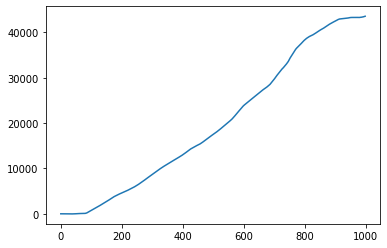

In [16]:
env = TradingEnv(test_input_source, test_to_predict,
                 winlen=winlen, bars_per_episode=bars_per_episode, traded_amt=traded_amt,
                 commission=commission, slippage=slippage
                 )
env = DummyVecEnv([lambda: env])

# visualize the behavior for one random episode
bars_per_episode = 1000

nstate = model.initial_state  # get the initial state vector for the reccurent network
#dones = np.zeros(nstate.shape[0])  # set all environment to not done
nstate=None

observation = env.envs[0].reset()#env.reset()
done = False
navs = []
acts = []
for i in tqdm(range(bars_per_episode)):
    action, nstate = model.predict([observation], state=nstate)
    acts.append(action)
    observation, reward, done, info = env.envs[0].step(action)#env.step(action)
    if done:
        break
    navs.append(env.get_attr('balance')[0])


kl = []
t = 0
for n in np.diff(np.vstack(navs).reshape(-1)):
    t = t + n
    kl.append(t)
plot(kl);

In [8]:
# calculate the likelihood of success for any given episode
try:
    l = 1000

    krl = []
    p = pb.ProgressBar(max_value=l)
    for i in range(l):
        p.update(i)
        observation = env.envs[0].reset()
        done = False
        navs = []
        for i in (range(bars_per_episode)):
            action, nstate = model.predict([observation], state=nstate)
            acts.append(action)
            observation, reward, done, info = env.envs[0].step(action)#env.step(action)
            navs.append(env.get_attr('balance')[0])
        krl.append(sum(navs))
    p.finish()
except KeyboardInterrupt:
    pass

krl = np.array(krl)
print('Profit likelihood: %3.3f%%' % (100*(sum(krl > 0) / len(krl))))

 13% (341 of 2500) |##                   | Elapsed Time: 0:01:56 ETA:   0:12:21

Profit likelihood: 100.000%


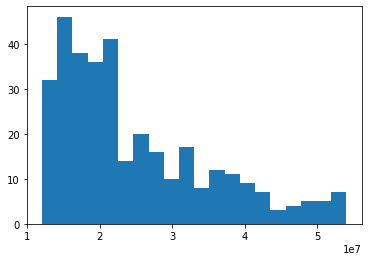

In [9]:
hist(krl,20);